In [1]:
# Useful starting lines
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from scipy import stats
%load_ext autoreload
%autoreload 2

from implementations import *
from helpers import *
from cross_validation import*


In [115]:
from helpers import *
# load data.
particle, products, ids = load_csv_data('data/train.csv', sub_sample= True)

products_ext = np.c_[np.ones((particle.shape[0], 1)), products]


#change -1,1 to 0,1


for i in range(len(particle)):
    if(particle[i] == -1):
        particle[i] = 0 

In [116]:

mean_of_columns = {} 

for i in range(products.shape[1]):
    nb_other_than_999 = sum([ 1 if x != -999 else 0 for x in products[:,i]])
    mean_of_columns[i] = sum([x if x != -999 else 0 for x in products[:,i] if x != -999]  )/nb_other_than_999



##we create a new matrix with all the -999 set to zero
products_999_to_mean = np.zeros(products.shape)
for i in range(products.shape[0]):
    for j in range(products.shape[1]):
        if(products[i,j] == -999):
            products_999_to_mean[i,j] = mean_of_columns[j]
        else:
            products_999_to_mean[i,j] = products[i,j]
print(products_999_to_mean)

[[ 1.38470000e+02  5.16550000e+01  9.78270000e+01 ...  1.24000000e+00
  -2.47500000e+00  1.13497000e+02]
 [ 2.19057000e+02  7.24610000e+01  1.24835000e+02 ... -6.41288136e-03
  -1.21184407e-01  5.03960000e+01]
 [ 9.08010000e+01  2.77870000e+01  6.53730000e+01 ... -6.41288136e-03
  -1.21184407e-01  6.27660000e+01]
 ...
 [ 1.42347000e+02  7.38900000e+00  9.92120000e+01 ... -6.41288136e-03
  -1.21184407e-01  9.70680000e+01]
 [ 7.81620000e+01  4.63350000e+01  6.01360000e+01 ... -6.41288136e-03
  -1.21184407e-01  3.24400000e+01]
 [ 1.30042000e+02  4.07300000e+00  6.78190000e+01 ... -6.41288136e-03
  -1.21184407e-01  5.10370000e+01]]


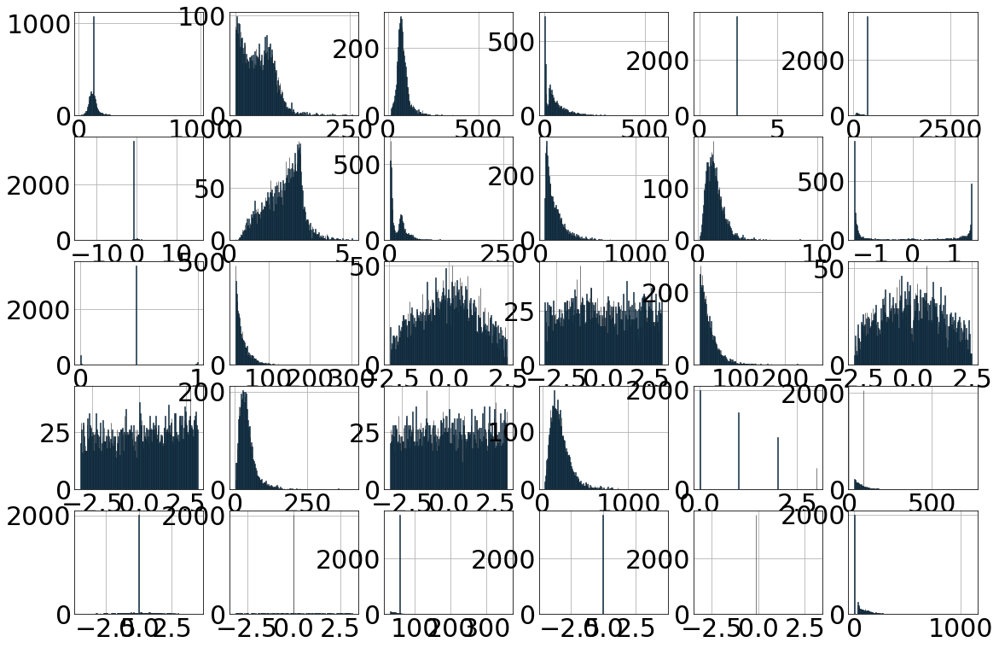

In [165]:
plt.style.use('_mpl-gallery')
# make data
np.random.seed(1)
# plot:
fig, ax = plt.subplots(5,6)

fig.set_size_inches(15, 10)
i=0
j=0
for feature in products_999_to_mean.T:
    ax[i,j].hist(feature, bins=200, linewidth=0.5, edgecolor="black")
    if j==5:
        j = 0
        i += 1
    else:
        j += 1

plt.show()

In [107]:
list_to_log =  [2,21]

for i in list_to_log:
    products_999_to_mean[:,i] = np.log(products_999_to_mean[:,i] + abs(min(products_999_to_mean[:,i])) +1)


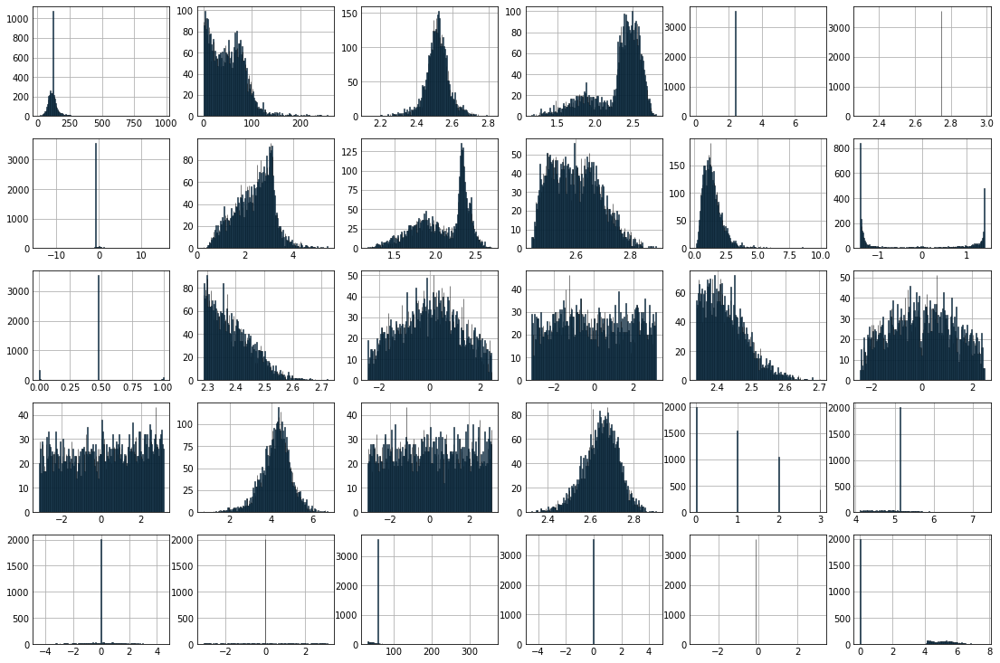

In [15]:
plt.style.use('_mpl-gallery')
# make data
np.random.seed(1)
# plot:
fig, ax = plt.subplots(5,6)

fig.set_size_inches(15, 10)
i=0
j=0
for feature in products_999_to_mean.T:
    ax[i,j].hist(feature, bins=200, linewidth=0.5, edgecolor="black")
    if j==5:
        j = 0
        i += 1
    else:
        j += 1

plt.show()

In [179]:


        

'''
products_logged_and_std = np.zeros(products.shape)


dict_mean = {}


for i in list_to_log:
    dict_mean[i] = np.mean(products[:,i])
    

    
    
    

#here we shift and log the features with a lot of -999, standardize the rest
for i in range(30):
    if i not in list_to_log:
        products_logged_and_std[:, i] = products[:, i] -min(products[:, i]) + 1
        products_logged_and_std[:, i] = np.log(products_logged_and_std[:, i])   
    else:
        products_logged_and_std[:, i],_,_ = standardize(products[:, i])'''


In [117]:
        
# build sampled x and y.
seed = 1
y = np.expand_dims(particle, axis=1)
#y, X = sample_data(y, products, seed, size_samples=1000)

#y, x = sample_data(y, products_logged_and_std, seed, size_samples=2000)

y, x = sample_data(y, products_999_to_mean, seed, size_samples=1000)

#y, x = sample_data(y, products, seed, size_samples=1000)

x, mean_x, std_x = standardize(x)

tx = np.c_[np.ones((y.shape[0], 1)), x]

### Removing features

In [11]:
number_features=x.shape[1]
corr_matrix = np.zeros((number_features,number_features))

for i in range(number_features):
    for j in range(number_features):
        corr = np.corrcoef(x[:,i], x[:,j])[1,0]
        corr_matrix[i][j]=corr


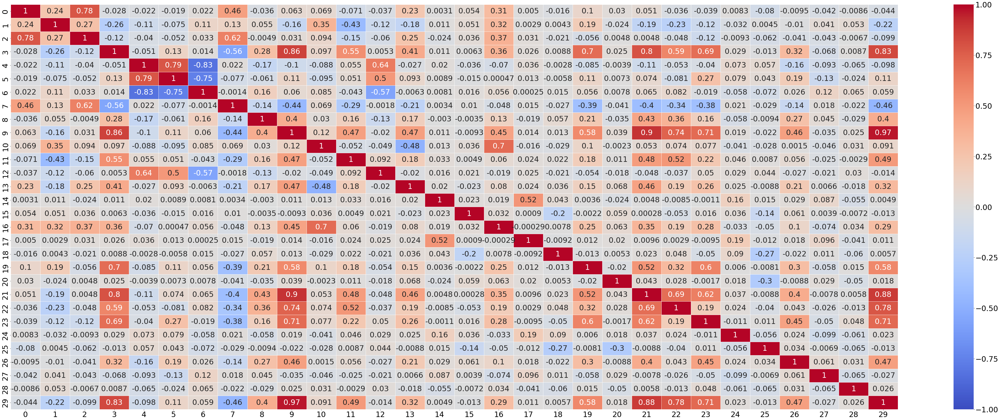

In [12]:
plt.figure(figsize=(80,30))
plt.rc('font',size=30)
sns.heatmap(corr_matrix,vmin = -1, vmax = 1, cmap = 'coolwarm',linewidths = .5, annot=True, annot_kws = {"size":30})
plt.show()

In [13]:

spearman_matrix = np.zeros((number_features,number_features))

for i in range(number_features):
    for j in range(number_features):
        spear,_ = stats.spearmanr(x[:,i],x[:,j])
        spearman_matrix[i][j]=spear

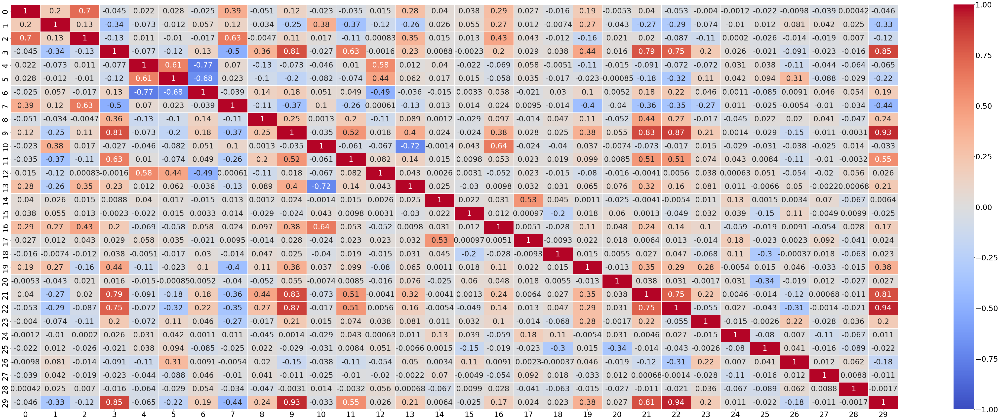

In [14]:
plt.figure(figsize=(80,30))
plt.rc('font',size=30)
sns.heatmap(spearman_matrix,vmin = -1, vmax = 1, cmap = 'coolwarm',linewidths = .5, annot=True, annot_kws = {"size":30})
plt.show()

In [ ]:
# create new matrix tx for training

axis = 1 #rows (0), columns (1)
obj = [4,5,6,9,21,24,25,26,27,28,29]
x_reduced = np.delete(x,obj,axis)
tx_reduced = np.c_[np.ones((y.shape[0], 1)), x_reduced]
#more drastic
#21 to 29

In [ ]:
number_features=x_reduced.shape[1]
reduced_corr_matrix = np.zeros((number_features,number_features))

for i in range(number_features):
    for j in range(number_features):
        corr = np.corrcoef(x_reduced[:,i], x_reduced[:,j])[1,0]
        reduced_corr_matrix[i][j]=corr

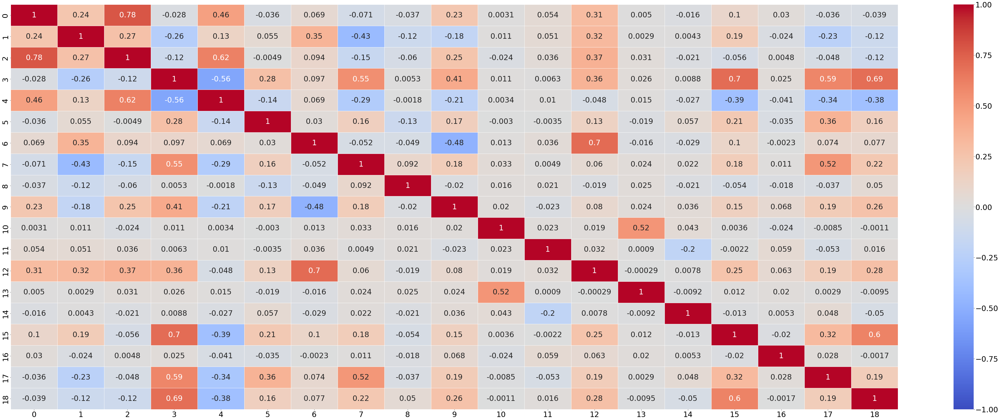

In [17]:
plt.figure(figsize=(80,30))
plt.rc('font',size=30)
sns.heatmap(reduced_corr_matrix,vmin = -1, vmax = 1, cmap = 'coolwarm',linewidths = .5, annot=True, annot_kws = {"size":30})
plt.show()

In [ ]:
# 17,18,8 --> 8

axis = 1 #rows (0), columns (1)
obj = [17,18]
x_reduced = np.delete(x_reduced,obj,axis)
tx_reduced = np.c_[np.ones((y.shape[0], 1)), x_reduced]

In [ ]:
number_features=x_reduced.shape[1]
reduced_corr_matrix = np.zeros((number_features,number_features))

for i in range(number_features):
    for j in range(number_features):
        corr = np.corrcoef(x_reduced[:,i], x_reduced[:,j])[1,0]
        reduced_corr_matrix[i][j]=corr

### Least SQUARES

In [72]:


k_indices = build_k_indices(y, 2, 1)
loss_train, loss_test = cross_validation_least_squares(y, tx, k_indices, 1)
print("train loss : ", loss_train, "test loss : ", loss_test)
#train loss :  0.4005756804226127 test loss :  0.4088629589028149 with pipeline nlog and selected 

train loss :  0.4005756804226127 test loss :  0.4088629589028149


In [73]:
#Reduced
k_indices = build_k_indices(y, 2, 1)
loss_train, loss_test = cross_validation_least_squares(y, tx_reduced, k_indices, 1)
print("train loss : ", loss_train, "test loss : ", loss_test)

train loss :  0.4127090114321582 test loss :  0.4130610695137787


### Find best lambda for ridge regression

 the choice of lambda which leads to the best test rmse is 0.03290 with a test rmse of 0.418


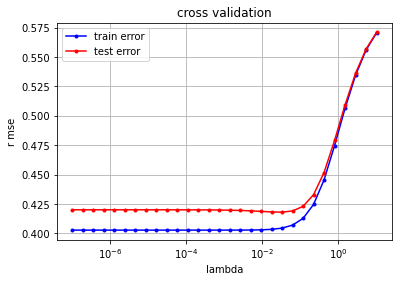

In [16]:
best_lambda, best_rmse = find_best_lambda_ridge_regression(tx, y, 7, np.logspace(-7, 1, 30))

### Logistic Regression

In [81]:
k_indices = build_k_indices(y, 2, 1)
initial_w = np.zeros((tx.shape[1], 1))

loss_train, loss_test = cross_validation_logistic_regression(y, tx, initial_w,  k_indices, 1)
print("train loss all features: ", loss_train, "test loss all features: ", loss_test)

train loss all features:  1.1014260985060764 test loss all features:  0.9014657093473342


 the choice of lambda which leads to the best test rmse is 0.000010000 with a test rmse of 1.145


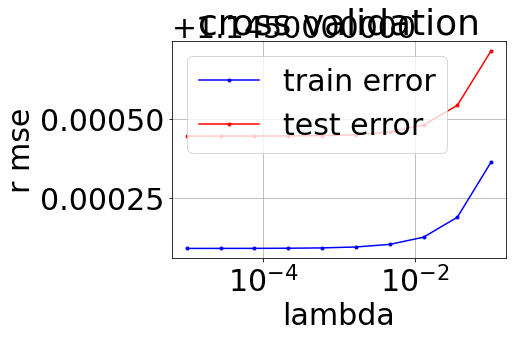

In [156]:
initial_w = np.zeros((tx.shape[1], 1))


best_lambda, best_rmse = find_best_lambda_reg_logistic_regression(tx, y, initial_w, 4, np.logspace(-5, -1, 10))

#logged and selected standardization etc gives 0,6555125 loss 

(2000, 1)


C:\Users\Tanguy\ml-project-1-stochastickers\implementations.py:338: RuntimeWarning: divide by zero encountered in log
  loss = -1/N*np.sum(y*np.log(sigm)+(1-y)*np.log(1-sigm))
C:\Users\Tanguy\ml-project-1-stochastickers\implementations.py:338: RuntimeWarning: invalid value encountered in multiply
  loss = -1/N*np.sum(y*np.log(sigm)+(1-y)*np.log(1-sigm))
C:\Users\Tanguy\ml-project-1-stochastickers\implementations.py:309: RuntimeWarning: overflow encountered in exp
  result = 1 / (1 + np.exp(-t))


 the choice of lambda which leads to the best test rmse is 0.000000000 with a test rmse of 101.000


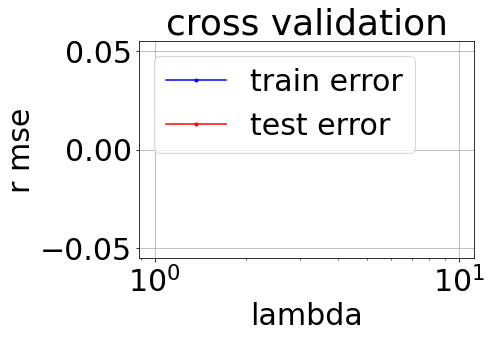

In [89]:
initial_w = np.zeros((tx_reduced.shape[1], 1))

best_lambda, best_rmse = find_best_lambda_reg_logistic_regression(tx_reduced, y, initial_w, 4, np.logspace(-8, -1, 10))

###  logistic cross validation

In [107]:
from cross_validation import *

k_indices = build_k_indices(y, 2, 1)

k=1


initial_w = np.zeros((tx.shape[1], 1))
loss_train, loss_test = cross_validation_logistic_regression(y, tx,initial_w, k_indices, k)
#print("train loss : ", loss_train, "test loss : ", loss_test)


# With raw features (gamma  0.0001, iter 10000), Accuracy : 0.73

# With raw features (gamma  0.0001, iter 1000), Accuracy :  0.732

# With raw features (gamma  0.000002395, iter 1000), Accuracy :  0.6319999999999999  

# With  features standardized (gamma  0.0001, iter 10000), Accuracy : 0.716

# With  features standardized and -999 set to the mean of other values (gamma  0.0001, iter 10000), Accuracy : 0.758

Accuracy,  0.724  +/-  0.0


In [62]:
from cross_validation import *
initial_w = np.zeros((tx.shape[1], 1))



strong_cross_validation_logistic_regression(y, tx,initial_w,8)

# with raw features  1000, 0.000002,  Accuracy,   0.711  +/-  0.05548873759602035

# with standardized features  1000, 0.000002,  Accuracy,   0.694  +/-  0.05257375771237966

#with standardized features and -999 replaced with means 1000, 0.000002,  Accuracy 0.714  +/-  0.05377731863899503

#with standardized features and -999 replaced with means 1000 and logging 2 features, 0.000002,  Accuracy 0.722  +/-  0.054808758424178906

Accuracy,  0.706  +/-  0.05332916650389354
loss


### WITH POLYNOMIAL EXPANSION

In [122]:
from helpers import *


initial_w= np.zeros((tx.shape[1],1))
strong_cross_validation_logistic_regression_polynomial_exp(y, tx, 3,8)
" nan handled, + standardized, no feature selection Accuracy,  0.727  +/-  0.0440794736810684"
" nan handled, + standardized,  feature selection Accuracy, Accuracy,  0.733  +/-  0.03958535082577899  =1,128"
#HIGHER AND LOWER VARIANCE


Accuracy,  0.727  +/-  0.0440794736810684
loss


' nan handled, + standardized,  feature selection Accuracy, Accuracy,  0.733  +/-  0.03958535082577899  =1,128'

Accuracy,  0.736  +/-  0.0
0.5739953934925837  gamma  1e-06
Accuracy,  0.736  +/-  0.0
0.5658665013497765  gamma  5.623413251903491e-06
Accuracy,  0.728  +/-  0.0
0.565899220710822  gamma  3.1622776601683795e-05
Accuracy,  0.736  +/-  0.0
0.8280610358922158  gamma  0.00017782794100389227
Accuracy,  0.732  +/-  0.0
1.375682438374278  gamma  0.001
 the choice of gamma which leads to the best test rmse is 0.000005623 with a test rmse of 0.566


(0, 0.5658665013497765)

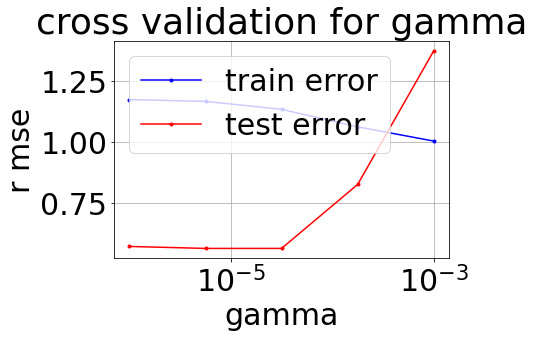

In [123]:

initial_w = np.zeros((tx.shape[1],1))

find_best_gamma_logistic_regression_gamma(tx, y,initial_w, 2, np.logspace(-6, -3, 5))

###  logistic regularized cross validation (features removed)

###  logistic regularized cross validation

In [76]:

k_indices = build_k_indices(y, 2, 1)

k=1

initial_w = np.zeros((tx_reduced.shape[1], 1))
loss_train, loss_test = cross_validation_logistic_regression(y, tx_reduced,initial_w, k_indices, k)


# With  features standardized (gamma  0.0001, iter 10000), filtered and -999 set to the mean of other values, Accuracy : 0.74




Accuracy : 0.74


In [60]:
k_indices = build_k_indices(y, 2, 1)

k=1
lambda_=0.0001


initial_w = np.zeros((tx.shape[1], 1))
loss_train, loss_test = cross_validation_reg_logistic_regression(y, tx,initial_w, k_indices, k,lambda_)
print("train loss : ", loss_train, "test loss : ", loss_test)
# with raw features accuracy, (gamma  0.0001, iter 10000) lambda_=0.00001, Accuracy : 0.756 

# with  features standardized, (gamma  0.0001, iter 10000), lambda_=0.00001, Accuracy : 0.72


# With  features standardized, (gamma  0.0001, iter 10000) and -999 set to the mean of other values lambda_=0.00001, Accuracy : 0.748

# With  features standardized, (gamma  0.0001, iter 10000) and -999 set to the mean of other values lambda_=0.0001, Accuracy : 0.748

Accuracy : 0.748
train loss :  0.6756139628633687 test loss :  0.674727172733365


###  logistic regularized 

In [20]:
initial_w = np.zeros((tx.shape[1], 1))

final_w_logistic, loss = logistic_regression(y, tx, initial_w, 200000, 0.000001) 


# raw logistic_regression(y, tx, initial_w, 200000, 0.000001) gives 0.5098306728538047
# raw and reduced features logistic_regression(y, tx, initial_w, 200000, 0.000001) gives 0.5098306728538047

# with selected standardized and logs, logistic_regression(y, tx, initial_w, 200000, 0.000001) gives 
#0.6326618478544922

# with all standardized logs, logistic_regression(y, tx, initial_w, 200000, 0.000001) gives 0.6484281111936026


#-999 to column  mean

#final_w_ls, loss = least_squares(y, tx) 
print(loss)

0.5098306728538047


###  logistic regularized  with features removed

In [18]:
initial_w = np.zeros((tx_reduced.shape[1], 1))

final_w_logistic_f_removed, loss = logistic_regression(y, tx_reduced, initial_w, 200000, 0.000001) 

#-999 to column  mean and features removed 0.668711585952288

#features removed and raw 0.5226189888587269

#final_w_ls, loss = least_squares(y, tx) 
print(loss)

0.5226189888587269


### FIND BEST LAMBDA EXPended

Accuracy for lambda  1e-05 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  3.5938136638046256e-05 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.0001291549665014884 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.0004641588833612782 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.0016681005372000592 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.005994842503189409 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.021544346900318846 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.07742636826811278 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  0.2782559402207126 :  0.659  +/-  0.032999999999999974
Accuracy for lambda  1.0 :  0.659  +/-  0.032999999999999974
 the choice of lambda which leads to the best test accuracy is 0.000010000 with an accuracy of 0.659


'\nfeatures standardized degree, nan handled 3\n\n\nAccuracy for lambda  1e-05 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  3.5938136638046256e-05 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.0001291549665014884 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.0004641588833612782 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.0016681005372000592 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.005994842503189409 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.021544346900318846 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.07742636826811278 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  0.2782559402207126 :  0.728  +/-  0.01200000000000001\nAccuracy for lambda  1.0 :  0.728  +/-  0.01200000000000001\n\n'

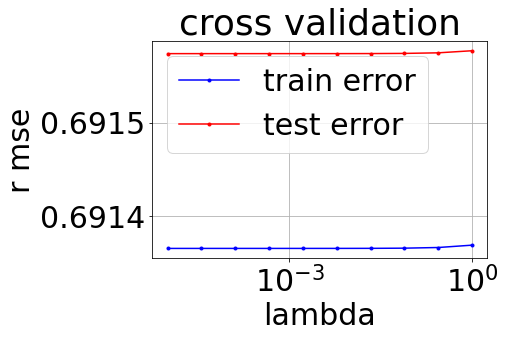

In [114]:
from cross_validation import *


find_best_lambda_reg_logistic_regression_exp(tx_reduced, y,2, 2, np.logspace(-5, 0, 10))

'''
#features raw degree 6
Accuracy for lambda  1e-05 :  0.706  +/-  0.016000000000000014
Accuracy for lambda  3.5938136638046256e-05 :  0.706  +/-  0.016000000000000014
Accuracy for lambda  0.0001291549665014884 :  0.706  +/-  0.016000000000000014
Accuracy for lambda  0.0004641588833612782 :  0.706  +/-  0.016000000000000014
Accuracy for lambda  0.0016681005372000592 :  0.706  +/-  0.016000000000000014
Accuracy for lambda  0.005994842503189409 :  0.706  +/-  0.016000000000000014
Accuracy for lambda  0.021544346900318846 :  0.6990000000000001  +/-  0.022999999999999965

features standardized degree 3
Accuracy for lambda  1e-05 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  3.5938136638046256e-05 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.0001291549665014884 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.0004641588833612782 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.0016681005372000592 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.005994842503189409 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.021544346900318846 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.07742636826811278 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  0.2782559402207126 :  0.719  +/-  0.01100000000000001
Accuracy for lambda  1.0 :  0.719  +/-  0.01100000000000001
'''


'''
features standardized degree, nan handled 3


Accuracy for lambda  1e-05 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  3.5938136638046256e-05 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.0001291549665014884 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.0004641588833612782 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.0016681005372000592 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.005994842503189409 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.021544346900318846 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.07742636826811278 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  0.2782559402207126 :  0.728  +/-  0.01200000000000001
Accuracy for lambda  1.0 :  0.728  +/-  0.01200000000000001

'''

### FIND BEST LAMBDA EXPended with features removed

In [ ]:

find_best_lambda_reg_logistic_regression_exp(tx_reduced, y,3, 8, np.logspace(-7, 1, 15))


#best degree is 3

Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
Accuracy : 0.724
Accuracy : 0.708
Accuracy : 0.752
Accuracy : 0.704
 the choice of lambda which leads to the best test rmse is 0.000000100 with a test rmse of 0.693


(1e-07, 0.6927453717700068)

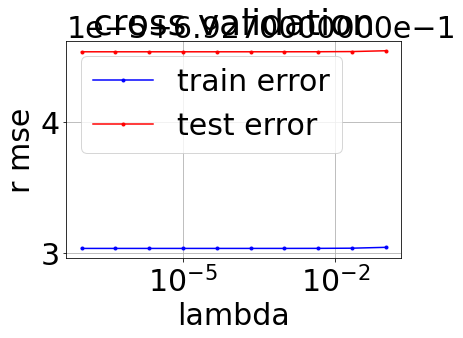

In [56]:
initial_w = np.zeros((tx.shape[1], 1))



find_best_lambda_reg_logistic_regression(tx, y, initial_w,4,   np.logspace(-7, -1, 10))

In [142]:
test_particle, products_test, ids_test = load_csv_data('data/test.csv', sub_sample= False)
nb_test_samples = test_particle.shape[0]
products_test = np.c_[np.ones((nb_test_samples, 1)), products_test]



(568238,)


In [143]:
predictions = []


for row in products_test:
    result = row.T @ final_w_logistic
    if( result < 0):
        predictions.append(-1)
        
    else:
        predictions.append(1)
#print(len(predictions))
#create_csv_submission(ids_test, predictions, "submission_test_ls.csv")

[-0.11373506]
[0.09676937]
[0.25701206]
[0.38524211]
[-0.05321439]
[0.05519666]
[0.30424313]
[0.26278658]
[0.13176356]
[1.01586576]
[0.04704372]
[0.04840623]
[0.39311272]
[0.5081438]
[-0.08923718]
[0.04258745]
[0.20932509]
[-0.0371847]
[0.10493599]
[0.41619765]
[0.16786916]
[0.26708371]
[0.25130165]
[0.4502935]
[0.56591658]
[0.33454804]
[0.43805847]
[0.2522074]
[0.27817873]
[0.1478058]
[0.03354941]
[-0.11425711]
[0.34449408]
[0.49542057]
[0.11672954]
[0.22322219]
[0.17431076]
[0.37982991]
[0.37031596]
[0.03795765]
[0.31564264]
[0.24980753]
[0.1814068]
[0.70498974]
[0.34386581]
[0.25588572]
[0.05871429]
[0.79543908]
[0.3962164]
[0.29071985]
[0.38370821]
[0.45947953]
[0.50751889]
[0.35415752]
[0.6245825]
[0.19296924]
[0.14530495]
[0.06706686]
[0.43814059]
[0.29962649]
[0.15265406]
[0.23387825]
[0.76915855]
[0.21257773]
[0.61835589]
[0.20338204]
[0.18122959]
[1.40654318]
[0.67560735]
[0.53106668]
[0.67539066]
[-0.20490695]
[0.64287296]
[0.48012457]
[0.08365347]
[0.41837453]
[0.04441474]
[

[0.67113889]
[0.02404742]
[0.07492507]
[0.77548858]
[0.22394175]
[0.17108275]
[-0.13447112]
[0.25408914]
[0.14344478]
[0.25206527]
[0.77780359]
[0.32051257]
[0.13821212]
[0.12916157]
[0.46046177]
[0.51150748]
[0.32608944]
[0.53263036]
[0.15583055]
[-0.01005377]
[0.35595477]
[0.13106369]
[0.60460246]
[0.80131052]
[0.16935075]
[0.81178642]
[0.07324518]
[0.28242252]
[0.57864651]
[0.37782452]
[0.50626943]
[0.15680643]
[0.32517413]
[0.14489398]
[0.54575142]
[0.3878647]
[0.26890177]
[0.15798617]
[0.16613417]
[0.46085871]
[0.14461058]
[0.51762083]
[0.58597935]
[0.14144442]
[0.52058793]
[0.31096339]
[0.58580696]
[0.4621325]
[0.16779273]
[0.23138121]
[0.38088509]
[0.1604587]
[0.41614494]
[0.18753805]
[0.45953194]
[0.03141361]
[0.6529103]
[0.59932979]
[0.57522218]
[0.5574012]
[0.2790399]
[0.22589527]
[0.2543101]
[0.34205378]
[0.05257859]
[0.08297004]
[0.01439351]
[0.07809716]
[0.45820855]
[0.48295701]
[0.00197869]
[0.25028633]
[-0.04612238]
[0.74818794]
[0.35098115]
[0.22452622]
[0.22396888]
[0.

[0.05856745]
[0.59716416]
[-0.03583588]
[0.53407108]
[0.21009737]
[0.40212667]
[0.37172059]
[0.436888]
[0.40176589]
[0.25665555]
[0.39692844]
[0.77662123]
[0.29132118]
[0.46750743]
[0.78203764]
[0.09207608]
[-0.01651169]
[0.95788617]
[0.4185745]
[1.01590183]
[-0.10711855]
[0.02224112]
[0.00743617]
[0.12876131]
[0.31703317]
[0.47354627]
[0.0836355]
[0.68559166]
[0.6103324]
[0.55440057]
[0.10355162]
[0.13930779]
[0.42036473]
[0.18084408]
[0.44452434]
[0.10851477]
[0.45207113]
[0.17979392]
[0.22324427]
[0.64232964]
[0.68876536]
[0.45815091]
[0.41763528]
[0.84048618]
[0.85529329]
[0.5483171]
[0.79678801]
[0.3243023]
[0.27258291]
[0.6033951]
[0.17377856]
[0.18114909]
[0.4181821]
[-0.14017422]
[0.27791701]
[0.18969903]
[0.46210049]
[0.85050734]
[0.74594536]
[1.03415399]
[0.29128277]
[0.41798798]
[0.4415338]
[0.14918503]
[0.6623104]
[-0.03416916]
[0.1909279]
[0.55152721]
[0.27924576]
[0.426549]
[0.21205597]
[0.08337795]
[0.03335636]
[0.58310939]
[0.55735393]
[0.50151935]
[0.10360373]
[0.37699

[0.10694799]
[0.07569359]
[0.5234616]
[0.91881172]
[0.09194787]
[0.72823108]
[0.27532286]
[0.28380989]
[0.09435621]
[0.92539605]
[0.49677427]
[0.55372446]
[0.49706032]
[0.49606868]
[0.04173526]
[0.20057612]
[0.52814897]
[0.32085371]
[0.75405185]
[0.24560245]
[0.30829989]
[0.7583169]
[0.0206636]
[0.50234212]
[0.58535301]
[0.14771798]
[0.25909552]
[0.16514355]
[0.44610192]
[0.36013924]
[0.40262691]
[0.93734654]
[0.40769079]
[0.30745146]
[0.45378452]
[0.20977136]
[0.11951801]
[0.25914741]
[0.745755]
[-0.05043003]
[0.47934448]
[0.15166183]
[-0.13080627]
[0.9272489]
[0.04924398]
[0.79833315]
[0.48792128]
[1.03808223]
[-0.01388021]
[0.24925471]
[0.24298579]
[0.15876769]
[0.46587393]
[0.16706752]
[0.34929238]
[0.58458315]
[0.70587734]
[0.4340109]
[0.95333149]
[0.75765767]
[0.3993808]
[-0.01645036]
[0.41416007]
[0.13955069]
[0.14557374]
[0.23137311]
[0.37759208]
[0.8443069]
[0.17902206]
[0.60590934]
[0.34139369]
[0.27244636]
[0.10527095]
[0.47229701]
[0.01644852]
[0.38544958]
[0.05890406]
[0.1

[0.28988915]
[0.35922918]
[0.13713562]
[0.63253808]
[0.57137821]
[1.04016762]
[0.64716466]
[-0.03442651]
[0.69570522]
[0.17474596]
[0.55725582]
[0.42430017]
[0.19723649]
[0.24161801]
[0.0913069]
[0.47312697]
[0.74794746]
[0.6178449]
[0.65545288]
[0.27579364]
[0.46074584]
[0.60918755]
[0.18040176]
[0.36907654]
[0.22399235]
[0.41018141]
[0.48157154]
[0.09438232]
[0.65589647]
[0.95869709]
[0.75374907]
[0.40772302]
[0.37066724]
[0.34347792]
[0.28832295]
[0.63094742]
[0.5491695]
[0.82028698]
[0.43476991]
[-0.10922166]
[0.47950615]
[0.20638157]
[0.07141986]
[0.83329867]
[0.80225857]
[0.30305417]
[0.50649373]
[0.40357495]
[0.20701638]
[0.32927795]
[0.42130463]
[0.27256062]
[0.22828126]
[0.11703834]
[0.66978441]
[0.1529349]
[0.3070462]
[0.11491451]
[0.10795938]
[0.76718708]
[0.32714223]
[0.5983942]
[0.22294755]
[-0.05528452]
[-0.1250658]
[0.77397991]
[0.05468261]
[0.12179943]
[0.71473368]
[0.28406123]
[0.43249034]
[0.35030258]
[0.64930774]
[0.54335322]
[0.53613249]
[0.48366743]
[0.08302052]
[0

[0.26069484]
[0.80956542]
[0.3788511]
[0.5821743]
[-0.13647663]
[0.24182286]
[0.32255735]
[0.31686225]
[0.28259956]
[0.28607339]
[0.57515716]
[0.12336808]
[0.52964699]
[0.27878305]
[0.05798206]
[0.44604585]
[0.7109977]
[0.23956326]
[0.1210545]
[0.4824681]
[0.14902745]
[-0.00688335]
[0.44547726]
[0.13917332]
[0.38983625]
[0.22056895]
[0.08295203]
[0.68556723]
[0.48114992]
[0.44798086]
[-0.07719503]
[0.77282136]
[0.35136831]
[0.22848839]
[0.01004738]
[0.32296857]
[0.6012971]
[0.31040993]
[0.28121243]
[0.12037475]
[0.09603553]
[0.45404136]
[0.05579874]
[0.10308944]
[0.61411061]
[0.56191907]
[0.24776764]
[0.56813733]
[0.31052966]
[0.2667116]
[0.43677154]
[0.4276232]
[0.23752461]
[0.6172363]
[0.00266973]
[0.29957843]
[0.46834544]
[0.11578636]
[0.85423447]
[1.0456253]
[0.89708852]
[0.33501406]
[0.58869046]
[0.17889429]
[0.3899062]
[0.52594225]
[0.48537458]
[0.01893541]
[0.22383013]
[0.34738802]
[0.65062656]
[-0.03739917]
[0.01040129]
[0.57193962]
[0.20451574]
[0.36485271]
[0.14462268]
[0.235

[0.40516961]
[0.40039972]
[-0.17765746]
[0.62693891]
[0.60702618]
[0.26794288]
[0.33009156]
[0.04915456]
[0.1855774]
[0.10582506]
[0.21363767]
[-0.05810025]
[0.46792699]
[0.88552716]
[0.17805496]
[0.12429799]
[0.25792636]
[0.29294228]
[0.12810287]
[0.07777175]
[-0.02689782]
[0.05238963]
[0.03885268]
[0.63122443]
[0.23792008]
[0.02759361]
[0.13975789]
[0.40407214]
[0.35122712]
[0.66069147]
[0.42092368]
[0.50448088]
[0.12914071]
[0.15356885]
[0.17520176]
[0.61766368]
[0.67742361]
[0.1479975]
[0.4863824]
[0.53961013]
[0.18126649]
[0.15326114]
[0.40863868]
[0.29340642]
[0.3115724]
[0.60611448]
[0.86973089]
[0.29915364]
[0.12099747]
[0.76421884]
[0.3143674]
[0.13001306]
[0.02657583]
[0.59851428]
[0.89347384]
[0.33059247]
[-0.04920419]
[0.7006856]
[0.39895404]
[0.2842296]
[-0.01914973]
[0.16942446]
[0.4422219]
[0.22720421]
[0.4756455]
[0.62968133]
[0.24947475]
[0.76134722]
[0.44935571]
[0.52530119]
[-0.03651085]
[0.34884649]
[0.6768457]
[0.26371938]
[0.46206347]
[0.42517407]
[-0.00644162]
[0

[0.07604348]
[0.27855204]
[0.49229233]
[0.32420999]
[0.31273247]
[0.27645623]
[0.47105592]
[0.13112808]
[0.01799977]
[0.6113768]
[0.51946625]
[0.63152492]
[0.44396486]
[0.13047297]
[0.19665463]
[0.54172374]
[0.39245532]
[1.05363704]
[0.19122034]
[0.50083396]
[0.42117746]
[0.23729699]
[0.34630736]
[0.14203431]
[0.67603604]
[-0.06857589]
[0.85347276]
[0.13428342]
[0.07732172]
[0.49555197]
[0.49086844]
[0.52820717]
[0.1742946]
[0.54326553]
[0.14262217]
[-0.00298119]
[0.5036043]
[-0.04100194]
[0.41826882]
[0.44789237]
[0.4606231]
[0.04359267]
[0.98050657]
[0.41721188]
[0.17668332]
[0.5357573]
[0.24568709]
[0.18207387]
[0.31520375]
[0.46806047]
[0.53584634]
[0.38037202]
[0.13788101]
[-0.00519655]
[-0.07236145]
[0.09687892]
[1.18437639]
[0.31506206]
[0.27005901]
[0.21399397]
[0.37360283]
[0.11419354]
[0.39237512]
[0.43236138]
[0.52776012]
[0.12946792]
[0.51940913]
[0.45346472]
[0.02220425]
[0.00407528]
[0.45704806]
[0.18407886]
[0.43975878]
[0.50177207]
[0.25151156]
[0.36850025]
[0.13801762]

[0.50190143]
[0.51526717]
[0.608591]
[0.19553968]
[0.10799704]
[1.12857161]
[0.68998374]
[0.52512542]
[0.65552775]
[0.08262431]
[0.76155613]
[0.32328459]
[0.13946469]
[0.35600865]
[0.51757278]
[0.40008008]
[0.17235837]
[0.17147424]
[0.07621819]
[0.79164964]
[0.40077852]
[0.25481485]
[0.50054491]
[0.24507796]
[0.24177101]
[0.52770838]
[0.67742799]
[0.70586564]
[0.51250637]
[0.51250379]
[0.53425248]
[0.53072219]
[0.36456079]
[0.58457629]
[0.21839324]
[0.52477165]
[0.53817926]
[0.42004638]
[0.13413051]
[0.28203272]
[0.15830449]
[0.31721547]
[0.46325998]
[0.2229217]
[0.22650344]
[0.02275865]
[0.40255544]
[0.50169161]
[0.43113819]
[0.31540891]
[-0.23583187]
[0.1862496]
[0.09628493]
[0.54098265]
[0.06984141]
[0.39042999]
[0.35000247]
[0.049014]
[0.39621551]
[0.10748552]
[-0.20474217]
[0.35138811]
[0.09459017]
[0.05373509]
[0.51928337]
[0.48121138]
[0.46579482]
[0.18625191]
[0.15920235]
[0.36230616]
[0.475955]
[0.48323943]
[0.34119706]
[-0.04019987]
[0.57747535]
[0.9944351]
[0.19403205]
[0.07

[0.67944489]
[0.57105751]
[0.18383503]
[0.21719588]
[0.35643685]
[0.69307471]
[0.50148483]
[0.56308957]
[0.84841293]
[0.17616122]
[0.141719]
[0.84647566]
[0.84777169]
[-0.00310418]
[0.2313251]
[0.20966865]
[0.76142981]
[0.20263101]
[0.16552952]
[0.08576653]
[0.03830501]
[0.30939341]
[0.23133193]
[-0.0187303]
[0.11698796]
[0.11551669]
[0.50206538]
[0.48830587]
[-0.07655034]
[0.16218391]
[0.49750176]
[0.32088308]
[-0.05697417]
[0.38973548]
[0.98628919]
[0.17924479]
[0.11261289]
[0.64286158]
[0.21555377]
[-0.13797056]
[0.19106418]
[0.54600375]
[0.06662562]
[0.11883138]
[0.35779914]
[0.31327596]
[0.24130632]
[0.88715959]
[0.41181733]
[0.31889346]
[0.16186523]
[0.31719031]
[0.79132528]
[0.43506865]
[0.32709068]
[0.23671188]
[0.3482042]
[0.2144452]
[-0.07335372]
[-0.00211831]
[0.30821357]
[-0.15462471]
[0.05527412]
[0.51843926]
[0.38502001]
[0.5153318]
[0.40085914]
[0.70287443]
[0.05483408]
[0.09451267]
[0.09177159]
[0.31151073]
[0.38001524]
[0.49910841]
[0.34923138]
[-0.00191772]
[-0.00121]

[0.50341403]
[0.24469959]
[0.23068031]
[-0.08804952]
[0.43112682]
[0.75988423]
[0.70911159]
[0.5066298]
[0.38424758]
[0.39258328]
[0.49517431]
[0.40876436]
[0.45681792]
[0.87426257]
[0.11215047]
[0.20172984]
[0.66581274]
[0.45385627]
[0.00669438]
[0.2155947]
[0.53414383]
[0.25905235]
[0.38609258]
[0.30009176]
[0.33266546]
[0.22440404]
[0.65695779]
[0.24968636]
[0.09627037]
[0.35623111]
[0.46724263]
[0.26503801]
[0.87078919]
[-0.02278594]
[0.31684886]
[0.44210391]
[0.09773405]
[0.71344913]
[0.2127396]
[0.10801539]
[1.04652256]
[0.08346732]
[0.57423982]
[0.18394767]
[0.11159523]
[0.11818606]
[0.40506102]
[0.11129704]
[0.12780861]
[0.52454987]
[0.18832613]
[0.33727515]
[0.30344736]
[0.03613824]
[0.41228342]
[0.48117165]
[0.12303595]
[0.5831396]
[0.10386213]
[0.05825373]
[0.2635221]
[0.16830964]
[-0.00207183]
[0.39708337]
[0.16118504]
[0.14111239]
[0.33281438]
[0.86453382]
[0.56611237]
[0.10173475]
[0.68766855]
[0.370261]
[0.29058605]
[0.70612854]
[0.38287567]
[0.25600462]
[0.03326317]
[0.

[0.56845276]
[0.32140032]
[0.24214697]
[0.4226362]
[1.11623544]
[0.46579065]
[0.25591298]
[0.74659453]
[0.1041718]
[0.24766013]
[0.05212597]
[0.36696181]
[0.26779688]
[0.18204672]
[0.63527793]
[0.08262054]
[0.57713377]
[0.08743006]
[0.34500855]
[0.4939854]
[0.2783949]
[0.38096514]
[0.66288246]
[0.53977438]
[0.2981304]
[0.5361717]
[0.43685033]
[0.34657016]
[0.22770809]
[0.60182139]
[0.34032159]
[0.38955882]
[0.36991466]
[0.19921471]
[-0.10429375]
[0.46312754]
[0.60319758]
[0.24951954]
[0.55271013]
[0.11829658]
[0.19740399]
[0.30818647]
[0.8322228]
[0.11649553]
[0.43788652]
[0.58641616]
[0.25718299]
[1.12812974]
[0.39773141]
[0.52920675]
[0.13780711]
[0.5125728]
[0.76743794]
[0.18477378]
[-0.10192175]
[0.2656902]
[0.26919982]
[-0.17380964]
[0.00552008]
[0.51133258]
[0.22808263]
[0.7253315]
[0.2091389]
[0.72276123]
[0.05935197]
[0.40106446]
[0.33359261]
[0.57225937]
[0.35031455]
[0.81115848]
[0.30286421]
[0.37718954]
[0.14228959]
[0.34553504]
[0.16644896]
[0.03327836]
[0.15306498]
[0.4145

[-0.01917921]
[0.59205127]
[-0.05168907]
[0.16619436]
[0.6387147]
[0.19096906]
[0.0857689]
[0.17925106]
[0.60156126]
[0.67933361]
[0.30409012]
[-0.0147162]
[0.16729985]
[0.69604452]
[0.60961291]
[0.06924354]
[0.50660188]
[0.26584582]
[0.17433637]
[0.3113733]
[0.41424124]
[0.38084458]
[0.10709056]
[-0.07725409]
[-0.05534273]
[0.46254564]
[0.47210011]
[0.43046019]
[0.49023738]
[0.47004034]
[0.1626898]
[0.29588101]
[0.18131643]
[0.50637032]
[0.56343286]
[0.40024498]
[0.44403812]
[0.83649846]
[0.69552213]
[0.06399503]
[0.35169585]
[0.22651003]
[0.0676515]
[0.27623354]
[-0.0690084]
[0.38071553]
[0.27053267]
[0.23117649]
[0.33482416]
[0.40981454]
[0.10598593]
[0.20161314]
[0.44867496]
[0.13107018]
[0.27227736]
[1.20059368]
[0.45406921]
[0.46172847]
[0.16892571]
[0.36055913]
[0.57371414]
[0.92187045]
[0.19272056]
[0.1021307]
[0.56894554]
[0.39130777]
[0.03845315]
[0.40281453]
[0.97617648]
[0.1241119]
[0.44493232]
[0.44621586]
[0.49870836]
[0.51640707]
[0.339535]
[0.64551155]
[0.42601407]
[0.5

[0.52722329]
[0.212733]
[1.32395917]
[0.26202432]
[0.43985767]
[0.16171705]
[0.21819636]
[0.13233417]
[0.46913095]
[0.95792314]
[0.70752206]
[0.46075465]
[0.54419466]
[0.05433005]
[0.72436576]
[0.06530989]
[0.07081491]
[0.34921722]
[0.29546721]
[0.43495785]
[0.35391583]
[0.62309292]
[0.54082226]
[0.1367547]
[-0.00730714]
[0.23741614]
[0.50866662]
[0.58151136]
[0.28986709]
[0.50913119]
[0.68427557]
[0.21799682]
[0.06504012]
[0.40204836]
[0.623859]
[0.11769285]
[0.75158104]
[-0.10673047]
[0.13419341]
[0.41611242]
[0.78200859]
[0.48854226]
[0.04110036]
[-0.05161065]
[0.29027696]
[0.71521225]
[0.53026576]
[0.48981053]
[0.48882021]
[0.16209805]
[0.54391732]
[0.48018942]
[0.44936265]
[0.46568334]
[0.40046021]
[0.7679938]
[-0.01911825]
[0.46749521]
[0.79496814]
[0.28234402]
[0.07333712]
[1.10735655]
[0.10870206]
[0.14896716]
[0.47825752]
[0.44362258]
[0.39944835]
[0.46654777]
[0.36031464]
[0.27819525]
[0.52133754]
[0.22234019]
[0.44125903]
[0.35444008]
[0.47906949]
[0.31325882]
[0.39113171]
[

[0.54157247]
[0.32438412]
[0.18225922]
[0.49306278]
[0.3851208]
[0.53505712]
[0.49123019]
[0.04707262]
[-0.07961121]
[0.60147518]
[-0.0298679]
[0.21340592]
[-0.14873368]
[0.60355072]
[-0.0404737]
[-0.05049219]
[0.19796988]
[0.40879506]
[0.39376042]
[0.78486341]
[0.34235063]
[0.41851254]
[0.36974294]
[0.65222648]
[0.05983725]
[-0.03464153]
[0.64916588]
[0.54419557]
[0.54008351]
[0.11725842]
[0.47318239]
[0.25111694]
[0.66322274]
[0.24382126]
[0.35108509]
[0.96308627]
[0.60339438]
[0.16192616]
[0.57946245]
[0.67991538]
[0.16608121]
[0.4304706]
[0.43959063]
[-0.0618749]
[0.39862504]
[0.36679103]
[0.06489037]
[0.09696639]
[0.17919692]
[0.24816485]
[0.23763632]
[0.74426761]
[0.57226699]
[0.82080772]
[0.07227019]
[0.7767167]
[0.03543491]
[0.19494003]
[1.02033214]
[0.31443619]
[0.56523574]
[0.37340611]
[0.04173317]
[0.04661074]
[0.34936059]
[0.23850719]
[0.58046425]
[0.51737912]
[0.4506443]
[0.66684628]
[0.58744604]
[0.28020643]
[0.18209155]
[0.40393116]
[0.44905045]
[0.84490727]
[0.51260829]

[0.59964985]
[-0.1274862]
[0.11505974]
[0.10496162]
[0.99854687]
[0.14712492]
[0.14673631]
[0.19914316]
[0.7444366]
[0.1784518]
[0.17446603]
[0.18514275]
[0.42236953]
[0.28796721]
[0.18821823]
[0.57656624]
[0.12936062]
[-0.05289412]
[0.27734588]
[0.44920261]
[0.49883518]
[0.11138891]
[0.46799056]
[0.12585146]
[-0.07724835]
[0.39770789]
[0.2778644]
[0.52767926]
[0.1294429]
[-0.01404875]
[0.45221706]
[0.02706462]
[0.34567581]
[0.52966023]
[0.55050513]
[0.50933169]
[0.52028283]
[0.59900863]
[0.40549976]
[0.80857448]
[0.57616566]
[0.44315334]
[0.33328522]
[0.3279558]
[0.52896323]
[0.64547223]
[0.38932478]
[0.54008952]
[0.25606588]
[0.04438846]
[0.61785515]
[0.39846656]
[0.55687348]
[0.42717667]
[0.16787815]
[0.60699093]
[0.09993969]
[0.30148212]
[0.15449025]
[0.27219304]
[0.44279341]
[0.38541627]
[0.82306642]
[0.56836286]
[0.29175906]
[0.01367549]
[0.24637836]
[0.26199749]
[0.18707394]
[0.44585925]
[0.0982087]
[0.54467322]
[0.19831068]
[0.07967437]
[0.49263503]
[0.10083073]
[-0.03064975]
[

[0.25073475]
[0.32802184]
[0.48337402]
[0.04452441]
[0.2100405]
[0.2282944]
[-0.0436029]
[0.60166273]
[0.36242717]
[0.40129183]
[-0.01033805]
[0.53870814]
[0.8930155]
[0.32559552]
[0.28254027]
[0.34140343]
[0.46002168]
[0.31380649]
[0.38217316]
[0.30837441]
[0.31971656]
[0.75213117]
[0.40760059]
[0.2754964]
[0.43993482]
[0.08011008]
[-0.01916227]
[0.26543644]
[0.08350323]
[0.20218344]
[0.30363541]
[0.32718027]
[0.15021829]
[0.41798258]
[-0.00110444]
[-0.04782825]
[0.30822099]
[0.45382325]
[0.0870952]
[-0.0342252]
[0.7427003]
[0.24399283]
[0.08662502]
[0.24865544]
[0.46913876]
[0.49773312]
[0.27680134]
[0.54850705]
[0.03927164]
[0.82192082]
[0.09046277]
[0.36686265]
[0.24248678]
[0.00898352]
[0.14245478]
[0.57992344]
[0.15701428]
[0.33007285]
[0.57509316]
[0.30007574]
[0.7051324]
[0.46131145]
[0.58584468]
[0.51335446]
[0.28039183]
[0.60780025]
[-0.05456144]
[0.41291181]
[0.37456921]
[-0.09991669]
[0.77212024]
[0.13531672]
[0.25270183]
[0.07938069]
[0.47152026]
[0.5842173]
[0.62604334]
[

[0.48592777]
[0.5396905]
[0.53238884]
[-0.04868411]
[0.51224088]
[0.46091589]
[0.20735431]
[0.51111579]
[0.47395537]
[0.49530718]
[0.12542029]
[-0.00328268]
[0.42002872]
[0.21870776]
[1.05261835]
[0.17796907]
[0.16202657]
[0.14303874]
[0.08163306]
[0.03382616]
[0.4456513]
[0.22225762]
[0.00627297]
[0.19571041]
[0.42636804]
[-0.20039552]
[0.4651494]
[0.71007877]
[0.86220727]
[0.24218334]
[0.48856465]
[0.73808859]
[0.28768489]
[0.85993984]
[0.10038713]
[0.09504067]
[0.32393776]
[0.21086524]
[0.38015571]
[0.07911338]
[0.50175464]
[0.80127231]
[0.45329654]
[0.64340911]
[0.01643244]
[0.58039324]
[0.21241471]
[0.70066205]
[0.45130569]
[0.16941955]
[0.12634806]
[0.53618359]
[0.612928]
[0.12001673]
[0.35488889]
[0.54569669]
[0.19060298]
[0.0976774]
[0.45851571]
[0.28353064]
[0.59676455]
[0.17774456]
[0.62165869]
[0.48838373]
[0.16635085]
[0.1525383]
[0.38797503]
[0.33659227]
[0.86562789]
[0.62535608]
[0.48161744]
[0.91856013]
[0.92499325]
[0.38763968]
[0.47155618]
[0.38322963]
[0.73728462]
[0.

[0.0552376]
[0.63638119]
[0.53350224]
[-0.01273641]
[0.36326712]
[0.36553377]
[0.28360952]
[0.35866836]
[0.42518154]
[0.53286092]
[-0.13558797]
[0.41791815]
[0.44169303]
[0.43480881]
[0.57332939]
[0.70580426]
[0.64180951]
[0.15556973]
[0.2548993]
[0.51126037]
[0.21681643]
[0.31103171]
[0.35503302]
[0.1200165]
[0.24569359]
[-0.05802017]
[0.47947465]
[0.60097865]
[0.3215448]
[0.48967806]
[0.69567568]
[0.62235045]
[0.95272452]
[0.72242442]
[0.29029623]
[0.05936595]
[0.48580674]
[0.49438579]
[0.36516743]
[1.01954998]
[0.26236346]
[0.59104251]
[0.48314622]
[0.38798678]
[0.55777687]
[0.40793382]
[0.15820613]
[0.31707864]
[0.21453832]
[0.02642001]
[0.1522911]
[0.31957279]
[0.59482092]
[0.02112588]
[0.05369733]
[0.89396162]
[0.09443915]
[0.12691161]
[0.48388128]
[0.55144005]
[0.76137409]
[0.72727923]
[-0.04694882]
[0.2320482]
[0.72628868]
[0.35627072]
[0.79434648]
[0.9915046]
[0.6295853]
[0.29865653]
[0.54781055]
[0.006004]
[0.00934167]
[0.48235353]
[0.54121994]
[-0.06909076]
[0.76630188]
[0.0

[0.18493298]
[0.79416725]
[0.4326107]
[0.308911]
[0.47503922]
[0.30174415]
[0.12210423]
[0.43150603]
[-0.02597603]
[0.19066819]
[0.57356532]
[-0.03110012]
[0.48911605]
[0.49939501]
[0.54775921]
[0.83173284]
[0.35180398]
[0.24722259]
[0.09022372]
[0.35184041]
[0.21067048]
[0.46431721]
[0.68452724]
[0.04715742]
[0.51924431]
[0.45050031]
[0.78440018]
[0.55155521]
[0.45229742]
[0.20739057]
[0.4459612]
[0.25706206]
[0.47452963]
[0.371319]
[0.39915469]
[0.12413427]
[0.79816882]
[0.80984602]
[0.43802855]
[0.08760116]
[0.05333676]
[0.41597744]
[0.47550727]
[0.2621713]
[-0.22126754]
[0.55294712]
[0.42294401]
[0.63024219]
[0.01054089]
[0.70628936]
[0.07604084]
[0.23042477]
[-0.04734409]
[0.15649812]
[0.09701606]
[0.82720144]
[0.1911039]
[0.45619325]
[0.18534645]
[0.22530547]
[1.03679525]
[-0.02981145]
[0.29807614]
[0.05333778]
[0.41256302]
[0.63678054]
[0.63059454]
[0.38580543]
[0.23921102]
[0.19931976]
[0.51404802]
[0.14603651]
[0.07845129]
[0.43739237]
[0.24395631]
[0.3186468]
[0.56081878]
[0.

[-0.10083472]
[-0.02418579]
[0.52662246]
[0.03889814]
[0.56685105]
[0.44728147]
[0.42901956]
[0.310616]
[0.63646999]
[0.11925428]
[0.40343225]
[0.28721707]
[0.01615107]
[0.27847788]
[0.55254151]
[0.01726131]
[0.52297519]
[0.81482491]
[0.27266174]
[0.13478799]
[0.91353618]
[0.31216171]
[0.34303853]
[0.16371807]
[0.77566931]
[-0.02665146]
[0.48164536]
[0.48837002]
[0.7837036]
[0.09823762]
[0.05814205]
[0.02948986]
[0.44977214]
[0.43065569]
[0.78440003]
[0.56124815]
[-0.1074628]
[0.04831876]
[0.2259497]
[0.0475059]
[0.46301285]
[0.26667693]
[0.0055363]
[0.2941469]
[0.25606102]
[0.46076038]
[0.50661436]
[0.09276275]
[0.30586605]
[0.12052835]
[0.02491473]
[-0.0637611]
[-0.0233004]
[0.19641872]
[0.22580065]
[0.1514551]
[0.40998878]
[0.65837652]
[0.36518262]
[0.14992916]
[0.44150544]
[-0.13117815]
[0.29256728]
[0.16625691]
[0.34466964]
[0.91228952]
[0.01543879]
[0.0073531]
[0.40796358]
[0.31178338]
[0.49904116]
[-0.02476186]
[0.4590817]
[-0.06549295]
[-0.00256495]
[0.44081345]
[0.69590211]
[0

[0.14430437]
[0.31916104]
[0.29628422]
[0.11332111]
[0.15648401]
[0.02940316]
[0.75226685]
[0.1004358]
[0.42153183]
[0.7794604]
[0.12382472]
[0.00988337]
[0.10272446]
[0.32586008]
[0.23681057]
[0.39920414]
[0.39969344]
[0.15938815]
[0.35064542]
[0.31936277]
[0.46191134]
[0.41095797]
[-0.04583409]
[0.28315015]
[0.73309106]
[0.13206804]
[0.45627002]
[-0.10953665]
[-0.02833924]
[0.0871217]
[0.19574235]
[0.05372953]
[-0.02554058]
[0.5410094]
[0.08245111]
[0.40920477]
[0.61774796]
[0.3075625]
[0.86051832]
[0.43561882]
[0.90058199]
[0.79910258]
[-0.0339416]
[0.04254572]
[0.300732]
[0.41493295]
[0.06206828]
[0.22393128]
[0.44343038]
[0.14287497]
[0.54321631]
[0.45812855]
[0.26364818]
[0.18327876]
[0.64927053]
[0.20364247]
[0.52669888]
[0.24992764]
[-0.38874282]
[0.1967046]
[0.03971221]
[0.53313273]
[0.22588625]
[-0.01331038]
[0.16015595]
[0.1067213]
[-0.1175326]
[0.17235781]
[0.11074848]
[0.58454296]
[0.28643656]
[-0.00906393]
[0.62796978]
[0.09592098]
[0.30706824]
[0.2914629]
[0.44268631]
[0

[0.24924396]
[-0.1620057]
[0.50743841]
[0.52026181]
[0.44616468]
[0.10346597]
[-0.48565135]
[0.16861342]
[0.05942736]
[0.07572875]
[0.2746218]
[0.38916933]
[0.06635747]
[0.09458088]
[0.36611681]
[0.18366912]
[0.25555424]
[0.39067351]
[0.51098642]
[0.00332415]
[0.05116528]
[0.79744706]
[-0.0651375]
[0.85535912]
[-0.00061679]
[-0.03598824]
[-0.04922488]
[0.73599376]
[0.58768138]
[-0.01495244]
[0.16080641]
[0.11795016]
[0.83706382]
[0.19058985]
[0.5866577]
[0.71799789]
[0.6844428]
[0.03513795]
[0.72727747]
[0.53779053]
[0.59938482]
[0.46652365]
[0.34973223]
[0.14891404]
[0.16340152]
[0.60229534]
[0.95934187]
[0.31974199]
[0.37572794]
[0.43100368]
[0.64999191]
[0.16899359]
[0.17629459]
[0.57965128]
[-0.2315315]
[0.31691574]
[1.12395093]
[0.82818827]
[0.39588944]
[0.14819617]
[0.48728077]
[0.24396047]
[0.47910056]
[0.31222783]
[0.05176901]
[0.58405922]
[0.51724061]
[0.05740169]
[0.67677408]
[0.37786324]
[0.15783817]
[0.21395917]
[0.12393893]
[0.30641988]
[0.78307369]
[0.58246807]
[0.3811775

[0.11367579]
[0.22966908]
[0.87500106]
[0.07879286]
[0.33863839]
[0.40683918]
[0.53271588]
[0.11561025]
[0.15742374]
[0.75186296]
[0.22264264]
[0.39721123]
[0.28738003]
[0.45670651]
[0.24943776]
[0.65606819]
[0.06674419]
[0.59807762]
[0.34180541]
[0.60312865]
[0.43799833]
[0.58526946]
[0.49742001]
[0.30798032]
[-0.12569514]
[0.42445139]
[0.45742882]
[0.47705091]
[0.2212568]
[0.12977988]
[0.37723169]
[0.17938197]
[0.11454766]
[0.10938804]
[0.09202607]
[0.4730081]
[0.46855756]
[0.75775642]
[0.5325042]
[0.8014916]
[1.01805325]
[0.22854684]
[0.30913983]
[0.01272878]
[0.18645485]
[0.60245768]
[0.42393349]
[0.29718982]
[0.57471678]
[0.6863084]
[-0.08010113]
[0.11592311]
[0.29359569]
[0.53136616]
[-0.00894427]
[0.42006983]
[0.09886191]
[0.45061931]
[0.27255561]
[0.74384042]
[0.21764522]
[0.17882904]
[0.19790014]
[0.14303772]
[-0.00678437]
[0.37600471]
[0.29655081]
[0.43798375]
[0.45399599]
[0.54290383]
[-0.20442362]
[0.49323491]
[0.02840447]
[0.81216054]
[0.38839029]
[-0.10036992]
[0.33820915

[0.46087376]
[0.21728937]
[0.50770764]
[0.45828689]
[0.03793912]
[-0.01172327]
[0.48369026]
[0.38761075]
[0.29755156]
[0.03626097]
[0.07956767]
[0.35336079]
[0.57212092]
[0.84657422]
[0.55001406]
[0.49928869]
[0.36081371]
[0.15624245]
[0.64341092]
[0.17385157]
[0.6764596]
[0.52480185]
[0.68214076]
[0.51913576]
[-0.15524967]
[0.47101964]
[0.52312203]
[0.49860906]
[0.10368971]
[0.52843501]
[0.31869315]
[0.41518468]
[0.07536176]
[0.66984896]
[0.35713268]
[0.40771228]
[0.53077715]
[0.42213984]
[0.36094258]
[0.4502704]
[0.49690044]
[0.16398549]
[0.17370661]
[0.55910988]
[0.8899255]
[0.09320796]
[0.23951706]
[0.11627155]
[0.09057683]
[0.15792561]
[0.03233704]
[0.51780581]
[0.54140179]
[0.136952]
[0.55923981]
[0.16524351]
[0.00503057]
[0.54296667]
[0.64855339]
[0.17147796]
[0.23329944]
[0.53467176]
[0.2914526]
[0.03507339]
[0.98132248]
[0.25734624]
[0.29198978]
[0.58279356]
[0.44705965]
[0.30272851]
[-0.20487779]
[0.40573447]
[0.4388846]
[0.51491586]
[0.38548571]
[0.48232275]
[0.6374003]
[0.1

[0.41269516]
[0.78943431]
[0.61096534]
[0.44462996]
[0.38475863]
[0.07049985]
[0.14901058]
[0.64288048]
[0.29296136]
[0.69441449]
[-0.0795671]
[0.9606207]
[0.38022877]
[0.07663281]
[0.28607386]
[0.38965988]
[0.83556142]
[0.08554444]
[0.39569937]
[0.05607527]
[0.11286182]
[0.25602727]
[0.30204294]
[0.42438882]
[0.3812001]
[0.70206748]
[0.45481222]
[0.61341826]
[0.1960882]
[0.13793224]
[0.07975591]
[0.12134699]
[0.49833739]
[0.59266594]
[0.03752323]
[0.03998589]
[0.29131504]
[0.07337921]
[0.61957091]
[0.25268598]
[0.49773046]
[0.05997256]
[0.41526534]
[0.31530703]
[0.06271225]
[0.58217909]
[0.3544295]
[0.06079329]
[0.31810263]
[0.42725461]
[0.13505881]
[0.10011669]
[0.1588892]
[0.00884185]
[0.72496866]
[0.27691799]
[0.54705422]
[0.00982137]
[0.38166334]
[0.84055074]
[0.47514216]
[0.38508652]
[0.32262272]
[0.72983536]
[0.5118671]
[0.49856639]
[-0.08086344]
[0.18368816]
[0.411339]
[0.3983766]
[0.54546989]
[1.01407487]
[0.47765882]
[0.32230452]
[0.33214653]
[0.47370497]
[0.46451622]
[0.2368

[0.14240672]
[0.52679528]
[0.48319421]
[0.58471556]
[0.59530492]
[0.08736427]
[0.48280137]
[0.54956358]
[0.47588657]
[-0.04271134]
[0.6757561]
[0.43450846]
[0.34586032]
[0.56357454]
[0.30859925]
[0.39593404]
[0.42559865]
[0.20165568]
[0.21697635]
[0.7665129]
[0.26704257]
[0.40054527]
[0.25936529]
[0.34337928]
[0.53580512]
[0.50969675]
[0.12837876]
[0.17745414]
[-0.1385725]
[0.22062766]
[0.52403598]
[0.31907399]
[0.01860952]
[0.51768577]
[0.30316326]
[1.02773409]
[0.55042329]
[0.57151477]
[0.17474253]
[0.53221888]
[0.14305189]
[0.13009618]
[0.46605386]
[0.1604617]
[0.57397346]
[0.45780193]
[0.43794544]
[0.59610752]
[0.44983751]
[0.04390613]
[0.38310287]
[0.86740701]
[0.1377526]
[0.48915119]
[0.04967307]
[-0.03219855]
[0.23384328]
[0.36280081]
[0.26108797]
[0.58409467]
[0.42983659]
[0.76489001]
[0.02050607]
[0.20557747]
[0.16475562]
[0.07202471]
[0.53853053]
[0.8507158]
[0.33746993]
[0.7869111]
[0.59679493]
[0.54429559]
[0.41481104]
[-0.0503834]
[0.02607363]
[0.62532675]
[0.42446952]
[0.

[0.57584812]
[0.56853241]
[-0.10441961]
[0.16337623]
[0.3792478]
[0.11391257]
[0.80925335]
[0.49523661]
[0.77164447]
[0.21622995]
[0.01621548]
[0.38764372]
[0.50509522]
[0.16959564]
[0.06786779]
[0.25886181]
[0.21411557]
[0.08981044]
[0.65431187]
[1.08282343]
[0.4988173]
[0.56329177]
[0.12282106]
[0.71237424]
[0.25329331]
[0.68886473]
[0.02801041]
[0.36861675]
[0.0857448]
[0.42601926]
[0.11311913]
[0.04131833]
[0.0470196]
[0.4004016]
[0.49301985]
[0.82544513]
[0.45112086]
[0.55775274]
[0.07217877]
[-0.06882192]
[0.27884404]
[0.72462905]
[0.46728803]
[0.21536255]
[0.08812648]
[0.34703709]
[0.10456146]
[0.08005828]
[0.26204127]
[1.01052037]
[0.73426077]
[0.19547719]
[-0.12421313]
[0.68855526]
[0.41414688]
[0.4666301]
[0.31725613]
[0.07853479]
[0.50736658]
[0.37760648]
[0.07826404]
[0.18474329]
[0.22329762]
[0.80168711]
[0.64418539]
[0.50140109]
[0.95554512]
[0.34940128]
[0.24076223]
[0.35120971]
[0.76329056]
[0.65704696]
[0.52581112]
[0.17335408]
[0.12072888]
[0.20333119]
[0.01298834]
[0

[0.49972014]
[0.57448007]
[0.65464104]
[0.68256125]
[0.45861539]
[0.51648403]
[0.13696392]
[0.2321999]
[0.63120399]
[-0.08705401]
[0.61200572]
[0.08664679]
[0.5682401]
[0.3969307]
[0.35771907]
[0.01145621]
[0.15342931]
[0.43162746]
[0.04882834]
[0.52532467]
[0.60338567]
[0.59095753]
[0.03281464]
[-0.01511746]
[0.67711352]
[0.12311575]
[0.32136273]
[0.14533356]
[0.10320332]
[0.34642514]
[0.365192]
[0.10485629]
[0.89537081]
[0.3036105]
[0.12913724]
[0.82196721]
[0.27049253]
[0.22983718]
[0.80586058]
[-0.02193197]
[0.43817411]
[0.64200883]
[0.09967455]
[0.48725937]
[0.54088311]
[0.07903357]
[0.46059358]
[0.85067492]
[0.50858487]
[0.45727723]
[0.48480751]
[0.31172165]
[0.11139513]
[0.39066026]
[0.20514806]
[0.56698965]
[0.5009724]
[0.40163987]
[-0.01039518]
[0.40408491]
[0.13025945]
[0.44015326]
[0.66481678]
[0.26936879]
[0.00711002]
[0.56277802]
[0.35745224]
[-0.09500696]
[0.32198309]
[0.51658407]
[-0.01484578]
[0.44047302]
[0.71078812]
[0.57979064]
[0.42745746]
[0.06575298]
[0.35268895]


[0.12503606]
[0.42600911]
[0.19331809]
[0.1183406]
[-0.5328289]
[0.27892679]
[0.52990845]
[0.41858469]
[0.46456897]
[0.20649761]
[0.28202594]
[0.41609884]
[0.36927758]
[0.498296]
[0.08889204]
[-0.03904498]
[0.71981394]
[0.486392]
[-0.06485285]
[0.16275566]
[0.1098134]
[0.32846407]
[0.237669]
[0.16194653]
[0.45618581]
[-0.07654233]
[-0.08650431]
[1.16608214]
[-0.02038688]
[0.31602855]
[0.65558323]
[-0.33565564]
[0.46519391]
[0.32576524]
[-0.02158915]
[0.17898792]
[0.21937255]
[0.21635222]
[0.54324203]
[0.4392265]
[0.03780956]
[0.12682041]
[0.49440359]
[0.1149957]
[0.9240317]
[0.14382307]
[0.30071708]
[0.03429443]
[0.22423543]
[0.02955105]
[-0.00098966]
[0.30691133]
[0.05293374]
[0.19271276]
[0.05785292]
[0.75337776]
[0.44106026]
[0.83232373]
[0.171494]
[0.82062229]
[0.44674899]
[0.07945818]
[0.07605467]
[0.71265047]
[0.49786392]
[0.41617999]
[0.27165374]
[0.10362556]
[0.66191635]
[0.50392703]
[0.51365315]
[0.47888114]
[0.339553]
[0.40662947]
[0.1160484]
[0.1154258]
[0.53585762]
[0.17459

[0.0301146]
[0.16297454]
[0.11894691]
[0.66175183]
[0.39868853]
[0.32270814]
[0.24173261]
[0.78923972]
[0.06233568]
[0.38228945]
[0.58335641]
[0.43053384]
[0.74795152]
[0.48184712]
[0.20016641]
[-0.23873011]
[0.00027379]
[0.6021448]
[0.44262494]
[0.23344723]
[-0.03747349]
[0.1608003]
[0.56088722]
[0.77185888]
[0.17179001]
[0.04654455]
[0.66580109]
[0.27245399]
[0.70084003]
[0.04011672]
[0.40722178]
[-0.03180975]
[0.09288261]
[0.50896907]
[0.32394837]
[0.43112024]
[-0.04233506]
[0.18695403]
[0.02420698]
[0.29361043]
[0.63951208]
[0.63369055]
[0.36267611]
[-0.15071955]
[-0.06628805]
[0.35016785]
[0.21875048]
[0.08276735]
[-0.0460272]
[0.11108653]
[0.82649619]
[0.5786233]
[0.27472393]
[0.46747132]
[0.05129147]
[0.0427113]
[0.6112584]
[-0.06890979]
[0.2830095]
[-0.03826269]
[0.28058197]
[0.66577648]
[0.0427488]
[0.62240896]
[0.49077689]
[0.10059915]
[0.56887785]
[0.60402992]
[0.27997911]
[0.42378867]
[0.35775433]
[0.01293382]
[0.27096967]
[0.20974822]
[0.34889045]
[0.76621497]
[0.136342]
[

[0.25537021]
[0.15104813]
[0.45438291]
[0.04027304]
[0.01519944]
[0.37248284]
[0.07770528]
[0.24960127]
[0.1443313]
[0.21514146]
[0.0749404]
[0.38159801]
[0.03098405]
[0.43551753]
[0.18210949]
[-0.10870099]
[0.58378661]
[0.01378176]
[0.72291582]
[-0.1572093]
[0.39799414]
[0.01072361]
[0.11009611]
[0.49598604]
[0.20117338]
[0.73370051]
[0.29077552]
[0.62268065]
[0.18127852]
[0.35999517]
[0.03209889]
[0.20107187]
[-0.04892618]
[0.34970643]
[0.26278102]
[0.09354856]
[-0.088226]
[0.25079034]
[0.05361575]
[0.37921287]
[0.31126829]
[0.13913793]
[0.40018645]
[-0.00519993]
[0.35333695]
[0.48068754]
[0.93835972]
[0.04119954]
[0.22394759]
[-0.09681656]
[0.51440483]
[0.0114444]
[0.3912909]
[0.1767509]
[0.77893089]
[0.14917311]
[0.27339074]
[0.32678605]
[0.27275442]
[0.23742128]
[0.47451782]
[0.0592536]
[0.14935845]
[0.06959558]
[0.56293687]
[0.26782724]
[0.61313068]
[0.33759787]
[-0.17168978]
[0.45888625]
[0.75073167]
[0.68159132]
[0.47175348]
[0.68569232]
[0.23748569]
[0.2307045]
[0.28697891]
[0

[0.5167469]
[0.63680829]
[0.81865903]
[0.01040138]
[0.23387512]
[0.5927869]
[-0.01192532]
[0.13904384]
[0.64636229]
[0.52506571]
[0.23655558]
[0.65325994]
[-0.07807183]
[0.58708884]
[0.15134611]
[0.91120674]
[0.17541237]
[0.07743894]
[0.84346318]
[0.77329427]
[0.52060735]
[0.81696857]
[0.34693825]
[-0.01760748]
[-0.05673124]
[0.40246927]
[0.68853016]
[0.09666831]
[0.45779479]
[0.30631144]
[0.00163162]
[-0.10862335]
[0.13070735]
[0.5332904]
[0.03458591]
[0.83737161]
[0.50364773]
[0.72806885]
[-0.1033505]
[0.41588183]
[0.57851552]
[0.26400132]
[0.03868895]
[0.20241941]
[0.66825909]
[0.92753584]
[-0.00082394]
[0.55577141]
[0.29973514]
[0.32157835]
[0.39696236]
[0.41543379]
[0.35525228]
[0.45872647]
[0.82485606]
[0.2983687]
[0.84037845]
[-0.03692307]
[0.22816793]
[0.96161977]
[0.29523988]
[0.08299055]
[0.10284013]
[0.21000467]
[0.01548581]
[0.20771114]
[0.41575383]
[0.35393774]
[0.72650428]
[-0.13618069]
[0.01122413]
[0.48946408]
[1.02007803]
[-0.04130211]
[0.58608007]
[0.3809138]
[-0.0616

[0.84488177]
[0.29670682]
[0.45447772]
[0.29025265]
[0.1827511]
[0.38894395]
[0.13468476]
[0.35748733]
[0.34948167]
[0.06990309]
[0.46213181]
[0.28427642]
[0.13091403]
[0.59863545]
[1.00833559]
[0.06147443]
[0.46612768]
[0.61320708]
[0.42714358]
[0.34726309]
[0.1362028]
[0.5521893]
[0.22383933]
[0.63637543]
[0.34301322]
[0.33458535]
[0.53717663]
[0.27077831]
[0.56228398]
[0.39060475]
[-0.12189835]
[0.2208007]
[0.60553868]
[-0.08849556]
[0.19264035]
[0.59401255]
[0.5391214]
[0.18989436]
[0.33814283]
[0.1021677]
[0.23884073]
[0.17811179]
[0.28463343]
[0.29413306]
[0.65559235]
[-0.02473844]
[0.51167017]
[0.37671296]
[0.43617442]
[0.38288986]
[0.57460412]
[-0.07089487]
[0.62276618]
[0.17258]
[0.29322284]
[0.73676637]
[0.40856758]
[0.07603645]
[0.30669343]
[0.29162437]
[0.09719305]
[0.1060344]
[0.17418699]
[0.1234911]
[0.16743324]
[0.19074312]
[-0.09820454]
[-0.10001912]
[0.02943326]
[0.02324999]
[-0.06967471]
[0.44749066]
[0.10420279]
[-0.1241433]
[-0.08214905]
[0.29590164]
[0.17312495]
[0

[0.36865585]
[0.5693505]
[0.51193838]
[0.76580133]
[0.63421791]
[0.61038983]
[0.50815884]
[0.67147883]
[0.41372263]
[0.17709969]
[-0.24167399]
[0.47998942]
[0.12208051]
[0.51468772]
[0.1498344]
[0.03107489]
[0.24847785]
[0.137146]
[0.09297486]
[0.36909489]
[0.04937443]
[0.14537623]
[0.62161204]
[0.2363447]
[0.27801134]
[0.09524077]
[0.29770693]
[0.70140906]
[0.07233964]
[0.54985792]
[-0.02657949]
[0.14213991]
[0.62381002]
[0.4873093]
[0.55904527]
[0.63655517]
[0.179331]
[0.12862353]
[0.0677874]
[0.55683034]
[0.13331066]
[0.60073881]
[0.47321143]
[0.12501424]
[0.22326026]
[0.17138784]
[0.61731835]
[0.33676983]
[0.59216353]
[0.07520511]
[0.45181929]
[0.54381006]
[0.50286459]
[0.68147051]
[0.16903686]
[0.55413758]
[0.3947068]
[0.39455665]
[0.37979988]
[0.49455176]
[0.04509471]
[0.35573298]
[0.47656235]
[0.27420904]
[0.48727441]
[0.16462516]
[1.04648547]
[0.24393417]
[0.08287395]
[0.36713497]
[0.30649129]
[0.35183635]
[0.58462367]
[0.07933493]
[0.17167995]
[0.46899688]
[0.27358453]
[0.6272

[0.01819171]
[0.25317017]
[0.15820331]
[0.5856625]
[0.59606565]
[0.77488067]
[0.10529975]
[0.71307136]
[0.22491805]
[0.04354324]
[0.34834108]
[0.08619816]
[0.32889081]
[0.40960797]
[0.53707974]
[0.47706035]
[0.42373759]
[0.02243497]
[0.77334894]
[0.5220465]
[0.31130327]
[0.15676252]
[0.07605314]
[0.55638994]
[0.36381213]
[0.44120091]
[0.15177056]
[0.46975055]
[0.59221702]
[0.11799288]
[0.17018173]
[0.74804506]
[0.1840835]
[0.09731856]
[0.31527197]
[0.2856751]
[0.37291229]
[0.08006227]
[0.3320254]
[0.29209858]
[0.46156369]
[0.69990922]
[0.51032706]
[0.13117018]
[0.22136363]
[0.28815224]
[0.54859814]
[0.39671512]
[0.57622489]
[0.58903533]
[0.32463469]
[0.44762773]
[0.52417695]
[0.0217217]
[0.03869758]
[0.42724025]
[-0.10959434]
[0.31221056]
[0.91794574]
[0.41580815]
[0.19905691]
[0.45676372]
[0.17872153]
[-0.04507337]
[0.54113165]
[0.87706037]
[0.3332609]
[0.63837017]
[0.12751768]
[-0.04111687]
[0.26392331]
[0.4727704]
[0.55802727]
[0.24519479]
[0.53205167]
[0.09237166]
[0.74728749]
[0.8

[0.39058528]
[0.55269309]
[0.06454836]
[0.08852872]
[1.16733537]
[0.45558027]
[0.25426186]
[0.55665099]
[0.50016928]
[0.56471813]
[0.10006873]
[0.27494408]
[0.38830767]
[0.39720099]
[0.40736101]
[0.24500109]
[0.2561919]
[0.49410612]
[-0.05443909]
[-0.04993848]
[0.22952458]
[-0.24615066]
[0.60668792]
[0.03918525]
[0.64328289]
[0.22525091]
[0.4858681]
[0.60520534]
[0.25253483]
[0.40905452]
[0.31617803]
[0.19078014]
[0.23628412]
[0.11105598]
[0.38243868]
[0.3478463]
[0.44024746]
[-0.08693315]
[0.41763739]
[-0.10578768]
[-0.28174308]
[0.6249315]
[0.20661307]
[0.53578158]
[0.12725797]
[0.21686295]
[0.35288782]
[0.14607971]
[0.53804665]
[0.41775762]
[0.28386378]
[0.06147206]
[0.34511211]
[0.04463172]
[0.32270836]
[0.40314197]
[0.29066537]
[0.02540887]
[0.6377794]
[0.13575067]
[0.33395836]
[0.63232435]
[0.49117986]
[0.19017854]
[0.18053262]
[0.7485047]
[0.39840554]
[0.29363606]
[0.16094274]
[0.16189235]
[0.00994156]
[0.42711692]
[0.2645789]
[0.39488786]
[0.24805665]
[0.50496051]
[0.46492658]


[0.45761605]
[0.18252481]
[0.77780378]
[0.54649925]
[0.54699142]
[-0.00885121]
[0.17622965]
[0.41705938]
[0.36099579]
[0.18119043]
[0.3227894]
[0.67206461]
[0.48706782]
[0.19547902]
[0.50516792]
[0.06372215]
[0.14391512]
[0.16313203]
[0.56225255]
[-0.1270364]
[0.83239368]
[0.55790339]
[0.43991372]
[-0.00779672]
[-0.05151101]
[0.34335346]
[0.15651711]
[0.03773697]
[0.36023221]
[0.59182946]
[0.40949316]
[0.18742301]
[0.31141236]
[0.3117424]
[0.46381372]
[0.04086093]
[0.08041323]
[0.26187119]
[0.35429863]
[-0.03650512]
[0.58508739]
[0.40227037]
[0.20004789]
[0.29366956]
[0.37128843]
[1.19241994]
[0.03026036]
[0.10568052]
[0.97706898]
[0.57398328]
[0.03587157]
[0.15268147]
[0.22011586]
[0.29893873]
[0.75714888]
[0.10355149]
[0.46861665]
[0.10014262]
[0.68707236]
[0.44960506]
[0.30348098]
[0.25198255]
[0.71888588]
[0.38800372]
[0.71521143]
[0.86417485]
[0.08245385]
[0.20744012]
[0.49387424]
[0.39542599]
[0.57090928]
[0.40518947]
[0.92271127]
[0.41465726]
[0.16730374]
[0.38168523]
[0.1866490

[0.16599318]
[0.20120919]
[0.54650175]
[0.8011156]
[-0.02951776]
[0.1445102]
[0.26209876]
[0.30471385]
[0.26606369]
[0.21131758]
[0.19683249]
[0.57869001]
[0.49091359]
[0.537619]
[0.52294679]
[0.38030401]
[0.71992549]
[0.61434887]
[0.25890482]
[0.10273923]
[0.38076848]
[0.01940798]
[0.49765511]
[0.05446837]
[0.16465025]
[0.473919]
[0.80398696]
[0.22044627]
[0.19256074]
[0.44714511]
[0.0665921]
[0.54100747]
[0.36769449]
[0.50554088]
[0.58726723]
[0.47591172]
[0.25080402]
[0.25152039]
[0.47908827]
[0.29719441]
[0.56300271]
[0.23266942]
[0.04017447]
[0.48904256]
[0.31731904]
[0.22057543]
[0.43405664]
[0.52854046]
[0.57911015]
[0.49999206]
[0.05817309]
[0.35152243]
[0.48389302]
[0.06673525]
[0.68634735]
[0.3326698]
[0.50300304]
[-0.11798435]
[0.27918939]
[0.21715521]
[0.49801474]
[0.11813914]
[0.76024664]
[0.66741621]
[0.56799794]
[0.44297745]
[0.39819811]
[0.32231078]
[-0.07368826]
[0.24388677]
[0.49461018]
[0.28946949]
[0.59379282]
[0.07598347]
[0.50109948]
[0.51422813]
[0.20629416]
[0.8

[0.59462475]
[0.28274872]
[0.32211676]
[0.39467214]
[0.27094292]
[0.31901971]
[0.27545205]
[0.54304362]
[0.48612275]
[0.09268678]
[0.16606753]
[0.40855793]
[0.4699692]
[0.26713377]
[0.11153196]
[0.31944036]
[0.45650972]
[0.70792427]
[0.94361186]
[0.47024641]
[0.48203921]
[0.20897165]
[0.25232748]
[0.2347984]
[0.06165358]
[0.34979766]
[0.52995449]
[0.25199837]
[0.16486189]
[0.17518507]
[0.08371824]
[-0.08282965]
[0.20420703]
[0.30070557]
[0.57825922]
[0.36615561]
[0.43551374]
[0.41526389]
[0.15105041]
[0.61013407]
[0.48047734]
[0.53899968]
[0.16341938]
[0.55327293]
[0.08437093]
[0.16585951]
[0.58872032]
[0.0962853]
[0.46001692]
[0.32486131]
[0.10014755]
[0.42307572]
[0.32540936]
[0.16122938]
[0.09211103]
[0.10902362]
[0.51976506]
[0.19734889]
[0.3162724]
[-0.01486747]
[0.43531029]
[0.1028179]
[0.6718532]
[0.32067328]
[0.30283175]
[0.0911017]
[-0.20624667]
[0.69123823]
[0.03848349]
[0.11686179]
[0.07259958]
[0.41760524]
[0.32957551]
[0.40590038]
[0.21665962]
[0.9582534]
[0.26438317]
[0.2

[0.44273728]
[0.30734092]
[0.35497757]
[0.24439607]
[0.56253887]
[0.21401399]
[0.3037373]
[0.56858209]
[0.5173087]
[0.26839635]
[0.3324187]
[0.92269754]
[1.10308215]
[0.76203235]
[0.09733803]
[-0.01358878]
[0.17574381]
[0.64408548]
[0.28063618]
[0.00365002]
[0.30001133]
[0.31451126]
[0.57638674]
[0.73820229]
[0.05317219]
[0.08599528]
[0.82315027]
[-0.0338341]
[0.31335113]
[0.19746481]
[0.26479795]
[0.41730574]
[0.06285817]
[0.45970158]
[0.28726463]
[0.5334276]
[0.43398465]
[0.49130752]
[0.53551615]
[0.41461998]
[0.47685407]
[0.33918406]
[0.3845148]
[0.08295954]
[0.40360708]
[-0.03212199]
[0.13520608]
[0.48163305]
[0.50016192]
[0.03010404]
[0.26525933]
[-0.00218049]
[0.24738144]
[0.86403778]
[0.41973801]
[0.27905314]
[0.10384939]
[0.55139344]
[0.6768023]
[0.52309584]
[0.03938572]
[0.01871721]
[0.12606975]
[0.31861398]
[0.30251273]
[0.70412926]
[-0.08358746]
[0.08726471]
[0.49597591]
[0.13240288]
[0.10726327]
[0.45557988]
[0.20197456]
[0.63270123]
[0.65706299]
[-0.00495207]
[0.44326003]


[-0.07673211]
[0.03468113]
[0.49084834]
[-0.0388935]
[0.10350164]
[0.18942145]
[0.49316394]
[-1.64096841]
[0.32733729]
[0.23486774]
[0.18732522]
[0.22155229]
[0.03097903]
[0.1872987]
[0.25024083]
[0.32682884]
[0.63473507]
[0.13933065]
[0.4470502]
[0.19836904]
[0.12642976]
[0.3223777]
[0.16343854]
[0.30957932]
[0.3945659]
[0.51472837]
[0.33984328]
[0.79665586]
[0.37074444]
[0.56240947]
[0.52841819]
[-0.06017718]
[0.18840923]
[0.40313661]
[0.34531]
[0.10033393]
[0.3989698]
[0.30320496]
[0.16803652]
[0.29656116]
[0.54391072]
[-0.03599381]
[0.73139005]
[0.30771199]
[0.52041657]
[0.09660136]
[0.02818125]
[0.22582878]
[0.35096229]
[0.86088146]
[0.33122952]
[0.66484584]
[0.74226849]
[-0.41291041]
[-0.09379025]
[0.48885571]
[0.28316647]
[0.46453062]
[0.35819497]
[0.41763339]
[0.40935717]
[0.68072604]
[0.42284369]
[0.21663532]
[0.24294045]
[0.47734667]
[0.36507147]
[0.33394879]
[0.4032334]
[0.29501863]
[0.44910775]
[0.68435961]
[0.37967878]
[1.08354192]
[0.03466622]
[0.18131419]
[0.0965824]
[0.

[0.51806678]
[0.53803049]
[0.53175166]
[0.52075051]
[0.6746677]
[0.07375318]
[0.37873452]
[0.18325519]
[0.55624334]
[0.28933668]
[0.50051791]
[0.30715699]
[-0.02209161]
[0.23212433]
[0.79927565]
[0.51431838]
[0.50731109]
[0.56186255]
[0.49602513]
[0.20587242]
[0.14367638]
[0.03363583]
[0.56922398]
[0.79915609]
[0.27902336]
[0.35673447]
[0.23588515]
[0.95690008]
[-0.17084624]
[0.60431738]
[0.54502429]
[0.4358732]
[-0.03569379]
[0.7522009]
[0.07387053]
[0.4074026]
[0.65977164]
[0.24658904]
[0.12276098]
[0.18811489]
[0.22860949]
[0.48993754]
[0.45446209]
[-0.03380706]
[0.57092079]
[0.42360272]
[0.76145512]
[-0.02959852]
[0.17332606]
[0.7028111]
[0.41033894]
[0.36233903]
[0.44323676]
[0.43998849]
[0.23109982]
[0.13991263]
[0.36285249]
[0.52777978]
[0.30737926]
[-0.01945598]
[0.36028408]
[0.42385361]
[0.31168379]
[-0.04352524]
[-0.17106702]
[0.53965094]
[0.9122716]
[0.48164197]
[0.43719771]
[0.26392674]
[0.59937621]
[0.01076874]
[0.40626902]
[0.15160083]
[0.82002495]
[0.24492585]
[0.1583108

[0.48952843]
[0.53436588]
[0.57945723]
[0.86586123]
[0.2558032]
[0.56030711]
[0.12113257]
[0.86789194]
[0.38225077]
[0.2590809]
[0.50561924]
[0.34094475]
[0.30389501]
[0.41509735]
[0.20758871]
[0.56635604]
[0.61720834]
[0.00979913]
[0.32276891]
[0.53410927]
[-0.03294469]
[0.76836255]
[0.33826624]
[0.20334169]
[0.03951409]
[0.3439286]
[0.4189263]
[0.21060987]
[0.67556915]
[0.02638105]
[0.26809996]
[0.37415964]
[0.60629987]
[0.35899892]
[0.49319816]
[0.10472849]
[0.60305278]
[0.4758784]
[0.17035803]
[0.40742542]
[0.39992152]
[0.60021619]
[0.51889353]
[0.29583415]
[-0.06918097]
[0.7493735]
[0.52368512]
[0.32913928]
[0.38022362]
[0.44618518]
[0.45694388]
[0.53744365]
[0.49311094]
[0.54893831]
[0.30313113]
[0.78273169]
[0.51796312]
[0.1135253]
[0.47862537]
[0.55149103]
[0.71397762]
[0.38054659]
[-0.0506496]
[0.18892259]
[0.19616352]
[-0.08766702]
[0.21890574]
[0.17862171]
[0.31059662]
[0.00649966]
[0.26062626]
[0.54794881]
[0.44424401]
[0.3235812]
[0.75179569]
[0.09671806]
[0.94386353]
[0.6

[0.58521791]
[0.57495029]
[0.56036003]
[0.30196666]
[0.69021435]
[-0.09688701]
[0.26387078]
[-0.01502681]
[0.08131373]
[0.40970939]
[0.18138229]
[0.24607452]
[0.00635173]
[0.96459634]
[0.45575674]
[0.14862496]
[0.46050447]
[0.40218797]
[0.51597607]
[0.10568461]
[0.94249176]
[0.8319183]
[0.51136923]
[0.12436231]
[0.72549716]
[0.62069411]
[0.28436643]
[0.43608277]
[0.06214567]
[0.4284957]
[0.27976248]
[-0.00306523]
[0.14174666]
[0.17206991]
[0.52077968]
[0.32221905]
[0.10692742]
[0.4970997]
[0.39014924]
[0.65634478]
[0.47367237]
[0.43273753]
[0.63965713]
[0.30117601]
[0.24349812]
[-0.04288458]
[0.57088702]
[0.52643346]
[0.59931618]
[0.2486129]
[0.45256869]
[0.27856846]
[0.13220048]
[0.39687835]
[0.32533516]
[-0.02405277]
[0.51652161]
[0.46355821]
[0.20726292]
[0.30093529]
[0.54664272]
[0.78794705]
[0.08584714]
[0.17232474]
[0.56329736]
[0.26118406]
[0.57617329]
[0.8717526]
[0.27599606]
[0.19491815]
[-0.01563151]
[0.08149854]
[0.44343407]
[0.51385761]
[0.47392609]
[0.23118462]
[0.96890322

[0.11107836]
[0.81581173]
[0.46979062]
[0.56569332]
[0.2739273]
[0.17042488]
[0.44889454]
[0.47781497]
[0.10892389]
[0.44064378]
[0.20251257]
[0.78951614]
[0.36434559]
[-0.08692967]
[0.22171304]
[0.57578534]
[0.55473082]
[-0.11218055]
[0.3771619]
[0.24145544]
[0.61760117]
[0.81633532]
[0.37667653]
[0.74996379]
[0.15205274]
[0.40152468]
[0.43614626]
[0.55129874]
[-0.05635081]
[0.089024]
[0.03252188]
[0.67089054]
[0.15713376]
[0.45516468]
[-0.28508056]
[0.02518951]
[0.3922708]
[0.10258088]
[0.63567391]
[0.01665767]
[0.37918341]
[0.54448811]
[0.26186794]
[0.1968647]
[0.2978298]
[0.50438858]
[0.57560946]
[0.61137716]
[0.75815397]
[1.16113818]
[0.31750825]
[0.1786632]
[0.01341278]
[0.16974615]
[0.5381307]
[0.4088493]
[0.13179666]
[0.87431804]
[0.56881798]
[0.48167071]
[0.17960155]
[0.38939004]
[0.04929418]
[0.46404215]
[0.12474116]
[0.64770044]
[0.60721772]
[0.48402995]
[0.02965845]
[0.49255008]
[0.35198833]
[0.26815353]
[0.02928092]
[0.51513394]
[-0.05957559]
[0.45256511]
[0.49380599]
[0.6

[-0.51956608]
[0.6722118]
[0.27527825]
[0.13581576]
[0.15905123]
[0.50985951]
[0.61695788]
[0.48994918]
[0.27089446]
[0.60345342]
[0.0882]
[0.21214293]
[0.52920448]
[0.43311687]
[0.20866717]
[0.33805396]
[0.46324236]
[0.68390151]
[0.13160858]
[0.60487616]
[0.51584757]
[0.30301226]
[-0.04089692]
[0.54438242]
[0.66307565]
[-0.04884589]
[0.28230109]
[0.09304348]
[-0.05976839]
[0.14144454]
[0.30321008]
[0.42494983]
[0.12536966]
[0.40039953]
[0.41068774]
[0.57274261]
[0.25597236]
[0.22387716]
[0.45407396]
[1.12458255]
[0.11534295]
[0.13284505]
[0.13405266]
[0.43557338]
[0.88616256]
[-0.08249758]
[0.45295724]
[0.32503558]
[0.31249541]
[0.52540479]
[0.84538638]
[0.52723523]
[0.21935933]
[0.51869073]
[0.30471721]
[0.61651949]
[0.58661532]
[0.49566777]
[0.3062597]
[0.29716816]
[0.83901792]
[0.32336075]
[-0.07180464]
[0.49828317]
[-0.00861158]
[0.20395175]
[0.18626306]
[0.27476392]
[-0.05116841]
[-0.0774069]
[0.18882824]
[0.23744355]
[0.4287115]
[0.01178472]
[0.08435501]
[0.25946137]
[0.35451773

[0.10537735]
[0.16717553]
[0.38044258]
[0.03771935]
[0.54607712]
[0.79053098]
[0.39170611]
[0.29439523]
[0.38884192]
[0.49659315]
[0.31957204]
[0.43479966]
[0.49107591]
[0.53195086]
[0.47296659]
[0.58728565]
[0.26234514]
[-0.01062002]
[-0.20920089]
[0.37476491]
[0.89948624]
[0.31408519]
[0.26199952]
[0.62051123]
[0.44801291]
[0.29947265]
[0.78255224]
[0.54864736]
[0.42229595]
[0.62732696]
[0.4484004]
[-0.12545076]
[0.68387601]
[0.66440248]
[0.30912174]
[0.05411454]
[1.10974352]
[0.57147506]
[0.28739398]
[0.02605507]
[0.43969967]
[-0.02633744]
[0.38122369]
[0.21982847]
[0.68921724]
[0.6843418]
[0.37890193]
[0.64252082]
[0.01826485]
[0.28199269]
[0.28697533]
[0.17958555]
[0.11953231]
[0.25564432]
[0.06426369]
[-0.15782585]
[0.62802095]
[0.68556484]
[0.28360269]
[0.4979738]
[0.32573343]
[0.47657519]
[0.12446975]
[0.54406433]
[0.08919373]
[0.32037622]
[0.34754611]
[0.25770231]
[0.04440776]
[0.50650288]
[0.44506223]
[0.69334959]
[0.61486584]
[-0.02444749]
[0.69487691]
[0.23857603]
[0.551082

[0.44385437]
[0.22001235]
[0.09357024]
[0.20485895]
[0.49811212]
[0.47111806]
[0.22483618]
[0.55633886]
[0.45871861]
[0.30830852]
[0.55773958]
[0.37138327]
[0.29142511]
[0.10126488]
[0.40522603]
[0.45855852]
[0.35868012]
[0.22762481]
[0.13750215]
[0.34539419]
[0.01953989]
[0.4645921]
[0.23928291]
[0.43465993]
[0.26516607]
[0.39720787]
[-0.13317066]
[-0.00882833]
[0.36643186]
[0.63449229]
[0.45648214]
[0.06640474]
[-0.28350357]
[0.05898276]
[0.6612442]
[0.16566424]
[0.40121086]
[0.77404442]
[0.17371287]
[0.54378152]
[0.16467528]
[0.68601442]
[0.17091785]
[0.38682783]
[0.5624975]
[0.76725556]
[0.39884451]
[0.48120307]
[0.2416512]
[0.2769232]
[0.16734156]
[0.42744612]
[0.70245039]
[0.48344788]
[0.15047017]
[0.04470162]
[0.44484028]
[0.14299643]
[0.11455088]
[0.17197423]
[0.51725416]
[0.62397706]
[0.05855633]
[0.49212058]
[0.00243008]
[0.45236835]
[0.10499594]
[0.25215216]
[0.87017562]
[-0.25175114]
[0.44547508]
[0.61065847]
[0.77308694]
[0.37602048]
[-0.31047901]
[-0.06640201]
[0.74858614

[0.05171424]
[0.28605923]
[0.19480471]
[0.09217291]
[0.49875336]
[-0.04881408]
[0.40981655]
[0.10736575]
[0.18079647]
[0.82606508]
[0.62986106]
[0.01574803]
[0.25102012]
[0.33163076]
[0.03517639]
[0.37114865]
[0.3219484]
[0.11574295]
[0.51937998]
[0.21848009]
[0.5716485]
[0.32642753]
[0.43760498]
[0.37095752]
[-0.14189286]
[0.45829271]
[0.4648454]
[0.37159818]
[0.19827401]
[-0.2492551]
[-0.0127105]
[0.41928887]
[0.54329139]
[0.18047642]
[0.62626796]
[0.46796975]
[0.52694837]
[0.15392343]
[0.45334056]
[0.22254241]
[0.36838872]
[0.37764768]
[0.72882196]
[0.22521743]
[0.08224183]
[0.31932146]
[-0.24505038]
[0.17058751]
[0.14079943]
[0.71072082]
[0.40775773]
[0.3004711]
[0.30800902]
[1.11766976]
[0.19189368]
[0.23402646]
[0.60414629]
[-0.10395347]
[0.70110278]
[-0.0149922]
[0.02527057]
[-0.01879346]
[0.57915263]
[0.3472821]
[0.31875264]
[0.50821734]
[0.28636403]
[0.04856449]
[0.78053784]
[0.41689783]
[0.16979958]
[0.56554486]
[0.24473678]
[0.25840146]
[0.3250967]
[0.09328761]
[0.52732669]


[0.28667648]
[0.0934548]
[0.26101184]
[0.48324723]
[0.09750947]
[-0.15716733]
[0.34954343]
[0.91811293]
[0.1828682]
[0.15752341]
[0.1059699]
[0.61327992]
[0.43193014]
[0.22875991]
[0.17031256]
[0.60181371]
[0.28562906]
[0.05738415]
[0.09915421]
[0.26635636]
[0.42151833]
[0.09414868]
[0.57106768]
[0.12331644]
[0.15187329]
[-0.02304385]
[0.62013762]
[0.95515397]
[0.48168069]
[0.15326553]
[0.28628704]
[0.21661161]
[0.46462359]
[0.08989039]
[0.08648728]
[-0.10241019]
[-0.02484765]
[0.42474951]
[0.08390375]
[0.06452991]
[0.5946669]
[0.07158556]
[0.46504798]
[0.20248201]
[-0.1653487]
[0.37756262]
[0.02049414]
[0.15161526]
[0.39301621]
[0.10973805]
[0.40418063]
[0.50326632]
[0.88553542]
[0.52516414]
[0.16192374]
[0.37053283]
[0.06407714]
[0.46780678]
[0.40235277]
[0.09196337]
[0.27424091]
[0.38286444]
[0.62831263]
[0.51823413]
[0.07120216]
[0.27595494]
[0.32439263]
[-0.03210247]
[0.30609735]
[0.44451125]
[0.44813159]
[0.69835444]
[0.51676677]
[0.11991051]
[0.45800323]
[1.10687156]
[0.25073037

[0.41762143]
[-0.01143034]
[0.23759903]
[0.16438638]
[0.15460641]
[0.40244824]
[0.51823667]
[0.28014593]
[0.32947242]
[0.43937385]
[0.24119663]
[0.26960582]
[0.65341735]
[0.25827986]
[0.28770802]
[0.62451619]
[0.0042469]
[0.75307354]
[0.01423086]
[0.44541311]
[-0.02061836]
[0.11113733]
[0.16825222]
[0.40661717]
[0.40686093]
[0.52114527]
[0.37063185]
[0.20614102]
[0.31568099]
[0.47353784]
[0.34551903]
[0.42863339]
[0.12567019]
[-0.6267425]
[0.02228186]
[0.60889035]
[-0.132325]
[0.80103644]
[0.27839168]
[0.41348605]
[0.72864297]
[0.09496634]
[0.30236545]
[0.2441379]
[0.62562211]
[0.22090111]
[0.26778758]
[-0.07659657]
[0.13571407]
[-0.00089084]
[0.43424508]
[0.9114685]
[0.17276014]
[0.31665985]
[0.16286056]
[0.50381721]
[0.31066522]
[0.09356011]
[0.91447182]
[0.12294282]
[0.5591593]
[0.1685261]
[0.01732761]
[0.9429106]
[0.44557887]
[0.05747328]
[0.53287818]
[0.00906262]
[0.04371541]
[0.26499155]
[0.13997082]
[0.16770585]
[0.56605598]
[0.30896926]
[0.28852039]
[0.21543187]
[0.4502589]
[0.

[0.18487405]
[0.42011864]
[0.10485325]
[0.1747268]
[0.33285739]
[0.28744117]
[0.78101908]
[0.11911616]
[0.35921196]
[0.15652752]
[0.24898549]
[0.39591237]
[0.4919902]
[0.44309354]
[0.53682985]
[0.18822584]
[0.33539596]
[0.44007641]
[0.13683649]
[0.01386539]
[0.3765162]
[0.31275961]
[0.51062076]
[0.72408223]
[0.00144794]
[0.80916602]
[0.29973557]
[0.38622945]
[0.02819763]
[0.16804008]
[0.45086233]
[-0.03437959]
[0.08388876]
[0.08281451]
[0.41793631]
[0.46033876]
[0.30832902]
[0.42892939]
[0.53107819]
[0.31600694]
[0.89684772]
[-0.0526773]
[0.30921829]
[0.58620192]
[0.48760363]
[0.36730196]
[0.49903684]
[0.69723772]
[0.92513471]
[0.80847317]
[-0.00048014]
[0.43847692]
[0.51828737]
[0.17195738]
[0.93506177]
[0.77725058]
[0.5968791]
[0.28524327]
[0.5496183]
[-0.0799269]
[0.69638297]
[0.53147605]
[0.90370894]
[0.39369337]
[0.48463203]
[0.11170057]
[-0.04481368]
[0.68458793]
[0.823723]
[1.02064858]
[0.72501695]
[0.99999745]
[0.31199585]
[0.45809471]
[0.26119891]
[0.10668661]
[0.37713835]
[0.

[0.51227554]
[0.05822821]
[0.45124762]
[0.07601564]
[-0.0281734]
[0.53941713]
[0.40604316]
[0.55619841]
[0.4309815]
[-0.14471254]
[0.12008362]
[0.12160982]
[0.78628324]
[0.59527512]
[0.52129466]
[0.73840944]
[0.36358072]
[0.02430963]
[0.52436252]
[0.40971621]
[0.26529478]
[0.35387655]
[0.39680538]
[0.02446984]
[0.10437547]
[0.21949859]
[0.23780061]
[0.229008]
[0.16104545]
[0.41471711]
[0.43403629]
[0.36577338]
[0.40083047]
[0.45038639]
[0.2392667]
[0.16809645]
[0.86180812]
[0.22643465]
[0.00292297]
[0.37078421]
[0.45082384]
[0.11183188]
[0.1377236]
[0.51499175]
[0.46609865]
[0.56606656]
[0.86948475]
[0.36426868]
[0.42886587]
[0.16601796]
[0.49171401]
[0.51679852]
[0.33364769]
[0.07672248]
[0.26954346]
[0.82319748]
[0.25735608]
[0.59937464]
[0.74958751]
[0.61394836]
[0.39251196]
[0.29493793]
[0.2797114]
[0.20945585]
[0.9016984]
[0.27378766]
[0.56116119]
[0.49807438]
[0.49596695]
[0.22971166]
[-0.05171459]
[0.49027901]
[0.25336294]
[0.14792545]
[0.24699475]
[0.65749853]
[0.17113319]
[0.9

[0.07910324]
[0.203658]
[0.37736636]
[0.70569473]
[0.5590296]
[0.23429829]
[0.90635464]
[0.29823302]
[-0.06621119]
[0.27467548]
[0.44644847]
[0.06823301]
[0.29101872]
[0.17198227]
[0.37167072]
[0.80145042]
[0.46648383]
[-0.09582947]
[0.10774231]
[0.39019758]
[0.68157494]
[0.1183433]
[-0.08185251]
[0.44215863]
[-0.03300424]
[-0.05292124]
[0.96865384]
[0.35249697]
[0.56433062]
[0.33610911]
[0.61107293]
[-0.04931014]
[0.13574772]
[0.41065059]
[0.81636061]
[0.5287565]
[0.7939127]
[0.06403816]
[0.06466688]
[-0.06669367]
[0.4394768]
[0.87160609]
[0.61207714]
[0.70270252]
[0.09419284]
[0.36108868]
[0.24236935]
[0.37933194]
[0.15376875]
[-0.00656919]
[0.20374056]
[0.05807456]
[0.37285427]
[0.52053176]
[-0.18812195]
[0.05141121]
[0.61475612]
[-0.05252365]
[0.48920617]
[0.04305465]
[0.32069952]
[-0.08428484]
[0.62370354]
[0.6007368]
[0.50841096]
[0.55758884]
[0.19182294]
[0.00804795]
[0.08208574]
[0.36419143]
[0.29362986]
[0.20499835]
[0.33402013]
[0.56952086]
[0.19014218]
[0.7753269]
[-0.096621

[0.38810179]
[0.51957368]
[0.34657483]
[0.467471]
[-0.04231349]
[0.62068331]
[0.59924671]
[1.04551378]
[0.18037519]
[0.16243049]
[0.60396614]
[0.02890044]
[0.13350787]
[-0.0499278]
[0.48809288]
[0.5775945]
[-0.0382774]
[0.26195487]
[0.43465462]
[-0.09680889]
[0.24590751]
[0.87155738]
[0.45821797]
[0.67578023]
[0.06215948]
[1.34919344]
[0.14671808]
[0.5105376]
[0.44216319]
[0.42346888]
[0.67248945]
[0.45361399]
[0.26180482]
[0.52795917]
[0.35984016]
[0.3533515]
[0.295646]
[0.34840799]
[0.40057056]
[0.18078037]
[0.32512351]
[0.29616326]
[0.33126523]
[0.63585604]
[0.64084782]
[0.30228697]
[-0.0733799]
[0.33167982]
[0.38167236]
[0.27870477]
[0.69205237]
[0.64587986]
[0.7784566]
[0.08243794]
[-0.02403585]
[0.42741087]
[0.62888346]
[0.12930402]
[0.48752229]
[0.45819648]
[0.71304972]
[0.25788956]
[0.64850991]
[0.13610294]
[0.70612413]
[0.25851099]
[0.28822835]
[0.20383621]
[-0.0638228]
[0.2507819]
[0.05569404]
[0.40892718]
[0.11834839]
[0.26212434]
[0.29262465]
[0.06168504]
[0.21862591]
[0.15

[0.47580687]
[0.07769348]
[0.40865265]
[-0.10038348]
[0.15739342]
[0.2568441]
[0.39055451]
[0.19863606]
[0.21349983]
[0.51691119]
[0.3355612]
[0.05912199]
[0.53122022]
[0.07623341]
[0.17378319]
[0.29867127]
[0.77104795]
[0.2115344]
[0.42104305]
[0.80028888]
[0.28418736]
[0.27457714]
[0.41078565]
[0.32651815]
[0.31495895]
[0.28985996]
[0.33611465]
[0.82953681]
[0.08793025]
[0.43797693]
[0.47543719]
[-0.05479545]
[0.33703652]
[0.21598345]
[0.61742031]
[0.28569684]
[0.34351263]
[0.72906613]
[0.52574292]
[0.37188818]
[0.06441237]
[0.84388678]
[0.62703319]
[0.07300587]
[0.51315826]
[0.3334739]
[0.58082513]
[0.50246601]
[0.54491515]
[0.84274161]
[1.03313583]
[0.57239981]
[0.34908844]
[0.05181303]
[0.51348307]
[0.62467254]
[-0.07914334]
[0.92321813]
[0.36934878]
[0.61446876]
[0.33144534]
[0.29506788]
[0.04649429]
[0.1265879]
[0.91576351]
[0.64294384]
[0.14535476]
[0.25678386]
[0.36224039]
[0.32422911]
[0.2958874]
[-0.03133881]
[0.95770751]
[0.51424225]
[0.23089955]
[0.51034846]
[0.62168559]
[

[0.63795573]
[0.65034535]
[0.6709902]
[0.61214104]
[0.14610341]
[0.36873109]
[0.29585129]
[0.54555985]
[0.49324215]
[0.19816468]
[-0.04461787]
[0.76751106]
[0.17785225]
[0.61277664]
[0.15133871]
[0.21213712]
[0.13049832]
[0.44943481]
[-0.1330175]
[0.27329745]
[0.05310499]
[0.0542291]
[0.10926242]
[0.22153495]
[0.10278533]
[0.25617846]
[0.11307485]
[0.35983934]
[-0.03893333]
[0.13891476]
[0.40828189]
[0.26842816]
[0.21697521]
[0.08282045]
[0.44473789]
[0.68483513]
[0.13502501]
[0.10156906]
[0.48087482]
[0.56699185]
[0.59118469]
[-0.11558173]
[0.31390926]
[0.67760724]
[0.64507795]
[0.93850075]
[0.65332931]
[0.1386307]
[0.44727134]
[0.27354156]
[0.40902529]
[0.58255733]
[0.14211618]
[0.84024084]
[0.2500644]
[0.13772267]
[0.6811097]
[0.29961133]
[0.41340921]
[0.6776574]
[0.29558587]
[0.13337566]
[0.33661332]
[0.45733581]
[0.3894883]
[-0.19368683]
[0.086747]
[0.26931429]
[0.48601782]
[0.54964372]
[0.41491202]
[0.42783165]
[0.37219067]
[0.37658429]
[0.08136009]
[0.7432826]
[0.31436613]
[0.47

[0.94745296]
[0.36229114]
[0.48513604]
[0.27451488]
[0.41731695]
[0.19726188]
[0.20956882]
[0.35854618]
[0.80040146]
[0.08163302]
[0.60491237]
[0.65867626]
[1.06575162]
[0.37120928]
[0.91570063]
[0.25228896]
[0.51241386]
[0.26745698]
[0.64392031]
[0.39963681]
[0.4449098]
[0.08592449]
[0.8354712]
[0.60270259]
[0.50869306]
[0.20993789]
[0.46765972]
[0.64034595]
[0.61861641]
[0.39031546]
[0.01834812]
[0.11768683]
[0.36500931]
[0.16422914]
[0.10351554]
[0.48810855]
[0.46167428]
[0.00829184]
[1.01613626]
[0.62847164]
[-0.06351483]
[0.54519796]
[0.47794204]
[0.18517102]
[0.08392462]
[0.25095557]
[0.33329359]
[-0.37759448]
[0.34578326]
[0.077338]
[0.38523323]
[0.29303741]
[0.04009308]
[0.04514311]
[0.18077947]
[-0.05466248]
[0.46507911]
[0.54647715]
[0.38896338]
[0.34000965]
[0.14401243]
[0.55717458]
[0.00415944]
[0.48561134]
[0.12186565]
[0.18261507]
[0.39889934]
[0.92280898]
[0.64283333]
[-0.24435476]
[0.26406633]
[0.54950917]
[0.2594389]
[-0.03879838]
[0.16390682]
[0.12936468]
[0.01533293]

[0.36095191]
[0.42683787]
[0.41585375]
[0.14785783]
[0.18474305]
[0.13749059]
[0.77621441]
[0.46445177]
[0.86291117]
[0.27597003]
[0.6481504]
[0.24288228]
[0.45938719]
[0.29284335]
[0.47646087]
[0.16070606]
[0.26231287]
[0.50741311]
[0.53893891]
[0.39893807]
[0.39017387]
[0.23726911]
[0.5682348]
[0.00329406]
[-0.08553752]
[0.59235617]
[0.48061721]
[0.54147858]
[0.20869033]
[0.03118742]
[0.06626668]
[0.79075832]
[0.5245719]
[0.14141072]
[0.08539452]
[0.35716658]
[0.12762973]
[0.5849588]
[0.5796837]
[0.44332464]
[1.03751876]
[0.12364704]
[0.64844012]
[0.30209661]
[0.38800128]
[-0.07983282]
[0.07069558]
[0.39812388]
[0.0432675]
[0.30441243]
[0.51890312]
[0.45852796]
[0.5311039]
[0.52940398]
[0.38561834]
[0.14307227]
[0.72292705]
[0.36959679]
[0.82587728]
[0.41233343]
[0.45067486]
[0.17260294]
[-0.025583]
[0.28059705]
[0.27471937]
[0.456191]
[0.47818271]
[0.26148943]
[0.58220933]
[0.3431775]
[0.56389441]
[0.10438504]
[0.72124916]
[0.19363659]
[0.09742061]
[0.24215979]
[0.50307169]
[0.64178

[-0.33020357]
[0.24089172]
[0.49773243]
[0.35258915]
[0.76067878]
[0.08828933]
[0.89767553]
[0.30980225]
[0.48155709]
[0.05631454]
[0.35572459]
[0.07867656]
[0.21647453]
[0.36982652]
[0.33396718]
[-0.03169193]
[0.34903505]
[0.38378191]
[0.68194619]
[0.25845533]
[0.48489518]
[0.02316569]
[-0.04137948]
[0.34559135]
[0.44233187]
[0.24780452]
[0.60622573]
[0.30480994]
[0.48366401]
[0.72443636]
[-0.01384533]
[0.94217994]
[0.18875777]
[-0.06122253]
[0.30838614]
[0.4134845]
[0.38759578]
[0.69687717]
[0.18014194]
[0.40437957]
[0.55819179]
[0.33738558]
[-0.01155372]
[0.52885497]
[0.18694804]
[0.11711601]
[0.44203917]
[0.23371776]
[0.25969965]
[0.09773619]
[0.57088126]
[0.16550124]
[0.88193566]
[0.60291939]
[0.38826317]
[0.50091122]
[0.00209617]
[0.11148041]
[0.73019663]
[0.53152513]
[0.35950724]
[0.57907347]
[0.34598803]
[0.5243814]
[0.39233706]
[0.45382125]
[0.1258866]
[0.3634824]
[-0.05212275]
[0.08177503]
[0.28158299]
[0.45736445]
[0.93806177]
[0.16177211]
[0.60772864]
[0.46091998]
[0.224118

[0.36140747]
[0.26647013]
[0.28001328]
[0.35929519]
[0.56864327]
[0.45743033]
[0.52435623]
[0.80515264]
[0.13443698]
[0.03443214]
[0.13930096]
[0.44818683]
[0.53391121]
[0.37410397]
[0.60722057]
[0.58545326]
[0.50319136]
[0.30171802]
[0.61953432]
[0.36168838]
[0.53134213]
[0.46689893]
[-0.06253311]
[0.28587901]
[0.30525449]
[0.17703031]
[0.1718838]
[0.68005833]
[0.2530605]
[0.27866633]
[-0.07239697]
[0.17923871]
[0.63120382]
[0.39705158]
[0.24156773]
[0.83856221]
[0.75781917]
[0.19118585]
[-0.01919192]
[0.78647962]
[0.0792215]
[0.40677477]
[0.45949366]
[0.52232958]
[0.08946557]
[-0.00987652]
[0.57592667]
[0.53783542]
[0.42525935]
[0.14846273]
[0.5091094]
[0.67046018]
[0.4722161]
[0.41251384]
[0.81712205]
[0.56912233]
[0.41122047]
[-0.44081968]
[0.17846386]
[0.18897979]
[-0.05847231]
[0.56068467]
[0.41813536]
[0.2091836]
[0.33344112]
[0.59524949]
[0.23722106]
[0.10158758]
[0.42238766]
[0.37138153]
[0.29773171]
[0.34414626]
[0.05587359]
[0.72318523]
[0.44376001]
[0.44074992]
[0.03461777]

[0.59519008]
[0.08908107]
[0.38557154]
[0.28656207]
[0.39886129]
[0.38234085]
[0.23555664]
[0.52094102]
[0.53178883]
[-0.14410235]
[0.03213741]
[0.10475694]
[0.40706066]
[0.66558962]
[0.90719524]
[0.69134104]
[0.13118898]
[0.13786317]
[0.74259288]
[0.2051908]
[0.22085235]
[0.10325868]
[0.51534873]
[1.07948334]
[0.44996724]
[0.53745503]
[0.1614705]
[0.28632453]
[0.22566702]
[0.61575022]
[0.26832109]
[-0.01087091]
[0.43169463]
[0.4298298]
[0.35385291]
[0.63772973]
[0.34434795]
[0.22638384]
[0.43784282]
[0.43851064]
[0.53253778]
[0.84762667]
[0.03256601]
[0.39800447]
[0.5320786]
[0.32545231]
[0.6377931]
[0.09948089]
[0.51200636]
[0.62526759]
[0.08055996]
[0.64417148]
[0.37020024]
[0.28455249]
[0.4021603]
[0.63068374]
[0.23055876]
[0.36637209]
[0.58099224]
[0.38652139]
[0.6136331]
[0.25154544]
[0.58061117]
[0.19507107]
[0.51301088]
[0.17133181]
[0.57921781]
[0.79024474]
[0.39562163]
[0.19895083]
[-0.01802148]
[0.63426893]
[0.16019545]
[0.47106787]
[0.27255665]
[0.61093317]
[0.04622565]
[0.

[0.20828396]
[0.37234155]
[0.41155518]
[0.3939025]
[0.29385597]
[0.04845832]
[0.74938726]
[0.29787615]
[0.50259637]
[0.13726662]
[0.56275133]
[-0.04243944]
[0.13640941]
[0.66359227]
[0.00115412]
[-0.14185232]
[0.86805156]
[0.24920304]
[0.18653567]
[0.13535416]
[0.00104105]
[0.45366709]
[0.66214298]
[0.31948397]
[0.25307501]
[0.19480468]
[0.52737234]
[0.78875748]
[0.87504319]
[0.30575532]
[0.42778801]
[0.24652631]
[0.35029301]
[0.21715446]
[0.563687]
[0.15918412]
[0.24504038]
[1.03449456]
[0.21199915]
[0.53821643]
[0.30799645]
[0.44377114]
[0.34134537]
[0.33362071]
[0.02063858]
[0.41811581]
[-0.04673022]
[0.30249348]
[0.04796733]
[0.15882038]
[0.18512584]
[0.51305664]
[0.03560455]
[0.47585076]
[0.13140892]
[0.24817594]
[0.74884612]
[0.35902671]
[0.35968469]
[0.42841038]
[0.36424711]
[0.89477945]
[0.10123881]
[0.01294445]
[0.56250072]
[0.47077868]
[0.45680004]
[0.52806151]
[0.43815807]
[0.05776281]
[0.48725362]
[0.17961412]
[0.35024802]
[0.55689872]
[0.17584099]
[0.17546165]
[0.55909631]

[0.13194406]
[0.44096611]
[0.07737491]
[0.45336164]
[0.28507981]
[0.4573191]
[0.71786681]
[0.10109174]
[0.12442027]
[0.56077049]
[0.19210638]
[0.31565849]
[0.32378919]
[-0.02534325]
[0.28082663]
[0.21547413]
[0.61763883]
[0.44473681]
[0.5041372]
[0.60175274]
[0.22265109]
[0.73746219]
[0.52884529]
[0.23371197]
[0.53856565]
[0.25977701]
[0.00600736]
[0.32289525]
[0.61766734]
[0.19848636]
[-0.0853834]
[0.28827857]
[0.31637181]
[0.26560274]
[0.59575728]
[0.60712299]
[0.13382725]
[0.48231653]
[0.58336629]
[0.155432]
[0.52106535]
[0.31222799]
[0.29070477]
[0.28763252]
[-0.11355041]
[0.1927224]
[0.39275832]
[0.28746357]
[0.13481671]
[0.20749458]
[0.1220952]
[0.6213392]
[0.63793383]
[0.32588712]
[0.36407425]
[0.59626464]
[0.27822749]
[0.28753272]
[0.40096312]
[0.61206134]
[0.56348877]
[0.47983343]
[0.33623079]
[0.32040824]
[-0.05564162]
[0.35196812]
[-0.16125602]
[0.51893289]
[0.90177398]
[0.69551051]
[0.55443488]
[0.63785672]
[0.19711945]
[-0.02738336]
[0.44919417]
[0.43617248]
[0.19233751]
[

[0.41796778]
[0.39970717]
[0.51016368]
[0.27144072]
[0.05737531]
[0.24689836]
[0.04359361]
[0.51791274]
[0.45735762]
[0.11204355]
[-0.05945146]
[0.55015827]
[0.18383771]
[0.3955929]
[-0.07757556]
[0.16925722]
[0.19579729]
[0.79592524]
[0.48082572]
[0.47126437]
[0.78981971]
[0.41965694]
[0.59553893]
[0.18264892]
[0.21044431]
[-0.08967809]
[0.75395501]
[0.31852266]
[0.12829477]
[0.1353524]
[0.17716069]
[0.48461494]
[0.41867607]
[0.34567792]
[0.26923147]
[0.42731072]
[0.40329923]
[0.12018027]
[0.2351197]
[0.02884231]
[0.33388768]
[0.55565514]
[0.75480287]
[0.39119877]
[0.3445998]
[0.27113876]
[0.53203334]
[0.22641299]
[0.54100718]
[-0.03846047]
[0.36780058]
[0.6877757]
[0.38337755]
[0.23014344]
[0.49654921]
[0.80780263]
[0.2709107]
[0.45081096]
[0.06399757]
[0.6549256]
[-0.08429493]
[0.21126008]
[0.44471551]
[0.15285195]
[0.17121402]
[0.48054038]
[0.15679595]
[0.13899356]
[0.47182996]
[0.62581604]
[0.17335312]
[0.69806999]
[0.50855572]
[0.62639772]
[-0.09897809]
[0.42081536]
[0.26811498]


[-0.11047847]
[0.09847005]
[0.21163068]
[0.29494165]
[0.31868091]
[0.11596894]
[0.61642202]
[0.12323423]
[0.3709023]
[0.83793395]
[0.9855765]
[0.40313661]
[0.4668774]
[-0.17659291]
[-0.05752817]
[0.24506035]
[0.84947729]
[0.31242075]
[0.5741528]
[-0.04289458]
[0.61339797]
[0.09338564]
[0.55410493]
[0.4493665]
[0.15315496]
[-0.08304238]
[0.52895227]
[0.66130952]
[0.3772292]
[0.64788445]
[-0.13644652]
[0.37930636]
[0.5369164]
[0.20510713]
[0.67722949]
[0.42097648]
[0.01048109]
[0.29441471]
[0.38927833]
[0.2911703]
[0.11713499]
[0.45709153]
[0.02898847]
[0.38494794]
[0.31820937]
[0.28232044]
[0.19243803]
[0.14367623]
[0.81216561]
[0.1530953]
[0.35056885]
[0.13615029]
[0.07608913]
[0.59935235]
[1.06497913]
[0.11502364]
[0.55127075]
[0.40156177]
[0.68955791]
[0.66322976]
[0.39941057]
[0.76905668]
[0.53352601]
[0.13642631]
[0.38363408]
[0.38929955]
[0.69650594]
[0.30557381]
[0.51714662]
[0.85649102]
[0.55042691]
[0.47495052]
[0.00011775]
[0.47347875]
[0.02785428]
[-0.06864426]
[0.39106207]
[

[0.36784071]
[0.54391739]
[0.99702605]
[0.4147048]
[0.26961874]
[0.52983337]
[-0.03500328]
[0.41337431]
[-0.01988028]
[0.57652356]
[0.03789932]
[0.12821138]
[0.19495788]
[0.77644836]
[0.60272583]
[0.27985739]
[-0.01896419]
[0.27313967]
[0.48664937]
[0.23470564]
[0.55263228]
[0.20581955]
[0.69418769]
[0.12511703]
[0.37495375]
[0.21620845]
[0.57299304]
[0.76562065]
[0.48889906]
[0.65704707]
[0.66444899]
[0.71710137]
[0.49159623]
[0.66638789]
[0.66364062]
[0.45001277]
[0.45988565]
[0.45308515]
[0.41872315]
[0.2814052]
[-0.11072949]
[0.33435625]
[0.41276986]
[0.21545201]
[0.0850671]
[0.64053269]
[0.50249151]
[0.45025943]
[0.0290659]
[0.58756655]
[0.14637326]
[0.12865136]
[0.34223846]
[0.39108795]
[0.41993895]
[0.48459687]
[0.49923756]
[0.28879268]
[0.62144697]
[0.13854642]
[0.29199439]
[0.46870954]
[0.00391674]
[0.49512852]
[0.24380431]
[0.72439915]
[0.53302298]
[1.06680494]
[0.12610177]
[0.1738241]
[0.46326231]
[0.22552442]
[0.07309051]
[0.41198402]
[0.30888174]
[0.58277624]
[0.39345312]


[0.20899295]
[0.81060095]
[0.14651912]
[-0.08214729]
[0.23719329]
[0.16905391]
[0.37930533]
[0.50890688]
[0.192881]
[0.03088667]
[0.50392608]
[0.274647]
[-0.69748532]
[0.21274242]
[-0.01176914]
[0.28925826]
[0.09213708]
[0.57666876]
[0.0899773]
[0.16840111]
[0.82848739]
[1.03590101]
[0.68671142]
[1.15413781]
[0.50328392]
[0.51752444]
[0.2865964]
[0.49473047]
[0.68617293]
[0.11480996]
[0.2619349]
[0.63570964]
[0.34061422]
[0.46812538]
[0.32804575]
[0.21460577]
[0.4042285]
[0.02524879]
[0.95743728]
[0.18878576]
[0.10282552]
[0.75183985]
[0.13201799]
[0.50519887]
[0.14508196]
[0.90126291]
[0.28559689]
[0.21249048]
[0.58795004]
[0.08883636]
[-0.1694107]
[0.0600699]
[0.56499335]
[0.13103183]
[0.52014171]
[0.34864084]
[0.35688815]
[0.3624971]
[0.4811216]
[0.32305592]
[0.7888676]
[-0.01436053]
[0.57349638]
[0.39908258]
[0.43486326]
[0.03053816]
[0.70887455]
[0.7275739]
[1.73270011]
[0.44474915]
[0.18267923]
[0.42842626]
[-0.00454908]
[0.57043903]
[0.34940345]
[0.44411637]
[0.54084568]
[0.8803

[0.357645]
[0.50458342]
[0.1153426]
[0.00562818]
[0.56060944]
[0.59977331]
[0.1368782]
[0.78256421]
[0.41294774]
[0.5697634]
[0.19977379]
[0.46269202]
[0.69687037]
[0.64948799]
[0.21791196]
[0.44374591]
[0.42161682]
[0.13088493]
[0.31413209]
[0.34493236]
[-0.04828052]
[0.37682949]
[0.38707632]
[0.50762165]
[0.04230387]
[0.4988792]
[0.56168691]
[0.15975217]
[0.54971312]
[0.79892315]
[0.02688746]
[0.63910596]
[0.04185794]
[0.17632396]
[0.32149078]
[0.23931466]
[0.08988707]
[0.87325565]
[0.25675106]
[0.46016374]
[0.13456142]
[0.32778636]
[0.36995638]
[0.31522471]
[0.0484718]
[0.06782721]
[0.47461467]
[0.73513174]
[0.59647459]
[0.52567655]
[0.14431563]
[0.10698031]
[0.09646088]
[0.07627121]
[-0.06080611]
[0.77078022]
[1.46275354]
[0.7104723]
[0.0993143]
[0.23922777]
[0.10726429]
[0.18368099]
[0.18206137]
[0.46785279]
[0.63130114]
[0.23069778]
[-0.1673204]
[0.02325516]
[0.14405501]
[0.43516347]
[0.0930134]
[0.7471917]
[0.19891744]
[0.22155117]
[0.02637712]
[0.04042389]
[0.47406408]
[0.12257

[0.45251532]
[0.32339092]
[0.72263821]
[0.73839313]
[0.45488536]
[0.08811527]
[0.44228741]
[0.6378965]
[0.35675343]
[0.56531476]
[0.02055784]
[0.20633117]
[0.65512828]
[-0.14053237]
[0.62806181]
[0.97976573]
[0.88201874]
[0.88602404]
[0.16154975]
[0.80642222]
[0.13375264]
[0.52424142]
[0.56277123]
[0.3360013]
[0.34900015]
[0.70591625]
[0.06666345]
[0.26891355]
[0.45859729]
[0.02545559]
[0.31294589]
[0.51808756]
[-0.20423133]
[0.38720834]
[0.44064084]
[0.24853419]
[0.57131589]
[0.73298355]
[0.41469136]
[0.49495073]
[0.53531167]
[0.21378342]
[0.2706033]
[0.68661362]
[0.20941399]
[0.46883784]
[0.10688665]
[0.10137438]
[0.77534131]
[0.43050674]
[0.25456104]
[-0.02463577]
[0.55704552]
[0.79626964]
[0.31835705]
[0.39396126]
[0.19226637]
[0.16023052]
[0.27792837]
[0.41275255]
[0.84714602]
[0.14673339]
[0.44602897]
[0.15465925]
[0.17138157]
[0.21808711]
[-0.0452958]
[0.4629289]
[0.21460252]
[-0.2999891]
[0.04531027]
[0.65725383]
[0.18894096]
[-0.03813027]
[0.2982402]
[0.32745227]
[0.4604673]
[

[1.00240975]
[0.17678456]
[0.45246403]
[0.63991554]
[0.46940819]
[0.08332385]
[0.44241054]
[0.39499424]
[0.18943839]
[0.24049909]
[0.44292228]
[0.18398944]
[0.50719021]
[0.44451875]
[0.43362642]
[0.05711635]
[0.63613403]
[-0.00061831]
[0.00084833]
[0.02185634]
[-0.10261381]
[0.16098828]
[0.5840462]
[0.11922142]
[0.47878666]
[0.35257337]
[0.42121201]
[-0.1607103]
[0.37623175]
[0.49995209]
[0.05213485]
[0.16214219]
[0.29399507]
[0.53896378]
[0.5087751]
[0.7703849]
[0.39007545]
[0.08212466]
[0.03436803]
[0.4585175]
[0.45054549]
[0.26956227]
[0.56174669]
[0.25701645]
[-0.00122912]
[0.32045371]
[-0.02050575]
[-0.41237149]
[0.75713418]
[0.46822004]
[0.45569054]
[0.42241938]
[0.49728619]
[0.42252795]
[0.59576913]
[0.40938891]
[0.26662838]
[0.67983049]
[0.05037851]
[0.45681946]
[0.62031727]
[-0.02387349]
[0.41295135]
[0.19416094]
[0.45989668]
[0.1880348]
[0.59294021]
[0.81804237]
[0.45172054]
[0.48664472]
[0.37809661]
[0.80346446]
[0.3228682]
[0.56475918]
[0.27079498]
[0.23124151]
[0.10380449]

[0.33570075]
[0.41736393]
[0.17045511]
[0.64318033]
[0.66941105]
[0.75960291]
[0.17777034]
[0.52077643]
[0.2049195]
[0.00957281]
[0.3386147]
[0.45918508]
[0.3611234]
[0.76134014]
[0.48286369]
[0.21261968]
[0.21039422]
[0.47568019]
[0.35187266]
[0.33630419]
[0.72347909]
[0.3861726]
[0.98122253]
[0.03327274]
[0.38399554]
[0.33348306]
[0.11508517]
[0.42466267]
[0.41382998]
[0.42641579]
[0.30962611]
[0.80494819]
[0.25047122]
[0.38511209]
[0.79671383]
[0.51296983]
[0.42929604]
[0.18797091]
[0.16418129]
[0.47656086]
[0.46878141]
[0.58117803]
[0.37662251]
[0.33728016]
[0.08110218]
[0.04165835]
[0.06052109]
[0.23047537]
[0.22162649]
[0.21495228]
[0.41316217]
[0.20004301]
[0.38220739]
[0.54394599]
[0.35970784]
[0.12571306]
[0.16280698]
[0.28835076]
[0.16799441]
[0.58096412]
[0.21455022]
[0.06760912]
[-0.17047199]
[0.53333223]
[0.25808487]
[0.4876636]
[0.12363298]
[0.17076883]
[0.78173177]
[-0.00843293]
[0.6173703]
[0.51588536]
[0.19809593]
[0.51127982]
[0.3445146]
[0.05938623]
[0.96700186]
[0.5

[-0.01310093]
[0.27817428]
[0.4075327]
[1.09803044]
[0.11582472]
[0.51100693]
[0.58913738]
[0.67027028]
[0.22663053]
[0.04455197]
[0.6251646]
[-0.07057196]
[0.42171165]
[0.44783749]
[0.21589734]
[0.46393412]
[0.03755248]
[0.90770118]
[0.06656069]
[0.10006266]
[0.22263575]
[0.38168022]
[0.47247472]
[0.67392424]
[0.44340287]
[-0.04446083]
[0.08019308]
[0.45902122]
[0.39033301]
[0.47637641]
[0.39846866]
[0.25204332]
[0.62496289]
[0.52441994]
[0.12022284]
[0.13137238]
[0.26525468]
[0.48306148]
[0.17465737]
[0.21076719]
[0.35549726]
[0.26526262]
[0.59954026]
[0.39458514]
[0.59392721]
[0.11640338]
[0.37766625]
[0.32394229]
[0.06422709]
[0.27399822]
[0.28127221]
[0.37621151]
[0.35624244]
[0.81644268]
[0.57391777]
[0.5884704]
[0.13387026]
[0.45413481]
[0.40336043]
[1.08238742]
[0.3768884]
[0.36442779]
[0.54869315]
[0.20571314]
[0.41461426]
[0.34947661]
[0.23209207]
[0.35148]
[0.35837443]
[0.39999006]
[0.572607]
[0.73221998]
[0.23885561]
[0.32467437]
[0.29156465]
[0.03447381]
[0.85425608]
[-0.0

[0.24138692]
[0.72290371]
[-0.05764797]
[0.75032978]
[0.5819021]
[0.25745579]
[0.1212006]
[0.16803692]
[0.17458566]
[0.24370579]
[0.7648064]
[0.77830576]
[0.47848688]
[0.91135757]
[0.08680682]
[0.26655932]
[0.27465932]
[0.22306993]
[0.53674143]
[0.59229969]
[0.19980926]
[0.26645505]
[0.24912462]
[0.13647191]
[0.56516856]
[0.00414399]
[0.40217705]
[0.51263603]
[0.50159343]
[0.78221062]
[0.27380121]
[0.06936863]
[0.10752171]
[0.11245603]
[0.12524334]
[1.07952305]
[0.28574243]
[0.13998235]
[0.0650859]
[0.33036682]
[0.34354885]
[0.23519851]
[0.51408456]
[0.57159139]
[0.20014589]
[0.23031048]
[0.51092241]
[0.37494252]
[0.19586674]
[0.33994562]
[0.37143955]
[0.33121048]
[0.68487806]
[0.56498558]
[0.51947838]
[0.31170066]
[0.0755251]
[0.32646558]
[-0.0065415]
[-0.08224248]
[0.6404959]
[-0.07637171]
[0.76288513]
[0.47974263]
[0.21649478]
[0.1143785]
[0.42032935]
[0.70798718]
[0.54121149]
[0.18852936]
[0.08349905]
[0.20076275]
[0.20565755]
[-0.07630231]
[0.55355539]
[0.54451332]
[0.55412958]
[1

[-0.11554207]
[0.25907462]
[0.60719542]
[0.39814119]
[0.49232236]
[0.28300613]
[0.52114352]
[0.61074002]
[0.71433949]
[0.1581778]
[0.27553878]
[0.78240593]
[0.41190952]
[0.02827453]
[0.58160489]
[0.63673783]
[0.26580276]
[0.47116791]
[0.13955439]
[0.19728855]
[0.3637988]
[-0.08343674]
[0.59572946]
[0.07267111]
[0.81559276]
[0.44820224]
[0.40987599]
[0.49938286]
[0.10240661]
[0.10847956]
[0.18419195]
[0.12469806]
[0.50731239]
[-0.00971584]
[0.57473568]
[0.49165478]
[0.46665976]
[0.08029101]
[0.47608088]
[0.56504644]
[0.26686235]
[0.11626426]
[0.23446851]
[0.32844511]
[0.33623757]
[0.26577833]
[0.46516616]
[0.55472609]
[0.04524276]
[0.46969739]
[0.09738324]
[0.72128661]
[0.22033438]
[0.3440352]
[0.33047388]
[-0.07477787]
[0.58769418]
[0.27743004]
[0.61239318]
[0.03884982]
[0.59432874]
[0.31144894]
[0.69962279]
[0.47587284]
[0.11298909]
[0.70989936]
[0.41482187]
[0.15086698]
[0.55997627]
[0.17087226]
[0.18945205]
[-0.68479778]
[0.47744319]
[0.64379268]
[0.37543612]
[0.13596591]
[0.5934013

[0.24438326]
[0.26973436]
[0.43191806]
[0.19136409]
[0.18900141]
[0.4708731]
[0.38888055]
[0.06557166]
[0.49977114]
[0.11456818]
[0.43266983]
[0.21414032]
[0.46338461]
[0.20559554]
[0.2876586]
[-0.04263854]
[0.29102126]
[0.24932625]
[0.49035599]
[0.23847259]
[0.63129818]
[0.66417088]
[-0.1795744]
[0.1046776]
[0.51922278]
[0.66472104]
[0.12252691]
[0.0641352]
[0.17124857]
[0.48691853]
[-0.07518864]
[0.01518913]
[-0.07234197]
[0.18000453]
[0.43623406]
[0.14860328]
[0.52655932]
[0.37713341]
[0.42495876]
[0.69588385]
[0.55972984]
[0.50419568]
[0.5346218]
[0.55746232]
[0.32247948]
[0.13892339]
[0.32890145]
[0.53113982]
[0.62872525]
[0.41291486]
[0.1863673]
[0.07195867]
[0.05454599]
[0.77851046]
[0.58467714]
[0.47423221]
[0.0691555]
[0.49511325]
[0.72809004]
[-0.02453985]
[0.16019809]
[0.53515957]
[0.48126993]
[0.33261492]
[0.19434065]
[0.26874335]
[0.09286067]
[0.48388986]
[0.41610787]
[0.04401766]
[0.22672929]
[0.11145493]
[0.57709108]
[0.59742658]
[0.6462884]
[0.08476573]
[0.54954959]
[0.

[0.17101707]
[0.88032147]
[0.45360262]
[0.47706993]
[0.59804706]
[0.36403992]
[0.15798387]
[0.53555458]
[0.11866382]
[0.27756118]
[0.54996995]
[0.37944253]
[0.26575642]
[0.28810747]
[-0.12632934]
[0.46742965]
[0.54666404]
[0.45157664]
[0.27327221]
[0.25282802]
[0.59128206]
[-0.07345806]
[-0.05405682]
[0.09378033]
[0.1200798]
[0.78305759]
[0.10557507]
[0.39151322]
[0.54409029]
[0.14521366]
[0.04556749]
[0.35232875]
[0.54180056]
[0.00120068]
[0.36308081]
[0.49598729]
[0.15279352]
[0.25887464]
[0.28401961]
[0.16626582]
[0.36079555]
[0.23213602]
[0.48833987]
[0.7037742]
[0.48277232]
[0.01419371]
[0.46628869]
[0.10135537]
[0.53138128]
[0.07878676]
[0.3515001]
[0.07684123]
[0.66554284]
[0.01013814]
[0.9043449]
[0.40335445]
[0.62700213]
[0.35397451]
[0.16943133]
[0.0386574]
[0.87988106]
[0.0724241]
[0.57609514]
[0.36311422]
[0.46221746]
[-0.06487888]
[0.63142366]
[0.76181656]
[0.28563214]
[0.33065856]
[0.16362085]
[0.31015195]
[0.39003545]
[0.47232014]
[0.33346588]
[0.39916723]
[0.34790211]
[

[0.45141838]
[0.50343079]
[0.58915639]
[0.13223626]
[0.11970382]
[0.34879441]
[0.06529473]
[0.15242084]
[0.52177275]
[0.35348055]
[0.52242637]
[0.01025545]
[0.59071408]
[0.11493813]
[0.56894268]
[-0.12368346]
[0.485132]
[0.41645045]
[0.35610267]
[0.46273641]
[0.05569703]
[0.49295858]
[0.47618771]
[0.08928123]
[0.6284771]
[0.48597593]
[0.66444855]
[0.60780279]
[0.02123147]
[0.01827042]
[0.14536493]
[0.10981813]
[0.38586063]
[0.11982172]
[0.72999431]
[0.85589057]
[0.64198278]
[0.43029105]
[0.43935556]
[0.32892199]
[0.22232606]
[-0.02414158]
[0.15397215]
[1.02074233]
[0.57267602]
[0.56445756]
[0.6225182]
[0.19353965]
[0.5588021]
[0.63589167]
[0.39388488]
[0.56139079]
[0.4154798]
[0.30006018]
[0.37158509]
[0.31287879]
[0.3803511]
[0.48835406]
[-0.08526725]
[0.28534328]
[0.42620359]
[0.52411504]
[0.32523109]
[0.19266631]
[0.40487101]
[0.19453815]
[0.14477082]
[0.46554349]
[0.80849687]
[0.12633412]
[0.33485687]
[0.2266188]
[0.39155218]
[0.18223458]
[0.20363576]
[0.18875936]
[0.80519951]
[0.3

[0.45018769]
[0.22851299]
[0.18143208]
[0.23889003]
[0.51894119]
[0.79577932]
[0.23924536]
[0.72265514]
[0.66948331]
[0.32275343]
[0.21292204]
[0.03240217]
[0.09768918]
[0.2606859]
[-0.08791979]
[0.63047615]
[0.26274685]
[0.45884563]
[0.45901131]
[0.55871487]
[0.22061459]
[-0.03397307]
[0.26238349]
[0.16546423]
[0.21904006]
[0.16464]
[0.20444222]
[0.87683025]
[0.51508579]
[-0.05763974]
[0.41454987]
[0.60382035]
[0.54792111]
[0.44504225]
[0.26201002]
[0.44561833]
[-0.03919006]
[0.50222553]
[0.46263242]
[-0.21724817]
[0.31505494]
[0.50189658]
[0.18217349]
[0.90461531]
[0.52128873]
[0.02973478]
[0.60402473]
[0.03808082]
[0.48877221]
[0.68111016]
[-0.23043637]
[0.72836954]
[0.20457404]
[0.92523555]
[0.21590015]
[0.18336356]
[0.21046385]
[0.24076479]
[0.70313188]
[0.3026324]
[0.11813216]
[0.39537793]
[0.27156158]
[0.3124504]
[0.50727946]
[0.41997435]
[0.65083054]
[0.41060183]
[0.51466591]
[0.00357196]
[0.10972341]
[0.54964644]
[0.47768575]
[0.21247263]
[0.31367422]
[0.52114555]
[0.11008873]

[0.98559524]
[-0.08165995]
[0.81795293]
[0.83466983]
[0.09389498]
[0.17013527]
[0.00568045]
[0.68570116]
[0.42337344]
[0.28635102]
[0.53213954]
[0.25360979]
[0.63279256]
[-0.02758739]
[-0.11157716]
[0.43561213]
[0.10097721]
[0.06333734]
[0.32753114]
[0.00407518]
[0.16859828]
[0.54838078]
[0.56214635]
[0.68265923]
[0.31950254]
[0.28211829]
[0.41419041]
[-0.15313968]
[0.05842972]
[0.07374347]
[0.42230269]
[0.59299079]
[0.45333398]
[0.61986352]
[0.34688038]
[0.19176843]
[0.2911971]
[0.15809997]
[0.57343255]
[0.50550861]
[0.68070101]
[-0.15941302]
[0.31165372]
[0.41976077]
[0.64203941]
[0.40021534]
[0.13659662]
[0.11581507]
[0.06785044]
[0.5355637]
[0.08003518]
[0.43428325]
[0.22833915]
[0.26397102]
[0.74587295]
[0.12367137]
[0.87223295]
[0.41637486]
[0.57147669]
[0.62658897]
[0.02598961]
[0.05588709]
[0.12782452]
[0.5380785]
[0.25728916]
[0.24941915]
[0.38321935]
[0.52704717]
[1.09457466]
[0.47007958]
[0.9001341]
[0.77202933]
[-0.09524626]
[0.77445213]
[0.3574082]
[0.90165675]
[0.51723064

[0.18490766]
[0.25068299]
[0.16174391]
[0.29408589]
[1.11761395]
[0.84350829]
[0.16265452]
[0.87974775]
[0.48055738]
[0.10605544]
[0.36251362]
[0.70935475]
[-0.01698529]
[0.33767663]
[0.26592561]
[0.0235554]
[0.16670838]
[-0.13044454]
[0.15796798]
[0.31304601]
[0.38333634]
[0.12412636]
[0.05954271]
[0.76523405]
[0.49561103]
[0.39177786]
[0.05064044]
[0.26715512]
[0.06738304]
[0.29856302]
[0.02375519]
[0.81649722]
[0.3349576]
[0.20850568]
[0.05934247]
[0.39583195]
[0.5738318]
[0.59397449]
[0.15495517]
[0.53038626]
[0.17119429]
[0.57583366]
[0.10635237]
[0.52708756]
[0.20149836]
[0.3385549]
[0.05525821]
[0.6424263]
[0.43204686]
[0.07102818]
[0.05566956]
[0.66762411]
[0.1417417]
[-0.01543218]
[-0.02304294]
[0.48798423]
[0.22257413]
[0.14875841]
[0.21901599]
[0.31015872]
[0.42616303]
[0.07993976]
[0.6840091]
[0.62486072]
[0.45794388]
[0.77707764]
[0.96932141]
[0.24394421]
[0.09983226]
[0.31573445]
[0.42251537]
[0.56797414]
[0.06233549]
[0.63441354]
[0.69742141]
[0.19186457]
[0.34457588]
[0

[0.14572414]
[0.53225096]
[0.24908643]
[0.06237299]
[0.22302911]
[0.47372745]
[0.18386352]
[0.48736877]
[0.68352744]
[0.30782454]
[0.23778498]
[0.02341358]
[0.24414986]
[0.1007988]
[0.52041193]
[0.58303518]
[0.47897031]
[0.76938116]
[0.42391766]
[0.4334178]
[0.22432502]
[0.21281139]
[0.44993061]
[0.31707244]
[0.1629717]
[0.427217]
[0.63164216]
[0.46340276]
[0.28653195]
[0.44012735]
[0.29418129]
[0.58494247]
[0.15143689]
[-0.01747583]
[0.16548117]
[0.27747217]
[-0.01251264]
[0.76912597]
[0.09114473]
[0.17946883]
[0.23559629]
[0.54361666]
[0.47902626]
[1.17222306]
[-0.01059698]
[0.14822607]
[0.75068633]
[0.14558484]
[0.1856383]
[0.40000702]
[0.00161312]
[0.34666062]
[-0.12505718]
[0.13786423]
[0.18024551]
[0.45063046]
[-0.02783701]
[0.05071073]
[0.23514402]
[0.15049685]
[-0.00723379]
[0.40960531]
[0.36816121]
[-0.03761837]
[0.4390828]
[0.36199823]
[0.51826688]
[0.48557148]
[0.25382921]
[0.02996651]
[0.57707792]
[-0.05121111]
[0.33028388]
[0.49234469]
[0.22484277]
[0.27368631]
[0.32878884

[0.1600292]
[0.2285802]
[-0.0364063]
[0.59746601]
[0.21575312]
[0.03795554]
[0.73615416]
[0.28433847]
[0.75426605]
[0.25383532]
[0.32143609]
[0.06798843]
[0.08928975]
[0.49903687]
[-0.03219791]
[-0.08753757]
[0.57687946]
[0.29846353]
[0.40992703]
[0.5998512]
[0.64912992]
[0.27621423]
[0.26567946]
[0.020245]
[-0.11348167]
[-0.08154402]
[0.11588084]
[0.72327298]
[0.29306245]
[0.18370907]
[0.86828077]
[0.6130428]
[0.04473928]
[0.21532818]
[0.57609367]
[0.35395714]
[0.36883781]
[0.28640621]
[0.36207396]
[0.75994949]
[0.1302437]
[0.14454405]
[0.19888449]
[0.34313465]
[1.05329984]
[0.41446811]
[0.46439762]
[0.08722565]
[0.46559979]
[0.24942]
[0.19271387]
[0.20205381]
[0.27665433]
[0.74508245]
[0.85179135]
[0.31002293]
[0.76028907]
[0.18392781]
[0.55265868]
[0.4127416]
[0.02999548]
[-0.14780335]
[0.42705649]
[0.53504274]
[0.08540344]
[0.09234848]
[0.60108614]
[0.10360378]
[0.55134977]
[0.92538679]
[0.62321414]
[-0.04037295]
[0.41371792]
[0.84103533]
[0.541856]
[0.556351]
[0.18853361]
[0.42486

[0.83423324]
[0.20449688]
[0.48083803]
[0.52405902]
[0.50779174]
[0.17881762]
[0.92830206]
[0.14716209]
[0.2951702]
[-0.01435456]
[0.46063793]
[0.51847688]
[0.28884214]
[0.54921372]
[-0.00688578]
[0.00347366]
[0.73975287]
[0.07331263]
[0.05269266]
[0.62956202]
[0.41990128]
[0.25016031]
[0.43345535]
[0.23197945]
[0.4157868]
[0.00821679]
[0.46272556]
[0.41629189]
[0.40961017]
[0.25767204]
[0.19334456]
[0.30428119]
[0.49920397]
[0.46615117]
[0.33351281]
[0.51310194]
[0.24142501]
[0.67362516]
[-0.11796247]
[0.22400277]
[0.33020117]
[0.8919227]
[0.09984731]
[0.12890798]
[0.43985904]
[0.7948529]
[0.62799097]
[0.37621712]
[0.38682787]
[0.45980837]
[0.24703166]
[0.53680585]
[0.59175768]
[0.55207037]
[0.04761778]
[0.12222558]
[0.15644005]
[0.3739944]
[0.35633879]
[0.51135751]
[0.19817222]
[0.4151017]
[0.19130671]
[0.4759146]
[0.06305322]
[0.57247031]
[0.00406149]
[0.3570299]
[0.06508012]
[0.25717438]
[0.53596652]
[0.50897704]
[0.3089099]
[0.29525145]
[-0.00238093]
[0.30971679]
[0.06261699]
[0.3

[0.39684461]
[0.61246995]
[0.22682256]
[0.16676854]
[0.06424809]
[0.25406987]
[0.50584622]
[0.52986032]
[0.16895613]
[0.14766924]
[0.16353736]
[0.44876167]
[0.28991729]
[0.11611518]
[0.28830006]
[0.36120077]
[0.43506273]
[0.41874021]
[0.33248447]
[0.47158041]
[0.01642551]
[-0.0291901]
[0.23888045]
[0.01540062]
[0.54330102]
[0.06591905]
[0.45107361]
[0.61254143]
[0.26708321]
[0.81368863]
[0.08646712]
[0.0041113]
[0.36756782]
[0.23654786]
[0.40256409]
[0.41969991]
[0.85399573]
[0.73830051]
[0.08933793]
[0.32899628]
[0.49288636]
[0.37471225]
[0.25047156]
[0.02339596]
[0.28504455]
[0.54846853]
[0.16560512]
[0.59794126]
[0.20681663]
[0.57762546]
[0.30310281]
[0.55120933]
[0.78392868]
[0.06053021]
[0.03863569]
[0.54802978]
[0.48130867]
[0.10122354]
[0.20220845]
[0.36292693]
[0.48264252]
[0.71239126]
[0.95323661]
[0.11266955]
[0.46834873]
[-0.02337555]
[0.50961587]
[0.1696352]
[-0.01358835]
[0.16758314]
[0.00129322]
[0.23792163]
[0.20445616]
[0.25363168]
[0.30228368]
[0.37702758]
[0.58134821]

[0.3334532]
[0.30227482]
[0.16701646]
[0.19101795]
[0.04485807]
[0.37636956]
[0.49335885]
[0.18425381]
[0.45190084]
[0.31879888]
[0.05422372]
[0.54297636]
[0.02569582]
[0.24356492]
[-0.13167238]
[0.38144379]
[0.57483833]
[-0.03730774]
[0.4630508]
[0.18407846]
[0.87861541]
[-0.01882425]
[0.15767219]
[0.10428551]
[0.49456431]
[0.52157575]
[0.59172966]
[0.1746926]
[0.86674972]
[0.3284275]
[-0.23022356]
[0.1652946]
[-0.02371794]
[0.31707309]
[0.1382351]
[0.63313534]
[0.12293738]
[0.4720655]
[0.40144882]
[0.47176644]
[0.14892832]
[0.54285748]
[0.34337893]
[0.7417049]
[0.04100524]
[0.19646295]
[0.54064493]
[0.64718531]
[0.30161445]
[0.1762895]
[0.50800239]
[0.20233887]
[0.13209969]
[0.06980274]
[0.38783321]
[0.71125175]
[-0.10846488]
[0.32263623]
[0.2844984]
[0.17509978]
[0.1223855]
[0.22504426]
[0.13739152]
[0.54615679]
[0.56773193]
[0.48197113]
[0.52248432]
[0.22992621]
[0.18211261]
[0.20920306]
[0.54698393]
[0.10490068]
[0.56505939]
[0.31373689]
[-0.01270325]
[0.47529635]
[0.33266215]
[0.

[0.82381678]
[0.46083441]
[0.57631366]
[0.41454473]
[0.20735285]
[0.07512967]
[0.0484367]
[0.52607071]
[-0.22017881]
[-0.03688993]
[0.44494229]
[-0.02966425]
[0.18748352]
[0.41895503]
[0.33917101]
[0.17987793]
[0.43210002]
[0.75664979]
[0.08054872]
[0.42355468]
[0.57584916]
[0.53804008]
[0.22232582]
[0.35785055]
[0.79745713]
[-0.02450639]
[0.51786576]
[0.48361089]
[0.54850196]
[0.03164783]
[0.13231268]
[0.4618604]
[0.28862853]
[0.21143682]
[0.40414443]
[0.60848815]
[0.44136715]
[0.85507131]
[0.7529923]
[0.64413029]
[0.03195879]
[0.33368054]
[0.06713449]
[0.41282183]
[-0.16029216]
[0.26907376]
[0.40548143]
[0.72094943]
[0.11223397]
[0.52876541]
[0.51793407]
[0.00016083]
[0.77713306]
[0.13117855]
[0.40079763]
[0.09227899]
[0.05936094]
[0.48631178]
[0.51934195]
[0.21161844]
[0.1992271]
[0.57702106]
[0.39681834]
[0.38607181]
[0.32183921]
[0.25358366]
[0.50313639]
[0.76791691]
[0.67453164]
[0.44739067]
[0.43793468]
[0.21764561]
[0.55198459]
[0.14567928]
[-0.04224902]
[0.20781046]
[0.1380329

[-0.02344893]
[0.05876308]
[0.54899549]
[0.5890184]
[0.27132089]
[0.41386387]
[0.38717766]
[0.09026456]
[0.29578046]
[0.25712424]
[0.40771504]
[0.53117711]
[-0.02330394]
[0.1550105]
[0.23334767]
[0.13526008]
[0.48866989]
[0.01428637]
[0.22150869]
[0.48302978]
[1.07421884]
[-0.00806466]
[1.01331978]
[0.35471401]
[0.32274741]
[0.10002319]
[0.18339816]
[0.39578]
[0.27700924]
[0.79363256]
[0.10597067]
[1.03824965]
[0.56470445]
[0.08919632]
[-0.0722773]
[0.38626538]
[0.11108789]
[0.48265529]
[0.48188277]
[0.52676669]
[0.10382402]
[0.72034572]
[0.4450891]
[0.23097019]
[1.06987413]
[0.02442338]
[0.26732702]
[0.66012884]
[0.22225063]
[0.53777325]
[0.1171695]
[0.16193062]
[0.28097716]
[0.5787397]
[0.07381603]
[0.27177182]
[-0.0441875]
[0.50377774]
[0.57781054]
[0.02262578]
[0.40990394]
[0.43222294]
[0.49030576]
[0.26267622]
[0.23588605]
[-0.08246131]
[0.40172274]
[-0.03206145]
[0.46564469]
[0.08961004]
[0.20619852]
[0.23538045]
[-0.12710768]
[0.28973373]
[1.34293486]
[0.18385935]
[0.27261441]
[

[0.399773]
[0.82829491]
[0.2069871]
[0.49314824]
[0.11433508]
[0.46187487]
[0.25427648]
[0.24754142]
[0.06992842]
[0.42858578]
[0.41975662]
[0.09879806]
[0.10782995]
[0.50093301]
[0.05915473]
[0.3755775]
[-0.11840947]
[0.42792283]
[0.41364655]
[0.54577116]
[0.06967679]
[0.45905409]
[0.07065686]
[0.48273265]
[-0.07161678]
[0.20103901]
[0.51888447]
[0.26860329]
[0.0563317]
[0.48750974]
[0.55108537]
[-0.00173961]
[0.45915248]
[0.01667592]
[-0.05425229]
[0.16588879]
[0.51166116]
[-0.05323015]
[0.13898085]
[0.05263724]
[0.57713261]
[0.06274866]
[0.36950733]
[0.6378302]
[0.39665534]
[0.63041089]
[0.32255337]
[0.96694907]
[0.57289284]
[0.44326734]
[0.46568014]
[0.31031548]
[0.55642694]
[0.31580843]
[0.69494365]
[0.21730059]
[0.39888119]
[0.39412192]
[0.39906071]
[-0.16552513]
[0.15737111]
[0.37113566]
[0.34800102]
[0.48527357]
[0.33358609]
[-0.13389763]
[0.10614968]
[0.49591322]
[0.51630775]
[0.07435856]
[0.27331201]
[0.08054154]
[-0.00505119]
[0.44406991]
[0.01818941]
[0.18799112]
[-0.092561

[0.1324499]
[0.11441972]
[0.06204341]
[-0.11271681]
[0.16093579]
[0.34150235]
[0.69518643]
[0.07470217]
[0.55551697]
[0.64872344]
[0.16515786]
[0.05745548]
[0.21891635]
[0.25952242]
[0.45576563]
[0.01544454]
[0.41012878]
[0.30865801]
[0.76547328]
[0.47480711]
[0.14851254]
[0.51802657]
[0.2007005]
[0.17201429]
[0.12164998]
[0.22115308]
[0.03862026]
[0.27046127]
[0.28561316]
[-0.0101782]
[-0.02825388]
[0.40742528]
[0.72925433]
[0.62931747]
[0.09190544]
[0.43863956]
[0.48014137]
[-0.00998288]
[0.47194178]
[0.3752212]
[0.37677664]
[0.31917485]
[0.63424921]
[0.97258519]
[0.4078964]
[0.15499224]
[0.63296605]
[0.60473733]
[0.46393374]
[0.32510322]
[0.01507607]
[0.02549662]
[0.40866628]
[0.15992007]
[-0.13701249]
[0.40247221]
[0.19202862]
[0.53667109]
[0.25318442]
[0.42866511]
[0.60037912]
[0.12015004]
[0.65662624]
[0.07366915]
[0.42246961]
[0.50816697]
[0.03495038]
[0.46393106]
[0.1228908]
[0.154446]
[0.92524302]
[-0.02680194]
[0.51752242]
[0.23046853]
[0.07256055]
[0.14076231]
[0.11581592]
[

[0.40558701]
[0.19602758]
[0.00154117]
[0.54121447]
[0.19499862]
[0.32502168]
[0.15463202]
[0.21931969]
[0.4903289]
[0.14284935]
[0.33016491]
[0.31024929]
[0.90204896]
[0.22590204]
[0.01189639]
[0.33889205]
[0.1668401]
[0.22520967]
[0.91726497]
[0.51315532]
[1.02300056]
[-0.01487133]
[0.25103416]
[0.32259383]
[0.79663087]
[0.01957461]
[0.51168743]
[0.9361934]
[0.40406089]
[0.63720103]
[0.43129502]
[0.33146811]
[0.64823892]
[0.71936761]
[0.49037596]
[0.31184152]
[0.52395734]
[0.42477111]
[0.64506565]
[0.32406823]
[0.59081375]
[0.37715872]
[0.5628988]
[0.51595711]
[0.25516402]
[0.58812626]
[0.31492796]
[0.48723256]
[0.55941082]
[0.59888002]
[0.55435437]
[0.50652624]
[0.53408335]
[0.10677077]
[0.53805621]
[0.43633783]
[0.15776634]
[0.35713286]
[0.17387881]
[0.45127497]
[0.66572002]
[0.18427689]
[0.30649225]
[0.51140164]
[0.43680119]
[0.09335834]
[0.29858043]
[0.53582197]
[0.50303286]
[-0.12707945]
[0.40947079]
[0.9326122]
[0.28569738]
[0.49021013]
[0.13510688]
[0.43492609]
[0.72957795]
[0

[0.22854958]
[-0.02892187]
[0.40511882]
[0.73187721]
[-0.11118454]
[-0.17857485]
[0.68942292]
[0.96891444]
[0.37350095]
[-0.0276091]
[0.26508203]
[0.22213618]
[0.38791919]
[0.1890558]
[0.60388715]
[0.830235]
[0.53135939]
[0.71969214]
[0.39647623]
[0.47419833]
[0.34346012]
[0.72182954]
[0.23612116]
[-0.0099137]
[0.07054109]
[0.60732825]
[0.15135112]
[0.48224083]
[0.54863226]
[0.09143445]
[0.12214398]
[0.52696734]
[-0.04655494]
[0.27723511]
[0.39546003]
[-0.00021272]
[0.48703249]
[0.3672365]
[0.54965833]
[0.60441051]
[0.11887527]
[0.47738634]
[0.64793203]
[0.80300801]
[0.13469186]
[-0.3788435]
[1.08643713]
[0.12000584]
[0.46713227]
[0.14437705]
[0.75119128]
[0.1756508]
[0.01414552]
[0.18068615]
[0.48351202]
[0.50362941]
[0.24499405]
[0.56062886]
[0.3834175]
[0.34794872]
[0.54255671]
[-0.03174535]
[0.44312756]
[0.18656453]
[0.54341245]
[0.64793757]
[0.25467844]
[0.07909727]
[0.23452618]
[0.41053347]
[0.26270745]
[0.56313611]
[0.19636524]
[0.11886463]
[0.47578332]
[0.65402611]
[0.25267]
[0

[0.9590883]
[0.54938914]
[0.16614905]
[0.18724578]
[0.3708565]
[0.64507344]
[0.49359822]
[0.03475258]
[0.08792819]
[0.54432926]
[0.39566128]
[0.25204637]
[0.15372996]
[0.7852431]
[0.34854481]
[0.3636756]
[0.50221327]
[0.9272287]
[0.30572866]
[0.17948265]
[-0.0449524]
[0.38242477]
[0.27059168]
[0.3160327]
[0.44551479]
[-0.02039055]
[0.10476236]
[0.38763169]
[0.63696301]
[0.21852908]
[0.16336961]
[0.45370224]
[0.04312409]
[0.23079221]
[0.59281569]
[-0.64091532]
[0.18091143]
[0.3349738]
[0.49532266]
[0.0175715]
[0.82841462]
[0.66332132]
[0.52731781]
[0.95153072]
[0.20686642]
[0.55053081]
[0.37492456]
[0.36314533]
[0.05294741]
[0.29140136]
[0.49979387]
[0.1271908]
[0.36274964]
[0.11145388]
[0.47508658]
[0.65737561]
[0.08431486]
[0.31863663]
[0.399475]
[0.24197331]
[0.34101623]
[0.48970031]
[0.2642036]
[0.53946332]
[0.30863446]
[0.54278447]
[0.06784256]
[1.06238858]
[0.2542103]
[0.53918905]
[0.55599731]
[0.3183771]
[0.20539999]
[0.64960682]
[0.31625966]
[-0.04379895]
[-0.06882304]
[0.476485

[0.56125075]
[0.39547058]
[0.38976905]
[0.14398503]
[0.17733294]
[0.44195806]
[0.10887637]
[0.4109768]
[0.19579744]
[0.18646531]
[0.13258497]
[0.61640735]
[0.47837522]
[0.82403286]
[0.41467978]
[0.36430154]
[0.21771691]
[0.36963002]
[0.1977243]
[-0.18247177]
[1.48891918]
[0.46439834]
[0.34408409]
[0.25335293]
[0.73593311]
[0.39791066]
[-0.02892011]
[0.23083689]
[0.06275542]
[0.19183942]
[0.0357584]
[0.45327984]
[0.41739974]
[0.47611642]
[0.05286934]
[0.35269863]
[0.41961574]
[0.37736836]
[0.19451395]
[0.36861386]
[0.31185328]
[0.25284073]
[0.43830857]
[0.606367]
[0.12366875]
[0.89470077]
[0.24436389]
[0.28025822]
[0.16223838]
[0.41094868]
[0.38598065]
[0.26381858]
[0.76980542]
[0.49950781]
[0.06069865]
[0.48362751]
[0.42209901]
[0.4326969]
[0.06946772]
[0.31275441]
[-0.01465849]
[0.46115502]
[0.50075877]
[0.78273174]
[0.16643499]
[0.15900073]
[0.5269676]
[0.17596755]
[0.58092095]
[0.19124272]
[0.54350447]
[0.29117882]
[0.30797153]
[0.01474355]
[0.37153205]
[0.51477415]
[0.53953988]
[0.

[-0.05040643]
[1.06583435]
[0.54540265]
[0.21368525]
[0.24954117]
[0.42199287]
[0.49146826]
[-0.06012913]
[0.49143283]
[0.8600721]
[0.27275835]
[0.85671509]
[0.46684627]
[-0.08659697]
[0.91862722]
[0.22203393]
[0.22461098]
[-0.00592657]
[0.48682779]
[0.31095644]
[0.36513254]
[0.39173092]
[0.38863495]
[-0.05965985]
[0.51899688]
[0.76691211]
[0.61383969]
[0.29030925]
[0.0093064]
[0.37582696]
[0.43134864]
[0.11357455]
[0.29145695]
[0.49236503]
[0.36720684]
[0.52255391]
[0.08656482]
[0.47536605]
[0.51270715]
[0.49104112]
[0.46500515]
[0.23860409]
[0.15163965]
[0.13939809]
[0.59208551]
[0.08346513]
[0.18202455]
[0.63062486]
[0.30068499]
[0.35640086]
[0.27054258]
[0.61976188]
[0.09496121]
[0.61735951]
[0.27502551]
[0.4632799]
[0.18498641]
[0.78519099]
[0.45717832]
[0.58592604]
[0.48485336]
[0.35961717]
[0.23542318]
[0.35135929]
[0.41557349]
[0.46427474]
[0.18677785]
[-0.91481353]
[-0.01812679]
[0.08298261]
[0.2955135]
[0.87754676]
[0.43414102]
[0.45959887]
[0.47360115]
[0.47256818]
[-0.00370

[0.16191945]
[0.11324659]
[0.6254189]
[0.39193512]
[0.24401886]
[0.29194685]
[0.32517206]
[0.42633085]
[0.1165032]
[0.50347743]
[0.3888996]
[-0.04553241]
[0.41838725]
[0.13077819]
[0.15396618]
[0.15881244]
[0.18662194]
[0.39577477]
[0.09217505]
[0.21549997]
[0.53739687]
[0.14201131]
[0.68034451]
[0.47001116]
[0.3723405]
[0.88790785]
[0.64413328]
[0.40057995]
[0.33581645]
[0.05602356]
[0.65158591]
[0.51684223]
[0.23179157]
[0.26218146]
[0.21375742]
[0.21453396]
[0.11212636]
[0.57234024]
[0.47450194]
[-0.07724663]
[0.52334815]
[0.42171775]
[0.50447542]
[0.63918255]
[0.13389904]
[0.28843519]
[0.14168969]
[0.26374055]
[0.43883814]
[0.01957884]
[0.12072489]
[0.83978132]
[0.60884244]
[0.29434134]
[0.12540572]
[0.14639627]
[0.36005581]
[-0.00387579]
[0.64109731]
[0.41395975]
[0.34920653]
[0.08031278]
[0.18353237]
[0.24093455]
[-0.01399675]
[0.63438965]
[0.49275921]
[0.90589685]
[0.29113811]
[0.12267599]
[0.53503427]
[0.3990691]
[0.21711516]
[0.15453081]
[0.57349856]
[0.48819903]
[0.11048548]


[0.2135317]
[0.59448345]
[0.71370745]
[-0.15192671]
[0.04832318]
[0.08489742]
[0.71621786]
[0.12735733]
[0.6251912]
[0.81253548]
[0.48719713]
[0.02141099]
[0.48757024]
[0.26284988]
[0.35193127]
[0.08458307]
[0.0520632]
[1.01712332]
[0.09897064]
[0.34537056]
[0.51356143]
[0.57047019]
[0.4957639]
[-0.06764886]
[0.57986918]
[0.31376757]
[0.47497325]
[0.48003624]
[0.35612393]
[0.21239488]
[0.23601936]
[0.49389863]
[0.4079906]
[0.4782584]
[0.14294723]
[0.78097674]
[0.16526309]
[0.32423171]
[0.15714072]
[0.31884075]
[0.03973866]
[0.56979231]
[0.37107416]
[0.4595844]
[0.3641087]
[0.55015668]
[0.02486865]
[0.44466922]
[0.42153104]
[0.46051964]
[0.14002618]
[0.58089807]
[0.38662907]
[0.01526903]
[0.4096121]
[0.59925781]
[0.28099353]
[0.98651613]
[0.06794688]
[0.45519218]
[0.07242677]
[0.52083747]
[-0.01350663]
[0.10341862]
[0.66360938]
[-0.09783317]
[0.08232538]
[0.59290069]
[0.67970539]
[0.53097935]
[0.29410476]
[0.47018471]
[0.49680494]
[0.05617466]
[0.40964212]
[-0.06249954]
[0.32557966]
[0.

[0.59005138]
[0.36069096]
[0.27977528]
[0.06935249]
[0.79610781]
[0.44755022]
[0.29256183]
[0.13271845]
[0.32144208]
[0.22120405]
[0.57293531]
[0.2834284]
[0.33181658]
[0.49538899]
[0.84486853]
[0.12018102]
[0.24983468]
[0.72677635]
[0.16059605]
[0.29810823]
[0.09703791]
[0.24509371]
[0.00033031]
[0.57272229]
[0.15977296]
[0.05184758]
[0.08086646]
[0.78218159]
[0.52024063]
[0.19118186]
[0.46019332]
[0.14841608]
[0.10048988]
[0.1599275]
[0.59913937]
[0.56815918]
[0.50847265]
[-0.69378998]
[0.49869157]
[0.75195484]
[0.05922598]
[0.08658612]
[0.01645819]
[0.81120061]
[0.04831263]
[0.755394]
[0.78470581]
[0.0734462]
[0.73699488]
[0.17359008]
[0.45070378]
[0.62064648]
[0.13187834]
[0.20618778]
[0.49168807]
[-0.05230917]
[0.03220631]
[0.32214107]
[0.28517493]
[0.22710167]
[-0.06570848]
[0.28447361]
[0.50482589]
[0.07286366]
[0.49755936]
[0.36744461]
[0.07648763]
[0.22529792]
[0.59986274]
[-0.05340391]
[0.31367057]
[0.59581361]
[0.62056482]
[0.01512121]
[0.0959025]
[-0.00125053]
[0.51711193]


[-0.26818402]
[0.23846905]
[0.26138177]
[-0.02999195]
[-0.01461523]
[0.46996446]
[0.02878397]
[0.56240819]
[0.42060849]
[0.27061903]
[0.22617159]
[0.00911556]
[0.26481115]
[0.47693803]
[0.31060959]
[0.58795024]
[0.2440974]
[0.12580489]
[0.13334109]
[0.02609954]
[0.38459027]
[0.21601712]
[0.41449041]
[0.80349016]
[0.16757109]
[-0.05073602]
[0.13111973]
[0.18571989]
[0.57933881]
[0.16683195]
[0.6719222]
[0.44699562]
[0.48331134]
[0.4407787]
[0.10579423]
[0.22650309]
[0.3865243]
[0.51025675]
[0.42464543]
[1.2403071]
[0.17857144]
[0.61899886]
[0.31610832]
[0.57573694]
[0.11717203]
[0.08173232]
[0.02685722]
[0.74848118]
[0.26013623]
[0.42267589]
[0.53566764]
[0.31355668]
[0.14567232]
[0.59343132]
[0.2201348]
[0.42764765]
[0.21699371]
[0.17175657]
[0.4366818]
[0.87591353]
[0.0049184]
[0.12046153]
[0.35276953]
[0.42212629]
[0.07393198]
[0.18685505]
[0.04414651]
[0.42495094]
[0.39437485]
[0.36075259]
[0.53058056]
[0.48531425]
[-0.02314578]
[0.37170982]
[0.42172831]
[0.53903967]
[0.52505425]
[0

[0.14157091]
[0.41281759]
[0.31645902]
[0.36748692]
[0.20856921]
[-0.00995715]
[0.64368519]
[0.39227239]
[0.51599339]
[0.16145301]
[0.41660269]
[0.59700101]
[0.18402478]
[0.43077164]
[0.56034524]
[0.18648773]
[0.27923331]
[0.91403068]
[-0.02025748]
[0.43571558]
[0.05390424]
[0.57114226]
[0.05934897]
[0.79844756]
[0.47312255]
[0.21515282]
[0.17285123]
[0.50388026]
[0.09027015]
[0.2370178]
[0.13033628]
[0.1594724]
[0.20957166]
[-0.20536371]
[0.2575701]
[0.43948256]
[-0.06973808]
[0.7208523]
[0.2809845]
[0.59198098]
[-0.15933841]
[0.37427684]
[0.32199905]
[0.3481446]
[0.75863166]
[0.55239067]
[0.56607708]
[0.0737761]
[0.08649605]
[0.51797193]
[-0.0209324]
[1.05393226]
[0.51857815]
[0.64624814]
[0.71517615]
[0.38207293]
[0.60654937]
[0.14335126]
[0.28693017]
[0.82168341]
[0.25467333]
[0.51149895]
[0.02913237]
[0.18378426]
[0.5852526]
[0.70554727]
[0.40384442]
[0.13148293]
[0.42888345]
[0.53201677]
[0.29154374]
[0.46368202]
[0.47191574]
[0.55961716]
[0.40655727]
[0.06711971]
[0.91467622]
[0

[0.5731789]
[0.4668472]
[0.00908557]
[0.38632219]
[0.05850845]
[0.46874257]
[0.21690322]
[0.42322906]
[0.45133552]
[-0.10639892]
[-0.04946891]
[0.0037868]
[0.27588707]
[0.14719424]
[0.88283887]
[0.09431205]
[0.16113491]
[0.53574549]
[0.06708197]
[0.21000255]
[0.68216819]
[0.62202755]
[0.56450634]
[0.10745817]
[0.21589219]
[0.14029811]
[0.35141582]
[-0.0085246]
[0.17549963]
[0.52731383]
[0.53092568]
[0.21988312]
[0.30475427]
[0.16919061]
[0.36523705]
[0.12845684]
[0.46855302]
[0.16709652]
[-0.02595226]
[0.39326571]
[0.13613317]
[0.06870603]
[0.56509178]
[0.47081776]
[0.03484767]
[0.17887779]
[0.84917415]
[0.46008003]
[0.57731987]
[0.04802924]
[0.24715693]
[-0.04917069]
[0.03572516]
[0.31848723]
[0.55306733]
[0.28616599]
[0.4333005]
[0.42358994]
[0.62112422]
[0.3456168]
[0.07781185]
[0.38011873]
[0.73646834]
[0.21924817]
[0.60468559]
[0.37931323]
[0.09634735]
[-0.08422551]
[0.1713669]
[0.40203995]
[-0.18689957]
[0.44741957]
[0.12867471]
[-0.01759195]
[0.27921633]
[0.41195285]
[0.40013181

[0.52155348]
[0.18601145]
[-0.072851]
[0.1683068]
[0.35044239]
[0.25775965]
[0.04481418]
[0.1209074]
[0.61607316]
[0.31001467]
[0.52768019]
[0.55028863]
[0.29150016]
[0.16208911]
[0.11718701]
[0.16278078]
[0.27424295]
[0.56766224]
[0.11149959]
[0.03659382]
[0.40820558]
[-0.19277368]
[0.30957153]
[0.09233491]
[0.75208676]
[0.33614008]
[0.72003936]
[0.11217373]
[0.54529474]
[0.52093117]
[0.35515971]
[0.54687188]
[0.68009247]
[0.18912966]
[0.2169805]
[0.48721065]
[0.08101419]
[0.41166935]
[0.11479808]
[-0.07230289]
[-0.00566186]
[0.00359657]
[0.48784816]
[0.18187253]
[0.2165023]
[0.237916]
[0.04391141]
[0.16898818]
[0.26903891]
[0.45596681]
[0.49281059]
[0.32781541]
[0.0776959]
[0.99367713]
[-0.06625571]
[0.42084858]
[0.45984958]
[0.0650379]
[0.54562271]
[0.3283956]
[0.31210144]
[0.21244583]
[-0.03188864]
[0.40236774]
[0.55255488]
[0.57055892]
[0.51317574]
[0.13172767]
[0.52285266]
[0.20821032]
[0.06499952]
[0.24776872]
[0.09475263]
[0.34295982]
[0.01836644]
[-0.02956219]
[0.59530962]
[-0

[0.20339202]
[0.42518538]
[0.52391517]
[0.61583043]
[0.57026061]
[0.21972143]
[0.04614876]
[0.30542713]
[0.51306968]
[0.13384076]
[0.32521691]
[0.66345602]
[0.53504832]
[0.4527113]
[0.14411408]
[0.39964213]
[0.35142034]
[0.08708834]
[0.54395049]
[0.55287537]
[0.75486206]
[0.6673834]
[0.18424606]
[-0.00334567]
[0.05082239]
[0.25567714]
[0.66674975]
[0.22110207]
[0.34511667]
[0.18400454]
[0.96198599]
[0.43015759]
[0.11098873]
[0.4683609]
[0.47435377]
[0.21667209]
[0.33668497]
[0.73319606]
[0.30361023]
[0.55772892]
[0.15527395]
[-0.06578773]
[0.55977739]
[0.45511683]
[0.10832414]
[0.34652187]
[0.45977155]
[0.17045394]
[0.45368891]
[0.08829984]
[-0.02329578]
[0.07759251]
[0.59215581]
[0.57674102]
[0.42648146]
[0.47778596]
[1.00756462]
[-0.04707924]
[0.32880735]
[0.00585724]
[0.85980794]
[0.18924866]
[0.21959096]
[0.04545416]
[0.09776014]
[0.29566539]
[0.32307031]
[0.25756123]
[0.87072237]
[0.24859633]
[0.13408398]
[0.01565178]
[1.0942695]
[0.32082812]
[0.40278599]
[0.55690057]
[0.3457005]


[0.21758848]
[0.14071096]
[0.08473214]
[0.01027524]
[0.05798091]
[0.4336482]
[0.37092076]
[0.60914738]
[0.20851924]
[0.27001876]
[0.4865505]
[0.40727608]
[0.31953753]
[0.11977554]
[0.50803272]
[0.68449096]
[0.43016196]
[0.61412655]
[0.76549239]
[0.40759616]
[0.81431062]
[0.53937637]
[0.13719864]
[0.24814736]
[0.48837673]
[-0.0129948]
[-0.10365563]
[0.25978023]
[0.09578173]
[-0.17419021]
[0.11492065]
[0.30450513]
[0.25494917]
[0.01321373]
[0.51785099]
[0.38399198]
[0.48315465]
[0.43184444]
[0.50137976]
[0.1640717]
[0.37040257]
[0.16382263]
[0.53477459]
[0.53380446]
[0.35628551]
[0.89497745]
[0.0883579]
[0.87808318]
[0.37880583]
[0.24229871]
[0.22260664]
[0.09579216]
[0.25290067]
[0.67489036]
[0.29329023]
[0.21639012]
[0.01052964]
[0.4144579]
[0.10966137]
[0.54427273]
[0.58193125]
[0.44112851]
[0.27585122]
[0.18727935]
[0.45635922]
[0.13540853]
[0.50106592]
[0.08798976]
[0.38709815]
[0.13630003]
[0.86556883]
[0.36670906]
[0.48559172]
[0.39486797]
[0.7991363]
[0.70451996]
[0.19764338]
[0.

[0.26516938]
[0.73241014]
[-0.04105245]
[0.3574133]
[1.07540118]
[0.05487931]
[0.2968647]
[0.42984759]
[0.37052559]
[0.50411757]
[0.54268641]
[0.51542304]
[0.37042097]
[0.30474627]
[0.56964006]
[0.41977804]
[0.64698824]
[0.15877701]
[0.00417758]
[0.17211546]
[0.69091335]
[0.66007695]
[0.02739003]
[0.15930408]
[0.07767915]
[0.05947893]
[0.35726775]
[0.38251583]
[0.43530432]
[0.22687309]
[0.25541391]
[0.21540759]
[0.81016415]
[0.32924887]
[0.50193017]
[0.4195135]
[0.55122866]
[0.53715384]
[0.44767801]
[0.49361996]
[0.29116657]
[0.33812255]
[0.37348418]
[0.23046698]
[0.10932788]
[0.32806059]
[0.43469771]
[0.29248719]
[0.56282796]
[0.10566451]
[0.17549871]
[0.1993278]
[0.06960801]
[0.16585423]
[0.22443792]
[0.05385766]
[-0.03860999]
[0.66631275]
[0.42890424]
[0.16640379]
[0.89210346]
[0.50857182]
[0.08541569]
[0.58816485]
[0.34045381]
[-0.01854905]
[0.60234321]
[0.5249544]
[0.54366074]
[0.46322135]
[0.12299711]
[0.16844945]
[-0.04347999]
[0.51273763]
[0.26124107]
[0.21139244]
[0.4456852]
[

[0.49372948]
[0.38228509]
[0.29274797]
[0.08235064]
[0.52251302]
[0.01892502]
[0.01803267]
[0.34569627]
[0.44165466]
[0.49216774]
[0.7087094]
[0.58879752]
[-0.0799022]
[0.15249941]
[0.53991916]
[0.36586715]
[0.15729058]
[0.35776498]
[0.12925391]
[0.58563571]
[0.24334121]
[0.26046451]
[0.37138038]
[0.90073873]
[0.10756118]
[0.18258769]
[0.3623337]
[0.19919608]
[0.22031636]
[0.40286973]
[0.57313464]
[0.51192167]
[0.09783025]
[0.22625676]
[0.58046336]
[0.34292428]
[0.46339498]
[0.13752384]
[0.34301206]
[0.87973443]
[0.2147594]
[0.29897798]
[0.26638546]
[0.20771311]
[0.10705225]
[0.06386153]
[0.12961654]
[0.21246459]
[0.57402511]
[0.50186911]
[0.1186086]
[0.51158575]
[0.35298413]
[0.56409704]
[0.37672075]
[0.74992734]
[0.02857416]
[0.22967301]
[0.29453252]
[0.46922367]
[0.13240228]
[0.32653673]
[0.0941109]
[0.4579738]
[-0.01472929]
[0.06602447]
[0.61723708]
[0.53280727]
[0.09036659]
[0.3277651]
[0.44035727]
[0.36953097]
[0.4705583]
[0.21839024]
[0.11207358]
[0.30762364]
[0.60326468]
[0.110

[0.16526976]
[0.67787588]
[0.51549411]
[0.5608918]
[0.3962287]
[0.55210185]
[0.46872493]
[0.15344795]
[0.47405057]
[0.31511489]
[0.38186684]
[0.17992976]
[-0.08365234]
[0.43495823]
[0.40144134]
[0.18043695]
[0.18935499]
[0.61729976]
[-0.57653292]
[0.70141646]
[-0.12994197]
[-0.07741893]
[0.1432481]
[0.32129376]
[0.26987562]
[0.30741208]
[0.55601107]
[0.12450675]
[0.2038823]
[0.90304588]
[0.00173908]
[0.31105806]
[0.99368148]
[0.42213266]
[0.22376764]
[0.35139943]
[0.92346938]
[0.5260659]
[0.2290721]
[0.40329832]
[0.45942027]
[0.05895385]
[0.14920242]
[-0.03320854]
[0.58734186]
[0.16364955]
[0.89891921]
[0.44108378]
[0.33338853]
[0.62510792]
[0.76105414]
[0.2823833]
[0.29454282]
[0.00302366]
[0.524056]
[0.23426242]
[0.6954955]
[0.19791411]
[0.22972567]
[0.84100939]
[-0.04120519]
[0.04502132]
[-0.13538601]
[0.20974567]
[0.43515455]
[-0.05053296]
[0.51417642]
[0.22292584]
[0.44341605]
[0.38831913]
[0.31888473]
[0.23530797]
[0.42833961]
[-0.05453872]
[0.76644669]
[0.12828517]
[0.65986883]


[-0.15282324]
[0.28503641]
[0.01623543]
[0.45423371]
[0.37427215]
[0.53078104]
[0.68610418]
[-0.07801715]
[0.50222867]
[0.85381831]
[0.0607567]
[-0.00544007]
[1.06787026]
[0.22556765]
[0.21279338]
[0.09905003]
[0.35605886]
[0.43671599]
[0.25758255]
[0.34676971]
[0.4691566]
[0.46039939]
[0.42003351]
[0.37748341]
[0.10495203]
[0.23987969]
[0.13649511]
[0.18195393]
[0.6405735]
[0.14212256]
[1.07906745]
[1.03091927]
[0.3167634]
[0.39171706]
[0.23369023]
[0.62976629]
[0.60034491]
[0.31101752]
[0.27346507]
[0.95537286]
[0.27374975]
[0.25853766]
[0.34874908]
[0.14722021]
[0.50128204]
[0.3232514]
[-0.08479395]
[0.57406464]
[0.55312106]
[0.30370715]
[0.40883206]
[0.62994673]
[0.97542098]
[0.53315657]
[0.57884738]
[0.81061769]
[0.1638463]
[0.56955473]
[0.21517127]
[0.60029009]
[0.20122473]
[0.41297943]
[0.77540336]
[0.36757804]
[0.42245065]
[0.43246475]
[0.65347193]
[0.20891761]
[0.66480339]
[0.30004438]
[0.76305055]
[-0.01464251]
[0.14488002]
[0.06897461]
[0.27734792]
[0.46218329]
[0.11244669]


[0.33019281]
[0.05790166]
[0.20758444]
[0.51363809]
[0.41709526]
[0.68022477]
[-0.01392006]
[0.46289665]
[0.56949903]
[-0.03873203]
[0.12581009]
[0.4692188]
[0.40650366]
[0.43879094]
[0.40271911]
[0.70971846]
[0.44535353]
[0.15646263]
[0.22337978]
[0.0598419]
[-0.04809139]
[0.4683155]
[0.45005381]
[0.64802345]
[0.01767955]
[0.49027202]
[0.84770703]
[0.58849245]
[0.20599785]
[0.09629474]
[0.47455245]
[0.51985547]
[0.46982827]
[0.01672855]
[0.27453863]
[0.68780025]
[0.29570492]
[0.92301883]
[0.55009304]
[0.26597817]
[0.19949666]
[0.13552145]
[0.4733556]
[0.439052]
[0.18569644]
[0.13456701]
[0.44534814]
[0.28134682]
[0.23723895]
[0.19802344]
[0.23471305]
[-0.13490658]
[0.20264571]
[0.45743642]
[0.24395566]
[1.18557387]
[0.59347557]
[0.07658119]
[0.36667807]
[0.79533522]
[0.27521488]
[0.42329336]
[0.39288361]
[0.14470638]
[-0.01668518]
[0.51917508]
[0.62657183]
[0.74396965]
[0.57696221]
[0.61705575]
[0.18448255]
[0.12508278]
[0.26747294]
[0.17124575]
[0.24484037]
[0.4718191]
[0.43425911]
[

[0.06222955]
[0.47161242]
[0.08060828]
[0.57484304]
[0.53052663]
[0.1194988]
[0.31068083]
[0.31810627]
[0.61782322]
[0.06916702]
[0.59644797]
[0.77953865]
[0.28078512]
[0.49031351]
[0.35743627]
[0.41187645]
[0.23897116]
[0.38935677]
[0.30156641]
[0.06481207]
[0.68132212]
[0.58504761]
[0.49301045]
[0.60470087]
[0.60125774]
[0.15204905]
[0.39215059]
[0.48830002]
[0.46905919]
[0.25366653]
[0.3309076]
[0.23461349]
[0.40360511]
[0.45318439]
[0.8353931]
[1.11350664]
[0.37292561]
[0.08203891]
[0.06266076]
[0.26779102]
[0.57165701]
[-0.03732798]
[0.294324]
[0.07141462]
[0.17698191]
[0.11359658]
[0.27778267]
[0.45567126]
[0.72167704]
[0.59569285]
[0.1119939]
[0.80755664]
[0.14984695]
[0.21570795]
[0.01916471]
[0.09217826]
[0.24594345]
[0.18027345]
[0.64338345]
[0.06951096]
[0.54232051]
[0.80598709]
[0.02552582]
[0.3811755]
[0.54264925]
[0.08617301]
[0.26329282]
[0.2526401]
[0.02912042]
[0.37408013]
[0.12585987]
[0.18510855]
[0.02250226]
[0.19514335]
[0.28841736]
[0.09773275]
[0.26946494]
[0.376

[0.48322827]
[0.00210918]
[0.88052007]
[0.41947204]
[0.42272964]
[0.24926378]
[0.37471006]
[0.06697077]
[0.53907656]
[0.18652399]
[0.14942901]
[0.48041386]
[0.36367586]
[0.49080906]
[0.10024775]
[0.61829057]
[0.5938257]
[0.14976246]
[0.63442886]
[0.63760337]
[0.34119677]
[0.60928295]
[0.05247771]
[0.01547124]
[0.31160187]
[0.70234955]
[0.18396498]
[0.02674727]
[0.3568954]
[0.95736021]
[0.38532683]
[0.2909678]
[1.73981083]
[0.51335103]
[0.05595143]
[0.59414751]
[0.14509112]
[0.73656868]
[-0.04061492]
[-0.02243248]
[0.39005706]
[0.23384689]
[0.83793502]
[0.43176472]
[0.0331882]
[0.4300461]
[0.35940307]
[0.35862611]
[0.50083451]
[0.77669005]
[0.14123135]
[0.43656995]
[0.05625434]
[0.53214088]
[0.16443898]
[0.09560986]
[0.50950408]
[0.31065611]
[0.31822616]
[0.55634503]
[0.36860571]
[0.60737402]
[0.48232204]
[0.27934807]
[0.20401302]
[0.5014155]
[0.13593529]
[-0.02430984]
[0.46124081]
[0.35294762]
[0.59461606]
[0.01285821]
[0.25474759]
[0.4202879]
[0.42656092]
[0.26404359]
[0.39230733]
[0.

[0.50278694]
[1.19294781]
[0.35569332]
[0.39031572]
[0.56811309]
[0.3366303]
[0.78802839]
[0.09046555]
[0.02981856]
[0.38397505]
[0.58492809]
[0.02813485]
[0.08424855]
[0.1031879]
[0.39600779]
[0.16850945]
[0.43704157]
[0.03132446]
[1.16266683]
[-0.10316109]
[0.05467467]
[0.49344075]
[0.37720686]
[0.75240116]
[1.28869092]
[-0.04184069]
[0.69838524]
[-0.06262415]
[0.19384685]
[0.45745032]
[0.59358502]
[0.12764823]
[0.72259642]
[0.34118282]
[0.28428409]
[0.46752346]
[1.06916662]
[0.48932055]
[0.09182766]
[0.04462209]
[0.3138249]
[0.4367982]
[0.58698459]
[0.22200796]
[0.44982985]
[0.54725064]
[0.18184129]
[0.01139899]
[-0.10915423]
[0.02154221]
[0.32127879]
[0.41496125]
[0.33114713]
[0.21913398]
[0.53610476]
[0.34808982]
[0.62447305]
[0.00118321]
[0.48510483]
[0.41290858]
[0.12745935]
[0.19627634]
[0.17341781]
[0.40693778]
[0.4988466]
[0.53942432]
[0.34920955]
[1.12067958]
[0.781755]
[0.26991732]
[0.1597868]
[0.48657697]
[0.56153319]
[0.47276992]
[0.03877278]
[0.45608572]
[0.26582868]
[0.

[-0.11070422]
[0.44399522]
[0.4700741]
[0.81289823]
[0.03640779]
[0.27502455]
[-0.18561751]
[0.47840387]
[0.81091311]
[0.6509824]
[0.69657524]
[0.50511149]
[0.2561797]
[0.27468188]
[0.50370303]
[0.5770628]
[0.47437481]
[0.1163066]
[1.09690037]
[0.25027427]
[0.35436893]
[0.79080349]
[0.24738586]
[0.0005594]
[0.40497632]
[0.75232144]
[0.25277627]
[0.5237097]
[0.03322003]
[0.16150042]
[0.19045758]
[0.3074281]
[0.44017183]
[0.1366893]
[0.36957371]
[0.36791467]
[0.52770128]
[0.26477716]
[0.23327723]
[0.03586841]
[0.17244388]
[0.59481457]
[-0.05461519]
[0.4418175]
[0.53828858]
[0.78017983]
[0.28696926]
[-0.05205704]
[0.53762421]
[0.70418347]
[0.73491112]
[0.35571901]
[0.29279729]
[-0.00273508]
[0.34747501]
[0.12878059]
[0.70374456]
[0.62074294]
[0.54787678]
[0.15284837]
[0.00103462]
[0.40984674]
[0.6882649]
[0.20039697]
[0.12845592]
[0.13326687]
[0.34750455]
[0.56984949]
[0.24499726]
[0.22055375]
[0.7245354]
[0.1857501]
[0.26971389]
[0.4570352]
[0.23670377]
[0.77061618]
[0.03993826]
[0.07941

[0.61006208]
[0.99452989]
[0.33738727]
[0.49699329]
[0.17089882]
[0.19057768]
[0.51470309]
[0.55910184]
[0.27635419]
[-0.01728734]
[0.42532982]
[0.37479122]
[0.36569124]
[0.23740823]
[0.21287902]
[0.19935881]
[0.28012232]
[0.23919031]
[0.46557593]
[0.21795188]
[0.04871427]
[0.54482155]
[-0.13764486]
[0.51646292]
[1.03564441]
[0.3322768]
[0.38792146]
[0.07255642]
[0.23845244]
[0.07145175]
[-9.60466147e-05]
[0.41037223]
[0.52042076]
[0.52016056]
[0.48705445]
[0.4657224]
[0.20682546]
[0.06122755]
[0.24058138]
[0.10119703]
[0.04480571]
[0.63399169]
[0.12355804]
[0.31557098]
[0.42929572]
[0.54151487]
[0.23674558]
[0.71798905]
[0.63384855]
[0.16557297]
[0.35613684]
[0.07541163]
[0.19397004]
[0.32687142]
[0.15031496]
[0.62663737]
[0.45593231]
[0.54674407]
[0.60333024]
[0.19880598]
[0.44322616]
[0.11251449]
[0.56366353]
[0.54552674]
[0.18022921]
[0.51314883]
[0.46378989]
[0.13581457]
[0.70327087]
[0.10824641]
[0.52225799]
[0.43710319]
[0.22463478]
[0.43121099]
[0.55086708]
[0.64546441]
[0.3506

[0.01937795]
[0.12952398]
[0.75468954]
[0.53279948]
[0.01945685]
[0.05094269]
[0.92582424]
[0.2053777]
[0.3053676]
[0.00854707]
[0.51870041]
[0.36070158]
[0.7046443]
[-0.02897178]
[0.31287731]
[0.55010062]
[0.3118088]
[0.22257476]
[1.06139518]
[0.74285526]
[0.04409607]
[1.02363154]
[0.20238372]
[0.29639803]
[0.01839909]
[0.46277285]
[0.29155866]
[0.30532325]
[0.08841232]
[0.21909082]
[0.55154765]
[0.30125748]
[0.08460098]
[0.75014433]
[0.00431551]
[0.67481347]
[0.42057114]
[0.54312182]
[0.35508875]
[0.77417428]
[0.02249155]
[0.07659431]
[0.41379373]
[0.07582385]
[0.23548007]
[1.43398197]
[0.43686997]
[0.4347223]
[0.13950272]
[0.01191867]
[0.41317639]
[0.44877167]
[0.84822359]
[-0.001153]
[0.29983806]
[0.87449884]
[0.22932069]
[0.17821617]
[0.3866761]
[0.09589841]
[0.46690599]
[0.59502858]
[0.17661405]
[0.04202177]
[0.28147605]
[0.01584964]
[0.91995654]
[0.61193192]
[0.3949653]
[0.20718902]
[0.42872265]
[0.59869197]
[0.39372788]
[0.58651554]
[0.62774867]
[0.19643498]
[0.47241594]
[0.142

[0.45603072]
[0.48789703]
[0.76744198]
[0.25582822]
[0.48394484]
[0.31639866]
[0.476485]
[0.6133728]
[0.17143837]
[0.21729015]
[0.24513424]
[0.21069177]
[0.2796455]
[0.55154518]
[1.25847494]
[0.55493598]
[0.75062762]
[0.56184039]
[0.23248066]
[0.13272769]
[0.90152857]
[0.14035947]
[0.35700036]
[0.40859266]
[0.67803243]
[0.18744804]
[0.5873942]
[0.2030559]
[0.93407855]
[0.09077143]
[0.41934666]
[0.42595524]
[0.12891729]
[0.56528908]
[0.4826506]
[-0.08494434]
[0.15371852]
[0.08776876]
[0.30028551]
[0.28535872]
[0.15841543]
[0.00545758]
[0.42934244]
[0.50163926]
[0.3640602]
[0.9223527]
[0.03968957]
[0.06916803]
[0.30874006]
[0.50003259]
[0.59088223]
[0.84548823]
[0.23235755]
[0.22720595]
[0.16017178]
[-0.10011876]
[0.5516096]
[0.10431212]
[0.8444699]
[-0.1268852]
[0.4431006]
[0.29504562]
[0.06889247]
[0.40783667]
[0.35200768]
[0.17357038]
[0.54093464]
[0.72834375]
[0.30704315]
[0.21580426]
[0.2186536]
[0.1954581]
[0.25433913]
[-0.06158452]
[-0.02854528]
[0.14233472]
[0.35309056]
[0.067453

[0.30125083]
[0.21299137]
[0.28444515]
[0.19195631]
[0.20100633]
[-0.10937855]
[0.75182395]
[0.25138813]
[0.03891755]
[0.57399528]
[0.45676145]
[0.3408936]
[0.05286828]
[0.04437782]
[0.75359198]
[0.84154788]
[0.69105174]
[0.45282261]
[0.85182792]
[0.54062522]
[0.62642334]
[0.12955644]
[0.16155636]
[0.46984329]
[0.41652797]
[0.28490423]
[-0.08318099]
[0.09760187]
[0.10230184]
[0.83707863]
[0.08024967]
[0.38092791]
[0.27669944]
[-0.02559691]
[0.62375137]
[0.01128633]
[0.31613606]
[0.36545532]
[0.04580178]
[0.57360086]
[0.18443692]
[0.12692076]
[0.63214453]
[0.64935988]
[0.57974717]
[0.45731788]
[0.2772089]
[0.27724551]
[0.22477785]
[0.07701919]
[0.37170129]
[0.35865775]
[0.56013599]
[0.22500369]
[0.59442474]
[0.62963289]
[-0.04474179]
[0.37663521]
[0.06041078]
[0.01375748]
[0.27039791]
[0.14153401]
[0.14177418]
[-0.03305774]
[0.38607217]
[0.30038207]
[0.44887201]
[-0.06340805]
[0.62318023]
[0.37409351]
[-0.08910872]
[0.61661711]
[0.80477034]
[0.36601292]
[0.24478699]
[0.51184717]
[-0.022

[0.38593051]
[-0.27191579]
[0.39817151]
[0.16479396]
[0.40852725]
[0.46863572]
[0.16748603]
[0.43304974]
[0.46788943]
[-0.05646089]
[0.53552705]
[0.22001679]
[0.08728301]
[0.31922002]
[0.3321988]
[0.35579134]
[0.28027253]
[0.28554368]
[0.09203505]
[0.17951948]
[0.02548992]
[0.08513438]
[0.38124542]
[0.05821578]
[-0.0312242]
[0.20233982]
[0.48910424]
[0.01339755]
[0.4076554]
[0.44434931]
[0.37104778]
[0.47393085]
[0.19957839]
[0.46413998]
[0.79294234]
[-0.0530337]
[0.40177262]
[0.45262631]
[0.52551648]
[0.54713389]
[0.41676229]
[0.47441261]
[0.13450667]
[0.58459317]
[0.30023703]
[0.46588705]
[0.25587141]
[0.70942847]
[0.33497756]
[0.48439341]
[0.5710037]
[0.13881765]
[0.06707046]
[0.15723936]
[0.08043276]
[0.47816876]
[0.03710784]
[0.53421456]
[0.58728406]
[0.51314843]
[0.20230217]
[0.16010609]
[0.27894024]
[0.18073935]
[0.51729877]
[0.11651604]
[0.24505773]
[0.06136326]
[0.48103519]
[0.22429477]
[0.38675409]
[0.47383848]
[0.32788659]
[0.62980611]
[0.15246273]
[0.17457589]
[0.42314377]


[0.6009722]
[0.13794844]
[0.20794294]
[0.25249448]
[0.19308592]
[0.54514696]
[0.61106919]
[0.08893326]
[-0.00911114]
[-0.04971659]
[-0.06154463]
[0.69842767]
[0.50874745]
[0.49748717]
[0.09548789]
[0.31709184]
[0.61700838]
[0.48023308]
[-0.10652334]
[0.37628513]
[0.31378316]
[0.50899828]
[0.57114997]
[-0.17275651]
[0.33548976]
[-0.23480372]
[0.10831605]
[0.52640556]
[0.19635438]
[0.21116772]
[-0.00854242]
[0.92051926]
[0.49022446]
[0.27247586]
[0.42557536]
[0.41310273]
[0.00371891]
[0.7788145]
[0.8513975]
[0.86689106]
[0.63148401]
[0.43440305]
[0.49350831]
[0.17603199]
[0.33548843]
[0.23068879]
[0.16342456]
[0.31300702]
[0.18694315]
[0.11340972]
[0.04477775]
[0.69054109]
[0.51090082]
[0.77341232]
[0.08842498]
[0.39022582]
[1.08030618]
[-0.30272103]
[0.17158877]
[0.07407235]
[0.56819935]
[0.50303294]
[0.47701035]
[0.13178203]
[0.35733878]
[0.43644477]
[0.41555499]
[0.06057374]
[0.55315851]
[0.73279884]
[0.88073906]
[0.36383933]
[0.28397418]
[0.13807929]
[0.54467698]
[0.0098752]
[0.47750

[0.18309746]
[0.57171545]
[0.00402332]
[0.42412226]
[0.49583608]
[0.49862049]
[-0.10620955]
[0.43299723]
[-0.00148037]
[0.59765517]
[-0.02403621]
[0.07935559]
[-0.09247742]
[0.18147465]
[0.33750946]
[0.39143346]
[0.41912101]
[0.51479567]
[0.30073375]
[0.4142492]
[-0.04191225]
[0.67008178]
[-0.02751863]
[0.47466433]
[0.30562418]
[0.07771882]
[0.41948367]
[0.28561309]
[0.70598906]
[0.7764371]
[0.05214202]
[-0.1228455]
[0.35424758]
[0.50345475]
[0.42687881]
[0.10408747]
[0.33198885]
[0.32678672]
[-0.05188063]
[-0.01206521]
[0.18729815]
[0.21213247]
[0.28560471]
[0.30784844]
[-0.13710308]
[0.26100172]
[0.92704898]
[0.46442183]
[0.56505875]
[0.29329795]
[0.47915578]
[0.3461046]
[0.1128574]
[0.19492007]
[0.28585577]
[0.07806683]
[0.42266455]
[0.56425755]
[0.00348556]
[0.13547773]
[0.02796593]
[0.24681024]
[0.5099539]
[0.31440332]
[0.65971752]
[-0.07958778]
[0.43892978]
[0.31520567]
[0.17727493]
[0.41270586]
[0.55527446]
[0.06660509]
[0.63226019]
[0.79828651]
[0.44504654]
[0.41742827]
[0.6412

[0.80465228]
[0.38556896]
[0.46363732]
[0.03905955]
[1.08485394]
[0.3153004]
[0.6586686]
[0.19255889]
[0.59687059]
[0.42250056]
[0.66352227]
[0.43155386]
[0.14743792]
[0.0631518]
[0.35465533]
[0.51318411]
[0.81622218]
[0.06801234]
[0.20800746]
[0.14022883]
[0.48719692]
[0.26619414]
[0.62182155]
[0.29482202]
[0.5189062]
[0.04461371]
[0.55002465]
[0.09573253]
[0.74862007]
[0.09577649]
[0.26769521]
[0.00158308]
[0.55512644]
[0.71105497]
[0.02093679]
[-0.15956399]
[0.698319]
[0.11158485]
[0.14348774]
[0.30967362]
[0.69461882]
[0.48568919]
[0.03211102]
[0.31553029]
[0.48358363]
[0.40805393]
[0.12405832]
[0.42875307]
[0.50128544]
[0.98078077]
[0.14049693]
[0.18683696]
[0.57501485]
[0.59296961]
[0.29398122]
[0.36055572]
[0.39060639]
[0.61887596]
[0.03655083]
[0.19855843]
[0.09391307]
[0.26376458]
[0.4187392]
[0.52193813]
[0.1559863]
[0.47944989]
[0.43382331]
[0.50035888]
[0.45663779]
[0.45704628]
[0.08499356]
[0.55441003]
[0.36760882]
[0.56102025]
[0.2892523]
[0.53586497]
[0.31488952]
[0.2855

[0.47246251]
[0.67232721]
[0.00046759]
[0.57483663]
[0.14894461]
[0.18781245]
[0.05930984]
[0.06586957]
[0.35022213]
[0.11975156]
[0.26703175]
[0.3125669]
[0.45961339]
[0.46398624]
[0.35672172]
[0.5519807]
[0.27560868]
[0.44478724]
[-0.00593983]
[0.02469114]
[0.43624513]
[0.9846634]
[0.04108757]
[0.49356473]
[0.40412154]
[0.06595256]
[0.15077764]
[0.61825206]
[0.08700322]
[0.74957966]
[0.79422745]
[0.81900901]
[0.39284754]
[0.99375893]
[-0.09380947]
[0.49308931]
[-0.00391178]
[0.2209976]
[0.49878349]
[0.16497792]
[0.80980076]
[0.18997781]
[0.4624674]
[0.32589714]
[0.07445207]
[0.65056968]
[0.72871705]
[0.17666611]
[0.18518446]
[0.15154835]
[0.41794136]
[0.63031282]
[0.27571492]
[0.22695245]
[0.25929932]
[0.92441374]
[0.64575819]
[-0.00818442]
[0.06438379]
[0.5850972]
[0.90377258]
[0.06408335]
[0.22683364]
[0.00437945]
[0.48128886]
[0.98147942]
[0.514491]
[0.29795959]
[0.49642284]
[-0.04153453]
[0.05740103]
[0.09630265]
[0.28355622]
[0.47373092]
[0.45069767]
[0.1170863]
[0.87992225]
[0.

[0.72525167]
[0.25093538]
[0.47806245]
[0.19208516]
[0.2457299]
[0.23963434]
[0.15247923]
[0.95560152]
[-0.16222292]
[-0.03722234]
[0.03400261]
[0.43237183]
[0.14341686]
[0.30399704]
[0.28120081]
[0.48567481]
[0.57593864]
[0.95120727]
[-0.17415706]
[0.66117214]
[0.45656706]
[0.1741822]
[0.02667773]
[0.59844807]
[0.51162647]
[0.43492096]
[0.14424369]
[0.35586743]
[0.47529479]
[0.58977541]
[0.34332066]
[0.25270522]
[-0.08971571]
[0.50264814]
[-0.16298361]
[0.31463971]
[0.23714722]
[0.42214065]
[-0.21200451]
[0.13702833]
[0.15809594]
[0.45659327]
[0.46094194]
[0.37608117]
[0.23926791]
[0.07053699]
[0.50768149]
[0.06812754]
[0.16285661]
[0.46939113]
[0.46285138]
[0.40936886]
[0.50798103]
[0.1390574]
[0.6353542]
[0.40195545]
[0.12685638]
[0.17989448]
[0.57304518]
[0.54964258]
[0.67787526]
[0.45113516]
[0.06657152]
[0.44541508]
[0.30766225]
[0.04721538]
[0.29922742]
[0.6675482]
[0.54519194]
[0.57177671]
[0.42643912]
[0.27894829]
[0.50010383]
[0.52533305]
[0.67653152]
[0.2928248]
[0.59067901]

[0.64755538]
[0.51030602]
[0.02352151]
[0.37845916]
[0.43187344]
[0.34567795]
[0.53977842]
[0.26446833]
[0.56788804]
[0.44707325]
[0.5253812]
[0.391456]
[0.48958774]
[0.26148923]
[0.44461255]
[0.6243813]
[0.2432503]
[0.92602143]
[0.20315028]
[0.64926219]
[0.36670403]
[0.42350955]
[0.78895261]
[0.22186095]
[-0.06145016]
[0.50940973]
[-0.14918344]
[0.3483453]
[0.46426744]
[0.12722574]
[0.6761418]
[-0.19615328]
[0.44870235]
[0.72543042]
[0.5602792]
[0.17254458]
[0.45495896]
[0.87650762]
[0.05987316]
[0.85754955]
[0.0444945]
[0.62563684]
[0.72892197]
[0.83314431]
[0.15061974]
[0.4717643]
[0.46848223]
[0.51587305]
[0.61280182]
[0.44563799]
[0.77197118]
[0.7267385]
[0.36927299]
[0.36266876]
[0.43734273]
[0.16480024]
[0.27797502]
[0.72129173]
[1.50838655]
[0.72583428]
[0.74126121]
[0.57718496]
[0.04593642]
[0.2921585]
[0.04571912]
[0.06494098]
[0.12982012]
[0.44995912]
[0.01134988]
[-0.03558484]
[0.61690598]
[0.8145462]
[0.46593088]
[0.38979392]
[0.80715988]
[0.08335944]
[0.01579863]
[0.08071

[0.10749139]
[0.29507608]
[0.01995051]
[0.45802194]
[0.41781167]
[0.09398894]
[-0.0447059]
[0.21105004]
[0.49163681]
[-0.050434]
[-0.16126816]
[0.13827526]
[0.38680864]
[0.6673496]
[0.21886879]
[0.47647909]
[0.19860355]
[0.00713887]
[0.12366879]
[0.32870816]
[0.65181179]
[0.16776824]
[0.56337659]
[0.5335798]
[0.32352877]
[0.20369286]
[-0.06039778]
[0.3055352]
[0.55088157]
[0.43057978]
[-0.03488985]
[0.82865193]
[0.75344025]
[-0.00136596]
[0.4942489]
[-0.03083771]
[0.05408697]
[0.16854588]
[0.32882957]
[0.68276646]
[0.19445255]
[0.20804573]
[0.60453356]
[0.52659046]
[0.62477779]
[0.15265908]
[0.40529924]
[-0.00817883]
[0.47704029]
[0.61022987]
[0.46502991]
[0.34618363]
[-0.1365304]
[0.2017358]
[0.49144628]
[0.21407693]
[0.30294915]
[0.41964826]
[0.63872676]
[0.43930703]
[0.88080425]
[-0.03193386]
[0.4548517]
[0.00538895]
[0.86389915]
[0.26081668]
[0.16686979]
[0.79644006]
[0.76209305]
[0.22086414]
[0.21116566]
[0.46539259]
[0.12692206]
[0.34750588]
[0.60179819]
[-0.10157412]
[0.2788524]

[0.53100581]
[0.73231112]
[0.55119027]
[0.08373989]
[0.24524513]
[0.52869643]
[0.04794333]
[0.20997816]
[0.45915961]
[-0.20884288]
[0.36388215]
[0.34592778]
[0.20160511]
[0.26193893]
[0.75776502]
[0.21345379]
[0.62646662]
[0.28792043]
[-0.047318]
[0.0452294]
[1.28093196]
[0.53490368]
[0.01838425]
[-0.02073553]
[0.21166747]
[0.22316712]
[0.27893339]
[0.60402665]
[0.34408788]
[0.54258077]
[0.13679595]
[-0.22340376]
[0.8821747]
[0.22822247]
[0.2082812]
[0.49720773]
[0.78611439]
[0.55077979]
[-0.07079174]
[0.38063556]
[0.13877219]
[0.08905457]
[-0.06869786]
[0.44568437]
[0.92543123]
[0.13161158]
[0.09982809]
[0.12065509]
[0.2207404]
[0.37595355]
[0.44460501]
[0.53639541]
[0.08433325]
[0.43045747]
[0.22699367]
[0.25904715]
[0.04025487]
[0.28623999]
[0.4844683]
[0.33005577]
[0.15105318]
[0.4031342]
[0.53830676]
[0.50478427]
[0.04856072]
[0.55370808]
[0.10506246]
[0.04988639]
[0.05567655]
[0.60799874]
[0.46167862]
[0.60647967]
[0.22026994]
[0.73045797]
[0.12430657]
[-0.12016575]
[0.57349696]


[0.23366416]
[0.45879357]
[0.03886915]
[0.38585297]
[0.21926385]
[0.65347624]
[0.56515488]
[0.58006115]
[-0.01291314]
[0.31172757]
[-0.03020581]
[0.54598022]
[0.28632243]
[0.30566157]
[0.4640121]
[0.07458648]
[0.12655613]
[0.46001117]
[0.2592422]
[0.16271499]
[0.11528475]
[0.67082195]
[0.26942165]
[-0.0339422]
[-0.07398059]
[0.42940567]
[0.29626716]
[0.24221937]
[0.54072195]
[0.5385928]
[0.02211421]
[0.12481455]
[0.40082212]
[0.99465522]
[0.05273798]
[0.09893373]
[0.47124119]
[0.20821122]
[0.62778393]
[0.1559922]
[0.49919818]
[0.39631309]
[0.72760466]
[0.51716135]
[0.43651695]
[0.31667169]
[0.39244607]
[0.55157488]
[0.3789291]
[0.43350311]
[0.05850936]
[0.08467362]
[0.0056517]
[0.31844486]
[0.05891249]
[0.17811062]
[0.44587178]
[0.29572113]
[0.39252273]
[0.31827039]
[0.20751769]
[0.28364037]
[0.09394273]
[0.08733832]
[0.32025089]
[0.6715751]
[0.72735525]
[0.47780295]
[-0.04279456]
[0.07874384]
[0.42605958]
[0.47935618]
[0.25338052]
[0.44904689]
[0.86799284]
[0.58656856]
[0.27026288]
[0

[-0.06247063]
[0.14284639]
[0.36812817]
[0.26701068]
[0.48650074]
[0.33593272]
[0.31465649]
[0.85820177]
[0.80282381]
[0.0946618]
[-0.00168638]
[0.0730889]
[0.77566885]
[-0.34538707]
[0.00511541]
[0.20477004]
[0.29764992]
[-0.02047284]
[0.38992864]
[0.73834497]
[0.36784397]
[0.908759]
[0.7684654]
[0.62897135]
[0.2881153]
[0.52537214]
[0.17342082]
[0.67995309]
[0.26247766]
[0.2964661]
[0.31500875]
[0.39728565]
[0.25197516]
[0.43259338]
[-0.00026682]
[-0.32288331]
[0.57169292]
[0.09360331]
[0.59497929]
[0.16108616]
[0.43006901]
[0.20656342]
[1.10103967]
[-0.1036833]
[0.15641256]
[0.25905809]
[0.39479936]
[0.15371851]
[0.13601818]
[0.52706792]
[0.51048968]
[0.30298413]
[0.62213649]
[1.16445282]
[0.53516469]
[0.21961525]
[0.07736435]
[0.26847613]
[0.61521189]
[-0.03501777]
[-0.02428137]
[0.13200846]
[0.78313737]
[0.07171922]
[0.2453713]
[0.26158519]
[0.9229588]
[0.26233517]
[0.37168157]
[0.39089257]
[0.08106568]
[0.33764912]
[0.40413768]
[0.39444143]
[0.24728336]
[0.4983062]
[0.32069239]
[

[0.54138464]
[0.20799573]
[0.88737371]
[0.11822253]
[0.39514056]
[0.49599726]
[0.39126537]
[0.47998091]
[0.26720406]
[0.18823715]
[0.33066625]
[0.05938929]
[0.32606446]
[-0.03758684]
[0.79210251]
[0.19229512]
[0.2074357]
[0.3790771]
[0.46219954]
[0.10968013]
[0.38285257]
[0.04071186]
[0.84014761]
[0.50693675]
[0.0568329]
[0.27727468]
[0.52039232]
[0.47790515]
[0.480077]
[0.36251208]
[1.0837828]
[0.08175208]
[0.16407133]
[0.21301272]
[0.30469655]
[0.3944333]
[1.17257393]
[0.36587078]
[0.19228943]
[0.51097248]
[0.56172525]
[0.25087623]
[0.36011815]
[0.24882663]
[0.52338633]
[1.02651655]
[0.85947554]
[0.12655528]
[0.12473879]
[0.4018129]
[0.31558901]
[0.48660352]
[0.09400232]
[0.52085766]
[0.23583285]
[0.45322396]
[0.53686353]
[0.69164306]
[0.95453316]
[0.16657916]
[0.26108889]
[0.17206595]
[0.42259745]
[0.22272521]
[0.79045687]
[0.2981475]
[-0.01868551]
[0.48253097]
[0.0251104]
[0.17941374]
[0.29185671]
[0.10768177]
[0.52502405]
[0.32509475]
[0.06306902]
[0.7239567]
[0.30332769]
[0.37067

[0.22491226]
[0.32474801]
[0.2924589]
[0.32631911]
[0.45397723]
[0.48778861]
[0.455515]
[0.78100384]
[0.46725383]
[0.21314777]
[0.58823273]
[0.51510002]
[0.15714965]
[0.07799528]
[0.47548137]
[0.07651188]
[0.1274276]
[0.44934673]
[0.64325589]
[0.45269871]
[1.01471232]
[0.24417847]
[-0.20520321]
[0.70676382]
[0.14547001]
[0.21005934]
[0.22783203]
[0.9158983]
[0.35513654]
[0.19930246]
[0.40142634]
[0.1681348]
[0.80045044]
[0.40362544]
[0.51546043]
[0.47359503]
[0.16976516]
[0.1977957]
[0.65577826]
[0.65161596]
[0.52143494]
[0.29539716]
[0.81043615]
[0.66104321]
[0.11340478]
[0.23277561]
[0.0735364]
[0.2960793]
[0.88813542]
[0.6838875]
[0.38728291]
[0.27490374]
[0.4158232]
[0.20473473]
[0.87592268]
[0.66223207]
[0.54211266]
[0.47672495]
[0.49615895]
[0.64777326]
[0.18254523]
[0.13331714]
[0.66150189]
[0.28980273]
[0.20633958]
[0.25689432]
[0.34008437]
[0.56938906]
[0.08734557]
[0.76610873]
[0.48574454]
[0.37219634]
[-0.06074273]
[0.17206398]
[-0.01288482]
[0.66397813]
[0.44085214]
[0.0570

[0.41381957]
[0.3136299]
[0.52057086]
[0.07956372]
[-0.01927634]
[0.3818913]
[0.47468044]
[0.99406531]
[0.62758688]
[0.11179312]
[0.518082]
[0.3930569]
[-0.11805706]
[0.1882418]
[0.72495607]
[-0.05591291]
[0.2714973]
[0.44046947]
[0.55268212]
[0.34492746]
[0.33312454]
[-0.01471326]
[0.49834335]
[0.08187079]
[0.28415409]
[0.3057892]
[0.27143978]
[0.37067336]
[-0.00214611]
[0.94233174]
[0.4057698]
[0.41214595]
[0.57332241]
[0.27657262]
[0.46434583]
[0.47369667]
[0.11632389]
[0.36170518]
[0.11092588]
[0.48249858]
[0.55453606]
[0.31008646]
[0.35037279]
[0.27420098]
[0.60077655]
[0.45355273]
[0.10671338]
[0.22171633]
[0.60185703]
[0.80015995]
[0.56001394]
[0.39964069]
[0.7718299]
[0.0939952]
[0.32391677]
[0.47318612]
[0.28782085]
[0.50036395]
[-0.13129256]
[0.46119507]
[0.01289758]
[0.15243792]
[0.61373689]
[0.31159116]
[0.27180143]
[0.68311017]
[0.2056315]
[0.71762857]
[0.40624812]
[-0.00717096]
[-0.08596622]
[0.46368813]
[0.36234087]
[-0.00139015]
[-0.17775313]
[0.47716232]
[0.41269083]
[

[0.36117921]
[0.2111368]
[0.43364264]
[0.57630759]
[0.27171574]
[0.76336397]
[0.4389233]
[0.19607399]
[0.25611226]
[0.62203559]
[0.41049744]
[0.3767543]
[0.02064171]
[0.25000427]
[0.29527507]
[0.37539711]
[0.23027911]
[0.10819227]
[0.54597241]
[0.58461429]
[-0.07050452]
[0.39055211]
[0.29082348]
[0.37654735]
[0.23188545]
[0.60067985]
[-0.08532403]
[0.59948669]
[0.25360392]
[0.22281142]
[0.48628325]
[0.09598674]
[0.6172963]
[0.27937837]
[-0.0930881]
[0.54163758]
[0.12090086]
[0.66102875]
[0.58755294]
[0.4457337]
[0.58255193]
[0.15898263]
[0.42360287]
[0.4391655]
[0.13612024]
[0.50414466]
[0.0483094]
[0.13997035]
[0.05039943]
[0.14070748]
[0.44058503]
[0.67006021]
[0.25525705]
[0.76203941]
[0.24061106]
[0.39837111]
[0.09089556]
[0.11538664]
[0.15999213]
[0.46905339]
[0.49532784]
[0.44372903]
[1.13347541]
[0.59580711]
[0.86288612]
[0.23407519]
[0.9334841]
[0.28547125]
[0.6514006]
[0.11707226]
[0.54473917]
[0.43288376]
[0.47565739]
[0.94535348]
[0.33592047]
[0.27063114]
[0.42326159]
[0.579

[0.03159936]
[0.42277397]
[0.37546609]
[0.33560111]
[0.3365447]
[0.09458392]
[0.26326046]
[0.35103037]
[0.4267436]
[-0.01398216]
[0.34872451]
[-0.09230969]
[0.27182771]
[0.34978938]
[0.04984509]
[0.59421448]
[0.14289162]
[0.13800276]
[0.48040602]
[0.4842742]
[0.11499812]
[0.2277157]
[0.3207962]
[0.43199632]
[0.47851695]
[0.14350892]
[0.30462433]
[0.10896598]
[0.11057416]
[0.02187262]
[0.35145107]
[0.49541203]
[0.40050434]
[0.14082305]
[-0.10579977]
[0.41987477]
[0.49301745]
[0.77953367]
[0.29230949]
[0.42907339]
[0.10543983]
[0.25902868]
[0.6634265]
[0.2823728]
[0.78862644]
[0.41863417]
[0.33107201]
[0.16778039]
[0.41415708]
[0.43535446]
[0.03713063]
[0.10033526]
[0.06802135]
[0.19459292]
[0.30753646]
[0.78395231]
[0.5000789]
[0.25138079]
[0.24032319]
[0.74202375]
[0.31087979]
[0.02692949]
[0.40182915]
[0.68218091]
[0.24771726]
[-0.05675823]
[0.38510739]
[0.45443293]
[0.02776231]
[0.85850354]
[0.46244975]
[0.32339821]
[0.1049017]
[0.83629605]
[0.40848925]
[0.1079223]
[0.49907923]
[0.19

[0.29563868]
[0.30473672]
[0.3618653]
[0.37083241]
[-0.06647156]
[0.11052542]
[0.03784461]
[0.21235064]
[0.57248054]
[0.20451456]
[0.34577945]
[0.284413]
[0.29367374]
[-0.1774504]
[0.242747]
[0.27103526]
[0.31716678]
[-0.04512879]
[0.34197959]
[0.37222539]
[0.40735869]
[0.15241967]
[0.09272904]
[0.02889878]
[0.76868324]
[0.21626826]
[0.49111403]
[0.46430035]
[0.68504146]
[0.4201789]
[0.56611262]
[0.41103633]
[0.1584006]
[0.5943498]
[0.38796037]
[0.57389965]
[0.38834235]
[0.39838656]
[0.13278811]
[0.10910882]
[-0.02389406]
[0.27176729]
[0.63133872]
[0.43545295]
[0.23442009]
[0.17316535]
[0.57012142]
[0.42544977]
[0.22626487]
[0.98886506]
[0.02890101]
[0.60922283]
[0.06862971]
[0.38976612]
[0.08063521]
[-0.04127061]
[0.03820018]
[-0.09341297]
[0.30758895]
[0.08971336]
[0.42362927]
[0.74750809]
[0.78781242]
[0.49181515]
[0.06621584]
[1.12492609]
[0.24922205]
[0.41849706]
[0.42190435]
[0.51642144]
[0.13026894]
[0.13160738]
[0.06505048]
[1.09140668]
[0.15161097]
[0.62418221]
[0.18378645]
[0

[0.48009375]
[0.26661843]
[0.52206383]
[0.33980824]
[0.60890014]
[0.08265726]
[0.03317295]
[0.38688515]
[0.5762668]
[0.250328]
[0.03677178]
[0.19906337]
[0.2373229]
[0.18562989]
[-0.04711422]
[0.1168135]
[0.6770953]
[0.65434042]
[0.52599197]
[0.55100016]
[0.09878024]
[0.18413104]
[1.00382053]
[0.35131982]
[0.18038595]
[0.97850033]
[0.52906453]
[0.70898124]
[0.08666255]
[0.99735191]
[0.1359167]
[0.2334693]
[0.23513499]
[0.26228815]
[0.64340679]
[0.1587298]
[-0.08606849]
[0.29063688]
[0.47110432]
[0.40955565]
[0.16028377]
[0.76851183]
[0.62937685]
[0.46142287]
[0.9038259]
[0.04734654]
[0.5270058]
[0.61163937]
[0.51166556]
[0.79051571]
[0.64574271]
[0.32930133]
[0.43510602]
[0.41128143]
[0.57471601]
[0.51318333]
[0.43241749]
[0.47862777]
[0.56755544]
[0.36928979]
[0.4671275]
[0.52890107]
[0.08072218]
[0.02926619]
[0.25722689]
[0.49348233]
[0.3586688]
[0.18159893]
[0.51559765]
[0.45953776]
[0.81895252]
[0.15926877]
[0.26336661]
[-0.16338613]
[0.61086629]
[0.2912979]
[0.09996151]
[0.1231027

[0.34425503]
[0.47076314]
[0.74422849]
[0.52792479]
[0.72340791]
[0.35838939]
[0.13340237]
[0.87674055]
[0.07891767]
[-0.88038684]
[0.17519098]
[0.54735105]
[0.14055558]
[0.19702235]
[0.11839045]
[0.48971121]
[0.1229392]
[0.72396116]
[0.64424056]
[0.05866691]
[0.26162411]
[0.17620946]
[0.06575081]
[1.07461079]
[0.24928484]
[0.769382]
[0.25527341]
[-0.0190616]
[0.5544004]
[0.63058892]
[0.52884275]
[-0.09401153]
[0.35415278]
[0.40155573]
[0.60949369]
[0.13285146]
[0.41529992]
[0.29224885]
[0.42696311]
[0.17158802]
[0.25132751]
[0.16188864]
[0.38630455]
[0.20299522]
[0.18494046]
[0.30089925]
[0.56637966]
[0.08919144]
[0.28903183]
[-0.01679702]
[0.28748351]
[0.40179493]
[0.34869018]
[0.10973247]
[0.42255362]
[-0.03422053]
[0.12911822]
[0.67548169]
[0.5734725]
[0.6911111]
[0.28123409]
[-0.18383739]
[-0.06178174]
[0.71506232]
[0.28821726]
[0.68728875]
[0.03553302]
[0.17209851]
[0.7457029]
[0.36533308]
[0.18219695]
[0.39194195]
[0.08383171]
[0.38995289]
[0.19236156]
[-0.05474327]
[0.31415759]

[0.42569655]
[0.15996037]
[0.4040015]
[0.39902879]
[0.38478117]
[0.57541185]
[0.10772836]
[0.32009545]
[0.24328923]
[0.25556954]
[0.25195322]
[0.19529419]
[0.2508139]
[0.27231219]
[0.47773733]
[0.02500006]
[-0.01311912]
[0.30846971]
[0.48841095]
[0.12566291]
[0.34064847]
[0.2888223]
[0.40262591]
[0.17505212]
[0.05738508]
[0.2620145]
[0.15604151]
[0.33198701]
[0.27936754]
[0.50284287]
[0.22518277]
[0.27935901]
[0.41445978]
[0.51058996]
[0.11488896]
[0.33037811]
[0.42819651]
[0.07511332]
[0.29705068]
[0.53243571]
[0.1200578]
[0.29209839]
[0.60724251]
[0.10338184]
[0.58941651]
[0.27878276]
[0.17111126]
[0.53475207]
[0.58434003]
[0.22501454]
[0.57330524]
[0.16379887]
[0.88832379]
[0.00853155]
[0.42974658]
[0.13616472]
[0.03412804]
[0.09858233]
[-0.35877889]
[0.19219883]
[0.36347085]
[0.30241837]
[0.12218071]
[-0.00760768]
[0.17370844]
[0.32045181]
[0.19192286]
[0.09507927]
[0.29175619]
[0.26808044]
[0.35518518]
[0.61549735]
[0.45325496]
[0.05125279]
[0.31439114]
[0.76395089]
[0.17444679]
[

[0.1826585]
[-0.00083793]
[0.16057638]
[-0.07367592]
[0.29462885]
[0.78488475]
[0.132994]
[0.08138784]
[0.57027145]
[0.3578129]
[0.11182588]
[-0.01327112]
[0.63866799]
[0.51072508]
[0.03184649]
[-0.0073399]
[0.0510155]
[0.09833307]
[0.26555532]
[0.75875198]
[0.58856087]
[0.43402796]
[0.44115765]
[0.37641669]
[0.58986888]
[0.33448599]
[0.38260342]
[0.3530178]
[0.04522087]
[1.07199435]
[0.53213358]
[0.49549743]
[0.10614279]
[0.32820123]
[0.1750467]
[0.10334544]
[0.31082074]
[0.29975683]
[0.15169992]
[0.37681509]
[0.59869206]
[0.21126092]
[0.13922632]
[0.02894558]
[0.43010234]
[0.33102393]
[0.32022844]
[0.11730247]
[0.47210838]
[0.04787291]
[0.16691776]
[0.32033258]
[0.17786665]
[0.27205866]
[0.18290378]
[0.19407259]
[0.53357403]
[0.5871444]
[0.14279532]
[0.78364521]
[0.20789447]
[0.01544095]
[0.79036169]
[0.23944182]
[0.12315864]
[0.54691301]
[0.01089009]
[0.57917117]
[0.53177339]
[0.36225909]
[0.51369337]
[0.18476793]
[0.35760499]
[0.08618291]
[0.64775959]
[0.53151919]
[0.21616001]
[0.6

[0.11494511]
[0.47979596]
[0.49341856]
[0.50109551]
[0.50466056]
[0.00944845]
[0.03691762]
[0.37647025]
[-0.0928972]
[0.3966712]
[0.25644933]
[-0.15134349]
[0.8895997]
[0.55167705]
[0.01399509]
[0.32303038]
[0.4967778]
[0.38992603]
[-0.03761405]
[0.23603694]
[0.2546008]
[0.01919192]
[0.5375366]
[0.41624928]
[0.65284075]
[0.26950367]
[0.41334033]
[0.08305771]
[0.30473222]
[0.52133834]
[0.44410701]
[0.07754503]
[0.50397953]
[0.06947295]
[0.53123277]
[0.49582447]
[0.40000033]
[0.60712246]
[0.36093431]
[0.64621732]
[0.40372859]
[1.06364659]
[0.07763593]
[0.45878504]
[0.36188962]
[0.31996917]
[0.44049371]
[0.21016558]
[0.13834532]
[0.03121256]
[0.09274951]
[0.31152329]
[0.0829345]
[0.45052763]
[0.02723867]
[0.12206397]
[0.22374782]
[0.37973742]
[0.37950826]
[0.16756076]
[0.52964947]
[0.53346186]
[0.5080252]
[0.27793421]
[0.55064008]
[0.64041083]
[0.14280742]
[0.43433072]
[0.71799395]
[0.23282263]
[0.69570776]
[0.27583581]
[0.39634681]
[0.35643422]
[0.49768492]
[0.04212138]
[0.0859337]
[0.43

[0.2463041]
[0.61027394]
[0.19347968]
[-0.06816763]
[0.60466568]
[0.64370471]
[0.46576089]
[0.75530649]
[0.1487594]
[0.50943078]
[-0.01928776]
[0.11779204]
[0.14214948]
[0.17786249]
[0.47347055]
[0.57061671]
[0.4864499]
[0.15935559]
[0.0230105]
[0.29221856]
[0.35168077]
[0.05083026]
[0.6194859]
[0.62938201]
[0.65046105]
[0.88450412]
[0.43898453]
[0.17944421]
[0.47038465]
[0.47689127]
[0.31939107]
[0.69993014]
[0.09546589]
[0.1340425]
[0.18961662]
[0.02615137]
[0.08047546]
[0.1338662]
[0.46740236]
[-0.09085953]
[-0.07496732]
[0.29214753]
[0.07956215]
[0.13239323]
[0.49811344]
[0.57747149]
[0.1242821]
[0.48966968]
[0.81879857]
[0.44512783]
[0.59733841]
[0.20632083]
[0.43646251]
[0.55508616]
[0.12928754]
[0.44839708]
[0.49960304]
[0.20545922]
[0.70341206]
[-0.03070422]
[0.22419915]
[-0.00885121]
[0.04730921]
[0.77253392]
[0.53077163]
[0.43957925]
[0.45708192]
[0.21436819]
[0.03711662]
[0.26185853]
[0.32006812]
[0.40344561]
[0.44737623]
[0.25115826]
[0.04452401]
[0.31112148]
[0.70973802]
[

[0.59086147]
[0.51101552]
[0.70625262]
[0.34725894]
[0.0134414]
[0.62259481]
[0.31126614]
[0.3016401]
[0.66730177]
[0.4033933]
[0.42745446]
[0.19809626]
[0.64276776]
[0.56740386]
[0.39868601]
[0.17148732]
[0.55037532]
[-0.1680304]
[0.00417852]
[0.47170017]
[-0.00040055]
[0.31024579]
[0.22334641]
[0.11529292]
[0.29838099]
[0.18267546]
[0.45941018]
[-0.01323741]
[0.47431205]
[0.50025139]
[0.39378817]
[0.51242437]
[0.60052951]
[0.13959875]
[0.22486033]
[0.40884079]
[0.70513414]
[0.08990594]
[0.06960285]
[0.31524004]
[0.09658914]
[0.47195383]
[0.28799006]
[0.73004497]
[0.11947549]
[0.3144198]
[0.37833101]
[0.65460236]
[0.39091116]
[0.0611479]
[-0.03124663]
[0.11929999]
[0.21440627]
[0.2834315]
[0.08512898]
[0.8140126]
[0.2064027]
[0.64908089]
[0.17590326]
[0.36382245]
[0.65029195]
[0.40212621]
[0.0923153]
[0.57620606]
[0.46483277]
[0.37060126]
[0.47777506]
[0.21136803]
[0.3744549]
[0.14430575]
[0.35767622]
[0.46682522]
[0.7179075]
[0.67577984]
[-0.08781203]
[0.28887264]
[0.4514876]
[0.5300

[0.59458741]
[0.62688599]
[0.29346211]
[0.56254889]
[0.7958959]
[0.19783337]
[0.75042208]
[0.52358323]
[0.94399855]
[0.52453787]
[0.58667084]
[0.49555511]
[0.35996044]
[0.0023868]
[0.25321685]
[0.04817398]
[0.88405443]
[0.43286804]
[0.4871279]
[0.33211875]
[0.63504932]
[-0.08593654]
[0.14832716]
[0.0427553]
[0.04418629]
[0.38212577]
[0.38324267]
[0.2738105]
[0.03521712]
[0.41906213]
[0.63597059]
[0.05544976]
[0.19634908]
[0.79944307]
[0.38329209]
[0.41665585]
[0.92306746]
[0.04370809]
[0.16865209]
[0.28885594]
[0.12636481]
[0.71545552]
[0.5473998]
[0.24935267]
[0.30679626]
[0.17290885]
[1.04184784]
[0.06111572]
[0.18996471]
[0.31848763]
[0.58749023]
[0.0659345]
[0.56716112]
[0.44254073]
[0.28648604]
[0.66480533]
[0.40848979]
[0.52898003]
[0.07756609]
[0.22095271]
[0.0891578]
[0.56583228]
[0.45164725]
[0.41632036]
[0.22719454]
[0.40181766]
[0.39892956]
[0.32905635]
[0.17363793]
[0.01592217]
[-0.06086462]
[0.38598023]
[0.47570353]
[0.80214512]
[0.40609333]
[0.2105052]
[0.15991195]
[0.319

[0.12923038]
[0.57745404]
[0.38219319]
[0.24848541]
[0.19012734]
[0.07594566]
[0.14184763]
[0.35516718]
[0.71725885]
[0.51296883]
[0.0047253]
[0.26805397]
[0.16116621]
[-0.01520023]
[0.209971]
[0.65542198]
[0.51976906]
[0.52238065]
[-0.06513787]
[0.26507976]
[0.4989484]
[0.00738484]
[0.70994041]
[0.89089134]
[0.76570696]
[0.47964878]
[0.70210927]
[0.49744498]
[0.34810589]
[0.7336464]
[0.47940685]
[0.34671684]
[-0.05009394]
[0.25559283]
[0.17126354]
[0.40811627]
[0.05860852]
[-0.13163231]
[1.07259413]
[0.83266569]
[0.44557446]
[0.00689535]
[0.78756427]
[0.53963059]
[0.48007743]
[0.03703512]
[0.68161309]
[-0.08365615]
[0.48828431]
[0.54703015]
[0.59344323]
[0.52972868]
[-0.1360945]
[0.60525883]
[0.44846136]
[0.15337475]
[0.29034853]
[0.072361]
[0.91856619]
[0.31381944]
[0.3321111]
[0.53959928]
[0.03355518]
[0.14694548]
[1.1183708]
[0.63184688]
[0.42542443]
[0.53111285]
[0.53943604]
[0.93182737]
[0.15813746]
[0.00803788]
[0.02369225]
[0.2221695]
[-0.04688351]
[0.32975225]
[0.43292325]
[0.

[-0.00870671]
[0.45588827]
[0.21698272]
[0.27345619]
[0.58654868]
[0.1506968]
[0.13807025]
[0.22643346]
[0.13002508]
[0.9956462]
[0.40052271]
[0.39792514]
[0.19453483]
[0.10383669]
[0.33161147]
[0.37359823]
[0.37037024]
[0.54682743]
[0.33935547]
[-0.09914773]
[0.47411185]
[-0.09381052]
[0.74089218]
[0.55789224]
[0.36141756]
[0.50322114]
[0.43153505]
[0.25727838]
[0.5550413]
[0.69934407]
[0.21144402]
[0.75091587]
[0.72690814]
[0.22169318]
[0.49456342]
[0.50714619]
[0.32426635]
[0.45550469]
[0.58723036]
[0.42513057]
[0.44812003]
[0.68783368]
[0.48660165]
[-0.06101518]
[0.53348493]
[0.61676683]
[0.11640065]
[0.045132]
[0.61612135]
[0.09269243]
[0.9955179]
[0.37392807]
[0.12308]
[0.64627539]
[0.57502832]
[0.17286084]
[0.19478054]
[0.24498306]
[0.11641248]
[0.13931087]
[0.39973713]
[-0.05792376]
[0.38538106]
[0.22285845]
[0.46143629]
[0.38447441]
[0.36321497]
[0.26733021]
[0.476817]
[0.55936835]
[0.31134714]
[-0.01274256]
[0.39324565]
[0.00885381]
[0.1208406]
[0.4131579]
[0.44079178]
[0.460

[0.40238832]
[0.05753973]
[0.60781404]
[0.36196269]
[0.85926732]
[0.46199164]
[0.52396166]
[-0.09999745]
[0.52622433]
[0.25435107]
[0.27999971]
[0.3718178]
[0.24894387]
[0.3467162]
[0.26615813]
[-0.09801684]
[0.29972894]
[0.18271617]
[0.30864232]
[0.4764516]
[-0.2219226]
[-0.03841599]
[0.48343077]
[0.06275364]
[0.57705839]
[0.73240779]
[0.41767246]
[0.79387281]
[0.55239318]
[0.49991905]
[0.22002861]
[0.56101691]
[0.24695243]
[0.39846142]
[0.02972947]
[-0.11205868]
[-0.01583102]
[0.38215276]
[0.4684075]
[0.56999852]
[0.30696485]
[0.35373249]
[0.09465077]
[0.14732546]
[0.2133522]
[0.18080117]
[0.11704101]
[0.46975914]
[0.36768038]
[0.18923393]
[0.83046632]
[-0.14482941]
[0.13532718]
[0.72728449]
[0.34032174]
[0.36424519]
[0.3956338]
[0.21549744]
[0.13971817]
[0.327183]
[0.62977972]
[0.62015569]
[0.18343606]
[0.51757223]
[0.85254144]
[0.33821475]
[-0.04843312]
[0.05511095]
[0.10599335]
[0.18796183]
[0.37374068]
[0.69917044]
[0.52541503]
[0.32615153]
[0.07491598]
[0.3097032]
[0.31260823]
[

[0.31727695]
[0.50487641]
[0.29043097]
[0.07879378]
[0.19379069]
[0.91017467]
[0.19454311]
[0.25442544]
[0.46102316]
[0.14526999]
[0.17734705]
[0.39744362]
[0.70390342]
[0.3788996]
[0.22997867]
[0.12390855]
[0.03932048]
[0.04097611]
[0.25954249]
[0.03787166]
[0.59364096]
[0.11354398]
[0.52017138]
[0.31706733]
[0.2521541]
[0.50181335]
[0.2702036]
[0.52123723]
[0.52643879]
[0.22040729]
[0.21547422]
[0.32861882]
[0.42777344]
[0.27750265]
[0.51725122]
[0.3049563]
[0.57992651]
[0.4672622]
[0.52550031]
[0.14323827]
[0.27916538]
[0.36143596]
[0.17781496]
[0.19837318]
[0.62459312]
[0.19339061]
[0.47174334]
[0.5584743]
[0.20298522]
[0.46560435]
[0.31542457]
[0.00246216]
[0.5881678]
[0.35342853]
[-0.20207944]
[0.2157369]
[0.65564844]
[0.23162839]
[0.27909443]
[0.33853271]
[0.15627551]
[0.29190114]
[0.39372248]
[0.04861088]
[0.15420624]
[0.0060318]
[0.27481008]
[0.09863052]
[0.83928528]
[0.05685706]
[0.2533077]
[0.28704563]
[0.50852155]
[0.46459088]
[0.65886706]
[0.37742677]
[0.13705772]
[0.55054

[0.54828275]
[0.3740505]
[0.73391288]
[0.29103506]
[0.25901272]
[0.46501233]
[0.52240263]
[0.25889157]
[0.19191074]
[0.61540023]
[0.42090746]
[0.43765169]
[0.19542693]
[0.33647463]
[0.20714909]
[0.42032119]
[0.49253511]
[0.78900546]
[-0.23574437]
[0.10568528]
[1.06688544]
[0.31599045]
[0.13743976]
[0.21363155]
[0.18141686]
[-0.05921212]
[0.47664236]
[0.19888259]
[0.89917504]
[0.31010888]
[0.20003777]
[0.63139397]
[0.39898028]
[0.43576785]
[0.25230351]
[0.72054493]
[0.2419064]
[0.21927125]
[0.01657726]
[0.6412156]
[0.2370898]
[0.30732595]
[-0.13768395]
[0.03148831]
[0.08353926]
[0.39407463]
[-0.01663058]
[-0.08306129]
[0.25515852]
[0.22125535]
[0.65400629]
[-0.0328384]
[0.43299423]
[0.33673554]
[0.04514147]
[0.24615304]
[0.15611069]
[0.346508]
[0.00131006]
[0.38676159]
[0.15713931]
[0.35919715]
[0.3248981]
[0.78839287]
[0.94267139]
[0.65244422]
[0.1973275]
[-0.10482467]
[0.14295985]
[0.43572277]
[0.70727069]
[-0.03416683]
[0.03997689]
[0.68404229]
[0.4972362]
[0.42251399]
[0.35954347]
[

[0.29912511]
[0.27247598]
[0.80780777]
[-0.17153027]
[0.548814]
[0.92737825]
[0.56492376]
[0.73331783]
[0.49295431]
[0.32187627]
[0.31199224]
[0.6877599]
[0.18157348]
[0.01344911]
[0.59818835]
[0.65012398]
[0.38886858]
[-0.06232833]
[0.14283593]
[0.60465591]
[0.867768]
[-0.10260402]
[0.30560821]
[0.808648]
[-0.07890606]
[-0.08761405]
[0.74508758]
[0.38025551]
[0.63601261]
[0.25771241]
[0.55791168]
[0.44777611]
[0.27577122]
[0.40321064]
[0.25118228]
[0.41993461]
[0.08969594]
[0.23302518]
[0.28402185]
[0.74749947]
[0.37731333]
[0.31911325]
[0.19123852]
[0.48300948]
[0.63837876]
[0.06528712]
[-0.01510559]
[0.22045592]
[0.40348477]
[0.10831343]
[0.45911036]
[0.33553257]
[0.42075934]
[0.07468964]
[0.93899272]
[0.26586454]
[0.07942403]
[0.09602179]
[0.22002855]
[0.25541151]
[0.6324187]
[0.25052463]
[0.46056182]
[0.16280689]
[0.00371787]
[0.66559045]
[0.50858726]
[0.53135697]
[0.04877726]
[0.42940314]
[0.33062602]
[0.49581356]
[0.87884992]
[0.33192578]
[0.10749978]
[-0.20651091]
[0.43802165]


[0.0974387]
[0.54292243]
[0.15230673]
[0.52772071]
[0.21653144]
[0.59919789]
[0.34446959]
[0.8743659]
[0.28269196]
[0.27248778]
[0.32778118]
[0.58846148]
[0.32175438]
[0.25827013]
[0.01899945]
[0.55466115]
[0.21119781]
[0.4655147]
[0.05575707]
[0.37851104]
[0.60594096]
[0.4532141]
[0.2288258]
[0.4491669]
[0.06678444]
[0.56182158]
[0.5886332]
[0.01454306]
[0.44837927]
[0.31609834]
[0.05766088]
[0.57680433]
[0.74086043]
[0.20757087]
[0.64229229]
[0.30779076]
[0.0286793]
[-0.08169845]
[0.0376528]
[0.37141401]
[0.13886266]
[0.80825067]
[0.49049038]
[0.44675507]
[0.10093148]
[1.04031507]
[0.33257469]
[0.19630676]
[0.038473]
[0.50880143]
[0.49043892]
[0.40096665]
[0.21323503]
[0.15599615]
[0.4849507]
[0.32255411]
[0.80704692]
[0.46014144]
[0.44583585]
[0.29088657]
[0.52797]
[0.45397544]
[0.1732766]
[0.93710383]
[0.04016708]
[0.43722849]
[0.40493915]
[0.58627358]
[0.31671453]
[0.12946119]
[0.39325751]
[0.41579111]
[0.49805829]
[0.0646593]
[0.26658898]
[0.74596546]
[0.14928999]
[0.16469513]
[0

[0.41389961]
[0.16165928]
[0.42300721]
[0.13217112]
[0.35785554]
[-0.08806011]
[0.60650181]
[0.02743593]
[0.34402066]
[0.71815725]
[0.47380362]
[0.8972023]
[0.6225115]
[0.79952987]
[0.09270452]
[0.61822964]
[0.48492608]
[0.41458735]
[-0.06754951]
[0.47019156]
[-0.0223189]
[0.41922116]
[0.26599349]
[-0.16039487]
[0.43153309]
[-0.020765]
[0.16436673]
[-0.07371432]
[0.74571629]
[0.39885133]
[0.33740594]
[0.2091523]
[0.62401068]
[0.61368557]
[0.3397839]
[0.18082637]
[0.29149505]
[0.01382881]
[0.47723956]
[0.34439565]
[0.3838019]
[-0.03100988]
[0.36667737]
[0.6402735]
[0.2646725]
[0.17905741]
[0.6857457]
[0.09134224]
[0.32439335]
[0.49851336]
[0.09640531]
[0.45213647]
[0.51529245]
[-0.02876646]
[0.03534679]
[0.1835192]
[0.65259293]
[0.39804616]
[0.03662653]
[0.0672878]
[0.26597679]
[0.06046573]
[0.83029141]
[0.50900962]
[0.02667677]
[0.37106763]
[0.42269097]
[0.30291651]
[1.00919588]
[0.30521641]
[0.51329631]
[0.06602204]
[0.08334148]
[0.17973727]
[0.17235377]
[0.21182698]
[0.6215101]
[0.47

[0.13762933]
[0.66329266]
[0.60478612]
[0.4939803]
[0.72003296]
[0.19739124]
[0.61486146]
[0.48663734]
[0.73915367]
[0.33561751]
[0.45693176]
[0.43903703]
[0.59892647]
[0.56083237]
[0.19002749]
[0.7545986]
[0.62198187]
[0.51333138]
[0.43922367]
[0.13544077]
[0.23377452]
[0.49526095]
[0.65571855]
[0.18040566]
[0.38200438]
[0.2539714]
[0.47378724]
[0.406563]
[0.70816507]
[0.46724272]
[0.35814242]
[-0.10196504]
[0.14810235]
[0.08086741]
[0.14163675]
[0.18485653]
[0.26438945]
[0.61423717]
[0.03283674]
[0.90589515]
[0.27102186]
[0.27737216]
[-0.08903934]
[0.42795672]
[0.24504147]
[0.16100645]
[0.54273498]
[0.42289947]
[0.61280929]
[0.46598655]
[0.40139728]
[0.70041932]
[0.27886151]
[0.51596741]
[0.7016816]
[0.87001393]
[0.15862062]
[0.53940386]
[0.18262443]
[0.15202919]
[0.57707385]
[0.15806905]
[0.04881715]
[0.32106674]
[0.34481947]
[0.36663274]
[0.28799691]
[0.18968281]
[0.43252828]
[0.46817721]
[0.36470764]
[0.7175962]
[0.29281854]
[0.46653779]
[0.35187984]
[0.15005799]
[0.50316913]
[0.2

[0.33422065]
[0.16391692]
[-0.02836556]
[0.55533008]
[0.46978399]
[0.5279559]
[0.43234361]
[0.18201805]
[0.27648219]
[0.8278188]
[0.12193509]
[0.2013427]
[0.15361004]
[0.31182217]
[0.33771015]
[0.58024599]
[-0.03415704]
[0.15242543]
[0.14357478]
[0.0463024]
[0.10829721]
[0.12238969]
[0.53584823]
[0.7055302]
[0.03199444]
[0.33972394]
[0.26633804]
[0.56471502]
[0.68578899]
[-0.09900528]
[-0.13487896]
[0.25419193]
[0.30899319]
[0.44705034]
[0.20425838]
[0.14302477]
[0.42759058]
[-0.05402686]
[0.0114093]
[0.21013059]
[0.13335647]
[0.91536808]
[0.07008651]
[0.24297984]
[0.39840385]
[0.26734052]
[0.00460327]
[0.43205702]
[0.04999552]
[0.43299231]
[0.24096715]
[0.37521186]
[0.58055251]
[0.02957665]
[0.39372791]
[0.15077768]
[-0.03650418]
[0.21396636]
[0.23668522]
[0.01707502]
[0.39194451]
[0.47293809]
[0.20799048]
[0.1886096]
[0.22027594]
[0.69767772]
[0.44346277]
[-0.00696419]
[0.69897767]
[0.50695265]
[0.66155104]
[0.26898672]
[0.47468625]
[0.43102036]
[0.00493845]
[0.11577757]
[0.22611516]

[0.07456384]
[0.1243078]
[0.17494893]
[0.5802851]
[-0.07267882]
[0.33695445]
[0.80244985]
[0.68910972]
[0.35598219]
[0.62844313]
[0.17450396]
[0.22995322]
[0.18471312]
[0.40770796]
[0.12381104]
[1.16542509]
[0.50404838]
[0.21198871]
[-0.02413062]
[0.25362366]
[0.55541718]
[0.50970815]
[0.37965523]
[0.32226977]
[0.21365871]
[0.44661281]
[0.46354078]
[0.61836606]
[0.49025024]
[0.97887571]
[0.13463866]
[0.24412672]
[-0.10244566]
[0.36827628]
[0.81253978]
[0.0081606]
[0.66784988]
[-0.07121102]
[0.11765598]
[0.15823266]
[0.34420688]
[0.42386685]
[0.45565969]
[-0.19293188]
[-0.41696917]
[0.25928692]
[0.47743511]
[0.05292784]
[0.35910164]
[0.69723201]
[0.53659429]
[0.64854592]
[0.64697333]
[0.28866793]
[0.81168653]
[0.61008905]
[0.31643074]
[0.43231194]
[0.07797043]
[0.00484925]
[0.36479624]
[0.26973682]
[0.07899894]
[0.18265123]
[1.03365993]
[0.06294122]
[0.55282561]
[0.51059303]
[0.3083582]
[0.21077925]
[0.42910266]
[0.08476642]
[0.33606044]
[0.25166752]
[-0.002765]
[0.58463994]
[0.73589012

[0.3757189]
[0.95936171]
[0.21313041]
[0.61846898]
[0.77713624]
[0.25862824]
[0.01362335]
[0.44361522]
[0.7717094]
[0.44632718]
[0.50970292]
[0.50227585]
[0.88393777]
[0.47248926]
[0.23504338]
[-0.14664594]
[0.30538827]
[0.03733247]
[0.8487051]
[0.35371909]
[0.91615963]
[0.43305373]
[0.03753098]
[0.2045339]
[0.08388097]
[-0.08776665]
[0.59119622]
[0.24998931]
[0.15079029]
[0.33877927]
[0.07074598]
[0.47384408]
[0.04481255]
[-0.11761751]
[0.55162361]
[0.63425652]
[0.09133705]
[0.43731518]
[0.16849702]
[0.63328149]
[0.48172854]
[0.25244184]
[0.64222151]
[0.54002669]
[0.40180213]
[0.32945152]
[0.78539577]
[0.57907574]
[0.10260111]
[0.42233805]
[0.35290401]
[0.28336384]
[0.3047594]
[0.7874606]
[0.37909546]
[0.59844402]
[0.22102187]
[0.57201309]
[0.50584377]
[0.77034124]
[0.17282801]
[0.79799814]
[0.10833372]
[0.30321676]
[0.50138388]
[-0.0273124]
[0.6664485]
[0.44698578]
[-0.04715403]
[0.25304996]
[-0.0906217]
[0.31646335]
[0.26682515]
[0.15774519]
[1.07704144]
[0.22038949]
[0.56378646]
[0

[0.47843706]
[0.40076232]
[0.55496684]
[0.26371267]
[0.28276543]
[0.27451409]
[0.15076886]
[0.1263808]
[0.21283528]
[0.03921863]
[1.04108713]
[0.03914196]
[0.51368962]
[1.01188783]
[0.57400004]
[0.8651802]
[0.1821266]
[0.0322246]
[0.38128424]
[0.06570769]
[0.43836483]
[0.39830745]
[0.22448887]
[0.03157943]
[0.63813506]
[0.1034447]
[0.26135443]
[0.71126237]
[0.51071992]
[0.9109336]
[0.31026449]
[0.44050577]
[0.48256953]
[0.3594656]
[0.52574323]
[0.1396346]
[0.13234228]
[0.64502866]
[0.29810067]
[0.39844403]
[-0.07456834]
[0.23065247]
[0.21251505]
[0.32868219]
[0.44913369]
[0.19678027]
[0.16487082]
[0.24167765]
[0.10490223]
[0.4097132]
[0.68356934]
[0.16716171]
[0.09632711]
[1.00104689]
[0.05954269]
[0.36935575]
[0.47066488]
[0.5407923]
[0.16629356]
[0.18662844]
[0.67881427]
[0.23128]
[0.34240031]
[0.3772331]
[0.38448778]
[0.63940642]
[0.05207195]
[0.24306839]
[0.00846032]
[0.46563771]
[-0.04718916]
[0.2658187]
[0.49882712]
[0.40380871]
[0.50376824]
[0.55653403]
[0.10761562]
[0.29544108]

[0.54842894]
[-0.02779087]
[-0.07569103]
[-0.01266921]
[0.14934271]
[0.00704117]
[0.84455542]
[0.1370731]
[0.2623951]
[0.46759178]
[0.24707439]
[0.28367372]
[0.45962358]
[0.30806045]
[0.21273388]
[0.37210349]
[0.51859366]
[0.19389114]
[1.03568557]
[0.3629822]
[0.00638576]
[0.526898]
[0.09205724]
[-0.11664328]
[0.29353318]
[0.18334229]
[0.38072662]
[0.21995015]
[0.09153302]
[0.42372327]
[0.80397745]
[0.07587366]
[0.43463486]
[0.64984236]
[0.3248124]
[0.13414161]
[0.4890094]
[0.45342665]
[0.18199423]
[0.07032232]
[0.18533491]
[0.11980966]
[0.97965993]
[-0.01213767]
[0.31839662]
[-0.10494822]
[0.60278207]
[0.43425648]
[0.40721919]
[0.71677576]
[1.05697033]
[0.31470518]
[0.77100881]
[0.36612706]
[0.61983733]
[0.54562948]
[0.07500772]
[0.29046368]
[0.35553555]
[0.18568011]
[0.23678049]
[0.42028865]
[0.5941729]
[0.13532133]
[0.28134639]
[0.15230577]
[0.50147484]
[0.44821723]
[0.55300679]
[0.58616197]
[0.55135599]
[0.24925345]
[0.76176098]
[0.11524778]
[0.26668754]
[0.74433645]
[0.74233148]
[

[0.33154324]
[0.72672628]
[0.36053964]
[0.44421389]
[0.65385115]
[0.55336223]
[0.16865474]
[0.15435832]
[0.35462639]
[1.33271023]
[0.49274244]
[0.27645602]
[0.30350398]
[0.41677657]
[0.11531895]
[0.6183948]
[0.24416108]
[0.16848817]
[0.82180585]
[0.17928905]
[0.5081883]
[0.52331592]
[0.54888949]
[0.03127171]
[0.14290552]
[0.27339075]
[0.45322136]
[0.49695508]
[0.55510039]
[0.41327996]
[0.30823104]
[0.45673508]
[0.41211931]
[0.10396483]
[0.46125714]
[0.33717144]
[0.00043693]
[0.95754633]
[0.11772766]
[0.7611155]
[0.39570889]
[0.0218341]
[0.76536682]
[0.5238224]
[0.08641026]
[0.43381901]
[0.34085246]
[0.02298923]
[0.12863383]
[0.07926675]
[0.86061383]
[0.33701078]
[0.06764411]
[0.34871937]
[0.09186112]
[0.77144371]
[0.6356315]
[0.52042283]
[0.06463316]
[0.08723958]
[0.43065526]
[0.36762931]
[-0.31404755]
[0.1504577]
[0.28020893]
[-0.24996563]
[0.39546406]
[0.54451141]
[0.90302006]
[0.09227993]
[0.25634906]
[0.40253026]
[0.04461899]
[0.24350286]
[0.4537338]
[0.20800264]
[0.37629147]
[-0.1

[0.19613885]
[0.60127686]
[0.07064612]
[0.7777937]
[0.39435523]
[0.385223]
[0.46992364]
[0.29308109]
[0.55272298]
[0.18099328]
[0.20997719]
[0.36735368]
[0.38762557]
[0.47936804]
[-0.04887155]
[0.51470666]
[0.93611973]
[0.29133302]
[0.62088289]
[0.18833907]
[0.29210957]
[0.35286684]
[0.38880507]
[0.12962076]
[0.06862027]
[0.30997241]
[-0.05237326]
[0.57251265]
[0.40915457]
[0.4878905]
[0.17517452]
[0.57939626]
[0.22497488]
[0.21954755]
[0.11524977]
[-0.01883151]
[0.38479262]
[0.49804414]
[0.17731653]
[0.26899526]
[0.57653669]
[0.533068]
[0.35123746]
[0.48309802]
[0.19073517]
[0.02734516]
[0.32879902]
[0.29618157]
[0.51590364]
[0.1289471]
[0.11855182]
[0.40235323]
[0.47917397]
[0.05447665]
[1.65038206]
[0.52191811]
[0.24206981]
[0.19360281]
[0.83220587]
[0.31619835]
[0.83501343]
[-0.01664107]
[0.4275873]
[0.05211443]
[0.27879104]
[0.65328703]
[0.77079487]
[0.57837726]
[0.28776129]
[0.31033927]
[0.54264847]
[0.51687897]
[0.51300344]
[0.08779878]
[0.30593137]
[0.21662422]
[-0.05476689]
[0

[0.15579455]
[0.19729952]
[0.26442853]
[0.51564496]
[0.59522932]
[0.21897518]
[0.37557174]
[0.24257258]
[0.55501365]
[0.70050639]
[0.30757195]
[0.09966694]
[0.21378247]
[0.25177978]
[0.16627382]
[0.60870429]
[0.40667394]
[0.46066902]
[0.51921799]
[0.06417105]
[0.59517023]
[0.52239429]
[0.25331151]
[0.43501232]
[0.14157858]
[0.55586362]
[0.96337349]
[0.23763959]
[0.59457134]
[-0.20892444]
[0.60691317]
[0.47204023]
[0.39355064]
[0.49772761]
[0.41624922]
[0.40511467]
[0.15932555]
[0.45082967]
[0.86167218]
[0.45887842]
[0.17180413]
[0.56664501]
[0.15896175]
[0.24913434]
[0.2000907]
[0.5783511]
[0.39704432]
[0.349154]
[0.43767263]
[0.53364583]
[0.26229828]
[0.05640372]
[0.44929796]
[0.62451343]
[0.39295675]
[0.68725451]
[-0.0719287]
[0.43528542]
[0.54874864]
[0.48540759]
[0.16770193]
[0.52902584]
[0.78971001]
[-0.01918896]
[0.66543517]
[0.39890785]
[0.45164987]
[0.76837101]
[0.33835146]
[0.52100646]
[0.21943538]
[0.45151439]
[0.46785093]
[0.19555588]
[0.70953343]
[0.04096885]
[0.50767159]
[

[0.4278044]
[0.52295722]
[0.19621009]
[0.19360725]
[0.51812597]
[0.03194406]
[0.58447955]
[0.70019349]
[0.54201656]
[0.2312553]
[0.29569795]
[0.16851657]
[0.0558448]
[-0.05680189]
[0.21070231]
[0.32567133]
[0.48346326]
[0.0948467]
[0.36464133]
[0.10909629]
[0.37750795]
[0.42032832]
[0.57973837]
[0.60896119]
[0.21397374]
[-0.04170796]
[0.85140859]
[0.37369232]
[0.27353765]
[0.04967373]
[0.51692614]
[0.15079289]
[0.19208081]
[0.18281753]
[0.58814838]
[0.45708657]
[0.23087348]
[0.61164957]
[0.37001971]
[0.25897995]
[0.36919117]
[-0.00823318]
[0.72406236]
[0.16660837]
[0.75918631]
[0.76083664]
[0.46048879]
[0.36826071]
[0.19744133]
[-0.01496469]
[0.73357011]
[0.16210561]
[0.89222412]
[0.00971991]
[0.50569895]
[0.51137697]
[0.39226293]
[0.52805394]
[0.30383985]
[0.15185614]
[0.14068804]
[0.58871409]
[0.57463894]
[0.35077928]
[0.20920845]
[0.04557347]
[0.54594926]
[0.73793161]
[0.41364589]
[0.46869416]
[0.28600543]
[0.28292176]
[0.04448941]
[0.38937745]
[0.29727476]
[0.76982451]
[0.16665767]

[0.50189811]
[0.43805472]
[0.97913531]
[0.49241102]
[0.591234]
[0.46602542]
[0.55466547]
[0.04795005]
[0.59911636]
[0.3966092]
[0.29146231]
[0.33905451]
[0.49804488]
[0.73118767]
[0.192439]
[0.4352073]
[0.33101378]
[0.49606325]
[0.57175902]
[0.09894713]
[0.6884763]
[0.14526568]
[-0.03959619]
[0.09563058]
[0.46329274]
[0.4689201]
[0.1465498]
[0.97138394]
[0.37640505]
[0.58208279]
[0.19729311]
[0.73270843]
[0.02142898]
[0.35884285]
[0.37826048]
[0.62915271]
[0.41089251]
[0.14640097]
[0.07416846]
[0.29361917]
[0.39375727]
[0.01307811]
[0.46328538]
[0.25164956]
[0.10112163]
[0.27462576]
[0.04105948]
[0.60000203]
[0.17254102]
[0.55266866]
[0.4396164]
[-0.04399209]
[0.42279491]
[0.15298813]
[0.31958976]
[0.43261736]
[0.05069684]
[0.17131579]
[0.36794626]
[0.52008917]
[0.55352735]
[0.34783912]
[0.39947494]
[-0.0610856]
[0.11520984]
[0.30854444]
[0.38246921]
[0.58321753]
[0.14226791]
[-0.03781234]
[0.04779541]
[0.37488424]
[0.36120567]
[0.39629235]
[0.09871026]
[0.27163852]
[0.11269743]
[0.201

[0.43588975]
[0.13947668]
[0.17624255]
[0.4336763]
[0.5654139]
[0.50966535]
[0.24735891]
[0.70650207]
[0.50079752]
[0.36531905]
[0.04468081]
[1.09432927]
[0.59361903]
[0.27807347]
[0.38089287]
[0.54009368]
[0.26118314]
[0.33903532]
[0.59680722]
[0.07013181]
[0.53584896]
[0.32069554]
[0.30769473]
[0.31840171]
[0.28399308]
[0.4661857]
[0.58290092]
[0.61078011]
[0.06683845]
[0.43451293]
[0.24004844]
[-0.03935905]
[0.34305065]
[0.57176083]
[0.0816361]
[0.66609083]
[0.5372785]
[0.213439]
[0.39149901]
[0.91172721]
[0.12047165]
[0.43103607]
[0.62057101]
[0.25938624]
[0.70316082]
[0.49325008]
[0.81007967]
[0.61213207]
[0.46827497]
[0.40269601]
[0.079043]
[0.11728642]
[0.42158749]
[0.32429297]
[0.52498447]
[0.1728889]
[0.87000406]
[0.47361453]
[0.48232708]
[0.30493495]
[0.0294497]
[0.54077281]
[0.95919513]
[0.10123643]
[-0.12721068]
[0.46260858]
[0.20185854]
[0.39159453]
[0.5205116]
[0.08798346]
[0.19251977]
[-0.00706991]
[0.37014832]
[0.35058633]
[0.40591844]
[0.1763113]
[0.69503503]
[0.095419

[0.39842782]
[-0.12398671]
[0.35057724]
[-0.05032971]
[0.23956478]
[0.19898347]
[0.45486057]
[0.36472718]
[0.44393176]
[0.12423622]
[0.18133969]
[0.5755543]
[0.27710321]
[0.3845434]
[0.36406514]
[0.11144683]
[0.59532991]
[0.39551974]
[0.39212078]
[1.03608264]
[0.17918868]
[0.20772246]
[0.39634925]
[0.12111178]
[0.6875423]
[0.42125485]
[0.41254135]
[0.58993314]
[-0.00835295]
[0.80757237]
[0.77722177]
[0.45603963]
[0.28667246]
[0.56625244]
[0.81563273]
[0.17304807]
[0.48740549]
[0.6153481]
[0.61414363]
[0.04477319]
[0.31954022]
[-0.1575844]
[0.15841398]
[0.35525226]
[0.89067688]
[0.48138467]
[0.45072422]
[0.18683403]
[0.1417936]
[0.34308175]
[0.58776311]
[0.52194884]
[0.01103364]
[1.36825476]
[0.38434587]
[0.67797183]
[0.60924099]
[0.05769688]
[0.45136152]
[0.46324155]
[0.5506879]
[0.51888487]
[0.45340011]
[0.34355437]
[0.30760881]
[-0.01818528]
[0.60503007]
[0.31745149]
[0.112425]
[0.66632111]
[0.04697246]
[0.46425744]
[0.17541036]
[0.70096619]
[0.84170373]
[0.43477433]
[0.14152399]
[0.

[0.32809376]
[0.63895783]
[0.12371194]
[0.36564721]
[0.27768729]
[0.47372395]
[0.34364029]
[0.30997431]
[0.58234623]
[0.16190906]
[0.16019273]
[0.63216457]
[0.82095189]
[0.41804948]
[0.67513273]
[0.16041093]
[0.51706512]
[0.86185518]
[0.16779541]
[0.13431797]
[0.17091639]
[0.39338992]
[0.73476351]
[0.24745745]
[0.69832987]
[0.46126189]
[0.92543645]
[0.75837483]
[-0.0437909]
[0.35389924]
[0.29265764]
[0.41978674]
[-0.02249824]
[0.84442188]
[0.13215335]
[0.07879378]
[0.34311391]
[0.50308543]
[0.44089817]
[0.11059624]
[0.19069534]
[0.38919745]
[0.07871649]
[0.38687965]
[0.26441859]
[0.28242063]
[0.74366479]
[0.65148245]
[0.30739646]
[0.3304291]
[0.12418497]
[0.06159106]
[0.47327685]
[0.37578469]
[0.14862471]
[0.45125248]
[0.46890469]
[0.27107286]
[0.0914476]
[0.53774001]
[0.64733048]
[0.13013151]
[1.14709929]
[0.09592039]
[0.52649204]
[-0.04379611]
[0.46632246]
[0.48118129]
[-0.0122139]
[0.19977267]
[0.08365523]
[0.48311111]
[0.39547064]
[0.41176688]
[-0.07719417]
[0.54536173]
[0.52463632

[0.49906701]
[0.49492062]
[0.33348088]
[0.32123077]
[0.51760339]
[0.2248721]
[0.31701068]
[0.47943837]
[0.81361361]
[-0.0979175]
[0.17963561]
[0.58455069]
[0.43700726]
[0.45675665]
[0.09175238]
[0.58512944]
[1.13695193]
[0.35377398]
[-0.02847314]
[1.15778322]
[0.10498051]
[0.01200856]
[0.22082968]
[0.53605239]
[0.49722744]
[0.89462224]
[0.15062615]
[0.30309168]
[0.45574084]
[0.29405313]
[0.45183487]
[0.1359138]
[0.53685502]
[0.55346335]
[0.14086483]
[0.39683457]
[0.9795127]
[-0.01164482]
[0.31539383]
[0.73446292]
[0.00348864]
[0.45724158]
[0.45300202]
[0.74940421]
[0.18659651]
[0.56742268]
[0.18682346]
[0.6361326]
[0.26984739]
[0.9022503]
[0.31085204]
[0.43488996]
[0.28907493]
[0.33617835]
[0.33209803]
[0.44121868]
[0.46013379]
[-0.09584909]
[0.86779637]
[0.07285192]
[0.03695408]
[0.32327147]
[-0.05888785]
[0.34364632]
[0.41911462]
[0.44973169]
[0.22328818]
[0.50692021]
[0.08614797]
[0.64775352]
[0.72521465]
[0.2545432]
[0.60216302]
[0.48346974]
[0.32317087]
[0.50795046]
[0.48728976]
[

[0.29288718]
[0.4993693]
[-0.01690827]
[0.19392106]
[0.09640134]
[0.27668638]
[0.42952912]
[0.745971]
[-0.04746962]
[0.5308465]
[0.21921374]
[0.59802177]
[0.02644121]
[0.07777824]
[0.12519008]
[0.19922601]
[0.19046394]
[0.02171764]
[0.31953337]
[-0.05593633]
[0.46761147]
[0.742]
[0.56469081]
[0.1894589]
[0.70397546]
[0.45898636]
[-0.2052283]
[0.11460043]
[0.35309507]
[0.34450035]
[0.00764236]
[0.49474318]
[0.46105435]
[0.29524532]
[-0.03597266]
[0.29386935]
[0.39742092]
[0.17089794]
[0.1551098]
[0.25331759]
[0.43741383]
[0.59380436]
[0.36642944]
[0.15393099]
[0.2381518]
[0.44824092]
[0.44320013]
[0.44780969]
[0.35076364]
[0.10249091]
[0.16369541]
[0.65251406]
[0.6185064]
[-0.00435319]
[0.38172485]
[0.93854041]
[0.54630717]
[0.02447915]
[-0.09186537]
[0.15983057]
[0.33746348]
[0.51646646]
[0.54587213]
[0.64030507]
[0.00246761]
[0.18914193]
[0.12550946]
[0.49879146]
[0.0894114]
[0.1544707]
[0.46056711]
[0.20888117]
[0.15851403]
[0.32782967]
[0.41413802]
[-0.01485938]
[0.31951296]
[0.3231

[0.03702898]
[0.7610238]
[0.50678242]
[-0.0916368]
[0.54526254]
[-0.01718501]
[0.14106345]
[0.42587707]
[0.3765234]
[0.41065536]
[0.44847943]
[0.30372162]
[0.28914699]
[0.53561952]
[0.25257251]
[0.88709448]
[0.26174329]
[-0.08779327]
[0.48681457]
[0.15294156]
[0.8344571]
[0.13247563]
[0.17885854]
[-0.03905599]
[0.02471728]
[0.27173024]
[0.39551275]
[0.7654895]
[0.44687943]
[0.00032106]
[0.16015114]
[0.48465792]
[0.23994704]
[0.60925701]
[0.40252223]
[0.78645136]
[0.05643618]
[0.63036179]
[0.2749176]
[0.26836021]
[0.69465471]
[-0.03429662]
[0.12081481]
[0.41132325]
[0.58396026]
[0.61653588]
[0.12081821]
[0.07500287]
[0.91674507]
[0.57655002]
[0.29834479]
[0.90362934]
[0.28618473]
[0.98670637]
[0.286646]
[-0.05941183]
[0.04621475]
[0.11113059]
[0.39925489]
[0.65581092]
[0.16167971]
[0.30360396]
[-0.17921227]
[0.67427044]
[0.52686341]
[0.60635188]
[0.36531786]
[0.48262363]
[1.07588686]
[0.32577338]
[0.40235153]
[0.17318212]
[0.08124036]
[0.43979126]
[0.28224611]
[-0.1302491]
[0.2894774]
[

[0.45237994]
[-0.06412055]
[0.62257249]
[0.44155864]
[0.28547091]
[0.05996269]
[0.45812263]
[0.40859808]
[0.31050697]
[0.37340052]
[0.05106641]
[0.29552797]
[0.16536236]
[0.68990325]
[0.04418121]
[0.30299487]
[0.1818237]
[-0.10429782]
[0.02337289]
[0.27555593]
[-0.02668711]
[0.18685173]
[0.30671733]
[0.11434251]
[-0.1127457]
[0.02961283]
[0.43611649]
[0.06643139]
[0.78961838]
[0.87400889]
[0.50314232]
[0.52321437]
[0.32488753]
[0.84542345]
[0.82595248]
[0.41936975]
[0.46924093]
[0.66404858]
[0.00577261]
[0.53117432]
[0.16237588]
[0.65577164]
[0.40115374]
[0.71638262]
[0.12213554]
[0.75438483]
[0.19406828]
[0.16646339]
[0.20706446]
[-0.12340944]
[0.08416164]
[0.46391104]
[0.23807374]
[0.5434139]
[0.05995391]
[0.32926259]
[0.01077828]
[0.57572029]
[0.09602306]
[0.16937796]
[0.34204362]
[0.22920415]
[0.34844624]
[0.42271548]
[0.06240883]
[0.48673657]
[0.38685744]
[0.25272345]
[0.62901358]
[0.29738307]
[-0.03334664]
[0.17632249]
[-0.11506199]
[0.25959842]
[-0.08760194]
[0.46613024]
[0.4889

[0.44653816]
[0.74266018]
[0.1117504]
[0.21341802]
[0.18377089]
[-0.02626748]
[0.60142289]
[0.91144691]
[0.41791611]
[0.18783365]
[0.07376981]
[0.83088583]
[0.14984625]
[0.54875419]
[0.2569792]
[0.52740793]
[0.40209728]
[0.16485273]
[0.18515222]
[0.43123906]
[0.40615067]
[0.25400451]
[0.32334321]
[0.22742149]
[0.0036889]
[0.20595515]
[0.19789147]
[0.05641139]
[0.19087216]
[0.52946293]
[-0.08872977]
[0.69678337]
[0.43852827]
[0.44991448]
[0.30230823]
[0.21184399]
[0.40867784]
[0.13637887]
[0.0677614]
[0.56512612]
[0.08152729]
[0.44472603]
[0.18019491]
[0.48039937]
[0.54620343]
[0.68268632]
[0.6936121]
[0.24516472]
[0.44147346]
[0.41620967]
[0.53986566]
[0.25532988]
[0.98308196]
[0.33011186]
[0.28971733]
[0.52656878]
[0.10705586]
[0.04990787]
[0.22519905]
[0.00578962]
[0.48374415]
[0.06772285]
[0.43959998]
[0.32853443]
[0.7731254]
[0.61605628]
[0.18250552]
[0.39724876]
[0.13642532]
[1.16497658]
[0.656078]
[0.295747]
[0.06282821]
[0.60740693]
[0.69650151]
[0.37108226]
[0.48671574]
[-0.220

[0.13696595]
[-0.01965917]
[0.39028194]
[0.50511304]
[0.22189703]
[0.24137435]
[0.47423256]
[0.48691437]
[0.48289272]
[0.39914743]
[0.24159185]
[-0.04299311]
[0.53077875]
[0.49888746]
[0.13120945]
[0.49879901]
[0.57740818]
[0.33774176]
[0.02258684]
[0.52057584]
[0.13148946]
[0.45220216]
[0.42613034]
[0.64892368]
[0.23194515]
[0.67504134]
[0.95866091]
[0.16818157]
[0.44170706]
[0.45349452]
[0.42291047]
[0.45966644]
[0.20000033]
[0.28605402]
[0.23472756]
[0.23250786]
[0.41831768]
[0.34202984]
[0.12075304]
[0.09490681]
[0.42956676]
[0.47523205]
[0.18936039]
[0.30733449]
[0.94868921]
[0.15309614]
[0.2507578]
[-0.05947208]
[0.63089716]
[0.77564748]
[0.47050232]
[0.11300035]
[0.42756601]
[0.36771651]
[0.44477111]
[0.1683925]
[0.04828822]
[0.5774296]
[0.35028424]
[0.29437757]
[0.20247873]
[0.3315141]
[0.31613835]
[0.55211742]
[0.2111714]
[0.14009553]
[0.1026325]
[0.19327925]
[0.16133753]
[0.49071633]
[0.13172972]
[0.73771242]
[-0.00810867]
[0.58985378]
[0.56781854]
[0.06554064]
[0.41446662]
[

[0.15146978]
[0.24086726]
[-0.0711264]
[-0.71728006]
[0.33742067]
[0.47063176]
[0.32927672]
[-0.01283138]
[0.47306919]
[0.17556894]
[0.04637579]
[-0.10065629]
[0.34636321]
[0.34117054]
[0.5193483]
[0.10555068]
[0.18044816]
[0.29541807]
[0.71926527]
[0.36191827]
[0.02772236]
[0.31745271]
[0.33302953]
[-0.14180595]
[0.40576394]
[0.60287715]
[0.22321722]
[0.34052991]
[0.74981073]
[0.68092755]
[0.27914499]
[0.10910409]
[0.79420199]
[0.66629807]
[0.14313929]
[0.41048003]
[0.19496622]
[0.3768594]
[0.44280323]
[0.41850562]
[0.8273098]
[0.16257711]
[0.41247169]
[0.21957731]
[0.5583137]
[0.41778394]
[0.3100853]
[0.31697972]
[0.04840498]
[0.09077046]
[-0.05068838]
[0.27040773]
[0.32417301]
[0.48333555]
[0.87216462]
[0.33848813]
[0.26180031]
[0.61254457]
[0.52715552]
[-0.12848744]
[0.37029262]
[0.49222334]
[0.55835907]
[0.15244987]
[-0.03029151]
[0.7714875]
[0.18691077]
[-0.02734425]
[0.27408633]
[0.46873027]
[0.30062527]
[0.38933221]
[0.42259872]
[0.11843454]
[-0.17678701]
[0.26300408]
[-0.06238

[0.19469518]
[0.02491645]
[-0.02467678]
[0.82041838]
[0.42145868]
[0.00669703]
[0.52164968]
[0.56516941]
[0.10207553]
[0.29127572]
[0.35677403]
[0.47594105]
[0.03773664]
[0.16456146]
[0.32262331]
[0.877303]
[0.34010785]
[0.78633092]
[0.63520996]
[0.06162777]
[0.76449206]
[0.16696816]
[0.14890884]
[0.1951544]
[0.76698537]
[0.56694173]
[0.38870772]
[-0.01252623]
[0.24523379]
[-0.00303225]
[0.48003775]
[0.38658619]
[0.33829327]
[0.27648397]
[0.54907161]
[-0.03376336]
[0.3448408]
[0.60903076]
[0.25756277]
[0.1775706]
[0.16856671]
[0.05226039]
[0.42463621]
[0.37051907]
[0.38714022]
[0.43469839]
[0.18747277]
[0.51900256]
[0.1568722]
[0.20368495]
[0.14770879]
[0.58653757]
[0.13978558]
[0.18656161]
[-0.01197976]
[0.37965921]
[0.28277884]
[0.07795793]
[0.28244112]
[-0.00323244]
[0.18713604]
[0.41559733]
[0.26935057]
[0.10721216]
[0.55176103]
[0.46797756]
[0.28940585]
[0.51523665]
[0.47710545]
[0.61293861]
[0.26863854]
[0.44242355]
[0.14891224]
[0.45089007]
[0.52824458]
[-0.01400287]
[0.59464888

[0.76043628]
[0.09233655]
[0.57759502]
[0.25144852]
[0.55491583]
[0.05655909]
[-0.01221705]
[0.0597555]
[0.05856948]
[0.35099852]
[0.11741319]
[0.84782332]
[-0.03258581]
[0.32817278]
[0.80932102]
[0.07900926]
[0.43461435]
[0.61864292]
[0.56639039]
[0.49567458]
[0.40501181]
[0.45118575]
[0.55667308]
[0.1011862]
[-0.08429909]
[0.19614656]
[0.48787236]
[0.39860468]
[0.38572474]
[0.09308593]
[0.71317091]
[0.29981059]
[0.49239994]
[0.32797847]
[0.28159858]
[0.30751541]
[0.52297974]
[0.53880004]
[0.32312249]
[0.85331753]
[0.85244121]
[-0.03767601]
[0.38786792]
[0.52675737]
[0.1707127]
[0.03244492]
[0.22534978]
[0.44741273]
[0.14242328]
[0.5402787]
[0.71222079]
[0.22686552]
[1.19587474]
[-0.11551823]
[0.65353957]
[0.37782011]
[-0.06094011]
[0.52071652]
[0.71394233]
[0.70746269]
[0.27014702]
[0.18061615]
[0.68761242]
[0.00673731]
[0.14439585]
[1.06271152]
[0.55617007]
[0.26752852]
[0.23203571]
[0.11046564]
[0.14740099]
[0.66164703]
[0.1757194]
[0.42104065]
[0.43438678]
[0.61002305]
[0.44352325

[0.32436857]
[0.47186536]
[0.09790382]
[0.22761578]
[0.49106559]
[0.56400122]
[0.26759615]
[-0.07763155]
[0.44863065]
[0.08146127]
[-0.0184892]
[0.55465931]
[0.5564761]
[0.33859869]
[-0.23571105]
[0.78710539]
[0.30435066]
[0.25953043]
[0.07448676]
[-0.06417227]
[0.34715386]
[0.32230435]
[0.08759544]
[-0.08423852]
[0.10038651]
[0.25795924]
[0.49778856]
[0.42206668]
[-0.0063167]
[0.25790012]
[0.59439197]
[1.5709025]
[0.41443329]
[0.13625497]
[0.37128497]
[0.3994047]
[0.84715148]
[0.45045237]
[0.27014098]
[0.39911024]
[0.33468945]
[0.29035129]
[0.59122623]
[0.52741473]
[0.49836409]
[0.09020073]
[0.52292927]
[0.41846054]
[0.04714179]
[0.74125548]
[0.29216153]
[0.49003871]
[0.37742333]
[0.33870662]
[0.46824593]
[0.89224315]
[0.29007805]
[0.35463695]
[0.37645786]
[0.80769255]
[0.72791492]
[0.5446126]
[0.38808854]
[0.4761511]
[0.71795705]
[0.09030045]
[0.60616949]
[0.02224219]
[0.406831]
[0.41890098]
[0.02366962]
[-0.010338]
[0.92891524]
[0.51830589]
[0.41389144]
[0.3678899]
[0.27942506]
[0.0

[0.12869118]
[0.28259818]
[0.16490353]
[0.4918635]
[0.14151419]
[0.51552015]
[0.85720069]
[0.16494565]
[0.58163509]
[0.21254746]
[-0.02932457]
[0.34790203]
[0.14748651]
[0.18118221]
[0.54553837]
[0.5327735]
[0.38870065]
[0.26814371]
[0.27760146]
[0.64701798]
[0.67747171]
[-0.08439045]
[0.16470559]
[0.34796628]
[0.66887245]
[0.15088911]
[0.63352181]
[0.27094546]
[0.32151054]
[0.00058374]
[0.24297887]
[0.45472487]
[0.62327944]
[-0.04725959]
[0.52476626]
[0.53861649]
[0.73316407]
[0.00906183]
[0.41453589]
[-0.0026735]
[0.38773869]
[-0.00914316]
[0.55732079]
[0.51717506]
[0.65966136]
[0.56267302]
[0.68015545]
[0.23825732]
[0.70503816]
[0.09290432]
[0.53090693]
[0.45767229]
[0.76932349]
[0.36667182]
[0.61940211]
[0.24384803]
[0.38671653]
[-0.0038421]
[0.45126387]
[0.54975491]
[0.13112947]
[-0.09212474]
[0.44905958]
[0.26562711]
[0.36386458]
[0.02331841]
[0.07314782]
[0.27628764]
[0.57781433]
[0.47550869]
[0.16696811]
[0.23845269]
[0.31823173]
[0.02628301]
[0.03684916]
[0.21223867]
[0.465038

[0.12482357]
[0.77274143]
[0.18376299]
[0.07560801]
[0.05210734]
[-0.16412294]
[0.1501632]
[0.86007692]
[0.27999345]
[0.81194305]
[0.25166436]
[0.12348817]
[0.44157854]
[0.26689034]
[0.45539919]
[0.26013288]
[-0.01170601]
[-0.08216273]
[0.51234218]
[0.36268875]
[0.24458955]
[0.46050037]
[0.13671175]
[0.47941937]
[0.4531617]
[0.58050825]
[-0.1177247]
[0.36425403]
[0.7687987]
[0.50255025]
[0.38740515]
[0.31796175]
[0.56416814]
[0.4783078]
[0.43176604]
[0.39788781]
[0.0583657]
[0.13384414]
[0.10792619]
[0.44012612]
[0.06881674]
[0.2244881]
[0.1386327]
[0.32848316]
[0.33628346]
[0.22273028]
[0.10567257]
[0.11636915]
[0.28756043]
[0.20944834]
[0.36033634]
[0.67159744]
[0.52587564]
[0.13140694]
[0.36874036]
[0.41239292]
[0.4487341]
[0.02312667]
[0.49274353]
[-0.00482686]
[0.28474484]
[0.3511474]
[0.44211085]
[0.6812294]
[0.7289556]
[0.5007838]
[0.47786349]
[0.45884038]
[0.55464854]
[0.66453654]
[0.26251351]
[0.55679974]
[0.43900104]
[0.94990195]
[0.01756813]
[0.58909003]
[0.54406267]
[-0.003

[0.5832346]
[0.08990773]
[0.13212249]
[0.34174747]
[0.8335725]
[0.01101172]
[0.30857507]
[0.26618956]
[0.1391144]
[0.52204847]
[0.10006355]
[0.47885749]
[0.14737624]
[-0.00257855]
[0.5361069]
[0.30472828]
[0.22534999]
[0.05251453]
[1.09201055]
[0.57263422]
[0.35662136]
[1.03794226]
[0.43573929]
[0.36769534]
[-0.03022431]
[0.15432849]
[0.73358767]
[0.02772319]
[0.5976956]
[0.90216404]
[0.51175232]
[0.64921052]
[0.50908753]
[0.54700447]
[0.72442992]
[0.16738637]
[0.67717575]
[0.16480425]
[0.35332948]
[0.54255666]
[0.81783119]
[0.36860349]
[0.47104737]
[0.37024774]
[0.60648986]
[0.08721124]
[0.17509113]
[0.30978932]
[-0.09004968]
[0.06310574]
[0.42739446]
[0.60707322]
[0.52173026]
[0.68923357]
[0.04926322]
[0.32164752]
[-0.07126041]
[0.7427536]
[0.00152886]
[0.09916244]
[0.41461054]
[0.017187]
[0.77075983]
[0.088631]
[0.18355854]
[0.50515526]
[0.3329125]
[0.56908761]
[0.48240878]
[-0.06867533]
[0.16653006]
[0.65149677]
[0.49364991]
[0.61817535]
[0.50681299]
[0.44669503]
[0.42565608]
[0.42

[0.23991612]
[0.4925923]
[0.04746347]
[0.09694545]
[0.65770374]
[0.52548904]
[0.73897355]
[0.08050553]
[0.13818802]
[0.37674409]
[0.03537661]
[0.35579945]
[0.25297791]
[0.35187486]
[0.59982219]
[0.48104084]
[-0.0025874]
[0.30647696]
[0.49214676]
[0.18687279]
[0.08715393]
[0.67279479]
[0.54056814]
[0.24980774]
[0.1785497]
[0.76794448]
[0.19340259]
[0.39183187]
[0.42628978]
[0.26851833]
[0.41495364]
[0.08742389]
[0.03217405]
[0.61413479]
[0.52118095]
[0.04272031]
[0.60957877]
[0.54635877]
[0.48877262]
[0.66583887]
[0.08785637]
[0.56953539]
[0.129125]
[0.37143709]
[0.34762617]
[0.47431786]
[0.61744374]
[0.87713552]
[0.22970739]
[0.80224594]
[0.59000012]
[0.34809894]
[0.18068717]
[0.20006516]
[0.40819185]
[0.53925776]
[0.57454407]
[0.60265514]
[0.0232876]
[0.13679593]
[0.68249533]
[-0.07595]
[0.28376665]
[0.23413767]
[0.75064048]
[0.49849596]
[0.38146322]
[0.41486422]
[0.30625065]
[0.37026276]
[0.80149619]
[0.14227409]
[0.15659256]
[0.00430221]
[-0.01590952]
[0.29400182]
[-0.30233184]
[0.6

[0.14164353]
[0.29069829]
[0.5768952]
[0.33437855]
[0.25579507]
[0.69336512]
[0.32153075]
[0.1278611]
[0.13451574]
[0.07022567]
[0.23176281]
[0.30706848]
[0.60589101]
[0.14363476]
[0.12182911]
[0.21553759]
[-0.08702649]
[0.07742951]
[0.68974619]
[0.09219878]
[0.30624225]
[0.50836168]
[0.26320904]
[0.29232785]
[0.13113619]
[0.46617789]
[0.12854281]
[0.69648995]
[0.4056133]
[0.11635737]
[0.72168247]
[-0.01862804]
[0.47932638]
[0.44300834]
[0.05303766]
[0.5020978]
[0.41086673]
[0.43862728]
[0.4911239]
[0.56890284]
[0.37877939]
[0.16804704]
[0.68624814]
[0.02117207]
[0.46474819]
[0.17577275]
[-0.0506107]
[0.33737418]
[0.26330898]
[0.4782967]
[0.43271965]
[0.17783751]
[0.5217352]
[0.50054119]
[0.42624302]
[0.45291904]
[0.55566265]
[0.69031955]
[0.35767033]
[0.36918364]
[0.50611092]
[0.19740253]
[0.33409973]
[-0.02510679]
[0.21617952]
[0.50409529]
[0.03137352]
[0.31158023]
[0.24855403]
[0.94434698]
[0.0843504]
[0.13783936]
[0.39563419]
[0.49123266]
[0.31755512]
[-0.04310589]
[0.58758175]
[0.

[0.55775283]
[0.49476656]
[0.2011267]
[0.23272939]
[0.49692355]
[0.14120725]
[0.10068016]
[0.56724231]
[0.35470987]
[-0.01729499]
[0.14719501]
[-0.00657504]
[0.49229367]
[0.2998498]
[0.6542314]
[0.7932404]
[0.63913279]
[0.73355305]
[0.25360128]
[0.19770053]
[0.91497607]
[0.69744265]
[0.16748703]
[0.56265809]
[0.39004909]
[0.34021691]
[0.00951491]
[0.37164001]
[0.09237085]
[0.17424008]
[-0.01004156]
[0.77372368]
[0.22447964]
[0.66964615]
[0.52588633]
[0.28096743]
[0.43585923]
[-0.14855815]
[-0.20750385]
[0.40057285]
[0.16865195]
[0.31849616]
[0.01657684]
[0.29922395]
[0.01684753]
[0.1942686]
[0.4119]
[0.12596316]
[0.15440792]
[0.14610338]
[0.48150456]
[0.55931574]
[0.26253817]
[0.38493678]
[0.55944006]
[0.61370774]
[0.14842388]
[0.20521431]
[0.36926577]
[0.14561867]
[0.41583518]
[0.43196848]
[0.19603511]
[0.29046554]
[-0.00403658]
[0.4259148]
[0.37896358]
[0.16584392]
[0.53906265]
[0.13364312]
[0.52951005]
[-0.05269417]
[0.49827669]
[0.45916457]
[0.1056631]
[0.36547143]
[0.18815077]
[0.

[0.56869416]
[0.2599001]
[0.45554376]
[0.17464646]
[0.38413143]
[0.49515903]
[0.39057684]
[0.33072647]
[0.66357271]
[0.06482469]
[0.53697735]
[0.40379256]
[0.4690828]
[0.17480303]
[0.01830557]
[0.4298282]
[0.55573049]
[0.41413798]
[0.05011724]
[0.43872931]
[0.37837956]
[0.17536724]
[0.1634976]
[0.53143488]
[0.49195466]
[0.36706579]
[0.54596926]
[-0.03309943]
[0.46266923]
[0.64464074]
[0.19797151]
[0.00179957]
[0.48252868]
[0.52285867]
[0.15572936]
[0.54590059]
[0.63447375]
[0.14173699]
[0.27926612]
[0.5449254]
[0.33848535]
[0.14602102]
[0.13361007]
[0.124663]
[0.46192077]
[0.09790736]
[0.40951601]
[0.46608701]
[0.33363441]
[0.33145058]
[0.14363917]
[0.04241882]
[0.84787296]
[0.25545309]
[0.72806933]
[0.29612004]
[0.34000552]
[0.18298294]
[0.22236241]
[-0.07556325]
[-0.15117467]
[0.05951028]
[0.04333025]
[0.28321261]
[0.09157637]
[0.02194183]
[0.08959226]
[0.18263539]
[0.07714711]
[0.13083755]
[0.4495439]
[0.59734662]
[-0.1295728]
[0.59546235]
[0.94038959]
[0.2772471]
[0.56622802]
[0.25

[0.45219838]
[0.73866821]
[0.36363905]
[0.82580322]
[0.39169374]
[0.67938543]
[0.64408816]
[0.48509866]
[0.24566466]
[0.18273338]
[0.58663015]
[0.46808085]
[0.07240682]
[0.7882809]
[0.50902969]
[0.15463362]
[0.29765267]
[0.44450129]
[0.20868176]
[0.2183616]
[0.71371749]
[0.14240453]
[0.0716012]
[0.55016303]
[-0.01710176]
[0.38960585]
[0.30774896]
[0.52150937]
[0.57397793]
[0.58882488]
[0.46348578]
[0.82705885]
[0.37639496]
[0.15054499]
[0.05276391]
[0.20186843]
[0.37460561]
[0.17414972]
[0.72568838]
[0.27365835]
[0.10690733]
[0.18040369]
[0.16036429]
[0.60461114]
[-0.10490723]
[0.05876331]
[0.47049183]
[0.50499121]
[0.28209629]
[0.51072242]
[0.91896251]
[0.17906972]
[0.2989639]
[0.53767604]
[0.16642076]
[0.33123254]
[0.76256769]
[0.48918526]
[0.65709206]
[0.47918762]
[0.37363333]
[0.10920732]
[0.76280987]
[0.37268511]
[0.1437779]
[0.49717283]
[0.75534388]
[-0.03937287]
[0.47504751]
[0.60581888]
[0.55056243]
[0.3507425]
[0.88243112]
[0.18537686]
[0.11101052]
[0.19792422]
[0.04793854]
[-

[0.46931368]
[0.36132774]
[0.58417571]
[0.24978601]
[0.58650545]
[0.37441638]
[0.20496146]
[0.19351965]
[0.23665736]
[0.35876582]
[0.37631016]
[0.42016576]
[0.67205627]
[0.61001286]
[0.20811257]
[0.79652372]
[0.0455402]
[0.80299599]
[0.33724681]
[0.45877403]
[0.459173]
[0.63304293]
[0.29230519]
[0.30809654]
[0.3560095]
[0.83890141]
[0.25910044]
[0.75757723]
[0.10875186]
[0.72822252]
[0.40053693]
[0.62320347]
[0.60146794]
[0.60492602]
[0.41120508]
[0.33917171]
[0.4224549]
[0.51237023]
[0.13050606]
[0.09059111]
[0.24453912]
[0.37370617]
[0.50553122]
[0.39738637]
[0.39415443]
[-0.0125219]
[0.17579994]
[0.574887]
[1.09060728]
[0.31585598]
[0.5523259]
[0.57924335]
[0.75687256]
[0.28975068]
[-0.00982074]
[0.17254953]
[0.83787933]
[0.14654563]
[0.2246998]
[0.42208983]
[-0.61386968]
[0.15383471]
[0.21284072]
[0.10025861]
[-0.07521132]
[0.14266486]
[0.77109552]
[0.17573254]
[0.33729571]
[0.37910482]
[0.13833452]
[0.25599654]
[0.19361073]
[0.02243849]
[0.22544491]
[-0.00404068]
[0.64984875]
[0.5

[-0.00976383]
[0.05341109]
[0.07263541]
[0.183869]
[0.00211679]
[0.12169755]
[0.56661747]
[0.21357092]
[0.32936282]
[0.29717248]
[0.35972495]
[0.47317351]
[0.58229541]
[0.38215003]
[0.24349261]
[0.4275308]
[0.04548529]
[-0.29715568]
[0.48862549]
[0.43020122]
[-0.02167261]
[0.514014]
[0.04191641]
[0.11570669]
[0.11250331]
[0.13138942]
[0.29940176]
[0.0653009]
[0.07029234]
[0.05743706]
[0.80756955]
[0.27694295]
[0.60569029]
[-0.08113573]
[0.20860759]
[0.260656]
[0.26069699]
[0.22113762]
[0.11163977]
[0.41207949]
[0.25767736]
[0.05270719]
[0.27929803]
[0.43383653]
[0.02297396]
[0.217551]
[0.42986183]
[0.75047707]
[0.22457438]
[0.13720344]
[0.3929586]
[0.46326226]
[0.48538632]
[0.81467107]
[0.53023578]
[0.09376773]
[0.34694396]
[0.44924803]
[0.7161789]
[0.41449098]
[0.5778376]
[0.71454659]
[0.09316601]
[0.09278309]
[0.3749451]
[0.19669304]
[0.48147858]
[0.46368603]
[0.35398092]
[0.4468248]
[0.49194446]
[0.51153998]
[0.42490618]
[0.33512397]
[0.14097399]
[0.39500749]
[-0.13278942]
[0.886327

[0.65255962]
[0.4495872]
[0.51729985]
[0.27001709]
[0.42959773]
[0.52386652]
[0.36419146]
[0.89947712]
[0.27596093]
[0.85314107]
[1.00852457]
[0.31272467]
[0.38775138]
[0.42096938]
[0.22170856]
[-0.13125705]
[0.40588851]
[0.02166778]
[0.26570314]
[0.29804439]
[0.19657984]
[0.47085404]
[0.01815415]
[0.30400769]
[0.77697032]
[-0.01290593]
[0.06131297]
[0.25740751]
[0.46746438]
[0.11173757]
[0.29013272]
[0.47368083]
[0.1712418]
[0.79457564]
[0.41304879]
[0.46920061]
[-0.07410579]
[0.11010775]
[0.74714093]
[0.55149049]
[0.29388876]
[0.31821997]
[0.35685614]
[0.63440337]
[0.43590536]
[0.08981679]
[0.04336343]
[0.11042737]
[0.38881234]
[0.29527941]
[0.7693631]
[0.20905934]
[0.2383277]
[0.55745186]
[0.36534298]
[0.40219456]
[0.13466331]
[0.45697477]
[0.42984011]
[0.33290063]
[0.02116409]
[0.43583096]
[0.74385867]
[0.37935694]
[0.57355252]
[0.52829028]
[0.4095283]
[0.62111789]
[0.345956]
[0.71400555]
[0.23997875]
[0.48112333]
[0.01295482]
[0.16988365]
[0.20112339]
[0.32942307]
[0.79600946]
[0.

[0.35169976]
[-0.04481865]
[0.08798354]
[-0.11155504]
[0.27124236]
[0.48189179]
[0.24662267]
[0.37137499]
[0.31972016]
[0.43192723]
[0.57619252]
[0.14509566]
[0.26005472]
[0.40819429]
[0.48780899]
[0.6156339]
[-0.07156484]
[0.14794287]
[0.40088569]
[0.62218342]
[0.02030933]
[0.47492616]
[0.67792473]
[0.58498081]
[0.5913387]
[0.43507833]
[0.93511713]
[0.35905453]
[0.50694079]
[0.41202808]
[0.49998734]
[0.15291719]
[0.29402281]
[0.46408903]
[0.56953737]
[0.10922018]
[0.0542397]
[0.32379332]
[0.00789451]
[0.17077012]
[0.46037852]
[0.71520254]
[0.17574675]
[0.15497308]
[0.32529768]
[0.19580938]
[0.10016612]
[0.54037795]
[0.04641759]
[0.21432631]
[0.16743375]
[0.43837867]
[0.15768007]
[0.59497251]
[0.11153244]
[0.79893307]
[0.34927502]
[-0.03119392]
[0.4638437]
[0.35101381]
[0.1282121]
[0.43085186]
[0.48851514]
[0.11797677]
[0.35504427]
[0.54351261]
[0.49306405]
[0.39656899]
[0.67974049]
[0.74633843]
[0.19203781]
[0.68716143]
[0.48265157]
[1.01713018]
[0.23888613]
[0.15653952]
[0.1841814]
[

[0.6927929]
[0.4645251]
[0.15009217]
[0.03084831]
[0.45767173]
[0.39742441]
[0.41642865]
[0.49780206]
[0.07218988]
[0.1723955]
[0.3804381]
[0.29912927]
[0.53103244]
[0.06388403]
[0.32597069]
[0.37476129]
[0.3313893]
[0.80743315]
[0.23095751]
[0.06852581]
[0.26173965]
[0.49318059]
[0.03145132]
[0.13418951]
[0.40426628]
[0.27223847]
[-0.01647146]
[0.48092816]
[0.10993035]
[0.17390976]
[0.13394518]
[0.77427716]
[0.06980336]
[0.43178293]
[0.08137991]
[0.60746237]
[0.39437107]
[0.37120633]
[0.1458239]
[0.23242149]
[-0.11072294]
[0.19914969]
[0.22052713]
[0.1058612]
[0.56956659]
[0.03518889]
[0.51061265]
[0.08844166]
[0.03639196]
[0.19153379]
[0.29599187]
[0.47095155]
[0.52513047]
[0.1706992]
[0.26171832]
[0.39185462]
[0.65963962]
[0.04052262]
[0.00621391]
[0.51975526]
[0.41554991]
[0.10686664]
[0.46481323]
[0.73478244]
[0.09940831]
[0.58527652]
[0.74870783]
[0.54067232]
[0.46395694]
[0.55361947]
[0.40236613]
[0.62055958]
[0.3364032]
[0.42801476]
[0.05290171]
[0.79846861]
[0.32714256]
[0.417

[0.64517677]
[0.15423417]
[0.47947595]
[0.26343999]
[0.46582396]
[0.40382633]
[0.48232498]
[0.56900345]
[0.36536314]
[0.24644964]
[0.13745769]
[0.13840974]
[0.48698941]
[0.5855701]
[-0.09676885]
[0.14410488]
[0.53841113]
[0.71979502]
[0.53826775]
[0.33418352]
[0.93598073]
[0.02173947]
[0.18555933]
[0.13836757]
[0.10088366]
[0.55480763]
[0.30217646]
[0.41154]
[0.39511683]
[0.74077046]
[0.6320647]
[-0.00448795]
[0.14867047]
[0.32786258]
[0.74900061]
[0.52819442]
[1.02957356]
[1.0136675]
[0.42400362]
[0.50367758]
[0.57278993]
[0.51874475]
[0.73798667]
[0.52937228]
[0.52489126]
[0.05365712]
[-0.00308825]
[0.11888561]
[0.43766287]
[0.55459678]
[0.16578567]
[0.42644865]
[0.54022313]
[0.56147015]
[0.62366849]
[0.38699949]
[0.37078156]
[0.03721992]
[0.27292156]
[0.56417192]
[0.26316565]
[0.41532489]
[0.73309648]
[-0.00604903]
[0.4274589]
[0.45884165]
[0.10356943]
[0.20423167]
[0.22739838]
[0.1108016]
[0.16697351]
[0.30455034]
[0.69590132]
[-0.00992521]
[-0.0057691]
[0.84895122]
[0.35231221]
[1

[0.49042372]
[0.30187934]
[0.57443487]
[0.67214531]
[0.38306565]
[0.86905314]
[0.74873209]
[0.4990088]
[0.72795302]
[0.06569218]
[0.42249505]
[0.04530356]
[-0.21309042]
[0.40136837]
[0.50116652]
[0.49796321]
[0.25920924]
[0.41430844]
[-0.04802266]
[0.48527803]
[0.21048876]
[0.16210143]
[0.29700018]
[0.16436787]
[0.42806962]
[0.3226244]
[0.03493406]
[0.10926969]
[0.78310418]
[1.03601408]
[0.80570025]
[0.45747681]
[0.27821638]
[0.38114899]
[0.10251949]
[0.15430548]
[-0.0147121]
[0.76540399]
[0.20553928]
[0.56548184]
[0.13295366]
[0.17328967]
[0.6006609]
[0.07386542]
[0.22023977]
[-0.1225207]
[0.06445124]
[0.06001338]
[0.8260796]
[0.44009381]
[0.37994248]
[1.38201559]
[0.10055429]
[-0.19859813]
[0.26945297]
[0.30876711]
[0.57989611]
[-0.03370561]
[0.56432768]
[0.2022524]
[1.5551792]
[0.24781292]
[0.21926807]
[0.0715782]
[0.39845029]
[0.19867403]
[0.5364697]
[0.23806756]
[0.43552678]
[0.15195531]
[0.09197363]
[0.30699481]
[0.14396598]
[0.02662009]
[0.29803936]
[0.28995865]
[0.62923839]
[0.

[0.379101]
[0.63131556]
[0.14850116]
[0.29136661]
[0.61237581]
[0.00941769]
[0.61417929]
[0.21025922]
[0.80913768]
[0.25850488]
[0.6199687]
[0.09504104]
[0.37419221]
[0.45375181]
[0.33405724]
[0.07825454]
[0.02946764]
[0.52617007]
[0.14316821]
[0.13169693]
[0.03930738]
[0.54314638]
[0.40541216]
[0.1364795]
[0.28874572]
[0.26428029]
[0.53689129]
[0.57379053]
[0.43184171]
[0.76900983]
[0.00438994]
[0.08324039]
[0.5333976]
[0.50131218]
[0.95025888]
[0.0981519]
[0.31302697]
[-0.2225984]
[0.1558169]
[0.01228168]
[0.83257439]
[0.53851682]
[0.56958798]
[0.53358405]
[0.23379087]
[0.22683149]
[0.00101336]
[0.36618403]
[0.19946898]
[0.23688881]
[0.29044612]
[0.82382258]
[0.10572278]
[0.29467885]
[0.15812104]
[0.07129555]
[0.82103583]
[0.18991453]
[0.32972032]
[-0.22650674]
[0.29481913]
[0.47148411]
[0.11585023]
[0.10978906]
[0.23851342]
[0.53684385]
[0.32233071]
[0.63660709]
[0.17561713]
[0.4117427]
[-0.01744994]
[0.08814327]
[0.58839601]
[0.26874208]
[0.28949772]
[0.31890335]
[0.23979876]
[0.48

[0.32112644]
[0.93083257]
[0.53350745]
[0.47637552]
[0.27607629]
[0.17942923]
[0.20663088]
[0.20778017]
[0.41409665]
[0.50374299]
[-0.44446815]
[-0.01893138]
[0.64023583]
[0.377273]
[0.26035892]
[0.65975992]
[0.09778123]
[0.16738769]
[0.03260314]
[0.05772101]
[0.02577647]
[0.49448394]
[0.54187775]
[0.01926452]
[0.59884885]
[0.31473043]
[0.24932148]
[0.45466918]
[0.58481402]
[0.3142492]
[0.37725196]
[0.13989035]
[1.40229842]
[-0.05830517]
[0.19234982]
[0.06023936]
[0.00044399]
[0.38997899]
[0.99365079]
[0.01241094]
[0.50068602]
[0.33872832]
[0.48030696]
[0.07963084]
[0.5989223]
[1.08477807]
[0.14178223]
[0.02011042]
[0.78588821]
[0.15986297]
[0.14900964]
[0.29103436]
[0.29443893]
[0.4338318]
[0.43606163]
[0.28907555]
[0.15087034]
[0.51218108]
[0.41186819]
[0.51759266]
[-0.00938207]
[0.07014835]
[0.11647875]
[0.4120061]
[0.1589216]
[0.99100044]
[0.45067263]
[0.88939649]
[0.11687033]
[0.47898318]
[0.49285314]
[0.36392517]
[0.22102885]
[0.53636781]
[-0.10479713]
[0.8126644]
[0.60201741]
[0

[0.13309372]
[0.08888336]
[0.61018643]
[0.17265454]
[-0.04051477]
[0.48761028]
[0.81305332]
[0.14606686]
[0.8237794]
[-0.10870284]
[0.06780669]
[0.43083894]
[0.42625981]
[0.36264972]
[0.48987748]
[0.58776398]
[0.54783234]
[0.28613463]
[0.57194219]
[0.24490936]
[0.16950741]
[0.03954066]
[0.23836041]
[0.38283201]
[0.11822379]
[0.12147718]
[0.3444798]
[0.78257364]
[0.44949341]
[0.70894877]
[0.11570355]
[0.36730066]
[0.47706522]
[0.42867552]
[0.30769133]
[0.4223327]
[0.08531534]
[0.22360325]
[0.0963514]
[0.0579362]
[0.46341145]
[0.19374365]
[0.21044556]
[0.05538379]
[0.20833286]
[0.37191591]
[0.38521994]
[0.49097088]
[0.43133057]
[0.03447283]
[0.11785311]
[0.22886617]
[0.24606773]
[0.13605936]
[0.83554464]
[0.12818305]
[0.45580973]
[0.2899742]
[0.33460745]
[0.0897726]
[0.51049684]
[0.47265067]
[0.96072712]
[0.80853869]
[0.7334065]
[0.58581858]
[0.4853777]
[0.09250449]
[0.28904474]
[-0.01437667]
[0.28316053]
[-0.00677998]
[-0.00051706]
[0.10163415]
[0.6176561]
[0.10813681]
[0.18029431]
[0.8

[0.36296124]
[0.55604186]
[0.17417597]
[0.21315889]
[0.24834661]
[0.37488508]
[-0.08502561]
[0.11299657]
[0.11234522]
[0.87212354]
[0.56269283]
[0.41988634]
[0.7760918]
[0.11586501]
[0.09231756]
[0.2061881]
[0.49239575]
[0.55619737]
[0.2057993]
[0.55051567]
[-0.03819965]
[0.44229527]
[-0.03531032]
[0.81127528]
[0.21667378]
[0.05521882]
[0.14379913]
[0.36436932]
[0.53695755]
[0.57713097]
[0.57390494]
[0.42806125]
[0.37984266]
[0.55020338]
[0.04821779]
[0.42971365]
[0.28112015]
[0.1147085]
[0.39702523]
[0.0755792]
[0.32992715]
[0.05661122]
[0.0914315]
[0.56982894]
[0.21885917]
[0.17278772]
[-0.07388111]
[0.7964523]
[0.07587984]
[0.43564964]
[0.74066551]
[0.59814369]
[0.21587596]
[0.60913833]
[1.15060274]
[0.21620693]
[-0.04107542]
[-0.025514]
[0.29322581]
[0.31328035]
[0.19422849]
[0.62001029]
[0.37378155]
[0.09115627]
[0.32068973]
[0.6117832]
[-0.03259515]
[0.29043009]
[-0.2135745]
[0.40349752]
[0.44352945]
[0.17872987]
[0.33197968]
[0.01640435]
[-0.08401425]
[0.30037642]
[0.6814174]
[0

[0.21412548]
[0.89277399]
[0.48162858]
[-0.03355484]
[0.12443258]
[0.56208639]
[0.59779937]
[0.14643384]
[0.52067968]
[0.60745088]
[0.70791851]
[0.2426165]
[0.78987449]
[0.37990529]
[0.47542743]
[0.1640901]
[0.97280003]
[0.25035511]
[0.96885808]
[-0.01841065]
[0.26838353]
[0.08994427]
[0.73197447]
[-0.04695079]
[0.01105789]
[0.02802693]
[0.30922205]
[0.51451012]
[0.15149666]
[0.61808751]
[0.15597456]
[0.00912818]
[0.4725259]
[0.26552462]
[0.41233096]
[0.51122588]
[0.64526242]
[0.89563889]
[0.11747137]
[0.05689982]
[0.21927232]
[-0.00250166]
[0.47913139]
[0.07798774]
[0.34284483]
[0.25835483]
[0.13057747]
[0.20328309]
[0.23801573]
[0.47638104]
[0.23123497]
[0.32552917]
[0.16375381]
[0.42914176]
[-0.02518636]
[0.47452591]
[0.10209263]
[0.56427355]
[0.23103199]
[0.21520846]
[0.05341636]
[0.2681006]
[0.1018085]
[0.46786016]
[0.30174974]
[0.41341727]
[0.09631373]
[-0.03011318]
[-0.1498537]
[0.20494182]
[-0.07404122]
[0.16716021]
[0.02744783]
[0.29719241]
[-0.00304854]
[0.39328385]
[0.080466

[0.90680485]
[0.42165864]
[0.62363301]
[-0.99261657]
[0.31638527]
[0.38533543]
[0.31559092]
[0.42194746]
[0.04558423]
[0.55380955]
[0.02015808]
[0.48789163]
[0.55385545]
[0.1333869]
[0.51579163]
[0.17824271]
[0.90185572]
[0.85019941]
[0.14146393]
[0.50274027]
[0.12371341]
[0.49867156]
[0.24033843]
[0.30048571]
[0.75346718]
[0.4513325]
[0.47474926]
[0.36749771]
[0.16121585]
[0.1928145]
[0.53593657]
[0.36587499]
[-0.09943337]
[0.01344839]
[0.18903065]
[0.3720527]
[-0.14290638]
[0.25904014]
[-0.36084887]
[0.28328299]
[0.39223249]
[0.1538347]
[0.31120964]
[0.42593133]
[0.2124236]
[0.43453921]
[0.44986215]
[0.4578743]
[0.32527527]
[0.46970201]
[0.23035535]
[0.9120396]
[0.2769364]
[0.46510024]
[0.1724741]
[0.46783461]
[0.09008865]
[0.2020545]
[0.17458898]
[0.16127444]
[0.48781275]
[0.18846611]
[0.4624459]
[0.46364614]
[-0.01835948]
[0.46285912]
[0.48500232]
[0.14562263]
[0.13096839]
[0.43085768]
[0.3402988]
[0.76896723]
[1.05098726]
[0.33027128]
[0.55641091]
[0.50189366]
[0.42136628]
[0.1368

[0.48736096]
[0.13829013]
[0.08978986]
[0.43072301]
[0.41975327]
[0.45358805]
[0.36378688]
[0.19446256]
[0.42306465]
[0.52508418]
[0.58935034]
[0.56766025]
[0.00251247]
[0.57129376]
[0.07855289]
[0.67520171]
[0.48670901]
[0.21685993]
[0.23027176]
[0.12675278]
[0.93874739]
[0.5545586]
[0.71723718]
[0.14851747]
[0.83576885]
[0.27381606]
[0.13273963]
[0.5228336]
[0.73869692]
[0.37585694]
[0.44891671]
[0.57374487]
[0.62957536]
[0.5227322]
[0.12811824]
[0.11528486]
[0.35296463]
[0.31812423]
[-0.001497]
[0.36079634]
[0.0110113]
[0.03974421]
[0.61762824]
[0.01750045]
[0.34627228]
[0.40323012]
[0.51764779]
[0.21190308]
[0.49331858]
[0.48639612]
[0.50735337]
[0.93184621]
[0.61110503]
[0.07980309]
[0.23346446]
[0.55351426]
[0.63565589]
[0.70690668]
[0.68847891]
[0.52456417]
[0.23222635]
[0.11530546]
[0.38936261]
[0.06545824]
[-0.09123043]
[0.66453223]
[0.10604473]
[0.51396583]
[0.39536889]
[0.09082647]
[0.4805788]
[0.58091097]
[0.49654837]
[0.27193135]
[0.31358802]
[0.13101791]
[0.9028878]
[0.94

[0.92977576]
[-0.25694324]
[0.26096981]
[0.27723576]
[-0.08672426]
[0.24742364]
[0.15178443]
[0.01182706]
[0.06156729]
[0.84960563]
[0.2075674]
[0.16324715]
[0.1042408]
[0.9562537]
[0.72901678]
[0.70226007]
[0.13523997]
[-0.00631363]
[-0.04314022]
[0.88377995]
[0.21074535]
[0.43845851]
[0.11376228]
[0.27796199]
[0.40120449]
[0.46163415]
[0.50938564]
[0.44238266]
[0.43585366]
[0.22567011]
[0.76320663]
[-0.0145451]
[0.02362165]
[0.49986918]
[0.66794933]
[0.88849481]
[0.33590987]
[0.11526212]
[0.18788421]
[0.40315292]
[0.64764242]
[0.09712527]
[0.01525748]
[-0.0588385]
[-0.08437065]
[0.5229055]
[0.54081662]
[0.14517258]
[0.22666334]
[0.60723613]
[0.01865406]
[0.18073427]
[-0.15761477]
[0.56107629]
[-0.05078021]
[0.24517046]
[0.29159973]
[0.43635211]
[0.17651975]
[0.28805374]
[0.29217442]
[0.197294]
[0.01326495]
[0.1873772]
[0.26253383]
[0.13202755]
[0.19895274]
[0.02458633]
[0.21933941]
[0.30754912]
[0.49041783]
[0.28533412]
[0.43582844]
[0.01276533]
[0.49692032]
[0.40766381]
[0.4687311]


[0.52708069]
[0.36159933]
[0.50963106]
[-0.03302448]
[0.39217696]
[-0.298914]
[0.5514796]
[0.40756517]
[-0.03761803]
[0.42572117]
[0.27087616]
[0.56048582]
[0.35520262]
[0.16266247]
[0.41305395]
[0.53767485]
[0.07463698]
[0.95158521]
[0.63977921]
[0.22480489]
[0.45315491]
[0.27293854]
[0.48606213]
[0.29401362]
[0.4487263]
[0.5423174]
[0.23648634]
[0.44312897]
[0.14521179]
[0.26215977]
[0.46712333]
[0.86510603]
[0.62061052]
[0.92084542]
[0.22605579]
[0.81097028]
[0.59007312]
[0.06649021]
[0.20877723]
[0.5016527]
[0.02477788]
[0.036227]
[0.49615293]
[0.59654486]
[0.53671328]
[0.54366738]
[1.02994747]
[0.31025759]
[0.24637773]
[0.31083776]
[0.73994216]
[0.48335546]
[0.53385992]
[0.1055329]
[0.40530178]
[0.46423857]
[0.53339367]
[-0.0813309]
[0.31849546]
[0.10827317]
[0.42586643]
[0.17444242]
[0.4429721]
[0.54903076]
[0.80311781]
[0.54397756]
[0.61094886]
[0.87709147]
[0.56039468]
[0.40094423]
[0.49036321]
[0.35087895]
[0.18932232]
[0.26471199]
[0.20068383]
[0.42637367]
[0.09951575]
[0.884

[-0.02326507]
[0.40849028]
[0.18300603]
[-0.01531485]
[0.39827444]
[0.38411056]
[0.05969088]
[0.52557681]
[0.30013476]
[0.41627618]
[0.77692079]
[0.86584174]
[-0.13254895]
[0.49144628]
[0.37569404]
[0.0310612]
[-0.06428241]
[0.22537593]
[0.39820076]
[0.00929299]
[0.27383114]
[0.10783397]
[-0.12653207]
[0.63352795]
[0.67572741]
[0.24535648]
[-0.00691942]
[0.09053209]
[0.36483258]
[0.39793009]
[0.39755901]
[0.08369215]
[0.62883306]
[0.23659392]
[0.45808497]
[0.48649382]
[0.72331368]
[0.21034572]
[0.51273628]
[-0.04911986]
[0.21062229]
[0.6966825]
[0.74562146]
[0.25103847]
[0.49284213]
[0.56518463]
[-0.04365413]
[0.33439485]
[0.65159769]
[0.47449261]
[0.58544874]
[0.64156704]
[-0.09769853]
[0.11603518]
[0.348771]
[0.44034033]
[0.06709417]
[0.48852183]
[0.14059629]
[0.19504513]
[0.20020954]
[0.22521624]
[0.24990949]
[0.45742421]
[0.03728303]
[0.39229387]
[0.03348488]
[-0.00173369]
[0.45828656]
[0.486548]
[0.49753359]
[0.1057084]
[0.28301806]
[0.21458459]
[0.60024176]
[-0.03502198]
[0.55919

[0.47470176]
[0.30474527]
[0.38033119]
[0.26743898]
[0.51687297]
[0.19574463]
[0.03771835]
[0.33497621]
[0.31629749]
[0.35424085]
[0.29490702]
[0.45778064]
[0.49076636]
[0.06263192]
[0.51239773]
[0.31999957]
[0.45753038]
[0.22143233]
[0.10123777]
[0.52000574]
[0.4929242]
[0.47351262]
[0.55551042]
[0.39542945]
[0.76578684]
[0.13848297]
[0.47066802]
[0.09497287]
[0.43543422]
[0.26598767]
[0.47204459]
[0.56006703]
[0.26196879]
[-0.03514595]
[0.27295851]
[1.00225136]
[0.60894838]
[0.17528302]
[0.27890171]
[0.36642876]
[0.20568887]
[0.40199374]
[0.33754832]
[0.21653203]
[-0.25442175]
[0.3354518]
[0.29868914]
[0.17476471]
[0.65467295]
[0.59651894]
[0.41297788]
[-0.08184182]
[0.58661802]
[0.43284078]
[0.07388686]
[0.48132061]
[-0.20504699]
[0.25440138]
[0.81496522]
[-0.07789247]
[0.19168296]
[0.64900166]
[0.55038226]
[0.54872995]
[-0.04204577]
[0.13777473]
[0.70210237]
[0.31343691]
[0.65046793]
[0.08587745]
[0.33721979]
[0.17202902]
[0.40776435]
[0.09137482]
[0.16335118]
[0.48646608]
[0.49958

[0.33576587]
[0.46051884]
[0.43193724]
[0.10394287]
[0.46177144]
[0.5943355]
[0.56481555]
[0.48102202]
[0.11754713]
[1.21153977]
[0.19398563]
[0.16756012]
[-0.05863268]
[0.0668842]
[0.53908548]
[0.16471397]
[0.54560599]
[0.24386804]
[0.1298642]
[0.69602002]
[0.75350495]
[0.5048361]
[0.24712558]
[0.20132685]
[0.27210638]
[0.3839629]
[-0.01066465]
[0.50048057]
[0.12405654]
[0.2348426]
[0.26607329]
[0.14571316]
[0.27412275]
[0.51473766]
[0.06491474]
[0.09139671]
[0.27282588]
[0.59116179]
[-0.07927441]
[0.73824805]
[0.23420177]
[0.02708245]
[0.26715357]
[0.17806306]
[0.57030692]
[0.93940168]
[0.25926125]
[0.2045266]
[0.19964458]
[0.18322784]
[0.45625972]
[0.62395491]
[0.17436087]
[0.30687707]
[0.47532146]
[0.9200126]
[0.18352927]
[0.40836468]
[0.15861306]
[0.47024541]
[0.29456453]
[0.1866628]
[0.39648501]
[0.32673865]
[0.72128354]
[0.19420761]
[0.30029688]
[0.28406011]
[0.13897916]
[0.48800056]
[0.42173163]
[0.40526909]
[0.80295789]
[1.05078423]
[-0.02570481]
[0.52365208]
[0.28565842]
[-0.

[0.79809904]
[0.14982131]
[0.03794197]
[0.09767474]
[0.51806088]
[0.75728145]
[0.29865434]
[0.17189619]
[0.15613929]
[0.49442743]
[0.28663329]
[0.34363207]
[0.50513381]
[0.12147869]
[0.27791591]
[-0.05725183]
[0.35243424]
[0.49270173]
[0.29450605]
[0.49468539]
[0.62888892]
[0.3241246]
[1.22994166]
[0.51077404]
[0.57640937]
[-0.12047597]
[0.37646126]
[0.50418759]
[0.5034405]
[0.34145698]
[0.6709503]
[0.47610611]
[0.54727018]
[0.23018636]
[0.56075137]
[0.21505324]
[0.29678338]
[0.01375541]
[0.29866024]
[0.41101662]
[0.0563244]
[0.57213134]
[0.67262198]
[0.25934446]
[0.00061348]
[0.49065903]
[0.03391814]
[0.76535102]
[0.78121998]
[0.33346273]
[0.42015213]
[0.03420221]
[0.16750994]
[0.31558672]
[0.38747544]
[0.20246307]
[0.10316543]
[0.34246433]
[0.01734379]
[0.33742178]
[-0.12841322]
[0.47888592]
[0.45308366]
[0.08925531]
[0.03644679]
[0.50203416]
[-0.00942115]
[0.27310158]
[0.07242657]
[0.21740203]
[0.17036186]
[0.67601099]
[0.57960529]
[0.01913413]
[0.20616168]
[0.17209417]
[0.65394132]

[0.2701065]
[0.13637414]
[0.26033917]
[0.34128054]
[0.17775461]
[0.83475641]
[0.46825929]
[0.33379264]
[0.12128156]
[0.42020998]
[0.50540437]
[0.35238061]
[0.12710817]
[-0.05402193]
[0.01223361]
[0.46732606]
[0.17104622]
[0.25635376]
[0.25845865]
[0.28363416]
[0.51135036]
[0.37039114]
[-0.29326092]
[0.02503156]
[0.36539937]
[0.55875093]
[0.49567819]
[0.04106096]
[0.29044679]
[0.27169744]
[0.24872256]
[0.91247142]
[-0.00683181]
[0.40602012]
[0.18071771]
[0.45530876]
[0.47486891]
[0.7754483]
[0.17018521]
[-0.0004528]
[0.26880101]
[0.64094092]
[0.49643205]
[0.73644089]
[0.02740806]
[0.49811487]
[0.12295775]
[0.21895963]
[0.12064094]
[-0.19265433]
[0.1649061]
[0.43009774]
[0.41631822]
[0.57874315]
[0.47883332]
[0.61640258]
[-0.10206395]
[0.51751321]
[0.74647987]
[0.14205574]
[0.67701984]
[0.42831813]
[0.00387586]
[0.172155]
[-0.0060234]
[0.3214984]
[0.55696986]
[0.76437588]
[0.49725963]
[0.53103698]
[0.1386872]
[0.70595408]
[0.77651236]
[-0.0138127]
[1.01515042]
[0.22228313]
[0.0689299]
[0

[0.21204122]
[-0.07538763]
[0.5308026]
[0.52481306]
[0.06996846]
[0.04739701]
[0.5012706]
[0.37378477]
[0.48183162]
[0.58086633]
[0.06650793]
[0.67941747]
[0.79712533]
[0.13950989]
[0.23836826]
[0.0337666]
[0.24916447]
[0.41767763]
[0.40053372]
[-0.08893874]
[0.73902911]
[0.15512388]
[0.51148709]
[0.67623904]
[0.49813445]
[0.42804645]
[0.4124142]
[0.1037042]
[0.67431603]
[0.098229]
[0.51540917]
[0.3922351]
[0.40389561]
[-0.02600931]
[0.2664208]
[0.40502737]
[0.64883917]
[0.30557714]
[0.19889954]
[0.63284374]
[0.07979182]
[0.52623368]
[0.2889139]
[0.41036943]
[0.20432847]
[0.06437375]
[0.64411828]
[0.83813969]
[0.29004675]
[0.47287861]
[0.27242081]
[-0.12546079]
[0.48019359]
[-0.10174151]
[0.19273117]
[0.51897594]
[0.09500376]
[0.59276933]
[0.86135522]
[0.59821448]
[0.51181518]
[0.25425171]
[0.98195783]
[0.32611347]
[0.44093584]
[0.40669647]
[0.1462821]
[0.0748263]
[0.49499037]
[0.50459976]
[0.51605147]
[0.344402]
[0.18668626]
[0.38609952]
[0.46339227]
[-0.05982829]
[0.33943106]
[0.4692

[0.31498171]
[0.56098352]
[0.50285278]
[0.58726687]
[0.17064856]
[0.57434542]
[0.73601]
[0.14509686]
[0.2527936]
[0.39207266]
[0.80880664]
[-0.07687751]
[0.17630849]
[0.38196676]
[0.14557446]
[0.14194981]
[0.04762498]
[0.05391306]
[0.2637487]
[0.14594765]
[0.3419912]
[0.09953307]
[0.16685077]
[0.27003566]
[0.22775394]
[0.08843292]
[0.50816521]
[-0.05818411]
[-0.13328929]
[-0.22196439]
[0.21286841]
[0.02085705]
[0.88837496]
[0.35353625]
[0.22406273]
[0.60323775]
[0.23853914]
[0.51509664]
[1.02557652]
[1.1017031]
[0.49112372]
[0.11470369]
[0.17801895]
[0.00183948]
[0.33408374]
[0.10771456]
[0.57602056]
[0.33621949]
[0.07303976]
[0.78638176]
[0.51900983]
[0.38436618]
[0.71176737]
[0.13211959]
[0.14147081]
[-0.03286669]
[0.60137381]
[0.24791651]
[0.58032508]
[-0.07403886]
[0.51380777]
[0.41788283]
[0.29512726]
[0.7579476]
[0.08758052]
[0.3735532]
[0.28758153]
[0.28307617]
[0.07238844]
[0.61829196]
[0.30144074]
[0.69622187]
[0.90573968]
[0.34684838]
[0.47812346]
[0.08048928]
[0.56077254]
[0

[0.27356421]
[0.75941548]
[0.61719616]
[0.18978433]
[0.41979553]
[0.19637713]
[0.35408506]
[0.29645564]
[0.75632777]
[0.01309974]
[-0.12302631]
[0.26368192]
[0.24656144]
[0.48266774]
[0.84322649]
[0.33745822]
[0.9283161]
[0.02082132]
[0.48268847]
[0.14336525]
[0.30796682]
[0.6932876]
[0.17412405]
[0.21826504]
[0.5421565]
[-0.17754701]
[0.5648708]
[0.02827884]
[0.4542899]
[0.35519352]
[0.30398883]
[0.3468948]
[0.22395759]
[0.46098799]
[0.30961462]
[-0.0694374]
[0.49195372]
[0.35079334]
[0.42131185]
[0.29939858]
[0.95604274]
[0.36529243]
[0.41818389]
[0.12749214]
[0.34630988]
[0.56956174]
[0.50388216]
[0.25637481]
[0.88835783]
[0.17282813]
[0.47328814]
[0.58762263]
[0.16505682]
[0.08595849]
[0.1758935]
[0.50688075]
[0.20442705]
[0.45987865]
[0.14106166]
[0.50064802]
[0.74352749]
[0.39287503]
[0.43764185]
[0.59885675]
[0.31641022]
[0.85658068]
[0.25571314]
[0.68132637]
[0.08431522]
[0.00844159]
[0.31185091]
[0.73596341]
[0.10569314]
[0.71662099]
[1.01811437]
[0.86837272]
[0.42322262]
[0.0

[0.07741112]
[0.02059499]
[0.37516805]
[1.04774365]
[0.03783278]
[0.23625885]
[0.12839979]
[0.27428772]
[0.40551054]
[0.12360609]
[0.23476961]
[-0.03467301]
[0.59842904]
[0.22661805]
[0.72487422]
[0.8559501]
[0.54737032]
[0.4794537]
[0.31859748]
[0.39822377]
[-0.64727712]
[0.32579296]
[0.21575865]
[0.54697303]
[0.39109096]
[0.02751033]
[0.56342752]
[0.74139947]
[0.189938]
[1.91478162]
[0.6745095]
[0.16805024]
[0.65151801]
[0.70630785]
[0.20254858]
[0.30597532]
[0.64124832]
[0.22477994]
[0.1733687]
[0.28634933]
[0.1526774]
[0.26186581]
[0.36502077]
[0.56809296]
[-0.0598299]
[0.52203892]
[0.41944252]
[0.1023935]
[0.75269627]
[0.40266153]
[0.62017779]
[0.22885711]
[0.43145564]
[0.0409941]
[0.59094577]
[0.29150963]
[0.28457992]
[0.07344653]
[0.79233533]
[0.54649908]
[0.58609882]
[0.58342278]
[0.36006335]
[0.68175108]
[0.35494403]
[0.2437918]
[0.40433657]
[0.23492247]
[0.36281415]
[0.52317393]
[0.08351893]
[0.23522293]
[0.43669452]
[0.52111731]
[0.47384893]
[0.06009136]
[-0.17067569]
[0.083

[0.54183313]
[0.37869184]
[0.42183398]
[0.42871402]
[0.12352647]
[0.81530623]
[0.37263239]
[0.33422674]
[0.17730818]
[0.68661498]
[0.14609458]
[0.5430781]
[-0.00693791]
[0.41683548]
[0.27648397]
[0.27437658]
[0.21121876]
[0.84180229]
[0.3306931]
[-0.03639015]
[0.92325502]
[0.86687083]
[0.37346228]
[0.27988296]
[0.03269915]
[0.06302553]
[0.0634618]
[0.5020964]
[0.31174656]
[0.66429886]
[0.20927359]
[0.49725477]
[0.57812462]
[-0.00529332]
[0.5434548]
[0.40448586]
[0.08692643]
[0.31145902]
[0.29061138]
[0.02199187]
[0.32412723]
[0.13874144]
[0.28393007]
[0.42366929]
[0.45393829]
[0.2991504]
[0.14862462]
[0.45594846]
[0.35847955]
[0.61216569]
[0.14579793]
[0.39167487]
[0.59489659]
[0.17331754]
[1.14159063]
[0.19322436]
[-0.08253197]
[0.11661545]
[0.64916405]
[0.09078908]
[0.1126136]
[0.22989901]
[0.94677673]
[0.53170697]
[0.42612117]
[0.26652049]
[0.35261601]
[0.52725081]
[0.1857493]
[0.21515797]
[0.12795826]
[0.54465733]
[0.50449841]
[0.18683376]
[-0.27035322]
[0.1499991]
[0.28991567]
[0.

[0.28687982]
[-0.02776349]
[0.66078284]
[0.17599539]
[0.79577088]
[0.6686365]
[0.53586368]
[0.31007914]
[0.44192275]
[0.51020805]
[0.13937197]
[0.60079172]
[0.43907103]
[0.31180691]
[0.4228313]
[0.27410157]
[0.02435879]
[0.48333065]
[0.87191034]
[0.99806369]
[0.4415947]
[-0.04011767]
[0.6021414]
[0.48382512]
[0.25578396]
[0.12623126]
[0.04547816]
[0.75866377]
[0.31451913]
[0.33650482]
[0.35950376]
[0.29645779]
[-0.00805701]
[-0.0292892]
[0.04302572]
[0.52834985]
[0.5812191]
[0.02426659]
[0.31418477]
[0.04674059]
[0.47950328]
[0.85311767]
[0.48015829]
[0.2845303]
[0.13808235]
[0.05418965]
[-0.04329766]
[0.25856727]
[0.44523903]
[0.01004568]
[-0.01781349]
[-0.1136889]
[0.33507891]
[0.12017776]
[0.43676649]
[0.48005185]
[0.17767549]
[0.97686523]
[-0.13145084]
[0.27032736]
[0.4174403]
[0.22810277]
[0.5101655]
[0.17913157]
[0.27068738]
[0.37949271]
[0.26179746]
[0.11441972]
[0.1868364]
[0.89356691]
[0.38245356]
[0.46640772]
[0.45364825]
[0.15585017]
[0.57829525]
[0.58246856]
[0.60876127]
[0

[0.46483645]
[0.31506027]
[0.62151019]
[0.37261678]
[0.15520355]
[0.46667237]
[-0.12218451]
[0.36743345]
[0.34942465]
[0.10072212]
[0.37554461]
[0.42367047]
[0.17302146]
[0.08323366]
[-0.01032273]
[0.10373577]
[0.05997836]
[0.44448909]
[0.35935905]
[0.26311293]
[0.62288949]
[0.63828174]
[0.31306611]
[0.03003182]
[0.41296223]
[0.06976233]
[0.27694234]
[0.51273353]
[0.33572327]
[0.13214727]
[0.14094693]
[0.74615919]
[0.56557244]
[0.48019156]
[0.61511363]
[0.13391007]
[0.09017666]
[-0.07528675]
[0.30293263]
[0.64067654]
[0.32681334]
[0.17020454]
[0.40946662]
[0.07981983]
[0.42519647]
[0.18850582]
[0.12431846]
[0.13260347]
[0.53773248]
[0.63278084]
[0.42978616]
[0.22494744]
[0.46212795]
[-0.27896608]
[0.24068203]
[0.29675711]
[0.85439402]
[0.46901474]
[0.01943212]
[0.53287603]
[0.04473563]
[0.32806857]
[0.43351352]
[0.13570162]
[0.35731585]
[0.0745138]
[0.22015214]
[0.33777796]
[0.1206632]
[0.06902637]
[0.21281214]
[0.60325559]
[0.53980426]
[1.0388857]
[0.47978519]
[0.54590205]
[0.04177689

[0.67095341]
[0.51538207]
[0.15878498]
[0.38980399]
[0.17599959]
[0.50787815]
[0.77165471]
[0.56628211]
[0.06709807]
[0.59356431]
[0.19350169]
[0.04833656]
[0.56394037]
[0.11118305]
[0.30739617]
[0.23283519]
[0.70360678]
[0.39713122]
[-0.01427315]
[0.22856588]
[-0.04973341]
[0.46488234]
[0.25718767]
[-0.08014698]
[0.43970203]
[0.58268931]
[0.12217641]
[0.44672738]
[0.56932378]
[0.50656445]
[0.3472273]
[0.48223649]
[0.21989931]
[0.7812039]
[0.29145686]
[0.82921003]
[0.33535837]
[0.31392599]
[0.57258684]
[0.24630624]
[0.49741456]
[0.26145775]
[0.87246406]
[0.90545645]
[0.52189525]
[1.21443184]
[0.11623746]
[0.88414697]
[0.1956776]
[-0.06248009]
[0.33267607]
[0.34573776]
[0.37420513]
[0.43938944]
[0.71238898]
[0.24192905]
[-0.04931613]
[0.57909099]
[0.56478074]
[0.47333375]
[0.45024343]
[0.39043657]
[0.41497844]
[0.3511554]
[0.15255834]
[0.90613261]
[0.45728072]
[0.35846747]
[0.12518087]
[0.17853096]
[0.39548812]
[0.46531137]
[0.31982823]
[0.13058466]
[0.81712861]
[0.02895655]
[1.16929932

[0.49402604]
[0.38095688]
[0.44877392]
[0.7233628]
[0.45093998]
[0.44285879]
[0.45393255]
[0.56908576]
[1.02234683]
[1.05730979]
[0.3647326]
[0.25954965]
[0.45464483]
[0.05258897]
[0.22108365]
[0.30045961]
[0.05716385]
[0.17527786]
[0.67276408]
[0.18743993]
[0.13231508]
[0.29034554]
[0.63934967]
[0.39568653]
[0.77014917]
[-0.10775337]
[0.52904227]
[0.23147396]
[1.00385983]
[0.30025107]
[0.53996119]
[0.49280646]
[0.48957912]
[0.35713679]
[0.00444203]
[0.02198993]
[0.3604411]
[0.16967751]
[0.28272953]
[0.66515489]
[0.06731391]
[0.15656822]
[0.27505857]
[0.08565158]
[0.20801545]
[0.65637443]
[0.15070152]
[0.15264906]
[0.46064382]
[0.50506024]
[0.87401203]
[0.18517286]
[0.41269108]
[0.32850754]
[0.31462279]
[0.28380433]
[0.4967923]
[0.30175699]
[0.45776759]
[0.01665637]
[0.22902284]
[0.25035426]
[0.4753865]
[-0.12499245]
[0.56477362]
[0.03597816]
[0.04694883]
[0.80172946]
[0.05158481]
[0.34171276]
[-0.06882451]
[-0.11242932]
[0.47978885]
[0.59925767]
[0.48352363]
[0.22563236]
[0.26156086]


[0.68448146]
[0.27192846]
[0.26729159]
[0.49606676]
[-0.02270166]
[0.61737894]
[0.1747425]
[-0.03460147]
[0.26322611]
[0.18269963]
[0.24895831]
[0.69265258]
[0.35344007]
[0.44341763]
[0.04453543]
[0.44992129]
[0.50092756]
[0.07584069]
[0.39894634]
[0.20671426]
[0.48352128]
[0.07982214]
[-0.04350745]
[0.28101899]
[0.09534775]
[0.1705662]
[0.06724891]
[0.2179294]
[0.12619042]
[0.26157638]
[0.52158236]
[0.04158351]
[0.56378009]
[0.10250385]
[0.04157578]
[0.10246651]
[0.37252119]
[0.0670855]
[0.88423893]
[0.3741235]
[0.50737624]
[0.01979825]
[0.56121008]
[0.62501672]
[0.13031206]
[0.21538816]
[0.62005704]
[0.23514384]
[0.39825218]
[0.59051254]
[0.05153077]
[0.46109435]
[0.15161374]
[0.34222052]
[0.11126522]
[0.24226255]
[0.54960077]
[0.20227332]
[0.51740154]
[0.57379203]
[0.02063988]
[0.27903217]
[0.09087438]
[0.41799754]
[0.58743161]
[0.18797715]
[0.17955406]
[0.70020531]
[0.68302682]
[0.67327596]
[0.41737333]
[0.1930989]
[0.43132622]
[0.53874785]
[0.23016408]
[0.67091528]
[0.55294339]
[0

[0.34726714]
[0.50679617]
[0.32789567]
[0.34017889]
[0.64494626]
[-0.00913543]
[0.41875087]
[0.32691516]
[-0.09688464]
[0.39367984]
[0.31556627]
[0.37285997]
[-0.17995011]
[0.41495766]
[0.4071637]
[0.11308548]
[0.23325021]
[0.35458857]
[1.04247384]
[0.05048408]
[0.01493168]
[0.62434423]
[0.49194248]
[0.34630107]
[0.48981234]
[0.45135946]
[0.65381122]
[0.05750485]
[0.05179401]
[0.96521409]
[0.34910954]
[0.83124957]
[0.62204547]
[0.50802473]
[0.35202031]
[-0.04537569]
[0.045229]
[0.54538815]
[0.1489528]
[-0.01135288]
[0.21420914]
[0.19260918]
[0.33526478]
[0.48341656]
[0.25921283]
[0.08900427]
[0.0911082]
[0.35107473]
[0.43281042]
[0.32791332]
[0.57016178]
[0.46302104]
[0.41386285]
[0.22477522]
[0.30361136]
[0.58894754]
[0.6647279]
[0.13616962]
[0.2155961]
[0.29460703]
[0.51884176]
[0.40294688]
[0.66604859]
[0.4492154]
[0.3421488]
[0.92226883]
[0.8301179]
[-0.05267409]
[0.43132305]
[0.74027642]
[0.11436316]
[0.36371623]
[-0.01563003]
[0.26015713]
[0.09371085]
[0.57307342]
[0.63427955]
[0

[0.81813672]
[0.61060489]
[0.38582992]
[0.64596933]
[-0.24117407]
[0.52774198]
[0.33655462]
[0.73520288]
[0.23045951]
[0.28879895]
[0.4638851]
[0.8256328]
[0.47805505]
[0.55167446]
[0.47104369]
[1.05528995]
[0.18704393]
[0.05359807]
[0.70454284]
[0.37214354]
[0.1414991]
[0.60232357]
[0.18220433]
[0.04719472]
[0.21017527]
[0.77402375]
[0.19260413]
[0.19022829]
[0.44900755]
[-0.07720009]
[0.45854924]
[0.51249264]
[0.62743637]
[0.05763042]
[0.27408914]
[0.25147601]
[0.36358701]
[0.10345563]
[0.15310358]
[0.14351384]
[0.19545467]
[0.50172533]
[0.327528]
[0.18356922]
[0.36695964]
[0.16573133]
[0.43489202]
[0.64860813]
[0.34338012]
[0.45629806]
[-0.03427796]
[0.51037588]
[0.61007365]
[0.3290125]
[0.40486436]
[0.37668638]
[0.14472721]
[0.44835071]
[0.5910218]
[0.40784278]
[0.25465661]
[0.26662769]
[0.00756568]
[0.3649134]
[0.29409726]
[0.26812041]
[-0.07705203]
[0.57662992]
[0.34298132]
[0.48081582]
[0.24149671]
[0.18518326]
[0.68802883]
[0.32042368]
[0.0318598]
[0.33394193]
[0.49618389]
[0.2

[0.40352554]
[-0.03993806]
[0.14880221]
[0.2450051]
[0.23714067]
[0.13914494]
[0.5132656]
[0.05989468]
[0.57332329]
[0.34402656]
[0.53109769]
[0.08782482]
[0.11678523]
[0.71683766]
[0.83794163]
[0.65603281]
[0.47110257]
[0.29888687]
[0.44738236]
[0.2352656]
[0.1607771]
[0.5308111]
[0.46167979]
[0.1800139]
[0.46003892]
[0.50258623]
[0.29855322]
[0.49545587]
[0.19776115]
[0.35690231]
[0.73513436]
[0.69965173]
[0.61120908]
[0.30095597]
[0.00054198]
[0.37721973]
[0.32757074]
[0.01939985]
[0.47951579]
[0.92392209]
[0.2923264]
[0.39384443]
[0.39160527]
[0.48381978]
[0.22252404]
[-0.06971865]
[0.50709503]
[0.66285834]
[0.21735562]
[0.49183523]
[0.05665711]
[0.50822367]
[0.29940608]
[0.55817097]
[0.10416382]
[0.5567877]
[0.20555903]
[0.26262612]
[0.27468641]
[0.60023831]
[0.15965197]
[0.24840709]
[0.84570217]
[0.40054007]
[0.52618161]
[0.3708147]
[0.23503928]
[0.07505941]
[0.23256204]
[0.36708192]
[0.51613803]
[0.28343262]
[0.04868078]
[0.22940461]
[-0.08400125]
[0.27218455]
[0.27866638]
[0.35

[-0.15874254]
[0.67359561]
[0.25871975]
[0.42410542]
[0.33046615]
[0.43300186]
[0.52972458]
[0.6249768]
[0.01808316]
[0.25123359]
[0.53880185]
[0.57579208]
[0.50801476]
[0.08266575]
[0.24770329]
[0.58241047]
[0.21615081]
[0.10977422]
[0.08571818]
[0.57158135]
[0.50166754]
[0.71928893]
[0.25530432]
[0.49792519]
[0.96359922]
[-0.07547907]
[0.25723292]
[0.06313957]
[0.45745245]
[-0.07371154]
[0.49126981]
[0.6308981]
[0.10098842]
[0.42022848]
[0.36455943]
[0.31657273]
[0.83849351]
[0.77450945]
[0.42705511]
[0.21585197]
[0.38883567]
[0.66191816]
[0.14297266]
[0.60235732]
[0.10448951]
[0.65075708]
[0.61217479]
[0.74079905]
[0.25537315]
[0.53619832]
[0.03524173]
[0.43924104]
[0.34913608]
[0.10000635]
[0.44885274]
[0.46363182]
[0.31634945]
[0.56315742]
[-0.00507955]
[0.82495904]
[0.69364303]
[0.19803932]
[0.65662891]
[0.4756474]
[0.52140176]
[0.01168972]
[0.89021252]
[0.03103541]
[0.65638198]
[0.16292214]
[0.46570894]
[0.04450685]
[0.78144414]
[0.30420627]
[0.85239373]
[0.19647367]
[0.83369151

[0.08647051]
[0.65282868]
[0.30850829]
[0.47864136]
[-0.09362051]
[0.60415313]
[0.05612593]
[0.10734245]
[0.20623627]
[0.51849101]
[0.52484552]
[0.53795568]
[0.42803216]
[0.35832047]
[0.52660536]
[0.34275767]
[0.09204116]
[0.07000014]
[-0.19174579]
[0.6148214]
[0.17513861]
[0.30136476]
[-0.03179322]
[0.00421881]
[0.53855218]
[0.83949466]
[0.14870826]
[0.31906728]
[0.24115583]
[1.06434622]
[0.28429316]
[0.46419987]
[0.46363896]
[0.75455369]
[0.37049593]
[0.54485899]
[0.39003352]
[0.18924809]
[0.60295892]
[0.75801593]
[0.09272983]
[0.93553189]
[0.52215091]
[0.58737784]
[0.70423693]
[0.40204161]
[0.5392495]
[0.0180181]
[0.27073405]
[0.38402939]
[0.28294329]
[0.52036935]
[0.27611749]
[0.48867045]
[1.04018448]
[0.00460761]
[0.14537538]
[0.2776563]
[0.38736067]
[0.48629324]
[0.66060499]
[0.34842891]
[0.34651219]
[-0.12033416]
[0.46593112]
[-0.2483158]
[0.63091948]
[0.5484524]
[0.37347248]
[0.35788196]
[0.62143511]
[0.23973449]
[0.54542729]
[0.2665802]
[1.04090819]
[0.41880025]
[0.31466617]
[

[0.46322839]
[0.29204282]
[0.55240226]
[0.76940916]
[0.48438307]
[0.57572023]
[0.39569868]
[0.3807453]
[0.09930089]
[0.20309538]
[0.58750142]
[0.14462675]
[0.2182876]
[0.39476629]
[0.96186733]
[0.52204171]
[0.48202179]
[0.04715649]
[0.41215933]
[0.66669085]
[0.24131543]
[0.03352435]
[0.61544038]
[0.04409346]
[0.43622792]
[0.07278579]
[0.13642782]
[0.51152315]
[0.57020335]
[0.09085018]
[0.07656407]
[-0.02960539]
[0.17934829]
[0.42758091]
[-0.24988427]
[0.33924125]
[0.74152704]
[-0.05846306]
[0.10088981]
[0.62106755]
[0.59094201]
[0.28372183]
[0.27781427]
[0.4755706]
[0.24869835]
[0.39340473]
[0.58366991]
[-0.0115959]
[0.3950122]
[0.36117168]
[0.4893]
[0.30767403]
[0.52924951]
[0.42638782]
[0.96525607]
[0.05250012]
[0.3254279]
[0.45702844]
[0.82224744]
[0.31095373]
[0.40231748]
[0.14886768]
[0.02391126]
[-0.01905738]
[0.17002214]
[-0.08056553]
[0.55390113]
[0.35782354]
[0.52088295]
[0.5156726]
[0.22173192]
[0.46871507]
[0.37192955]
[0.53103479]
[0.41785936]
[0.32707853]
[0.39254737]
[0.4

[0.58446749]
[0.12833898]
[0.38030227]
[0.06927391]
[0.49824577]
[-0.01463785]
[0.44509957]
[-0.07052886]
[0.45097302]
[0.13534901]
[0.72433436]
[0.23839241]
[0.43339426]
[1.19031375]
[0.36081942]
[0.56162939]
[0.02882419]
[0.11301846]
[0.05712472]
[-0.07563746]
[0.67550184]
[0.08064744]
[0.32685512]
[-0.06484536]
[0.53895162]
[0.54470739]
[0.11818115]
[0.5370635]
[0.43020195]
[0.4662184]
[0.19131072]
[0.32664923]
[0.06082119]
[0.25185302]
[0.30944554]
[0.3759528]
[0.04041851]
[0.7435856]
[0.60313269]
[0.31435754]
[0.32853321]
[0.57734385]
[0.63202898]
[0.64781825]
[0.24230082]
[0.1351785]
[0.45867369]
[0.55816408]
[0.24073151]
[0.34569358]
[0.04423654]
[0.52558076]
[0.17736906]
[0.59582678]
[0.90058368]
[0.67375614]
[0.73499639]
[0.30516924]
[0.43201907]
[0.29640058]
[0.25631268]
[0.40292655]
[0.7863552]
[0.39965766]
[0.4371804]
[0.48885782]
[0.21507044]
[-0.03949452]
[0.75901076]
[0.07939916]
[0.56636617]
[0.30469205]
[0.39467374]
[0.10801442]
[0.43149926]
[0.14360812]
[0.08876654]
[

[0.36817922]
[0.2453768]
[0.73579935]
[0.43395719]
[0.44350306]
[0.30891196]
[0.74701368]
[0.16189972]
[0.31254236]
[0.80374592]
[0.14607102]
[0.10834771]
[0.4044611]
[0.36563393]
[0.6261581]
[0.54194893]
[0.16212167]
[0.41068494]
[0.0182574]
[0.68250794]
[0.50009802]
[0.31187534]
[0.25111087]
[0.60157752]
[0.47981856]
[0.45095966]
[0.39234718]
[0.2761721]
[0.85570366]
[1.11262587]
[1.00465918]
[0.23798983]
[0.50056063]
[0.55238638]
[0.71190272]
[0.03674552]
[0.54802623]
[0.60194451]
[0.06405358]
[0.63360001]
[0.78717397]
[0.17963563]
[0.23824629]
[0.15279274]
[0.18741809]
[0.58359155]
[0.58700958]
[0.29802592]
[0.06793734]
[0.16184779]
[0.23143293]
[1.07146041]
[0.20194068]
[0.312936]
[0.90892543]
[0.4915644]
[0.33267341]
[0.19344802]
[0.31810389]
[0.38670358]
[0.63131193]
[0.5707806]
[0.57219755]
[0.35556777]
[0.15172058]
[0.30928604]
[0.02970937]
[0.14125707]
[0.45931669]
[0.28588814]
[0.21184767]
[0.61842477]
[0.38332633]
[0.93202322]
[0.62496689]
[0.17665791]
[0.59068537]
[0.06487

[0.51713715]
[0.47370026]
[0.716274]
[0.06018387]
[0.34286379]
[0.39168046]
[-0.10604711]
[0.49947075]
[0.17055401]
[0.74896056]
[0.28512663]
[0.75075811]
[-0.01638414]
[0.03355594]
[0.31265002]
[0.33678404]
[0.19790895]
[0.50787882]
[0.75128016]
[0.50405874]
[0.04434649]
[0.5024087]
[0.12615465]
[0.65660737]
[0.23071212]
[0.07141853]
[0.06456511]
[-0.05688899]
[-0.1248788]
[0.65524757]
[0.33622304]
[0.69193672]
[0.20824935]
[0.61227591]
[0.55294463]
[0.11845381]
[0.18641747]
[0.4498218]
[0.60657717]
[0.59435286]
[0.28419563]
[0.11460636]
[0.43433565]
[0.53150703]
[0.18819483]
[0.55520553]
[0.41888943]
[0.73849883]
[0.35981958]
[0.13983097]
[0.26759763]
[0.39770239]
[0.60244391]
[0.6845298]
[0.32363819]
[0.27607602]
[0.39130416]
[0.43149633]
[0.38863393]
[1.07728693]
[0.80259664]
[0.51319887]
[0.10069366]
[0.33999213]
[0.70532381]
[0.83983431]
[0.44794158]
[0.08084312]
[0.45227368]
[0.53776781]
[0.48807396]
[0.15428331]
[0.24585928]
[0.45974499]
[0.42246543]
[0.43975245]
[0.39077428]
[

[0.26331972]
[0.33166392]
[0.03463436]
[0.20963889]
[0.11693221]
[-0.08275012]
[0.42126827]
[0.37570822]
[0.53697468]
[-0.0907856]
[0.1511502]
[0.35075479]
[0.24601695]
[0.43745341]
[0.07712208]
[0.21098453]
[0.34941057]
[0.16818972]
[0.55166953]
[0.03481339]
[0.60377152]
[0.50977938]
[0.419888]
[0.47449456]
[0.6423457]
[0.51110156]
[0.09631596]
[0.61617842]
[0.13149559]
[0.48206882]
[0.17503674]
[0.01743816]
[0.50271452]
[0.58790104]
[0.25464313]
[0.72389009]
[0.70319796]
[0.25211738]
[0.1175971]
[0.54325851]
[0.08035403]
[0.30661768]
[0.48919782]
[0.34208675]
[0.35720469]
[0.32002867]
[0.22569841]
[0.13854157]
[0.30080739]
[0.39761774]
[0.26096391]
[0.3433336]
[0.43768292]
[0.64402253]
[0.50809484]
[0.46365755]
[0.09267797]
[0.05547871]
[-0.00626795]
[-0.12707362]
[0.17242326]
[0.2499143]
[0.96411466]
[0.49688543]
[0.73703668]
[0.5257137]
[0.38794267]
[0.07940606]
[0.11225779]
[0.11370593]
[0.50326178]
[0.21152804]
[0.85088165]
[0.09482405]
[0.45843709]
[0.18460577]
[0.22887913]
[0.7

[0.3417839]
[0.32096087]
[0.17534939]
[0.5390494]
[-0.03751389]
[0.12865541]
[0.15012063]
[0.61964878]
[0.27337416]
[-0.00805503]
[0.58881526]
[0.15096148]
[0.48709913]
[0.44707018]
[0.31289838]
[-0.08098491]
[0.42792846]
[0.21804954]
[0.17047517]
[0.09086642]
[0.5919889]
[0.15825554]
[0.17813372]
[0.10745297]
[0.31669474]
[0.39662758]
[0.25554853]
[0.14210733]
[0.11646754]
[0.44721964]
[0.4033396]
[0.9853813]
[0.34709044]
[0.46094346]
[0.38988353]
[0.4129869]
[0.23158123]
[0.3822534]
[0.37503451]
[0.15624086]
[0.23958311]
[0.45091775]
[0.3876551]
[0.25386026]
[0.44485554]
[0.11535151]
[0.38446822]
[0.2460137]
[0.50719141]
[0.29287388]
[0.75208721]
[0.12233289]
[0.24415708]
[0.85396702]
[1.01746222]
[0.4441304]
[0.8241375]
[0.1438582]
[0.46566548]
[0.55945682]
[0.24681916]
[0.08586578]
[-0.08201643]
[0.3852032]
[0.52855295]
[0.48474012]
[0.78007766]
[1.07068016]
[0.31888828]
[0.13278093]
[0.79524546]
[0.66773902]
[-0.03075825]
[0.67341686]
[0.30330916]
[0.2805986]
[0.04850948]
[0.03183

[0.62505532]
[0.82229402]
[0.04682104]
[0.55967842]
[0.45726614]
[0.45951028]
[0.09347826]
[0.20528365]
[0.46288203]
[0.50747237]
[0.21788416]
[0.30295273]
[0.14244788]
[-0.15301483]
[0.43873286]
[0.68224482]
[0.57168647]
[-0.33425825]
[0.24415094]
[0.35442486]
[0.14417407]
[-0.03484602]
[0.54160931]
[0.12388843]
[0.50702172]
[0.50356438]
[0.5006048]
[0.6090883]
[0.0997772]
[0.26977053]
[0.08113504]
[0.63245396]
[0.36239717]
[0.15025311]
[0.28071995]
[0.71860192]
[0.7165592]
[0.53718028]
[0.4138144]
[0.29507941]
[0.18406541]
[0.53754019]
[0.55256537]
[0.49153908]
[0.38620363]
[0.08198889]
[0.37647815]
[0.25596043]
[0.60662783]
[0.39560818]
[0.2079601]
[0.4395766]
[0.37163313]
[0.35309753]
[0.28786184]
[0.50146684]
[0.42733084]
[0.36524091]
[0.33144732]
[0.0472636]
[0.22032015]
[0.60258279]
[0.453908]
[0.1150398]
[0.28805277]
[0.48835894]
[0.14886791]
[0.35014305]
[0.5191916]
[0.05106321]
[0.4324134]
[0.13143385]
[-0.41098417]
[0.42825796]
[0.5321427]
[0.57325655]
[0.30122018]
[0.354037

[0.5582436]
[0.44057466]
[0.12963966]
[0.1324385]
[0.42196179]
[0.56727389]
[0.06454179]
[0.47958246]
[0.32668837]
[0.34004275]
[0.80302787]
[0.19376184]
[0.89314071]
[0.09636798]
[0.03275737]
[-0.00307171]
[0.36396354]
[0.56640259]
[0.51623854]
[-0.00795308]
[0.79161515]
[0.85269276]
[0.59668673]
[0.07441539]
[0.651228]
[0.33799468]
[0.32829404]
[0.51843324]
[0.31039275]
[0.94771668]
[0.97759146]
[0.23555694]
[0.42474661]
[0.15049972]
[0.53021002]
[0.35432829]
[0.37941296]
[0.49369371]
[0.48479086]
[0.58695035]
[0.7531698]
[0.45911818]
[0.52141065]
[0.54383989]
[0.26212396]
[0.51184787]
[0.57064618]
[0.3664711]
[-0.05740641]
[0.62957341]
[0.46678877]
[0.44192881]
[0.24086397]
[0.57555043]
[0.35524498]
[0.45745648]
[0.24575886]
[0.23174573]
[0.87011128]
[0.55113482]
[0.09680468]
[0.5061066]
[-0.08405925]
[0.13904882]
[0.32002466]
[0.59164755]
[0.57183028]
[0.1364078]
[0.17310118]
[0.5019321]
[0.73874658]
[0.37485446]
[0.50281282]
[0.17754575]
[0.12236888]
[0.53591759]
[0.59171178]
[0.0

[0.60957389]
[0.29768711]
[0.7410715]
[0.64101774]
[0.16503003]
[0.48532845]
[0.25269194]
[0.55164361]
[0.04253916]
[0.3746458]
[0.62612213]
[0.1612698]
[0.26923883]
[0.49636352]
[-0.09274345]
[0.09992667]
[0.54492581]
[0.95460976]
[0.54868885]
[0.4184704]
[0.08233578]
[0.28641308]
[0.20729039]
[-0.17931343]
[0.21928834]
[0.50410435]
[0.18169969]
[-0.0037917]
[0.13208174]
[0.51123773]
[0.70110583]
[0.16177321]
[-0.08035246]
[0.99095035]
[0.55083814]
[0.64209638]
[0.4741564]
[0.16949643]
[0.77634386]
[0.56653415]
[0.66050223]
[0.07192793]
[0.57653976]
[0.17042612]
[0.41504717]
[0.22419537]
[0.39705367]
[0.28839743]
[0.46653822]
[0.11434276]
[0.45907153]
[0.29835361]
[0.531852]
[0.86511429]
[0.48271039]
[-0.03223893]
[0.05353686]
[0.20333442]
[0.47546028]
[0.72081762]
[0.69474053]
[0.70190946]
[0.22891089]
[0.55677262]
[0.60724187]
[0.64003379]
[0.31114281]
[0.03393558]
[0.38714474]
[0.31863025]
[0.59494585]
[0.45424861]
[0.61027983]
[0.1538361]
[0.12783193]
[0.48206911]
[0.63014175]
[0.

[0.94448943]
[0.35057252]
[0.31340467]
[0.9805614]
[0.51476921]
[0.35052469]
[0.38324829]
[0.43201828]
[0.64018388]
[0.58346818]
[0.31883306]
[0.19593488]
[0.17396428]
[0.42413256]
[0.21575021]
[0.28165608]
[0.1954801]
[0.05567771]
[0.57878072]
[0.00451187]
[-0.06488586]
[0.42715686]
[0.83237914]
[0.428338]
[0.32252304]
[0.85003474]
[0.111417]
[0.03054929]
[-0.21649228]
[0.37119274]
[0.3391352]
[0.11325788]
[0.03875596]
[0.41319017]
[0.14388633]
[0.01156493]
[0.31257976]
[0.44176907]
[0.18112653]
[0.34623983]
[0.44627436]
[0.38126636]
[0.33503712]
[0.30220625]
[0.3245507]
[0.07824746]
[0.1468489]
[0.56121913]
[0.19906001]
[0.62552325]
[0.19635696]
[-0.05664817]
[0.23253576]
[0.14236782]
[0.55525135]
[0.22794726]
[-0.11012725]
[0.34579208]
[0.10059185]
[0.02078246]
[0.79527113]
[0.60717697]
[0.4354175]
[0.44570408]
[-0.05069542]
[0.6220658]
[0.10310871]
[0.02311833]
[-0.14201445]
[0.73772394]
[0.56255245]
[0.53925764]
[0.43767279]
[0.45920227]
[0.06729562]
[0.63240842]
[0.02754133]
[0.7

[0.18956422]
[0.41707177]
[0.357751]
[0.10561337]
[0.13797537]
[0.42885429]
[0.80881443]
[-0.15122299]
[0.37205727]
[0.04322607]
[0.61867915]
[0.10792413]
[1.07279104]
[0.2371785]
[0.34637968]
[0.59271739]
[-0.05837431]
[0.47730463]
[0.0920956]
[0.68905536]
[0.32256836]
[0.28322245]
[0.962148]
[0.43006027]
[0.04384116]
[0.21873103]
[0.10302296]
[0.5011383]
[0.47347823]
[0.87448903]
[0.38412465]
[1.02093039]
[0.4325983]
[0.44762359]
[0.47483237]
[0.46687612]
[0.58436648]
[0.87133938]
[0.46211872]
[0.3813703]
[0.15800129]
[0.5548749]
[-0.08979812]
[0.6346853]
[0.05481561]
[0.82066838]
[0.16870452]
[0.22512269]
[0.41428526]
[0.39739923]
[0.2105058]
[0.28367912]
[0.39664909]
[0.42897152]
[0.45292791]
[0.3911695]
[0.57920325]
[0.02531083]
[0.06682733]
[0.2566328]
[0.52810109]
[1.14748998]
[0.36905418]
[0.2107218]
[0.47545184]
[0.32310872]
[0.07286449]
[0.36126771]
[-0.02203243]
[0.5531631]
[0.00234271]
[0.73939038]
[0.46066986]
[0.30419164]
[0.4280984]
[0.51690577]
[0.07984446]
[0.33620377]

[0.54028645]
[0.26105719]
[0.3292376]
[0.20457173]
[0.27670131]
[0.62756912]
[0.71410157]
[0.02193363]
[0.40968175]
[0.21407791]
[0.24137647]
[0.07945516]
[0.28309108]
[0.63824108]
[0.59829669]
[0.34314212]
[0.58186492]
[0.42113099]
[0.70804791]
[0.1525347]
[-0.10033206]
[0.67842427]
[0.63713191]
[0.5101524]
[0.3141379]
[0.45736526]
[0.39934188]
[0.3905424]
[0.53120673]
[0.78449801]
[0.35072936]
[-0.02971826]
[0.2590329]
[0.42656253]
[0.3525807]
[0.5405103]
[0.30606325]
[0.1298963]
[0.25407336]
[0.59422784]
[0.72325799]
[0.25959744]
[0.29815958]
[0.46901063]
[-0.01397635]
[0.6744289]
[0.66486556]
[0.17675943]
[0.2189206]
[0.35627524]
[-0.15849322]
[0.35674533]
[0.27042051]
[0.5457868]
[0.9203446]
[0.21128508]
[0.46862905]
[0.45341816]
[0.70010773]
[0.5055771]
[0.30389023]
[-0.04540714]
[0.43040708]
[0.47802698]
[0.39640533]
[0.15772033]
[-0.00850004]
[0.49262438]
[0.02716941]
[0.51947515]
[0.17585792]
[0.35494667]
[0.50229724]
[0.2686006]
[0.04400933]
[0.52344474]
[0.04198445]
[0.06962

[0.78555792]
[0.22814331]
[0.12976252]
[0.36403384]
[-0.10694742]
[0.2886209]
[0.3429005]
[0.03734175]
[0.19073803]
[0.27995751]
[0.24743069]
[0.50015902]
[0.50009398]
[0.8715434]
[0.45866232]
[0.82788525]
[0.15238988]
[0.13848667]
[0.27596613]
[0.05442596]
[0.32869563]
[0.25664829]
[0.26320977]
[0.51524461]
[0.42479364]
[0.73989242]
[0.24107128]
[0.35267501]
[0.19000318]
[0.06102206]
[0.74244528]
[0.21610998]
[-0.42237063]
[0.31057504]
[0.39796483]
[0.53380221]
[0.31494873]
[0.18025852]
[0.81890275]
[0.19662913]
[0.6404376]
[0.06984041]
[0.31642286]
[0.1903489]
[0.14989412]
[0.28997876]
[-0.07672786]
[0.57283138]
[0.23590392]
[0.48244437]
[0.07069548]
[0.50877803]
[0.35842298]
[0.21715879]
[0.20481995]
[0.40125115]
[0.51831494]
[0.3466531]
[0.18076995]
[0.80746733]
[0.28408873]
[0.28640708]
[0.55987285]
[0.55235196]
[-0.10553696]
[0.25425944]
[0.36843928]
[0.22609506]
[0.3741754]
[0.60396271]
[0.43873583]
[0.56821652]
[0.55175461]
[0.3873161]
[0.01557478]
[0.93350694]
[0.02784977]
[0.

[0.31800853]
[0.26173065]
[-0.00652629]
[0.40479878]
[0.43386041]
[0.54394231]
[0.30096485]
[0.35850302]
[0.49573463]
[0.62102968]
[-0.02390782]
[0.60725897]
[0.29225386]
[0.43804468]
[0.55921766]
[0.3755221]
[0.42104565]
[0.30514299]
[-0.09516174]
[0.1207862]
[0.8308465]
[0.70119692]
[0.40146952]
[0.34715691]
[0.19324144]
[0.27973222]
[0.03051585]
[0.24772727]
[0.11296482]
[0.51147939]
[0.24499124]
[0.16251562]
[0.51517]
[0.33578893]
[0.17597434]
[0.61721504]
[0.47632998]
[0.03659898]
[0.72386162]
[0.35037526]
[-0.05585788]
[1.07261891]
[0.12110877]
[0.14815789]
[0.4748441]
[0.25822464]
[0.63017113]
[0.44681302]
[0.2440392]
[0.68111148]
[0.11157277]
[-0.02419818]
[0.421182]
[0.49081457]
[0.06400387]
[-0.00517957]
[0.31053836]
[0.00015514]
[0.45047834]
[0.08070448]
[0.6170976]
[0.26621407]
[0.32200641]
[0.72553533]
[0.45834187]
[0.63200806]
[0.07315389]
[0.72935083]
[-0.05942226]
[0.5615284]
[0.6628831]
[0.46455948]
[0.42314383]
[0.69617748]
[0.21783014]
[0.26358402]
[0.16543142]
[0.11

[0.57265038]
[0.34490619]
[0.63216017]
[0.14813012]
[0.00778839]
[0.54682965]
[0.55500998]
[0.29933625]
[0.11274623]
[0.70548642]
[0.65237463]
[0.34524917]
[0.57852529]
[0.57600676]
[-0.12124354]
[0.54502832]
[0.24613343]
[0.71685333]
[0.25381579]
[0.98342332]
[0.34548503]
[0.82052212]
[0.43123715]
[0.50966526]
[0.31296852]
[-0.00642379]
[-0.13685174]
[0.47789139]
[0.24965094]
[-0.38457702]
[0.46168435]
[0.48395787]
[0.1192757]
[0.49290629]
[0.44658092]
[-0.12126263]
[0.27226542]
[0.28059283]
[0.63017489]
[0.12981735]
[0.41593669]
[0.18638238]
[0.27439663]
[0.04092359]
[0.0320764]
[0.35542388]
[0.32184627]
[0.33777158]
[0.33389475]
[0.37125038]
[0.33984737]
[0.00297323]
[0.44003176]
[0.01241083]
[0.16753251]
[0.86202922]
[0.22352191]
[-0.04845701]
[0.72014888]
[0.2352644]
[0.81055565]
[0.47585912]
[0.576718]
[0.17153178]
[0.89339366]
[0.27945175]
[0.16092705]
[0.66903676]
[0.35322117]
[0.41674291]
[0.52663943]
[0.2523651]
[0.52479441]
[0.4297367]
[0.39840249]
[0.72557543]
[0.00640653]


[0.38416988]
[0.55360675]
[0.5932396]
[0.56093886]
[-0.04192327]
[0.74158241]
[0.16981604]
[0.20208052]
[0.36178943]
[0.6617902]
[0.47128646]
[0.26430336]
[1.18019079]
[-0.04950244]
[0.29814921]
[0.47051847]
[0.97734988]
[0.43421072]
[0.08592268]
[0.50248246]
[0.43931258]
[0.48706296]
[0.07038814]
[0.12820076]
[0.4179157]
[-0.15352433]
[0.52874345]
[0.3893457]
[0.27742201]
[0.52726869]
[0.70377326]
[0.96193978]
[0.24905802]
[-0.23997437]
[0.16264906]
[0.42818318]
[0.55234319]
[0.72387091]
[0.28375921]
[0.0096367]
[0.48984095]
[0.51504685]
[1.43236802]
[0.3498964]
[0.05359722]
[0.51999497]
[0.39765887]
[0.09061421]
[0.592839]
[-0.01266339]
[0.41167378]
[0.41657732]
[0.50383688]
[0.14037963]
[0.01204873]
[0.62167122]
[0.21851603]
[-0.14608216]
[0.70806449]
[0.17471298]
[0.56061013]
[0.13936105]
[0.21320126]
[0.5039823]
[0.2686622]
[0.48717291]
[0.22560854]
[0.33831603]
[0.01452274]
[0.26565419]
[0.09053772]
[0.87608698]
[0.46010191]
[-0.00044366]
[0.48482703]
[0.0720622]
[0.30318868]
[0.

[0.09964887]
[0.62099456]
[-0.05999818]
[0.45823963]
[0.15730899]
[0.38563411]
[0.46780025]
[0.38012311]
[0.34673438]
[0.36494214]
[0.33626785]
[0.17359874]
[0.26114924]
[0.41815918]
[0.1107218]
[0.73620869]
[0.55533734]
[-0.15607971]
[0.4851828]
[0.12013746]
[0.20038432]
[-0.02893038]
[0.36034918]
[0.5423924]
[-0.08172333]
[0.19678376]
[0.21447489]
[0.47508601]
[0.7932996]
[0.11450483]
[0.40979963]
[0.17413641]
[0.12523214]
[0.46676528]
[0.19869939]
[0.54852742]
[0.59172756]
[0.07594232]
[0.39059697]
[-0.08829139]
[0.33252002]
[0.12470447]
[0.15499581]
[0.32644152]
[-0.02136235]
[0.29900989]
[0.27188784]
[0.28178243]
[0.2152953]
[0.65124537]
[0.36936547]
[0.70634942]
[0.01741332]
[0.86194161]
[0.1960943]
[0.69328046]
[0.10862049]
[0.46452521]
[0.32976041]
[0.3984934]
[0.13712779]
[0.32603624]
[1.21927408]
[0.78050651]
[0.5375187]
[0.19269156]
[0.05015535]
[0.49194416]
[0.28335859]
[0.48655155]
[0.1446861]
[0.4312514]
[0.81558386]
[0.47305873]
[0.43112238]
[-0.01874079]
[0.47904327]
[0

[0.62317443]
[0.2141075]
[0.79192019]
[0.5089833]
[0.37351775]
[0.33167364]
[0.28038893]
[0.47052086]
[0.10952633]
[0.4581046]
[0.05934098]
[0.25969555]
[-0.02242316]
[0.62939536]
[0.05139561]
[0.14803378]
[0.48704996]
[0.32238853]
[0.18873843]
[0.21838629]
[0.47776179]
[0.54056011]
[0.14057935]
[0.02803509]
[0.56285302]
[0.47373643]
[0.33018132]
[0.00929565]
[0.50636559]
[0.09141173]
[0.24834283]
[0.15134448]
[0.82747626]
[0.37373581]
[0.40732077]
[0.44539866]
[0.23378662]
[0.52123638]
[0.57165681]
[0.24915915]
[0.16715662]
[0.38357205]
[0.07286023]
[0.54390179]
[0.47944299]
[0.0954015]
[0.0214786]
[0.03259148]
[0.20867402]
[0.32257026]
[0.20468711]
[0.3033014]
[0.85592697]
[1.09666713]
[0.41340519]
[0.24235519]
[0.12595767]
[0.38505713]
[0.2906126]
[0.40753098]
[0.5509465]
[0.30552781]
[0.53747353]
[0.73961326]
[0.39346416]
[0.30405917]
[0.07572271]
[0.05601606]
[0.07780517]
[0.00728162]
[0.01343933]
[-0.15840589]
[0.14313188]
[0.44953681]
[0.37822465]
[0.02926553]
[0.46439418]
[0.82

[0.47610705]
[0.19302565]
[0.49683024]
[0.25534645]
[0.33281867]
[0.22831734]
[0.43741662]
[0.34541701]
[0.21623349]
[0.11326545]
[0.31489564]
[0.49066352]
[0.41865339]
[0.58238318]
[0.13664973]
[0.38696732]
[0.2242165]
[0.07982785]
[0.21198203]
[0.03050295]
[0.6438841]
[0.03347387]
[0.24384047]
[0.16620589]
[1.24370045]
[0.36700625]
[0.3230132]
[0.65040665]
[0.49704056]
[0.44180129]
[0.35018324]
[0.00952863]
[0.41641947]
[0.24383782]
[0.05317771]
[0.43633651]
[0.09967998]
[0.43098575]
[0.26955198]
[0.46582709]
[0.21518113]
[0.01847337]
[0.34000505]
[0.21381889]
[0.40243219]
[0.53253118]
[0.6714404]
[0.51842274]
[0.80136261]
[0.61991435]
[0.49567017]
[0.59271551]
[0.48924675]
[0.62738201]
[0.12972152]
[0.12003624]
[0.54245431]
[0.14993418]
[0.27605657]
[0.76955527]
[0.42135949]
[0.60754293]
[0.12483579]
[0.42614676]
[0.09245576]
[0.62926697]
[0.11820605]
[0.6063024]
[0.42029289]
[0.00028449]
[-0.02958849]
[1.25364865]
[0.03142229]
[0.47071509]
[0.6651187]
[0.32243927]
[0.22463123]
[0.4

[0.48220507]
[0.71507181]
[0.34896992]
[0.7451171]
[0.52305649]
[0.56683655]
[0.11353471]
[0.30302787]
[0.13769655]
[0.03764753]
[1.20587235]
[0.59738328]
[0.78816113]
[0.24710662]
[0.58488177]
[0.51184808]
[0.08325754]
[0.13360789]
[0.0854865]
[0.5789023]
[-0.20871509]
[0.25061132]
[0.40175731]
[0.08399826]
[0.07790491]
[0.15061317]
[0.30289396]
[0.41485078]
[0.02735147]
[0.40547964]
[0.55608062]
[0.2804497]
[0.43701806]
[0.61488994]
[0.44949411]
[0.10868722]
[0.27546258]
[0.00073216]
[0.23578717]
[0.49743304]
[0.26497137]
[0.51387531]
[0.11819613]
[0.46641193]
[0.30127999]
[0.36028981]
[-0.06986961]
[1.02955836]
[0.41803102]
[0.16448117]
[-0.00293685]
[0.49614282]
[-0.06620687]
[0.38361975]
[0.71842794]
[0.77069486]
[0.51923785]
[0.41619978]
[0.36047699]
[0.44676141]
[0.07831485]
[0.38236175]
[-0.00339266]
[0.149314]
[0.27569709]
[1.01298718]
[0.20763865]
[0.82844359]
[0.43733352]
[0.42061241]
[0.86321906]
[0.54962049]
[0.44912203]
[0.58980239]
[-0.12869835]
[0.43366988]
[0.52687607]

[0.49858686]
[0.11387352]
[0.04135723]
[0.58033546]
[0.62725314]
[0.2366295]
[0.32883369]
[0.85059368]
[0.28780552]
[0.41685662]
[0.16563722]
[-0.00928056]
[0.23783165]
[0.76036302]
[0.09144362]
[0.17349358]
[-0.06459083]
[0.22651573]
[0.17216008]
[0.4037931]
[0.08707916]
[0.49580664]
[0.41819475]
[0.09202418]
[0.46930213]
[0.57028502]
[0.26207039]
[0.11038862]
[0.86406056]
[-0.25131076]
[0.03458574]
[0.53068556]
[-0.00589681]
[0.29136252]
[1.17214866]
[0.28723734]
[0.48127984]
[0.53018898]
[0.08867619]
[-0.14947854]
[0.26729192]
[0.19020702]
[-0.03737113]
[0.36239572]
[0.2478593]
[0.48859429]
[0.13783916]
[0.5710433]
[0.44235439]
[0.3154295]
[0.1627267]
[0.18352254]
[0.29545604]
[0.59448785]
[0.80953386]
[0.29536641]
[0.29945874]
[0.2843141]
[-0.02029656]
[0.29863595]
[0.11843329]
[0.13306763]
[0.6835713]
[0.32185799]
[-0.01075486]
[0.09390583]
[0.54910683]
[0.23039257]
[0.93583193]
[0.55352816]
[0.20917305]
[0.35117126]
[0.50684184]
[0.40789696]
[0.63027746]
[0.11318514]
[0.00186955]

[0.28721662]
[0.73263612]
[0.5507478]
[0.52119051]
[0.5539121]
[0.12419348]
[0.26386436]
[0.47972292]
[0.59367084]
[0.36325996]
[0.10477559]
[0.14936875]
[0.1451256]
[0.68448011]
[0.80240843]
[0.22741999]
[0.3531979]
[0.26354273]
[0.02053435]
[-0.02685266]
[0.62328387]
[0.46554813]
[0.20749297]
[0.06610704]
[0.94051643]
[0.2707656]
[0.03824207]
[0.34429289]
[0.22273847]
[0.63687629]
[0.84285682]
[0.49395307]
[0.4039819]
[0.28367006]
[0.40611298]
[0.43154832]
[0.27026912]
[0.10174772]
[0.54692184]
[0.30447214]
[0.30919445]
[0.14625472]
[0.70285613]
[0.68460948]
[0.3239136]
[0.30631052]
[0.44434139]
[0.23279838]
[0.12306692]
[0.64352452]
[0.13534441]
[0.46368562]
[0.20846386]
[0.61230464]
[0.65904514]
[0.16124172]
[0.75802401]
[-0.04085961]
[0.35451878]
[0.37148555]
[0.16988996]
[0.53134045]
[0.41837613]
[0.16321247]
[0.36479824]
[0.47850836]
[0.93586049]
[0.08719461]
[0.44975795]
[0.33478176]
[0.55776125]
[-0.10964446]
[0.52416199]
[0.47527763]
[0.99553994]
[-0.30141862]
[0.43776563]
[1

[0.0354189]
[0.65960682]
[0.19493376]
[0.85385159]
[0.18306426]
[0.42681628]
[0.81214343]
[0.33244948]
[0.36961929]
[0.36589707]
[0.38617511]
[0.1571384]
[0.50593879]
[0.49293077]
[0.48766783]
[0.13052374]
[0.10219808]
[0.09009608]
[0.23271912]
[0.38444402]
[0.51410062]
[0.02519953]
[0.10444361]
[0.48525209]
[0.5931767]
[0.39592501]
[0.56355679]
[0.55552418]
[0.22820399]
[0.12718816]
[0.07689844]
[0.56670682]
[0.00087788]
[0.50340901]
[0.4368715]
[0.45204834]
[0.49412952]
[0.39927388]
[0.12443381]
[0.29369622]
[0.59229066]
[0.31786018]
[0.15016047]
[0.49098067]
[0.12905663]
[0.45501791]
[0.38708038]
[-0.0233844]
[0.28962451]
[-0.02743133]
[0.42636528]
[0.25922073]
[0.47437078]
[0.46881888]
[0.52967852]
[0.1490488]
[0.13164317]
[1.00644965]
[-0.0124657]
[0.31302209]
[0.30048217]
[0.91180516]
[0.22655973]
[0.59797437]
[0.26079797]
[0.20630261]
[0.30615802]
[0.39966024]
[0.10174705]
[0.22485571]
[0.29772049]
[0.32817256]
[0.72062543]
[0.55325565]
[0.22120317]
[-0.08092364]
[0.50851223]
[0

[0.42625816]
[0.46805153]
[0.80758499]
[0.26947129]
[0.07921748]
[0.46175314]
[0.66352201]
[0.07491475]
[0.56260114]
[0.04040653]
[0.57600399]
[0.39005401]
[0.35483668]
[0.35984105]
[0.78434527]
[0.48616031]
[-0.09727102]
[0.85029725]
[0.2577818]
[0.52919633]
[-0.02216673]
[0.45382627]
[0.07040086]
[0.21195463]
[0.38546569]
[0.60656083]
[0.42136834]
[0.45612778]
[0.46206371]
[0.15789789]
[0.38609097]
[0.47443641]
[0.5637058]
[0.12924037]
[0.06973718]
[0.27810751]
[0.23796216]
[0.43034258]
[0.52078095]
[0.00916228]
[0.21128915]
[0.11243613]
[-0.03661916]
[-0.08906278]
[-0.23603919]
[0.26891092]
[0.19330978]
[0.18808539]
[0.35649163]
[0.71596587]
[0.44733587]
[0.01604145]
[-0.26763235]
[0.40059109]
[0.91002686]
[0.19515742]
[0.06699284]
[0.42245735]
[0.42055846]
[0.4698052]
[0.21557032]
[0.68972687]
[0.18751984]
[0.36495841]
[0.59162994]
[0.07875552]
[0.55198053]
[0.15223358]
[0.81273198]
[0.14268123]
[0.08859118]
[0.59525888]
[0.5487473]
[0.40746774]
[0.24031478]
[0.36207833]
[0.0548518

[0.41447306]
[0.33041166]
[0.12389168]
[-0.22547571]
[0.92305104]
[0.21276307]
[0.16105448]
[0.42649804]
[-0.00668938]
[0.30445289]
[0.28705288]
[0.26850584]
[0.55473045]
[0.14304408]
[0.56118969]
[0.3231028]
[0.59794054]
[0.67732189]
[0.46126309]
[0.09469821]
[0.64892547]
[0.61503498]
[0.11429163]
[1.19330799]
[0.70189855]
[0.59868645]
[0.27023539]
[0.39283879]
[0.34815574]
[0.3696865]
[0.11372098]
[0.37922813]
[0.83011727]
[0.14370605]
[-0.04082819]
[0.23205386]
[0.55988442]
[0.67565595]
[0.23856656]
[0.38975456]
[0.60233025]
[0.24471473]
[0.61284501]
[0.48800493]
[0.36545918]
[0.13753598]
[0.10434834]
[0.24407671]
[0.37028387]
[0.47976618]
[-0.16948199]
[0.36573827]
[0.4569014]
[0.09728051]
[0.38277872]
[0.41034095]
[0.56415572]
[0.18473266]
[0.33790131]
[0.07016133]
[0.31073778]
[0.11960324]
[0.46581091]
[0.63340849]
[-0.06961543]
[0.07701508]
[0.24115835]
[0.3953874]
[0.49097802]
[0.1640383]
[0.11765609]
[0.03729764]
[0.42671447]
[0.33116363]
[0.05278818]
[0.25841277]
[0.48393383]

[0.46633268]
[0.84092]
[0.52608296]
[0.01180839]
[0.41922394]
[0.36170557]
[0.30976673]
[-0.09176522]
[0.40710482]
[0.61222475]
[0.14018818]
[0.32890934]
[0.05148371]
[0.28504597]
[0.3085274]
[0.05135087]
[0.2048601]
[0.46780123]
[0.14514701]
[0.04046736]
[0.5474683]
[0.41752442]
[0.09350135]
[0.16809512]
[-0.04077211]
[0.32350805]
[0.26598511]
[0.46988588]
[0.00985281]
[0.32175114]
[0.58721411]
[0.22849916]
[0.58906106]
[0.29120427]
[0.51020123]
[0.44965958]
[0.03990953]
[0.49355726]
[0.19278728]
[0.08805989]
[0.36597342]
[0.61284356]
[0.64299428]
[0.48837681]
[0.363506]
[0.27578702]
[0.48209801]
[0.0902941]
[0.42295008]
[0.55623577]
[0.08161611]
[0.36523854]
[0.56740543]
[0.59624436]
[0.56221977]
[0.26147295]
[0.49957585]
[0.04684777]
[0.47473199]
[0.17826095]
[0.33801499]
[0.37516783]
[-0.43743732]
[0.56527153]
[0.45586597]
[0.36999505]
[0.02862349]
[0.08941826]
[0.28152321]
[0.1049351]
[0.18787042]
[0.17852327]
[0.39922114]
[0.78120238]
[0.06499291]
[0.90992275]
[0.34582126]
[0.356

[0.69682966]
[0.68747407]
[0.15367222]
[0.26629145]
[0.11849319]
[0.52679065]
[0.64199729]
[0.03064688]
[0.06436092]
[1.14057099]
[0.0389971]
[0.20694548]
[0.26556326]
[0.04627714]
[0.60993776]
[0.44422267]
[0.34394089]
[0.1843702]
[0.17389588]
[0.04636368]
[0.2662729]
[0.36100531]
[0.02924299]
[0.47109426]
[-0.0027885]
[0.59624581]
[0.43862521]
[0.46729426]
[0.08665172]
[0.50597262]
[0.16848057]
[0.16367458]
[0.52767798]
[0.33568764]
[-0.09589754]
[0.30836022]
[0.31165236]
[0.30808152]
[0.54536503]
[0.49664107]
[0.31773655]
[0.56738179]
[0.27245205]
[0.40843884]
[0.2518149]
[0.5216901]
[0.43468246]
[0.54074243]
[0.7658386]
[0.5627256]
[0.56624826]
[0.21244327]
[0.38982914]
[0.74221456]
[0.29591101]
[0.61507683]
[0.7590349]
[-0.04182402]
[0.16034295]
[0.35656649]
[0.40312899]
[0.63525763]
[-0.08085046]
[0.02802912]
[0.45984939]
[0.06345937]
[0.3737466]
[0.24667719]
[0.25755085]
[0.57141112]
[0.10162071]
[0.92063746]
[0.32832776]
[0.18726225]
[0.47837491]
[0.31098265]
[0.65411365]
[0.15

[0.18371534]
[-0.02038899]
[0.33065199]
[0.02732909]
[0.42426111]
[0.52529754]
[0.56066256]
[0.49014087]
[0.33375664]
[0.50209551]
[0.47743586]
[0.09526726]
[0.62837135]
[0.08957846]
[0.52255336]
[0.74082502]
[0.8317184]
[0.02132574]
[0.4457624]
[1.08082362]
[-0.02023785]
[0.45300407]
[0.69820103]
[0.25841896]
[0.39294546]
[0.32564445]
[0.40131713]
[0.60239086]
[0.62057448]
[0.29492322]
[-0.00898532]
[0.76875347]
[0.17836875]
[0.32610942]
[0.00964545]
[0.39871184]
[0.15896278]
[0.42870821]
[0.27387853]
[0.2303261]
[0.20031875]
[0.62702423]
[0.36007699]
[0.42770155]
[0.40115644]
[0.29672366]
[-0.03054891]
[0.30368801]
[0.32604207]
[0.0517211]
[0.08240084]
[0.08829574]
[0.2089963]
[0.02037035]
[0.4427721]
[0.53162632]
[0.06426371]
[0.55795425]
[0.2923705]
[0.27538883]
[0.51357746]
[0.16036936]
[0.20422412]
[0.46030786]
[0.04406913]
[1.0221536]
[0.07766689]
[0.75532346]
[0.14827739]
[0.30847089]
[0.6051815]
[0.62174295]
[-0.01212631]
[-0.07092339]
[0.20524181]
[0.66163802]
[-0.07431105]
[

[0.2450144]
[0.17607098]
[0.25797278]
[0.34235174]
[0.45530152]
[-0.05403306]
[0.42352954]
[0.52297209]
[0.83161122]
[0.34035515]
[0.13962004]
[0.36493932]
[0.52840221]
[0.48243427]
[0.35585356]
[0.00680716]
[0.42426424]
[0.32856899]
[0.54531447]
[0.07248793]
[0.38925933]
[0.4003364]
[0.16532008]
[0.6003007]
[0.09156297]
[0.10816463]
[-0.06681853]
[0.77687956]
[0.00013249]
[-0.03898389]
[0.3072916]
[0.12590784]
[0.38417269]
[0.54604642]
[0.13653361]
[0.2066003]
[0.28970931]
[0.07595942]
[0.12537981]
[0.28432665]
[0.53792655]
[0.83849889]
[0.17579422]
[0.55856819]
[0.73613853]
[-0.05692972]
[0.02171042]
[-0.02454959]
[0.77997334]
[-0.04249234]
[1.039827]
[0.1897751]
[0.21259598]
[0.35457774]
[0.28473166]
[0.56095573]
[0.1108662]
[0.47177391]
[0.72448843]
[0.21084891]
[0.38749877]
[0.62142867]
[0.10270249]
[0.07085201]
[0.41257881]
[0.12541236]
[0.37355276]
[0.30543861]
[0.712286]
[0.43731133]
[0.18281858]
[0.22303612]
[0.35385627]
[0.74183752]
[0.22612839]
[0.22392756]
[0.69528745]
[0.1

[0.18092547]
[-0.22298594]
[0.35412291]
[0.38051171]
[0.4409126]
[-0.08363021]
[0.00965488]
[0.36509108]
[0.21712814]
[0.86720697]
[-0.11110808]
[0.97277473]
[0.44965242]
[0.04553596]
[0.14251605]
[0.46637326]
[0.44408948]
[0.2225709]
[0.57468179]
[0.03095407]
[0.18044388]
[0.92213707]
[0.53712858]
[-0.1875568]
[0.44092637]
[0.46450726]
[0.10814846]
[0.60669224]
[0.34431009]
[0.14753094]
[0.48759066]
[0.32603026]
[0.08552396]
[0.44878929]
[0.20101768]
[0.2382592]
[0.38940189]
[0.46130739]
[0.58694662]
[0.0612249]
[0.5926438]
[0.51074172]
[0.28895791]
[0.27208121]
[0.48131575]
[0.238481]
[0.1837038]
[0.66687555]
[0.24548175]
[0.87683958]
[0.007199]
[-0.04922279]
[0.98212389]
[0.23997793]
[0.48673814]
[0.21238695]
[0.45560204]
[0.00967349]
[0.48928229]
[0.28643587]
[0.46056888]
[0.23269546]
[0.28791977]
[0.26779186]
[0.54155031]
[0.08942881]
[0.22879234]
[0.15126804]
[-0.03383063]
[-0.21966637]
[0.19035213]
[-0.04722179]
[0.44451702]
[0.15113584]
[0.08458946]
[0.53053125]
[-0.10994077]
[

[0.14439066]
[0.27958019]
[-0.16511141]
[0.43244642]
[0.42407042]
[0.34285836]
[0.47059037]
[0.29167734]
[0.16692042]
[0.35941259]
[0.37707437]
[-0.05562921]
[-0.03255914]
[0.44717352]
[0.4687131]
[-0.02806653]
[0.5074524]
[-0.01976757]
[0.55899784]
[0.44072636]
[0.45475989]
[0.18657013]
[0.38585246]
[0.03581313]
[0.50099146]
[-0.0619739]
[0.35292736]
[0.03408316]
[0.07617579]
[0.49217783]
[0.37984633]
[0.14222937]
[0.46449979]
[0.32436016]
[0.61770836]
[0.52567223]
[0.64099929]
[-0.58805619]
[0.48355047]
[0.08453983]
[0.43995598]
[-0.01317562]
[0.36825971]
[0.76158255]
[0.87939545]
[0.34536065]
[0.35948009]
[0.19703028]
[0.34955891]
[0.71941449]
[0.5380798]
[0.75346705]
[0.06504141]
[0.4766429]
[0.34739923]
[0.44801968]
[-0.08550546]
[0.35600349]
[0.3205527]
[-0.27636383]
[0.58486427]
[0.66930959]
[0.08715225]
[0.27743225]
[0.56705702]
[0.3108289]
[0.22461407]
[-0.09372143]
[0.30912685]
[-0.01887301]
[0.68919161]
[0.45499847]
[0.06970512]
[0.24343478]
[0.14273903]
[0.75400139]
[0.4987

[0.55007095]
[0.40194186]
[0.16589825]
[0.38950574]
[0.68238632]
[0.95566189]
[0.24916579]
[0.0676454]
[0.1902338]
[0.26364437]
[0.12974889]
[0.54065177]
[0.38729378]
[0.25180292]
[0.35617443]
[0.61236431]
[-0.27817898]
[0.03797255]
[0.12611004]
[0.47413415]
[0.23912966]
[0.45211383]
[0.44601257]
[0.24614505]
[0.12017799]
[0.61948725]
[0.42902305]
[-0.0552613]
[0.43766834]
[0.33827871]
[0.35835998]
[0.63601614]
[0.10135079]
[0.14789611]
[0.51050817]
[0.33640757]
[0.61933306]
[0.97044228]
[-0.04136244]
[0.86982711]
[0.31536566]
[0.48181207]
[0.50182568]
[0.25772002]
[0.62349315]
[0.61605407]
[0.46745373]
[0.27049376]
[0.5263171]
[0.55936521]
[0.13287558]
[0.07865011]
[0.34868451]
[0.39425932]
[0.19398129]
[0.17385271]
[0.46816534]
[0.32797325]
[0.63300341]
[0.12981752]
[0.27796365]
[0.23577139]
[0.69656543]
[-0.06775935]
[0.11747951]
[0.25104207]
[0.67374557]
[0.02260243]
[0.17057857]
[0.56549094]
[0.16255821]
[0.15755605]
[0.10749534]
[0.23973697]
[-0.18928425]
[0.06114515]
[0.14899817

[0.1157184]
[-0.03856609]
[0.54694415]
[0.01072949]
[0.96993981]
[0.4295723]
[0.54008207]
[0.02693017]
[0.3672887]
[0.13456878]
[0.43358976]
[0.21323341]
[0.08699806]
[0.70901194]
[0.51576455]
[0.35144609]
[0.41129599]
[0.36046002]
[0.03194128]
[-0.0405255]
[0.31822506]
[0.69209116]
[0.72593173]
[0.17916647]
[0.22341347]
[0.16315914]
[0.46954881]
[0.31877876]
[0.42151455]
[0.34251175]
[0.18247657]
[0.45444249]
[0.08459247]
[0.18225725]
[0.65069051]
[0.10414702]
[0.63766424]
[0.07934274]
[0.31514688]
[0.09921944]
[0.92798322]
[0.59775355]
[0.11067951]
[0.67372012]
[0.09530759]
[0.43037178]
[0.33294509]
[0.35282625]
[0.55253792]
[0.59868705]
[0.53947601]
[0.47013107]
[0.05952148]
[0.61945524]
[-0.10402476]
[0.60907233]
[0.37849289]
[0.47384199]
[0.03649856]
[0.59083578]
[0.38116683]
[0.12233677]
[-0.06978478]
[1.14555406]
[0.39883765]
[0.06864009]
[0.36382036]
[0.38846683]
[0.20817304]
[0.17946605]
[0.19550819]
[0.46584556]
[0.63489904]
[0.09965824]
[0.1233541]
[0.00458346]
[0.36909108]


[-0.18698212]
[0.27239218]
[0.42115777]
[0.15989687]
[0.67840619]
[-0.07433938]
[0.77180475]
[0.52489731]
[0.40459058]
[0.49571748]
[0.75786414]
[0.15273242]
[0.53600183]
[0.04056242]
[0.27440345]
[0.08060562]
[0.09778211]
[-0.0693927]
[0.47076379]
[0.0167923]
[0.08486517]
[0.10559226]
[0.11978171]
[0.55583679]
[0.32648278]
[0.20944371]
[0.44227415]
[0.2970587]
[0.40109169]
[0.04107965]
[0.07622065]
[0.44324388]
[0.64150344]
[0.13231241]
[0.32466601]
[0.30247567]
[0.44787041]
[0.14561131]
[0.00968442]
[0.43392208]
[0.44434854]
[0.06008983]
[0.13545164]
[0.04324774]
[0.1336323]
[0.94602983]
[1.07012236]
[0.10770007]
[0.06082783]
[0.19223609]
[0.33484167]
[0.20326314]
[0.14600035]
[0.01572103]
[0.21951614]
[0.57843229]
[0.58324299]
[0.21754876]
[0.51925585]
[0.47040368]
[0.40697127]
[0.03503398]
[0.5342175]
[-0.04225186]
[0.35493004]
[0.35919287]
[0.38654223]
[0.12615834]
[0.36255384]
[0.15359009]
[0.43071683]
[0.50162425]
[0.22466759]
[0.48948036]
[0.63688163]
[0.25040112]
[0.15547356]


[0.40162524]
[0.48310905]
[-0.06811221]
[0.42529357]
[0.55401323]
[0.2521341]
[0.31476623]
[0.27001147]
[-0.08438604]
[0.21784823]
[0.16159788]
[0.55582234]
[0.21967824]
[0.49445508]
[0.20990273]
[0.82416617]
[0.12668062]
[0.54284882]
[0.7242547]
[0.72115959]
[1.02056839]
[0.41881458]
[0.56962777]
[0.56770597]
[-0.02129048]
[0.28342335]
[0.49746513]
[1.08198522]
[0.18493855]
[0.00589258]
[0.29445186]
[0.63318942]
[-0.04017476]
[0.10504931]
[0.49270629]
[0.47224681]
[0.16683871]
[-0.07677008]
[0.46130306]
[0.26942037]
[0.30326286]
[0.57341197]
[0.27907433]
[0.43642804]
[0.66699811]
[0.27781471]
[0.64623199]
[0.47044532]
[0.455323]
[0.16578896]
[0.63862737]
[0.57229903]
[-0.0034729]
[0.0911776]
[0.36379813]
[0.8400494]
[0.35377989]
[0.30230576]
[0.25310677]
[0.02282069]
[0.655611]
[0.27135922]
[0.73197215]
[0.51604513]
[0.43009489]
[0.26422257]
[0.31471044]
[0.94932785]
[0.21652672]
[0.86383681]
[0.12735328]
[0.04051486]
[0.42399491]
[0.42007618]
[0.40645891]
[0.49677833]
[0.31972938]
[0

[0.07704572]
[0.19020579]
[0.64652373]
[0.45602725]
[0.43084629]
[0.49070427]
[0.62017669]
[0.79630563]
[0.29773007]
[0.33529613]
[0.11621259]
[0.11569105]
[0.41321937]
[0.53197556]
[0.5211786]
[0.43783074]
[0.08270732]
[0.12142067]
[0.3076382]
[0.50082387]
[0.26553976]
[0.36362466]
[0.08174881]
[0.1394048]
[-0.01938306]
[0.60468588]
[0.16686471]
[0.44927618]
[0.32197928]
[0.42982874]
[0.58723587]
[0.07398964]
[0.1357243]
[0.53237159]
[0.06104508]
[0.26451786]
[0.14532077]
[0.19405591]
[0.23482087]
[0.46360809]
[0.08214224]
[0.1561486]
[0.31591358]
[0.36522922]
[0.41766173]
[0.32900721]
[0.25168558]
[0.42510048]
[0.55364284]
[0.21800191]
[0.26522184]
[0.55874327]
[0.47795872]
[-0.1391073]
[0.2490485]
[0.43963774]
[0.34636181]
[0.77186944]
[0.32056643]
[1.04125957]
[0.33191641]
[0.52338245]
[0.20929251]
[0.59012383]
[0.45545012]
[0.59246985]
[0.51384217]
[0.86649845]
[0.36014152]
[0.55351779]
[0.34682084]
[-0.02088877]
[0.50653148]
[0.02027044]
[0.56218538]
[0.46113264]
[0.43744624]
[0.

[0.60919948]
[0.56506369]
[0.57934545]
[-0.1178573]
[0.33222847]
[0.12655015]
[0.24916272]
[0.54198922]
[0.24121712]
[0.45673052]
[0.40961852]
[0.14939851]
[0.62456555]
[0.33223097]
[0.19278956]
[0.44576975]
[0.35715982]
[0.47710979]
[0.07462654]
[0.08164764]
[0.01818401]
[0.78663202]
[0.04956515]
[0.53959643]
[0.25884809]
[0.17861683]
[0.33509281]
[0.50533332]
[-0.07934213]
[0.12699442]
[0.57143886]
[0.37312491]
[0.18549914]
[0.62652187]
[0.68780805]
[0.55461824]
[0.47576248]
[0.11888573]
[0.29532429]
[0.15475292]
[0.79738209]
[0.51703581]
[0.11982698]
[0.14682258]
[0.23593202]
[0.39835705]
[0.37230542]
[-0.03980518]
[0.3678278]
[0.17762163]
[0.01706026]
[0.49495286]
[0.27085697]
[0.29200807]
[0.21089461]
[0.46016349]
[0.57405458]
[0.16865312]
[0.6963822]
[0.27163089]
[0.20254197]
[0.44213133]
[-0.02952454]
[0.38395562]
[0.40462677]
[0.06677427]
[0.58225204]
[-0.03924387]
[0.09233221]
[0.76938819]
[0.08470864]
[0.2888677]
[0.64068469]
[0.03941735]
[0.27217203]
[0.46372161]
[-0.1152388

[0.67718478]
[0.41632046]
[0.40633289]
[0.74872932]
[0.03483646]
[0.25790582]
[0.17427435]
[0.80120113]
[0.28072009]
[0.3332923]
[0.28505872]
[0.47092169]
[0.46197262]
[-0.14935079]
[0.14402758]
[0.24418322]
[0.05377659]
[0.3422078]
[0.08536754]
[0.58485349]
[0.45058391]
[0.45595389]
[-0.06607544]
[0.072254]
[0.42399125]
[0.07708757]
[0.25354482]
[0.4449632]
[0.37249054]
[0.70148763]
[0.3803516]
[0.55503356]
[0.63781472]
[0.68088673]
[0.34359949]
[0.22781957]
[0.13774315]
[0.5344569]
[0.64294201]
[0.37422537]
[0.39800112]
[0.3089974]
[0.42330624]
[0.98497841]
[0.30825682]
[0.05899028]
[0.26695409]
[0.00025535]
[0.11965836]
[-0.17430447]
[0.18171294]
[0.57077647]
[0.08588696]
[0.58432063]
[0.27035211]
[0.38431856]
[0.42508873]
[0.34094366]
[0.44988481]
[0.33972302]
[0.55700409]
[0.08279112]
[0.1107972]
[0.29430447]
[0.73676968]
[0.61685325]
[0.19804593]
[0.84473398]
[0.4289838]
[0.43300139]
[0.5250996]
[0.37017008]
[0.42887304]
[-0.00659785]
[0.67224553]
[0.33697804]
[0.88474475]
[0.511

[-0.03687154]
[0.68010274]
[0.48875294]
[0.13233625]
[0.05207883]
[0.28847642]
[0.02813837]
[0.49635557]
[0.40542824]
[0.06054163]
[0.37278536]
[0.05912042]
[0.30313593]
[0.46160382]
[0.4167473]
[0.80023952]
[0.44491728]
[0.53046494]
[-0.05894114]
[0.39215615]
[0.52599523]
[0.37372898]
[0.39693737]
[0.82105186]
[0.24249866]
[0.21436452]
[0.57699967]
[0.14785682]
[0.2291461]
[0.32371557]
[0.57220951]
[0.58932652]
[0.4341741]
[0.28108555]
[0.42834858]
[0.3840264]
[0.60179725]
[0.49353945]
[0.49139661]
[0.74097668]
[0.06477008]
[-0.08982362]
[0.10336733]
[0.45141251]
[1.05687491]
[0.38984445]
[0.44909277]
[0.46621806]
[0.05103903]
[0.55823356]
[0.99895121]
[0.44849435]
[0.17511132]
[-0.3067799]
[0.25378707]
[0.37918841]
[0.31233867]
[0.79507416]
[0.31545121]
[0.3630418]
[0.78079437]
[0.62234428]
[0.57249972]
[0.31291128]
[0.15265999]
[0.02625127]
[-0.01833821]
[0.42741492]
[0.22689304]
[0.47520747]
[0.51469087]
[0.26033289]
[0.11927328]
[0.40937059]
[0.15000504]
[0.59610165]
[0.54784407]


[0.26288839]
[0.2115389]
[0.18718968]
[0.58664816]
[0.34718282]
[0.26739012]
[0.45550352]
[0.8613559]
[0.50334629]
[-0.0454149]
[0.29415353]
[0.03083639]
[0.05271071]
[0.44597802]
[0.45098879]
[0.38484967]
[0.20149779]
[0.37325084]
[0.59156601]
[0.44180374]
[0.43237478]
[0.63121313]
[0.52936461]
[0.82189752]
[0.53903251]
[0.48345148]
[0.57660882]
[0.27367916]
[0.22762946]
[0.80243922]
[0.08247308]
[0.3960613]
[0.39893608]
[0.10878162]
[0.70699857]
[0.61035971]
[0.74872775]
[0.56577659]
[0.02086705]
[0.60321682]
[0.16639662]
[0.3415662]
[-0.01375863]
[0.18908579]
[0.05345562]
[-0.09622107]
[0.35536328]
[0.08119494]
[0.75150859]
[0.44292036]
[0.4771901]
[0.12889798]
[0.40783356]
[0.72031696]
[0.18130106]
[0.48877021]
[0.08303869]
[0.17401836]
[0.27840243]
[0.14122666]
[0.38984142]
[0.01975772]
[0.18557114]
[0.31889599]
[0.11253562]
[0.62953341]
[0.35124693]
[0.90546621]
[0.2341796]
[0.47724149]
[0.40378844]
[0.46084731]
[0.48624842]
[0.36720682]
[0.1318321]
[0.89897438]
[0.24580558]
[0.2

[0.78034046]
[0.17711993]
[0.4365894]
[0.26668379]
[0.5369705]
[0.3253943]
[-0.00082875]
[0.36038486]
[0.46610293]
[0.39552062]
[0.27281233]
[0.13125767]
[0.33028533]
[0.28792289]
[0.66880405]
[0.04920556]
[0.50943845]
[0.26283293]
[0.53852812]
[0.34304569]
[0.57487412]
[0.34678493]
[0.60326048]
[0.42571967]
[-0.00651328]
[0.37724762]
[0.89845463]
[0.08825025]
[0.48550316]
[0.13364415]
[-0.06366155]
[-0.01796219]
[0.06038092]
[0.44436451]
[0.21037084]
[0.32130843]
[-0.05663627]
[0.50854453]
[0.47760925]
[0.23147965]
[0.74727784]
[0.07631498]
[0.20066521]
[0.25039362]
[0.25675541]
[0.44145603]
[0.40163242]
[0.4687696]
[0.18371992]
[-0.05037703]
[0.39077896]
[0.31394996]
[0.18994372]
[0.45010258]
[0.16566949]
[0.68129364]
[0.26794636]
[0.50632572]
[0.04602362]
[0.47565446]
[0.5089153]
[0.15330281]
[0.10322499]
[0.26355959]
[0.62482201]
[0.80494557]
[0.42087783]
[0.51261227]
[-0.0929788]
[0.08964128]
[-0.03327698]
[0.85686754]
[0.27109459]
[-0.00247273]
[0.61569526]
[0.64826042]
[0.094548

[0.55602687]
[0.03901455]
[0.34460129]
[0.1237596]
[0.86357204]
[0.59018151]
[0.82026761]
[-0.01075745]
[0.77221809]
[0.69127593]
[0.62699704]
[-0.55319322]
[0.16017037]
[0.45805479]
[0.4857611]
[0.30646992]
[0.15663262]
[0.16076606]
[0.38525437]
[0.71757375]
[0.40634867]
[0.0236363]
[0.45847163]
[0.20631803]
[0.06834609]
[0.02750095]
[0.65817471]
[0.3218413]
[0.33668014]
[0.55165072]
[0.44001076]
[0.12723711]
[0.59282478]
[0.23128213]
[-0.00077879]
[1.10344979]
[0.7782573]
[0.44921262]
[0.11478713]
[0.66181083]
[0.55805974]
[0.06170759]
[0.08437464]
[0.82461448]
[0.26953148]
[0.35882818]
[-0.00804401]
[0.04906353]
[0.19435333]
[0.50468437]
[0.31104191]
[0.1059899]
[0.24771575]
[0.39016311]
[0.25825072]
[0.36029824]
[0.80886415]
[0.48923849]
[0.47808459]
[0.23564894]
[0.4393689]
[0.39930442]
[0.10318168]
[0.46259103]
[0.0613061]
[0.14350894]
[0.50996822]
[0.44712246]
[0.3818904]
[0.13026762]
[0.58695219]
[-0.03854839]
[0.27259048]
[0.00907606]
[0.12161699]
[0.22499767]
[-0.01905531]
[0

[0.51177354]
[0.11729877]
[0.19949908]
[0.9448188]
[0.54327835]
[0.75054198]
[0.4617729]
[0.25883053]
[0.19817322]
[0.69445642]
[0.37705023]
[0.02181913]
[0.5814119]
[0.37787249]
[0.23148584]
[0.57051328]
[0.73973224]
[0.37556178]
[0.50197205]
[0.28330817]
[0.16306938]
[0.76363361]
[0.38844603]
[-0.12250839]
[0.70247543]
[-0.0552775]
[0.30833959]
[0.29502475]
[0.05810143]
[0.06758522]
[0.64996551]
[0.75508004]
[0.70266832]
[0.30911492]
[-0.08352416]
[-0.00046927]
[0.1642846]
[0.84844082]
[0.3445334]
[0.10500112]
[0.21745941]
[0.44105778]
[0.32504435]
[0.47550859]
[0.36498505]
[0.63695692]
[0.41190696]
[0.51116154]
[0.25679935]
[0.1323712]
[0.3350612]
[0.34137702]
[0.47975638]
[0.04839521]
[0.17078948]
[1.00689398]
[-0.09679178]
[-0.31426991]
[0.41241896]
[0.50340338]
[0.12123127]
[0.51009547]
[0.50393023]
[0.32122551]
[0.02527674]
[-0.02346866]
[-0.11714546]
[0.00742825]
[-0.02025217]
[0.31978188]
[0.08213974]
[0.46957666]
[0.71095521]
[0.05705962]
[0.39840712]
[0.31970485]
[0.30365923

[1.80609285]
[0.52932]
[0.76753991]
[0.23924452]
[0.07288061]
[0.27268788]
[0.8509322]
[0.32442991]
[-0.02008389]
[0.55685451]
[0.79652781]
[0.47624441]
[-0.18053981]
[0.50916338]
[0.21378094]
[0.24472634]
[0.50831025]
[0.58541242]
[0.09715686]
[0.38457314]
[0.4634588]
[0.38016816]
[0.18258043]
[0.36978758]
[0.25178262]
[0.27736359]
[0.55804857]
[0.52319456]
[-0.16368709]
[0.67443057]
[0.96919246]
[0.58451726]
[0.40419641]
[0.12236957]
[0.58841417]
[0.43692565]
[0.65020991]
[0.2001368]
[0.29306624]
[0.13993654]
[-0.15441119]
[0.49051566]
[0.40493484]
[-0.03724198]
[0.4817783]
[0.18512484]
[0.20435029]
[0.521861]
[0.06627297]
[0.15935518]
[0.93255647]
[0.18495107]
[0.50624721]
[0.48289554]
[0.55708739]
[0.27974058]
[0.48208745]
[-0.06541966]
[0.15875163]
[0.41459301]
[0.37754366]
[-0.02393307]
[0.44806622]
[0.46036699]
[0.01560232]
[-0.07820106]
[0.62655767]
[0.15125364]
[0.22980242]
[0.37000736]
[0.12944732]
[0.30734435]
[0.53108997]
[0.72474612]
[0.25926986]
[0.89806784]
[0.00213171]


[0.08752577]
[0.27437567]
[0.1225299]
[0.31179916]
[0.21288081]
[0.69823499]
[0.54068249]
[-0.27785357]
[0.17458028]
[0.4060385]
[0.16612874]
[0.51189371]
[0.2710786]
[0.42185554]
[0.401508]
[0.51221055]
[0.58947985]
[0.84336143]
[0.24897644]
[0.15115597]
[0.05180169]
[-0.03448878]
[0.56703042]
[0.55875829]
[0.09239159]
[0.03861724]
[0.34115731]
[0.27707264]
[0.39253623]
[0.86479866]
[0.14103894]
[0.13257133]
[0.25176558]
[0.03734994]
[0.8442471]
[0.85717414]
[0.4666987]
[0.38184746]
[0.29724483]
[0.60725685]
[0.42791236]
[0.35506324]
[0.55277566]
[0.46980148]
[0.30706041]
[0.47657698]
[0.60005483]
[0.51573576]
[0.12724348]
[0.53715015]
[0.39436895]
[0.56901084]
[0.4090388]
[0.37480033]
[0.26936315]
[0.3808313]
[0.46939159]
[0.22362156]
[0.42770099]
[0.12439965]
[0.83702393]
[0.98059921]
[-0.12480725]
[0.72248268]
[0.31028794]
[0.58171316]
[0.12561967]
[0.31478479]
[0.59581889]
[-0.14297701]
[-0.00232077]
[0.6157902]
[0.65150114]
[0.13351977]
[0.53047052]
[-0.02922196]
[0.14360078]
[0.

[0.61893015]
[0.46744971]
[0.73464535]
[0.21649686]
[0.59928564]
[0.36364953]
[0.38359982]
[0.40232138]
[0.60507313]
[0.75738267]
[0.38471449]
[0.78705029]
[0.14454582]
[0.18681178]
[0.30522166]
[0.48760078]
[0.16031511]
[0.3586858]
[0.01319995]
[0.47558342]
[0.43487273]
[-0.03110692]
[0.05720949]
[0.5347121]
[0.44698879]
[0.53706094]
[0.2865317]
[0.36210918]
[0.16876897]
[0.30961977]
[-0.05781174]
[0.91732553]
[0.01051585]
[0.43880533]
[0.24004078]
[0.10194846]
[0.36151261]
[0.41414421]
[0.48780321]
[0.248868]
[0.37651897]
[0.68054578]
[0.00357718]
[0.55099088]
[0.50690586]
[0.89507665]
[0.33492267]
[0.4165859]
[0.50037976]
[0.45790658]
[0.15999208]
[0.01600496]
[0.47216883]
[0.34878149]
[0.09120626]
[0.62384435]
[0.04097569]
[0.22142656]
[0.36624391]
[0.55487401]
[0.45816466]
[0.42599216]
[0.4050522]
[0.56121931]
[0.08376785]
[0.41144857]
[0.28595926]
[0.21118455]
[0.66749963]
[0.6236593]
[0.19546136]
[0.15559727]
[0.46644474]
[0.47012254]
[0.63105392]
[0.16593559]
[0.64021342]
[0.63

[0.46630523]
[0.23155411]
[0.11732668]
[0.06925835]
[0.71160417]
[0.86276299]
[0.19695541]
[0.49325871]
[0.24909861]
[0.63914097]
[0.37225451]
[0.90173311]
[0.31170417]
[0.62982268]
[-0.03193922]
[0.09512859]
[0.28506416]
[0.19336189]
[0.18353374]
[0.31119001]
[0.22017096]
[0.69667519]
[0.53649482]
[0.10001523]
[0.32332475]
[0.04159139]
[0.30646182]
[0.88278968]
[0.4186769]
[0.19427018]
[0.25296986]
[0.37782643]
[0.00149268]
[0.47161907]
[0.15378646]
[0.4118414]
[0.36562499]
[0.28591277]
[0.27079319]
[0.37653169]
[0.00736532]
[0.20605276]
[0.54755878]
[0.28222965]
[0.80267009]
[0.6466912]
[-0.10172369]
[0.14472863]
[-0.18728969]
[0.666506]
[0.04186099]
[0.54778573]
[0.50926708]
[0.47789329]
[0.58905487]
[0.472188]
[0.17457029]
[0.75063957]
[0.43358867]
[0.9938137]
[0.34091944]
[0.34454854]
[0.2879143]
[0.49614671]
[0.65292245]
[0.27064014]
[0.0355535]
[0.06737276]
[0.20939924]
[0.36658242]
[0.59983193]
[0.5050518]
[0.26701122]
[0.23104206]
[0.45533943]
[0.23547881]
[0.19471172]
[0.3365

[0.25678843]
[0.24324525]
[0.50394916]
[0.24550046]
[0.77575695]
[0.71189914]
[0.77613674]
[0.2307365]
[0.34399759]
[0.88777353]
[0.49229765]
[0.63634297]
[0.34259765]
[0.34269541]
[0.34193757]
[0.55594522]
[0.53520325]
[0.11625754]
[0.57291441]
[0.74810284]
[0.06888089]
[-0.03654775]
[0.49980581]
[0.46536782]
[0.15460348]
[0.51714148]
[0.26422311]
[0.26747348]
[0.48629938]
[0.49707572]
[0.64226807]
[0.29182693]
[0.3348662]
[0.05011421]
[0.36630477]
[0.49046011]
[0.7706117]
[0.10969314]
[0.03538544]
[0.25108733]
[0.40899381]
[0.28359669]
[0.166412]
[-0.01748518]
[0.46564953]
[0.7195511]
[0.6006655]
[-0.04999364]
[0.17089601]
[0.17653545]
[0.63708031]
[0.5058035]
[0.44184319]
[0.20550028]
[0.55492998]
[0.38488438]
[0.09895827]
[0.90404854]
[0.07008379]
[-0.04266108]
[0.20485559]
[1.07906024]
[0.21791776]
[0.3543884]
[0.72577396]
[0.80777148]
[0.20389829]
[0.32269207]
[0.26814226]
[0.5794908]
[0.34580833]
[0.22057422]
[0.29899959]
[0.45362696]
[0.54846854]
[0.50273187]
[0.3336452]
[0.093

[0.448248]
[-0.04413073]
[0.25393948]
[0.10725057]
[0.30828927]
[0.35354883]
[0.13132975]
[0.72650199]
[0.35159415]
[0.18619005]
[-0.18515795]
[0.42900951]
[0.13186263]
[0.80598749]
[0.01926802]
[0.12661411]
[0.60675777]
[-0.02764866]
[0.22884438]
[0.55217111]
[0.3658502]
[0.56396357]
[0.33352356]
[0.48316233]
[0.50109338]
[0.11806576]
[0.47659567]
[-0.0431472]
[0.78550699]
[1.06741561]
[0.32084565]
[0.07972865]
[0.67942622]
[0.38313964]
[0.16184696]
[0.15882451]
[-0.05214206]
[0.32520283]
[0.96369702]
[0.19286956]
[0.08321388]
[0.3763362]
[0.8267546]
[0.27020302]
[0.40193499]
[0.62617811]
[0.3853001]
[1.02832092]
[0.20719218]
[0.44981013]
[0.26158998]
[0.11577147]
[0.44873895]
[0.02229382]
[0.43787438]
[0.55038421]
[0.66721425]
[-0.06979731]
[0.32955845]
[0.63077986]
[0.17740665]
[0.38285669]
[0.202872]
[0.26192666]
[0.48076693]
[1.01198139]
[0.37822751]
[-0.05341463]
[0.47129365]
[-0.09915811]
[0.45132607]
[0.94717885]
[0.49950016]
[0.5842764]
[0.28433449]
[0.52005064]
[0.32559556]
[

[0.57362871]
[0.89122947]
[0.46330552]
[0.5119598]
[0.63280404]
[0.35161239]
[0.09005485]
[0.58063306]
[0.2007137]
[0.45445034]
[0.5848487]
[0.08759151]
[0.34343005]
[0.57912985]
[0.53017871]
[0.26214946]
[0.45495032]
[0.11593273]
[0.69659746]
[0.4631549]
[0.76012202]
[0.70743533]
[0.55260574]
[0.06684502]
[0.3596705]
[0.61417043]
[0.3424509]
[0.62772281]
[0.31202343]
[0.40288083]
[0.62178217]
[0.30196943]
[0.45186782]
[0.52917153]
[0.58930802]
[0.0819183]
[0.51330604]
[0.6662543]
[0.52373272]
[-0.08507981]
[0.41222039]
[0.15193108]
[0.27590561]
[0.43184248]
[0.09135313]
[0.19875016]
[0.8174054]
[0.27687014]
[0.45346464]
[0.19376733]
[0.32290252]
[0.25243719]
[0.45504593]
[0.57101155]
[-0.05689044]
[0.30835776]
[0.4063058]
[0.72964448]
[0.0941085]
[0.45558112]
[0.21866326]
[0.45548265]
[0.38697974]
[0.23518399]
[0.15215753]
[0.74480925]
[0.17622856]
[0.0274668]
[0.2613657]
[0.09936097]
[0.67496013]
[0.53240925]
[0.72798291]
[0.4607274]
[0.50924601]
[0.43826233]
[0.1730889]
[0.11504188]

[0.33303145]
[0.94006602]
[0.54754616]
[0.39409634]
[0.64967988]
[0.01642527]
[0.66810375]
[0.45735085]
[0.34979496]
[0.33271765]
[-0.01566475]
[0.38977151]
[0.42056408]
[0.18371145]
[0.64254026]
[0.44894212]
[0.57626906]
[0.19462943]
[0.55121367]
[0.61535559]
[0.46112677]
[0.42334158]
[0.60128543]
[0.94758897]
[0.18691935]
[0.53899882]
[0.55795893]
[0.56359277]
[0.0999256]
[0.28738331]
[0.48423174]
[0.37945162]
[0.51210151]
[0.67143731]
[0.20314147]
[0.1807552]
[0.65038083]
[0.40164763]
[0.60567481]
[0.12554417]
[0.40059138]
[0.58717619]
[0.52856578]
[0.5978464]
[0.18530243]
[0.69824669]
[0.17576525]
[0.16899586]
[0.26139621]
[0.4327388]
[1.03662314]
[0.56244645]
[0.71152239]
[0.04566965]
[0.47619406]
[-0.11777978]
[0.23973891]
[0.16595194]
[-0.00680066]
[0.48800969]
[0.12890895]
[0.52325438]
[0.66863183]
[0.08465826]
[0.30595026]
[0.39548766]
[-0.00152853]
[0.59368496]
[0.25524353]
[0.06162296]
[0.31827104]
[0.68175478]
[0.42987625]
[0.48192253]
[0.31875214]
[0.66342897]
[-0.31155862

[0.53009751]
[0.69646721]
[0.06705426]
[0.16743993]
[0.46512047]
[0.05401161]
[0.36953349]
[0.2506273]
[0.15135287]
[0.30457352]
[0.19867535]
[0.30608716]
[0.66451992]
[0.58648838]
[0.20312522]
[0.26411027]
[0.19073074]
[0.75574772]
[0.347646]
[0.02397729]
[0.17607801]
[0.02484091]
[0.18647928]
[0.30308335]
[0.16924137]
[0.66746517]
[0.69607979]
[0.24932571]
[0.19247645]
[0.21325378]
[0.4961133]
[0.31559015]
[0.30057769]
[0.08611762]
[0.17481256]
[0.08431432]
[0.31017329]
[0.25872135]
[0.05283748]
[0.00477879]
[0.15742058]
[0.01359261]
[0.40540944]
[0.05114934]
[0.23936154]
[0.27547291]
[0.50496941]
[0.75906874]
[0.33519663]
[0.11786419]
[0.05497903]
[0.56033964]
[0.51504898]
[0.45589841]
[0.18515699]
[0.55526271]
[0.95590657]
[0.35536708]
[0.04178906]
[0.23985487]
[0.6834534]
[-0.03616385]
[0.37714117]
[0.29384607]
[0.38033919]
[0.3057841]
[0.31716661]
[0.24361641]
[0.20937257]
[0.20950613]
[0.29645722]
[0.14158875]
[0.3997184]
[0.35112102]
[0.20124318]
[0.18316614]
[0.55714778]
[0.10

[0.48149782]
[0.42103804]
[0.28267605]
[0.19628524]
[0.16924568]
[0.23315311]
[0.15864528]
[0.54291442]
[0.39092868]
[0.40036625]
[-0.05902121]
[0.39009386]
[0.51983168]
[0.32677432]
[0.10964783]
[0.19598559]
[1.04308183]
[0.50985094]
[-0.1464696]
[0.43110662]
[0.08922793]
[0.76856985]
[0.46345552]
[0.43158593]
[0.5302429]
[0.08270264]
[0.17947948]
[0.29824764]
[0.32278495]
[0.50036905]
[-0.02384812]
[0.94395456]
[0.41633279]
[0.34545432]
[0.4534819]
[0.31458103]
[-0.04197137]
[0.30178942]
[-0.02077074]
[0.10837124]
[0.04901611]
[-0.06111368]
[0.3904753]
[0.62994435]
[0.25365309]
[1.05148196]
[0.46445922]
[0.77888531]
[0.53718163]
[0.74226313]
[0.13299336]
[-0.09372248]
[0.26013203]
[0.47062476]
[0.02453498]
[0.50164165]
[0.49525941]
[0.4620699]
[0.34313131]
[-0.1162183]
[0.06140357]
[0.38024941]
[0.08985417]
[0.07065429]
[0.88254656]
[0.50621498]
[0.1403751]
[0.56451272]
[0.13423325]
[0.5591313]
[0.66999615]
[0.14684625]
[0.39524331]
[0.03453125]
[0.34295633]
[0.16849366]
[0.82880874]

[-0.05240069]
[0.18558105]
[0.25826886]
[0.60729125]
[0.36906327]
[0.33211446]
[0.3700802]
[0.28376234]
[0.41126404]
[0.427656]
[0.37309594]
[0.57813489]
[0.51074556]
[0.34585869]
[0.53038014]
[0.22467803]
[0.44170908]
[0.20177526]
[0.32556443]
[0.2612897]
[0.59709461]
[0.79182722]
[0.39123721]
[0.73744438]
[0.17824647]
[-0.02337459]
[0.17008693]
[0.2483569]
[0.14135519]
[-0.00112916]
[0.56379185]
[0.32346219]
[0.03281233]
[-0.01120086]
[0.2954026]
[0.32076255]
[0.48743121]
[0.48262204]
[0.49895474]
[0.06348917]
[0.30098654]
[0.36459341]
[0.06639923]
[0.41182952]
[0.26915705]
[0.87731985]
[0.28084436]
[0.37549582]
[0.44825241]
[0.28324192]
[0.27197645]
[0.89312866]
[0.32038344]
[0.4324045]
[0.4057008]
[0.85847123]
[0.13988199]
[0.42393611]
[0.11796883]
[0.16790448]
[0.17898755]
[0.03315959]
[0.40963108]
[0.18239383]
[0.52271099]
[0.40914727]
[0.57020432]
[0.23760836]
[0.09749606]
[0.66622228]
[0.0037284]
[0.48963821]
[0.34655283]
[0.22478651]
[0.4557109]
[0.42985632]
[0.42927408]
[0.51

[0.56355639]
[0.17028412]
[0.97580425]
[0.38168968]
[0.15725127]
[0.33264453]
[0.21687334]
[0.24240512]
[0.44203138]
[0.41721865]
[0.63729668]
[0.39092938]
[1.06546435]
[0.3222876]
[0.27149924]
[0.49171335]
[0.41528709]
[0.63884306]
[0.35735005]
[0.26901354]
[0.06046896]
[0.39121689]
[0.21418347]
[0.02019093]
[0.12868902]
[0.170838]
[0.95121655]
[0.37538463]
[0.26833606]
[0.36967395]
[0.25767658]
[0.54642437]
[0.35029546]
[0.108509]
[0.58923659]
[-0.0388762]
[0.34186041]
[0.189281]
[0.47380708]
[0.71115463]
[0.69067908]
[0.73585184]
[0.15906435]
[0.62329486]
[0.47959437]
[0.23877791]
[0.44997253]
[0.75942068]
[0.38661764]
[0.4712379]
[0.54445932]
[0.67908797]
[0.13513962]
[0.14453979]
[0.46049454]
[0.62456059]
[0.03003808]
[0.32814887]
[0.48898524]
[1.01921479]
[0.57806443]
[0.18499465]
[0.35711025]
[0.20900897]
[0.5679219]
[0.42411153]
[0.02459446]
[0.15531231]
[0.45510323]
[0.37637016]
[0.96256221]
[0.12396393]
[0.40446692]
[0.30299374]
[0.47666174]
[0.21051314]
[0.78810545]
[-0.0542

[0.44581246]
[0.01930452]
[0.1714683]
[0.41059138]
[0.35965915]
[0.47494622]
[0.29445308]
[0.25677787]
[0.56095103]
[0.6875693]
[0.48107919]
[0.45915825]
[0.18240281]
[0.20667262]
[0.26058777]
[0.50495119]
[0.38019177]
[1.24857194]
[0.55425201]
[0.70336752]
[0.45642708]
[0.15935073]
[-0.00141893]
[-0.00316925]
[0.08145853]
[0.5196533]
[0.18870049]
[0.09560303]
[0.25809292]
[0.54789079]
[0.06628605]
[0.66251492]
[0.54733088]
[0.49713844]
[0.23643857]
[0.14981862]
[0.08076416]
[0.43185374]
[0.00160377]
[0.42553421]
[0.69341128]
[-0.01421079]
[0.68604591]
[0.2880762]
[0.74480413]
[0.45573844]
[0.15458681]
[0.66654061]
[0.04247405]
[0.3991226]
[0.69741264]
[-0.25012314]
[0.16336625]
[0.60386739]
[0.15523016]
[0.13708484]
[0.48569448]
[0.39047445]
[0.09518812]
[0.12414838]
[0.00565562]
[0.42018647]
[0.4277171]
[0.85136872]
[0.11182319]
[0.08467702]
[0.38279148]
[0.14709053]
[0.21612052]
[0.90427461]
[0.16994392]
[0.08547129]
[0.54149893]
[0.11622646]
[0.45154686]
[0.14468102]
[0.7684878]
[0

[0.11444803]
[0.2876412]
[0.23947698]
[-0.03473257]
[0.33623438]
[0.12019423]
[0.56568423]
[0.01848983]
[0.45673206]
[0.76846336]
[0.19646904]
[0.91311122]
[0.45984352]
[-0.04264777]
[0.17881629]
[0.46661298]
[0.88509761]
[0.57156896]
[0.44161576]
[0.61055975]
[0.17467534]
[0.07441457]
[0.0297247]
[0.07324396]
[1.18032576]
[0.15060891]
[0.29399966]
[0.36472308]
[0.54266738]
[0.35455787]
[0.05686443]
[0.34416987]
[-0.09235883]
[0.6903767]
[0.37536529]
[0.55259078]
[0.65920792]
[0.81550571]
[0.69436575]
[-0.04532643]
[0.76430101]
[0.59364775]
[0.84860179]
[0.20655903]
[0.50511219]
[0.01535742]
[0.20620687]
[0.55010938]
[0.06774755]
[0.62865613]
[0.08825159]
[0.49121827]
[0.00117685]
[0.04903106]
[0.12210726]
[0.4616787]
[0.72396063]
[0.39403211]
[0.44666724]
[0.57773357]
[0.10234673]
[0.57539401]
[-0.12695859]
[0.29906376]
[-0.05087451]
[1.14681907]
[0.14728968]
[0.61559394]
[0.30575749]
[0.11704881]
[0.06119915]
[0.67822578]
[0.34293308]
[0.20139507]
[0.18706898]
[0.744143]
[0.46136137]

[0.08076919]
[0.36628627]
[0.19621683]
[0.15617305]
[-0.04103142]
[0.24399801]
[0.46324083]
[-0.02868958]
[0.65404954]
[0.52198237]
[0.53639321]
[0.60118094]
[-0.03844026]
[0.56484875]
[0.50840361]
[0.04821668]
[0.04844669]
[0.2824161]
[0.40295449]
[0.04119099]
[0.30205634]
[0.51981712]
[0.10553231]
[0.64544111]
[-0.00639042]
[0.27026618]
[0.60842316]
[0.25396857]
[0.49677362]
[0.7068859]
[0.0883788]
[0.45183611]
[0.52697363]
[0.06771912]
[0.52766113]
[0.44881476]
[0.37823236]
[0.17148808]
[-0.05137511]
[0.5523485]
[0.01369413]
[0.05477222]
[1.06302024]
[0.43826817]
[0.52259832]
[0.35385858]
[0.57710597]
[0.36936767]
[0.48823201]
[0.01435734]
[0.65213508]
[0.45185642]
[0.01042408]
[0.59109975]
[0.42674193]
[0.53872511]
[0.56365802]
[0.45441154]
[0.37536027]
[-0.032123]
[0.21038041]
[0.2764219]
[0.20791468]
[0.43074499]
[0.00758541]
[0.62160114]
[0.4301813]
[0.68671914]
[0.58227228]
[0.68573841]
[0.30358195]
[0.57612809]
[0.36488052]
[0.17248726]
[0.29554268]
[0.24433476]
[0.71082737]
[

[0.46649949]
[0.30239483]
[0.62987271]
[0.4338439]
[0.80317319]
[0.0957148]
[0.35294608]
[0.25253322]
[0.28741319]
[1.02317946]
[0.44413308]
[0.50509111]
[0.31488918]
[-0.00375394]
[1.01825347]
[0.76797662]
[0.17353302]
[0.21643033]
[0.31813739]
[0.49292144]
[0.27993388]
[0.31295361]
[0.03025324]
[-0.12487537]
[0.38593452]
[0.15087041]
[0.22831647]
[0.56501314]
[0.11032001]
[0.3880585]
[0.28046224]
[0.08580174]
[-0.01237047]
[0.16574991]
[0.53874093]
[0.8015751]
[0.58704926]
[0.43752413]
[0.62375598]
[0.80326758]
[0.29939978]
[0.03951782]
[0.45473738]
[0.60999818]
[0.33107196]
[0.1287213]
[0.32487283]
[0.20997058]
[0.4335095]
[0.7296605]
[0.26060382]
[0.45538638]
[0.48153978]
[0.18492323]
[0.13847071]
[0.61176917]
[0.28787305]
[0.51450846]
[0.3598185]
[-0.04544649]
[0.08004937]
[0.43344058]
[0.10622438]
[0.32047136]
[0.47659557]
[0.26919424]
[-0.00507624]
[0.92588975]
[0.97196498]
[0.46917826]
[0.75746334]
[0.69275653]
[0.50438376]
[0.0280094]
[-0.02566606]
[0.35231199]
[0.2441732]
[0.

[0.0836453]
[0.65336634]
[0.5291363]
[0.78958715]
[0.50806124]
[0.10076525]
[0.27020672]
[0.1333271]
[0.47694035]
[0.10352575]
[0.03073205]
[0.6267653]
[0.02007561]
[0.708266]
[0.3633478]
[0.45682655]
[0.33790477]
[0.43892922]
[-0.14310584]
[0.35893349]
[0.53288388]
[0.24923181]
[0.03929169]
[0.09011431]
[0.45235656]
[0.21800241]
[0.28381098]
[0.21223842]
[-0.02128796]
[0.12875246]
[0.00079442]
[0.84303685]
[0.63921765]
[0.07376597]
[0.89980418]
[0.5267055]
[0.37632611]
[0.59913314]
[0.47777737]
[0.45077259]
[0.06739516]
[0.9434419]
[0.52996199]
[0.6228665]
[0.50123832]
[0.87240426]
[0.61194715]
[0.47810878]
[0.056478]
[0.63713016]
[0.47493617]
[0.05730751]
[0.06936022]
[0.76833725]
[0.25443178]
[0.36134757]
[0.80473577]
[1.1499855]
[0.31860454]
[0.54531681]
[-0.00586011]
[0.66989033]
[0.36958433]
[0.48104715]
[0.54258587]
[0.55350305]
[0.75187539]
[0.13805048]
[0.3144915]
[0.09187828]
[0.31076494]
[0.72108284]
[0.25692062]
[0.34100723]
[0.52566476]
[0.37077838]
[-0.02542511]
[0.008567

[0.56459341]
[0.47860266]
[0.53308197]
[0.54871731]
[0.51852264]
[0.23917666]
[0.50253678]
[0.60082806]
[0.20060165]
[0.49385329]
[0.39125886]
[0.10480834]
[0.26086662]
[0.33228237]
[-0.03551353]
[0.34638675]
[0.45908222]
[0.14282312]
[0.39459975]
[0.53578747]
[0.27568759]
[1.12765567]
[0.22081243]
[0.12945927]
[0.06630248]
[0.23764048]
[0.4123098]
[0.58560349]
[0.42772067]
[0.48836108]
[-0.09845475]
[0.00673142]
[0.5218979]
[0.59760676]
[-0.01329048]
[0.87200325]
[-0.06178459]
[0.3036315]
[0.59457951]
[0.15871936]
[0.4749579]
[0.56213476]
[0.29278886]
[0.05224202]
[0.55882712]
[0.59416197]
[0.81445462]
[0.13187529]
[0.59100029]
[0.31533861]
[0.12592038]
[0.24723689]
[-0.04098632]
[0.19438501]
[0.06422066]
[0.54884162]
[0.47641082]
[0.06316182]
[0.63904465]
[0.3662521]
[0.00453147]
[0.51013866]
[0.37074778]
[0.27395778]
[0.06881475]
[0.47266216]
[0.06008253]
[0.20051838]
[0.39357158]
[0.15816239]
[0.16834026]
[0.07277976]
[0.28972832]
[0.69768847]
[0.76594257]
[0.19812684]
[0.06312202]

[0.56538056]
[0.59813575]
[0.5072107]
[0.43570114]
[0.41913523]
[0.05252997]
[0.51516803]
[-0.00648393]
[0.2828321]
[0.42363849]
[0.24061579]
[0.65214167]
[0.6332564]
[0.42812422]
[0.08023086]
[0.36215566]
[0.15314128]
[0.53022732]
[0.36330749]
[0.56070078]
[0.63027399]
[0.49729216]
[0.35961014]
[0.0650477]
[0.77208267]
[0.49155618]
[0.3122686]
[0.50946212]
[0.09369929]
[0.40924239]
[0.3681895]
[0.06321779]
[0.43395608]
[0.49352006]
[0.06383273]
[0.33072359]
[0.45587163]
[0.45060343]
[0.72498619]
[0.37224848]
[0.36331221]
[0.52112623]
[0.29807132]
[1.28143677]
[-0.00177411]
[0.36185007]
[-0.01571848]
[-0.01099847]
[0.62528533]
[0.23612084]
[0.53566818]
[0.49259028]
[0.39549935]
[0.0510497]
[0.028383]
[0.69512497]
[0.55213611]
[0.55601743]
[0.6302065]
[-0.00274504]
[0.82589063]
[-0.00962042]
[0.5880688]
[0.1554287]
[0.03420387]
[0.40837237]
[0.58120693]
[0.31598261]
[0.28022755]
[0.83640829]
[0.48685189]
[-0.0606474]
[0.34102142]
[0.13825653]
[0.43394192]
[0.05900917]
[1.08813333]
[0.55

[0.82467266]
[0.85374676]
[0.61881095]
[0.49862663]
[0.2695972]
[0.1539895]
[0.24857425]
[0.22243997]
[0.3558475]
[0.85029436]
[-0.0296566]
[0.38861485]
[0.16401112]
[0.49569905]
[0.1786846]
[0.37414557]
[0.53161565]
[-0.659937]
[-0.02570886]
[0.58636811]
[0.14660031]
[0.27963998]
[0.39410405]
[-0.00087379]
[0.33627532]
[0.15712634]
[0.24868165]
[0.62747945]
[0.29588284]
[0.65152055]
[0.18599809]
[-0.19680382]
[0.44161494]
[0.10168678]
[0.45037313]
[0.20140191]
[0.20316095]
[0.49458464]
[0.60898861]
[0.52103323]
[0.48843837]
[-0.08768244]
[0.49517274]
[0.19954743]
[0.06116547]
[0.49430555]
[0.42886144]
[0.45569857]
[0.26616228]
[0.57070935]
[0.27171766]
[0.58976548]
[0.35074467]
[1.25634902]
[-0.03135886]
[0.90592866]
[0.22300229]
[0.51239883]
[0.11668345]
[0.47317557]
[0.1982336]
[-0.02917533]
[0.44787596]
[0.24038439]
[0.44791677]
[0.21095463]
[0.05530551]
[1.06600235]
[0.50721818]
[0.53455069]
[0.27397738]
[0.39433165]
[-0.00577166]
[-0.04008745]
[0.38829631]
[0.41860286]
[0.5239514

[0.20496883]
[0.72133128]
[0.11263019]
[0.57548587]
[0.19578337]
[0.15123402]
[0.10466983]
[0.33037004]
[0.43601297]
[0.72085217]
[-0.01758215]
[0.18211473]
[0.50424398]
[0.29524855]
[0.47136307]
[0.44093587]
[0.65210125]
[0.5215523]
[0.64677807]
[0.18155697]
[0.17914732]
[0.44608042]
[0.22223794]
[-0.07296101]
[0.2393844]
[0.65339347]
[0.33497673]
[0.63665407]
[0.01654348]
[-0.03809032]
[0.45544815]
[0.31952007]
[0.46445171]
[0.23452767]
[0.59677994]
[0.30574585]
[0.57983957]
[0.81011826]
[0.7545471]
[0.43171509]
[0.57039748]
[0.18076937]
[0.29416725]
[0.48081909]
[0.53285901]
[0.64717144]
[0.07780668]
[0.33395069]
[0.33397101]
[0.5729928]
[0.51304943]
[0.78239532]
[0.77188032]
[0.22284624]
[0.23463706]
[0.57420461]
[0.11268061]
[0.36932352]
[0.37013182]
[0.0488836]
[0.22332544]
[0.50629913]
[0.51408089]
[0.19946882]
[0.26248283]
[0.32197214]
[0.51342109]
[1.0509815]
[0.22192542]
[0.51926069]
[0.35969019]
[0.66880775]
[0.04212679]
[0.17973862]
[0.51060404]
[0.3478351]
[0.41749373]
[-0

[0.3914318]
[0.6559263]
[0.27652484]
[0.13885897]
[0.39059284]
[0.25289174]
[0.0793178]
[0.78922006]
[0.09836394]
[0.58829208]
[0.20901072]
[0.04904084]
[0.16593112]
[0.12042822]
[0.57377064]
[0.95493368]
[0.21754574]
[0.4457825]
[0.26907069]
[0.20167974]
[0.42439332]
[0.36934173]
[0.80872659]
[0.11385812]
[0.52913951]
[0.09110302]
[-0.08828362]
[0.17150419]
[0.07451127]
[0.90396493]
[0.53626864]
[0.02855041]
[0.17654175]
[0.09259338]
[0.50636834]
[0.10840362]
[0.81578769]
[0.44250933]
[0.3919483]
[0.43821161]
[0.4565354]
[0.33516989]
[0.05453587]
[0.19650349]
[0.4007393]
[0.02814975]
[-0.04153954]
[0.5247468]
[0.27921242]
[0.06199717]
[0.58092691]
[0.46790277]
[0.3365713]
[0.22815864]
[0.4310692]
[0.30247398]
[0.0066366]
[0.58353048]
[-0.04082741]
[0.12718181]
[-0.05269776]
[0.55498052]
[0.45087229]
[0.09986669]
[0.17161031]
[0.26102011]
[0.72358017]
[1.2236776]
[0.41155552]
[0.23177872]
[0.50851499]
[0.39688105]
[0.2899486]
[0.31925881]
[0.04031802]
[0.07616763]
[0.33013895]
[-0.0676

[0.13477749]
[1.41893682]
[0.07073302]
[0.28288632]
[0.72080398]
[0.30720614]
[-0.060265]
[0.8107669]
[0.47480908]
[0.54056982]
[0.04480181]
[0.09177699]
[0.60348428]
[0.50927]
[0.47248001]
[0.40684214]
[0.03388588]
[0.12207038]
[0.46353732]
[0.27488078]
[0.41319191]
[0.4497311]
[0.6823742]
[0.60695728]
[0.18838688]
[0.46341364]
[0.560704]
[0.20687833]
[0.81931091]
[0.78722169]
[0.26398798]
[0.03764546]
[0.76369964]
[0.01851886]
[0.42172502]
[0.02550995]
[0.10616595]
[0.60099898]
[0.22636152]
[0.47080367]
[0.47146406]
[0.27240097]
[0.22313186]
[-0.05694179]
[0.1047905]
[-0.19885022]
[0.3107158]
[0.31158609]
[-0.07746903]
[0.62586284]
[0.42497111]
[0.57468805]
[-0.5322683]
[0.5359383]
[0.00635652]
[0.75436679]
[0.55486139]
[0.34850336]
[0.53037393]
[0.36449227]
[0.60188709]
[0.21978012]
[0.16189699]
[0.41658871]
[0.33232994]
[-0.00336968]
[0.58203491]
[0.28196482]
[0.73404931]
[0.45559367]
[0.05825453]
[0.44184175]
[0.50860142]
[0.42741684]
[1.15295747]
[0.20008971]
[0.31887435]
[0.4078

[0.35195242]
[0.22629695]
[0.093389]
[0.58734814]
[0.40348609]
[0.33074159]
[0.24580289]
[0.15344822]
[0.50629819]
[0.2038712]
[0.23421589]
[0.62798567]
[0.37641393]
[0.18012993]
[0.39629822]
[0.18798853]
[-0.07701017]
[0.52359078]
[0.49150885]
[0.23904805]
[0.21218287]
[0.20630619]
[0.19225186]
[0.53230521]
[0.44360453]
[0.11369217]
[0.45196275]
[0.27413164]
[0.35106645]
[0.14530113]
[0.89139767]
[-0.02968601]
[0.09295565]
[0.82884847]
[-0.02953252]
[0.43195339]
[0.30261784]
[0.23545011]
[0.15108026]
[0.50997054]
[0.4224444]
[0.58067795]
[0.13094867]
[1.07174956]
[0.32637665]
[0.4426849]
[0.82850825]
[0.53495461]
[0.65001576]
[0.19640784]
[0.73244737]
[0.18307927]
[0.80955664]
[0.52123659]
[-0.11516402]
[0.65712137]
[0.76477794]
[-0.00413639]
[0.42926141]
[-0.0040866]
[0.31786743]
[0.0706922]
[-0.03025683]
[0.55577636]
[0.44103922]
[0.17045613]
[0.02252895]
[0.46744438]
[1.00550345]
[0.71846145]
[0.76419624]
[0.53041488]
[0.28214204]
[0.65615738]
[0.20451504]
[-0.0110084]
[0.45761242]

[0.36363746]
[0.67072958]
[0.05458708]
[0.34001187]
[0.39089248]
[0.4767685]
[0.30085628]
[0.01087963]
[0.30363103]
[0.07289486]
[1.31093834]
[0.63796007]
[0.42595937]
[0.45379364]
[0.34456617]
[0.73588977]
[0.29478622]
[0.2610808]
[0.69289664]
[0.31708463]
[0.2237866]
[0.53675196]
[0.22957919]
[0.06545338]
[0.38885202]
[0.15214335]
[0.52828567]
[0.57623639]
[0.26300568]
[0.18227775]
[0.62407422]
[0.1336653]
[0.8259966]
[0.35104232]
[0.61001866]
[0.11002441]
[0.65660726]
[0.32879966]
[-0.10137179]
[0.09950121]
[0.08828938]
[0.19353797]
[0.63189548]
[1.04882008]
[0.36649787]
[0.23504204]
[0.194212]
[0.0538336]
[0.02305037]
[0.48353932]
[0.55597438]
[0.61429513]
[0.35039951]
[0.03322973]
[0.31697401]
[0.46925159]
[0.49151712]
[0.52254921]
[0.34428272]
[0.56259962]
[0.66082908]
[0.4165467]
[0.40088697]
[0.44351398]
[0.16414742]
[0.17866236]
[-0.05256273]
[0.37646869]
[0.79642412]
[0.0337099]
[0.66023875]
[0.28287406]
[0.11872151]
[0.58653272]
[-0.13268143]
[0.5848218]
[0.52945614]
[0.4657

[0.18828889]
[0.72842654]
[0.00859059]
[0.01014615]
[0.25931799]
[-0.054921]
[0.13804143]
[0.19226175]
[0.56561239]
[0.67979036]
[0.60056576]
[0.15326636]
[0.29724485]
[0.19262151]
[0.4813941]
[0.17632119]
[0.15315707]
[0.74109074]
[0.06639258]
[-0.03079946]
[0.29555808]
[0.23167971]
[0.57639162]
[-0.12566855]
[0.05346741]
[0.25069678]
[0.17678377]
[0.19766063]
[0.06021701]
[0.00011349]
[0.58168982]
[0.62756876]
[0.74023835]
[0.23735967]
[0.5091649]
[0.5294651]
[0.13053417]
[0.25510599]
[0.01945844]
[0.8063281]
[0.57954037]
[0.4592369]
[0.40743834]
[0.07220166]
[0.4803947]
[0.31544021]
[0.47235282]
[0.46874716]
[0.24507619]
[-0.19291716]
[0.37112669]
[0.5643192]
[0.46560845]
[0.26920028]
[0.10631527]
[0.33137811]
[0.38364578]
[0.17578859]
[0.5114819]
[0.68667082]
[0.40070527]
[0.15434091]
[0.33632161]
[0.26231173]
[0.20522145]
[0.4958936]
[0.62744434]
[0.26102876]
[0.2620306]
[0.0452495]
[-0.02883845]
[0.19201693]
[0.12318045]
[0.11532996]
[0.60465451]
[0.59086853]
[0.52103727]
[0.2362

[0.34657744]
[0.65552693]
[0.57951925]
[0.45361005]
[0.16830053]
[0.13257459]
[0.51343344]
[0.17486277]
[0.0537441]
[0.37530702]
[0.99215906]
[0.4629908]
[0.57444127]
[0.46477279]
[-0.03053078]
[0.15906322]
[-0.05749141]
[0.62945143]
[0.49759449]
[0.40382256]
[0.12483444]
[0.43523721]
[0.67165844]
[0.16779506]
[0.21618964]
[0.3993618]
[0.48866495]
[0.22853245]
[0.37018375]
[0.31761417]
[0.24625121]
[0.60506359]
[0.99449313]
[0.60760219]
[0.6536434]
[0.45521831]
[0.61029372]
[0.96531123]
[0.23593173]
[0.08357958]
[0.64746866]
[0.25049027]
[0.16448162]
[0.8660356]
[0.04924651]
[0.32881423]
[1.03526381]
[0.4173259]
[0.35608268]
[0.37873061]
[0.63609214]
[0.54110492]
[0.26721766]
[0.02668502]
[0.2677432]
[0.15533572]
[0.67204742]
[0.39273344]
[0.46427136]
[0.37335475]
[0.4306191]
[0.20604819]
[0.54165288]
[0.04969675]
[0.54187987]
[0.50356979]
[0.16740761]
[0.12348596]
[-0.34602966]
[0.41434793]
[0.47446496]
[0.55576023]
[0.04222382]
[0.67040421]
[0.64247339]
[0.23385617]
[0.39328674]
[0.4

[0.12532733]
[0.18268431]
[0.4588573]
[0.12719934]
[0.45428749]
[0.03263546]
[0.63526895]
[0.14847318]
[0.44221651]
[0.00583331]
[0.0582286]
[0.53334366]
[0.00534792]
[0.57032296]
[0.0713493]
[0.44724411]
[0.24979043]
[0.55060478]
[0.61488245]
[0.10681774]
[0.8441763]
[0.62919254]
[0.17561035]
[0.40559442]
[0.13234975]
[0.54750876]
[0.5133941]
[-0.03126846]
[0.36998446]
[0.0887192]
[0.80155085]
[0.01002822]
[-0.10658718]
[0.15841895]
[0.2611863]
[0.05866644]
[0.43596759]
[0.52731668]
[0.17372893]
[0.58690808]
[0.56093864]
[0.46529018]
[0.57987042]
[0.0608069]
[0.74144272]
[0.1485467]
[0.33238912]
[0.71501044]
[0.81302947]
[0.1579026]
[0.11100463]
[0.11012758]
[0.45454225]
[0.53461262]
[0.22303463]
[0.43371356]
[0.08138313]
[0.01113487]
[0.14055122]
[0.8304787]
[0.21670089]
[0.2248033]
[0.16031318]
[0.82450886]
[0.59544244]
[0.20016626]
[0.37127673]
[0.34192458]
[0.06849237]
[0.19263518]
[0.20333844]
[0.0967354]
[0.31651688]
[0.49107563]
[0.67972426]
[0.62335112]
[0.07501523]
[0.8065053

[0.42782173]
[0.2412079]
[0.56892843]
[0.0280354]
[0.39465539]
[0.23577984]
[0.39908135]
[0.61199383]
[0.58222515]
[0.11333662]
[0.51355528]
[0.73302981]
[-0.02046049]
[0.00549361]
[0.3551337]
[0.30472226]
[0.35814015]
[-0.06415182]
[0.56283322]
[0.60951095]
[0.31493408]
[0.36591057]
[0.76689331]
[0.74775131]
[0.77389648]
[0.73135748]
[0.6671856]
[0.27404657]
[-0.0936808]
[0.4934672]
[0.10980863]
[0.40093933]
[0.49958439]
[0.46439409]
[0.2183001]
[0.68052614]
[0.4648754]
[0.59229429]
[0.36649417]
[0.57765084]
[0.37243665]
[0.46583652]
[0.54139902]
[0.57895887]
[0.61099465]
[0.51185444]
[0.40457769]
[0.23251048]
[0.94142]
[0.52844922]
[0.22242756]
[0.86577874]
[0.29456745]
[0.53257868]
[0.52571939]
[0.7050325]
[0.33087934]
[0.33066205]
[0.02153071]
[-0.09801456]
[0.47623568]
[0.12597376]
[0.23884168]
[0.068078]
[0.38473414]
[0.23406331]
[0.23114863]
[0.33808193]
[0.58128512]
[0.40089912]
[0.91588676]
[0.44347157]
[0.0386177]
[1.01162892]
[0.3405534]
[0.10084267]
[0.52240142]
[0.22265141

[0.15302961]
[0.23550049]
[0.85825696]
[-0.01414162]
[0.08920284]
[0.26666263]
[0.31751809]
[-0.01983782]
[0.19560752]
[0.4232781]
[0.97437257]
[0.54572582]
[0.32771054]
[0.58442243]
[0.71474219]
[0.65622363]
[0.56451807]
[0.2070631]
[0.36623058]
[0.38471635]
[0.60996015]
[0.56493037]
[0.0778544]
[0.50247445]
[0.47913361]
[0.12628854]
[0.47548829]
[0.43483668]
[0.59300065]
[0.95733611]
[0.17199734]
[0.5828353]
[0.39780109]
[-0.00324927]
[0.44996106]
[0.50491341]
[0.4769846]
[0.86343817]
[0.48409478]
[0.51778425]
[0.07926325]
[0.36202031]
[0.59906913]
[0.35874174]
[0.41944097]
[-0.0599197]
[0.46313966]
[0.30722259]
[0.61467391]
[0.14617682]
[0.52095789]
[0.11453174]
[0.59188876]
[0.43117109]
[0.03035639]
[0.43427055]
[0.40803588]
[0.48652569]
[0.38637821]
[0.17607263]
[-0.02277082]
[0.47708389]
[0.35954966]
[0.53238548]
[0.41403135]
[0.84631827]
[0.27886692]
[0.09267018]
[0.33270395]
[0.34971827]
[0.37370381]
[0.40980933]
[0.54855551]
[0.02020603]
[0.01574862]
[0.58449415]
[0.51396658]


[0.31233028]
[0.34616689]
[0.9392231]
[0.43161604]
[0.48067072]
[0.24201109]
[0.193843]
[-0.0866101]
[0.07398482]
[0.30342102]
[0.1785719]
[0.46301866]
[0.57762709]
[0.15389024]
[0.57000637]
[0.12097976]
[0.49225209]
[0.16879717]
[0.4237848]
[0.38693963]
[-0.00487095]
[0.22937897]
[0.15491111]
[0.19919118]
[0.22918362]
[0.23304187]
[0.38098274]
[0.61109162]
[0.20462057]
[0.3587695]
[0.60636682]
[0.25219612]
[0.19145814]
[0.10688011]
[0.02662223]
[0.6136679]
[0.13734611]
[0.36011297]
[0.61772334]
[0.89948134]
[0.06403973]
[0.18202213]
[0.6344487]
[0.48182727]
[0.13178098]
[0.56862422]
[0.37522127]
[0.69575242]
[0.00851424]
[0.52559597]
[0.13591098]
[1.63264596]
[0.15090392]
[0.18834056]
[0.27673104]
[0.38649485]
[0.11095248]
[0.53377534]
[0.19560313]
[0.28694944]
[0.71138844]
[0.23139887]
[0.45291816]
[0.16869637]
[0.77658428]
[0.44671486]
[0.11988596]
[0.48643934]
[0.14079184]
[0.61477616]
[0.6832357]
[0.01979156]
[-0.21113853]
[0.63615384]
[0.50921523]
[0.35645337]
[0.26497714]
[0.079

[0.47253874]
[0.42714212]
[0.32793771]
[0.45707572]
[0.3167109]
[0.57365245]
[0.54722032]
[0.46315002]
[-0.05410753]
[0.26250252]
[1.01002689]
[0.57894028]
[0.40057094]
[0.28129067]
[0.48033596]
[0.27138873]
[0.51123445]
[0.25645921]
[0.77048453]
[0.53870263]
[0.3746825]
[0.03186559]
[0.50795071]
[-0.02562597]
[0.68776144]
[0.41983492]
[0.57924779]
[0.67436274]
[-0.07407036]
[0.32128961]
[0.39015205]
[0.52465907]
[0.38124698]
[0.34711248]
[0.23259401]
[0.10652988]
[0.3734154]
[-0.02652121]
[1.13304508]
[0.03076016]
[0.63751424]
[-0.0945135]
[0.01833205]
[0.46822967]
[-0.04090103]
[0.20493054]
[0.02316221]
[0.12247524]
[0.46170315]
[-0.07594751]
[0.37216088]
[0.05654919]
[0.08953267]
[0.4348955]
[0.74618353]
[0.51573598]
[0.60242686]
[0.13051195]
[0.45879109]
[0.53809216]
[-0.01838232]
[0.32338064]
[0.63564408]
[0.28723779]
[-0.00133122]
[0.51646548]
[0.02876609]
[0.33874788]
[0.09678617]
[0.48877657]
[0.23927047]
[0.21865263]
[0.2748505]
[0.30111251]
[0.05256824]
[0.08355669]
[-0.01144

[-0.07887709]
[0.19305266]
[0.23843952]
[0.42638979]
[0.48700793]
[0.52303049]
[0.51469221]
[0.19616578]
[0.1319433]
[0.67303102]
[0.18009416]
[0.39017424]
[0.07771913]
[0.00125225]
[0.67534123]
[0.26632588]
[0.51073737]
[0.28908283]
[0.82310886]
[-0.01591287]
[0.40040678]
[0.98022849]
[0.5315326]
[0.18951275]
[0.3417016]
[0.74288976]
[0.90025365]
[0.46116295]
[0.45240461]
[0.11556235]
[0.38148304]
[0.3502111]
[0.31958354]
[0.3827126]
[0.25533163]
[0.14915894]
[0.53467674]
[0.23235754]
[0.38364328]
[0.59404312]
[0.19867838]
[0.22086603]
[0.64085806]
[0.34246882]
[0.52936189]
[0.53116274]
[0.88093949]
[0.6225297]
[0.20347753]
[0.32358874]
[0.56689323]
[0.35827341]
[0.14478208]
[0.4584687]
[0.49460145]
[0.36712915]
[0.51990129]
[0.00381743]
[0.20085117]
[0.1685834]
[0.60236181]
[0.81928989]
[0.04484681]
[0.2498595]
[0.28454473]
[0.80525234]
[0.09032112]
[0.49879102]
[0.48099538]
[0.3540136]
[0.40846156]
[0.67130713]
[0.01010744]
[0.45544253]
[0.33552816]
[0.1828692]
[0.36121288]
[0.59724

[0.67866811]
[0.35319498]
[0.04534545]
[0.24544305]
[0.49664217]
[0.23976733]
[0.0256873]
[0.52185065]
[0.56695753]
[0.49646782]
[0.57202657]
[-0.82961769]
[0.33423872]
[0.66306675]
[-0.02812399]
[0.22274173]
[0.2666874]
[0.37333014]
[0.16729783]
[0.35683479]
[0.43461799]
[0.59655547]
[0.85234821]
[0.47023057]
[0.21066726]
[0.01812753]
[0.05722617]
[0.0486875]
[0.39270802]
[0.37572468]
[0.03053656]
[0.23306793]
[0.05260394]
[0.71131054]
[0.29555411]
[0.31206221]
[0.29422593]
[0.37882011]
[0.05651901]
[0.53775271]
[0.66418365]
[0.45966159]
[0.01565454]
[0.22757416]
[0.50520003]
[0.16823156]
[0.3293565]
[0.68193447]
[1.31763655]
[-0.06824735]
[0.38118638]
[-0.10461655]
[0.55763349]
[0.23285061]
[0.32427047]
[0.67098279]
[0.53214266]
[0.60330283]
[0.50243617]
[0.53916651]
[0.43867402]
[0.53381305]
[0.26150008]
[0.48002634]
[0.78904049]
[-0.10822117]
[0.30582089]
[0.36979117]
[-0.05606241]
[0.73780244]
[0.75870212]
[0.40913172]
[0.50510829]
[0.02488705]
[0.53665955]
[0.14851976]
[0.6299542

[0.48896688]
[0.25861829]
[0.35116307]
[0.37287443]
[0.14247012]
[0.69799705]
[0.1843068]
[0.2130031]
[0.04284641]
[0.3166331]
[0.4478609]
[0.34387463]
[0.02329846]
[0.18645365]
[0.5326943]
[0.01280644]
[0.88925007]
[0.56444431]
[0.46464193]
[0.54703537]
[0.35795336]
[0.13572485]
[0.45065977]
[0.09105842]
[0.41622971]
[0.78923464]
[0.16614755]
[0.28719146]
[0.35104106]
[0.46904159]
[0.15273059]
[-0.80171965]
[0.48291257]
[0.19610383]
[0.61031037]
[0.53790234]
[0.28694516]
[0.43045145]
[0.39280211]
[0.2717699]
[0.28392153]
[0.0048479]
[0.07003183]
[0.4091153]
[0.59773046]
[0.1034246]
[0.33209569]
[0.4611693]
[0.30104653]
[0.25525556]
[0.62407953]
[0.62237276]
[0.55157096]
[0.36364012]
[0.3559901]
[0.28209881]
[0.14787839]
[0.87291971]
[0.06384025]
[0.31489565]
[0.67311865]
[0.79714888]
[0.31789997]
[0.41460021]
[0.10848647]
[0.09497639]
[-0.05539228]
[0.1530656]
[0.01770003]
[0.72280523]
[0.30772874]
[0.53362696]
[0.27978071]
[0.39919029]
[0.43129892]
[0.68419691]
[0.07129016]
[0.333254

[0.12829112]
[0.06553675]
[0.48136235]
[-0.14506254]
[0.59864063]
[0.6903314]
[0.07810705]
[0.68960494]
[0.33114504]
[0.02310838]
[0.68415638]
[0.10481324]
[1.19083871]
[0.55161085]
[0.33795551]
[0.15097492]
[0.09211922]
[0.81109999]
[0.59987416]
[0.47944947]
[0.02842264]
[1.0572725]
[0.26224903]
[0.49438122]
[0.63220345]
[0.61780633]
[1.03175531]
[0.13890148]
[0.15706438]
[0.33488839]
[0.52030475]
[0.61877047]
[0.22401637]
[0.74500368]
[0.43351816]
[0.17418661]
[0.92622368]
[0.34854139]
[0.02027945]
[0.73129235]
[0.1930766]
[0.47402005]
[-0.02340496]
[0.2636583]
[0.36390851]
[0.42804897]
[0.58466769]
[0.38981374]
[0.2938826]
[0.18442295]
[0.36190067]
[-0.06266263]
[0.25449439]
[0.49525966]
[0.39393919]
[0.23788116]
[0.03603374]
[0.38073426]
[0.18549513]
[0.08713576]
[0.69370236]
[0.14664952]
[0.451379]
[0.03557369]
[0.14318795]
[0.84720369]
[0.43838101]
[0.70244743]
[0.56047642]
[0.36985401]
[0.66610931]
[-0.02940482]
[0.39926069]
[-0.01535482]
[0.28384036]
[0.58423738]
[0.58961378]
[

[0.12857435]
[0.56852145]
[0.51821416]
[0.1723118]
[0.13092802]
[0.58526789]
[0.0249432]
[0.52129905]
[0.23109598]
[0.32761142]
[0.43071334]
[0.39376021]
[-0.07878545]
[0.12151202]
[0.49146483]
[0.53262802]
[-0.13922321]
[0.50603094]
[0.21263831]
[0.04259738]
[0.54764084]
[0.39884674]
[0.53799164]
[0.70629124]
[0.25975104]
[-0.11313674]
[0.35063878]
[0.20814522]
[0.46080968]
[-0.35701841]
[-0.03409227]
[0.6481316]
[0.83651868]
[0.10685007]
[0.38600324]
[0.27948189]
[0.37722194]
[0.07200476]
[0.00239844]
[0.57901101]
[0.25831463]
[0.71664747]
[0.24208073]
[0.10909836]
[0.6806642]
[0.23224334]
[0.37506925]
[0.12905191]
[0.41933967]
[0.22163211]
[0.13802179]
[0.26056126]
[0.02895533]
[0.19212303]
[0.62727173]
[0.49672752]
[0.33465073]
[0.35722527]
[0.2638933]
[0.41626345]
[-0.1075075]
[0.00237962]
[0.13665406]
[-0.05272323]
[0.28106087]
[0.39048065]
[0.44116361]
[0.55049016]
[0.1540165]
[0.49999635]
[0.43375386]
[0.27423182]
[0.13118523]
[-0.00504043]
[0.0264207]
[0.67610494]
[0.15956155]

[0.47741292]
[0.30517734]
[0.53786101]
[0.50301807]
[0.06840322]
[0.188193]
[0.25836212]
[0.17031478]
[0.17328897]
[0.25678631]
[0.43896828]
[0.00745739]
[0.24446094]
[0.15101116]
[0.4039314]
[0.53453576]
[0.4527392]
[0.60144205]
[0.43138636]
[0.60413541]
[0.09958487]
[0.56457356]
[0.30336892]
[0.04408538]
[0.02055435]
[0.46722602]
[0.47196805]
[0.49438729]
[0.30202054]
[0.39721856]
[0.1034106]
[0.47275492]
[0.43846747]
[0.0753609]
[0.44695238]
[0.50809544]
[0.7684266]
[0.0595548]
[0.55112043]
[0.63540674]
[0.31146928]
[0.94693414]
[0.59488875]
[0.57403316]
[0.2461545]
[0.47660876]
[0.36772541]
[0.25336362]
[0.4466761]
[0.2415933]
[0.7252907]
[0.61356151]
[0.31043403]
[0.13310145]
[-0.19112732]
[0.33351631]
[0.36302614]
[0.17346703]
[0.84305847]
[0.14263201]
[0.54552534]
[0.1661998]
[0.4863638]
[0.50854626]
[-0.09447401]
[0.52828829]
[0.41234594]
[0.2227483]
[0.53673122]
[0.39050243]
[0.3603883]
[0.16054286]
[0.11178328]
[0.7414542]
[0.64215741]
[0.41323025]
[0.80134321]
[0.61452513]
[

[0.30426389]
[0.45467938]
[0.58232952]
[-0.13977483]
[0.46243847]
[0.35360532]
[0.08784647]
[0.57370485]
[0.44537049]
[0.57817432]
[0.55990827]
[0.08457861]
[0.1576404]
[0.30815817]
[0.14468302]
[0.34456776]
[0.29153151]
[0.44480753]
[0.58390907]
[0.77354238]
[1.18729194]
[0.4023957]
[0.10859232]
[0.21263878]
[0.05085403]
[0.18615103]
[0.3654579]
[0.0376776]
[0.7665665]
[0.12467072]
[0.27127022]
[0.26131459]
[0.43719284]
[0.38721945]
[0.33589786]
[0.08312818]
[0.32005838]
[-0.04358199]
[0.21665047]
[0.0410612]
[0.60059343]
[0.50754798]
[0.29570578]
[0.01256313]
[0.17838279]
[0.44770662]
[0.20591258]
[0.35873854]
[0.37044327]
[0.12075447]
[0.6609634]
[0.16159646]
[0.53306956]
[0.64938193]
[0.45956885]
[0.30076357]
[0.46795888]
[-0.02515082]
[0.21045037]
[0.60029811]
[0.38322424]
[0.6956142]
[0.34484241]
[0.22499715]
[0.04475931]
[0.21646629]
[0.28085344]
[0.17174195]
[0.31072554]
[-0.18778196]
[0.30099996]
[0.43658668]
[0.40422587]
[0.17276884]
[0.62561244]
[0.40995327]
[0.58478903]
[0.

[0.32269547]
[0.0849899]
[0.19755451]
[0.22956298]
[0.47494989]
[0.12381922]
[0.24411112]
[0.04437191]
[0.87125623]
[0.27918557]
[0.05918896]
[0.55602857]
[-0.03634639]
[0.52771631]
[0.11680178]
[0.27227044]
[0.17051233]
[0.25969734]
[0.49475892]
[0.45597668]
[0.23842064]
[0.1089441]
[0.70315317]
[0.48129666]
[0.40669311]
[0.80527897]
[0.45721636]
[0.7789932]
[0.3646453]
[-0.1546782]
[0.18703858]
[0.44093253]
[0.71972235]
[0.41376626]
[0.37509882]
[0.06830571]
[0.56748687]
[0.70376125]
[0.76975472]
[-0.05294821]
[0.37596444]
[0.5331499]
[0.0721607]
[0.36460294]
[0.55626157]
[0.25176383]
[0.51593515]
[0.59005228]
[0.12588801]
[0.25502294]
[0.03330819]
[0.20089048]
[0.71921933]
[0.48776138]
[-0.02925002]
[0.2344494]
[0.61277726]
[0.45854193]
[0.2017314]
[0.27086056]
[0.59065478]
[0.41447536]
[0.0117916]
[0.29982765]
[0.17280725]
[0.36287036]
[0.27594734]
[0.54377747]
[0.66743066]
[0.29663251]
[0.62866169]
[0.36818204]
[0.53785315]
[0.17551556]
[-0.14177746]
[0.43441542]
[0.44217289]
[0.9

[0.37733731]
[0.23575632]
[0.32984695]
[0.5662342]
[0.47633419]
[0.81434949]
[0.01580329]
[0.63450591]
[0.76889243]
[0.06192101]
[0.1706922]
[0.30468797]
[0.47427784]
[0.2689047]
[0.37542495]
[0.29077913]
[0.11634194]
[0.2087654]
[0.83879679]
[0.46908302]
[0.54153645]
[0.14875972]
[0.38175976]
[0.19144725]
[0.35126615]
[0.36110536]
[0.78672056]
[0.31048096]
[0.40239257]
[0.43493462]
[0.21161266]
[0.42209298]
[0.409842]
[0.16340757]
[0.60710476]
[0.82763575]
[0.33732658]
[-0.0438299]
[0.19946107]
[0.26970618]
[0.87278769]
[0.3110984]
[0.48463587]
[0.37087285]
[0.7360794]
[0.29024336]
[0.61367252]
[0.76854076]
[0.57029667]
[0.08363048]
[0.37671606]
[0.30242584]
[0.33418452]
[0.01565674]
[0.4394637]
[0.26551711]
[0.4178686]
[0.02727987]
[0.46404501]
[0.94177278]
[0.34334568]
[0.30241166]
[0.44863746]
[0.33497819]
[0.86754504]
[0.53129236]
[0.36308629]
[0.35962974]
[-0.14345435]
[0.52808656]
[0.42146605]
[0.16525503]
[0.54646942]
[0.3043238]
[0.02577965]
[0.18397337]
[0.16190337]
[0.571577

[0.32322176]
[0.29504072]
[0.50424947]
[0.34135576]
[-0.02065065]
[0.67878751]
[0.60639172]
[0.36514975]
[0.48098818]
[0.30379793]
[0.31782321]
[0.62362644]
[0.23527128]
[0.28333004]
[0.34294479]
[0.53770767]
[0.5113139]
[0.23501059]
[0.84893584]
[0.25818717]
[0.45872945]
[0.51151302]
[-0.0164763]
[0.04761164]
[0.65427249]
[0.14213606]
[0.37571973]
[0.40049809]
[0.32306047]
[0.1671959]
[0.42839597]
[0.76992196]
[0.59185272]
[0.77889537]
[0.4578174]
[-0.00909089]
[0.52469983]
[0.07272639]
[0.22205776]
[-0.14782685]
[0.673327]
[0.26049338]
[0.32511593]
[0.21417868]
[0.69197196]
[0.30875124]
[0.54745559]
[0.62520107]
[0.1451455]
[0.20800511]
[0.64900395]
[0.38950589]
[0.59798124]
[0.49338527]
[0.27354508]
[0.02239899]
[0.54431926]
[0.54547186]
[0.55158603]
[0.29355549]
[0.21975206]
[0.98144211]
[0.40894607]
[0.84480811]
[0.17648155]
[0.27159483]
[0.43236525]
[0.10433079]
[0.29447706]
[-0.04584257]
[0.45932335]
[0.59985334]
[0.37449667]
[0.80059569]
[0.31053121]
[0.78309851]
[0.47929776]
[

[0.62548217]
[0.03704335]
[0.59749244]
[-0.22126426]
[0.01252914]
[0.21174092]
[0.39878869]
[0.36725213]
[0.30003948]
[-0.06714727]
[0.13226651]
[0.12146774]
[1.54361694]
[0.3613284]
[0.05729868]
[0.33011618]
[0.63040994]
[0.44871687]
[0.37808999]
[0.23754956]
[0.4465618]
[0.15969185]
[0.12418975]
[0.15076955]
[0.85504293]
[0.6651171]
[0.25490841]
[0.2887472]
[0.1018997]
[0.12159337]
[0.66157111]
[0.41835754]
[0.41580787]
[-0.02093832]
[0.18637454]
[0.54444659]
[0.26018069]
[0.03962848]
[0.08153462]
[0.2316994]
[0.3592443]
[0.09584059]
[0.00290865]
[0.69116128]
[0.70486673]
[0.14578172]
[-0.04313046]
[-0.14412095]
[0.48590123]
[0.75552458]
[0.61948071]
[0.51618474]
[0.15589741]
[0.2724192]
[0.73759007]
[0.4011644]
[0.19327825]
[0.45065256]
[0.51972919]
[0.20683769]
[0.17401916]
[0.02843425]
[0.49518411]
[0.46368893]
[0.41750734]
[0.46576697]
[0.1071005]
[0.32256679]
[-0.00741181]
[0.27688671]
[0.22913489]
[0.04244714]
[0.86242841]
[0.20107205]
[0.0879432]
[0.32170635]
[0.5646962]
[0.38

[0.07414723]
[0.58050641]
[0.59266353]
[0.31884163]
[0.4670734]
[0.71004507]
[0.69457081]
[0.44710062]
[0.27836418]
[0.17275995]
[0.17889039]
[0.51348612]
[-0.01178492]
[0.12057914]
[0.21698201]
[0.25173269]
[-0.29030662]
[0.14417863]
[0.87224364]
[0.39493043]
[0.54573223]
[-0.01449816]
[0.43241068]
[1.00056804]
[0.21778641]
[0.38960868]
[0.16496626]
[0.12405465]
[0.19115436]
[0.34882101]
[0.62102752]
[0.46924858]
[0.36868265]
[0.1079571]
[0.14955925]
[0.06198042]
[0.18434724]
[0.44662604]
[0.28552526]
[0.5746671]
[0.34938438]
[0.16404752]
[0.45204224]
[0.20683252]
[0.33988439]
[0.40094709]
[0.39440825]
[0.40905024]
[0.4361598]
[0.55091599]
[0.38552623]
[0.45228084]
[0.42162354]
[0.32684739]
[0.02216466]
[0.47438298]
[0.35970983]
[0.82267503]
[0.29678135]
[0.03394517]
[0.40114762]
[0.28879821]
[0.49046784]
[0.27009878]
[-0.10314184]
[0.5212471]
[0.19532265]
[0.43908134]
[0.22690363]
[0.70442562]
[0.16068127]
[0.49226081]
[0.28022186]
[0.14479844]
[0.55227702]
[0.59734901]
[-0.10528902]

[0.48050378]
[0.0690549]
[0.70555172]
[0.26187823]
[0.26484453]
[1.15999382]
[0.27663446]
[0.4010899]
[0.38193813]
[0.06609299]
[-0.23267664]
[0.37364947]
[0.44293749]
[0.29371715]
[0.35131061]
[0.54159492]
[0.28036571]
[0.59801894]
[0.28791003]
[0.68332863]
[0.1811908]
[0.47184316]
[0.60478712]
[0.69365231]
[-0.18128757]
[0.27720317]
[0.91971535]
[0.52889735]
[0.17277999]
[0.28599197]
[0.20779084]
[0.28325312]
[1.00409619]
[0.39734569]
[0.37500078]
[0.15052797]
[0.30384208]
[0.30063328]
[0.4287562]
[0.78090264]
[0.56823642]
[0.37273902]
[0.26339994]
[0.6975739]
[0.83378155]
[0.0120437]
[0.61845897]
[0.45563969]
[0.59501819]
[0.39680778]
[0.04538435]
[0.78210372]
[0.40289687]
[0.66184149]
[0.01936888]
[0.22552925]
[0.40479009]
[0.4453473]
[0.22717759]
[0.38232074]
[0.24303963]
[0.21888272]
[0.49581847]
[0.49064383]
[0.45284467]
[0.09430389]
[0.61167597]
[0.25435259]
[0.34353305]
[0.57634661]
[0.34321335]
[0.41467576]
[0.50311771]
[-0.0446068]
[0.92773576]
[0.36781789]
[0.22578277]
[0.2

[-0.11454851]
[0.10241172]
[0.03982746]
[0.7527044]
[0.0197501]
[0.39828461]
[0.39714088]
[0.58347874]
[0.27464066]
[0.11210412]
[0.83022896]
[-0.00578841]
[0.43268693]
[-0.02203427]
[0.14424532]
[0.13417978]
[0.24086675]
[0.48364555]
[0.11590238]
[0.08871367]
[0.30129023]
[-0.06271858]
[0.41676475]
[0.22612322]
[0.47374198]
[0.76900202]
[0.44484153]
[0.17651309]
[0.06100342]
[0.05227762]
[0.37627459]
[0.36648528]
[0.75386578]
[0.52372866]
[0.02075703]
[0.66894888]
[0.24849223]
[0.31028376]
[0.3177838]
[-0.0157847]
[0.01881585]
[0.38019818]
[0.52046887]
[0.83461796]
[0.4204037]
[0.31235337]
[0.47202571]
[0.64642383]
[0.44452794]
[0.44932203]
[0.10835539]
[-0.29453216]
[0.3316299]
[-0.06037083]
[0.53121458]
[0.45381273]
[0.05569944]
[0.575423]
[0.03422874]
[0.79812369]
[-0.12513552]
[0.33980166]
[0.07746935]
[0.73041641]
[0.1301365]
[-0.00905638]
[0.12706905]
[0.34964674]
[0.43881755]
[0.73042479]
[0.67210163]
[0.25254194]
[0.33114857]
[0.35094338]
[-0.0223237]
[0.51903573]
[0.38858164]

[0.34373461]
[0.01094219]
[0.24843326]
[0.3088078]
[0.56149668]
[0.2684677]
[0.4704239]
[0.82394581]
[0.21802066]
[0.05732747]
[0.44428986]
[0.65274532]
[0.1841229]
[0.52748742]
[0.39173684]
[0.49235161]
[0.81658376]
[-0.05031361]
[0.21493994]
[0.43496746]
[0.28348756]
[-0.01748248]
[0.26692913]
[0.54035602]
[0.41068406]
[0.54467201]
[0.0614559]
[0.1310563]
[0.9980454]
[0.30588102]
[0.15162533]
[0.9608983]
[0.28884352]
[0.39422974]
[-0.12466096]
[0.50913952]
[0.61380484]
[0.29164265]
[-0.08923227]
[0.74664368]
[0.49680243]
[0.23253225]
[0.17368776]
[0.57523714]
[0.53502148]
[0.56415956]
[-0.00588211]
[0.62589728]
[0.62340292]
[0.8664769]
[-0.13613609]
[0.09408502]
[0.54206133]
[0.11755667]
[0.41924394]
[0.50137386]
[0.26104377]
[0.17144507]
[0.24815663]
[0.67121538]
[0.31683348]
[0.43149527]
[-0.07324886]
[0.35265001]
[-0.0403437]
[0.50500586]
[0.0275699]
[0.08476839]
[0.28014502]
[0.2525552]
[0.45934446]
[0.27530973]
[0.56024463]
[0.62502789]
[0.07514398]
[0.39981913]
[1.18013727]
[-0

[0.62561989]
[0.0702116]
[0.42069964]
[0.66652004]
[0.46959377]
[0.29532888]
[-0.36523331]
[0.09474329]
[0.45466108]
[0.42471436]
[0.45566609]
[0.00676915]
[0.13092762]
[0.30086202]
[0.36918259]
[0.38906297]
[0.09994216]
[0.74288485]
[0.36811667]
[0.30243873]
[0.17551654]
[0.48035629]
[0.30722468]
[0.12257234]
[0.10361159]
[0.19130575]
[0.45599728]
[-0.0071834]
[0.30994707]
[0.41935386]
[0.57308038]
[-0.02530535]
[0.594174]
[0.80018947]
[0.38255326]
[0.06637549]
[0.50440421]
[0.2724041]
[0.25733693]
[0.22663323]
[0.51609524]
[0.50196745]
[0.23475298]
[0.34039362]
[0.18435015]
[0.54190451]
[0.35216666]
[0.4560557]
[0.15848869]
[0.94750864]
[0.29561778]
[0.37360264]
[0.9031143]
[0.15005558]
[0.04042947]
[0.50766229]
[0.59414501]
[-0.00045259]
[0.5835979]
[-0.04053144]
[0.51100934]
[0.52055954]
[-0.25584619]
[0.42046286]
[0.59259806]
[0.66876037]
[0.14140595]
[0.06529328]
[0.51055052]
[0.08578777]
[-0.10515191]
[0.13883472]
[0.23568543]
[0.45562275]
[0.75613963]
[0.37764544]
[0.19402452]


[0.49001283]
[0.12296928]
[0.43911822]
[0.82302065]
[0.17931519]
[0.35883819]
[0.19206333]
[0.6725208]
[0.3727987]
[-0.03666759]
[-0.04744346]
[0.35999827]
[0.68901901]
[0.205724]
[1.11116074]
[0.64052636]
[0.41904043]
[0.05534151]
[0.12783787]
[0.71645897]
[0.2526454]
[0.07687006]
[0.61318148]
[0.76984511]
[0.31658295]
[0.23038492]
[0.71133648]
[0.63274021]
[0.27103477]
[0.41520681]
[0.28027557]
[0.11777875]
[0.14778374]
[0.33289261]
[0.24622687]
[0.27688653]
[-0.11818885]
[0.8352822]
[0.25189416]
[0.45586395]
[0.38909127]
[0.66430755]
[0.31318018]
[0.33265533]
[0.69173821]
[0.17651582]
[0.16804231]
[0.55456048]
[0.25858028]
[0.19610659]
[0.35704373]
[0.00935564]
[0.466064]
[0.08865796]
[0.36560129]
[0.44317663]
[0.43323018]
[0.41410169]
[-0.20622672]
[0.71183147]
[-0.02483608]
[-0.10133406]
[0.33133295]
[0.23979656]
[0.27820234]
[0.2873282]
[0.52924787]
[0.03394851]
[0.28569161]
[0.31516344]
[0.15452288]
[0.15835459]
[0.19520037]
[0.64324714]
[0.62214648]
[0.0094206]
[0.86353216]
[0.

[0.58828172]
[0.46588273]
[0.38702186]
[0.20080893]
[0.31843344]
[0.15767759]
[0.50813884]
[0.34562465]
[0.32210611]
[0.54278676]
[-0.00608494]
[0.31488885]
[0.11336205]
[0.39140582]
[0.24857147]
[0.37876098]
[0.49918285]
[0.54880779]
[0.25931552]
[0.40282885]
[0.46295529]
[0.25457056]
[0.14161299]
[0.17781851]
[0.01510731]
[0.02835431]
[0.46366348]
[0.3222823]
[0.37393535]
[0.44957456]
[0.21784684]
[0.11744019]
[0.40239107]
[0.45231887]
[0.24749773]
[0.50951602]
[0.51994508]
[0.60759782]
[0.2917356]
[0.3233138]
[0.47393767]
[0.52129899]
[0.46337639]
[0.27025715]
[-0.09986295]
[0.10397993]
[0.30090432]
[0.38784266]
[0.07677098]
[0.23363091]
[0.10694538]
[0.37738497]
[0.23187937]
[0.64342513]
[0.216668]
[0.2199734]
[0.39653326]
[0.05637857]
[0.2253331]
[0.52664593]
[0.2973898]
[0.1333182]
[0.06959596]
[0.22210131]
[0.31372536]
[0.52477378]
[0.0604263]
[0.43117525]
[0.5401186]
[0.60487073]
[0.86872057]
[0.51055745]
[0.07348093]
[0.87663356]
[0.60491684]
[0.08507144]
[0.30895531]
[0.63097

[0.25016587]
[0.5818151]
[0.61228957]
[0.37991075]
[0.05263469]
[0.48476886]
[0.93476061]
[0.17783141]
[0.268488]
[0.45120411]
[0.38121052]
[0.34756117]
[0.79091403]
[0.61438676]
[0.3295402]
[0.46501327]
[-0.05118123]
[0.24477314]
[0.07817982]
[0.09047132]
[0.0201656]
[0.81495633]
[0.44153637]
[0.40009951]
[0.05772703]
[0.34636024]
[0.4665626]
[0.26582013]
[0.46031744]
[0.24162428]
[0.15008713]
[0.39079533]
[-0.02028601]
[0.12005981]
[0.47982404]
[0.20750088]
[0.21287678]
[0.49281777]
[0.4114652]
[0.65815964]
[0.23768356]
[0.59831509]
[0.37410157]
[0.52700885]
[0.4283988]
[0.16242827]
[0.08666515]
[0.85010608]
[0.25802514]
[0.89857921]
[0.479687]
[0.0679146]
[0.4683642]
[0.31025305]
[0.10717597]
[-0.06636639]
[0.08458563]
[0.2150694]
[0.21749822]
[-0.02548225]
[0.34346729]
[0.09571013]
[0.2392829]
[0.11694509]
[0.07249638]
[0.37184017]
[0.2947351]
[-0.00911281]
[0.47617385]
[0.5268321]
[0.21794664]
[0.14331526]
[0.52655484]
[0.48799435]
[0.42106865]
[0.82578449]
[0.62375256]
[0.0666925

[0.45843137]
[0.19064275]
[0.04455689]
[0.38947905]
[0.43788965]
[0.16911057]
[0.3667013]
[0.17259267]
[0.23609213]
[0.46105279]
[0.27969995]
[0.23673845]
[0.15346719]
[0.93377606]
[-0.00266425]
[0.5343964]
[0.48515929]
[0.12379651]
[0.14851996]
[0.40450986]
[0.62776105]
[0.42143701]
[0.55632111]
[0.33783107]
[0.36130927]
[0.13287162]
[0.54816106]
[0.69784034]
[0.75793047]
[-0.00724644]
[-0.07714523]
[0.1685112]
[0.1824546]
[0.40660575]
[0.5584714]
[0.12778958]
[0.33864052]
[0.52947524]
[0.2964326]
[0.33400516]
[0.49294482]
[0.59041945]
[0.20263885]
[0.2606765]
[0.36104488]
[0.21545481]
[0.6624733]
[0.21652307]
[0.14631732]
[0.48508707]
[0.15304482]
[0.56946099]
[0.27571727]
[0.29745417]
[0.4746493]
[0.47221199]
[-0.26084206]
[-0.06450161]
[0.56838798]
[0.07243411]
[0.47757982]
[0.56725763]
[0.09901758]
[0.61714846]
[0.42001726]
[0.21956123]
[0.91794024]
[0.10694215]
[0.03403191]
[0.18460663]
[0.31584667]
[0.41151801]
[0.0342069]
[0.3116871]
[0.32948636]
[0.02400797]
[0.35216337]
[0.91

[0.62912998]
[0.46089279]
[0.893441]
[0.44311141]
[0.06778026]
[-0.00147114]
[0.1870037]
[0.59341179]
[0.35649142]
[0.41858233]
[0.22478409]
[0.23561371]
[0.22353855]
[0.19530184]
[0.43828298]
[0.92064993]
[0.68747879]
[0.14824377]
[0.68523563]
[0.41428049]
[0.00726934]
[0.60798096]
[0.10017912]
[0.25907277]
[0.37085725]
[0.23017161]
[0.16885461]
[-0.1275313]
[0.57264261]
[0.54410616]
[0.4583719]
[0.09226319]
[0.60994814]
[0.61866605]
[0.19076933]
[-0.03271247]
[0.4091864]
[0.34182367]
[0.18744562]
[0.20899453]
[0.05227994]
[1.09460102]
[0.57689905]
[-0.09008879]
[0.35003441]
[0.28752175]
[0.31524763]
[0.50597973]
[0.45802274]
[0.26618594]
[0.52135942]
[0.14887618]
[0.40805918]
[0.08319955]
[0.60424176]
[-0.05036791]
[-0.05038606]
[0.70064494]
[0.68361896]
[0.70392754]
[0.18320787]
[0.56698913]
[0.48118479]
[0.00197389]
[0.40800723]
[0.43701319]
[0.56385516]
[0.02964719]
[0.39305952]
[-0.01517689]
[0.60448383]
[0.03104489]
[0.10980326]
[0.31393207]
[0.04802271]
[0.05922081]
[0.02065796

[0.08208507]
[0.11233557]
[0.02030195]
[0.15563781]
[0.60343762]
[0.61614447]
[0.52074812]
[0.57130277]
[0.52893274]
[0.4856096]
[0.70328612]
[0.38365927]
[0.08095809]
[0.38657759]
[0.50711027]
[-0.02966396]
[0.10286185]
[0.23128435]
[0.10510596]
[0.23978597]
[0.11903396]
[0.0979579]
[0.25320801]
[0.65423451]
[0.17340997]
[-0.02993476]
[0.67964685]
[0.8059554]
[0.39494923]
[0.14238611]
[0.03243123]
[0.06738808]
[0.07758903]
[0.08217619]
[0.34537524]
[0.51771111]
[0.59306708]
[0.28364317]
[0.03032943]
[0.09983795]
[-0.02541176]
[0.04624862]
[0.42959698]
[-0.07954042]
[0.16490101]
[0.31991268]
[0.64676704]
[0.14383812]
[0.2327791]
[0.52024959]
[0.40434349]
[0.39533054]
[0.19339151]
[0.4792994]
[0.45674953]
[0.33468179]
[0.49317541]
[0.10004197]
[0.07625927]
[0.45310942]
[0.30834602]
[0.73744151]
[0.39635407]
[-0.08337834]
[0.18643017]
[0.43640725]
[0.25785329]
[0.34494957]
[-0.00248038]
[0.46768628]
[0.68250562]
[0.42656198]
[0.61118874]
[0.59407969]
[0.78229797]
[0.33734997]
[0.33219755

[0.24993182]
[-0.04297588]
[0.28624246]
[0.40527642]
[0.43646805]
[0.26623634]
[0.20496353]
[0.08050058]
[0.82456239]
[0.4724146]
[0.01103891]
[0.17086743]
[0.41228987]
[0.61378501]
[0.86999026]
[0.34918445]
[0.50161205]
[-0.1043812]
[0.41469559]
[1.01940038]
[0.17521401]
[0.12913382]
[0.93954822]
[0.44626052]
[0.22019361]
[0.14293871]
[0.11504992]
[-0.01187606]
[0.21269262]
[0.93766686]
[-0.00325522]
[0.39469457]
[0.2834362]
[-0.07243464]
[0.38657279]
[0.62386889]
[0.13712775]
[0.2854216]
[0.12459543]
[0.4067515]
[0.1240376]
[0.39324106]
[0.38721806]
[0.50283743]
[0.15643151]
[0.32116295]
[0.36204625]
[0.45375875]
[0.2283679]
[0.01246249]
[0.86763486]
[0.10089036]
[0.52718882]
[0.30852487]
[0.56230376]
[0.04053038]
[0.06533172]
[0.21907168]
[0.84227111]
[0.50112779]
[0.53972148]
[0.26603728]
[0.71950721]
[0.26914843]
[0.40503208]
[0.36534298]
[0.49205142]
[0.32169299]
[0.55002304]
[0.05157462]
[-0.05657356]
[0.68334492]
[0.15075802]
[0.53538996]
[0.44929988]
[0.24495616]
[-0.05246101]

[0.14759871]
[0.08722461]
[0.5864013]
[0.35968254]
[0.43788665]
[0.68537791]
[0.8274407]
[0.54591653]
[0.37982513]
[0.31769464]
[0.92366762]
[-0.1723228]
[0.4143628]
[0.34839552]
[0.27286364]
[0.03441048]
[0.23632587]
[0.60146615]
[-0.01812154]
[0.4848221]
[0.41649962]
[0.45851225]
[0.00079425]
[0.69303381]
[0.02365723]
[0.13279725]
[0.3371086]
[0.62311807]
[0.35806081]
[0.93901916]
[0.13031106]
[0.01673674]
[0.8112222]
[0.32221751]
[0.3518609]
[0.63219634]
[0.33706271]
[0.09547319]
[0.44260536]
[0.56075932]
[0.07832709]
[-0.08264649]
[0.42017856]
[-0.00474604]
[0.37969083]
[0.12803542]
[0.07608471]
[0.26699842]
[0.3752551]
[0.55506344]
[0.66653681]
[0.33717159]
[0.51954711]
[0.30962398]
[0.15295854]
[0.35442967]
[0.85327826]
[0.36681586]
[0.1475242]
[0.72365882]
[0.36882195]
[0.48522449]
[0.56166433]
[0.4934683]
[0.51290732]
[-0.15486923]
[0.26744846]
[0.50659886]
[0.14540833]
[0.29206431]
[0.76998006]
[0.44263556]
[0.39178153]
[0.10666061]
[0.25887627]
[0.14089098]
[0.23835775]
[0.16

[0.36976604]
[0.36153325]
[0.1651166]
[0.22799852]
[0.00632536]
[0.25787971]
[0.01411765]
[0.28862918]
[0.25750814]
[0.01575326]
[0.30123687]
[0.47620185]
[0.54451901]
[-0.10464187]
[-0.24717553]
[0.33297982]
[-0.16096313]
[0.35101633]
[0.72758335]
[0.56773811]
[0.16283582]
[0.57587189]
[0.46738]
[0.14852923]
[0.2438277]
[0.15704114]
[0.20832577]
[0.23737669]
[-0.10765071]
[0.5699251]
[0.14505442]
[0.02181981]
[0.51313613]
[0.63032854]
[0.46528222]
[0.67342842]
[0.12290341]
[0.95057548]
[0.10655732]
[0.42055509]
[0.41078945]
[0.20428363]
[0.95807633]
[0.42296002]
[0.08049263]
[0.18323003]
[0.38511176]
[0.35272638]
[0.43861796]
[0.00533203]
[0.28362546]
[0.41316822]
[-0.0258148]
[0.02159447]
[0.74378876]
[0.48359415]
[0.12921867]
[0.22835876]
[0.81389769]
[0.14841881]
[0.5507006]
[0.79522644]
[0.44766445]
[0.02138391]
[0.20426748]
[0.38248158]
[0.21477043]
[0.31267923]
[0.31234246]
[0.42400493]
[0.78911921]
[0.1573112]
[0.31641236]
[0.36019241]
[0.19034587]
[0.16286029]
[0.27500763]
[0.

[0.1889273]
[0.08578401]
[0.16993463]
[0.31613664]
[-0.06571229]
[0.52547156]
[0.50868046]
[0.4480837]
[0.75170148]
[0.18749729]
[-0.01963291]
[0.08811472]
[0.20972727]
[0.4938083]
[0.13521965]
[0.59999365]
[0.00152691]
[-0.05665227]
[-0.00773964]
[0.65314309]
[0.20527886]
[0.40995251]
[0.50573885]
[0.47548904]
[0.38534185]
[0.14290599]
[0.20988471]
[0.62029312]
[0.13531817]
[0.27535689]
[0.03329409]
[0.06777276]
[0.96630835]
[0.46915053]
[0.12090856]
[0.28353304]
[0.08809507]
[0.46428952]
[0.54470652]
[0.16753827]
[0.2730019]
[0.49434906]
[0.45039844]
[0.43194902]
[0.61383867]
[0.53300823]
[0.4399821]
[0.09014615]
[0.72498189]
[0.50261434]
[0.8994184]
[0.33570471]
[0.53474723]
[0.29890486]
[0.49795808]
[0.00917145]
[0.25204728]
[0.78527894]
[0.51110774]
[0.21969474]
[0.00818383]
[0.28811753]
[0.29034847]
[0.64197761]
[0.25232597]
[0.27068525]
[0.49265401]
[0.1844116]
[0.23736168]
[0.55351993]
[0.27214994]
[0.2801169]
[0.41467107]
[0.28813265]
[0.38044093]
[0.49376189]
[0.47124046]
[0.

[0.48750569]
[0.59407598]
[0.20437175]
[0.87892024]
[0.07667849]
[0.16630332]
[0.44111269]
[0.04683345]
[0.25734621]
[0.29674978]
[0.3048715]
[0.07369248]
[0.45440721]
[0.06714368]
[0.25967596]
[0.19446199]
[0.74561639]
[0.65952387]
[0.20218891]
[0.33405436]
[0.60176496]
[0.1103499]
[0.10743896]
[0.80987371]
[-0.12127777]
[0.6205894]
[0.29238484]
[0.22016816]
[0.59342656]
[0.17389001]
[-0.08575395]
[0.56203487]
[0.31609215]
[-0.15492004]
[0.09541976]
[0.56315707]
[0.58928028]
[0.21389096]
[0.40163098]
[0.48301275]
[-0.04313709]
[0.31769142]
[0.36610928]
[0.39157524]
[0.38452606]
[0.1662077]
[0.35023411]
[0.24243429]
[0.31445083]
[0.73443487]
[0.83330945]
[0.06310581]
[0.47112605]
[-0.11116494]
[0.78360426]
[0.12520245]
[0.35216994]
[0.2208162]
[0.22384952]
[0.50691683]
[0.63511225]
[0.39478208]
[0.39493276]
[-0.01158485]
[0.25113153]
[0.1877492]
[0.60374898]
[0.6015208]
[0.11924669]
[0.39840653]
[0.31678737]
[0.70007983]
[0.50490581]
[0.57093216]
[0.25927824]
[0.13733882]
[0.4213446]
[

[0.05707001]
[-0.02645382]
[0.77914137]
[-0.01207675]
[0.35593858]
[0.6906327]
[0.73026123]
[0.09844576]
[0.21590076]
[0.29554967]
[0.5443512]
[0.45313015]
[0.27545972]
[0.05822129]
[0.03265406]
[0.34531648]
[0.53214559]
[0.14042259]
[0.2695111]
[0.83944526]
[0.64663716]
[0.16983589]
[0.05876258]
[0.18862844]
[0.2486512]
[0.72236711]
[0.35349246]
[0.06315171]
[0.41499319]
[0.39753154]
[0.04265821]
[0.27368988]
[0.10799474]
[0.27458464]
[0.15242187]
[0.28708189]
[0.11738678]
[0.52695231]
[0.15699475]
[0.2061632]
[0.14355542]
[0.46938136]
[0.39901577]
[0.51252488]
[0.85336032]
[0.81699653]
[0.20026921]
[0.2790328]
[0.17332839]
[0.23557079]
[0.13386483]
[0.25957798]
[0.20505162]
[0.57794181]
[0.30485789]
[0.05517278]
[0.19516498]
[0.84124968]
[0.14494589]
[0.0396951]
[0.08226377]
[0.65385728]
[0.52472702]
[0.63273498]
[0.42239171]
[0.38702669]
[0.13650727]
[0.55906875]
[0.2146761]
[0.96091992]
[0.25702339]
[0.05695039]
[0.40631485]
[0.52669749]
[0.89124008]
[0.58911718]
[0.20586892]
[0.24

[0.80534498]
[0.85384913]
[-5.18727886e-05]
[0.45510668]
[0.36359975]
[0.25442587]
[0.73789446]
[0.48180195]
[0.76488911]
[0.43256566]
[0.43773243]
[-0.01387172]
[0.35610448]
[0.57222229]
[0.33757047]
[0.24713005]
[0.08109722]
[0.41492869]
[0.04249293]
[0.61245446]
[0.36676613]
[0.55690833]
[0.37654218]
[0.27428901]
[0.22568722]
[0.17341601]
[0.33582386]
[0.85867463]
[-0.01166359]
[0.42873995]
[0.24308584]
[0.31485246]
[0.57008031]
[0.71197506]
[0.30538757]
[0.12834454]
[0.93010545]
[0.5389195]
[0.65368755]
[0.68331855]
[0.23646599]
[0.54691948]
[0.21356032]
[0.46934891]
[0.18663659]
[0.38971515]
[0.02652176]
[0.87190046]
[-0.04553038]
[0.65673141]
[0.35709694]
[0.47199339]
[0.75425532]
[0.12446553]
[0.06002118]
[0.82707943]
[0.18051881]
[0.70908101]
[0.21564125]
[0.47839322]
[0.53515018]
[0.2498633]
[0.1710973]
[0.83149399]
[0.44045671]
[0.5277301]
[0.15871329]
[0.08835986]
[0.08879338]
[0.17634764]
[0.34646747]
[0.07879699]
[0.57213139]
[0.46454186]
[0.64818412]
[0.19936775]
[0.33995

[0.43858231]
[0.34191752]
[0.24291863]
[0.2063123]
[0.27459038]
[0.40133323]
[0.52094141]
[0.31800157]
[0.53002035]
[0.20322773]
[0.49021774]
[0.52899924]
[0.37063044]
[0.58207064]
[0.50421332]
[0.45420399]
[0.2826073]
[0.76983123]
[0.21029277]
[0.14534808]
[0.3904998]
[0.48551269]
[0.86467064]
[0.29528225]
[0.10435607]
[-0.08072147]
[0.72332543]
[0.39111571]
[0.29150676]
[0.46938273]
[0.11918949]
[0.08675433]
[0.86960031]
[0.54577753]
[0.06059044]
[0.57730517]
[0.51693256]
[0.10005517]
[0.58642359]
[-0.19690929]
[0.41153214]
[0.1631849]
[0.21534784]
[0.0118432]
[0.43660406]
[0.62825473]
[0.43567107]
[0.43642765]
[0.08255269]
[-0.07103506]
[0.34669447]
[0.5564377]
[0.06443257]
[0.36427119]
[0.38292755]
[0.26008598]
[0.27413515]
[0.09531946]
[0.14545134]
[0.23577838]
[0.9847]
[0.71953343]
[0.43017244]
[-0.08426916]
[0.48429754]
[0.49606715]
[0.12521679]
[0.24477036]
[-0.12350713]
[0.19464928]
[0.50226622]
[0.67289702]
[0.09773224]
[0.64443286]
[0.3425688]
[0.02022934]
[0.4519219]
[0.829

[0.01680525]
[0.59152819]
[0.78689346]
[0.09528338]
[0.4717291]
[0.15627927]
[-0.0992541]
[0.3733833]
[0.00974102]
[0.78653916]
[0.71002462]
[0.28225871]
[0.39437801]
[-0.0122407]
[0.27556712]
[0.11903164]
[0.58550767]
[0.45587586]
[0.39700628]
[0.2690339]
[0.41187391]
[0.44853584]
[0.29649193]
[0.05993549]
[0.50423692]
[0.1876174]
[0.23076997]
[0.33868124]
[0.82027118]
[0.1501434]
[0.4886922]
[0.4006445]
[0.00211237]
[0.271962]
[0.40869562]
[0.15345167]
[0.22694027]
[0.47424166]
[0.51887896]
[0.61559578]
[0.45938052]
[0.20336987]
[0.39097211]
[-0.01823778]
[0.30520009]
[0.27615076]
[0.90514881]
[0.07827351]
[0.35389453]
[0.49428053]
[0.0386888]
[0.31329418]
[0.20444238]
[0.0645614]
[0.55283138]
[0.2876943]
[0.4840554]
[0.94426221]
[0.53583321]
[0.2407294]
[0.32107787]
[0.39327378]
[0.23387031]
[0.26229032]
[0.04432579]
[0.42008927]
[0.55104744]
[0.22717909]
[0.30109919]
[0.28570587]
[0.94572634]
[0.5606434]
[0.47894005]
[0.06401888]
[0.15959909]
[0.32373718]
[0.18037861]
[0.4586966]
[

[0.44501659]
[0.40859912]
[0.05888104]
[0.1105796]
[0.09829136]
[0.42594799]
[0.03340815]
[0.15353755]
[0.05356014]
[0.47481804]
[0.01605531]
[0.13631607]
[-0.19642203]
[0.33838415]
[0.40878893]
[0.29299327]
[0.43144677]
[0.5156018]
[0.35227831]
[0.13904271]
[0.39955412]
[0.35942315]
[0.27022674]
[0.24323787]
[0.21337203]
[0.55435181]
[0.22829367]
[0.40008759]
[-0.08946279]
[0.45262806]
[0.44593999]
[0.78110012]
[0.19066346]
[0.35727408]
[0.56777912]
[0.05143055]
[0.4872384]
[0.54044185]
[0.05006966]
[0.44442664]
[0.05170807]
[0.43112607]
[0.68734683]
[0.18771626]
[0.81855051]
[0.29526289]
[0.65506548]
[0.01718844]
[0.36091229]
[0.52323148]
[0.10939077]
[0.5141829]
[0.47835291]
[-0.06950415]
[0.08154054]
[0.47800626]
[0.48971775]
[0.40998591]
[0.44567983]
[0.44288469]
[0.46302665]
[0.2013046]
[0.87520622]
[0.53249961]
[0.35007756]
[0.44436734]
[-0.0492659]
[0.58413006]
[0.05288445]
[0.90951432]
[0.72156645]
[0.45383667]
[0.1516284]
[0.2082102]
[0.15675743]
[0.58097996]
[0.24622393]
[0.

[0.51456601]
[0.53568565]
[0.10944402]
[0.22883911]
[0.12496406]
[0.90441919]
[0.10015642]
[0.25001209]
[0.18664424]
[0.11065629]
[0.18977687]
[0.08056924]
[0.31637469]
[0.68686664]
[-0.12359558]
[-0.02777559]
[0.29508964]
[0.18369461]
[0.26459688]
[0.56638773]
[0.46030377]
[0.59717782]
[0.19400285]
[0.13983742]
[0.79781011]
[0.29921064]
[0.40857331]
[0.13559368]
[0.27624411]
[0.43830077]
[0.66108426]
[0.41149382]
[0.6226353]
[0.41416659]
[-0.08274974]
[0.27632371]
[1.09552745]
[0.06442539]
[0.09509757]
[-0.10212804]
[0.51715288]
[0.48308063]
[0.44555021]
[0.28159807]
[0.10756396]
[0.41887741]
[0.55599556]
[0.4145496]
[0.05463742]
[0.28397728]
[0.47411591]
[0.63571256]
[0.55224412]
[0.05807463]
[0.71429652]
[0.63463533]
[0.07546013]
[0.23928632]
[0.05775623]
[0.62810423]
[0.494978]
[0.43488651]
[0.18813141]
[0.55282905]
[0.24674464]
[0.39410039]
[-0.02025085]
[0.46329247]
[0.05301669]
[0.18118827]
[0.37786702]
[0.55697432]
[0.11870317]
[0.50527339]
[0.70692733]
[0.34708212]
[0.51488028

[0.21679746]
[0.10613894]
[0.50039808]
[0.73300925]
[0.28788246]
[0.9297022]
[0.55396648]
[0.56882007]
[0.41095095]
[0.2563792]
[0.56086838]
[0.52302164]
[0.40393635]
[0.0842749]
[0.12522546]
[0.58540733]
[5.55101929e-05]
[0.47931642]
[0.3480887]
[0.5542183]
[0.04694544]
[1.00226214]
[0.0238833]
[0.15302911]
[0.00253144]
[0.07515635]
[0.55939282]
[0.23987636]
[0.43615733]
[0.94437243]
[0.03561785]
[0.04015894]
[0.09229506]
[0.75046056]
[0.07923468]
[0.28141919]
[0.02178954]
[0.17009636]
[0.61271459]
[0.57907446]
[0.15883865]
[-0.03540805]
[0.37985077]
[0.39081823]
[0.57986264]
[0.8153763]
[0.18189442]
[0.12340262]
[0.49614951]
[0.05982447]
[0.3801544]
[0.37510811]
[0.10827982]
[0.55310356]
[0.74397803]
[0.4056557]
[0.30307051]
[0.72288624]
[0.57787628]
[0.05307485]
[0.04726161]
[0.44987675]
[0.4146893]
[0.42567824]
[0.3706063]
[0.53898901]
[0.16929388]
[0.32617147]
[0.63064404]
[0.57407635]
[0.55636766]
[0.27475949]
[0.18350762]
[0.16535749]
[0.2870671]
[0.29450668]
[0.86355919]
[-0.27

[0.19076649]
[0.51514021]
[0.20991442]
[0.07749834]
[0.33966504]
[0.13800386]
[0.65696597]
[0.40124835]
[1.09595866]
[0.19473129]
[0.1996985]
[0.10397329]
[0.09317769]
[0.47418396]
[0.43744478]
[0.17258222]
[0.55922134]
[0.37756537]
[0.45761446]
[0.84590261]
[0.25742737]
[0.37898138]
[0.5387983]
[0.95950417]
[0.52597915]
[0.10513679]
[0.47982232]
[-0.04530497]
[0.38257463]
[0.03786532]
[0.02190915]
[0.01885519]
[0.91244799]
[0.17973794]
[0.31971765]
[0.47361521]
[-0.12125075]
[0.06428391]
[0.66055924]
[0.31214949]
[0.59541811]
[-0.17563737]
[0.1774941]
[0.24527378]
[0.59235382]
[0.50575645]
[0.85377682]
[0.32160683]
[0.20151129]
[0.10314377]
[0.48844722]
[0.32888623]
[0.53410253]
[0.18729208]
[0.5373692]
[0.32382031]
[0.2703981]
[0.33782157]
[0.30826006]
[0.20475204]
[0.43977726]
[0.12425895]
[0.22661287]
[0.40311144]
[0.69193701]
[0.27865561]
[0.48935755]
[1.33400631]
[0.23890672]
[0.87973634]
[0.07818363]
[0.26810277]
[0.63591546]
[-0.01221875]
[0.38036168]
[0.04222109]
[0.41497586]


[0.38782854]
[0.53518213]
[0.49691641]
[0.45516777]
[0.46333444]
[0.39703229]
[-0.05241561]
[0.55150831]
[0.68498057]
[-0.16422304]
[0.04110105]
[0.30863975]
[0.29865919]
[0.33900188]
[0.15923615]
[0.14622912]
[0.70373561]
[0.13280224]
[0.41757044]
[0.709]
[0.22686709]
[0.46790234]
[0.12024604]
[0.04916622]
[0.3104251]
[0.51662829]
[0.08343922]
[0.16928224]
[-0.00320388]
[0.51405286]
[0.09550103]
[-0.02295288]
[0.67157104]
[0.82976111]
[-0.18239476]
[0.45276852]
[0.52691436]
[0.40466888]
[0.40411112]
[0.11701599]
[0.34164473]
[0.51348432]
[0.07183014]
[0.45366001]
[0.45040549]
[0.25988196]
[0.75611562]
[0.47408257]
[0.11642161]
[0.69690092]
[0.57939128]
[0.54506946]
[0.38629014]
[0.3926213]
[0.29549003]
[0.38270066]
[0.11697274]
[0.49825944]
[0.49450755]
[0.34769289]
[1.20138122]
[0.472949]
[-0.03325021]
[0.44112225]
[0.79053243]
[0.39752518]
[-0.07192064]
[0.08088726]
[0.4676694]
[0.09578568]
[-0.02185483]
[0.61869246]
[-0.03707878]
[0.16414335]
[0.33113122]
[0.5809871]
[0.79902722]
[

[0.5422889]
[0.11149565]
[0.20861762]
[0.06497111]
[0.32985868]
[0.25652128]
[0.06065958]
[0.45466764]
[0.13138261]
[0.42346141]
[0.72174101]
[0.59754545]
[0.78022988]
[0.48890942]
[0.35557285]
[0.47594919]
[-0.26738661]
[0.21426994]
[0.79829822]
[0.17749958]
[0.42290853]
[0.18517981]
[0.23246908]
[0.31023176]
[0.3345862]
[0.06132809]
[0.39096358]
[0.11262184]
[0.48193309]
[0.02531517]
[-0.01551583]
[0.50466978]
[0.3488909]
[0.15411636]
[0.094973]
[0.11145612]
[1.08231754]
[0.50462617]
[0.70133836]
[0.56358866]
[0.7386914]
[0.24167664]
[-0.07402779]
[0.00755333]
[0.43973578]
[0.21579199]
[0.42153156]
[0.5500831]
[0.03116541]
[0.29512148]
[0.35114022]
[0.24655597]
[0.20576106]
[0.06949944]
[0.39662321]
[0.28676968]
[-0.00076379]
[0.24326437]
[0.23468892]
[0.32530955]
[0.14823395]
[0.19176981]
[0.30844828]
[0.29600468]
[0.23473371]
[0.18068794]
[0.07325715]
[-0.22470817]
[-0.12035913]
[0.07703117]
[0.27038265]
[0.69739369]
[0.01658897]
[0.2929489]
[0.069677]
[0.2798384]
[0.188443]
[0.210

[0.40313831]
[0.45026681]
[0.45132319]
[0.54331811]
[0.51063321]
[0.57419678]
[0.52438929]
[0.18799974]
[0.02610448]
[0.66906654]
[0.75111914]
[0.49896124]
[0.06073036]
[0.43757964]
[0.22602667]
[0.47109099]
[0.45620679]
[0.38257272]
[0.34226342]
[1.04070977]
[-0.16372296]
[0.62208719]
[0.33826045]
[0.12289033]
[0.57621665]
[0.37406144]
[0.20310029]
[0.20169009]
[0.34185531]
[0.30803189]
[0.55809146]
[-0.07051292]
[0.31181842]
[0.3356836]
[0.48199803]
[0.32724744]
[0.47747824]
[0.44242908]
[0.23197711]
[0.42352862]
[0.31628193]
[0.47236633]
[0.56500875]
[0.38097538]
[0.43223715]
[0.45673605]
[0.39971722]
[0.23571933]
[0.33713577]
[0.75559169]
[0.0541579]
[0.17206081]
[0.4329516]
[0.63520612]
[0.39842582]
[-0.04242139]
[0.30342727]
[0.13056702]
[0.49553488]
[0.39437994]
[0.32400616]
[0.06813468]
[0.45543422]
[0.86869286]
[0.50646118]
[0.49109328]
[0.24134773]
[-0.00951311]
[0.30017372]
[0.17827006]
[0.18391539]
[0.08391685]
[0.21081981]
[0.04162659]
[0.33055197]
[0.35231468]
[0.49279228

[0.62113597]
[0.54943241]
[0.45783395]
[0.28747704]
[0.77353014]
[0.85912897]
[0.30401487]
[0.07857842]
[0.25482521]
[0.42986919]
[0.37104805]
[0.47828583]
[0.18852161]
[0.23521724]
[0.50613819]
[0.10488088]
[0.39345167]
[0.748483]
[0.14710764]
[0.27945947]
[0.01945212]
[0.42771504]
[0.27062269]
[1.01634192]
[0.12124967]
[0.21762815]
[0.69846961]
[0.29331039]
[0.58135266]
[0.14987667]
[0.14851543]
[0.16094254]
[-0.03432203]
[0.97684591]
[-0.10539274]
[0.60524328]
[0.71545045]
[0.84643387]
[0.24739997]
[0.16367152]
[0.33979574]
[0.64944706]
[0.51754222]
[0.11953258]
[0.11214402]
[0.37972146]
[0.43463278]
[0.08269188]
[0.07969405]
[0.35896522]
[0.24269893]
[0.57166143]
[0.03109185]
[0.37625285]
[0.2238509]
[0.76477753]
[0.09278289]
[0.15237822]
[0.46313359]
[0.39884858]
[0.6529769]
[0.82411382]
[0.10239254]
[0.08835396]
[0.01318275]
[0.22322227]
[0.84319085]
[0.32878715]
[0.19337889]
[0.3181861]
[0.37608384]
[0.36794077]
[0.25386467]
[0.32056973]
[0.04221437]
[0.23642716]
[0.158003]
[0.2

[0.53144974]
[0.15716754]
[0.46527895]
[0.27624043]
[0.88693783]
[0.09273286]
[0.01747752]
[0.51884449]
[0.37961096]
[0.54647613]
[0.14311891]
[0.08554476]
[0.24217376]
[0.29109213]
[0.26689475]
[0.0392554]
[0.40787637]
[0.81410235]
[0.43963776]
[0.31744922]
[0.51218595]
[0.16418644]
[0.18070512]
[0.32515098]
[0.15387312]
[0.61948182]
[0.31029131]
[0.77530502]
[0.31188762]
[0.21790428]
[0.42156107]
[-0.27468025]
[0.3758332]
[-0.05979219]
[0.30784452]
[0.20812106]
[0.0383587]
[0.30864545]
[0.37133963]
[0.3834706]
[0.27803126]
[0.53189767]
[0.3748938]
[0.3438622]
[0.1524383]
[0.4671819]
[0.46923855]
[0.26084686]
[0.13180093]
[0.44411387]
[0.11964402]
[0.57198928]
[0.4089006]
[0.60380438]
[0.68403831]
[0.22231714]
[-0.0552592]
[0.19634882]
[-0.01160417]
[0.38667323]
[0.24190206]
[0.15469366]
[0.20004256]
[0.68102798]
[0.41773307]
[0.40943878]
[0.40547935]
[0.24395268]
[0.16745402]
[0.26504943]
[0.16668235]
[0.03322553]
[0.56417011]
[0.12529548]
[0.03683872]
[0.07040084]
[0.18636115]
[0.11

[0.48566028]
[0.29301481]
[0.151822]
[0.40797634]
[0.27559346]
[0.45324091]
[0.18677696]
[-0.04891708]
[0.54050349]
[0.12792136]
[-0.11525819]
[0.55967108]
[0.45195923]
[0.2451581]
[0.50016712]
[0.55947157]
[0.60306267]
[0.51876335]
[0.07454625]
[0.3855094]
[-0.00021966]
[0.11674611]
[0.40954184]
[0.3433678]
[0.61451921]
[0.44553967]
[0.43877303]
[0.49442518]
[0.78204908]
[0.39011772]
[0.22718575]
[0.46121236]
[0.0777188]
[0.40442219]
[0.41722387]
[0.40648018]
[0.34423955]
[0.24023887]
[0.15345366]
[0.45565811]
[0.33505239]
[0.10315649]
[1.05340694]
[0.01577517]
[0.69596232]
[0.31814098]
[0.11327605]
[0.45091407]
[0.48597596]
[0.66875514]
[0.10153537]
[0.4450873]
[0.2661592]
[0.07629863]
[0.06095638]
[0.2952236]
[0.15393676]
[0.73783582]
[0.35618103]
[0.1663195]
[0.47005516]
[0.07960125]
[0.46999971]
[0.41161646]
[0.6596213]
[0.67657205]
[0.22612603]
[0.32161221]
[0.52059681]
[-0.01770026]
[0.20945889]
[0.15005316]
[0.35841335]
[0.64046172]
[0.59420281]
[0.06663717]
[0.5754939]
[0.2326

[0.16994715]
[0.62230536]
[0.71053393]
[0.51790317]
[0.43812094]
[0.48703866]
[0.16193065]
[0.44771386]
[0.28118328]
[0.44258192]
[0.01489458]
[0.18038418]
[0.92950705]
[0.07894868]
[0.6619116]
[-0.05724094]
[0.85151024]
[-0.23881668]
[0.29584354]
[0.61238952]
[0.73816284]
[0.25543773]
[0.48672229]
[0.29953908]
[0.45250988]
[0.34586107]
[0.47709286]
[0.10444338]
[0.53601003]
[0.28562633]
[0.03935131]
[0.52016062]
[0.24453744]
[0.24928107]
[-0.02159677]
[0.10245579]
[0.26833963]
[0.52168891]
[0.46041106]
[0.44688514]
[0.49042992]
[0.84602959]
[0.52642311]
[0.35639322]
[0.73299931]
[-0.00102354]
[0.39033106]
[0.31446789]
[0.72955798]
[-0.06965404]
[0.52161273]
[0.83412007]
[0.23531088]
[0.50843315]
[-0.04123837]
[0.01342734]
[-0.05460741]
[0.64610131]
[0.13547185]
[0.57182641]
[0.80551541]
[-0.34580397]
[0.42584296]
[0.56524875]
[0.55516721]
[0.08901266]
[0.95828272]
[0.44020835]
[0.04542555]
[0.54724171]
[0.54376091]
[0.12612511]
[0.46951287]
[0.25595359]
[0.55191979]
[0.05177701]
[0.32

[0.81164655]
[-0.14143852]
[0.32598784]
[0.36788283]
[0.12083898]
[0.51283973]
[-0.0591365]
[0.23246039]
[0.63818267]
[0.35035838]
[0.49947233]
[0.59716596]
[0.16602113]
[0.52311215]
[0.30406824]
[0.01760876]
[0.22473877]
[0.12931368]
[0.47103652]
[0.29555724]
[-0.00939246]
[0.3110491]
[0.15743504]
[0.07997919]
[0.48116412]
[1.05366871]
[-0.17169149]
[0.58585366]
[0.11617134]
[0.61367509]
[0.86815131]
[0.05374918]
[0.3618242]
[0.09741375]
[0.32266401]
[0.21642916]
[0.38134408]
[0.49131143]
[0.14939363]
[0.35198204]
[0.93325211]
[0.19298589]
[0.19729553]
[0.45201362]
[0.44586005]
[0.57363218]
[0.27823663]
[-0.0418737]
[0.22326479]
[-0.01526371]
[0.79000256]
[0.55899388]
[0.51521743]
[0.48592147]
[0.44891906]
[0.51839614]
[0.20946079]
[0.86449047]
[0.45883964]
[0.45337758]
[0.68821662]
[1.03713627]
[0.44948128]
[0.18601039]
[0.03203427]
[0.41598244]
[0.08465412]
[0.07389625]
[0.2137857]
[0.06084486]
[0.24163338]
[0.06567639]
[0.38575204]
[0.32998486]
[0.28719506]
[0.31392512]
[0.70485816

[0.57691882]
[0.27456195]
[0.57018407]
[0.70883066]
[0.48798334]
[0.2875594]
[0.42575795]
[0.45020991]
[0.2754742]
[0.44079339]
[-0.04997468]
[0.3807059]
[0.53222307]
[0.15232907]
[0.6690623]
[0.48699448]
[0.74049721]
[0.19960234]
[0.53544576]
[0.54067705]
[0.05526675]
[0.46378445]
[0.54301747]
[0.25636956]
[0.57757198]
[0.05783705]
[0.6497012]
[0.17593284]
[0.54877537]
[0.0446229]
[0.7975437]
[0.52402876]
[0.78336578]
[0.46254978]
[0.11448369]
[0.1829653]
[0.17630895]
[0.52603357]
[0.92560569]
[0.47652565]
[0.0538957]
[0.77104913]
[0.35478591]
[0.52493495]
[0.43025515]
[0.15005399]
[0.03572941]
[0.4436391]
[0.09946513]
[0.22371699]
[0.03100801]
[0.36078179]
[0.38754288]
[0.47028145]
[0.24544864]
[0.57326398]
[0.42656791]
[0.15465782]
[0.57771876]
[0.37584144]
[0.23340595]
[0.0866488]
[-0.1035592]
[0.15055196]
[0.34095486]
[0.43378256]
[0.27718507]
[0.43811524]
[0.02152517]
[0.290456]
[0.32375613]
[0.2271707]
[0.48990271]
[0.5371446]
[0.73790317]
[0.03368392]
[0.00596159]
[-0.04410966]

[0.23177401]
[0.45536461]
[0.18806311]
[0.2755646]
[0.10869495]
[0.06771807]
[0.65340363]
[0.35391582]
[0.44357672]
[0.26053525]
[0.32663477]
[0.30250899]
[0.63846851]
[0.40432337]
[0.1947757]
[0.39299025]
[0.16191113]
[0.14474929]
[0.82920003]
[0.25479062]
[0.39535182]
[0.45030775]
[0.6015312]
[0.52290123]
[0.521663]
[0.08262018]
[0.27214266]
[0.26275033]
[0.71717912]
[0.20860137]
[0.10017645]
[0.39350159]
[0.91356874]
[0.53270992]
[-0.03236103]
[0.71034113]
[0.46118185]
[0.21070625]
[0.11827364]
[0.33422469]
[0.11400327]
[-0.0168367]
[0.3349308]
[0.43587404]
[0.34231592]
[0.54623121]
[0.58988729]
[0.28105959]
[0.23956488]
[0.26905787]
[0.56146545]
[0.44013802]
[0.06337987]
[0.38526299]
[0.37446527]
[-0.06855121]
[0.19096885]
[0.39159652]
[0.26350746]
[0.01747834]
[0.58787456]
[0.10818521]
[0.00510672]
[0.28122006]
[0.45577633]
[0.19726889]
[-0.03833369]
[0.24097093]
[0.17808543]
[0.60649195]
[0.27826994]
[0.81919151]
[0.21803421]
[0.5132837]
[0.08002506]
[0.44898037]
[0.29203138]
[0.

[0.57639884]
[0.47570943]
[0.46103714]
[-0.03273435]
[1.06232821]
[0.38962054]
[-0.15566227]
[0.41945283]
[0.14115331]
[0.32193834]
[0.43468525]
[0.9178417]
[0.44482482]
[-0.28949536]
[0.47812848]
[0.53170317]
[0.35777306]
[0.11326882]
[0.99988001]
[0.33036599]
[0.02975075]
[0.03759567]
[0.23201295]
[0.44973753]
[0.41842809]
[0.37446844]
[-0.13943772]
[0.55304395]
[0.27345257]
[0.53333909]
[0.35361305]
[0.21234861]
[0.14381594]
[0.15645364]
[0.07886488]
[0.10175368]
[0.40319947]
[0.13349404]
[0.61583823]
[0.11206985]
[0.39238806]
[0.05528582]
[0.20627895]
[0.18639413]
[0.55199795]
[0.68533459]
[0.17007159]
[0.30855907]
[0.42500333]
[0.40068076]
[0.8097306]
[0.74370738]
[0.40422069]
[0.13726723]
[0.64543237]
[0.12603129]
[0.57804915]
[0.43266565]
[-0.07004784]
[0.43049322]
[0.16693858]
[0.02563811]
[0.45591284]
[0.36828144]
[0.39220769]
[-0.09707285]
[0.63349884]
[0.17084573]
[0.00994888]
[0.3608621]
[0.52789472]
[0.20336673]
[0.23174614]
[0.10580771]
[0.4209273]
[0.31915646]
[-0.004018

[0.66291306]
[0.62018284]
[-0.01053981]
[0.47292986]
[0.68718762]
[0.69250914]
[0.36989447]
[0.47110963]
[0.30595851]
[0.3050469]
[0.53818696]
[0.50100321]
[-0.09082866]
[0.53050717]
[0.40438939]
[0.07539128]
[0.39541004]
[0.08155332]
[0.53159857]
[0.19585835]
[0.52722686]
[-0.06170727]
[0.70931572]
[0.46168511]
[0.18612316]
[0.46519957]
[0.12868738]
[0.41239273]
[0.04675081]
[0.22728306]
[0.13786517]
[0.00625079]
[0.51792418]
[0.58119312]
[0.13861488]
[0.31978484]
[0.13693854]
[0.2482042]
[0.11941436]
[0.4535855]
[1.04070684]
[0.30517436]
[0.23306806]
[0.68776681]
[0.60420512]
[0.26520342]
[0.43832742]
[0.33503018]
[0.50578451]
[0.53666796]
[0.1334639]
[0.16318277]
[0.33523847]
[-0.01183312]
[0.05376207]
[0.36835228]
[0.7570642]
[0.41243878]
[0.86984023]
[0.18549415]
[0.34359693]
[0.65058455]
[0.52560747]
[0.3428249]
[0.19882315]
[0.74016642]
[0.49477647]
[0.11744462]
[0.25196826]
[0.5326562]
[0.63241238]
[0.04861288]
[0.0706779]
[0.4022305]
[0.51129373]
[0.13713274]
[0.3327296]
[0.02

[-0.07750039]
[0.60342588]
[0.69826345]
[0.53938295]
[0.37251968]
[0.24545117]
[0.2625441]
[0.36645504]
[0.52490598]
[0.34941658]
[0.46179883]
[0.49673641]
[0.39625089]
[0.27199297]
[0.43879826]
[0.54142668]
[0.49310209]
[0.60073611]
[0.046028]
[0.16876015]
[0.03672695]
[0.39945755]
[0.53979162]
[0.02978301]
[0.66467162]
[0.21588053]
[0.35490454]
[-0.05945317]
[0.10699881]
[0.44916983]
[0.38517732]
[0.39237556]
[0.57070334]
[0.54301215]
[0.15119861]
[0.83232028]
[0.16318521]
[0.45419557]
[-0.15605496]
[0.26131948]
[0.03976359]
[0.13315399]
[0.40020508]
[0.3762937]
[0.27632596]
[0.24916319]
[0.49937449]
[0.32016305]
[0.14896643]
[0.1482917]
[0.71937702]
[0.14778793]
[0.30383396]
[0.36016202]
[0.4539012]
[0.23913632]
[0.27467712]
[0.48521439]
[0.43406966]
[0.26212497]
[0.67778132]
[0.73478171]
[0.00935868]
[0.04366156]
[0.51190877]
[0.64525822]
[0.39920658]
[0.43458845]
[0.70645694]
[0.09834904]
[0.27789662]
[-0.04689875]
[0.70848766]
[0.17966117]
[0.52407199]
[0.22811857]
[0.0713858]
[0

[0.49399575]
[0.17094282]
[0.0313931]
[0.40772668]
[0.11668931]
[0.50722194]
[0.00578128]
[0.32348228]
[-0.06895461]
[0.62229026]
[0.20401792]
[-0.02650554]
[0.40738769]
[0.27004566]
[0.31903755]
[0.96823186]
[0.23849846]
[0.38097788]
[0.20265864]
[0.9449698]
[0.48276451]
[0.05177758]
[0.25455894]
[0.42199709]
[0.16057041]
[0.8091888]
[0.27844588]
[0.35080702]
[0.19961235]
[0.02852864]
[0.23400287]
[0.54281095]
[0.42412503]
[0.29305843]
[0.04578995]
[0.34395152]
[0.47291402]
[0.56698503]
[0.18694328]
[0.05931579]
[0.43989539]
[0.0760533]
[0.25074183]
[0.68169101]
[0.40859702]
[0.39495369]
[0.0014545]
[0.18417167]
[1.16683912]
[0.38093499]
[0.29497905]
[0.5826459]
[0.24247524]
[-0.01249911]
[0.48610783]
[-0.00465411]
[0.33715728]
[0.49991564]
[0.45845067]
[0.44469002]
[0.12592205]
[0.27364069]
[0.55023158]
[-0.04996996]
[0.29215704]
[0.12164655]
[0.55862]
[0.36538594]
[0.29196478]
[0.15895372]
[0.51715356]
[0.13654234]
[0.14143926]
[0.35512169]
[0.87198665]
[0.17815676]
[-0.06114541]
[0

[0.49762492]
[0.46961208]
[0.19025246]
[0.15825244]
[0.44291323]
[0.54362439]
[0.51280159]
[0.33602529]
[0.40145784]
[0.28891519]
[0.12375245]
[0.49598073]
[0.30098124]
[-0.02667802]
[0.58457277]
[0.48808476]
[0.01931927]
[0.510012]
[0.39226044]
[0.3669706]
[0.26278126]
[0.00139591]
[0.12495559]
[0.01108338]
[0.82236171]
[0.17703526]
[0.26699337]
[0.11316033]
[0.73105165]
[0.67705295]
[0.12376797]
[0.20034784]
[0.27482591]
[0.48037256]
[0.4780417]
[0.85509478]
[0.19945006]
[0.35278285]
[0.44941848]
[0.58529119]
[0.15758382]
[0.40990541]
[0.12795482]
[0.20146682]
[0.18020884]
[0.0214792]
[0.1999737]
[0.21991468]
[0.49591756]
[0.17004068]
[-0.02401991]
[0.50875385]
[0.36469917]
[0.18765324]
[0.48763729]
[-0.02378126]
[0.04825069]
[0.45867433]
[0.71352849]
[0.06332665]
[0.45872816]
[0.56227297]
[1.03621006]
[0.55445872]
[0.40113497]
[-0.04298252]
[0.61758425]
[-0.1735789]
[0.66771818]
[0.34409779]
[0.41444411]
[1.03250878]
[0.4590233]
[0.19564502]
[0.31264086]
[0.53748014]
[0.46756176]
[0

[0.17066541]
[0.86695449]
[0.22037067]
[0.23494303]
[0.46670885]
[-0.08827788]
[0.4150728]
[0.35490075]
[0.77345116]
[0.63931319]
[0.26860456]
[0.09561725]
[0.43890786]
[0.45728059]
[0.51742188]
[0.67028572]
[0.5297154]
[0.74055203]
[0.35691049]
[0.56021608]
[0.68173301]
[0.39917112]
[0.09589077]
[0.10998282]
[0.10537947]
[0.6224834]
[0.4280404]
[0.23999829]
[0.19234065]
[-0.04935336]
[0.07842726]
[0.27463748]
[0.63346214]
[0.50947374]
[0.12611131]
[-0.05326177]
[0.2895715]
[0.47075722]
[0.42567222]
[0.46589579]
[0.06705908]
[0.55921009]
[0.18800152]
[0.22818599]
[0.5546621]
[0.49905794]
[0.66729421]
[0.38843628]
[0.4886889]
[0.46178954]
[0.14240926]
[0.4694496]
[0.52103538]
[0.1622122]
[0.56752932]
[0.50303726]
[-0.06714047]
[0.71187883]
[0.2686894]
[0.73854308]
[0.47568241]
[0.46681906]
[0.23611182]
[0.25272331]
[0.33962296]
[1.08151974]
[0.22569313]
[0.28179658]
[0.11926953]
[0.35474902]
[-0.0880942]
[0.44372931]
[0.45973214]
[0.20894062]
[0.86150681]
[0.20483135]
[0.29059488]
[0.51

[0.41431141]
[-0.00314229]
[0.50330106]
[0.63365642]
[0.40260825]
[0.43540835]
[0.49926363]
[0.53143539]
[0.28106268]
[0.27716713]
[0.50820045]
[0.02201103]
[0.22563593]
[0.46812876]
[0.36693976]
[0.29608305]
[-0.05924989]
[0.3668944]
[0.13271353]
[0.27324606]
[0.30744216]
[0.12819491]
[-0.00097466]
[0.16532905]
[0.6024962]
[0.24006214]
[0.41660069]
[0.37699829]
[0.52130337]
[-0.06816706]
[0.27195922]
[0.41580696]
[0.11384355]
[-0.06853039]
[0.4405046]
[0.55607561]
[0.6626344]
[0.52213097]
[0.50799101]
[0.47537445]
[0.41802953]
[-0.01606925]
[0.33679007]
[-0.5618908]
[0.35911611]
[0.08901068]
[0.22863016]
[0.12668729]
[0.07648642]
[0.06031014]
[0.61659262]
[0.25436173]
[0.15110429]
[0.19127587]
[0.33255537]
[0.95209958]
[-0.03841066]
[0.24750029]
[1.35088872]
[0.43787546]
[0.66931715]
[0.04332074]
[0.65338301]
[0.45135819]
[0.39020329]
[0.20845482]
[0.47624223]
[0.26557521]
[0.4890279]
[0.39799306]
[0.46161782]
[0.60587593]
[0.01424703]
[0.54716169]
[0.0889076]
[0.64042379]
[0.12982741

[-0.14181601]
[0.06619025]
[1.10379679]
[0.46981693]
[0.49894066]
[0.09061844]
[0.12150994]
[-0.01045742]
[0.45963329]
[0.40237417]
[-0.20705108]
[0.11921666]
[0.51367986]
[0.0311538]
[0.10164826]
[0.07284052]
[0.01148891]
[0.38551321]
[0.70918236]
[0.07436505]
[0.22932921]
[0.18578455]
[0.1748095]
[0.18178855]
[0.45561124]
[0.08981294]
[0.56904077]
[0.5026882]
[0.35102104]
[0.09822342]
[0.83766485]
[0.25984101]
[0.45414017]
[0.17638501]
[0.28317405]
[-0.06996297]
[0.42033085]
[0.40237227]
[1.09119198]
[0.46130127]
[0.15172302]
[0.08490815]
[0.39557296]
[0.36320828]
[0.20239741]
[0.53797888]
[0.33255061]
[0.08658927]
[0.8671848]
[-0.01281312]
[0.28264261]
[0.21893004]
[0.39829222]
[0.39470567]
[0.23319562]
[0.49976064]
[0.48022282]
[0.88476877]
[0.45960404]
[0.32982762]
[0.20629511]
[0.66276318]
[0.78773835]
[0.2305518]
[0.16319149]
[0.15688082]
[-0.18258774]
[0.03330232]
[0.22014287]
[0.65404877]
[0.36236431]
[0.15786554]
[0.59364903]
[0.48821647]
[0.40785296]
[0.36090009]
[0.18494918

[0.15175541]
[0.42395032]
[0.30952231]
[0.03690948]
[0.92021207]
[0.28546443]
[0.29227569]
[0.663489]
[0.68128366]
[0.10488486]
[0.35499308]
[0.25281272]
[0.36459048]
[0.328085]
[0.12923459]
[0.22475507]
[0.39003163]
[0.71302184]
[0.16955772]
[0.18428642]
[0.72674893]
[0.10060258]
[0.08280053]
[0.40023711]
[0.45303934]
[-0.02784837]
[0.2790366]
[0.1124209]
[0.14915246]
[0.0998341]
[0.24906045]
[0.02615048]
[0.45675255]
[0.2318707]
[0.68228531]
[0.10737907]
[0.39773319]
[0.20525781]
[0.33519734]
[0.24115307]
[0.22931308]
[0.17280238]
[0.15851854]
[0.39889318]
[0.18553241]
[0.07812923]
[0.51648922]
[0.49091347]
[0.46403285]
[0.47868206]
[-0.01777716]
[0.01725051]
[-0.02194457]
[0.67040021]
[0.75157874]
[-0.00918885]
[0.4878664]
[0.43450616]
[0.53011438]
[0.48982147]
[0.46656286]
[0.30122569]
[0.24989335]
[0.7154069]
[0.21751695]
[0.21685853]
[0.2073602]
[0.42731839]
[0.75403416]
[0.40676428]
[0.53257174]
[0.25562766]
[0.20434994]
[0.35520448]
[0.46469284]
[0.31608675]
[0.56557197]
[0.515

[0.7868078]
[0.56316528]
[0.1272155]
[-0.07905538]
[0.16566561]
[0.50444562]
[0.48608779]
[0.47697716]
[0.28991382]
[0.30584961]
[1.02435035]
[0.53326838]
[0.52594314]
[0.11896033]
[0.2549568]
[0.1594391]
[0.56236084]
[0.29515282]
[0.58130199]
[0.33464335]
[0.4780465]
[0.32244409]
[0.40874957]
[-0.0027075]
[0.28435675]
[0.51875914]
[0.2656384]
[0.49895958]
[0.33718793]
[0.24354361]
[0.49318248]
[0.13911256]
[0.56341949]
[0.78251687]
[0.28675971]
[0.55385684]
[-0.00935715]
[0.67091853]
[0.09064575]
[0.54508243]
[0.03847991]
[0.14753631]
[0.08802504]
[0.37350161]
[0.61952133]
[-0.26824281]
[0.45564849]
[0.44609139]
[0.54246009]
[0.44524211]
[0.33758458]
[0.27573457]
[0.46992803]
[0.24658147]
[0.01069091]
[0.5739324]
[0.184797]
[0.06379256]
[0.39820667]
[0.43343345]
[0.38878047]
[0.22637487]
[0.45748463]
[0.56644015]
[0.08721241]
[0.51568414]
[0.60772598]
[0.21535036]
[0.34742794]
[0.47171986]
[0.51093848]
[0.62985938]
[0.52766971]
[0.64141545]
[0.46922896]
[0.2248166]
[0.46737064]
[0.461

[0.84204316]
[0.32066109]
[0.46334773]
[0.65900217]
[0.17073822]
[0.19548747]
[0.52692242]
[0.43709558]
[0.6268032]
[0.31532723]
[0.40615232]
[0.48826351]
[0.48362504]
[0.04388307]
[0.06136472]
[0.79551109]
[0.21285859]
[0.25102219]
[0.1918229]
[0.61036163]
[0.00879976]
[0.24654203]
[0.16598911]
[0.57576629]
[0.13173023]
[0.05870893]
[0.64824397]
[0.25164919]
[0.44270672]
[0.28432818]
[0.31961577]
[0.53840469]
[0.4922114]
[0.21624907]
[0.05996957]
[0.4191828]
[0.2906699]
[0.15113077]
[0.35181966]
[0.76446406]
[0.64414767]
[0.66223475]
[0.70106762]
[0.3092312]
[0.14958919]
[0.24180347]
[0.32673552]
[0.3985671]
[0.86319688]
[0.26160083]
[0.46137819]
[0.19852855]
[0.68929971]
[0.0849592]
[0.21417421]
[0.70169515]
[0.34234372]
[0.62986766]
[0.45611523]
[0.16115043]
[0.61248799]
[0.92766695]
[0.45239926]
[0.57966174]
[0.05269115]
[0.0252787]
[0.70326929]
[0.29301213]
[0.43424225]
[0.00315714]
[0.12448083]
[0.94131909]
[0.18388832]
[-0.02512498]
[0.26286387]
[0.04631752]
[0.95321174]
[0.4834

[0.38866182]
[0.77362844]
[0.47187109]
[0.58487278]
[0.39960789]
[0.02573597]
[0.12354185]
[0.40926105]
[0.78701955]
[0.32056535]
[0.6772338]
[0.1063117]
[0.18315459]
[0.01377562]
[0.67936146]
[0.71243376]
[0.1399889]
[0.29154132]
[0.08969292]
[0.12309934]
[0.35611986]
[-0.05391623]
[0.51202249]
[0.20713793]
[0.21132686]
[0.10918295]
[0.38313709]
[0.26705958]
[-0.05099358]
[0.13150212]
[0.52427846]
[0.3086333]
[0.5248874]
[0.70593891]
[0.52898837]
[0.39739118]
[0.00226384]
[0.5848668]
[-0.04606818]
[0.62847714]
[0.25927883]
[0.47867647]
[0.63939785]
[0.12697318]
[0.11619465]
[0.05573025]
[0.4203945]
[0.14558721]
[0.04777211]
[0.80242758]
[0.43584082]
[0.49495663]
[0.3956629]
[0.00829657]
[-0.09930931]
[0.40530444]
[0.49316896]
[0.23633663]
[0.36957188]
[0.44470179]
[0.14447006]
[-0.04539784]
[1.3137436]
[0.37310831]
[0.06235782]
[0.1380663]
[0.63569862]
[0.42730862]
[0.17495195]
[-0.05143699]
[0.03547164]
[0.32786241]
[0.55107448]
[-0.06907569]
[0.21198215]
[0.50356812]
[0.25937077]
[0

[-0.09617933]
[0.26402358]
[0.08006321]
[0.45176242]
[0.06674136]
[-0.17387937]
[0.02962376]
[0.10692879]
[-0.01968516]
[0.67375963]
[0.07482924]
[0.60461345]
[0.39673592]
[0.48020904]
[-0.05394059]
[-0.10633586]
[0.62685417]
[0.42889947]
[0.74285192]
[0.18596404]
[0.28997006]
[0.58238537]
[0.35713824]
[0.5640232]
[0.54797119]
[0.15757238]
[0.52843783]
[0.3224017]
[0.09941719]
[0.05665617]
[0.17493356]
[0.32193634]
[-0.02548895]
[0.35196628]
[0.16884276]
[0.05017345]
[-0.02345133]
[0.44435569]
[0.46861529]
[0.49290062]
[0.08644986]
[0.72555264]
[0.34939521]
[0.31604099]
[0.59463953]
[0.15666495]
[0.36881809]
[0.36485113]
[0.44759162]
[0.46322763]
[-0.00633088]
[0.88434777]
[0.73829956]
[0.65757045]
[0.20652306]
[0.17221737]
[0.57751243]
[1.554859]
[0.04447314]
[0.05431151]
[-0.00411079]
[0.57832086]
[0.62937394]
[0.64728099]
[0.07695705]
[0.73001415]
[0.07544988]
[0.38568412]
[0.06563298]
[-0.04820054]
[0.73460985]
[0.58286876]
[0.03111219]
[0.20469359]
[0.61712559]
[0.52641584]
[0.090

[0.4669923]
[0.35260661]
[0.23751757]
[0.71477702]
[0.48475269]
[0.11680578]
[0.70276401]
[0.15796908]
[0.62863902]
[0.91403275]
[0.24622729]
[0.0853705]
[0.47748593]
[0.58857928]
[0.13195212]
[0.51458973]
[0.07813744]
[0.51843641]
[0.47635838]
[0.6737918]
[0.33423482]
[0.57742963]
[0.17191139]
[0.44334857]
[0.12080996]
[0.07293969]
[0.530301]
[0.46555895]
[0.29763947]
[0.39944115]
[0.68728484]
[0.33585369]
[0.15769873]
[0.56813777]
[0.53743181]
[0.49588505]
[0.61672491]
[0.59043417]
[0.11704035]
[0.35715928]
[0.22765855]
[0.0387774]
[-0.09093002]
[0.37946708]
[0.11698299]
[0.39900288]
[0.53628795]
[0.35735097]
[0.22730628]
[-0.11235036]
[0.64043691]
[0.16433625]
[0.41216707]
[0.19466249]
[0.07473116]
[0.47736999]
[0.99685132]
[0.52171407]
[0.05482466]
[0.24677874]
[1.06362773]
[1.03460747]
[0.38628977]
[0.0022463]
[0.72268045]
[0.32699884]
[0.6677465]
[0.32867345]
[0.49986085]
[0.83567385]
[0.30867066]
[0.43434312]
[0.60158693]
[0.44702396]
[0.07721658]
[0.66891729]
[0.50548303]
[1.02

[-0.022847]
[0.78467985]
[0.29533592]
[0.34809375]
[-0.09189178]
[0.7179145]
[-0.09103777]
[0.36296171]
[0.3410718]
[0.07006271]
[0.01811357]
[0.42197524]
[0.96034196]
[0.37739659]
[0.33834281]
[0.47564593]
[0.16321874]
[0.42510505]
[0.24555657]
[0.68735708]
[-0.03631862]
[0.58861006]
[0.25544795]
[0.34281514]
[0.44625138]
[0.10986523]
[0.31164625]
[0.62677984]
[0.33509697]
[0.44710755]
[0.10188386]
[-0.0369628]
[0.03546801]
[0.25636592]
[0.38286313]
[0.36979007]
[0.28295473]
[0.51131688]
[0.56499112]
[0.09656489]
[0.41995762]
[0.10303394]
[0.25849263]
[0.09713959]
[0.33831987]
[0.90016698]
[0.32033489]
[-0.02433374]
[0.08592894]
[0.57381205]
[0.39246566]
[0.08395575]
[0.59884231]
[0.69179423]
[0.38756926]
[0.42819911]
[0.9163242]
[0.50536186]
[0.55297513]
[0.30263359]
[0.47395301]
[0.23595707]
[0.54334541]
[0.36226975]
[0.18935113]
[0.58185926]
[0.53869651]
[0.14510528]
[0.36353569]
[0.49753177]
[0.35442898]
[0.49128874]
[-0.0779131]
[0.3668281]
[0.35899408]
[-0.00946555]
[0.17466999]

[0.05521483]
[0.22980984]
[0.04168071]
[0.35989858]
[0.40017401]
[0.53022647]
[0.01538417]
[0.11224686]
[0.48484447]
[0.689007]
[0.50881397]
[0.32126602]
[0.25057136]
[0.10322469]
[0.31824787]
[0.75982879]
[0.51849808]
[0.32456623]
[-0.16709821]
[0.64499848]
[0.06968547]
[0.27954447]
[0.75932043]
[0.40163362]
[0.45458502]
[0.35128906]
[0.40662374]
[0.1840714]
[0.79255433]
[0.90871188]
[0.24337843]
[0.8117158]
[0.15052115]
[0.31082599]
[0.31548491]
[-0.05723657]
[0.15584824]
[0.43784714]
[0.26811782]
[0.24837957]
[0.46503305]
[0.24183726]
[-0.11132865]
[0.11636672]
[0.40585465]
[0.46498152]
[0.3097808]
[0.51293212]
[0.0620474]
[0.6959497]
[0.45710338]
[0.54120405]
[0.42702189]
[0.13252448]
[0.02461667]
[0.52790211]
[0.61385282]
[0.3493661]
[0.00397336]
[0.3498389]
[0.62420004]
[0.46034602]
[0.32656208]
[0.55630678]
[0.33881402]
[0.20404624]
[0.15079839]
[0.17339435]
[0.48024176]
[0.1836909]
[0.53062002]
[0.00596086]
[0.9051512]
[0.57553616]
[0.40073498]
[0.56722167]
[0.60544482]
[0.7132

[0.52279153]
[0.32074659]
[0.90507446]
[-0.13336404]
[0.83924175]
[0.4081027]
[0.37269808]
[0.26307937]
[0.96531767]
[0.04391121]
[0.30038969]
[0.09316295]
[0.08764014]
[0.43458057]
[0.37962385]
[0.28592765]
[0.47726052]
[0.68799049]
[1.63295727]
[0.07498119]
[0.72339191]
[0.24286405]
[0.45454936]
[0.29977766]
[0.1661877]
[-0.09752848]
[0.44497338]
[0.28282085]
[0.80820426]
[0.44925469]
[0.26941083]
[0.18196935]
[0.41152246]
[-0.0697777]
[0.42272644]
[0.0285599]
[0.30295891]
[0.57314375]
[0.01599547]
[-0.13137669]
[0.03579321]
[0.12854164]
[0.47605724]
[0.64747066]
[1.14981115]
[0.47985685]
[0.45138824]
[0.40013582]
[0.09302884]
[0.20995059]
[0.1286784]
[0.75601565]
[0.5692846]
[0.90144253]
[-0.01195138]
[0.25125615]
[0.37454371]
[0.44871543]
[0.4640167]
[0.04776136]
[0.32230428]
[0.18102734]
[0.24529248]
[0.38739014]
[0.07595369]
[0.32068964]
[0.61132425]
[0.35943176]
[0.31801208]
[0.13249779]
[0.16062259]
[0.41380437]
[0.0618382]
[1.43889036]
[0.20798537]
[0.92308669]
[0.74577623]
[0

[-0.00989119]
[0.05551597]
[0.6063078]
[0.30155409]
[0.47375961]
[0.29401092]
[0.12426724]
[0.50642546]
[0.15885982]
[0.99146507]
[-0.13127464]
[0.0595456]
[0.87504579]
[0.09560842]
[0.52669581]
[-0.04945743]
[0.11735058]
[0.57518335]
[0.56143396]
[0.19546986]
[0.08815182]
[-0.42705056]
[0.23758145]
[0.85251683]
[0.89557729]
[0.33433255]
[0.07310682]
[0.43729625]
[0.13105878]
[0.45447674]
[0.28270908]
[0.71824172]
[0.44197852]
[0.26604703]
[0.53013867]
[-0.36472074]
[0.50898358]
[0.1456945]
[0.15396954]
[0.72290053]
[0.35939556]
[0.38555354]
[0.01199397]
[0.42576543]
[-0.04718155]
[0.02388633]
[0.61153957]
[0.35665741]
[0.1739255]
[0.35412155]
[0.30731764]
[0.38013716]
[0.97966633]
[0.03207595]
[0.36563647]
[0.27471105]
[0.31634961]
[0.46138792]
[0.18660334]
[0.39185548]
[0.45389361]
[0.51976154]
[0.61485437]
[0.19343591]
[0.78357868]
[0.44713256]
[0.45779256]
[0.16052533]
[0.76717163]
[0.39666751]
[0.30685713]
[0.38979185]
[0.20071845]
[0.22442385]
[0.22529011]
[0.49372845]
[0.2787872

[0.30263658]
[0.39603661]
[0.43381165]
[0.15099634]
[0.08060738]
[0.57609027]
[0.41954542]
[0.49885686]
[0.50223496]
[0.41425392]
[0.28112836]
[0.35032433]
[0.46102221]
[0.42054083]
[0.42694583]
[0.50454551]
[0.10339047]
[0.4117356]
[0.30004106]
[0.16950853]
[0.52290833]
[0.38603676]
[0.32586426]
[0.64029491]
[-0.02639235]
[-0.27980201]
[0.69866023]
[0.77704939]
[0.13777095]
[0.16759531]
[0.05994117]
[0.01802753]
[0.72156793]
[0.48830972]
[0.10050014]
[-0.05263941]
[-0.01445218]
[0.11920309]
[0.40013107]
[0.30302274]
[0.70820909]
[0.47580846]
[0.31373939]
[0.41194048]
[0.68288057]
[0.17347568]
[0.33737836]
[0.41438802]
[0.25852794]
[-0.11074576]
[0.56642856]
[0.50317355]
[1.09032515]
[0.23964031]
[0.74057131]
[0.62339979]
[0.4866927]
[0.80084668]
[0.12667555]
[0.42311758]
[0.46270491]
[0.22240112]
[0.66069328]
[0.15909295]
[0.54453528]
[0.41056012]
[0.16463897]
[0.68599803]
[0.90448683]
[-0.05412453]
[0.17286848]
[0.48104129]
[-0.05670711]
[0.53637865]
[1.02317327]
[0.64059983]
[0.4990

[0.50297462]
[1.23262935]
[0.37641201]
[0.20890098]
[0.69220566]
[0.14569544]
[0.55731533]
[0.75643056]
[0.66874753]
[0.68004374]
[0.17442155]
[0.23618425]
[0.12398371]
[0.48439121]
[-0.06351347]
[0.8942141]
[0.18907189]
[0.10600174]
[0.34905876]
[0.0712413]
[0.10641213]
[0.14172817]
[0.27500759]
[0.53913282]
[0.23228126]
[0.20156171]
[0.26846787]
[0.50252832]
[0.50244613]
[0.06113749]
[0.18561253]
[0.44837818]
[0.62982077]
[0.49724943]
[0.29540187]
[0.55701858]
[0.05655227]
[0.1694451]
[0.16555404]
[0.37121123]
[0.08623315]
[0.11458655]
[0.06682264]
[0.05117955]
[0.21686755]
[0.35039165]
[-0.02655643]
[0.7893188]
[-0.48766515]
[0.42582789]
[0.07682721]
[0.61320508]
[0.23522514]
[0.4325517]
[0.1626524]
[0.41053842]
[0.37737118]
[0.2400543]
[-0.17405249]
[0.34392734]
[0.64596548]
[0.24596555]
[-0.01796504]
[0.05701424]
[0.2470743]
[-0.04086123]
[0.10833172]
[0.30864623]
[0.85308657]
[0.28124247]
[0.22522781]
[0.28429602]
[0.74658306]
[0.4813242]
[0.45464109]
[0.87087132]
[0.46205762]
[0

[0.74811655]
[0.68389921]
[0.57391612]
[0.25437094]
[0.13491329]
[0.0779985]
[0.91079812]
[0.56019278]
[0.89592001]
[0.42381657]
[0.01424911]
[0.26303607]
[0.19427558]
[0.1352774]
[0.25009947]
[-0.2069788]
[0.40695274]
[0.287306]
[0.54547037]
[0.16794106]
[0.40461436]
[0.45759335]
[0.49309335]
[0.46737074]
[0.41248291]
[0.53499271]
[0.18725906]
[0.60615181]
[0.03819899]
[0.02045277]
[0.83080814]
[0.04715726]
[0.62561359]
[0.08696927]
[0.46384944]
[0.50001759]
[0.42147202]
[0.74745344]
[0.25545443]
[0.59715561]
[0.6070494]
[0.39761909]
[0.39630071]
[0.52984579]
[0.55348713]
[0.51927698]
[0.47318377]
[0.66031804]
[0.57220164]
[-0.06284947]
[0.18755541]
[0.32840701]
[0.43885126]
[0.32151913]
[0.16139541]
[0.64635819]
[0.3917958]
[0.57055988]
[0.08523817]
[0.07618608]
[0.0482287]
[0.39593121]
[0.43299262]
[0.11125049]
[0.39687997]
[0.23244519]
[0.0445622]
[0.66721978]
[-0.13578688]
[0.26922058]
[0.56277072]
[0.52008454]
[0.29395719]
[0.31829649]
[-0.05944732]
[-0.03387487]
[0.8791267]
[0.5

[0.03125587]
[0.28697979]
[0.13053244]
[0.15576905]
[0.32338344]
[0.03941184]
[0.50293948]
[0.59581368]
[0.66781035]
[0.07399956]
[0.37827724]
[0.11305802]
[0.4578555]
[0.85477062]
[0.37175486]
[0.67868923]
[0.32071447]
[0.32620703]
[0.57467891]
[0.74201178]
[0.39289792]
[0.56105747]
[0.51332446]
[0.01162894]
[0.56855739]
[0.49537381]
[0.48312995]
[0.40160991]
[0.49993026]
[0.726475]
[0.53521152]
[0.63139275]
[0.61342154]
[0.05919078]
[0.25593542]
[0.63580063]
[0.12558428]
[0.2045299]
[0.10675011]
[0.07658473]
[0.05638847]
[0.71583905]
[0.21502269]
[0.05863501]
[0.62069709]
[0.0744843]
[0.36152499]
[0.77819904]
[0.38172268]
[0.08321705]
[-0.00962685]
[0.3739257]
[0.07029489]
[0.0261757]
[0.06822527]
[0.42120781]
[0.47906702]
[0.43158796]
[0.34071525]
[0.10340198]
[0.58230372]
[-0.03179324]
[0.48238697]
[0.67219027]
[0.86867012]
[0.09362177]
[1.02918947]
[0.14556963]
[0.93150513]
[0.2425521]
[0.51424034]
[0.57898232]
[0.21190032]
[0.15707545]
[0.0757276]
[0.54912031]
[0.47223064]
[0.559

[0.46573107]
[0.52796188]
[0.78559162]
[0.52460384]
[0.39345232]
[0.38052974]
[0.05005533]
[-0.12726897]
[0.08832202]
[0.40172054]
[0.49597644]
[-0.20715975]
[0.13621819]
[0.59229636]
[0.39173031]
[0.42101099]
[0.40516043]
[0.16184969]
[0.24868609]
[0.10614093]
[0.32926142]
[0.3376113]
[-0.0019652]
[0.3389151]
[0.21684181]
[0.3448904]
[0.41430507]
[0.32255698]
[0.09702676]
[0.63914233]
[-0.07745928]
[0.30567813]
[0.84599058]
[0.21992551]
[0.40205734]
[0.7203319]
[-0.06888638]
[0.35963778]
[0.3893549]
[0.16049861]
[0.45276775]
[0.22786684]
[0.58192789]
[0.28342564]
[0.52664434]
[0.04130398]
[0.15790306]
[0.071949]
[0.41256619]
[0.36135452]
[0.81362036]
[0.37234602]
[0.5970976]
[0.418452]
[0.4732972]
[0.47798445]
[0.58297582]
[0.42066527]
[0.12925508]
[0.29291231]
[0.29748184]
[0.16174642]
[0.38996158]
[0.41296984]
[-0.00095001]
[0.12316281]
[0.65106115]
[0.54273424]
[0.06889126]
[0.36595407]
[0.46344635]
[0.3402154]
[0.58960963]
[0.71485309]
[0.73919503]
[-0.019994]
[0.63683152]
[1.0087

[0.43390389]
[0.40106471]
[-0.05999098]
[0.3619101]
[0.11583317]
[0.38178931]
[0.55110158]
[0.41937186]
[0.26320746]
[0.40956771]
[0.47393389]
[0.52907421]
[0.43277811]
[0.18840646]
[0.81127391]
[0.45033862]
[0.41732101]
[-0.16309561]
[0.24245856]
[0.53541087]
[-0.09529194]
[0.61423619]
[0.43523676]
[0.39724945]
[0.38790239]
[0.48549067]
[0.01752061]
[0.31502955]
[0.29269849]
[0.36996268]
[0.40007232]
[0.5921332]
[0.99528639]
[0.78859872]
[0.75326743]
[0.67593467]
[-0.00129492]
[0.713235]
[0.71431365]
[-0.1548595]
[0.32347352]
[0.24148055]
[0.95247724]
[0.01140198]
[0.3489541]
[0.30980778]
[0.25852392]
[0.472876]
[0.1139689]
[0.27722609]
[0.23309881]
[0.55281374]
[0.35694728]
[1.10147698]
[0.19052841]
[0.31516223]
[0.43279962]
[-0.07245287]
[0.47092727]
[0.23184393]
[0.19699649]
[0.24808151]
[0.040493]
[0.55770089]
[0.41633306]
[-0.01580641]
[0.36445026]
[0.49225174]
[0.26034546]
[0.54287478]
[0.39069357]
[0.33393902]
[-0.30194436]
[0.40917241]
[0.87769224]
[0.49244228]
[0.07201725]
[0

[0.29164922]
[0.12141511]
[0.38087232]
[0.46756576]
[0.14178514]
[0.16797496]
[0.30983102]
[0.40153977]
[0.37005858]
[0.41701263]
[0.36217987]
[0.06186491]
[0.48945117]
[0.66824141]
[0.64390518]
[0.33864058]
[0.52308961]
[0.10114386]
[0.11746917]
[0.29214682]
[0.16056538]
[0.95342164]
[0.41483614]
[0.09729351]
[0.50577201]
[0.26162885]
[0.67870356]
[0.5921597]
[0.54501679]
[0.55044745]
[0.00731482]
[-0.04693156]
[0.30314009]
[0.55006941]
[0.39599028]
[0.55243754]
[0.34253752]
[0.05712871]
[0.50555571]
[0.31377987]
[0.3431574]
[0.44533691]
[0.47867715]
[0.51737388]
[0.44629396]
[0.31826332]
[0.71218283]
[0.6313192]
[0.0786629]
[0.46715713]
[0.55362066]
[0.32529946]
[0.15691433]
[0.0360435]
[0.36897652]
[1.00565374]
[1.07246352]
[0.4883174]
[0.26987998]
[0.67915025]
[0.12931859]
[0.33441765]
[0.15202135]
[-0.00778249]
[0.17477821]
[0.10116646]
[0.37890428]
[0.47879998]
[0.72575934]
[0.03514671]
[0.20844623]
[0.1979054]
[0.24096254]
[0.31668343]
[0.28178224]
[0.01857721]
[0.05005581]
[0.9

[0.4653244]
[0.42876324]
[0.47576859]
[-0.16885143]
[0.2069133]
[1.13138071]
[0.49514082]
[0.25735822]
[0.01880079]
[0.45224198]
[0.04317277]
[-0.16794589]
[0.76918582]
[0.570848]
[0.67427219]
[0.35949703]
[0.23444415]
[0.71128662]
[-0.1703535]
[0.28492147]
[0.98477601]
[0.13744096]
[0.46046096]
[0.00688035]
[0.15605337]
[0.32523989]
[0.00361043]
[0.67886301]
[0.16753228]
[0.06588688]
[0.77866231]
[0.92138531]
[0.43969041]
[0.30023702]
[0.1383149]
[0.33032319]
[0.5746118]
[0.27967311]
[0.78715057]
[0.92364397]
[0.39634623]
[0.3880635]
[0.30331874]
[0.91651269]
[0.62667883]
[0.61948182]
[0.91582337]
[0.54564233]
[0.12397826]
[0.540156]
[0.68780074]
[0.21644882]
[0.23702997]
[0.13313988]
[0.93061813]
[0.51983625]
[0.24531542]
[0.66150038]
[0.46700548]
[0.57427407]
[0.58771348]
[0.46236191]
[0.24232837]
[0.24323301]
[0.83108106]
[0.4452954]
[0.10812607]
[0.47923216]
[0.65169159]
[0.55731074]
[0.59721493]
[0.11580168]
[0.12897175]
[0.15027116]
[0.34510831]
[0.41338384]
[0.90345055]
[0.4405

[0.20203307]
[0.12883436]
[0.41075483]
[0.24158781]
[-0.04812454]
[0.48813428]
[0.55653906]
[0.40725058]
[0.42112747]
[0.52168069]
[0.49641934]
[0.1617892]
[0.25349974]
[0.31911555]
[0.54965685]
[1.08726471]
[0.58181338]
[0.50784151]
[0.17553434]
[0.56810902]
[0.43351647]
[0.56545922]
[0.01902768]
[-0.17524552]
[0.23148044]
[0.35439176]
[-0.01878234]
[0.29191153]
[0.83241605]
[0.32518157]
[0.29195304]
[0.29494477]
[0.34430458]
[0.51152195]
[0.32178883]
[0.18919126]
[0.12217245]
[0.35419597]
[0.02210134]
[0.56622368]
[0.19706253]
[0.49814534]
[0.55450162]
[0.45538994]
[0.15200028]
[0.00329474]
[0.22468666]
[0.15348729]
[0.28262509]
[0.27185054]
[0.19113139]
[0.1812577]
[0.49397046]
[0.44145392]
[0.70076133]
[0.39569859]
[0.65128564]
[0.20855359]
[0.36648287]
[0.48986532]
[0.38551076]
[0.24368346]
[1.03209022]
[-0.05524569]
[0.36999529]
[0.43156291]
[0.53874071]
[0.93159749]
[0.47928278]
[0.26800934]
[0.33460208]
[0.07360534]
[0.18769581]
[0.95833415]
[-0.10851976]
[0.38703326]
[0.460747

[0.8803714]
[0.049371]
[0.40172068]
[0.05773452]
[0.25960149]
[0.27195396]
[0.27008674]
[0.39485983]
[0.44687582]
[0.04325839]
[0.53635801]
[0.2325228]
[0.78752236]
[0.18406134]
[0.03029744]
[0.1787439]
[-0.09761]
[-0.0015488]
[0.34273912]
[0.1791035]
[0.43193569]
[0.45837604]
[0.52403683]
[0.58575793]
[0.17386114]
[0.22592517]
[0.4852405]
[-0.03112229]
[0.88046397]
[0.61951703]
[0.04234186]
[0.58077847]
[0.64050481]
[0.49116199]
[0.63722302]
[0.57394106]
[0.04905845]
[0.32301184]
[0.7710511]
[0.48012958]
[0.41030819]
[0.0296598]
[0.49764566]
[0.50064745]
[0.25930683]
[0.08642421]
[0.52627735]
[0.42793367]
[0.07440554]
[0.4800998]
[0.57607246]
[0.31000528]
[0.62110789]
[0.30577937]
[0.26158271]
[0.17518666]
[0.45291833]
[0.28596897]
[0.59490585]
[0.2407797]
[0.13257186]
[0.11545295]
[0.12592225]
[0.4583805]
[0.47422615]
[0.5147793]
[0.25607134]
[0.10279942]
[0.3373461]
[0.51687508]
[0.46133452]
[0.53298182]
[0.02506119]
[0.48732638]
[0.14407523]
[0.85177709]
[0.50411618]
[0.59951141]
[

[0.37732943]
[0.51329687]
[0.58443487]
[0.29191891]
[0.14448558]
[0.10131143]
[0.66484274]
[0.48128361]
[0.48661061]
[0.41533442]
[0.28164327]
[0.24091424]
[0.36797482]
[0.31084839]
[0.57931942]
[0.66547212]
[0.23984777]
[0.23640865]
[-0.01458844]
[0.63647197]
[0.44239624]
[0.24620379]
[0.47461492]
[0.40857524]
[0.64683701]
[0.43087013]
[0.15026481]
[0.41264142]
[0.19180405]
[0.34512234]
[0.18010796]
[-0.06586902]
[0.51167933]
[0.35436258]
[-0.61692982]
[0.42722884]
[-0.08243407]
[0.13229353]
[0.15392853]
[0.07479382]
[0.66973618]
[0.56719617]
[0.12038123]
[0.98127769]
[0.56353614]
[0.4827519]
[0.90309086]
[0.09303662]
[0.29862741]
[0.67566949]
[0.1512657]
[0.69696957]
[0.5225692]
[-0.11171915]
[0.23377116]
[0.43513307]
[0.20697657]
[0.38073945]
[0.1596051]
[0.356963]
[0.54283774]
[0.35818024]
[0.42199088]
[-0.02032366]
[0.1330071]
[0.26343831]
[0.32305699]
[0.54806115]
[0.46608379]
[0.3714358]
[0.33809632]
[0.29911251]
[-0.09482901]
[-0.02850479]
[0.85232596]
[0.37659693]
[0.57009215]

[0.14871449]
[0.01902875]
[0.11350268]
[0.73288055]
[0.77406478]
[0.55750514]
[0.40805086]
[0.25163232]
[-0.18706538]
[0.33482491]
[0.60341954]
[0.27846699]
[0.11966175]
[0.60761193]
[0.90054985]
[0.21238871]
[0.18754728]
[0.54814375]
[0.03923077]
[0.58076542]
[0.58801845]
[0.0212019]
[0.4870202]
[0.02404385]
[0.51192585]
[0.32433727]
[-0.01842571]
[0.58167832]
[0.1821719]
[0.18105204]
[0.77039147]
[0.72937076]
[0.08879525]
[0.52921471]
[0.3572442]
[0.05200801]
[0.43663643]
[0.25498608]
[0.03317119]
[0.17998845]
[0.59658398]
[0.38001504]
[0.43920284]
[0.54843002]
[0.3823551]
[0.46273038]
[-0.02472784]
[0.1083679]
[0.17387772]
[0.34935823]
[0.46151313]
[0.23090845]
[0.18349147]
[0.57289581]
[0.26786958]
[0.24715847]
[0.44906903]
[0.36455354]
[0.35492984]
[0.41336054]
[0.49971578]
[-0.37896266]
[-0.02877008]
[0.02551033]
[0.5041614]
[0.37667841]
[0.12632182]
[0.2990355]
[0.56519315]
[0.4986715]
[0.31546273]
[0.20061079]
[0.45713508]
[0.88761193]
[0.44268559]
[0.36867191]
[0.13282361]
[0.

[0.12407447]
[0.58170837]
[0.19489271]
[0.31781342]
[0.50021339]
[0.2280435]
[-0.06731856]
[0.10835164]
[0.40279376]
[0.07018749]
[0.27620286]
[0.1773687]
[0.42237166]
[0.22918094]
[0.33018628]
[0.05750414]
[0.02584115]
[0.86113144]
[0.64627995]
[0.14394372]
[0.01057938]
[0.5101674]
[0.07930938]
[0.48847179]
[0.19128107]
[0.28912613]
[0.30918154]
[0.24239623]
[0.34879587]
[0.21402504]
[-0.04606524]
[0.55712995]
[0.40480286]
[0.61971483]
[0.37594791]
[-0.09173166]
[0.38541115]
[0.10516708]
[0.09118522]
[0.28673313]
[0.35610104]
[0.26949159]
[0.08195483]
[0.28874667]
[0.45604019]
[0.64825147]
[0.24813784]
[-0.02570172]
[0.15149995]
[0.21225311]
[0.49992039]
[0.58809433]
[0.30518201]
[0.33475766]
[-0.06103986]
[0.41950364]
[0.36011995]
[0.42884365]
[0.86465941]
[0.05301202]
[0.16076453]
[0.22643907]
[0.54558767]
[0.35493203]
[0.79235318]
[0.03632177]
[0.58532469]
[0.41905912]
[0.10258535]
[0.38496128]
[0.51539465]
[0.19453749]
[0.17632276]
[0.44305797]
[0.73966919]
[1.13722302]
[0.0369949

[0.58683944]
[0.50918034]
[0.14883325]
[0.085999]
[0.19149858]
[0.30404759]
[0.58844708]
[0.33111279]
[0.28545056]
[0.86482678]
[0.33457329]
[-0.0583043]
[0.28272685]
[0.39249979]
[0.72919174]
[0.2580636]
[0.27097279]
[0.33130978]
[0.74311203]
[0.47764689]
[0.72884884]
[0.09231447]
[0.48339185]
[0.09731803]
[-0.03776603]
[0.53119627]
[0.00254132]
[0.48014172]
[0.75894949]
[0.42396255]
[0.50807049]
[0.29863088]
[0.09847255]
[0.52548255]
[1.00853397]
[0.54273845]
[0.73795323]
[0.09797365]
[0.28020999]
[0.99467257]
[0.57155487]
[0.49252848]
[0.15968069]
[0.0834255]
[0.91431277]
[0.03588908]
[0.5772363]
[0.42327405]
[0.08117548]
[0.49220066]
[0.52873323]
[0.39753854]
[0.23583299]
[0.32277406]
[0.36425034]
[0.49861485]
[0.43841445]
[0.53245892]
[0.10973352]
[0.06949045]
[0.42570505]
[0.54010412]
[0.30231317]
[-0.17431713]
[0.17287532]
[0.39588432]
[0.34145755]
[0.5822641]
[0.42501112]
[0.24293613]
[0.18020369]
[0.03393748]
[0.53875563]
[0.51230686]
[0.0148355]
[0.45784158]
[0.5369931]
[0.00

[0.2192277]
[0.22488829]
[0.60663249]
[0.50433472]
[0.05489217]
[0.28850971]
[0.19851267]
[0.04848897]
[0.21545825]
[0.74968325]
[0.40222382]
[0.4056832]
[-0.05658841]
[0.12553567]
[0.38854015]
[0.21575294]
[0.73146609]
[1.40626187]
[0.49659179]
[0.19539185]
[0.80412141]
[0.36311946]
[0.08815079]
[0.75900252]
[0.61321715]
[0.21008304]
[0.13981672]
[0.2192306]
[0.17152418]
[-0.02593197]
[0.0321557]
[0.14891744]
[0.60968918]
[0.18590651]
[0.12058325]
[0.35732998]
[0.12590644]
[0.14198152]
[0.50277419]
[-0.0867905]
[0.66335501]
[0.60574132]
[0.44208365]
[0.60480376]
[0.30728421]
[0.73111523]
[0.262518]
[0.32758393]
[-0.23905903]
[0.57854906]
[0.31512726]
[0.90216539]
[0.57310473]
[0.66815203]
[0.46174235]
[0.06649587]
[0.49904244]
[0.76012926]
[0.82544037]
[0.40042482]
[0.14132219]
[0.48824442]
[0.69696563]
[0.07919385]
[0.0186291]
[0.42722975]
[0.50254007]
[0.55359724]
[0.44441858]
[0.46897504]
[0.05828685]
[0.53947641]
[0.08876994]
[0.98685865]
[0.36164334]
[0.28173053]
[0.4143739]
[0.4

[0.51869231]
[0.99561483]
[0.06428228]
[-0.02393369]
[0.83821604]
[0.57726218]
[0.68293726]
[0.15749509]
[0.16550589]
[-0.05738865]
[0.45457992]
[0.46552908]
[0.49050747]
[0.29562374]
[0.13531956]
[0.38052511]
[0.09249016]
[0.87469462]
[0.41122753]
[0.04191791]
[0.50914774]
[0.46837672]
[0.21498388]
[0.1004054]
[0.00910486]
[0.2218539]
[0.04695828]
[-0.11537415]
[0.43217592]
[0.29950161]
[0.13561788]
[0.38710489]
[0.60718423]
[0.29590306]
[0.30862507]
[0.39017292]
[0.13464119]
[0.57943812]
[0.23477124]
[0.00607414]
[0.34862445]
[0.49940622]
[0.54543436]
[-0.03668955]
[-0.03285466]
[-0.12827974]
[0.50033093]
[0.1172241]
[0.34966961]
[0.55249125]
[0.11712137]
[0.31568722]
[0.4978618]
[0.68972451]
[0.47612799]
[0.1370115]
[0.15836538]
[0.17992555]
[0.5109488]
[0.54386872]
[0.09897757]
[0.7288491]
[0.16054312]
[0.07150535]
[0.43475482]
[0.23745514]
[0.33044155]
[0.3782452]
[0.56266681]
[0.29241704]
[0.37968465]
[0.45334569]
[0.11410393]
[0.11793656]
[0.64245253]
[-0.01567994]
[0.43140567]


[0.1963933]
[0.18578103]
[0.3804014]
[0.14630137]
[0.45539237]
[0.19101108]
[0.26616328]
[0.20578074]
[0.66637264]
[0.29028462]
[0.40355916]
[0.10411034]
[0.13846812]
[0.77579016]
[0.36994038]
[0.53339877]
[0.11011083]
[0.43058706]
[0.42328221]
[1.18660054]
[0.25962331]
[0.49514048]
[0.34675049]
[0.34413719]
[0.36428658]
[0.46739991]
[0.16414877]
[0.20971272]
[0.8078028]
[0.45840433]
[-0.06116126]
[0.42690752]
[0.8214369]
[0.31701546]
[0.14591335]
[0.15451684]
[0.34714155]
[0.48874626]
[-0.02454019]
[0.47212101]
[-0.52357204]
[-0.01488894]
[0.06432847]
[0.08338217]
[0.4388911]
[-0.06228594]
[0.3659387]
[0.03919748]
[0.17575245]
[0.07761634]
[0.13284831]
[-0.1204592]
[0.57779648]
[0.46452495]
[0.22741988]
[0.40663574]
[0.12982896]
[0.37749824]
[0.07932922]
[0.40489171]
[-0.19560887]
[0.70085963]
[0.25558522]
[0.2099056]
[0.29763311]
[0.35921345]
[0.02856455]
[0.73207635]
[0.09205491]
[0.52743024]
[0.78198559]
[0.17774167]
[0.17454575]
[0.39249829]
[-0.11923482]
[0.13485653]
[0.4291941]


[0.72461608]
[0.27557846]
[0.31160715]
[0.7808891]
[0.13587874]
[0.47219099]
[0.01653911]
[-0.01167887]
[0.29895104]
[0.14415446]
[0.53214672]
[0.04812276]
[0.4232614]
[0.02406744]
[0.45987722]
[0.4697587]
[0.5837491]
[-0.07025289]
[0.74345917]
[0.35223693]
[0.72748329]
[-0.08478953]
[0.14699199]
[0.43437526]
[0.60149257]
[0.17192718]
[0.3770478]
[0.22687423]
[0.86395659]
[0.12848744]
[0.33772001]
[1.11176849]
[0.17717212]
[0.02468254]
[0.38706425]
[0.34631251]
[0.82639934]
[0.29272203]
[0.40843043]
[0.54388925]
[0.10679631]
[0.77698729]
[0.34676792]
[-0.01304727]
[0.42065846]
[0.34049123]
[0.95680324]
[0.80437256]
[0.05904482]
[0.34720569]
[0.52329559]
[0.48044139]
[0.14408444]
[0.13790655]
[0.33444601]
[0.44880341]
[-0.02902209]
[0.06351187]
[0.41815228]
[0.15382292]
[0.72683503]
[0.85874672]
[0.46471201]
[0.36052596]
[0.34252758]
[0.14591835]
[0.02610989]
[0.09120906]
[-0.06791642]
[0.41718368]
[0.52173653]
[0.53451172]
[0.60770042]
[0.80626975]
[0.35169714]
[0.13644691]
[0.51371478

[0.14018477]
[0.25801214]
[0.04632721]
[0.73393641]
[0.27428929]
[-0.12992399]
[0.20434771]
[-0.0588329]
[0.11440798]
[0.29152551]
[0.32308141]
[0.62630215]
[0.99933257]
[0.2542576]
[0.76639221]
[0.41475431]
[0.14100521]
[0.66546614]
[0.52637213]
[0.75069107]
[-0.02039526]
[0.44484002]
[0.41508465]
[0.12320166]
[0.04294593]
[-0.01790176]
[-0.01470235]
[0.84318296]
[-0.00147183]
[0.3983226]
[0.24410018]
[-0.0514725]
[0.00450775]
[0.23030273]
[0.27945915]
[0.3302059]
[0.47084759]
[0.08202756]
[0.27452421]
[0.06589435]
[0.70083354]
[0.1894131]
[0.58644679]
[0.22278783]
[0.40833577]
[0.4961499]
[0.73474866]
[0.53061895]
[0.20070096]
[0.12046376]
[0.1198279]
[0.39075933]
[0.19913106]
[-0.10462212]
[0.49406886]
[-0.13045529]
[0.19856727]
[0.0491269]
[0.1030671]
[0.16235085]
[0.54876512]
[0.13152132]
[0.57543716]
[0.24556438]
[0.56899246]
[-0.09672317]
[0.04440796]
[0.83961619]
[0.07319061]
[0.66580196]
[-0.03623396]
[0.24752853]
[0.53676369]
[-0.2239317]
[0.09586659]
[0.14359326]
[0.38243569

[0.56723424]
[0.16875752]
[0.52403706]
[0.1683219]
[0.60839661]
[0.18595262]
[0.13143736]
[-0.00955938]
[0.59705568]
[0.06219819]
[0.42719339]
[0.59253922]
[0.65712253]
[0.13213485]
[0.08300002]
[0.41680903]
[0.60456769]
[0.46694371]
[0.49362024]
[0.15076358]
[-0.00247951]
[0.51697533]
[0.66706031]
[0.06541819]
[0.82075381]
[0.28124772]
[0.56331424]
[0.35756688]
[0.11100637]
[0.0098342]
[0.23869116]
[0.58522271]
[0.37244467]
[0.10225482]
[0.28469903]
[0.33794941]
[0.66121708]
[0.07058989]
[0.45584097]
[0.60741863]
[0.31231944]
[0.46765428]
[0.73864868]
[0.49146605]
[0.66456693]
[0.19597804]
[0.51578037]
[0.23972609]
[0.83535366]
[0.04048286]
[0.41970409]
[0.2922161]
[0.167674]
[0.65772798]
[0.42510271]
[0.46854044]
[1.15612599]
[-0.05975245]
[0.48370181]
[0.19423227]
[0.19955177]
[0.14654853]
[0.54835117]
[0.6026321]
[0.49355278]
[-0.02264115]
[0.49239325]
[0.65954135]
[0.250779]
[-0.26737129]
[0.54813237]
[0.48222746]
[0.83169806]
[0.16915123]
[1.01741122]
[0.21806067]
[0.41294647]
[-

[0.05056084]
[0.21050887]
[0.40310644]
[0.56904048]
[0.21803937]
[0.33521411]
[0.88237206]
[0.58805293]
[0.1630816]
[0.37851727]
[0.25844813]
[1.03023237]
[-0.05893403]
[0.19823041]
[0.49123777]
[0.66950149]
[0.26910453]
[0.00697804]
[0.5384776]
[0.3557809]
[-0.07772312]
[0.03621253]
[0.51810447]
[0.68535814]
[0.2795767]
[0.48634585]
[0.72486072]
[0.75891261]
[0.49003551]
[0.26722945]
[0.20712226]
[0.5776261]
[-0.0265204]
[0.09931974]
[0.51577523]
[0.36646096]
[0.36170031]
[0.36093837]
[0.98022356]
[0.10216857]
[0.52591436]
[0.26276563]
[0.82540372]
[0.01945126]
[0.49329728]
[0.14315572]
[0.25366755]
[0.52125141]
[0.35880004]
[0.42398916]
[0.2740885]
[0.66051721]
[0.80028175]
[0.67854342]
[0.72790073]
[0.21619408]
[0.43002042]
[0.30435952]
[0.2498524]
[0.62381952]
[0.09314496]
[0.34211101]
[0.60119149]
[0.46921503]
[0.2534519]
[0.24328264]
[1.03914731]
[-0.02967646]
[0.56877976]
[0.1538835]
[0.31745485]
[0.48836132]
[0.38724076]
[0.29037688]
[0.35021181]
[0.54107525]
[0.38045609]
[0.62

[0.05932714]
[0.47439877]
[0.56230391]
[0.07624144]
[-0.05914844]
[0.51008436]
[0.03536765]
[0.20254983]
[0.46860229]
[0.6295074]
[-0.1159209]
[0.59758474]
[-0.24277861]
[0.7429197]
[0.64341055]
[0.54840666]
[-0.02520491]
[0.14343309]
[0.01847837]
[0.03731412]
[0.17201109]
[-0.05112875]
[-0.00136037]
[0.35614825]
[0.10271612]
[0.40192096]
[0.24591742]
[0.53223491]
[0.23686996]
[0.35430589]
[0.54672863]
[0.25675631]
[1.0789839]
[0.23896788]
[0.44314003]
[0.59577052]
[0.26049288]
[0.21693411]
[0.60549757]
[0.10239102]
[0.2681922]
[0.7961728]
[-0.12279799]
[0.63383261]
[0.45685019]
[0.30675813]
[0.32484682]
[0.1597047]
[0.25845262]
[0.40537028]
[0.96431871]
[0.27318964]
[0.5675712]
[-0.05413301]
[0.27455821]
[0.96838126]
[0.41574841]
[0.04357736]
[0.31808738]
[0.36169084]
[0.23170851]
[0.54631578]
[0.38125111]
[0.28388558]
[0.39037318]
[0.36970245]
[0.55541915]
[0.59055889]
[0.44276836]
[0.3285737]
[0.22153228]
[0.18150886]
[0.39565686]
[0.26906244]
[0.56320424]
[0.51662739]
[0.3785002]
[

[0.05171878]
[0.24965571]
[0.52277421]
[0.11359189]
[0.16169353]
[0.72976112]
[0.70146562]
[-0.00665885]
[0.51971018]
[0.50482361]
[0.24872606]
[0.19934181]
[0.19646228]
[0.38485028]
[0.49651987]
[0.47444222]
[0.15787512]
[0.27359764]
[0.24219086]
[0.83048438]
[0.07855114]
[0.27273462]
[0.02747088]
[0.40107217]
[0.836444]
[0.14689931]
[0.41444203]
[0.35637735]
[0.42911303]
[0.49836316]
[0.89323191]
[0.82594787]
[-0.20596024]
[0.46666273]
[0.36449288]
[-0.03476398]
[0.49909811]
[0.49816922]
[0.65835387]
[0.32723971]
[-0.01243137]
[0.14422003]
[0.48498867]
[0.29001971]
[0.43122871]
[0.67935301]
[0.19958819]
[0.23810848]
[0.2429249]
[0.64657795]
[0.24429299]
[-0.03587795]
[0.08951266]
[0.21408555]
[0.19630303]
[0.23860236]
[0.64946701]
[0.28849383]
[0.29642444]
[0.71620649]
[0.33966259]
[0.5308611]
[0.72505194]
[0.28523851]
[0.47362757]
[0.17517592]
[0.68492291]
[0.16898401]
[0.36823365]
[0.22425889]
[0.04494423]
[0.46077874]
[0.48419918]
[0.56246701]
[0.09911842]
[0.57183236]
[0.49976517

[0.09810823]
[-0.01409666]
[0.1497132]
[0.5437503]
[0.41458066]
[0.47404713]
[0.17595732]
[0.18243442]
[0.16884519]
[-0.04763418]
[0.14722646]
[0.04945478]
[0.59287888]
[0.63267001]
[0.08765058]
[0.11372802]
[0.40822193]
[0.65861632]
[0.45344215]
[0.33276749]
[0.63755885]
[0.20853197]
[0.43481741]
[0.45433445]
[0.33216988]
[0.71893079]
[0.52534697]
[0.21309535]
[0.50927757]
[0.19644583]
[0.53060868]
[0.18032735]
[0.41551548]
[0.1403473]
[0.22251203]
[0.51489248]
[0.10441057]
[0.13512526]
[0.3421199]
[0.12609823]
[0.31583526]
[0.52062246]
[0.21778658]
[0.18098613]
[-0.03722828]
[0.6186307]
[0.12200629]
[0.15997269]
[0.46582903]
[0.37440518]
[-0.04957181]
[0.10736885]
[0.57954492]
[0.36337415]
[0.92067975]
[0.52960874]
[0.35360019]
[0.32546538]
[0.19406355]
[1.10412593]
[0.24864348]
[-0.08009687]
[0.0876061]
[0.44615079]
[0.11362075]
[0.47450895]
[0.12663706]
[0.38087403]
[0.61720402]
[0.03209813]
[0.42402889]
[0.93999802]
[0.07001666]
[0.32629741]
[0.46358186]
[0.57190759]
[0.19263581]


[0.52364174]
[-0.10884201]
[0.53398313]
[0.48935395]
[0.08995001]
[0.52229205]
[0.57130581]
[0.24377558]
[0.39784212]
[0.04104605]
[0.5155404]
[0.69955867]
[0.58753728]
[0.40671363]
[0.79261097]
[0.79119423]
[0.79131274]
[-0.01255847]
[0.47737445]
[0.50754298]
[0.19685421]
[0.15254713]
[0.50517216]
[0.45055482]
[0.34686299]
[0.30152367]
[0.23644926]
[0.54779849]
[0.62630143]
[0.11582067]
[0.24723186]
[0.69298584]
[0.1109575]
[0.64027468]
[0.36128366]
[0.30659912]
[0.12733677]
[0.32024424]
[0.3866616]
[0.584269]
[0.26791139]
[0.26614155]
[-0.13532891]
[0.74802355]
[0.39511029]
[0.16483683]
[0.42319877]
[0.45675369]
[0.27190803]
[0.74930736]
[0.50989819]
[0.22675611]
[0.59754667]
[0.3582658]
[0.40357831]
[0.35840269]
[0.51193905]
[0.43208083]
[0.47455542]
[0.14410062]
[0.10753793]
[0.73150497]
[-0.04521107]
[0.39755287]
[0.3215649]
[0.63532867]
[0.37739621]
[0.09188751]
[0.2391585]
[0.30900846]
[0.44090753]
[0.37618026]
[0.37695488]
[-0.08176749]
[0.6454434]
[0.68007091]
[0.31101571]
[0.

[0.3979261]
[0.2279233]
[0.00173301]
[0.39442089]
[0.77134491]
[0.51042856]
[-0.01533506]
[0.53559531]
[0.48306298]
[0.48273073]
[0.38725064]
[0.19658885]
[0.65826614]
[0.53881876]
[-0.05932875]
[0.5895792]
[0.40526272]
[0.06332824]
[0.54475584]
[0.58237696]
[0.17378416]
[0.30289873]
[0.26301608]
[0.53240868]
[0.11225729]
[-0.04672334]
[0.05201377]
[0.31143632]
[0.37147725]
[0.16880312]
[0.41946783]
[0.99445526]
[0.88263032]
[0.1804878]
[0.2457773]
[0.28930124]
[0.27579401]
[0.18105397]
[0.76792968]
[0.25348469]
[0.55235699]
[0.62801794]
[0.68449033]
[0.43779077]
[0.49506851]
[0.36158937]
[0.33814302]
[0.08984026]
[0.32244289]
[0.00154461]
[0.47634157]
[0.09438346]
[0.60108731]
[0.45657215]
[0.34574735]
[0.05171366]
[0.83745504]
[0.18154716]
[0.36301022]
[0.17911625]
[0.0747595]
[0.21838768]
[0.11252784]
[-0.03124566]
[0.27215023]
[0.01669897]
[0.38063513]
[0.36959997]
[0.27333569]
[0.09135385]
[0.09598977]
[0.23463685]
[0.34992462]
[0.3240506]
[0.21770995]
[0.27210092]
[0.41819313]
[0

[0.49052977]
[0.55019941]
[0.41770285]
[0.09469051]
[0.53876009]
[0.32108393]
[0.23348541]
[-0.04971915]
[0.39508378]
[0.22126696]
[0.36573294]
[0.78576394]
[0.11107839]
[0.52049046]
[0.06647214]
[0.47878297]
[0.32864788]
[0.84517734]
[0.15495898]
[-0.08740839]
[0.13078119]
[0.49896723]
[0.04536493]
[0.84765107]
[0.42204239]
[0.35539807]
[0.22456143]
[0.08752465]
[0.06474952]
[0.10156841]
[0.45333]
[0.40502172]
[0.1421405]
[-0.01790832]
[0.35967232]
[0.50569221]
[0.42567063]
[0.20180947]
[0.20540491]
[0.17822268]
[0.58111772]
[0.11816018]
[0.41055632]
[0.18247569]
[0.22990637]
[0.16536695]
[0.50892209]
[0.02964335]
[-0.00764937]
[0.41637466]
[0.12914466]
[-0.08621425]
[0.31127422]
[0.38072667]
[0.33739616]
[0.21778038]
[0.18505152]
[0.62253694]
[0.40711044]
[0.3110156]
[0.72815659]
[0.49927637]
[-0.03757232]
[0.30598015]
[-0.00110172]
[0.2171997]
[0.10273149]
[0.16470589]
[0.09663686]
[0.25311955]
[0.302363]
[0.27470089]
[0.64389704]
[0.24133076]
[0.49639492]
[0.65087625]
[0.17201792]


[0.41698691]
[0.76873094]
[0.42766236]
[0.2334317]
[0.40519383]
[0.57364451]
[0.71746709]
[0.04035985]
[0.33930205]
[0.84022181]
[0.59899016]
[0.0789346]
[0.43886885]
[0.9579433]
[0.80836882]
[0.65874597]
[0.66264068]
[0.55871289]
[0.20986254]
[0.67033276]
[0.47755532]
[0.04446216]
[0.22074593]
[0.33564629]
[0.18148615]
[0.18617183]
[-0.10819468]
[0.42860981]
[0.34314864]
[0.63538302]
[0.84335714]
[0.44870228]
[0.13682079]
[0.48459319]
[0.42234987]
[0.03354972]
[0.63351659]
[0.32784977]
[0.30050223]
[0.26524049]
[0.19588969]
[0.50957841]
[0.21428127]
[0.22876316]
[0.24145386]
[0.51315662]
[0.48807145]
[0.08770545]
[1.01490381]
[0.37579367]
[-0.03217732]
[0.39886924]
[0.16803656]
[0.64680099]
[0.42031611]
[0.35736888]
[0.05654235]
[0.27519105]
[0.70419135]
[-0.0326191]
[0.64156198]
[0.19556627]
[-0.01322374]
[-0.02422347]
[0.44101688]
[0.35010935]
[0.30369586]
[0.49548594]
[0.37928388]
[0.04388044]
[0.24369355]
[0.94174803]
[0.15014009]
[-0.00769173]
[0.37279933]
[0.17348509]
[0.2685346

[0.33991523]
[0.43837931]
[0.31571911]
[0.47215713]
[0.67485144]
[-0.07474811]
[0.13055791]
[0.60869032]
[0.31273036]
[0.01183593]
[-0.09287853]
[0.8669649]
[0.25940506]
[0.47818072]
[0.13372942]
[1.28756259]
[0.32659148]
[1.35500375]
[0.22731402]
[0.49256134]
[0.32523816]
[0.33420412]
[0.40140168]
[0.07660493]
[0.20565981]
[0.43222664]
[-0.08424332]
[0.01553596]
[0.15258691]
[0.63840641]
[0.26003964]
[0.3571842]
[0.05435448]
[0.33320227]
[0.83481139]
[0.17092288]
[0.34566612]
[0.3759446]
[0.46345457]
[0.34306942]
[-0.06958102]
[0.00116695]
[0.46698303]
[0.42298109]
[0.51827586]
[0.37273506]
[0.55046698]
[0.45610379]
[0.04897221]
[0.30318122]
[0.2825001]
[0.426565]
[0.22915546]
[0.24435292]
[0.13215579]
[0.07878031]
[0.43683125]
[0.32472599]
[0.49540223]
[0.11041979]
[0.26928612]
[0.45075805]
[0.41750221]
[0.09953243]
[0.25372782]
[0.44860985]
[0.40367899]
[0.40737346]
[0.00138682]
[0.41026679]
[0.39259153]
[0.30640923]
[0.44385901]
[0.36280874]
[0.07243485]
[0.31690938]
[0.87745198]
[

[0.40342755]
[0.16113938]
[0.46414032]
[0.29727233]
[0.76155752]
[0.55769766]
[0.92839424]
[0.55376624]
[0.35894495]
[0.17434401]
[0.82937762]
[0.4198073]
[0.46714323]
[0.01560512]
[0.37029553]
[0.06677519]
[0.1661916]
[-0.00391225]
[-0.00219873]
[0.36429148]
[0.47392857]
[0.41646704]
[-0.17195365]
[0.5022953]
[0.18301534]
[0.57721239]
[0.09612458]
[0.51806463]
[0.33494091]
[-0.2308136]
[0.41791352]
[0.45712694]
[0.42034635]
[0.03196713]
[0.96916577]
[-0.03666057]
[0.06633255]
[0.25577083]
[0.44563526]
[0.32032698]
[0.08670989]
[0.43260465]
[0.01989346]
[0.69948233]
[0.14966613]
[0.37535495]
[0.02209353]
[-0.13496182]
[0.3906074]
[0.24404268]
[0.82150111]
[0.29911667]
[0.70905853]
[0.25766898]
[0.32726599]
[0.14171419]
[0.4022929]
[0.35700369]
[0.30738522]
[0.83622981]
[0.13207985]
[0.11911074]
[0.09655815]
[0.12162591]
[0.3351367]
[0.54738501]
[0.06813772]
[0.41676172]
[0.28426946]
[0.68356865]
[0.09916981]
[0.61077711]
[0.30695184]
[0.05823463]
[-0.04176431]
[0.17125176]
[0.12207017]

[0.58422335]
[0.20989276]
[0.43859491]
[0.46281995]
[0.08383227]
[0.20836412]
[0.42276304]
[0.41543051]
[0.8444496]
[0.08792415]
[0.46715655]
[0.35970777]
[0.18462975]
[0.21725576]
[0.27231731]
[0.66549373]
[0.56391124]
[0.45581698]
[0.33574076]
[0.79315858]
[0.1289056]
[0.16205291]
[0.37236074]
[0.1358301]
[0.29282079]
[0.48647653]
[0.40886642]
[0.1570584]
[0.55006735]
[0.95341955]
[0.25113259]
[0.40321005]
[0.52296441]
[0.42725166]
[0.29274613]
[0.20605037]
[0.46627039]
[0.4385451]
[0.60501441]
[0.18658358]
[0.06238497]
[0.20742395]
[0.70062018]
[0.69320571]
[0.05751048]
[0.46394719]
[0.47330975]
[0.27861759]
[-0.12985975]
[0.33294485]
[0.26873403]
[-0.0200199]
[0.72242218]
[0.51206404]
[-0.03036621]
[0.46136958]
[0.39364566]
[0.28186257]
[0.99090486]
[0.07636876]
[-0.12589546]
[0.90430644]
[0.35204969]
[0.66527577]
[0.62432851]
[0.16245316]
[0.70683746]
[0.18488459]
[0.05478445]
[0.77174976]
[0.42236049]
[0.4722289]
[0.07125397]
[0.54485928]
[0.26738661]
[0.59687569]
[0.68957017]
[0

[0.25763621]
[0.2617769]
[0.25131543]
[0.26003699]
[0.08318623]
[0.3077417]
[0.10548061]
[0.0848614]
[0.24034909]
[-0.01189132]
[0.43639408]
[0.13731773]
[0.35957462]
[0.09300067]
[0.21568371]
[0.59972912]
[0.53854694]
[0.46264048]
[0.56407561]
[0.32844908]
[0.682575]
[0.4620047]
[0.43745229]
[0.43031546]
[0.52255805]
[0.31268227]
[0.20328297]
[0.01450021]
[0.44354509]
[0.02828338]
[0.30013321]
[0.01338732]
[0.09141891]
[0.26592609]
[0.34884534]
[0.60810315]
[0.36428821]
[0.69816326]
[0.42589507]
[0.24048798]
[0.74620435]
[0.52939626]
[0.23199686]
[0.36793041]
[0.46101804]
[0.2041045]
[0.3208222]
[0.05037458]
[0.18743396]
[0.63714928]
[1.09669829]
[0.49147856]
[0.15441126]
[0.30728983]
[0.17296919]
[0.50320706]
[1.02771396]
[0.56900866]
[0.46205821]
[0.37550654]
[0.04200489]
[0.34269675]
[0.4398783]
[0.00390414]
[0.93027519]
[0.08188468]
[0.11611641]
[0.08279703]
[0.41962253]
[-0.00398912]
[0.42478343]
[0.60743786]
[0.94681445]
[0.84421237]
[0.66797967]
[0.91677694]
[0.08662444]
[0.314

[0.21135187]
[0.27492617]
[0.11212442]
[0.28853207]
[0.49282333]
[0.61487771]
[0.42191541]
[0.4349001]
[0.24496672]
[0.59297917]
[0.25186145]
[0.53543289]
[0.16365278]
[0.13559752]
[0.58474395]
[0.39988414]
[0.2097928]
[0.10068831]
[-0.05148992]
[0.141292]
[0.00288589]
[-0.02364401]
[0.27795637]
[0.68818002]
[-0.02297668]
[0.20590651]
[0.03528699]
[0.7585245]
[0.1181281]
[0.5323009]
[0.40900972]
[0.08305219]
[0.22802604]
[1.06817596]
[-0.01914764]
[0.61727837]
[0.18949507]
[0.40904043]
[0.33916767]
[0.48827795]
[0.12650714]
[0.20880509]
[0.0728642]
[0.50982791]
[0.03964167]
[0.16967721]
[0.20645608]
[0.4767733]
[0.39153782]
[0.17123168]
[0.36679948]
[-0.30808286]
[0.664884]
[0.31437216]
[0.16424643]
[0.50971451]
[0.2303913]
[0.57695248]
[0.23037728]
[0.35007905]
[-0.16620146]
[0.30169288]
[0.04220979]
[0.45668787]
[-0.0318686]
[0.63347249]
[0.29579308]
[0.41363331]
[0.31661247]
[0.08965631]
[0.42153181]
[0.35744003]
[0.05638919]
[0.01397233]
[0.43540693]
[0.7692514]
[0.09878318]
[7.880

[-0.35959351]
[1.1354931]
[0.566389]
[0.42356932]
[0.19496448]
[0.7401488]
[0.60272163]
[0.62622112]
[0.40412598]
[0.76322318]
[0.06409537]
[0.36722149]
[0.02396661]
[-0.02961658]
[0.57824209]
[0.16397331]
[0.82008086]
[0.25971802]
[0.24728293]
[0.46450544]
[0.02852597]
[-0.10765647]
[0.37950058]
[0.54239553]
[0.45016534]
[0.07636413]
[0.36255224]
[0.42138843]
[0.49181947]
[-0.15783187]
[0.0060847]
[0.38487874]
[-0.02014403]
[0.43589145]
[0.34049901]
[-0.51384714]
[0.06389638]
[0.33692287]
[0.32018814]
[0.24031339]
[0.21486471]
[-0.05528134]
[0.10197975]
[0.13298316]
[0.82076029]
[-0.02436238]
[-0.04667332]
[0.49030178]
[0.03772931]
[0.50888718]
[0.8728303]
[0.3143812]
[0.59599146]
[0.38278917]
[0.2714793]
[0.53065045]
[0.26214941]
[0.52705454]
[-0.01391467]
[0.5143339]
[0.45320099]
[0.1404718]
[-0.19361929]
[0.77187396]
[0.51029511]
[0.42019638]
[0.02001025]
[0.18932445]
[0.11204237]
[0.55675109]
[0.01787056]
[0.74790472]
[0.18729784]
[0.23654084]
[0.03266098]
[0.23515539]
[-0.0890751

[0.22214052]
[0.46487268]
[0.17350037]
[0.25013352]
[0.08500528]
[0.17227421]
[0.28145464]
[0.72519931]
[1.22313245]
[0.18311746]
[0.18291995]
[0.05399171]
[0.07153656]
[0.36993844]
[0.45934246]
[0.44896743]
[0.06025146]
[0.53727139]
[0.73267159]
[0.19857173]
[0.42089549]
[0.54400388]
[0.35781062]
[0.00915767]
[0.64803206]
[0.08117019]
[0.89335831]
[0.60065545]
[0.20758742]
[0.20738948]
[-0.0236036]
[0.41186957]
[0.56013145]
[0.44460359]
[0.44767832]
[0.2375393]
[0.41748282]
[0.23225158]
[0.64512578]
[0.45019236]
[0.21110908]
[0.46621687]
[0.53574322]
[0.2321374]
[0.1928544]
[0.74201636]
[0.1507282]
[0.23964348]
[0.46118213]
[0.12229229]
[0.53125571]
[0.38837661]
[0.09635913]
[0.14308688]
[0.81589856]
[0.58151152]
[0.5401124]
[0.16970847]
[0.32534736]
[0.12285377]
[0.32668083]
[0.44331467]
[0.14681046]
[0.94579444]
[0.06756997]
[0.15095018]
[0.5049488]
[0.27336975]
[0.64249485]
[0.23262495]
[0.42212]
[0.56538462]
[0.42088177]
[0.21669088]
[0.39811356]
[0.64416789]
[0.40972355]
[0.54712

[0.15573959]
[0.27648883]
[0.2733769]
[0.30400453]
[0.66804363]
[1.0592539]
[0.29383266]
[0.00821636]
[0.17475987]
[0.26998935]
[0.35317178]
[0.01771903]
[0.26389135]
[0.65747362]
[0.1729394]
[0.57181269]
[0.52595589]
[0.85136616]
[0.20454309]
[0.58542816]
[0.14897781]
[0.66391393]
[0.67466838]
[0.4296311]
[0.48001266]
[0.22321659]
[0.73885882]
[0.40447468]
[0.74969583]
[0.0959387]
[0.36902316]
[0.18051347]
[0.14882849]
[0.99252037]
[0.01895653]
[0.38762487]
[0.55565747]
[-0.0317938]
[-0.15575931]
[0.41833977]
[0.63406198]
[0.18693174]
[0.44924099]
[0.54714716]
[0.26062062]
[0.26146955]
[0.15655689]
[0.4497998]
[0.28359691]
[0.3884232]
[0.78400837]
[0.28261224]
[0.50254374]
[0.62420178]
[0.40571683]
[0.4796096]
[-0.01609724]
[0.46291313]
[0.25034349]
[0.40359603]
[0.7791887]
[0.30835476]
[0.53524469]
[0.75855934]
[0.10566758]
[-0.03241904]
[0.22868326]
[0.22474813]
[-0.01209705]
[0.14296644]
[0.30289404]
[0.44414318]
[0.12507732]
[0.34737368]
[0.03521124]
[0.42558394]
[0.33395257]
[0.4

[0.14923143]
[0.39926947]
[0.09156597]
[0.21302215]
[0.2950137]
[0.58946225]
[0.18847371]
[0.58775569]
[0.04939166]
[0.49687527]
[0.24902691]
[0.52011723]
[0.20688609]
[-0.01325859]
[0.56319071]
[0.11326611]
[0.54886328]
[0.23368604]
[0.35493907]
[0.14708336]
[0.35314225]
[0.39718105]
[0.28249117]
[0.18255624]
[0.35877619]
[0.09162221]
[0.40092165]
[0.0189551]
[0.12840333]
[0.26951937]
[0.52267509]
[0.15144914]
[0.66819392]
[0.3243624]
[0.44122695]
[0.75802729]
[0.83581875]
[0.25763134]
[0.0518426]
[0.51878144]
[0.2082178]
[0.44371442]
[0.99800955]
[0.75601044]
[0.07691383]
[0.45599784]
[0.09989042]
[0.26529904]
[0.57412251]
[0.30956473]
[0.71541312]
[0.11683071]
[0.34569593]
[0.47400002]
[0.45539753]
[0.40900233]
[0.40792342]
[0.29702952]
[0.04792906]
[0.48731027]
[0.20406165]
[0.40709509]
[0.62529398]
[0.24551677]
[0.05951185]
[0.47090685]
[0.17771937]
[0.25504801]
[0.06739636]
[0.53665201]
[0.79551745]
[0.48652988]
[0.50886276]
[-0.09122759]
[0.2417669]
[0.68832774]
[0.46343464]
[0.

[0.90266426]
[0.4297848]
[0.26834893]
[0.92498312]
[0.07513955]
[0.41922556]
[0.6756444]
[0.28658693]
[0.35657818]
[0.084098]
[0.24503619]
[0.97550021]
[0.74728483]
[0.82032372]
[0.64948777]
[0.72061494]
[0.06581517]
[0.27083851]
[0.46905024]
[-0.0417211]
[0.65743625]
[0.37301473]
[0.25193848]
[0.40800493]
[0.3319791]
[0.34926454]
[0.49851782]
[0.88313025]
[0.53490257]
[0.38687938]
[0.39095885]
[0.37955753]
[0.45696348]
[0.31737759]
[0.43638446]
[0.16123524]
[0.25401638]
[0.42407098]
[0.15307777]
[0.39476428]
[0.65227815]
[0.04164053]
[0.50749668]
[0.50304654]
[0.45261074]
[0.08691334]
[0.1478578]
[0.35824139]
[0.35134229]
[0.13853768]
[0.27145335]
[0.28383025]
[0.32906131]
[0.8112219]
[0.11080931]
[0.78942861]
[0.44846307]
[0.11863972]
[0.19035928]
[0.26984913]
[1.01028043]
[0.44990104]
[0.65480567]
[0.5319952]
[0.66450079]
[0.44506951]
[0.76186699]
[-0.01977778]
[0.57882335]
[0.39254871]
[0.34772448]
[0.15473182]
[0.42015343]
[0.20782517]
[0.64514386]
[0.41614318]
[0.16780983]
[0.251

[0.18657757]
[0.26525343]
[0.26012325]
[0.00386282]
[1.07050778]
[0.22762676]
[0.60157753]
[0.1614822]
[0.47005129]
[0.57717548]
[-0.25504918]
[0.8372217]
[0.85853524]
[0.16007303]
[1.03055495]
[0.23275735]
[0.20898804]
[0.36679175]
[0.49527048]
[-0.01341658]
[0.30523289]
[0.4650976]
[0.15122383]
[0.43945511]
[0.5180115]
[0.09169019]
[0.58517541]
[0.55414]
[0.44457897]
[0.50251224]
[0.16230409]
[0.22278319]
[0.49414333]
[0.09581973]
[0.45753205]
[0.23875194]
[0.19484703]
[-0.11172098]
[0.46847582]
[0.28966652]
[0.21944577]
[0.49180273]
[0.00962847]
[0.37406503]
[0.77873756]
[0.54616223]
[0.0212959]
[0.16395271]
[0.44183993]
[0.16800991]
[0.12210873]
[0.6260944]
[0.44322483]
[0.73589005]
[0.81346157]
[0.31540279]
[0.49535763]
[0.378335]
[0.52548721]
[0.1614631]
[0.45559813]
[0.39443588]
[0.62453913]
[0.28312978]
[0.45655424]
[0.24993216]
[0.15281425]
[0.76613368]
[0.46545195]
[0.1502452]
[0.36045916]
[0.71093324]
[0.46591429]
[0.9259144]
[0.23829385]
[0.5156339]
[0.35703608]
[0.17630491

[0.14500249]
[-0.01071977]
[0.57643156]
[0.59862831]
[0.11965906]
[0.48358533]
[0.44558998]
[0.18080275]
[0.03851292]
[0.16990524]
[0.49434896]
[-0.05849742]
[0.1488877]
[0.16278738]
[0.05695568]
[0.62379491]
[0.40074349]
[0.03869472]
[0.49053119]
[0.34547557]
[0.43518124]
[0.14645693]
[0.05054198]
[0.54356612]
[0.42557372]
[0.42390805]
[0.46142482]
[0.19968067]
[0.3346611]
[0.49880097]
[0.72612807]
[0.51776799]
[0.49574539]
[-0.00965459]
[0.28717497]
[0.17142319]
[0.45629475]
[0.2939753]
[0.4482183]
[0.46083309]
[0.59559555]
[0.445462]
[0.32696587]
[0.41834429]
[0.30359812]
[0.60598151]
[0.05517204]
[0.48602238]
[0.87697253]
[0.05442636]
[0.0297266]
[0.34482313]
[0.00709963]
[0.60470165]
[0.88911072]
[0.36845095]
[0.40848197]
[0.48913831]
[0.203546]
[0.32837929]
[0.59583158]
[0.29891659]
[0.53313188]
[0.10996797]
[0.55560036]
[0.39637614]
[0.62267257]
[0.5127757]
[0.47234426]
[0.65224814]
[0.56456378]
[0.41906491]
[0.40156563]
[0.1042218]
[0.60550883]
[0.05305124]
[0.9061558]
[0.98324

[0.01824451]
[0.36147554]
[0.31137916]
[0.40397283]
[0.44177562]
[0.34687697]
[0.37234264]
[1.46277915]
[0.14676612]
[0.487258]
[0.24503138]
[0.43100729]
[0.43012113]
[0.38597021]
[0.08339023]
[0.52765434]
[0.22404796]
[0.0769571]
[0.42178653]
[0.56857884]
[0.0527634]
[0.23115009]
[0.28781671]
[0.44889654]
[0.09523155]
[0.52069025]
[0.7018741]
[0.36459295]
[0.3385184]
[0.55612266]
[0.09165464]
[0.12882494]
[0.49972635]
[0.38172722]
[0.47352833]
[0.78491369]
[0.64814255]
[0.6346648]
[0.42457105]
[0.79245696]
[0.442916]
[0.37618473]
[0.13082962]
[0.208928]
[0.3223655]
[0.32267028]
[0.28602254]
[0.59936177]
[0.52487861]
[0.86015394]
[0.63692404]
[0.00322879]
[0.52360068]
[0.40765834]
[0.37598476]
[0.09984949]
[0.12340705]
[0.2123205]
[0.00227572]
[0.5970078]
[0.16132557]
[0.69234301]
[0.30436406]
[0.13606146]
[0.20167355]
[0.36396824]
[0.6017135]
[0.20144326]
[0.21356917]
[0.62423001]
[0.44316514]
[0.90341435]
[0.07726995]
[0.00614856]
[0.32231798]
[0.36674356]
[0.46140365]
[-0.03923986]


[1.26053656]
[0.09814387]
[0.13209216]
[0.84211762]
[0.77388829]
[0.06257868]
[0.6087626]
[0.3761744]
[0.12725954]
[0.09358446]
[0.16056291]
[0.10856004]
[0.09677519]
[-0.06462765]
[0.47473587]
[0.23766595]
[0.31815367]
[0.08098604]
[0.34302193]
[0.46227619]
[0.51156419]
[0.00910662]
[0.36546693]
[0.34022382]
[0.14056196]
[0.51153354]
[0.43368334]
[0.45124747]
[-0.0287518]
[0.48507506]
[0.15375149]
[0.43135496]
[0.10592705]
[0.20740001]
[0.47738961]
[0.410426]
[0.88381401]
[0.23798268]
[0.41212091]
[0.17444222]
[0.03883912]
[0.48483725]
[0.83010938]
[0.41150957]
[0.26323241]
[0.01661064]
[0.58557649]
[-0.07214911]
[0.89540065]
[0.53517558]
[0.25070213]
[0.07131491]
[-0.00528695]
[0.29760351]
[0.20681106]
[0.31270943]
[0.27718984]
[0.48029229]
[0.69416944]
[0.0835947]
[0.14846743]
[0.57891582]
[0.66553008]
[0.37268206]
[0.00317561]
[0.42708093]
[0.25765021]
[0.16455567]
[0.24156808]
[0.31153166]
[0.94804282]
[0.38450418]
[0.47067326]
[0.50043609]
[0.19163815]
[-0.00222161]
[0.65040753]


[0.12126643]
[0.54441062]
[0.3159078]
[0.2549273]
[0.78559447]
[0.39938658]
[0.18706891]
[0.13056972]
[0.00542556]
[0.36198845]
[0.98616606]
[0.6548739]
[-0.0047384]
[0.60356582]
[0.49334252]
[0.26359379]
[0.20301611]
[1.12822121]
[0.97576022]
[0.19932677]
[0.32155363]
[0.77617234]
[0.3512516]
[0.44473966]
[-0.13834289]
[0.39950171]
[0.19306455]
[0.23066304]
[0.09981755]
[0.47566439]
[0.04493564]
[0.37848414]
[0.22898532]
[0.49689437]
[0.2424692]
[0.41896266]
[0.67858283]
[0.22905688]
[0.93033939]
[0.56769802]
[1.0258355]
[0.1700421]
[0.10061286]
[0.39914518]
[0.08707411]
[0.5919435]
[0.59967724]
[0.25292987]
[0.29576406]
[-0.00228416]
[0.74625027]
[0.39438669]
[0.33055914]
[0.10354148]
[0.581885]
[0.17477794]
[-0.12051354]
[-0.075631]
[0.33885411]
[0.40778838]
[0.11503668]
[0.44021072]
[0.50800399]
[0.49826139]
[0.20769308]
[0.04264239]
[0.04444761]
[0.53078]
[0.09001415]
[0.09527419]
[0.69810928]
[0.22822509]
[0.61847734]
[0.53646927]
[0.1948012]
[0.41764431]
[1.09755077]
[0.03805767

[0.46687154]
[0.58933735]
[0.61212333]
[0.42096007]
[0.49411707]
[0.57195822]
[0.30350212]
[0.22001903]
[0.55907001]
[-0.10652912]
[0.55987326]
[0.24202995]
[0.36781096]
[0.35656011]
[0.77537047]
[0.40835643]
[-0.10568055]
[0.05642739]
[0.53596979]
[0.30137103]
[0.5771508]
[0.71980921]
[0.36233643]
[0.65406918]
[0.4193174]
[0.07887998]
[0.47874016]
[0.06878082]
[0.71410323]
[0.50528207]
[0.43674012]
[0.6596395]
[0.13772444]
[0.12068197]
[0.10083519]
[0.20101453]
[-0.10443434]
[0.24554726]
[0.20403421]
[0.23476668]
[0.24848939]
[0.25721717]
[0.76392479]
[0.06775293]
[0.52483773]
[-0.08200457]
[0.21038507]
[0.75791072]
[0.24549695]
[0.19165312]
[0.06323051]
[0.16540985]
[0.1024006]
[0.15222608]
[0.36240952]
[0.33913484]
[0.10078507]
[0.86831402]
[0.20689222]
[0.6189629]
[0.35193736]
[-0.02158043]
[0.54896535]
[0.92951172]
[0.19601334]
[0.30552804]
[0.52248956]
[0.24929567]
[0.18298888]
[0.62258235]
[-0.14334029]
[0.24518493]
[0.43620066]
[0.12854442]
[0.62895103]
[0.36512564]
[0.47257414

[1.06941026]
[0.65965939]
[0.12679544]
[0.41966565]
[-0.02741151]
[0.79708472]
[0.65875337]
[0.56388101]
[0.39969291]
[0.30530557]
[0.30212734]
[0.84586766]
[0.15439813]
[0.38906113]
[0.70123073]
[0.54221405]
[0.49055394]
[0.33933039]
[-0.15773571]
[0.20016901]
[0.3709248]
[0.75335762]
[0.35548064]
[0.41796988]
[0.1504849]
[0.53856296]
[0.64152471]
[0.53935365]
[0.36073856]
[0.02612555]
[0.262233]
[0.48553571]
[0.11589966]
[0.24516772]
[0.45444935]
[0.12617922]
[0.11736267]
[0.00584728]
[0.36098925]
[0.38396286]
[0.04630725]
[0.00769604]
[0.41113738]
[0.38389422]
[0.90048986]
[0.43166512]
[-0.13147212]
[0.65535918]
[0.08634811]
[-0.05107107]
[0.50630414]
[0.15393202]
[0.28706239]
[0.09319864]
[0.14690392]
[0.40457161]
[0.36693486]
[0.26052194]
[0.48052539]
[0.07913531]
[0.51450085]
[0.02361194]
[0.26720095]
[0.35185554]
[-0.12492372]
[0.54529392]
[0.22798067]
[0.16019807]
[0.50334566]
[0.62573404]
[-0.04999846]
[0.14460089]
[-0.04433952]
[0.46070955]
[0.06117398]
[0.18007113]
[0.402679

[0.09328894]
[0.52289221]
[0.38384909]
[0.31367866]
[0.71927575]
[0.47773072]
[0.91874702]
[0.52421864]
[0.42989409]
[0.42511921]
[0.34324276]
[0.26512807]
[0.16496245]
[0.32698167]
[0.08956404]
[-0.05637043]
[0.30025616]
[0.09729841]
[0.22528794]
[0.32004989]
[-0.08130302]
[0.61082123]
[0.09421988]
[0.97845541]
[0.10340819]
[-0.03078874]
[0.13761905]
[0.71841182]
[0.22446623]
[0.34066503]
[0.55089498]
[0.70439884]
[0.67715536]
[0.178207]
[0.28955513]
[0.08803844]
[0.25764279]
[0.34736893]
[0.30698342]
[0.0131324]
[0.36717386]
[0.55299019]
[0.20901484]
[0.29018758]
[0.6144273]
[0.0253926]
[-0.03702289]
[0.43920402]
[0.2801039]
[0.14492685]
[0.56180302]
[0.23665134]
[0.84944399]
[0.01169213]
[0.71110835]
[0.4094973]
[0.70117988]
[0.2934901]
[0.56280605]
[0.10124008]
[0.23858713]
[0.02583138]
[0.01885503]
[0.43190475]
[0.4605119]
[0.56919734]
[0.27453742]
[0.16538694]
[0.40246839]
[0.64590035]
[0.3695338]
[0.44665717]
[0.45265593]
[0.55986401]
[0.13743165]
[0.14010311]
[0.58672231]
[0.91

[0.48219621]
[0.03146984]
[0.42178487]
[0.15272024]
[0.53883041]
[0.59000447]
[0.22328701]
[0.16941648]
[0.35914262]
[0.53321263]
[0.35079467]
[0.31666088]
[0.78299855]
[0.05183823]
[0.8993015]
[0.57408638]
[0.17066784]
[0.2962472]
[0.15306191]
[0.14167138]
[0.04120055]
[0.72302508]
[0.44782335]
[0.43998203]
[0.27156693]
[0.91869038]
[0.338215]
[0.02714634]
[0.08086176]
[0.52122482]
[0.3411167]
[0.2505379]
[0.02706732]
[0.14187299]
[0.41382565]
[-0.00866484]
[0.75978703]
[0.02352929]
[0.53027885]
[0.91866024]
[0.41689963]
[0.48216483]
[0.44721794]
[0.40383324]
[0.00581499]
[0.60238079]
[0.15046946]
[0.48489567]
[0.52560811]
[0.05408516]
[1.12404277]
[0.06840293]
[0.46308313]
[0.29656707]
[-0.15029822]
[0.11214093]
[0.26175337]
[0.18142535]
[0.40635696]
[-0.08978604]
[0.61965703]
[0.20483647]
[0.48669411]
[0.32751939]
[1.10139674]
[0.47108613]
[0.24775048]
[0.08005305]
[0.52115435]
[0.10555284]
[0.76451179]
[0.33211358]
[0.31239594]
[0.3135096]
[0.15232841]
[0.37537027]
[0.48149782]
[0.

[0.42959209]
[0.33100384]
[0.11835631]
[0.25585489]
[0.28296906]
[0.63804739]
[0.08855462]
[0.31703156]
[0.61156579]
[0.04830837]
[-0.01261944]
[0.57155323]
[0.51212898]
[0.02089669]
[0.74013779]
[-0.04511158]
[0.16261638]
[0.74491535]
[0.11578971]
[0.48122575]
[0.58328817]
[0.11036936]
[0.35654321]
[0.46350938]
[0.78721747]
[0.33419957]
[0.36310409]
[0.51099091]
[0.77846258]
[0.26009551]
[0.17010061]
[0.26697872]
[0.92083527]
[0.18505433]
[0.67342477]
[-0.12615492]
[0.20798758]
[0.52270154]
[0.78399294]
[0.46870665]
[0.50523756]
[0.82418165]
[0.26679213]
[0.02501869]
[0.47926886]
[0.38072362]
[1.08274718]
[0.23195257]
[0.19078354]
[0.81709945]
[0.59900126]
[0.22544862]
[0.4645305]
[0.2064511]
[0.67438131]
[0.29293343]
[0.19683358]
[0.30764584]
[0.41661179]
[0.57806927]
[0.46575902]
[0.40975685]
[0.21375423]
[0.14576667]
[0.62273837]
[0.51249146]
[-0.04520488]
[0.54424962]
[0.45490095]
[0.50513461]
[0.28939926]
[-0.3205626]
[0.17461507]
[0.07392982]
[0.21540889]
[0.63317097]
[0.6348465

[0.3940719]
[0.50855899]
[0.39319359]
[0.56587521]
[0.03799715]
[0.37388612]
[0.02492751]
[0.34111351]
[0.25638094]
[0.35104905]
[0.45522722]
[0.70259615]
[0.59698722]
[0.50696235]
[0.11728802]
[0.69172075]
[0.6111413]
[0.21019296]
[0.45459106]
[0.47072431]
[0.3572037]
[0.20160069]
[0.86415196]
[0.63247051]
[0.19921505]
[0.83354854]
[0.280577]
[0.40261679]
[0.67268244]
[0.10845287]
[-0.00492924]
[0.13219906]
[0.37283948]
[0.78125633]
[0.60082154]
[0.38454693]
[0.46102542]
[0.06153159]
[0.36157087]
[0.43418109]
[0.09562504]
[0.04711992]
[0.54802932]
[0.98122836]
[0.09281167]
[0.12895034]
[0.34535259]
[0.39335737]
[0.37814693]
[0.29585623]
[0.2808196]
[0.27895519]
[0.21130734]
[0.31419703]
[0.43634231]
[0.62074454]
[0.17497458]
[0.29900848]
[-0.18332899]
[0.66573052]
[0.18105538]
[0.17809664]
[0.13951771]
[-0.15886345]
[0.50483908]
[0.30295632]
[0.57680053]
[0.38536369]
[1.06251016]
[0.02136506]
[0.50840985]
[0.44607515]
[0.82034311]
[0.5179539]
[0.28138631]
[0.61821309]
[0.5085849]
[0.4

[1.29116436]
[0.28130412]
[0.3306671]
[0.8906626]
[0.08342263]
[0.20486374]
[0.28254266]
[0.03556456]
[0.10331292]
[0.14935937]
[0.46959568]
[0.08976093]
[-0.02195056]
[0.04455248]
[0.43931725]
[0.48723188]
[0.08560721]
[0.00688668]
[0.47987324]
[0.2627652]
[0.63831329]
[0.48027851]
[0.27325098]
[0.45353484]
[0.59500597]
[0.16739995]
[0.42354888]
[0.53874035]
[0.25417424]
[0.08121995]
[0.14488538]
[0.57725784]
[0.21977424]
[0.59378481]
[-0.34160065]
[0.30730534]
[0.86986328]
[0.37365686]
[0.18199357]
[0.43956904]
[0.51018295]
[0.01461118]
[0.28564813]
[0.46872471]
[0.66253225]
[0.05682362]
[-0.08369795]
[0.06062898]
[0.22001746]
[0.20096576]
[0.45297215]
[0.05748177]
[0.52701794]
[0.66116523]
[0.19403441]
[0.13020966]
[0.30292868]
[0.25586449]
[-0.10200688]
[0.44329604]
[0.07813343]
[-0.05141481]
[0.08786029]
[0.48186642]
[-0.18441173]
[0.27174842]
[-0.01060325]
[0.17684182]
[0.38643513]
[0.80286251]
[0.23525551]
[0.47902848]
[0.61484042]
[0.47821396]
[-0.03190531]
[0.28556214]
[0.6478

[0.58615566]
[0.36211997]
[0.18002542]
[0.39008494]
[1.03910561]
[0.6078965]
[0.9206106]
[0.31652916]
[0.55246013]
[0.16517183]
[0.50137725]
[-0.17692611]
[0.5441447]
[0.38779189]
[0.35554281]
[0.34687644]
[0.32211022]
[0.43230473]
[0.87202532]
[0.46982183]
[0.28053526]
[0.21085389]
[0.33484778]
[0.46913451]
[1.08177865]
[0.54492424]
[0.41130742]
[-0.06507882]
[0.15719306]
[0.35322568]
[0.36418726]
[0.23714248]
[0.4310853]
[0.45054812]
[0.46894393]
[0.30426011]
[0.45291957]
[0.7055455]
[0.80100124]
[0.05214653]
[0.01568274]
[0.68805005]
[0.40127129]
[0.06292698]
[0.50159259]
[0.34541002]
[-0.02531466]
[0.62988183]
[0.72747744]
[0.24750916]
[0.69912758]
[0.36521373]
[0.47731342]
[0.4384801]
[0.43283266]
[0.50655167]
[1.09368464]
[0.44480807]
[0.47336056]
[0.48583904]
[0.10617643]
[-0.23449925]
[0.46095785]
[0.38712938]
[0.37238559]
[0.59232346]
[0.23696788]
[0.95011735]
[0.19993243]
[0.5646873]
[0.20562155]
[0.44507936]
[0.03826334]
[-0.07677196]
[0.69905131]
[0.41971846]
[0.43821125]
[

[0.22564794]
[0.07944155]
[0.4108217]
[0.00419881]
[-0.00470998]
[0.50717919]
[0.60670218]
[0.02659056]
[0.46592018]
[0.27651122]
[0.18421133]
[-0.21981516]
[-0.15373792]
[-0.09862818]
[0.00326586]
[0.23936595]
[0.41590287]
[0.0012271]
[0.16431214]
[0.49018474]
[0.78590398]
[0.30910571]
[0.45408999]
[0.32286984]
[0.69290879]
[0.49731547]
[0.44182922]
[0.5970015]
[0.87883635]
[-0.05059024]
[-0.04987043]
[0.13833649]
[0.23212117]
[0.20519714]
[0.44830155]
[0.25750914]
[0.55875353]
[0.30589248]
[0.17804919]
[0.61146938]
[0.46076991]
[0.6224488]
[0.51011526]
[0.55945305]
[0.30023773]
[0.52721453]
[0.56128148]
[0.48100061]
[0.19222905]
[0.425766]
[0.10412479]
[0.28131581]
[0.11732734]
[0.42025536]
[0.73552009]
[0.27913146]
[-0.02953113]
[0.19468742]
[0.67827385]
[0.40262637]
[0.53553556]
[0.18766918]
[0.2369366]
[0.51766554]
[0.18959481]
[0.12499562]
[0.16347779]
[0.07387406]
[0.42704913]
[0.47984796]
[0.57245959]
[0.36269357]
[0.06817981]
[0.02452471]
[0.49383261]
[0.70359791]
[0.27683182]

[0.44429945]
[0.67938761]
[0.12991314]
[0.94008531]
[0.15519894]
[0.57885111]
[0.38620468]
[0.24151838]
[0.90530314]
[0.39785277]
[0.27853897]
[0.34885532]
[0.31486032]
[0.36996839]
[0.10305589]
[-0.00646426]
[0.44950072]
[0.08844203]
[0.30339313]
[0.25670101]
[-0.01016303]
[0.07015182]
[0.07987874]
[0.65766812]
[0.14699074]
[0.48186241]
[0.38320822]
[0.13849415]
[0.69992416]
[0.31101883]
[-0.07990909]
[0.39013607]
[0.68907196]
[0.34005717]
[0.52179553]
[0.34877808]
[0.02316061]
[0.20295819]
[0.96571406]
[0.36426293]
[-0.00467668]
[0.26990915]
[0.70732676]
[0.07168451]
[0.09128459]
[0.15005042]
[0.32717919]
[0.45497596]
[0.39059465]
[0.61697431]
[0.66783377]
[0.62540967]
[0.07934667]
[0.40892638]
[0.28479021]
[1.43696741]
[0.48943506]
[0.67881014]
[0.49988506]
[0.25350276]
[0.72065938]
[0.40986594]
[0.23607701]
[0.32964569]
[0.07047358]
[0.85240381]
[-0.07542431]
[0.57114476]
[-0.07523993]
[0.17049897]
[0.15395222]
[0.49992346]
[0.30764117]
[0.98373182]
[0.73794194]
[0.53131001]
[0.616

[0.13983684]
[0.45364394]
[0.67488881]
[0.29783552]
[0.2492751]
[0.07411924]
[0.17439442]
[0.05484784]
[0.17309617]
[0.09529112]
[0.41965166]
[0.85091558]
[0.0121545]
[0.31296332]
[0.63988019]
[-0.00032577]
[0.21488835]
[0.07230399]
[0.58565939]
[0.30783141]
[0.40876504]
[0.22533925]
[0.47930604]
[0.82040189]
[0.20673982]
[0.26860423]
[0.1667659]
[0.26227706]
[0.44697489]
[0.27920372]
[0.58146509]
[0.0618162]
[0.41432965]
[0.81521363]
[0.01697765]
[0.5885133]
[0.5562422]
[0.14261227]
[0.21454559]
[0.49575953]
[0.55243858]
[0.48582325]
[0.49298853]
[0.47984338]
[0.41620895]
[-0.02827705]
[0.34990131]
[0.07696823]
[0.53041937]
[0.45457095]
[0.70007045]
[0.62271776]
[1.03081092]
[0.14126289]
[0.16067938]
[0.72663169]
[0.16119145]
[0.17943217]
[0.93512392]
[0.06520171]
[0.41057326]
[0.47995557]
[0.63084876]
[0.54990269]
[0.08583108]
[0.49626465]
[0.47157284]
[0.64553861]
[0.13681322]
[0.1486572]
[0.89951461]
[-0.00659145]
[0.52570428]
[0.20369997]
[0.4736587]
[0.47562032]
[0.25045467]
[0.3

[0.03025701]
[0.40905256]
[0.65911729]
[0.46059111]
[0.63120291]
[1.01634833]
[0.45230947]
[0.00517274]
[0.40906168]
[0.49646979]
[1.05134374]
[0.11727195]
[0.20136422]
[0.30712423]
[0.31509085]
[-0.08143129]
[0.34674309]
[0.03580276]
[0.23135299]
[0.42867352]
[1.15480369]
[0.22361698]
[-0.06630638]
[0.20759172]
[0.65010707]
[0.77113207]
[0.15930756]
[0.51228633]
[0.41556798]
[0.14169246]
[0.45079921]
[0.11439157]
[0.30428439]
[0.15490399]
[0.51161423]
[0.69809187]
[0.08479548]
[0.89386537]
[0.27648163]
[0.3560661]
[0.48377836]
[0.2199077]
[-0.0690386]
[0.22619232]
[0.06838353]
[0.24140748]
[0.94915316]
[0.85348813]
[0.65127537]
[0.27907173]
[0.64483725]
[0.53473546]
[0.50251613]
[0.18563161]
[0.26687823]
[0.07105319]
[0.4332577]
[0.46679622]
[0.03005806]
[0.31621491]
[0.28601558]
[0.48763062]
[0.19544923]
[0.25071913]
[0.55380978]
[0.37106797]
[0.51246612]
[0.05090324]
[0.1188693]
[0.63845883]
[0.37880626]
[0.13671761]
[0.08322562]
[0.38127329]
[0.28370198]
[0.48128761]
[0.22025197]
[

[0.4221318]
[0.4674646]
[0.21900464]
[0.27739862]
[0.95844186]
[0.32643685]
[0.42144243]
[0.10406139]
[0.34288619]
[0.43357951]
[0.5897886]
[0.75460829]
[0.07820781]
[0.82815165]
[0.79497501]
[0.42114589]
[0.28448597]
[0.691473]
[0.56996087]
[0.29666675]
[0.76269292]
[0.4699527]
[0.17247018]
[0.69326901]
[-1.09097996]
[0.2583946]
[0.71405444]
[0.69786733]
[0.00353322]
[0.43942152]
[0.21174937]
[0.34363779]
[0.45902185]
[-0.1248067]
[0.50929655]
[0.19581803]
[0.48507285]
[0.13386151]
[-0.00033042]
[0.59229499]
[0.48112141]
[0.68257895]
[-0.0569436]
[-0.04915837]
[0.17923393]
[0.59484182]
[0.00625168]
[0.15505248]
[0.09935152]
[0.21410788]
[0.09362253]
[0.1617804]
[0.65953856]
[0.57461826]
[0.55182454]
[0.12884769]
[0.14964654]
[0.28818792]
[0.35162593]
[0.69851925]
[0.83246655]
[0.25182067]
[0.25922541]
[0.40935227]
[0.29264667]
[0.53647578]
[0.33703603]
[0.12193574]
[0.57406126]
[0.44998607]
[0.16039918]
[0.48551722]
[0.03007794]
[0.08411932]
[0.43198764]
[0.14071411]
[0.95531142]
[0.3

[0.53375692]
[0.00052537]
[0.21779517]
[0.44426128]
[0.54774228]
[0.50890149]
[0.35757475]
[0.16144971]
[0.49237839]
[0.19179368]
[0.1645976]
[0.5884481]
[0.49241257]
[0.20724655]
[0.14439107]
[0.5129518]
[0.25999579]
[0.30747841]
[0.49224132]
[0.23382055]
[0.89429899]
[0.05555012]
[0.04472841]
[0.47430684]
[0.19242855]
[-0.14423374]
[0.54823381]
[0.48795918]
[0.27117479]
[0.04951872]
[0.09946661]
[0.52636665]
[0.49842684]
[0.03320352]
[0.05031763]
[0.21793569]
[0.47724479]
[0.31215203]
[0.37220441]
[0.14188993]
[0.14713618]
[0.66402676]
[0.04213749]
[0.10371825]
[-0.28802564]
[0.35299324]
[0.23408919]
[0.13163634]
[0.46963519]
[0.1138609]
[0.13755745]
[0.48170318]
[0.44975836]
[0.17304626]
[0.87659071]
[0.51932794]
[0.08696686]
[0.60105174]
[0.16773372]
[0.31520092]
[0.42024491]
[0.20245557]
[0.17175148]
[0.42854945]
[0.4220303]
[1.00964006]
[0.54905202]
[0.49983045]
[0.64120454]
[0.26359959]
[0.14756767]
[0.09651204]
[0.56382813]
[0.19253841]
[-0.15485275]
[0.2846443]
[0.0790269]
[0.

[0.20007248]
[0.49579307]
[0.42437154]
[0.46247326]
[0.29900415]
[0.44957692]
[0.58039294]
[0.14166695]
[0.53951058]
[-0.00478943]
[0.52557578]
[-0.08010223]
[0.27223556]
[0.46802757]
[0.29864757]
[0.27984063]
[0.34549338]
[0.02021369]
[0.4337703]
[0.12631631]
[-0.08919916]
[0.36300547]
[0.27328133]
[0.65170041]
[0.55231612]
[0.62764636]
[0.25581075]
[0.39953719]
[0.35569577]
[0.4379975]
[0.52522561]
[1.1267351]
[0.51941095]
[0.30793052]
[0.25976632]
[0.14410273]
[0.01824539]
[0.11275873]
[0.64428686]
[0.50973918]
[0.96072764]
[0.45203889]
[0.49679409]
[-0.11856986]
[0.20312505]
[0.12812667]
[0.52898489]
[0.7025815]
[0.33596628]
[0.30274835]
[0.59668546]
[0.38004157]
[0.31474691]
[0.47862396]
[0.21784972]
[-0.14381374]
[0.74201543]
[0.59304953]
[0.20131937]
[1.01043466]
[-0.1177922]
[0.11555467]
[0.15165774]
[0.25462253]
[0.46641409]
[0.13801508]
[0.69649434]
[-0.04452334]
[0.28859378]
[0.41063469]
[0.54946584]
[0.09831191]
[0.06403589]
[0.4339941]
[0.52960448]
[0.46120749]
[0.55842368

[0.3129918]
[0.43754501]
[0.39957269]
[0.29146075]
[0.36588135]
[0.48573059]
[-0.07525812]
[0.0283396]
[-0.04424835]
[0.1622877]
[0.35116025]
[0.20806254]
[0.09965036]
[0.03652684]
[0.36093259]
[0.40118881]
[0.68977344]
[0.19924932]
[0.35763512]
[0.25472167]
[0.37682123]
[0.48610846]
[0.83029488]
[0.37377406]
[0.90379754]
[0.43672565]
[0.84802902]
[0.03486285]
[0.64754051]
[0.78531071]
[0.19772323]
[0.55553529]
[0.04255609]
[0.33025086]
[0.34966993]
[-0.21847763]
[0.00929012]
[0.03578091]
[0.20087353]
[0.20160943]
[0.10253748]
[0.31528603]
[0.53320427]
[0.71923059]
[0.08864777]
[0.1107874]
[0.68728163]
[0.37925927]
[0.8139414]
[0.16920282]
[0.63985553]
[0.47228955]
[-0.06085332]
[0.62174178]
[0.62975718]
[0.57608174]
[0.30901102]
[0.2279583]
[0.42509969]
[0.49146435]
[0.57853958]
[0.51729882]
[0.60297043]
[-0.04773478]
[0.73882003]
[0.11535134]
[0.03752454]
[0.07843519]
[0.52510268]
[0.3940753]
[0.14228459]
[0.45876735]
[0.12989706]
[-0.17679503]
[0.25682853]
[1.08029414]
[0.6059959]
[

[0.33854129]
[0.60454277]
[0.33172459]
[0.50414657]
[0.50311206]
[0.03809227]
[1.0143892]
[0.68428986]
[0.1869952]
[0.40902712]
[0.09579711]
[0.01984074]
[0.2824193]
[0.72451206]
[0.39044207]
[0.29909342]
[0.56182231]
[0.16126789]
[0.32547863]
[-0.06591447]
[0.51661016]
[0.20240918]
[0.39662967]
[-0.03065431]
[0.18939208]
[0.43929078]
[0.22052253]
[0.54172388]
[0.26710416]
[0.71636246]
[0.29479127]
[0.2663342]
[0.44750964]
[0.46176317]
[0.60849043]
[0.56445168]
[0.3110074]
[0.29668648]
[0.04985008]
[1.13958839]
[1.31175837]
[0.43186822]
[0.3445806]
[0.45604268]
[0.5887285]
[0.23536243]
[0.11013612]
[0.16700344]
[0.53112295]
[0.24468987]
[0.2426235]
[0.25664114]
[-0.03621019]
[0.5105277]
[0.13744349]
[0.38897157]
[0.28679452]
[0.52937472]
[0.33849492]
[0.31798747]
[0.1459456]
[-0.21378979]
[0.26574382]
[0.512016]
[0.77237693]
[0.29122111]
[0.6095019]
[0.32627164]
[0.52765128]
[0.08664332]
[0.22780891]
[0.22837734]
[0.59147094]
[0.67527653]
[0.64492388]
[0.01862431]
[0.45218531]
[0.36529

[1.13843661]
[0.16154644]
[0.20058907]
[0.36185916]
[0.55102978]
[0.86032979]
[0.54220022]
[0.93540609]
[0.41840786]
[0.76740452]
[0.56005562]
[0.57375045]
[0.16685003]
[0.2366565]
[0.4867962]
[0.10499973]
[0.10577741]
[0.4406674]
[0.26693178]
[0.99272346]
[0.05531583]
[0.10935453]
[-0.04215153]
[0.37609683]
[-0.09214293]
[0.19878706]
[0.21132859]
[0.53237459]
[0.35758504]
[0.08595096]
[0.94354208]
[0.45208374]
[0.1388307]
[0.06577032]
[0.56375014]
[0.10221409]
[0.09650128]
[-0.07093369]
[0.46054481]
[0.6623385]
[0.41112257]
[-0.16806954]
[0.43583225]
[0.05887541]
[0.33117974]
[0.26461968]
[0.18423452]
[0.39721026]
[0.5860407]
[1.32163914]
[0.23065924]
[0.66408217]
[0.01009619]
[0.37452554]
[0.07275469]
[0.39424785]
[0.13950061]
[0.1458512]
[0.2380015]
[0.42159954]
[0.35045172]
[0.21828338]
[0.10848992]
[0.2060222]
[0.45173422]
[0.14348159]
[0.42882631]
[0.36838142]
[0.05789178]
[0.06240865]
[0.24861553]
[0.33495592]
[0.43058271]
[0.43215055]
[0.13892298]
[0.70147247]
[0.73446707]
[0.4

[0.64166143]
[0.19774195]
[0.3281981]
[0.50769036]
[0.57815453]
[-0.02807042]
[0.06321095]
[0.04720174]
[0.47276955]
[0.42929407]
[0.5639753]
[0.53958746]
[0.28186832]
[0.57607658]
[0.3672094]
[0.34011311]
[0.08564002]
[0.43383232]
[-0.02961817]
[0.77483633]
[0.44518234]
[0.14168495]
[0.46225787]
[0.5455048]
[0.5598557]
[0.18216513]
[0.63308895]
[0.60315229]
[0.83211656]
[-0.1032645]
[0.63919405]
[0.99971916]
[0.43184795]
[0.19162436]
[0.59254676]
[-0.06191636]
[0.31171436]
[0.49508557]
[0.14774544]
[0.03370352]
[0.4325181]
[0.20169599]
[0.08240075]
[0.15708176]
[0.50045539]
[0.08643478]
[-0.14056381]
[0.510268]
[0.08386038]
[0.20672414]
[0.39254106]
[0.49468653]
[0.46562235]
[0.18585086]
[0.535933]
[0.74097281]
[0.02567976]
[0.00269571]
[0.57213517]
[0.36671449]
[0.5830333]
[0.30022632]
[0.70011504]
[0.56140852]
[0.42730234]
[0.33110068]
[0.87668423]
[0.10887031]
[0.51647301]
[0.36308075]
[0.02634819]
[0.64971241]
[0.41649129]
[0.66078718]
[0.29281115]
[0.11537782]
[0.64359484]
[-0.27

[0.28476886]
[0.84346962]
[1.07952599]
[0.2249121]
[0.81780023]
[0.13309266]
[0.79489104]
[0.29022317]
[0.35193399]
[-0.05676041]
[0.11350962]
[0.09850677]
[0.14221855]
[0.63868378]
[0.39991627]
[0.17677772]
[0.19107957]
[0.52839602]
[0.33424575]
[0.3050567]
[0.40405993]
[0.52250685]
[0.27929226]
[0.37108265]
[0.19829427]
[0.1097709]
[0.34696523]
[0.21488293]
[0.45210853]
[0.19595385]
[0.42623547]
[0.05333779]
[0.52714139]
[0.1771986]
[0.26992631]
[0.44334434]
[0.45812483]
[0.52272736]
[-0.02192331]
[0.4513991]
[0.51851593]
[0.09014833]
[0.39060877]
[0.54170619]
[0.41918625]
[0.37583602]
[0.51246873]
[0.06669312]
[0.23959063]
[0.35631662]
[0.73696917]
[0.51339403]
[0.3276454]
[0.13083928]
[0.62007088]
[0.22189203]
[0.24988666]
[0.93571306]
[0.53727342]
[0.3512921]
[0.39284624]
[0.53470892]
[0.4590258]
[0.79337719]
[0.25425193]
[0.45295965]
[0.40977761]
[0.05931984]
[0.85566761]
[0.16461911]
[-0.32864315]
[0.17189838]
[0.45011889]
[0.14088011]
[0.37917427]
[0.40243396]
[0.13667589]
[0.2

[0.40224541]
[0.20586402]
[0.73396338]
[0.06967063]
[0.55824364]
[0.28817764]
[0.26091091]
[0.36979008]
[0.55320116]
[0.73741514]
[0.75537682]
[0.37006397]
[0.38690427]
[0.43306317]
[0.7618175]
[0.25378783]
[0.26116804]
[0.53272838]
[0.32023671]
[0.27193489]
[-0.00256646]
[0.1797599]
[-0.0110848]
[0.84882556]
[0.67258024]
[0.45631293]
[0.45868542]
[0.45826243]
[0.26564466]
[0.79854321]
[0.35826086]
[0.14938652]
[0.1698606]
[-0.65562991]
[0.18568563]
[0.36488989]
[0.16512797]
[0.55278019]
[0.41751598]
[0.18592866]
[0.24763262]
[0.18430059]
[0.43292988]
[0.20155757]
[0.43547735]
[0.38999526]
[0.39163308]
[0.56674961]
[0.51197808]
[0.64436723]
[0.23953701]
[0.6907563]
[0.3009032]
[0.60318957]
[0.33581249]
[-0.07916274]
[0.88284024]
[0.52388769]
[0.61934362]
[0.38817437]
[0.11155699]
[0.60910023]
[0.55100662]
[-0.02787638]
[0.81382624]
[0.21091298]
[0.0729555]
[0.21835361]
[0.18017172]
[0.52477007]
[5.8121615e-05]
[0.77755766]
[0.44123465]
[0.47004821]
[0.57114014]
[0.46289071]
[0.43785019

[0.32141194]
[0.71561587]
[0.45307973]
[1.14739417]
[0.74912777]
[0.42189681]
[0.24489862]
[0.23432656]
[0.52393799]
[0.15308101]
[0.6110697]
[0.1256141]
[0.60164285]
[0.46956039]
[0.28812656]
[0.4673637]
[0.37147646]
[0.38998554]
[-0.131538]
[0.70962916]
[0.20239025]
[0.39637236]
[0.27219361]
[0.06010478]
[0.47887191]
[0.45424163]
[0.43482477]
[0.9235574]
[0.25022306]
[0.96470907]
[0.40659007]
[0.02945172]
[0.60677189]
[0.81798265]
[0.54509929]
[0.2936642]
[0.40415704]
[0.45689472]
[0.34096628]
[0.44833623]
[0.07005827]
[0.31989426]
[0.06434062]
[0.81653175]
[0.21021595]
[0.52904273]
[-0.08487774]
[0.27340377]
[0.47648613]
[0.09725972]
[0.19667176]
[1.38715655]
[0.35685851]
[0.45709315]
[0.17648022]
[0.54988232]
[0.43944447]
[-0.02379005]
[0.04694468]
[0.06917699]
[0.26953556]
[0.25175989]
[0.29779628]
[0.45559976]
[0.06298031]
[0.3557137]
[0.37884826]
[-0.03643475]
[0.27959885]
[0.24384813]
[0.33642567]
[-0.14708952]
[0.27179559]
[0.39543138]
[-0.06152827]
[0.07985911]
[0.31816259]
[

[0.20111531]
[0.5081188]
[0.5573036]
[0.24701089]
[0.69109009]
[0.46398134]
[1.26350054]
[0.34144648]
[0.21452239]
[0.83826957]
[0.82961862]
[0.52415946]
[0.21151899]
[0.35839598]
[0.01749139]
[0.50001701]
[0.50907001]
[0.2462757]
[0.48158272]
[0.22946099]
[0.52568783]
[0.58407228]
[0.01392647]
[0.20402569]
[0.5242848]
[0.12300684]
[0.17550516]
[0.30029009]
[1.02390047]
[0.43117229]
[0.10802319]
[0.29289563]
[0.43471006]
[-0.14600655]
[0.12436782]
[0.50837723]
[0.19884188]
[0.44333089]
[0.10375038]
[0.18959061]
[0.9112645]
[0.18124949]
[0.0053664]
[0.62428653]
[0.93976341]
[0.332057]
[0.54856916]
[0.65327693]
[0.17336706]
[0.21016985]
[0.90246377]
[0.48202694]
[0.06220849]
[0.03719018]
[-0.11005751]
[0.20184431]
[0.23068125]
[0.53740273]
[0.22541422]
[0.19352895]
[0.04768745]
[0.34080327]
[0.2988461]
[0.81820211]
[0.26172251]
[0.29371293]
[0.03310268]
[-0.03296444]
[0.08863714]
[0.30220271]
[0.09698592]
[0.03147262]
[0.48825791]
[0.87903148]
[0.40515861]
[0.47330806]
[-0.09883878]
[-0.

[0.43276689]
[0.52140497]
[0.83144414]
[-0.00163911]
[0.48705254]
[0.62806051]
[0.23490848]
[0.38325896]
[0.4358888]
[0.47303718]
[0.18150846]
[-0.10605888]
[0.56010337]
[0.52921874]
[0.4793628]
[0.77392668]
[0.47477222]
[0.6888356]
[0.40853969]
[0.07874151]
[0.36637276]
[0.35886476]
[0.36271901]
[0.42348675]
[0.8077504]
[0.20152879]
[0.53574572]
[0.83171278]
[0.48856965]
[0.17986413]
[0.10715928]
[0.22898472]
[0.38796508]
[0.17974221]
[0.34179474]
[0.14262624]
[0.2231633]
[0.64244547]
[0.30540501]
[0.54031654]
[0.32743624]
[0.7465398]
[-0.00281651]
[0.36694418]
[0.49248926]
[0.100336]
[0.4305303]
[0.60464726]
[0.51967992]
[0.48456855]
[0.11983173]
[-0.07322905]
[0.44783627]
[0.14514989]
[0.37880813]
[0.48840931]
[0.25427355]
[0.23998782]
[0.86693647]
[0.276643]
[0.46867673]
[0.41454547]
[0.16188936]
[0.19104598]
[-0.06458295]
[0.57817762]
[0.08713146]
[0.14326579]
[0.40971446]
[0.29589568]
[0.54540737]
[0.6125075]
[0.26677964]
[-0.15316789]
[0.96581842]
[0.02850695]
[0.35501603]
[0.04

[0.01683171]
[0.07500795]
[0.35030551]
[0.09934933]
[0.21243167]
[0.46656776]
[0.70816904]
[0.06770346]
[0.53391549]
[0.0676802]
[0.67140348]
[0.23583566]
[0.14711223]
[0.53968258]
[0.75458959]
[0.06582209]
[0.28559746]
[0.25666139]
[0.65809304]
[0.32844226]
[0.57476228]
[0.22675188]
[0.09996096]
[0.75188495]
[0.30129506]
[0.84762765]
[-0.00175066]
[0.08342939]
[0.01068706]
[0.3752542]
[0.40923064]
[0.48452244]
[0.41342128]
[0.37948785]
[0.51875628]
[0.7378062]
[0.24694612]
[0.4451513]
[0.19410348]
[0.52258939]
[0.3519735]
[0.71589827]
[0.64381123]
[0.17546341]
[-0.04868551]
[0.22779495]
[0.16280262]
[0.29550247]
[0.62898347]
[0.31316493]
[0.23987056]
[-0.02283614]
[0.16535427]
[0.1412294]
[0.25574142]
[0.02768586]
[0.38744645]
[-0.02440155]
[0.34290325]
[0.33638473]
[1.12285469]
[0.47525227]
[0.48376372]
[0.15621297]
[0.83227324]
[0.52951043]
[0.07226628]
[0.39106879]
[0.45111828]
[0.14699155]
[-0.08160619]
[0.53647378]
[0.44830837]
[0.67022384]
[0.2351967]
[0.41466614]
[0.10801205]
[

[0.40174006]
[0.15989168]
[0.04416479]
[0.05008027]
[0.10486318]
[0.19243732]
[-0.02319605]
[0.3383993]
[0.48548251]
[0.27643957]
[0.52002499]
[0.45889958]
[0.15839357]
[0.53953093]
[0.45591869]
[0.12161167]
[-0.03238653]
[0.31505589]
[0.32661747]
[0.25113253]
[0.54439759]
[0.75049698]
[0.4985039]
[0.07983786]
[0.34262888]
[0.3832454]
[0.3966324]
[0.32746261]
[0.27726658]
[0.00945831]
[0.20301442]
[0.23914412]
[0.36631516]
[0.55530047]
[0.47534334]
[0.66125151]
[0.07843769]
[0.03480974]
[0.3030177]
[0.04796417]
[0.01253795]
[0.37026858]
[0.15136586]
[0.63042116]
[0.97993446]
[0.58912623]
[0.11079261]
[0.08877]
[0.41971077]
[0.01117633]
[0.3088924]
[0.45236945]
[-0.0049104]
[0.03291332]
[0.62977217]
[0.64945833]
[0.56963656]
[0.39778993]
[0.06621042]
[0.21953456]
[0.64893739]
[-0.03621241]
[0.29357338]
[0.33338898]
[0.18156555]
[0.59973472]
[0.14748977]
[0.06979068]
[0.62003866]
[0.27971377]
[0.17931773]
[-0.08908322]
[0.1894091]
[0.43437217]
[0.06697904]
[0.00016734]
[0.21128312]
[0.23

[0.25171282]
[0.55935063]
[-0.0011623]
[0.19387865]
[0.4193435]
[0.47699937]
[0.25293791]
[0.09289849]
[0.14106366]
[0.25602915]
[0.35461733]
[0.47015539]
[0.49389254]
[0.15709859]
[-0.05139278]
[0.40694412]
[0.41820581]
[0.16692506]
[-0.01003187]
[0.61231138]
[0.3738515]
[0.05469791]
[0.07178607]
[0.30392106]
[0.27216284]
[0.08064472]
[-0.02067499]
[0.43231172]
[0.38994274]
[0.39161263]
[0.59247603]
[0.20198206]
[0.50261242]
[0.31210198]
[0.25898424]
[0.17470138]
[0.60140895]
[0.32172095]
[0.53313527]
[0.70489849]
[0.55653595]
[0.23385025]
[0.63237919]
[0.47935248]
[0.06056638]
[0.39798893]
[0.74413149]
[0.48213222]
[0.09410972]
[0.43633249]
[0.05778384]
[0.25364281]
[0.63282214]
[0.24601968]
[0.44375859]
[0.20528887]
[0.15762638]
[0.12811224]
[-0.07234409]
[0.26604242]
[0.44873187]
[0.437225]
[0.51568011]
[0.10111049]
[-0.06367691]
[0.47545471]
[0.36903052]
[0.49929796]
[0.58076089]
[0.52669607]
[0.16784789]
[0.27308231]
[0.39373592]
[0.08330461]
[0.21310565]
[0.60372332]
[0.19246164

[0.245235]
[0.46768288]
[0.47767911]
[-0.13910884]
[0.41401107]
[0.09367613]
[0.23751006]
[0.31820011]
[0.65029126]
[0.18058966]
[0.54082733]
[0.56393755]
[0.79725874]
[-0.0194638]
[0.34404807]
[-0.06476765]
[0.83962951]
[-0.05281846]
[0.34864386]
[0.41238542]
[0.69638351]
[0.11797267]
[0.5391335]
[0.24340518]
[0.63988391]
[-0.07858703]
[0.21424979]
[0.07044463]
[0.39844713]
[0.53648836]
[0.38170712]
[0.3187214]
[0.41589197]
[0.16134215]
[0.27738179]
[0.58330268]
[0.82144737]
[0.3100585]
[0.56482881]
[0.10408336]
[0.42625843]
[0.3903323]
[0.53488723]
[0.41749766]
[0.27204942]
[0.33698759]
[0.65228411]
[0.39102956]
[-0.06860617]
[0.11217794]
[0.29365263]
[0.34158833]
[0.37008408]
[0.84268445]
[0.11726029]
[0.27410213]
[0.62049079]
[0.52231868]
[0.56303358]
[0.31898214]
[0.18984562]
[0.17431938]
[0.4788433]
[-0.07152518]
[0.21910682]
[0.01297231]
[0.55601053]
[0.56097882]
[0.57647152]
[0.35404349]
[0.36386259]
[0.0794566]
[0.5416777]
[0.11302434]
[0.84445219]
[0.21672859]
[0.46131281]
[0

[-0.04940939]
[0.01897893]
[0.69606497]
[0.46142837]
[0.26363181]
[0.75752564]
[0.32931723]
[0.35606317]
[0.20212756]
[0.25476167]
[0.49641315]
[0.41295633]
[-0.07006575]
[0.2587218]
[0.57682959]
[0.1207171]
[0.59254319]
[0.06026815]
[0.51448628]
[0.67280005]
[0.47484911]
[0.25904497]
[0.33882923]
[0.1700556]
[0.40050999]
[0.15008176]
[0.31717752]
[0.18759819]
[0.36962295]
[0.42972839]
[0.25106026]
[0.14889698]
[0.55546533]
[0.45410438]
[0.21732208]
[0.54538865]
[0.01338957]
[0.48016141]
[0.53220052]
[0.49448551]
[0.19168787]
[0.39310976]
[0.13219555]
[0.48098539]
[0.36873709]
[0.21496979]
[0.342647]
[0.02081935]
[0.26983032]
[0.3520987]
[0.40800675]
[0.99264532]
[0.63719459]
[0.37506559]
[0.24404942]
[0.57834006]
[0.44101629]
[0.90820214]
[0.70237197]
[0.37814609]
[0.30139688]
[0.49242053]
[0.38574414]
[0.4178518]
[0.23921993]
[0.69022705]
[1.01412048]
[0.34314175]
[0.5070616]
[-0.0199285]
[0.07716169]
[0.22080322]
[0.11005203]
[0.19509538]
[0.08837528]
[0.25356858]
[0.22491985]
[0.38

[0.80577193]
[0.13645875]
[0.24445088]
[0.29495934]
[0.49145879]
[0.2632302]
[0.18270833]
[0.2132149]
[0.2387056]
[-0.02825599]
[0.20624826]
[1.01552888]
[0.61031257]
[0.49633206]
[-0.15628615]
[0.24270353]
[0.56494023]
[0.12468897]
[0.40171594]
[0.33541383]
[0.24932846]
[0.06218733]
[-0.03148339]
[0.13057958]
[0.81752189]
[0.44358441]
[0.55735602]
[0.247965]
[0.19556692]
[0.57962563]
[0.35195447]
[0.60821255]
[0.2288065]
[0.52438982]
[-0.01478387]
[0.55679032]
[0.1735879]
[0.53054089]
[0.29523878]
[0.16091278]
[0.69694819]
[-0.10917243]
[0.87421337]
[0.06649123]
[0.34634935]
[0.18466035]
[0.86114391]
[0.62820996]
[0.55729908]
[0.10313375]
[0.30636042]
[0.49883336]
[0.4417402]
[0.33441807]
[0.55231163]
[0.1219718]
[0.39057712]
[0.03100725]
[0.37441399]
[0.51845366]
[0.14706134]
[0.80589995]
[0.67749159]
[0.1856362]
[0.61274012]
[0.24424914]
[0.46491273]
[0.44999994]
[0.33843463]
[-0.08519392]
[0.1107821]
[0.54614256]
[0.0210571]
[0.05024679]
[0.19018233]
[-0.02596196]
[-0.0064332]
[0.5

[0.39590633]
[0.21453807]
[0.40737971]
[-0.10129256]
[0.00736678]
[0.07535254]
[-0.03829402]
[0.08317906]
[0.0660755]
[0.56769973]
[0.03493214]
[0.25192647]
[0.83902079]
[0.24527173]
[0.75692633]
[0.48489237]
[0.384762]
[0.28741711]
[0.0754453]
[0.0727544]
[0.11730423]
[0.52843229]
[0.86862552]
[-0.08571009]
[0.64592084]
[0.51057368]
[0.36470688]
[0.51177619]
[0.02052062]
[0.54370861]
[0.38145962]
[0.14730603]
[0.05161333]
[0.91978566]
[0.7035701]
[0.45508189]
[0.43373068]
[0.70639886]
[0.58910376]
[0.36688203]
[0.37943799]
[-0.03552792]
[0.27900036]
[0.61527648]
[0.20792949]
[0.7493087]
[0.40102109]
[0.14894748]
[0.72978512]
[0.46803]
[0.15245337]
[-0.07237205]
[0.13437423]
[-0.08645845]
[0.46331575]
[0.80701632]
[0.48271494]
[0.16114857]
[1.0170861]
[0.42838887]
[0.07803167]
[0.72696597]
[0.35353164]
[-0.07184374]
[0.60243731]
[0.91557903]
[0.08655161]
[0.68316568]
[0.39511956]
[0.34515967]
[0.26134196]
[0.05428678]
[0.86383482]
[0.69060072]
[0.59967644]
[0.60873055]
[0.44549229]
[0.

[0.4068182]
[0.36797435]
[0.53539984]
[0.28898331]
[0.3002334]
[0.00264772]
[0.03160596]
[0.30591744]
[0.69419021]
[0.51944738]
[-0.09346083]
[0.46467868]
[0.37363564]
[0.23643583]
[0.3785276]
[0.18940297]
[0.44841322]
[0.36814304]
[0.24201434]
[-0.23993347]
[0.18351919]
[0.30394827]
[0.19347561]
[0.54801823]
[0.34207571]
[0.3954312]
[0.3799405]
[0.08960982]
[0.38914359]
[0.04428481]
[0.43629593]
[0.19099731]
[0.36109579]
[0.02463922]
[-0.06542492]
[0.68512035]
[0.57840532]
[0.7411314]
[0.47788883]
[0.22435061]
[0.11746824]
[0.41838754]
[0.37996027]
[0.51096644]
[0.28581661]
[0.27448453]
[0.44632986]
[0.41144018]
[0.05562052]
[0.16153241]
[0.04110862]
[0.2428905]
[0.01251789]
[0.63074314]
[0.60741015]
[0.06862853]
[0.20198779]
[0.62181435]
[0.18299984]
[0.20856002]
[0.52213711]
[0.16306356]
[0.68789276]
[-0.20968903]
[0.49895582]
[0.20447289]
[0.63693513]
[0.6725937]
[0.15702773]
[0.70848759]
[0.24390869]
[0.70132517]
[0.34722091]
[0.35035497]
[0.64693967]
[0.12627612]
[0.1310595]
[0.2

[0.18475706]
[0.19846195]
[0.51014888]
[0.72675562]
[0.32705345]
[0.59514482]
[0.04504281]
[0.44717903]
[0.18915192]
[0.24429602]
[0.35849343]
[0.28643055]
[0.28030303]
[0.41560971]
[0.15738899]
[0.47334819]
[0.02537141]
[0.56608898]
[0.18206564]
[-0.04897906]
[0.51757036]
[0.53590947]
[0.35354137]
[0.01645708]
[0.32752505]
[0.69277495]
[0.14463766]
[0.38999208]
[0.44676104]
[-0.16816938]
[0.45351558]
[0.0574556]
[0.21651635]
[0.02132379]
[0.39929471]
[0.45912731]
[0.68049162]
[0.20103354]
[0.46885552]
[0.42031935]
[0.17118514]
[0.509518]
[0.32580151]
[0.40480368]
[0.06753957]
[-0.00194666]
[0.3946256]
[0.5026523]
[0.405442]
[0.7298541]
[0.0803914]
[0.14533539]
[0.12089537]
[0.87780432]
[0.23610483]
[0.4818188]
[0.14611955]
[0.12317107]
[0.57054415]
[0.39135226]
[0.02715055]
[0.70653095]
[0.61634361]
[0.14978795]
[-0.00512031]
[0.28487913]
[0.50761091]
[0.50114988]
[0.13884231]
[-0.03943399]
[0.972293]
[0.01966219]
[0.01222624]
[0.55338712]
[0.14358579]
[0.28258905]
[0.17386908]
[0.629

[0.20105105]
[0.60155128]
[0.30931014]
[0.23365081]
[0.11299362]
[0.27233296]
[0.64004728]
[0.12622347]
[0.70777146]
[0.00304752]
[0.22878689]
[0.49487456]
[0.38222383]
[0.29170341]
[0.08726386]
[0.23837752]
[0.22088486]
[0.44470721]
[0.23898758]
[0.54557955]
[0.47577267]
[0.16402837]
[-0.13242813]
[0.17653506]
[0.51278006]
[0.28580045]
[0.50686951]
[0.39874565]
[0.037381]
[-0.08706049]
[0.55529476]
[0.08108204]
[-0.18358195]
[0.06279389]
[0.18340843]
[0.1878633]
[0.52548294]
[0.36065758]
[0.16094125]
[0.13469391]
[0.73348303]
[0.68440372]
[0.19522746]
[0.39660335]
[0.40915347]
[0.41408414]
[0.32829732]
[0.08875614]
[0.13166012]
[-0.02636085]
[0.00550367]
[-0.02758667]
[0.21746703]
[0.20823994]
[0.44315668]
[-0.04249509]
[0.33291439]
[0.21495564]
[0.88158147]
[0.18390396]
[0.32341814]
[0.3383261]
[0.18455384]
[0.13573814]
[0.53586563]
[0.58527055]
[0.72121436]
[0.44998649]
[0.16445953]
[0.01150684]
[0.11405868]
[0.41086516]
[0.04141993]
[0.61750379]
[0.61160911]
[-0.11681913]
[0.529566

[0.35430176]
[0.2176839]
[-0.15569785]
[0.52208191]
[0.70652333]
[0.52640248]
[0.50990551]
[0.24685828]
[-0.05747282]
[0.21319419]
[0.25264286]
[-0.07893017]
[0.56606108]
[0.14027037]
[0.31473623]
[0.46745004]
[0.10105262]
[0.15198597]
[0.18304818]
[0.3901541]
[0.29697417]
[0.32619734]
[0.51946701]
[0.27881798]
[0.59867634]
[0.42569697]
[0.40135358]
[0.32803583]
[0.13015924]
[0.04752587]
[0.31970458]
[0.02531982]
[0.71488675]
[0.67660482]
[0.40016848]
[0.2547568]
[0.212389]
[0.22243611]
[0.57588966]
[0.43836861]
[0.55396676]
[-0.0025965]
[0.25926713]
[0.29479217]
[0.45821374]
[0.99231656]
[0.64317565]
[0.55264334]
[0.46198107]
[0.35792603]
[0.26146785]
[0.37490453]
[0.55339143]
[0.43348586]
[0.37953814]
[0.49215948]
[0.19852914]
[0.54218365]
[0.66531458]
[0.415915]
[0.12597889]
[0.74899503]
[0.22721328]
[0.38522702]
[-0.08027519]
[0.26048776]
[0.05588761]
[0.53712007]
[0.05456959]
[0.61956114]
[0.0061599]
[0.40695313]
[0.52120639]
[0.61015851]
[-0.04277112]
[0.20858423]
[0.47575147]
[0

[0.59915997]
[0.31510099]
[0.69901312]
[0.26673681]
[0.24803755]
[0.30345666]
[0.18438401]
[0.24654305]
[0.45928294]
[0.09485694]
[-0.22603405]
[0.3164059]
[0.22931846]
[0.18665844]
[0.32362919]
[0.28539185]
[0.125239]
[0.0059526]
[0.57244646]
[0.09488128]
[0.06136432]
[0.50019453]
[0.48204138]
[0.77265566]
[-0.0681439]
[0.34716627]
[-0.06520881]
[0.0228099]
[0.26921794]
[0.18891283]
[0.73811517]
[0.36544598]
[0.34549561]
[0.13533038]
[0.51878075]
[0.50116903]
[0.06611887]
[0.05974838]
[0.3975051]
[0.4503175]
[0.42260416]
[0.43887886]
[0.17619644]
[0.06525551]
[0.38922134]
[0.64928022]
[0.19733169]
[0.14272088]
[0.10038471]
[0.67320873]
[0.37740268]
[0.30554544]
[0.01980584]
[0.28986984]
[0.65082427]
[0.62412802]
[0.04513595]
[0.51403776]
[0.99066928]
[0.46626302]
[0.56303191]
[0.10522547]
[0.39306003]
[0.60611908]
[0.53441266]
[0.55202286]
[0.0525737]
[0.58053163]
[0.33468806]
[0.49798828]
[0.19597532]
[-0.03619557]
[0.41675689]
[0.03893546]
[0.37590009]
[0.42789176]
[0.67207356]
[0.5

[0.46482082]
[0.09948683]
[0.66504662]
[0.13602741]
[0.32663326]
[0.47417347]
[0.2331751]
[0.37868705]
[0.35436864]
[0.67172566]
[0.22350023]
[0.94359688]
[-0.01475399]
[-0.04181521]
[0.31819487]
[0.47882741]
[0.51752405]
[0.23367102]
[0.75041091]
[0.15612062]
[0.04741477]
[0.27734884]
[0.00425365]
[0.54138067]
[0.34862217]
[0.41439089]
[-0.06800723]
[0.2604701]
[0.4041804]
[0.43725094]
[0.20484428]
[0.06851012]
[0.29091882]
[0.39677095]
[0.41141436]
[0.32345654]
[0.24362293]
[0.41257624]
[0.63124604]
[0.38674231]
[0.50918904]
[0.86746271]
[0.02355476]
[0.66501162]
[0.60733326]
[0.37261662]
[0.30138992]
[-0.04905148]
[0.08089458]
[-0.03646869]
[0.4918526]
[0.0841796]
[-0.08145691]
[0.39611238]
[0.5185614]
[0.27336586]
[0.27286761]
[0.91133795]
[0.35044835]
[0.44689187]
[0.25559775]
[-0.1221378]
[0.28229984]
[0.60914644]
[0.43271911]
[0.11609201]
[0.13289757]
[0.37482478]
[0.43204523]
[0.45051079]
[0.55234476]
[0.42775261]
[0.46785053]
[0.51359756]
[0.37320401]
[0.26787894]
[0.46241837]

[0.10503021]
[0.22514223]
[0.5960953]
[0.05559213]
[-0.16507062]
[0.59785347]
[0.93554803]
[0.2585152]
[0.24488721]
[0.09740504]
[0.12408453]
[0.06558476]
[0.40544825]
[0.29600948]
[0.32051835]
[0.15007241]
[0.20697383]
[0.90709768]
[0.63310155]
[0.31977669]
[0.47424285]
[0.35446487]
[0.59488826]
[0.44823853]
[0.53711137]
[0.64280656]
[0.43250177]
[0.53935645]
[0.83645195]
[0.46295287]
[0.06698141]
[0.12812879]
[0.3334076]
[0.33013299]
[0.52233764]
[0.5499237]
[0.0920535]
[0.2808286]
[0.4856239]
[0.14731105]
[0.36316105]
[0.12818269]
[0.59215438]
[0.64503387]
[0.56320534]
[0.45053748]
[0.31335125]
[0.46911842]
[0.22257256]
[0.01711565]
[0.46448132]
[0.3301888]
[0.20878049]
[0.72764831]
[0.33955723]
[0.42274735]
[0.1928681]
[0.28017284]
[0.09666316]
[0.47193875]
[0.12309231]
[0.24156663]
[0.14283611]
[0.42456758]
[0.31408351]
[0.03895404]
[0.54946224]
[0.05094501]
[-0.00893222]
[0.04077148]
[0.41384996]
[0.25411941]
[0.48654895]
[0.35895794]
[0.5877027]
[0.66200203]
[0.41282195]
[0.4606

[-0.11276098]
[0.64928115]
[0.13943522]
[0.4469054]
[-0.00116785]
[1.07655993]
[0.43993683]
[0.05036854]
[0.77935395]
[0.20838555]
[0.68747005]
[0.68915558]
[0.58510112]
[0.65557101]
[0.16961776]
[0.13073027]
[-0.19078716]
[0.60176549]
[0.42367329]
[0.31019952]
[0.93641326]
[0.07170752]
[-0.04928069]
[0.16374943]
[0.46641631]
[0.52680602]
[0.30266491]
[0.83169536]
[0.47283884]
[0.17979907]
[0.19197181]
[0.28883295]
[-0.05112905]
[0.39090859]
[0.393523]
[0.55444342]
[0.1622993]
[0.83349857]
[0.48078154]
[0.2660098]
[0.45634528]
[0.15465438]
[0.09486797]
[0.55926385]
[0.40875533]
[0.49776279]
[0.40432318]
[0.4910141]
[0.34232978]
[0.11998595]
[0.28940853]
[0.32792205]
[0.41899324]
[0.34854312]
[0.17921579]
[0.17250039]
[0.26743793]
[0.32271714]
[0.06287611]
[0.22175817]
[0.51206016]
[0.22402176]
[0.13989149]
[0.46089082]
[0.19177838]
[0.00151542]
[0.42358077]
[0.53117947]
[0.89617843]
[-0.07929456]
[0.561686]
[0.12912436]
[0.03978323]
[0.71564335]
[0.46622253]
[0.37493814]
[0.04012423]
[

[0.18711947]
[0.41052825]
[0.41134327]
[0.85908693]
[0.10925583]
[0.50955163]
[0.6998311]
[0.12947946]
[0.54370143]
[0.59491917]
[0.3925785]
[0.10017675]
[0.5942841]
[0.21815481]
[0.73329041]
[0.13094281]
[0.22047561]
[0.65527403]
[0.08324801]
[0.49745757]
[0.23518127]
[0.13727146]
[0.10307705]
[0.19599056]
[0.28398793]
[0.34347292]
[0.24091835]
[0.97443281]
[0.57247158]
[0.13572524]
[0.20447321]
[0.25063012]
[0.15729476]
[0.36887527]
[0.21136871]
[0.07301534]
[0.45339329]
[-0.04040651]
[0.47533615]
[0.47368073]
[0.45513959]
[0.0478676]
[0.35784231]
[0.40024762]
[-0.01321171]
[0.15737254]
[-0.04957581]
[0.48237472]
[0.84611417]
[0.52714741]
[0.47063063]
[-0.1885511]
[0.25991041]
[0.17608431]
[0.1651212]
[0.39632516]
[0.58250251]
[0.14463385]
[0.60823802]
[0.10709231]
[0.80585071]
[0.73229577]
[0.3337306]
[0.11769264]
[0.53617362]
[0.01283279]
[-0.03870036]
[0.0341126]
[-0.01216088]
[0.74311828]
[0.34910852]
[0.19486484]
[0.86224382]
[-0.09493119]
[0.39222594]
[0.62934884]
[0.12697403]


[0.28742197]
[-0.06116823]
[-0.25567599]
[0.59604092]
[0.10614499]
[0.81104452]
[0.29147478]
[0.50919153]
[0.17915606]
[0.35941117]
[0.07430871]
[0.65265333]
[0.58326484]
[0.2035195]
[0.45885014]
[0.10837124]
[0.48161101]
[0.00175261]
[0.04848593]
[0.34390706]
[0.44549074]
[0.54297314]
[0.22370657]
[0.81940829]
[0.8108511]
[0.42744111]
[-0.0519368]
[0.10390553]
[0.89581962]
[0.51144931]
[0.20992908]
[0.62454909]
[0.30226409]
[0.61916535]
[0.08007673]
[0.33054643]
[0.30859707]
[0.18483421]
[0.04008219]
[-0.03651304]
[0.19192294]
[0.33428849]
[0.77750742]
[0.50556829]
[0.34920871]
[0.14981648]
[0.39154831]
[0.13845987]
[0.53756445]
[0.33319732]
[0.16627197]
[0.1762341]
[0.58922123]
[0.64212079]
[0.40722433]
[0.07602364]
[0.39127541]
[0.52982198]
[0.53668717]
[0.52628847]
[0.35368607]
[0.2891996]
[-0.34168684]
[0.05055461]
[0.65166264]
[0.05101668]
[0.47401457]
[0.08625282]
[0.43649571]
[0.45576602]
[0.06584609]
[0.11602124]
[0.38678047]
[1.09480263]
[0.54929526]
[0.31674504]
[0.42604151]

[0.6342412]
[0.11457235]
[0.25514029]
[0.08150023]
[0.41213206]
[0.72372205]
[0.70068696]
[0.55980232]
[0.4116681]
[0.25745297]
[0.39040279]
[0.44614888]
[0.17751216]
[0.51455284]
[0.01350608]
[0.05450468]
[0.5028484]
[0.19382071]
[0.89838468]
[-0.1516242]
[0.21586119]
[0.2376389]
[0.29663111]
[0.38045927]
[0.08612139]
[0.43712944]
[0.61852456]
[0.46173879]
[0.38504838]
[-0.0801531]
[0.78367589]
[0.4557089]
[0.35106591]
[0.34193283]
[0.14369706]
[0.31608198]
[0.6916599]
[0.0514112]
[0.08163525]
[0.03209798]
[-0.06516903]
[0.92131742]
[-0.07236163]
[0.25115985]
[0.44018252]
[0.08426819]
[0.08624324]
[0.4194393]
[0.12821969]
[0.4357845]
[0.31903462]
[0.5155293]
[0.29664644]
[0.44867553]
[0.37417773]
[0.39937332]
[1.08374365]
[0.7821654]
[0.41087126]
[-0.0552816]
[0.51141264]
[0.72416332]
[0.19562426]
[0.48594873]
[0.26284385]
[-0.00619047]
[0.510514]
[0.06575871]
[0.46154322]
[0.08038931]
[0.01507939]
[0.17246687]
[0.15586742]
[0.48282502]
[0.51819335]
[0.43854227]
[0.28590769]
[0.767280

[0.13491697]
[0.41321897]
[0.60228937]
[0.74169333]
[0.4024881]
[0.39731761]
[0.48388655]
[0.09080328]
[0.58666688]
[0.46933343]
[0.28460766]
[0.45060727]
[0.25736946]
[0.47519803]
[0.07662447]
[0.20177545]
[0.49784158]
[0.65925365]
[0.39219031]
[0.35369124]
[0.0751896]
[0.64668981]
[0.35707194]
[0.21757801]
[0.14683589]
[0.53596447]
[0.25013581]
[0.29703685]
[0.25435483]
[0.34789926]
[0.30814078]
[0.36169969]
[0.12081306]
[0.29063174]
[0.43918272]
[0.87700183]
[0.25291409]
[0.02309886]
[0.64658597]
[0.18721419]
[0.13686991]
[0.95322806]
[0.40129971]
[-0.30471422]
[0.47647349]
[0.03560898]
[0.49355052]
[0.15576465]
[0.54242075]
[0.3131655]
[0.12195692]
[0.27884244]
[0.29847557]
[0.54123477]
[-0.15438467]
[0.51856154]
[0.38259204]
[0.32401598]
[0.52287838]
[0.30761869]
[0.04835533]
[0.29319312]
[0.43850186]
[0.36390091]
[0.52072903]
[0.50393662]
[0.37221221]
[0.05888142]
[0.31819132]
[0.11468909]
[0.52519817]
[0.29230277]
[-0.03514798]
[0.26798628]
[0.19646006]
[0.78203281]
[0.1438543]


[0.75495901]
[0.52179407]
[0.32290521]
[0.02124489]
[0.22895025]
[0.62154169]
[0.62600134]
[0.401641]
[0.42063722]
[0.75691911]
[0.08618415]
[0.05950149]
[0.64646364]
[0.30345955]
[0.05976782]
[0.09445848]
[0.45037179]
[0.22536223]
[0.54429195]
[0.1731181]
[0.82998734]
[0.09584828]
[0.15081696]
[0.53919587]
[0.53615606]
[1.03884921]
[0.54909246]
[0.27712829]
[0.6963412]
[0.17148129]
[0.87908733]
[-0.00294421]
[0.35448546]
[0.09168595]
[0.10230782]
[0.10545668]
[0.12083524]
[0.40128801]
[0.56358657]
[0.2958619]
[0.40137283]
[0.03398938]
[-0.04436556]
[0.15054839]
[0.14164387]
[0.52875948]
[0.38801019]
[0.52867652]
[0.50856203]
[0.91326218]
[0.06520803]
[0.46257626]
[0.24028141]
[0.43696084]
[0.40474806]
[0.34570241]
[0.29437466]
[0.3531504]
[0.37534496]
[0.63634124]
[0.13579772]
[0.50456435]
[0.29409506]
[0.18538312]
[0.35584235]
[-0.08153505]
[0.68516569]
[0.39318468]
[0.09941278]
[0.31636406]
[0.26527131]
[0.19131297]
[0.37666391]
[0.3105006]
[0.24437154]
[0.50843681]
[0.41306863]
[0.

[0.36429801]
[0.35751076]
[0.3977499]
[-0.03685625]
[0.10236076]
[0.35935382]
[0.76634603]
[0.48830595]
[0.36075442]
[0.37111853]
[0.24757773]
[0.08369107]
[0.58820989]
[0.26257564]
[-0.02524447]
[0.40537526]
[0.04893499]
[-0.00571704]
[0.55083028]
[0.71757759]
[0.16953172]
[0.22010864]
[0.4550993]
[0.51025774]
[0.06145632]
[-0.05463681]
[0.57531674]
[0.47175449]
[0.64333606]
[0.30690102]
[0.98159741]
[0.45120294]
[-0.0768732]
[0.3016027]
[0.88496094]
[0.53664985]
[0.16501443]
[0.6615103]
[0.42881277]
[0.12279809]
[0.42808364]
[0.31091558]
[0.13559001]
[0.81480832]
[0.31554897]
[0.20117556]
[0.47602779]
[0.41048971]
[0.15539692]
[0.53440355]
[0.07671493]
[0.57103655]
[0.60326634]
[1.05799131]
[0.05536612]
[0.42394]
[0.47560671]
[0.09663848]
[0.00085858]
[0.43191517]
[0.76940082]
[0.41485913]
[0.45605616]
[0.09671025]
[0.18606086]
[0.56370883]
[0.5720739]
[0.2514711]
[0.35643706]
[0.56114338]
[0.43023205]
[0.59389035]
[0.13841256]
[0.3634301]
[0.40660465]
[0.24241302]
[0.57557728]
[0.36

[0.88423104]
[0.15443358]
[0.44255805]
[0.11381203]
[0.35367109]
[0.40258209]
[0.23247696]
[0.05625025]
[0.36986856]
[-0.00045389]
[0.18028185]
[0.2698359]
[0.16696043]
[0.61274926]
[0.6857091]
[0.62427013]
[0.48600249]
[0.20437241]
[-0.0895888]
[0.203865]
[0.22869935]
[0.46228142]
[0.42905513]
[0.05493335]
[0.19695987]
[0.01799278]
[0.10891646]
[0.54430164]
[0.34960949]
[0.26789737]
[0.68039019]
[0.60295039]
[0.60255682]
[0.33920499]
[0.22335575]
[0.51678256]
[0.89558104]
[0.12276235]
[0.41417432]
[0.19483168]
[0.41615378]
[-0.06684898]
[-0.11196602]
[0.41108247]
[0.27694171]
[0.62792134]
[0.22761378]
[0.37080598]
[0.43011146]
[1.02849674]
[0.33098516]
[0.18729615]
[0.56265944]
[0.98964079]
[-0.10812208]
[0.47397904]
[-0.12278907]
[0.47370161]
[0.01767805]
[0.38843153]
[0.41928938]
[0.16402499]
[0.16517686]
[0.56419178]
[1.02767901]
[0.67105589]
[0.57324908]
[0.33091701]
[0.60410807]
[0.85457863]
[0.51148565]
[-0.02216521]
[0.69505815]
[0.07157281]
[0.53899095]
[0.51385338]
[0.2487968

[0.3350353]
[0.59482567]
[0.78450825]
[0.43408271]
[0.54078834]
[0.03631658]
[0.71466016]
[0.25382913]
[0.33803744]
[0.1885063]
[-0.00228525]
[0.22892917]
[0.26783777]
[0.33593941]
[0.34043271]
[0.54328171]
[0.93720531]
[0.58307399]
[0.14001022]
[0.31449972]
[0.12325719]
[0.33849932]
[0.07078553]
[0.52099249]
[0.42516471]
[0.21683267]
[0.88572827]
[0.30091619]
[0.65971133]
[0.34654638]
[-0.41546733]
[0.17316539]
[0.46596296]
[0.24571407]
[0.53880367]
[0.29181134]
[0.29130074]
[0.38939346]
[0.53433331]
[0.0599573]
[1.06007262]
[0.36761288]
[0.12906863]
[0.41791163]
[0.09999769]
[0.43031041]
[0.51091918]
[0.49944287]
[0.17077701]
[0.47818124]
[0.56328342]
[-0.11580467]
[0.6062619]
[0.19445748]
[0.20472741]
[0.00119923]
[0.56927606]
[-0.01311875]
[0.28545998]
[0.49763153]
[0.18364675]
[0.10297126]
[0.83837773]
[0.05600338]
[0.17290975]
[0.57749407]
[0.2703895]
[0.6477901]
[0.37156263]
[0.56089059]
[0.8883596]
[0.32719786]
[0.06406154]
[0.20905514]
[0.5008398]
[0.26923639]
[0.45376194]
[0.

[0.57427703]
[0.64170415]
[0.3812036]
[0.0836433]
[0.10310107]
[0.44864567]
[0.24354472]
[0.23087769]
[0.47428544]
[0.59517959]
[0.58593579]
[0.30592154]
[0.60893899]
[0.09385552]
[0.56640395]
[0.2601582]
[0.40518323]
[0.46807186]
[0.74179069]
[0.10779147]
[0.35414183]
[0.5466444]
[0.52677716]
[-0.02616636]
[0.0882889]
[0.47775601]
[0.20198273]
[0.6204652]
[0.5211486]
[0.60200557]
[0.25203908]
[0.64081578]
[0.37035555]
[0.09681153]
[-0.00192511]
[0.44693086]
[0.28266107]
[0.76149263]
[0.60414136]
[-0.02243191]
[0.81527079]
[-0.037691]
[-0.04329396]
[0.54993696]
[0.41604284]
[0.43936932]
[0.37825758]
[0.4383153]
[0.66789596]
[0.48717573]
[0.41682123]
[0.3626261]
[0.31537449]
[0.15778019]
[0.49288753]
[0.43195177]
[0.93266553]
[0.13227755]
[-0.04233301]
[0.35727935]
[0.64045069]
[0.20702152]
[0.60515101]
[0.56451984]
[0.13475414]
[0.2503929]
[0.46170733]
[0.25936641]
[0.22848092]
[0.09026361]
[0.09964106]
[0.01019823]
[0.31587874]
[0.36000594]
[0.52016793]
[0.56134972]
[0.54980782]
[0.29

[0.67495458]
[0.63661903]
[0.18391811]
[0.07584876]
[0.42070634]
[0.04963183]
[0.15421217]
[0.53987271]
[0.17494176]
[0.33166484]
[0.62075902]
[0.58851299]
[0.4936165]
[0.51767616]
[0.70091787]
[0.36590411]
[0.41290556]
[0.33199469]
[0.13499562]
[0.26771814]
[0.23734616]
[0.35796147]
[0.33880204]
[0.55849483]
[0.35649091]
[0.36078788]
[0.2435042]
[0.02108124]
[0.3346251]
[0.18007356]
[0.60426315]
[0.67126358]
[0.78755408]
[-0.11720395]
[0.60437872]
[0.50998323]
[0.06227874]
[0.32757701]
[0.5716506]
[0.56231413]
[0.57890093]
[-0.01600871]
[0.05093115]
[0.45637452]
[0.42449124]
[-0.00358915]
[0.40076714]
[0.21047466]
[0.07256639]
[0.22195179]
[0.27690829]
[0.49275166]
[-0.01956691]
[0.39673235]
[0.03032317]
[0.7344502]
[0.03528984]
[0.51921714]
[0.1931846]
[0.19120714]
[0.40496216]
[0.45993061]
[0.2279798]
[0.4307363]
[0.45551495]
[0.15580254]
[0.27326227]
[0.52608505]
[-0.00200478]
[-0.08278025]
[0.56752199]
[0.19862128]
[0.32783573]
[0.47291566]
[0.40668559]
[0.1436852]
[0.29105475]
[0

[0.17690501]
[0.49607171]
[0.74738386]
[0.54327713]
[0.20289072]
[0.57209982]
[0.34769722]
[0.5899284]
[0.30227357]
[0.66349953]
[0.45761519]
[0.41961217]
[0.53989988]
[0.04499491]
[0.03090051]
[0.48146873]
[0.06753931]
[0.22982714]
[0.3831127]
[0.68752746]
[0.47835396]
[0.08679407]
[0.35737113]
[0.81613326]
[0.30033236]
[0.61676379]
[0.52934805]
[0.3973743]
[0.5387805]
[0.03576462]
[0.4517215]
[0.29656378]
[0.14736353]
[0.53896797]
[0.37596905]
[0.11191098]
[0.45676185]
[0.84247976]
[0.29599603]
[0.09024287]
[0.09140077]
[0.69413099]
[0.15288742]
[0.38340153]
[0.06494929]
[0.18247111]
[0.06322198]
[0.64834385]
[0.57500711]
[0.38453642]
[0.6180781]
[0.71319823]
[0.46521272]
[0.03946609]
[0.33999008]
[-0.09397097]
[0.48105615]
[0.16819247]
[0.20288349]
[0.0330857]
[0.72614079]
[0.28530185]
[0.08580648]
[0.6370495]
[0.44093969]
[0.40883536]
[0.43444211]
[0.16812019]
[0.64054096]
[0.41552591]
[0.50937186]
[-0.00869229]
[0.39599638]
[0.19242964]
[0.55756868]
[-0.28092396]
[0.37497802]
[0.3

[0.71537025]
[0.10794691]
[0.4106925]
[0.43022902]
[0.13817792]
[0.23382902]
[0.66178369]
[0.39168496]
[0.38700542]
[0.36334956]
[0.52952543]
[0.09706191]
[0.10192183]
[-0.09594185]
[0.19880285]
[0.20315623]
[0.33055357]
[0.61016665]
[0.09433318]
[0.11215208]
[0.06981763]
[0.60275336]
[0.15325869]
[0.8319485]
[0.88821919]
[0.53738369]
[0.10978156]
[0.29558681]
[0.31536434]
[0.65011214]
[0.03290737]
[-0.00693924]
[-0.01351034]
[-0.04183901]
[0.43735139]
[0.09438273]
[0.8152129]
[0.08971706]
[0.31070454]
[0.93169487]
[0.17317033]
[1.08205815]
[0.96447491]
[0.52826391]
[0.62192273]
[0.45935234]
[0.45348485]
[-0.10473443]
[0.46243661]
[0.11567866]
[0.72280197]
[0.53945829]
[0.21632542]
[0.45260221]
[0.50863946]
[0.13443366]
[-0.06061702]
[-0.08945538]
[0.32226389]
[0.28095246]
[0.64238226]
[0.06509939]
[0.46916304]
[0.41815936]
[0.17129124]
[0.41605558]
[0.33844275]
[0.22861638]
[0.98543391]
[0.3136715]
[-0.26683616]
[0.13609099]
[0.4673278]
[0.40125677]
[0.57304334]
[0.29847687]
[-0.06953

[0.33600642]
[0.55946378]
[0.36157585]
[-0.0204919]
[-0.04520154]
[0.27988054]
[0.61134858]
[-0.01755048]
[0.55890285]
[0.07358952]
[0.14088041]
[0.09797629]
[0.07030492]
[0.43165293]
[0.48548247]
[0.88066863]
[0.57201926]
[0.61681683]
[0.13721427]
[0.08448454]
[0.03204631]
[0.25586167]
[0.85038326]
[0.08701601]
[0.19393057]
[0.40710809]
[0.20118892]
[0.06223864]
[0.29620258]
[0.39420414]
[0.0917219]
[0.18272924]
[0.58021569]
[0.13031053]
[0.34654266]
[0.81667442]
[0.4179455]
[0.50942437]
[0.50443996]
[0.00992731]
[0.11083292]
[0.32371364]
[0.77074472]
[1.00917102]
[0.31970872]
[0.55525773]
[0.03745419]
[0.25896334]
[0.71319243]
[0.50260884]
[0.96096208]
[0.24180692]
[0.26737664]
[0.57251021]
[0.02661621]
[0.01720215]
[0.37568029]
[0.30979329]
[0.48799117]
[0.28622242]
[0.39162547]
[0.45764713]
[0.51025673]
[0.71922792]
[0.26468925]
[0.07032519]
[0.45137169]
[0.03231623]
[0.20943495]
[0.76931532]
[0.3616829]
[0.206806]
[0.68242303]
[0.08635546]
[0.17659127]
[0.53862359]
[-0.0560434]
[0

[0.44128827]
[0.17106676]
[0.48648216]
[0.69517869]
[0.53400295]
[0.98303994]
[0.31007792]
[0.54291026]
[0.49889507]
[0.4280796]
[0.13950448]
[0.67983609]
[0.56436153]
[0.15050038]
[0.52644991]
[0.03836467]
[0.5096275]
[0.12971801]
[0.12311585]
[0.27211868]
[0.02447907]
[0.17693633]
[0.37188699]
[0.15686908]
[-0.05721722]
[0.79124557]
[-0.13518336]
[0.10343937]
[0.03368722]
[0.39910438]
[0.34591836]
[-0.08385351]
[0.23770842]
[0.94272845]
[0.80363574]
[-0.04555524]
[0.08915261]
[0.62256243]
[0.04483802]
[0.15492611]
[-0.07901558]
[0.161976]
[0.4359986]
[0.14471664]
[0.38718882]
[0.13726184]
[0.1845778]
[0.48242039]
[0.16409217]
[-0.38125448]
[0.08904366]
[0.37677477]
[0.40095491]
[0.65391505]
[0.28603936]
[0.26954194]
[0.12801369]
[0.18633623]
[0.35831593]
[0.00910195]
[0.38111921]
[0.1190472]
[0.37354278]
[0.51014506]
[0.01714484]
[0.24810983]
[0.83759434]
[0.4206665]
[0.47325096]
[0.45954411]
[0.01090471]
[0.25918302]
[0.04406264]
[-0.105259]
[-0.01032942]
[0.2378767]
[-0.03968718]
[

[0.99673927]
[0.53575518]
[0.5538614]
[0.44103635]
[0.46399513]
[0.38759582]
[0.39833188]
[0.51838516]
[0.0425697]
[0.46564621]
[0.25042662]
[0.05071413]
[-0.05551988]
[0.77834167]
[0.5488953]
[0.52999554]
[0.29804389]
[0.49442212]
[0.09510305]
[0.07586257]
[0.22479607]
[0.35293565]
[0.10450578]
[0.49125011]
[0.23414159]
[0.11123569]
[0.19336834]
[0.25053855]
[0.67021476]
[0.48284471]
[0.08248778]
[0.64296601]
[0.51989969]
[-0.10531686]
[0.33503905]
[0.05142933]
[0.38312593]
[0.7060761]
[0.45145269]
[0.22524015]
[0.09361139]
[0.55638229]
[0.16614949]
[0.29247401]
[0.61192029]
[0.13923178]
[0.29430886]
[0.89766646]
[0.6424536]
[0.17349908]
[0.54650059]
[0.85689256]
[0.70180721]
[0.63736938]
[1.06509346]
[0.74016246]
[-0.07441589]
[0.38809156]
[0.35060506]
[0.42732757]
[0.25907492]
[0.08186547]
[0.41240388]
[0.02536945]
[-0.00718836]
[0.70908582]
[0.3912183]
[0.93426951]
[0.19390797]
[0.0845918]
[0.37724181]
[0.21201503]
[0.9655193]
[0.78108886]
[0.52569202]
[0.91164709]
[0.45484679]
[0.

[-0.58853256]
[0.10363478]
[0.52362875]
[0.6313854]
[0.02589565]
[0.47121882]
[0.58562434]
[0.0992299]
[0.09610062]
[0.37525666]
[0.40752704]
[0.12456742]
[0.27721165]
[-0.0196316]
[0.39083217]
[0.47325009]
[0.45777833]
[0.57914006]
[0.11884055]
[-0.07746534]
[0.47366829]
[0.62081528]
[0.65633253]
[0.17862867]
[0.06242561]
[0.27205118]
[0.51054682]
[0.088315]
[0.46416697]
[0.53545693]
[0.44242882]
[0.37301864]
[0.04843335]
[0.4786481]
[0.4901464]
[0.29719152]
[0.45682629]
[0.22217474]
[0.37586323]
[-0.05068018]
[0.66811437]
[0.13292074]
[0.57240701]
[0.87264391]
[0.42411174]
[0.08738298]
[1.12658749]
[0.16919821]
[0.0222372]
[0.15240658]
[0.18808422]
[0.63980626]
[0.11922612]
[0.32033265]
[0.17482989]
[0.53360242]
[0.47947851]
[0.40231694]
[0.04373688]
[-0.21503227]
[0.02258994]
[0.31709258]
[0.95971601]
[0.31651643]
[0.15141592]
[0.16783518]
[0.55278192]
[0.63917554]
[1.00091495]
[0.21816134]
[0.451904]
[0.52177769]
[0.98966249]
[0.03119801]
[0.43888567]
[0.10529833]
[-0.22216673]
[0.

[0.2289661]
[0.26530534]
[0.49691227]
[0.48258712]
[0.46619437]
[0.46182017]
[0.5849099]
[0.52866819]
[0.1236346]
[0.3852768]
[0.0338766]
[0.33023669]
[0.09393547]
[0.18386454]
[-0.15437922]
[0.60286305]
[0.6363732]
[0.05481009]
[0.64525684]
[0.06838892]
[0.18735569]
[0.04483029]
[0.6192255]
[0.4697023]
[0.1334451]
[0.66715943]
[0.66980002]
[0.01736708]
[0.42615899]
[0.7833509]
[0.69805161]
[0.47963324]
[0.16667524]
[0.11845243]
[0.03031126]
[0.24715511]
[0.07500535]
[0.99684068]
[0.11619868]
[0.3409399]
[0.16671633]
[0.64032691]
[-0.04137062]
[0.18721827]
[0.46289485]
[0.02578635]
[0.27402499]
[0.15364186]
[0.04045708]
[0.08089437]
[-0.21113412]
[0.55606474]
[0.10166792]
[0.09768995]
[0.37341991]
[0.44737931]
[0.75730892]
[0.10278138]
[0.45293042]
[0.1625438]
[-0.08501148]
[0.22706559]
[0.22656082]
[0.15998342]
[0.47480107]
[0.01431931]
[0.63580296]
[0.28037495]
[0.46933821]
[0.32150371]
[0.04894117]
[-0.10597857]
[0.14365974]
[0.59537054]
[0.23090601]
[0.40165956]
[0.26865041]
[0.891

[0.49741477]
[0.00539271]
[0.04399318]
[1.11189992]
[0.51715509]
[0.51708787]
[0.36098766]
[-0.01305588]
[0.03195382]
[0.15000533]
[0.13692973]
[0.64571252]
[0.3247164]
[0.70162369]
[0.17771823]
[0.15248186]
[0.31600104]
[0.51406026]
[0.24730992]
[0.11828233]
[0.31251618]
[0.50905167]
[0.21388976]
[0.20544227]
[0.51346853]
[0.49837858]
[0.46490463]
[0.26318483]
[0.13406572]
[0.32419541]
[0.32989806]
[0.53177515]
[0.18586494]
[0.64049755]
[0.01048434]
[0.08141513]
[0.19876575]
[0.33198368]
[-0.03492108]
[-0.03494582]
[0.05639655]
[0.47070538]
[0.68189079]
[0.61093778]
[0.00449206]
[0.501858]
[0.09329221]
[0.45098067]
[0.03623249]
[0.76551217]
[-0.05800642]
[0.18733363]
[0.2459691]
[0.08033227]
[0.177432]
[-0.01521458]
[0.27873047]
[0.00197412]
[0.54403735]
[0.44506448]
[0.53802653]
[0.24495058]
[0.42714958]
[0.46801755]
[0.28771726]
[0.18891972]
[0.10325443]
[0.60725485]
[0.50123909]
[0.51153427]
[0.39055742]
[0.53824359]
[0.2064475]
[-0.01247031]
[0.48644378]
[0.086484]
[0.41930889]
[0

[0.87414622]
[0.03019256]
[0.28412896]
[0.2573687]
[0.03793603]
[0.4990305]
[0.62305229]
[0.38176419]
[0.29543376]
[0.40123446]
[-0.06110244]
[0.03047939]
[0.48547711]
[0.32985833]
[0.30386129]
[0.14188278]
[0.45857549]
[0.20281876]
[0.30105063]
[0.19389363]
[0.40276422]
[0.24869716]
[0.57187151]
[0.49045807]
[0.27203073]
[-0.07921339]
[0.09740744]
[0.11500934]
[-0.04480535]
[0.04334997]
[0.33666546]
[0.23729924]
[0.44576677]
[0.0904553]
[0.12135157]
[0.46751307]
[0.26173784]
[1.05724288]
[0.16715751]
[0.63281293]
[0.11631107]
[0.22393971]
[0.52033983]
[0.63243614]
[0.68431192]
[0.20385521]
[0.19069429]
[0.67347694]
[0.35041018]
[0.20634808]
[0.43468273]
[0.27243737]
[0.49607268]
[0.45658399]
[0.0124274]
[0.08670775]
[0.59759984]
[0.79542733]
[0.35368036]
[0.45495141]
[0.1418165]
[0.29742294]
[0.62533003]
[0.26486655]
[0.06445512]
[0.25775843]
[0.11471273]
[0.69462961]
[0.13862109]
[0.77793581]
[0.55101644]
[0.19283303]
[0.1260948]
[0.46008277]
[0.89890323]
[0.11656611]
[0.49641084]
[0

[0.74549205]
[0.49429035]
[0.53905686]
[0.05670214]
[0.40088797]
[0.16099736]
[0.34190533]
[0.15504745]
[0.44109549]
[0.93986285]
[0.49469099]
[0.36125497]
[0.43600333]
[-0.05128565]
[0.41314429]
[0.23647279]
[0.3666886]
[0.30782844]
[0.2112499]
[0.31829614]
[0.28911155]
[0.09682916]
[0.40443513]
[0.38276124]
[0.64775054]
[0.11964681]
[0.26853823]
[0.42463821]
[0.16692081]
[-0.10401635]
[0.28218564]
[0.40386466]
[0.1496628]
[0.40506189]
[0.22634109]
[0.0151919]
[0.49889094]
[0.2426343]
[0.04620742]
[0.31872835]
[-0.24186501]
[0.22693]
[0.40981656]
[0.82349457]
[0.32559932]
[0.53765444]
[0.09052628]
[0.45506911]
[0.55985111]
[0.48183872]
[0.04024172]
[0.43197902]
[0.13464172]
[0.57357925]
[0.48173712]
[0.01052538]
[0.76768452]
[0.05192527]
[0.57235638]
[0.09652548]
[0.16869223]
[0.47483718]
[0.40997974]
[0.59212502]
[0.37500317]
[0.18307404]
[0.11466445]
[0.21467836]
[-0.00573534]
[0.22083863]
[0.12704322]
[0.24058404]
[0.32517656]
[0.14052615]
[0.39779631]
[0.52919145]
[0.75284416]
[-0

[-0.02213129]
[0.33373272]
[0.06443032]
[0.69183392]
[0.2158236]
[0.44998742]
[0.07986945]
[0.51794957]
[0.62631292]
[0.49735904]
[0.09684367]
[0.04321704]
[0.42583514]
[0.18144239]
[0.11003233]
[0.21820511]
[0.51887668]
[0.35238353]
[0.29658252]
[0.58383017]
[0.36428815]
[0.47180085]
[0.38664362]
[0.53595263]
[0.13161373]
[0.09338695]
[0.25272491]
[0.58755059]
[0.35438919]
[0.11741152]
[0.51753284]
[0.26298844]
[0.28348731]
[0.44735009]
[0.44801882]
[0.09118909]
[0.21117574]
[0.44686546]
[0.16862831]
[0.22983385]
[0.26061971]
[-0.01177939]
[0.11373143]
[0.38355318]
[0.49356148]
[0.00991908]
[0.53103564]
[0.50110823]
[-0.48761877]
[0.73741499]
[0.3395689]
[0.31009323]
[0.37305225]
[0.70659968]
[0.19069855]
[0.37658479]
[0.14358127]
[0.30486487]
[0.15010894]
[0.39323433]
[0.46744213]
[0.44473624]
[0.43954213]
[0.16662778]
[0.79034176]
[-0.00688198]
[1.11126222]
[0.29809207]
[0.2989716]
[0.18904374]
[0.36182539]
[0.47636124]
[0.40148151]
[0.37060199]
[0.88474296]
[0.40974903]
[0.49274584

[0.05520239]
[0.20143845]
[0.08760417]
[0.25544793]
[0.01752075]
[0.78126588]
[0.95757912]
[0.48117456]
[0.57586933]
[0.79520179]
[0.40336864]
[0.47105664]
[0.09279102]
[0.09276966]
[0.00841417]
[0.52953004]
[0.28680791]
[0.37969672]
[0.47934716]
[0.34801314]
[0.63907198]
[-0.12715615]
[0.32874857]
[0.32101665]
[0.53619097]
[0.52303662]
[0.10785449]
[0.1963919]
[0.1862819]
[-0.15623697]
[0.1189148]
[0.08216696]
[0.13864073]
[0.74161585]
[0.42382004]
[0.11801477]
[0.23913162]
[0.51401197]
[0.28316034]
[0.02006161]
[0.13109407]
[0.8092668]
[0.23373076]
[0.75160623]
[0.13058921]
[0.68891461]
[0.40965086]
[0.49638728]
[0.64038259]
[0.59430416]
[-0.34111353]
[0.52279049]
[0.55387965]
[0.50907627]
[0.55447546]
[0.43448663]
[0.26438288]
[0.19749603]
[0.1419568]
[0.34545613]
[0.47511158]
[0.13965388]
[0.94553538]
[0.14477041]
[0.84588612]
[0.72988682]
[0.73910611]
[0.31780393]
[0.42341618]
[0.57085784]
[0.56556406]
[0.24395754]
[0.07266895]
[0.80170421]
[0.48149846]
[0.58431924]
[0.35485602]
[

[0.35160245]
[0.21278342]
[0.36544042]
[0.05645892]
[0.65584941]
[0.48551589]
[0.29251199]
[0.52441477]
[0.39171507]
[0.24602827]
[0.16146926]
[0.34368025]
[0.29992315]
[0.07040783]
[0.2999195]
[0.17877357]
[0.02079385]
[-0.20492446]
[0.39613037]
[0.19661949]
[0.57005636]
[0.41317428]
[1.14827419]
[0.43226779]
[0.38369284]
[0.49322362]
[0.56646454]
[0.78775448]
[0.04182389]
[0.15033155]
[0.46539572]
[0.3884307]
[-0.00731281]
[0.23630314]
[0.26986718]
[0.3924027]
[0.7272982]
[0.16788964]
[0.63649304]
[0.05089274]
[0.11525645]
[0.94711772]
[0.04322976]
[0.58317832]
[0.58702008]
[0.45256778]
[0.18442072]
[-0.08563593]
[0.77604098]
[0.5978333]
[0.08152724]
[0.61486178]
[0.36141244]
[0.25303167]
[0.49632223]
[0.17172489]
[0.49659144]
[0.45656757]
[0.78677065]
[0.52970285]
[-0.1953605]
[-0.06447956]
[0.3957556]
[0.55227817]
[0.5360731]
[0.68479154]
[0.71568883]
[0.27366806]
[0.13187202]
[0.2627614]
[-0.01243842]
[-0.05619966]
[0.25861553]
[-0.01651388]
[0.03094131]
[-0.09480215]
[0.54858664]

[-0.03369505]
[0.32352069]
[0.01080306]
[0.31417809]
[0.57347359]
[-0.0013463]
[-0.06640312]
[0.12456669]
[0.9275836]
[0.17281788]
[0.45582084]
[0.14924221]
[0.30995194]
[0.13438529]
[0.23266988]
[0.27739082]
[0.35200545]
[0.19855321]
[0.17900011]
[0.53734927]
[0.01281828]
[0.52936928]
[0.03980796]
[0.3682278]
[0.00958077]
[0.82782388]
[0.37958852]
[0.37600617]
[0.35482577]
[0.48168914]
[0.15297285]
[0.49990012]
[-0.0063857]
[0.69996151]
[0.27590498]
[-0.22904591]
[0.36380145]
[-0.00474016]
[0.34092379]
[0.23716702]
[0.64773423]
[0.05744813]
[0.14615483]
[0.21715588]
[0.1513885]
[0.4783455]
[0.30441815]
[0.4440741]
[0.60163551]
[0.63648285]
[0.17819833]
[0.28535469]
[0.31652048]
[0.44148695]
[-0.08839175]
[0.36040515]
[0.294379]
[0.39134468]
[0.21021304]
[0.24286206]
[0.40450801]
[0.55705013]
[0.21547272]
[0.08146282]
[0.76185418]
[0.34607299]
[-0.04986003]
[-0.13578251]
[0.62798857]
[0.16326398]
[0.05936022]
[0.2089077]
[0.34750073]
[0.29042584]
[0.20352673]
[-0.00802567]
[0.48442126]

[0.3361185]
[0.47938434]
[0.7836006]
[-0.12826052]
[0.50380713]
[0.43102081]
[0.21375913]
[0.16687414]
[0.46055222]
[0.32983385]
[0.36954847]
[0.39077951]
[0.37964221]
[0.11398227]
[0.25873023]
[0.07425215]
[0.05202945]
[-0.01007006]
[0.5523883]
[0.24298728]
[0.32038937]
[-0.04109267]
[0.54659667]
[0.15016116]
[0.5661532]
[0.17531618]
[0.70203669]
[0.60016829]
[0.29888903]
[0.25437239]
[0.16969023]
[0.36295324]
[-0.07714461]
[0.29371367]
[0.30610904]
[0.27756269]
[0.95854942]
[0.68669736]
[0.52866802]
[0.34738694]
[0.36741362]
[0.3409814]
[0.23279146]
[0.18670588]
[0.41037835]
[0.00348708]
[0.05154192]
[0.04415686]
[0.36490857]
[0.39654037]
[0.37168787]
[0.81195624]
[0.36301754]
[0.45535606]
[0.89038241]
[0.07090711]
[0.29564048]
[0.41249531]
[0.60125122]
[0.44975844]
[0.10939783]
[0.22769386]
[1.0052402]
[0.20571668]
[0.51281234]
[0.75221895]
[0.36738017]
[0.24174643]
[0.19202841]
[0.19304377]
[0.70611013]
[0.25631706]
[0.30289813]
[0.0258815]
[0.38943422]
[0.93561862]
[0.53535622]
[0

[0.45124901]
[0.00667836]
[0.316604]
[0.70623898]
[0.0493347]
[0.20416271]
[0.15189187]
[0.45934074]
[0.50214206]
[0.85776228]
[0.20671872]
[0.8284038]
[0.54858653]
[0.00558483]
[0.46849145]
[0.21611243]
[0.07362161]
[0.02039874]
[0.23570639]
[0.00047643]
[0.38558478]
[0.02995724]
[-0.11705724]
[0.11093418]
[0.15426288]
[0.7395584]
[0.05963412]
[0.46049297]
[0.13733084]
[0.55757628]
[0.44157531]
[0.5042577]
[0.39103839]
[0.52926647]
[0.71344977]
[0.01816263]
[0.06553389]
[0.5584497]
[0.15959919]
[0.44463045]
[-0.02698747]
[0.5236289]
[0.19027109]
[0.33428223]
[0.46571085]
[0.77597317]
[-0.02024479]
[-0.01705589]
[0.25605306]
[0.15557508]
[0.63869604]
[0.39898843]
[0.25469912]
[0.40324897]
[0.49858313]
[0.42955796]
[0.74031144]
[0.55375907]
[0.46181139]
[0.41574718]
[0.14372958]
[0.4994056]
[0.53739298]
[0.10421497]
[0.06812962]
[0.49737014]
[0.47344217]
[0.47511601]
[-0.03105613]
[0.47229011]
[0.50582572]
[0.61722073]
[0.47399923]
[0.21760817]
[0.35413002]
[0.59130465]
[0.11441821]
[0.

[-0.02452413]
[0.18870632]
[0.20421479]
[0.0065353]
[-0.02463562]
[0.54487078]
[0.93569441]
[0.12413672]
[0.36785553]
[0.47520323]
[0.15318048]
[0.24806272]
[0.39873908]
[0.42822318]
[-0.17649504]
[0.56787305]
[-0.09613281]
[0.34385106]
[1.07870664]
[0.482351]
[0.1428574]
[0.39913242]
[0.29674877]
[0.58444827]
[0.61485372]
[0.54791749]
[0.41415739]
[0.63874205]
[0.54935521]
[0.59506407]
[0.57001704]
[0.41239707]
[0.78161038]
[0.1415491]
[0.50749389]
[0.52222105]
[0.2522076]
[0.05308775]
[0.355157]
[0.17823013]
[0.01224186]
[0.19375072]
[0.44366887]
[0.17917763]
[0.63905103]
[0.32395225]
[0.30340712]
[0.81323206]
[0.28362529]
[0.35239177]
[-0.04189047]
[0.46965131]
[0.0888964]
[-0.09917798]
[0.31064838]
[0.23185887]
[0.11192374]
[-0.00904919]
[-0.03923771]
[0.10740984]
[0.16086284]
[0.39849709]
[0.1359374]
[0.58431018]
[0.6754796]
[0.65722228]
[0.37473834]
[1.06214656]
[0.35774136]
[0.27912606]
[0.29462035]
[0.46472255]
[0.98458287]
[0.48822399]
[0.11299095]
[0.83296722]
[0.24739511]
[0

[0.39202439]
[0.74579399]
[0.26611805]
[0.19938749]
[0.53962453]
[-0.08370648]
[-0.00270789]
[0.42283181]
[0.24523308]
[0.49389908]
[-0.22629394]
[0.5091834]
[0.10801324]
[0.06657419]
[0.1740458]
[0.37456906]
[0.18987575]
[0.42870152]
[-0.0373992]
[0.03392599]
[0.31678189]
[0.28639725]
[0.11168974]
[-0.19873758]
[0.1181333]
[-0.00784734]
[0.34914323]
[0.35416774]
[0.10949481]
[0.31631271]
[0.32406362]
[0.07895252]
[0.21757514]
[0.19529535]
[0.22484071]
[0.24894025]
[0.70899299]
[0.38964527]
[0.18614686]
[0.63277291]
[0.16583033]
[0.45487146]
[0.71714601]
[0.53324335]
[0.45031491]
[0.55007671]
[0.19476408]
[0.34266959]
[0.91785078]
[0.21343706]
[0.57621649]
[0.12312418]
[0.5262083]
[0.13613326]
[0.55129562]
[0.46647967]
[0.26007123]
[0.27086663]
[0.72188749]
[0.35762843]
[0.24935428]
[0.37464175]
[0.57258219]
[0.6150551]
[0.39148258]
[0.74822952]
[0.72004317]
[0.47756959]
[0.35417123]
[0.29209484]
[0.54954505]
[0.60292596]
[0.83691746]
[0.27253019]
[0.0665403]
[0.49116257]
[0.47203107]


[-0.14145584]
[0.60780893]
[0.13997075]
[0.57492436]
[0.08106058]
[0.47986487]
[1.04032402]
[0.67312884]
[0.04225159]
[0.46120908]
[-0.02601716]
[0.00340428]
[-0.15263714]
[0.22594833]
[0.24547584]
[0.6668493]
[0.3850381]
[0.04621203]
[0.42566696]
[0.32885255]
[0.31195843]
[0.48905744]
[0.07470682]
[0.14739327]
[0.40484766]
[0.3284539]
[0.41983856]
[0.24953172]
[0.44020932]
[0.63500212]
[0.19896554]
[0.05467015]
[0.24667228]
[0.28662918]
[0.64998877]
[0.04736313]
[0.26543373]
[0.33912014]
[-0.04834141]
[0.21098704]
[0.19228043]
[-0.0617515]
[0.82980241]
[-0.33442523]
[0.51023139]
[0.60551113]
[0.48832263]
[0.10949969]
[0.42538319]
[0.51623704]
[1.1463405]
[0.44791579]
[0.91692008]
[0.00367522]
[0.90406802]
[0.61946041]
[0.48143368]
[0.20105078]
[0.24934044]
[0.44025196]
[0.39207871]
[0.45434448]
[0.06709407]
[0.67808117]
[0.35219432]
[0.45770052]
[1.00429765]
[0.30927176]
[0.25965959]
[0.29292516]
[0.50338205]
[0.318622]
[0.40555994]
[0.46012733]
[0.3944602]
[0.48920379]
[0.46348221]
[

[0.77034514]
[0.15704978]
[0.12986812]
[0.48688045]
[-0.40437486]
[0.56194594]
[0.27784538]
[0.6060523]
[0.35956509]
[0.6419129]
[0.42533394]
[0.44772558]
[0.11966698]
[0.47706206]
[0.45248853]
[0.24264109]
[0.07020165]
[0.01334998]
[0.43045082]
[0.72578067]
[0.50174554]
[0.29534677]
[0.94606423]
[0.70717653]
[0.244178]
[0.01943701]
[0.60745965]
[0.35961916]
[0.54581043]
[0.40226971]
[0.34703313]
[0.17605829]
[0.66653341]
[-0.22838649]
[0.54433883]
[0.30002349]
[0.43339431]
[0.43573445]
[0.06482141]
[-0.0295112]
[0.50484884]
[0.21342594]
[0.67236623]
[-0.0155683]
[0.32466937]
[0.41048989]
[0.42516896]
[0.35234868]
[0.76094139]
[0.88835337]
[0.25935138]
[0.52688323]
[0.55241337]
[0.16486324]
[0.483772]
[1.04424352]
[0.5754113]
[0.89486643]
[0.20941912]
[-0.02532303]
[0.24626885]
[0.46485469]
[0.54848192]
[0.23297116]
[0.51336505]
[0.47657258]
[0.53914452]
[0.39057011]
[0.37223096]
[0.9774294]
[0.90177743]
[0.43088324]
[0.16040454]
[0.3682485]
[0.20568632]
[0.46523823]
[0.47358037]
[0.42

[0.39726868]
[0.51957359]
[0.00462205]
[0.37983203]
[0.36685834]
[0.10080753]
[0.43377827]
[0.48498788]
[0.50428905]
[0.81483316]
[-0.09637014]
[0.49940039]
[0.73600465]
[0.57365016]
[0.4769082]
[0.44688055]
[0.36509632]
[0.16783534]
[0.15068304]
[0.31485486]
[0.43441073]
[0.45225357]
[0.00316373]
[0.7690443]
[0.35244846]
[0.36914271]
[-0.10292635]
[0.40550858]
[0.59149275]
[0.66029165]
[0.23780693]
[0.49762043]
[0.82576415]
[0.41681672]
[0.07502374]
[0.15560268]
[0.30202844]
[0.21739557]
[0.41826206]
[0.5660264]
[0.03324878]
[-0.02057834]
[0.13749222]
[0.54040064]
[0.79967158]
[0.45133865]
[0.26055474]
[0.34145607]
[-0.0695713]
[0.53822649]
[0.64864646]
[0.24737562]
[-0.04716654]
[0.05750468]
[0.45280946]
[0.59915784]
[0.31536688]
[-0.06565225]
[0.44574434]
[0.80892207]
[0.78024812]
[0.55176288]
[0.11762697]
[-0.0127018]
[0.1326067]
[0.45275142]
[0.65558554]
[0.54550256]
[0.09438701]
[0.43250577]
[0.6905316]
[0.38886471]
[0.21907054]
[0.3604919]
[0.43249379]
[0.20956784]
[0.18101108]


[0.21774651]
[-0.10998167]
[0.07503232]
[0.18019679]
[0.39130436]
[0.73796426]
[0.55439876]
[0.43486009]
[0.6028141]
[-0.09172887]
[0.28881311]
[-0.10271669]
[0.7044153]
[0.80096715]
[0.51643877]
[0.55844718]
[0.74427581]
[0.56440912]
[-0.24090917]
[0.43411654]
[0.17615713]
[0.68161818]
[0.57091084]
[0.40538969]
[0.06628488]
[0.58408489]
[0.80368128]
[0.29024275]
[0.12108588]
[-0.059115]
[0.06275361]
[0.617476]
[0.85295052]
[0.71291152]
[0.17999493]
[0.13566051]
[0.68255148]
[0.06006626]
[0.24414066]
[0.36072718]
[0.78788199]
[-0.00821512]
[1.2636983]
[0.60579586]
[0.72646396]
[0.65468657]
[0.9278705]
[-0.0832704]
[0.30902711]
[0.19556181]
[0.17187133]
[0.68916669]
[0.1451134]
[0.37942287]
[0.37850067]
[0.54439526]
[0.79971789]
[-0.01919213]
[0.52466032]
[0.2795211]
[0.19224399]
[0.35396729]
[0.64944611]
[0.49350791]
[0.55413092]
[0.57205475]
[0.52818037]
[-0.05794098]
[0.43997294]
[0.01025889]
[0.33304215]
[0.1081918]
[0.54468458]
[0.56278742]
[0.26779598]
[0.76303625]
[0.58259631]
[0

[0.45031633]
[0.1612656]
[0.00765167]
[0.47526427]
[0.58576479]
[0.42554681]
[0.3053759]
[0.10820819]
[0.44027058]
[0.58249183]
[0.31122743]
[0.08029024]
[0.8031683]
[0.86080179]
[0.21170665]
[0.20291711]
[0.44905871]
[0.68099546]
[0.72326317]
[0.31994141]
[0.63306497]
[0.31935977]
[0.04398617]
[0.48828803]
[0.68017782]
[0.69860427]
[0.18536951]
[0.56369124]
[0.53699213]
[0.8506041]
[0.12536966]
[0.1671253]
[0.01686417]
[0.21707133]
[0.34741024]
[0.45168705]
[0.45220536]
[0.34635323]
[0.16481534]
[0.38728578]
[0.20620161]
[0.15904059]
[0.53908156]
[0.54066391]
[0.36645442]
[0.75710924]
[0.21678797]
[0.36633082]
[-0.09164488]
[0.37129834]
[0.39566824]
[0.18769196]
[0.46049368]
[0.11609962]
[0.49483388]
[0.28302563]
[0.46385389]
[0.42976358]
[0.44451719]
[-0.07145345]
[0.64551502]
[0.202644]
[0.3099822]
[0.41450854]
[0.49970055]
[0.13785395]
[0.26428804]
[0.70959552]
[0.8635787]
[0.21898145]
[0.41465267]
[0.11576833]
[0.33495332]
[0.16105106]
[0.4312023]
[0.71894209]
[0.52833609]
[0.3200

[0.54070597]
[0.25909371]
[0.57039687]
[0.4381745]
[0.36015905]
[0.65273418]
[0.49039668]
[0.53352023]
[0.59538376]
[0.56767197]
[0.51571856]
[0.45048626]
[0.68263659]
[0.40377335]
[0.1682707]
[0.30297988]
[0.29941341]
[0.16803383]
[0.4282066]
[0.12445566]
[0.4533006]
[0.09631164]
[0.03903529]
[-0.10271911]
[0.6332322]
[0.61183865]
[0.22896035]
[0.02108073]
[0.27669625]
[-0.10578717]
[0.13160984]
[0.62018032]
[0.18221694]
[0.48485089]
[0.00297246]
[0.55713071]
[0.51456034]
[0.40161744]
[0.36079638]
[0.22420972]
[-0.06458156]
[0.03077144]
[0.13102629]
[0.48793154]
[0.16181451]
[0.35995847]
[0.37613643]
[0.4641553]
[0.29574673]
[0.17487301]
[0.18296205]
[-0.07387818]
[0.11053388]
[0.15903436]
[-0.04815345]
[0.00694888]
[0.49669659]
[0.49540769]
[0.06117173]
[0.51423986]
[0.98512083]
[0.09052467]
[0.51209514]
[0.30282946]
[0.38734632]
[0.15788156]
[0.32450685]
[0.3973301]
[0.71416389]
[0.48887405]
[0.27493995]
[0.27929136]
[0.21071603]
[0.19568327]
[0.70888889]
[0.95068817]
[0.09606939]
[

[0.37309087]
[0.78697197]
[0.30355996]
[-0.15407514]
[0.49226465]
[0.50926693]
[0.26837133]
[0.37326881]
[0.13183488]
[0.24692102]
[0.85501583]
[1.02515744]
[0.1505949]
[0.58550096]
[0.57961072]
[0.38140741]
[0.46441522]
[1.16780562]
[0.16180649]
[0.50216372]
[0.10196214]
[0.44251522]
[0.18535136]
[0.58578671]
[0.06125285]
[0.6383747]
[0.1279098]
[0.55677716]
[0.36955902]
[0.21743485]
[0.08853235]
[0.60943218]
[0.41910683]
[0.1515198]
[0.45025112]
[0.20865122]
[0.27074907]
[0.49214633]
[0.12886235]
[-0.44129901]
[0.4567582]
[0.60446451]
[0.19846091]
[-0.22187098]
[0.4054228]
[0.45202947]
[0.07845071]
[0.508227]
[0.38967433]
[0.06028857]
[0.65801657]
[0.44729853]
[0.23680907]
[0.39275963]
[0.27625238]
[0.76808883]
[0.2141044]
[0.59483879]
[0.17134109]
[1.24925786]
[0.35311178]
[0.24753957]
[0.52755812]
[-0.01808271]
[-0.05481802]
[0.22556592]
[0.14227958]
[0.19123669]
[1.16460959]
[0.57074064]
[0.34947464]
[0.68038685]
[0.6024369]
[0.42751001]
[0.57093545]
[0.41960695]
[0.39413728]
[0.1

[0.16555303]
[0.32856487]
[0.82208506]
[-0.02550322]
[0.12565607]
[-0.07650252]
[0.36201417]
[1.35265633]
[0.58998845]
[0.29181367]
[0.15192887]
[0.04540661]
[0.57350735]
[1.03905917]
[0.19198777]
[0.20196019]
[0.45991264]
[0.4107021]
[0.05488499]
[0.0716924]
[0.69138182]
[0.09442061]
[0.36563453]
[0.49440265]
[0.08186484]
[0.10666195]
[0.88662175]
[0.62077077]
[0.20445664]
[0.42521048]
[0.53757973]
[0.35549764]
[-0.05542667]
[0.40284745]
[0.53714318]
[0.0178235]
[0.6907579]
[0.50078418]
[0.26246425]
[0.19006301]
[0.41747877]
[0.27690377]
[0.21881978]
[0.06365019]
[0.31883154]
[0.37544782]
[-0.04909572]
[0.58281385]
[0.35282821]
[0.30777203]
[0.1044555]
[0.3907023]
[0.46913865]
[0.44866657]
[0.05887203]
[0.1804238]
[-0.02947832]
[0.35901413]
[-0.03025081]
[0.08972337]
[0.68132781]
[0.53453472]
[0.33084759]
[0.12582377]
[0.25345705]
[0.11249027]
[0.60855859]
[0.54550236]
[0.31349273]
[0.3986743]
[0.37970121]
[0.26212204]
[0.50028947]
[0.72115358]
[0.38817665]
[0.73031484]
[0.61104133]
[

[0.52209142]
[0.5308281]
[0.25142074]
[0.18177694]
[0.71594869]
[0.17802882]
[0.11351205]
[0.15945459]
[0.42073332]
[0.04391167]
[0.01855768]
[0.0965077]
[0.72785166]
[0.3872313]
[1.29327664]
[0.54607471]
[0.1152635]
[0.16108535]
[0.25566113]
[0.52233386]
[0.44746368]
[0.23686155]
[0.12345831]
[0.06755456]
[0.42861842]
[0.95628001]
[0.4809551]
[0.5689997]
[0.09119941]
[0.47669699]
[0.87584124]
[0.15947208]
[0.05756776]
[0.42104527]
[0.33341429]
[0.56757892]
[0.37775929]
[0.45467349]
[0.21505557]
[0.00625292]
[0.79521342]
[0.40532418]
[0.32419651]
[0.86747199]
[0.42632776]
[0.25498155]
[0.52792476]
[0.06784264]
[0.0994738]
[0.3101276]
[0.12399562]
[1.00467067]
[0.53145295]
[0.11249375]
[0.59622489]
[0.26139549]
[0.54747987]
[-0.00345649]
[0.42254512]
[0.16811997]
[0.59067381]
[0.09819548]
[0.07499055]
[0.17926506]
[0.12347385]
[0.14990975]
[0.53719085]
[0.43673109]
[-0.07693599]
[0.15389583]
[0.30447784]
[0.24537098]
[0.37851768]
[0.19060546]
[0.23464179]
[0.6985187]
[0.41037298]
[0.557

[0.13560611]
[0.2318427]
[0.06861277]
[0.59087114]
[0.46388883]
[0.37396411]
[0.36583344]
[0.47220441]
[0.45266975]
[0.6831051]
[0.34876579]
[0.16995449]
[0.02285442]
[0.2240204]
[0.39332954]
[0.36814571]
[0.03029461]
[0.26824465]
[0.42991369]
[0.54033464]
[0.08396256]
[0.61919701]
[-0.14609571]
[0.1543624]
[0.36263651]
[0.46618035]
[0.09781246]
[0.23055313]
[0.14641236]
[0.48844692]
[0.69300975]
[0.1226157]
[0.19406232]
[0.85100587]
[0.35053113]
[0.00900977]
[0.19787053]
[0.28298336]
[0.40857011]
[0.50023254]
[0.31546948]
[0.30037731]
[0.31094531]
[0.13844465]
[-0.09044737]
[0.40444643]
[0.05907203]
[0.0020093]
[0.17055301]
[-0.00885659]
[0.09311391]
[0.28722149]
[0.8174592]
[0.2995199]
[0.19532467]
[0.1102568]
[0.33409425]
[0.30088325]
[0.31759704]
[0.59713354]
[0.21524103]
[0.29114087]
[0.66667117]
[0.56784481]
[-0.06167885]
[0.15307052]
[0.43995677]
[0.09417747]
[0.19819869]
[0.3305705]
[0.28057973]
[0.35189742]
[0.70445214]
[0.68618426]
[0.89348178]
[0.14727107]
[0.24468419]
[-0.0

[0.28295641]
[-0.08293817]
[-0.12088723]
[0.61374789]
[0.39006209]
[0.0679383]
[0.17038269]
[0.5321843]
[0.48861781]
[0.22803874]
[0.29874435]
[0.71187427]
[0.31849222]
[0.7372714]
[0.62469441]
[0.2854797]
[0.64207592]
[0.17083293]
[0.11803327]
[0.54265868]
[0.29070208]
[0.11778371]
[0.35589659]
[0.01602881]
[0.1209552]
[0.43807368]
[0.51150686]
[0.38104565]
[0.31231711]
[0.10076766]
[0.44793133]
[0.21617937]
[0.15901892]
[-0.05722163]
[-0.15691943]
[0.11228801]
[0.3962681]
[0.10696698]
[0.83083871]
[0.30251626]
[0.40214044]
[0.26728611]
[0.17120957]
[0.23467224]
[0.33613415]
[0.3199445]
[0.45034635]
[0.67534296]
[0.03734143]
[0.70248959]
[0.57626219]
[0.02281895]
[0.01381697]
[-0.06498754]
[0.61811611]
[0.20875133]
[-0.06330929]
[0.06044821]
[0.33238041]
[-0.05111653]
[0.18678809]
[0.0400508]
[-0.01990227]
[0.20299169]
[0.44188121]
[0.23343367]
[0.47564057]
[0.44491384]
[0.33943592]
[0.04847011]
[0.80276944]
[0.40183542]
[0.48808738]
[0.8967696]
[-0.07937502]
[0.30149763]
[0.34654521]

[-0.04645371]
[0.12452946]
[0.58898428]
[0.47039263]
[-0.00506367]
[0.62164756]
[0.37666641]
[0.04701196]
[0.22271023]
[0.33874688]
[-0.03415792]
[0.36480926]
[0.38517758]
[0.35407885]
[0.44165531]
[0.85464086]
[0.44577852]
[0.49042621]
[0.50355671]
[0.26913568]
[0.28017998]
[0.42648588]
[0.22314421]
[1.12829461]
[0.40775879]
[0.55979363]
[0.44457701]
[0.10625724]
[0.42924266]
[0.23216319]
[0.33195451]
[0.61087099]
[0.09439461]
[0.13486598]
[0.85006544]
[0.40652666]
[0.05083162]
[-0.08797287]
[0.58187093]
[0.59206657]
[0.18378294]
[0.18212745]
[0.37189241]
[0.11432031]
[0.02219705]
[0.56221783]
[0.7524902]
[0.06125473]
[0.53685454]
[-0.13016455]
[0.95082961]
[0.510647]
[0.35406218]
[0.51900349]
[0.33305312]
[-0.10253578]
[0.52236728]
[0.52943303]
[0.4213265]
[0.49514959]
[0.8988633]
[0.26288802]
[0.54204529]
[0.43897391]
[0.2675482]
[0.02716222]
[0.1695195]
[0.39947245]
[0.07899374]
[0.54943672]
[0.49176994]
[0.04143847]
[0.65822474]
[0.65597073]
[0.07849233]
[-0.02305142]
[0.16095401]

[0.93517814]
[0.14354145]
[0.40239571]
[0.2885002]
[0.18208641]
[0.49821125]
[0.25086768]
[0.4560649]
[0.13998129]
[0.22519436]
[0.01069582]
[0.45915556]
[0.69427504]
[0.33681506]
[0.52140781]
[-0.06334034]
[0.20254082]
[0.49170106]
[0.37072417]
[-0.06151946]
[0.32489265]
[0.87845285]
[0.50781049]
[0.31938519]
[0.44322204]
[0.98737308]
[0.05322546]
[0.49606698]
[0.27641223]
[0.19976343]
[0.52030901]
[0.16308404]
[0.32216239]
[0.47022502]
[0.205886]
[0.43355644]
[0.3521616]
[0.68831984]
[0.46438403]
[0.66373489]
[0.41083223]
[0.2535415]
[0.46685945]
[0.06913594]
[0.74430009]
[-0.25363684]
[0.45148828]
[0.22503485]
[0.16126801]
[0.35826836]
[0.41445048]
[0.15431276]
[0.48075001]
[0.06232413]
[0.33974294]
[0.81054366]
[0.35106584]
[0.32126828]
[0.53727309]
[0.5591194]
[0.68069046]
[0.46639386]
[0.23076486]
[0.35232961]
[0.61509494]
[0.24773342]
[0.38444205]
[0.02394545]
[0.34957877]
[0.3910078]
[0.36288292]
[0.48819806]
[0.37176472]
[0.47954415]
[-0.10331564]
[0.03766871]
[0.01901918]
[0.

[0.1031612]
[0.53767684]
[0.59697744]
[0.33192187]
[0.62225837]
[0.19041939]
[0.52370345]
[0.64125102]
[0.1060752]
[0.22572209]
[0.60985857]
[0.64351734]
[0.11407573]
[0.19644109]
[0.17500895]
[-0.00823778]
[-0.07095308]
[0.24119226]
[0.43983088]
[0.41540196]
[0.31573026]
[0.25231798]
[0.54462329]
[0.74455416]
[0.65342544]
[0.44221633]
[-0.02761267]
[0.46825118]
[0.5488671]
[-0.10504504]
[0.23854046]
[0.46428876]
[-0.06034532]
[0.62117472]
[0.0251359]
[0.56915011]
[0.23662401]
[0.3263127]
[0.55436772]
[0.32331938]
[0.54865866]
[0.63407903]
[0.03391313]
[0.17393528]
[0.17093174]
[0.37662228]
[0.31738242]
[0.50365072]
[0.34666099]
[0.57890974]
[0.3172756]
[0.28758759]
[0.52276853]
[0.53612263]
[-0.15931092]
[0.09304345]
[0.46205834]
[0.13332945]
[0.39315237]
[0.39199281]
[0.47113337]
[0.45200856]
[0.59903478]
[0.26481116]
[0.41555045]
[0.15088082]
[0.81731559]
[0.49365807]
[1.01156237]
[0.47490816]
[0.5380544]
[0.15736948]
[0.24942778]
[0.38206887]
[0.22083506]
[0.07208281]
[0.20636662]


[0.00239927]
[0.63856024]
[-0.02379528]
[0.66390409]
[0.53496921]
[0.27469332]
[0.08303751]
[0.16648821]
[0.47860786]
[0.28424979]
[0.31913716]
[0.227671]
[0.3633601]
[0.60378615]
[0.13618811]
[0.13371945]
[0.4502713]
[0.34588659]
[0.30259588]
[0.46348128]
[0.5947029]
[0.73651821]
[0.44973089]
[0.61060742]
[0.05715023]
[0.32710943]
[0.09889236]
[0.61007172]
[0.27618152]
[0.55176304]
[0.80949997]
[0.67908333]
[0.54026562]
[0.24738898]
[0.6019253]
[0.02659742]
[0.33936871]
[-0.07396436]
[0.44160909]
[0.35303038]
[0.16342988]
[0.28712965]
[0.17902669]
[0.29650346]
[0.22688557]
[0.2539971]
[0.07657036]
[0.321225]
[0.30383542]
[0.55735875]
[0.91299242]
[0.11125053]
[0.55141001]
[0.13827957]
[0.57670603]
[0.89212304]
[0.54201504]
[0.10783406]
[0.42927067]
[0.22514621]
[0.68094289]
[-0.04793079]
[0.53090416]
[0.81889881]
[0.53890346]
[0.11514173]
[0.54110493]
[0.58615359]
[0.55298652]
[0.21751925]
[0.88726502]
[-0.35399519]
[0.28825338]
[0.32127138]
[0.02427042]
[-0.01715629]
[0.22299237]
[0.

[0.03869326]
[0.81434842]
[0.52169844]
[0.39852154]
[0.33833419]
[0.52912453]
[0.58045508]
[0.02233901]
[0.47491117]
[0.97487562]
[0.15033344]
[0.10167944]
[0.01126121]
[0.75712468]
[0.24056574]
[-0.00933536]
[0.57797246]
[0.17469067]
[0.40139804]
[0.47330085]
[0.58189609]
[0.20466207]
[0.01487884]
[0.44831772]
[-0.02067673]
[0.48153035]
[0.5857036]
[0.49713569]
[0.0613656]
[0.36864481]
[0.08561436]
[0.25078637]
[0.33625784]
[0.25156525]
[0.53702772]
[0.36255325]
[0.01232834]
[-0.02904222]
[0.21815522]
[0.37033663]
[0.60680828]
[0.40322427]
[0.20300416]
[0.03178196]
[0.35332402]
[0.48275702]
[0.87898887]
[0.38627589]
[0.51531196]
[-0.40906921]
[0.43174562]
[0.77500565]
[-0.10070909]
[0.22633134]
[0.33897038]
[0.70939385]
[0.88031037]
[0.17412044]
[0.21302892]
[0.57639059]
[0.03008063]
[0.12778987]
[0.9515944]
[0.19387774]
[0.55633513]
[0.33289845]
[0.48956591]
[0.65251736]
[0.76238253]
[0.22940267]
[0.63073788]
[0.22513316]
[0.53578229]
[0.2727459]
[0.32287953]
[-0.03377699]
[0.5160557

[0.76284264]
[0.19007634]
[0.09894133]
[0.39403464]
[0.39714091]
[-0.07214225]
[0.44308969]
[0.14671203]
[0.06842421]
[0.32162407]
[1.02248895]
[0.47516933]
[0.14508557]
[-0.0800924]
[0.16688082]
[-0.04071184]
[0.29537515]
[0.77811572]
[0.44945404]
[0.61322648]
[0.88060101]
[0.42909251]
[0.38333248]
[0.39470886]
[0.51376491]
[0.15289755]
[0.85397529]
[0.40344421]
[0.64696433]
[0.28237683]
[0.39170398]
[0.05305069]
[0.28325291]
[0.41987931]
[-0.00574371]
[0.1870157]
[0.50315826]
[0.46467815]
[0.31664799]
[0.43795388]
[-0.10804982]
[0.36932692]
[0.80991017]
[0.08660142]
[0.1123323]
[0.41989553]
[0.49869971]
[0.15654783]
[0.40164101]
[0.24725668]
[0.37886486]
[0.0954487]
[0.5750219]
[-0.01184447]
[0.03397143]
[0.42537473]
[0.28984413]
[0.46263476]
[0.06387048]
[0.40754838]
[0.49729852]
[0.64337496]
[0.32297766]
[0.13657184]
[0.58429736]
[0.28164422]
[0.17023534]
[0.64879532]
[0.45572411]
[0.41521345]
[0.48776781]
[0.39182967]
[0.94628585]
[0.20764109]
[0.59530206]
[0.09917839]
[0.41322196

[0.00410698]
[0.25594058]
[-0.078559]
[0.20034018]
[0.07076371]
[0.17009304]
[0.43031527]
[-0.07365863]
[0.53298477]
[0.16223842]
[0.21287181]
[0.0997133]
[0.42328656]
[0.02326389]
[0.091333]
[0.74081842]
[0.38874962]
[0.38959081]
[0.23375283]
[0.20068156]
[0.08659169]
[0.45435921]
[0.48661317]
[0.07502461]
[0.45974742]
[0.54126066]
[-0.19611366]
[0.521998]
[0.98890568]
[0.43839472]
[0.52898972]
[0.58352451]
[0.53311921]
[0.47747541]
[0.13468597]
[0.12689893]
[0.12436639]
[0.25140577]
[0.39168956]
[0.1443657]
[0.45730809]
[0.46464875]
[0.2543432]
[0.2809847]
[-0.10454829]
[0.31234344]
[0.02194174]
[0.09143632]
[0.77746022]
[0.21590401]
[0.07678837]
[0.26266317]
[0.4364145]
[0.14308144]
[0.10433347]
[0.53086586]
[0.39371566]
[0.11130873]
[0.89626575]
[0.83924]
[0.62714924]
[0.34958477]
[0.29897612]
[0.31940001]
[0.41181582]
[0.52438182]
[0.23262707]
[0.83248095]
[0.47199861]
[0.37823322]
[0.20530318]
[0.64006772]
[0.22357755]
[0.73748867]
[0.22862629]
[0.51300275]
[-0.11380518]
[0.72133

[0.21262814]
[0.47637987]
[0.70870743]
[0.52228579]
[0.52744275]
[0.3378647]
[0.11310551]
[0.49454834]
[0.12052612]
[0.00948034]
[0.02510751]
[0.46477293]
[0.2858114]
[0.29394366]
[0.27459984]
[0.1784082]
[0.24103433]
[0.68699184]
[0.49551467]
[0.4257976]
[0.95427387]
[0.31233995]
[0.8587044]
[0.3220659]
[0.36243308]
[0.13701669]
[0.31093104]
[0.19435011]
[0.39999827]
[0.56503355]
[-0.02957097]
[0.3556945]
[0.26368551]
[-0.13870593]
[0.5441086]
[0.53989212]
[0.33481315]
[0.00656873]
[0.71673684]
[0.47085122]
[0.11741336]
[0.18305105]
[0.58220782]
[0.69436058]
[0.18920674]
[0.37761401]
[0.82039476]
[0.16149069]
[-0.02316444]
[0.82974344]
[0.16353487]
[0.38514588]
[0.27322739]
[-0.01971628]
[0.27221603]
[0.50283925]
[0.82526512]
[-0.06285087]
[0.08381839]
[0.00479518]
[0.27307992]
[0.57539217]
[0.32831839]
[0.13234728]
[0.50019722]
[0.1706536]
[0.45533201]
[0.09808033]
[0.12534212]
[0.34693689]
[0.33655627]
[0.64050509]
[0.51620836]
[0.3458016]
[0.69034736]
[0.15550738]
[0.06306832]
[0.5

[0.46462625]
[0.17963411]
[0.68818943]
[0.06035306]
[0.23458057]
[0.61115388]
[0.69024011]
[0.53311231]
[0.61259677]
[0.10647348]
[0.60458483]
[0.19399685]
[0.68564617]
[0.31068524]
[0.55952246]
[0.0772167]
[0.11372543]
[0.32058052]
[0.28214872]
[0.45963219]
[1.14336533]
[0.05987989]
[-0.05906747]
[0.21562867]
[0.43446022]
[0.40030734]
[0.20236212]
[0.0985093]
[0.22657741]
[0.04801208]
[0.26637447]
[0.49556227]
[0.17929463]
[0.04103017]
[0.03992777]
[0.34840303]
[0.26504524]
[0.25390104]
[0.55685062]
[1.04116961]
[0.52369231]
[0.16233465]
[0.47381122]
[0.20964658]
[0.44274785]
[0.10668675]
[1.10881597]
[0.35265104]
[0.50012887]
[0.19406579]
[-0.00460934]
[-0.0190226]
[-0.11117783]
[0.13101672]
[0.74654638]
[0.6967551]
[0.2369989]
[0.10115464]
[0.4329048]
[0.27869783]
[0.24929706]
[0.81594932]
[0.58896952]
[-0.12466788]
[0.93059659]
[0.02239044]
[0.49080002]
[0.11232929]
[0.14667108]
[1.28125183]
[0.74060202]
[0.70102943]
[0.27056954]
[0.56031219]
[-0.07732121]
[0.1102553]
[0.56265123]


[0.40688369]
[-0.03786484]
[0.1195772]
[0.73845193]
[0.54466719]
[0.09166626]
[0.32120461]
[0.06038377]
[0.37710424]
[0.37852648]
[-0.04680392]
[0.53198163]
[0.1094501]
[0.13022918]
[0.44391772]
[0.26809697]
[0.70565166]
[0.4352716]
[0.31284863]
[0.23007614]
[0.37978423]
[0.52100688]
[0.14498353]
[0.18009716]
[0.25699307]
[0.60579306]
[0.1030362]
[0.0673506]
[0.055399]
[0.47862249]
[0.32731452]
[-0.0056402]
[0.73127936]
[0.26261709]
[0.58265083]
[-0.01314755]
[0.87280318]
[0.16056522]
[0.84972183]
[0.59513069]
[0.27932082]
[0.39811191]
[0.190745]
[0.11918918]
[0.40169205]
[0.40454059]
[0.07983685]
[0.42232535]
[0.51050884]
[0.41902299]
[-0.17724867]
[0.29523144]
[-0.01392075]
[0.39334802]
[0.18853224]
[0.68608912]
[0.80252757]
[1.05720413]
[0.44035368]
[0.51803912]
[0.61877809]
[0.15725034]
[0.45684094]
[0.22758465]
[0.35503781]
[0.46404417]
[0.1803327]
[0.57719802]
[0.92007648]
[0.90167139]
[0.36719924]
[0.53586074]
[0.43162949]
[0.25222309]
[0.31922038]
[0.21883275]
[0.81686463]
[0.3

[0.07534672]
[0.58708519]
[0.51192417]
[0.37841113]
[0.80904358]
[0.07502632]
[0.00929718]
[0.16818915]
[0.08184798]
[-0.02886791]
[0.06424667]
[0.07640545]
[0.4416621]
[0.72263057]
[0.45228411]
[0.07912101]
[0.88512029]
[0.6009555]
[0.51296239]
[-0.05605032]
[-0.23875018]
[0.97474225]
[0.54088393]
[0.66825867]
[0.28316641]
[0.4025997]
[0.18046495]
[1.03577136]
[-0.12521879]
[0.19626702]
[0.25709039]
[0.3563125]
[0.12304894]
[0.54857749]
[0.49206157]
[0.13586747]
[0.90864679]
[0.28952992]
[0.03415982]
[0.22192563]
[0.66741959]
[0.33896537]
[0.43478051]
[0.68324724]
[0.17835539]
[0.30113958]
[0.51257047]
[0.4845435]
[-0.27691445]
[0.94675384]
[0.67328163]
[0.37740944]
[-0.02391235]
[0.5059623]
[0.63022514]
[0.69312333]
[0.9454505]
[0.52675705]
[0.61635897]
[0.61533672]
[0.48011803]
[0.51335801]
[-0.05410609]
[0.53039632]
[0.5974512]
[0.26151016]
[0.3361271]
[-0.07600725]
[-0.06229545]
[0.78602549]
[0.49483768]
[0.47059739]
[0.08790847]
[0.71791806]
[-0.08434435]
[0.113973]
[-0.10068582]

[0.37018177]
[-0.01456304]
[0.48320049]
[0.27423071]
[0.34344486]
[0.2670846]
[0.07823931]
[0.06905153]
[0.2794042]
[0.36617312]
[0.43697421]
[0.21879774]
[0.48949965]
[0.63272627]
[0.94145206]
[0.83470046]
[0.46351634]
[0.22891044]
[0.62162781]
[0.15600812]
[-0.22042311]
[-0.02113409]
[0.5037922]
[0.09887117]
[0.4831369]
[0.48517194]
[0.16616746]
[0.70937212]
[0.04200712]
[0.4961068]
[0.57352457]
[0.16490003]
[0.84027838]
[0.53522366]
[0.14377928]
[0.21243054]
[0.46368332]
[0.75873975]
[0.14623858]
[0.36130311]
[0.309608]
[0.42380951]
[0.24813559]
[0.16139178]
[0.63680499]
[-0.06477865]
[0.18931868]
[-0.09475109]
[0.23024591]
[0.5847063]
[0.32839552]
[0.45019829]
[0.71484428]
[0.36131998]
[0.70043342]
[0.36145722]
[0.16557228]
[0.04505241]
[0.29372979]
[0.153632]
[0.45854281]
[0.23939311]
[0.58047469]
[0.70017361]
[0.32143043]
[0.31915522]
[0.1529082]
[0.48570603]
[0.40559918]
[0.10170766]
[0.0427836]
[0.25677812]
[0.34632182]
[0.42760114]
[0.47292887]
[0.04643129]
[0.33006501]
[0.166

[0.24440337]
[0.52920665]
[-0.10731357]
[0.01260454]
[0.27214417]
[0.14652769]
[0.7688291]
[-0.03658378]
[0.37325485]
[0.49688027]
[0.42256974]
[0.06000805]
[0.57665258]
[0.25556119]
[0.14943719]
[0.12917485]
[0.79671669]
[0.11040753]
[0.45557747]
[0.51935642]
[0.1431001]
[0.31050347]
[0.47744284]
[0.46056755]
[0.57151432]
[0.53075838]
[0.17040971]
[0.22240485]
[0.14343065]
[0.18252402]
[0.45404733]
[0.27195995]
[0.12422356]
[-0.09238174]
[0.92908944]
[0.27782907]
[0.32863677]
[0.44525751]
[1.03358044]
[0.79314204]
[0.43571486]
[0.42245207]
[0.63874106]
[0.72197356]
[0.65080938]
[0.70834172]
[0.33026214]
[0.35985493]
[0.53183366]
[0.40642828]
[0.55008364]
[0.07707015]
[0.14868197]
[0.40497939]
[0.46275928]
[0.19154049]
[-0.28783983]
[0.12010568]
[0.58137046]
[0.3146441]
[0.32859701]
[0.59280815]
[0.05198762]
[-0.00365918]
[0.35902488]
[0.21219853]
[0.56525397]
[0.45269916]
[0.66449539]
[0.4989247]
[0.69434544]
[0.21479929]
[0.54720374]
[0.53205532]
[0.65556138]
[0.13666196]
[0.68690196

[0.54541004]
[0.16090313]
[0.40786349]
[0.75865966]
[0.01324366]
[0.29028084]
[0.0492535]
[-0.03969777]
[0.11237463]
[0.41683406]
[0.55161196]
[0.13015152]
[0.06225088]
[0.11868265]
[0.13974908]
[0.17555223]
[0.13747639]
[-0.19283807]
[0.12415921]
[0.4886617]
[0.43425322]
[1.21362284]
[0.65410712]
[0.01914827]
[0.48289938]
[0.47590514]
[0.62987491]
[0.44331288]
[-0.04590051]
[0.33321661]
[0.69596488]
[0.02633287]
[0.03095728]
[0.41584223]
[0.44382436]
[0.1258565]
[0.648383]
[0.59604939]
[-0.28734251]
[0.2344949]
[0.64731952]
[0.30318421]
[0.97126467]
[0.61562497]
[0.49111377]
[0.35542279]
[0.3231234]
[0.28450998]
[0.7071688]
[0.18013501]
[0.0633748]
[0.7608113]
[0.50181802]
[0.05642502]
[0.31138457]
[0.216732]
[0.24519808]
[0.41017082]
[0.22388959]
[0.74543212]
[0.79182997]
[0.15709885]
[0.61050524]
[0.59481575]
[0.63463555]
[0.14733802]
[0.35370067]
[0.48510856]
[0.01306968]
[0.23610401]
[0.45192767]
[0.46567682]
[0.40753809]
[0.25545025]
[0.47713482]
[0.45067326]
[0.47272062]
[0.6177

[-0.03062052]
[0.19613341]
[0.22548246]
[0.55198206]
[0.09839944]
[-0.07915644]
[0.19808011]
[0.47300297]
[0.49819063]
[0.86556402]
[-0.02008857]
[0.40863646]
[0.30442867]
[0.5057509]
[0.79196239]
[0.02481026]
[-0.09091421]
[0.84626119]
[0.23181863]
[-0.08630468]
[0.15345547]
[0.07682206]
[0.25310168]
[0.5214603]
[0.67220609]
[0.1983737]
[0.45525317]
[0.52980427]
[0.73158077]
[0.41164414]
[0.2254919]
[0.35663463]
[0.30233971]
[0.52860611]
[0.10803223]
[1.02312066]
[0.94657777]
[0.63184406]
[0.03523939]
[0.52403357]
[-0.04593614]
[0.58457933]
[0.37797091]
[0.38988225]
[0.193873]
[-0.12655731]
[0.31816477]
[0.40948881]
[0.33292067]
[0.21776045]
[0.35001861]
[0.4812176]
[0.17370149]
[0.39002862]
[0.97011647]
[0.68192806]
[0.59407559]
[0.62973028]
[0.44067878]
[0.47535094]
[0.39114782]
[0.99615742]
[0.66255133]
[0.72491987]
[0.61831761]
[0.13863873]
[0.59054088]
[0.10628168]
[0.27318057]
[0.18763584]
[0.81153311]
[0.37857192]
[-0.17805253]
[0.39884933]
[0.28326493]
[0.91035363]
[0.10072242

[0.63205803]
[0.39943359]
[0.31370112]
[0.5327593]
[0.13427523]
[0.44146804]
[0.75254974]
[0.63070088]
[0.10477644]
[-0.00723152]
[0.4844778]
[-0.0204513]
[0.32031532]
[-0.25626243]
[0.29686045]
[0.37379265]
[-0.08288897]
[0.29489233]
[0.08043769]
[0.3372532]
[0.53341067]
[-0.16003805]
[0.51302121]
[0.52915802]
[0.30772831]
[0.30491874]
[0.45064396]
[0.71811131]
[0.85200018]
[0.21596886]
[0.28296932]
[0.57087446]
[0.30431119]
[0.5123674]
[-0.04736534]
[0.53456859]
[0.96502908]
[0.13070801]
[0.50070504]
[0.07657834]
[0.56357957]
[0.60641624]
[0.61827503]
[0.04594241]
[0.26477172]
[0.54783723]
[0.57982598]
[0.26755335]
[0.58905005]
[0.40090905]
[0.52883804]
[0.94782337]
[-0.00293501]
[0.82163018]
[0.69950384]
[0.62896928]
[0.17058889]
[0.48470868]
[0.76323126]
[0.34432393]
[0.0097438]
[0.46898936]
[0.30074431]
[0.51912282]
[0.64951273]
[0.20018403]
[-0.11575031]
[0.19626272]
[0.30698139]
[0.23820898]
[0.47545894]
[0.33870288]
[0.38637264]
[0.94738331]
[0.56230628]
[1.00572516]
[0.2225130

[0.5355602]
[-0.08016592]
[0.3574776]
[0.5257752]
[0.45651982]
[0.31627244]
[0.49118803]
[-0.09923231]
[0.28996418]
[0.36985509]
[0.45078629]
[0.52196079]
[0.61129298]
[0.28920896]
[0.15660991]
[-0.11096734]
[0.34977524]
[0.29099001]
[0.43395569]
[0.1218021]
[0.63173855]
[0.26111316]
[0.01814322]
[0.82557134]
[0.24714836]
[0.66352506]
[-0.01011835]
[0.54079779]
[0.64812196]
[0.52061946]
[0.30393812]
[0.35730026]
[0.43879805]
[0.72568111]
[0.23850145]
[0.57332317]
[0.80705312]
[0.47813393]
[0.29322011]
[0.6129896]
[0.56623861]
[0.53099922]
[0.3033115]
[0.05538613]
[0.43127517]
[0.46029304]
[0.07728582]
[-0.0506896]
[0.53948536]
[0.16874198]
[0.09747975]
[0.05884994]
[0.51727313]
[0.16575031]
[0.23610475]
[0.54244772]
[0.99568741]
[0.33827476]
[0.38451348]
[0.25760748]
[0.42515346]
[0.49371641]
[0.14586372]
[0.87460979]
[0.45844892]
[0.28929628]
[0.3865344]
[-0.19720114]
[0.14289667]
[0.17132359]
[0.66267386]
[0.39000144]
[0.54364538]
[1.01024866]
[0.14567393]
[-0.08217771]
[-0.00962388]

[0.17625413]
[1.00028753]
[0.18792217]
[0.21511087]
[0.17506661]
[0.71868541]
[0.37046489]
[0.01669838]
[0.26101255]
[0.09309419]
[0.10953269]
[0.50578998]
[0.19613423]
[0.30600393]
[0.36053644]
[0.04832826]
[-0.02310469]
[0.13149923]
[1.01232181]
[0.57906144]
[0.51609188]
[0.2518113]
[0.41810569]
[0.12685447]
[0.67332591]
[0.04204919]
[0.68109456]
[-0.05193812]
[0.40589182]
[0.29010258]
[0.3081306]
[0.62421695]
[-0.03236073]
[-0.24272548]
[0.61358084]
[0.03210969]
[0.04319693]
[0.17283554]
[0.38435087]
[0.24175654]
[0.2992585]
[0.22034407]
[0.74334125]
[0.73338872]
[0.61064622]
[0.20549456]
[0.11839131]
[0.51172881]
[0.32664942]
[0.48113323]
[0.30629509]
[0.20695779]
[0.39681891]
[0.02533563]
[0.53470693]
[0.47631219]
[0.07966004]
[0.05227698]
[0.17374328]
[0.16488207]
[0.62284123]
[0.35900707]
[0.41300753]
[0.48795856]
[0.20559719]
[0.22654025]
[0.39255778]
[0.42204316]
[0.32197582]
[0.34589618]
[0.57276811]
[-0.08003565]
[0.25728584]
[0.61310644]
[-0.00130723]
[0.43323068]
[0.242169

[0.22349129]
[0.13527891]
[0.50139493]
[0.33626389]
[0.33474559]
[0.59346485]
[0.38113924]
[0.22850841]
[0.33147453]
[0.17538528]
[0.05708097]
[0.0777176]
[0.41364826]
[0.23123876]
[0.0600945]
[0.26110695]
[0.22854441]
[0.72031363]
[0.09253372]
[-0.00206075]
[0.45235198]
[0.61630928]
[0.16306402]
[0.35806302]
[0.08625893]
[0.47986523]
[0.17912127]
[0.55419975]
[-0.10431735]
[0.46986358]
[0.17918617]
[0.26955998]
[0.26344105]
[0.21843578]
[0.64479807]
[0.50248125]
[0.60711858]
[0.06018509]
[0.11718348]
[0.0378126]
[0.4359345]
[0.24788011]
[0.72820556]
[0.02747948]
[0.04895535]
[0.3668989]
[0.42401493]
[0.06434491]
[0.1694548]
[0.39562822]
[0.70858246]
[0.05814888]
[0.47473813]
[-0.01455425]
[0.22143493]
[0.20397939]
[0.37037724]
[0.06895056]
[0.15751301]
[0.95213505]
[0.59619258]
[0.66975289]
[0.38626806]
[0.5165959]
[0.35106117]
[0.12680602]
[0.17336156]
[0.92660775]
[0.76164924]
[0.11821119]
[-0.0848074]
[0.46743194]
[0.36735489]
[0.07840571]
[0.53369315]
[0.27017223]
[0.23330245]
[0.

[1.10931467]
[0.13242233]
[0.03725225]
[0.14423993]
[0.9641618]
[0.15012264]
[0.33514028]
[-0.07749171]
[0.42134644]
[0.60154167]
[0.21349586]
[-0.16669673]
[0.20209474]
[0.28384523]
[0.45482546]
[0.63149303]
[0.03458806]
[0.77875114]
[0.18222293]
[0.17035725]
[0.45149405]
[-0.18240276]
[0.03893969]
[0.52183733]
[0.55959295]
[0.363268]
[0.16917366]
[0.03628082]
[0.57139393]
[0.12850033]
[0.115281]
[0.54184252]
[0.38540111]
[0.53710086]
[-0.11190429]
[0.3650552]
[0.34621676]
[0.50324829]
[0.09644391]
[0.10391991]
[0.13324146]
[0.57167174]
[0.65302139]
[0.42395993]
[0.35792539]
[1.03578853]
[0.17617971]
[-0.19459064]
[0.38293988]
[0.04897885]
[-0.1030202]
[0.45899105]
[0.48356787]
[-0.00546274]
[0.63217586]
[0.44916923]
[0.63772268]
[0.48867149]
[0.00760479]
[0.05725419]
[0.20148492]
[0.08091306]
[0.31365918]
[0.05082599]
[0.28656615]
[0.24772671]
[0.82015167]
[0.08402639]
[-0.04574462]
[0.51474081]
[0.03347931]
[0.47731076]
[0.3279474]
[0.23635727]
[0.12764272]
[0.22181476]
[0.32392947]

[0.09763954]
[0.21063482]
[0.26827492]
[0.73048394]
[0.5499749]
[0.48285406]
[-0.048172]
[0.24907786]
[0.08237736]
[0.29987734]
[0.51281143]
[0.2166878]
[0.05522048]
[0.19681952]
[0.53120756]
[0.39089526]
[0.52313218]
[0.22048605]
[0.15807381]
[0.11921086]
[0.07214538]
[0.52012896]
[0.93623408]
[0.16668205]
[0.57950133]
[0.38602785]
[0.19361578]
[0.43312022]
[0.82547304]
[0.57302623]
[0.36811625]
[0.54687718]
[0.25797526]
[0.63524388]
[0.13051292]
[0.42955633]
[-0.00121905]
[0.41894888]
[0.04951727]
[0.52942926]
[0.28712295]
[0.29056033]
[0.24599351]
[0.37150615]
[0.24138878]
[0.01865546]
[0.02764236]
[0.19933096]
[0.04225373]
[0.42322652]
[0.35054393]
[0.44387762]
[0.44675483]
[0.06748889]
[0.70337191]
[0.33375501]
[0.56742135]
[-0.15342774]
[0.42696116]
[0.07118825]
[0.62021971]
[0.67266917]
[0.0931629]
[-0.11437043]
[0.25357278]
[0.5700259]
[-0.03880481]
[0.09356269]
[0.4585686]
[0.5494305]
[0.49265587]
[0.24131978]
[-0.08565144]
[0.40856719]
[0.4239005]
[0.16293607]
[0.40640549]
[0

[0.7533715]
[0.47442375]
[0.48800686]
[0.1731764]
[0.54327318]
[0.08764507]
[0.32230967]
[0.22670535]
[0.34216785]
[0.14939231]
[0.46902327]
[0.05162467]
[0.05977497]
[0.06967572]
[0.34296337]
[0.15196101]
[0.22940351]
[0.50038029]
[0.57890184]
[0.12323793]
[0.04042652]
[0.65499791]
[0.49681949]
[0.47843056]
[0.27934122]
[0.47273798]
[0.17707661]
[0.39642199]
[0.04808212]
[0.73226207]
[0.5325439]
[0.57229246]
[0.10572646]
[0.46052685]
[0.12846627]
[0.26971229]
[0.08219831]
[0.18515831]
[0.30686862]
[0.34234972]
[0.10836252]
[0.13031735]
[-0.76919864]
[0.24967806]
[0.51810124]
[0.70461389]
[0.16827966]
[0.26117446]
[0.02581496]
[0.42389075]
[0.29898156]
[0.42494699]
[0.38420221]
[0.43115232]
[0.09993665]
[0.19917653]
[0.91758662]
[0.18046003]
[0.61758203]
[0.10901452]
[-0.03435807]
[0.39777913]
[0.1635913]
[0.21002588]
[0.22168503]
[0.51958658]
[0.20981108]
[0.53784652]
[0.09962871]
[0.6270275]
[1.67595208]
[0.24114102]
[0.12607279]
[0.55448768]
[0.32341338]
[0.38567825]
[0.24930066]
[0

[0.86267456]
[0.13886253]
[0.10251145]
[-0.01273668]
[0.53577995]
[0.17142378]
[0.5799238]
[0.3458807]
[0.12133375]
[1.5098057]
[0.6438074]
[0.39725772]
[0.73680359]
[0.12942548]
[0.6334468]
[0.53157443]
[0.05443625]
[0.59511349]
[0.24027238]
[0.02722875]
[0.99249704]
[0.17818718]
[0.49585423]
[0.09683309]
[0.42455554]
[0.40362571]
[0.2646836]
[0.60582036]
[0.22682238]
[-0.00188547]
[0.05851519]
[0.01278304]
[0.00761113]
[0.73011]
[0.40684353]
[0.5903066]
[0.30867699]
[-0.01916623]
[0.15104371]
[0.41738022]
[0.84221524]
[0.25612228]
[0.38933791]
[-0.02361932]
[0.70597934]
[0.53321608]
[0.73738938]
[0.30559244]
[-0.03108115]
[0.23884191]
[-0.03465693]
[0.31945071]
[0.14452936]
[0.64167189]
[0.33974551]
[-0.06182192]
[0.49913211]
[0.67850131]
[0.30215009]
[0.1189648]
[0.16768175]
[-0.01313457]
[0.33022823]
[0.39676932]
[0.47800128]
[0.17340486]
[0.7755907]
[0.12821492]
[0.99275065]
[0.42854748]
[0.39790375]
[0.98403632]
[0.74197392]
[0.00115363]
[0.55707027]
[0.329691]
[0.36322423]
[0.58

[0.52193584]
[0.06930091]
[-0.00184543]
[0.38216483]
[-0.14172386]
[-0.05868294]
[-0.00711283]
[0.34769444]
[-0.27185269]
[0.57229482]
[0.03761731]
[0.24022525]
[0.61022161]
[0.09481641]
[0.46540864]
[0.3382916]
[0.81905923]
[0.50017266]
[0.01565983]
[0.72272971]
[0.4792935]
[-0.13165481]
[0.52731203]
[0.58152853]
[0.46465991]
[-0.00961823]
[0.43872061]
[0.31889993]
[0.4235544]
[0.3474226]
[0.08650436]
[0.50018166]
[0.01367148]
[-0.04374004]
[0.01880664]
[0.246075]
[1.07586186]
[0.46084686]
[-0.19572624]
[0.52704531]
[0.83722991]
[0.11103217]
[0.49606434]
[0.01740529]
[0.55145809]
[0.34570569]
[0.98870016]
[0.88788715]
[0.08670703]
[0.31018127]
[0.30275778]
[0.56090287]
[0.6228244]
[0.32945847]
[0.1403334]
[-0.00553156]
[0.33824992]
[0.38611445]
[0.39820433]
[0.58178889]
[-0.07376266]
[0.00591042]
[0.5279596]
[0.40147115]
[0.01341153]
[0.01412832]
[0.47020899]
[0.50009711]
[0.06622986]
[0.89381067]
[0.29913695]
[0.24783243]
[0.80741322]
[0.34092794]
[0.54101242]
[0.26006674]
[0.5036804

[0.10371153]
[0.30296364]
[-0.17039717]
[0.42823647]
[0.43057381]
[-0.07862717]
[0.40393573]
[0.17386984]
[0.14293032]
[0.35327818]
[0.30801409]
[0.39907512]
[0.39016235]
[0.49177253]
[1.09587897]
[0.40489384]
[0.63796803]
[0.51029229]
[0.22466775]
[0.45295535]
[0.09734645]
[0.43601181]
[-0.09374818]
[0.59312652]
[0.57941427]
[0.07981156]
[0.58737573]
[0.2281899]
[0.29113522]
[0.51005826]
[0.06954245]
[0.01256977]
[0.46634528]
[0.78627216]
[-0.01061388]
[0.77214715]
[0.13984941]
[0.38285597]
[0.10681094]
[0.32844199]
[-0.07770167]
[0.57700319]
[0.79689103]
[0.25313433]
[0.37770076]
[0.3137284]
[0.48306018]
[0.47640287]
[0.23979819]
[0.19216998]
[0.1721885]
[0.15886225]
[0.06053179]
[0.42521466]
[0.05861313]
[0.39593477]
[0.35552694]
[0.53255145]
[0.53779253]
[0.39530253]
[0.028616]
[0.57719234]
[0.70000283]
[0.5966399]
[0.12064482]
[0.24738134]
[0.84629784]
[0.27523747]
[0.16040584]
[0.01095607]
[0.09936357]
[0.21995895]
[0.33328664]
[0.18048597]
[-0.02944623]
[0.17081562]
[0.27115153]

[0.23048181]
[0.73200433]
[0.07566317]
[0.34301808]
[0.39902841]
[0.13614731]
[0.47253826]
[0.08501366]
[0.65782952]
[0.25160624]
[0.44563073]
[0.49619481]
[0.42994315]
[0.382419]
[0.45492144]
[0.21303279]
[0.7924689]
[-0.091957]
[0.95907156]
[0.31863878]
[0.60248246]
[0.45150838]
[0.20018876]
[0.23711333]
[0.24484674]
[0.36928926]
[0.14904105]
[0.2657918]
[0.26242719]
[0.49094335]
[0.51643629]
[0.13527221]
[0.26248239]
[0.13011353]
[0.11548341]
[0.44079543]
[0.44369915]
[0.39911788]
[0.51717161]
[0.20701158]
[0.20359559]
[0.01869484]
[0.03623683]
[0.09951269]
[0.37253609]
[0.43840695]
[0.52386532]
[0.25398397]
[0.64255108]
[0.60262604]
[-0.26512715]
[-0.01338383]
[0.33089938]
[0.22320543]
[0.6075643]
[0.34950416]
[0.58441099]
[0.48661529]
[0.5060798]
[0.10927809]
[0.54049054]
[0.60861164]
[0.22450005]
[0.08878917]
[0.15652944]
[0.43330523]
[0.25297496]
[0.08911586]
[0.19519046]
[0.54219604]
[0.1510942]
[0.3307159]
[0.47971747]
[0.06465913]
[-0.07524815]
[0.79962008]
[-0.04769673]
[0.6

[0.14789624]
[0.00568652]
[0.22688583]
[0.39719408]
[0.32510674]
[0.47674218]
[-0.00798381]
[0.10585236]
[0.29357931]
[0.53357736]
[0.42332064]
[0.3669246]
[0.49627812]
[0.4670954]
[0.38080944]
[0.55925094]
[0.73501597]
[0.3929841]
[0.13533945]
[0.46929768]
[0.34924165]
[0.28080153]
[0.38284418]
[-0.06457431]
[0.45104971]
[0.44256262]
[0.36006204]
[-0.02692274]
[0.32644892]
[0.10324345]
[0.36916364]
[0.18595954]
[0.60332205]
[0.37371153]
[0.01481959]
[0.25045458]
[0.49194631]
[0.04375741]
[0.02840533]
[0.27730485]
[0.26590683]
[0.43629658]
[0.25616348]
[0.31956273]
[0.90442451]
[1.19996725]
[0.08271849]
[0.3933731]
[-0.07101085]
[0.12124502]
[0.43373552]
[0.92591222]
[0.1296482]
[0.7388838]
[0.54924284]
[0.3204403]
[0.42601983]
[0.58824421]
[0.42996302]
[0.54638064]
[0.06935218]
[0.31696644]
[0.08939053]
[0.08713739]
[0.52698556]
[0.20386386]
[0.32128179]
[0.53517735]
[0.40427724]
[0.4999544]
[0.80549256]
[1.19275564]
[0.14037655]
[0.61180423]
[-0.04920166]
[0.48545312]
[0.91237796]
[0

[-0.03831754]
[0.42565196]
[0.54516086]
[0.72103684]
[0.05241109]
[0.5832159]
[0.44680606]
[0.45407244]
[0.33069394]
[0.21330386]
[0.33139395]
[0.41539957]
[-0.01229152]
[0.28702256]
[0.41083643]
[0.76370662]
[0.32918655]
[0.52333358]
[0.48042709]
[0.40259367]
[0.48345314]
[0.21311983]
[0.46683239]
[0.31095839]
[-0.01030572]
[0.40878629]
[0.5868023]
[-0.03349496]
[0.40653351]
[0.02158846]
[0.59073443]
[0.46669469]
[0.04149461]
[0.36182295]
[0.1162255]
[0.05883766]
[0.62992518]
[0.14383175]
[0.12408043]
[0.17476655]
[-0.09962062]
[0.54968654]
[0.85081842]
[-0.11692524]
[-0.02228727]
[0.71666562]
[0.52111755]
[0.51153818]
[0.08360447]
[0.8123776]
[0.2610866]
[0.18672066]
[0.54410506]
[0.35988315]
[0.78269355]
[0.38663875]
[0.51772308]
[0.17358999]
[0.76593191]
[-0.00922396]
[0.52939661]
[0.36152208]
[1.04755815]
[-0.02415432]
[0.58790041]
[-0.2565198]
[0.20559714]
[0.28558353]
[0.2045973]
[-0.09205291]
[0.64438985]
[0.51315565]
[0.38132813]
[0.08211678]
[0.6912548]
[0.13260791]
[0.656700

[0.55636391]
[0.49537845]
[0.30689469]
[0.54808287]
[1.18420628]
[0.55481625]
[0.16791301]
[0.40001573]
[0.11663906]
[0.13314447]
[0.52737293]
[0.54020257]
[0.33289147]
[0.22808704]
[0.98840216]
[0.32963513]
[0.13583182]
[0.34556363]
[-0.02189176]
[0.32604221]
[0.46590506]
[0.40513789]
[0.29714633]
[0.39615869]
[0.32864801]
[0.46109643]
[0.7936939]
[0.50945378]
[0.25351101]
[-0.00283022]
[0.05346679]
[0.18459339]
[-0.08303586]
[0.10730812]
[0.6779189]
[0.1372687]
[0.24037926]
[0.09380909]
[0.12445705]
[0.31622748]
[0.0912435]
[0.08661964]
[0.69461826]
[0.76054647]
[0.22993613]
[0.19918308]
[0.55511112]
[0.52343163]
[0.04663209]
[0.30984738]
[0.5724102]
[0.01115989]
[0.1365107]
[0.08326157]
[0.34915856]
[0.53561121]
[0.12694936]
[0.5993537]
[-0.04173339]
[0.46201812]
[-0.10674574]
[-0.0279168]
[0.37794394]
[0.03973343]
[0.16986047]
[0.56198795]
[0.13602532]
[-0.34924191]
[0.45750721]
[0.14664047]
[0.55046262]
[0.6127401]
[0.30175087]
[0.11672383]
[0.03420641]
[0.39273295]
[0.48476438]
[

[0.58005374]
[0.41398395]
[1.13776232]
[0.11939332]
[-0.00464548]
[0.44610833]
[0.34727756]
[-0.03887697]
[0.03283302]
[0.18058215]
[0.37949497]
[0.14601069]
[0.98097617]
[0.65848251]
[0.97149359]
[0.13444526]
[0.02596044]
[0.1995844]
[0.47909265]
[0.55100839]
[-0.39251564]
[0.52875957]
[0.34635474]
[0.85336799]
[0.9750157]
[0.4869167]
[0.43836075]
[0.76003116]
[0.5134671]
[0.49839984]
[0.13617636]
[0.78893942]
[0.10124621]
[0.36578635]
[0.62978665]
[0.30348855]
[0.36262666]
[0.02742829]
[0.33572137]
[0.57403295]
[0.36459252]
[0.03833665]
[0.53034442]
[0.4213669]
[0.7596918]
[0.6670211]
[0.51919885]
[0.10522818]
[0.5943303]
[0.66126648]
[-0.00671165]
[-0.07184153]
[0.03843714]
[0.51088896]
[0.02052856]
[0.09930902]
[0.42214987]
[0.11469848]
[0.61312159]
[0.44834311]
[0.29823312]
[-0.02622237]
[0.41422721]
[0.10506438]
[0.27488609]
[-0.08810989]
[0.78789329]
[0.00499432]
[0.45070141]
[0.3214296]
[0.16879573]
[0.04734996]
[0.15905649]
[0.7764266]
[0.61389249]
[0.21583832]
[0.17994528]
[-

[0.30132777]
[0.3136109]
[0.47641702]
[0.12414679]
[0.75450069]
[0.77948181]
[0.44108869]
[0.09386898]
[0.18994418]
[0.29556507]
[0.34096001]
[0.11278771]
[0.69267976]
[0.12840178]
[0.33968901]
[0.18622367]
[0.13046793]
[0.02775378]
[0.50098601]
[0.34140835]
[0.05077819]
[0.39841409]
[0.24654878]
[0.24844217]
[0.37001562]
[0.02435784]
[0.59858043]
[0.33565467]
[0.29237156]
[0.46437931]
[-0.10492311]
[0.51276906]
[0.79878325]
[0.41985571]
[0.51296226]
[0.08750233]
[0.23469203]
[0.48406555]
[0.48240457]
[0.20267422]
[0.28980449]
[0.6406989]
[0.54388462]
[0.03225046]
[0.47246306]
[0.52716254]
[0.85617898]
[0.30173715]
[0.43547182]
[0.59318237]
[0.72138537]
[0.23406634]
[0.66372849]
[0.60733134]
[0.23323681]
[0.39372759]
[0.00636821]
[0.48147118]
[0.53672703]
[0.27746702]
[0.27039456]
[0.4573764]
[0.03375671]
[0.70538891]
[0.27990815]
[0.5003297]
[0.38089582]
[0.31364135]
[0.27792524]
[0.47062815]
[0.86973839]
[0.03296465]
[0.11430015]
[0.37666614]
[0.60164903]
[0.27693235]
[0.20730206]
[0

[0.10450829]
[0.75727755]
[0.17696229]
[0.86277426]
[0.49457171]
[0.35467383]
[0.45554486]
[0.29894851]
[0.46853645]
[0.61021205]
[0.56462104]
[0.4259952]
[0.71240576]
[0.13903988]
[0.32553623]
[0.27952165]
[0.15107762]
[0.21128473]
[0.58982457]
[0.09197974]
[0.2248584]
[0.50631918]
[0.19571297]
[0.08885153]
[0.39704156]
[0.55377586]
[0.85192255]
[0.47234655]
[0.58624731]
[0.3097315]
[0.48055758]
[0.26175456]
[0.41743524]
[0.33894883]
[0.55355625]
[0.48699414]
[0.55734682]
[0.47565091]
[-0.09536385]
[-0.05799385]
[0.15382104]
[0.31928594]
[0.04768991]
[-0.05807914]
[0.23699561]
[0.1377011]
[0.09169728]
[0.04866846]
[0.25659287]
[0.23578161]
[0.36532527]
[0.12681604]
[0.81609574]
[0.49010943]
[0.47897553]
[0.61516644]
[0.59564083]
[0.41170555]
[0.86684512]
[0.23607958]
[0.45474985]
[-0.14447347]
[0.81094802]
[0.58827987]
[0.24543686]
[0.53372494]
[0.9005004]
[0.15920555]
[0.46948646]
[0.43730645]
[0.66852273]
[0.58735242]
[0.46716306]
[0.06514028]
[0.32650488]
[0.19206027]
[0.22075215]


[0.75529863]
[0.02444303]
[0.58124132]
[0.57902406]
[0.14466109]
[0.30730618]
[0.22909261]
[0.36840542]
[0.3873289]
[0.47492847]
[0.55706873]
[0.49167483]
[0.93700521]
[0.10006539]
[0.34672408]
[0.29125448]
[0.45052011]
[0.37502776]
[0.29050087]
[0.13630028]
[0.32880364]
[0.67437624]
[0.49045082]
[0.8236524]
[0.23303272]
[0.34785019]
[0.83010557]
[0.24501808]
[0.26902506]
[0.12736154]
[0.46140575]
[0.39640487]
[0.56333016]
[0.64047823]
[0.58927183]
[0.46834036]
[0.202096]
[0.31020913]
[0.41838797]
[0.08277256]
[0.02478149]
[0.52821167]
[0.22311735]
[0.5463437]
[0.07307914]
[-0.00745098]
[0.84481116]
[0.07319014]
[0.43701966]
[0.74756841]
[-0.07248395]
[0.12142039]
[0.20280023]
[-0.05590885]
[0.37631683]
[0.29880282]
[0.528497]
[0.16836404]
[0.82550857]
[-0.01135144]
[0.29980981]
[0.57043473]
[0.21362232]
[0.2659304]
[0.20139549]
[0.29872071]
[0.05671516]
[1.14708319]
[-0.09365759]
[0.31296444]
[-0.07712837]
[0.56513927]
[0.38739722]
[0.05725838]
[0.53769955]
[0.19847911]
[0.24270679]
[

[0.16875121]
[0.45476087]
[0.15609275]
[0.10132722]
[0.61351699]
[0.53961519]
[0.020722]
[0.97858143]
[0.77846492]
[0.41462467]
[0.49946495]
[0.10002151]
[1.11331311]
[0.39212028]
[-0.0273848]
[0.22172159]
[0.6493314]
[0.68404894]
[0.66473842]
[0.17022711]
[0.05703035]
[0.48377911]
[0.49844355]
[0.4212135]
[0.89379637]
[0.28920001]
[0.48812357]
[0.03073381]
[0.36240136]
[-0.08710594]
[0.1560053]
[0.47430521]
[0.3320185]
[0.49901358]
[0.02680716]
[0.02604608]
[0.2823751]
[0.1308546]
[0.06925874]
[0.10390011]
[0.11113397]
[0.06439936]
[0.14963838]
[0.65428816]
[0.12699804]
[0.46550005]
[0.27580087]
[0.25754468]
[0.23582724]
[0.25048054]
[0.94631754]
[0.97274418]
[0.5496051]
[0.17832312]
[0.8112296]
[0.15765137]
[0.14096305]
[0.57542771]
[0.86312269]
[0.71937256]
[0.76181282]
[0.711531]
[0.38808678]
[0.62441645]
[0.15360573]
[0.30468189]
[0.30876491]
[0.37317062]
[0.53819148]
[0.30602812]
[0.42524096]
[0.53109563]
[0.21164175]
[0.65875405]
[0.81938209]
[0.30624542]
[0.29815431]
[0.3582191

[0.18770617]
[0.31457765]
[0.81147595]
[0.64943794]
[0.09398263]
[0.31938211]
[0.08298887]
[0.40143529]
[0.12736285]
[0.16005908]
[0.50641922]
[-0.17105457]
[0.14632087]
[0.23893751]
[0.16670992]
[0.49660438]
[0.35552168]
[0.54719638]
[0.06189264]
[0.35521963]
[0.13024792]
[-0.08394237]
[0.09210956]
[0.34726367]
[0.22122445]
[0.22086576]
[0.14327693]
[0.17692085]
[0.13422248]
[1.15706566]
[0.37386401]
[-0.09418631]
[0.10047807]
[0.27622782]
[-0.01722025]
[0.72942332]
[0.38506993]
[0.41433427]
[0.14886599]
[0.5605659]
[0.26102054]
[0.26463569]
[0.42029101]
[0.14194222]
[0.5693117]
[0.16237604]
[0.23070951]
[1.01590265]
[0.13857886]
[0.07554372]
[0.24725265]
[0.2249354]
[0.12480161]
[0.04232123]
[0.28255448]
[0.15996077]
[0.22142007]
[0.20325521]
[0.10947297]
[0.0643229]
[0.72444566]
[0.44719897]
[0.57103725]
[0.81136022]
[0.67220189]
[0.8724259]
[0.49856791]
[0.33877413]
[1.01551824]
[0.019589]
[0.08348147]
[0.44551198]
[0.65792151]
[0.36732193]
[0.53421833]
[0.34726997]
[0.49608807]
[0

[0.2538137]
[0.56627226]
[0.11942192]
[0.43421948]
[0.58116374]
[0.2771176]
[-0.11305719]
[0.18746186]
[0.97257411]
[0.2574924]
[0.11352501]
[0.56390762]
[0.29598121]
[0.5711736]
[0.25268707]
[0.70461195]
[0.52753084]
[0.24570439]
[0.24882514]
[0.186955]
[0.3734871]
[0.42231345]
[0.62826513]
[0.58942927]
[0.12175551]
[0.55855432]
[0.39967481]
[0.49853855]
[-0.73486323]
[0.36867049]
[0.99289543]
[0.63368318]
[0.41134791]
[0.23227942]
[0.628752]
[0.58120068]
[0.52399961]
[0.75892112]
[-0.04787703]
[0.45975438]
[0.40216684]
[0.30902177]
[0.86940731]
[1.05671195]
[0.06535974]
[0.39987055]
[0.5452751]
[-0.01881342]
[0.69655926]
[0.69726034]
[0.5675058]
[0.18098798]
[0.08080556]
[-0.08027564]
[0.21919095]
[0.49311644]
[0.30998276]
[0.63742408]
[0.21658646]
[0.63039316]
[0.02938838]
[0.47960262]
[0.25567642]
[0.0133663]
[0.39322737]
[0.37512963]
[0.18179292]
[0.67827831]
[0.16057141]
[0.45206566]
[0.0331473]
[0.50101329]
[0.0402018]
[0.17033366]
[-0.05777605]
[0.00462905]
[0.0415417]
[0.50881

[0.43739044]
[0.11128686]
[0.48054528]
[0.10259286]
[0.14564594]
[0.4120292]
[0.16309211]
[-0.06187807]
[0.34518904]
[-0.02595882]
[0.02720123]
[0.09275305]
[0.43964176]
[0.47289591]
[0.19383557]
[0.08538499]
[0.1390453]
[0.35666653]
[0.34288629]
[0.82379513]
[0.20513308]
[0.35137629]
[0.12223379]
[0.33795034]
[0.81612408]
[0.08886603]
[0.6417448]
[0.47223921]
[0.09446912]
[0.18159496]
[0.04147427]
[0.5975875]
[0.26711049]
[0.70569182]
[0.17837612]
[0.14589415]
[0.72174694]
[0.5447327]
[0.10126443]
[0.62513338]
[0.13210092]
[0.44869917]
[0.36264192]
[0.18230043]
[0.68968902]
[0.16090136]
[0.47365882]
[0.06661863]
[-0.0732887]
[0.473514]
[0.45361035]
[0.86483898]
[0.37794341]
[0.39162906]
[0.38128279]
[0.5223133]
[0.51899204]
[0.04484535]
[0.58864042]
[0.00816247]
[0.71075297]
[0.8852196]
[0.41367559]
[-0.15277252]
[-0.05312855]
[-0.25529277]
[1.08237548]
[0.04771278]
[-0.04753011]
[0.12287756]
[0.30345605]
[0.37534129]
[0.35054587]
[0.08051043]
[0.36081097]
[0.42857381]
[0.4320882]
[0.

[0.07372903]
[0.51481602]
[0.03516299]
[0.34555875]
[0.53022467]
[0.02129206]
[1.03657117]
[0.16929208]
[0.64835317]
[0.41881613]
[0.24502598]
[0.28626407]
[0.33597524]
[0.5543738]
[0.46579814]
[0.3731279]
[0.05027611]
[0.80798391]
[0.12316375]
[0.07368228]
[0.69188651]
[0.52428882]
[0.38628902]
[0.25514927]
[-0.00670331]
[0.29283498]
[0.18119429]
[0.21817461]
[-0.03670453]
[0.29442052]
[0.01413066]
[0.38444416]
[0.78734914]
[0.35782952]
[0.13807981]
[0.82278655]
[0.38390149]
[0.47398245]
[0.07462706]
[0.36555938]
[0.46836287]
[0.35340564]
[0.11979078]
[0.35605964]
[0.49671019]
[0.5393088]
[0.5541118]
[0.49423605]
[0.16318892]
[0.4767153]
[0.30112842]
[0.17682958]
[0.1879998]
[0.42517614]
[0.96466497]
[0.05149104]
[0.55266999]
[0.73183933]
[-0.12290538]
[0.7103151]
[0.14877715]
[0.52049271]
[0.4756118]
[0.48738469]
[0.45469484]
[0.29670505]
[0.25686676]
[0.10623932]
[0.43942215]
[0.66272779]
[0.28654475]
[0.74194167]
[0.41578334]
[0.10575641]
[0.4125608]
[0.37207021]
[0.49304951]
[0.17

[0.23219405]
[0.20390624]
[0.65854019]
[0.77441372]
[0.14506503]
[1.18295592]
[0.87224689]
[0.10758609]
[0.52729232]
[0.29114764]
[0.14039002]
[0.84647266]
[0.33817471]
[0.2422152]
[0.28999475]
[0.41412831]
[0.18738695]
[0.61901731]
[0.35113274]
[0.36573191]
[0.03352279]
[0.29342546]
[0.37981842]
[0.50329584]
[0.17069748]
[0.12466449]
[0.31056278]
[0.51666998]
[0.28266245]
[0.70963457]
[0.11845169]
[0.1581095]
[0.52118032]
[0.59334491]
[0.18869981]
[0.33635659]
[0.07902492]
[0.49169329]
[-0.03735972]
[0.30848346]
[0.51638045]
[-0.08007789]
[0.56088488]
[0.50703097]
[0.34076964]
[0.84213148]
[-0.24149016]
[0.56695547]
[0.71033219]
[0.13238103]
[0.22181516]
[-0.10939191]
[0.61442585]
[0.37712091]
[0.69841504]
[0.35219881]
[0.02689433]
[0.31464438]
[0.39491527]
[0.51249196]
[0.27786233]
[0.98650758]
[0.51445728]
[0.14169999]
[0.44158154]
[0.31022511]
[-0.1628714]
[0.47895753]
[1.02697054]
[0.25438928]
[0.09621031]
[0.28305581]
[0.21364258]
[0.26815818]
[0.47742873]
[0.27603671]
[0.6023433

[0.08108016]
[0.63388183]
[0.51337712]
[0.32641416]
[0.41032123]
[0.26250451]
[0.01002062]
[0.39123368]
[0.00216344]
[0.24648756]
[0.05016939]
[0.33309712]
[0.31669986]
[0.55129384]
[0.55511687]
[0.36808849]
[0.36585731]
[0.66504633]
[0.3645116]
[0.29874751]
[0.42074043]
[0.79475862]
[0.12126449]
[0.50189627]
[0.86041778]
[0.11203132]
[0.11548196]
[0.40357944]
[0.35691216]
[0.57212723]
[0.55316089]
[0.23774738]
[0.45633172]
[0.50318687]
[0.52736271]
[0.5091458]
[0.35647814]
[0.2244241]
[0.60567862]
[0.51190369]
[0.38477797]
[0.55944877]
[0.19466091]
[0.15567794]
[0.36420001]
[0.3488009]
[0.0325395]
[0.09985784]
[0.24201149]
[0.29706543]
[0.30423236]
[0.22424483]
[0.17970348]
[-0.08073669]
[0.23403823]
[0.75095625]
[0.51850837]
[0.31120559]
[0.38525303]
[0.31690641]
[0.35858285]
[0.24361863]
[-0.19462404]
[0.23133241]
[0.72170685]
[0.31797869]
[0.46270721]
[0.37870722]
[0.56554026]
[0.23087757]
[0.50600902]
[0.6002309]
[0.06776272]
[0.36396286]
[0.50134067]
[0.41456959]
[-0.08188484]
[0

[0.3250341]
[0.14685417]
[0.43976818]
[0.1244891]
[0.36893665]
[0.51445281]
[0.41115737]
[0.08121984]
[0.62548407]
[0.46857949]
[0.35975911]
[0.10640152]
[0.35857357]
[0.26565615]
[0.43516649]
[0.64518652]
[0.58922408]
[0.13775631]
[0.59228045]
[0.48509945]
[0.25002095]
[0.10366625]
[0.33729753]
[0.12034989]
[0.34421761]
[0.34517338]
[0.57059435]
[0.5899528]
[0.28519974]
[-0.12539226]
[-0.04964107]
[0.55336807]
[0.3758082]
[0.4901616]
[0.55563856]
[0.5710236]
[0.55236904]
[0.24050752]
[0.40372478]
[0.01041125]
[0.28143402]
[0.35048453]
[0.18040015]
[0.448613]
[0.75798431]
[-0.13431802]
[0.42522725]
[0.32324728]
[0.95241737]
[0.17179709]
[0.27334349]
[0.64039516]
[0.19837464]
[0.07842773]
[0.3917731]
[-0.00503524]
[-0.07143651]
[0.3223596]
[0.2057208]
[0.50752611]
[0.07588369]
[0.04532988]
[0.24804165]
[0.38638478]
[-0.04496233]
[0.38421455]
[1.03451409]
[-0.00255561]
[0.65075597]
[0.18724609]
[0.4431123]
[0.47985283]
[0.0700203]
[0.30884721]
[0.29660392]
[0.326502]
[0.78735575]
[0.3253

[0.48780286]
[0.3089298]
[0.95408832]
[0.63951185]
[0.38582289]
[0.64811744]
[0.35793287]
[0.07869411]
[0.89269527]
[0.91018521]
[0.75134468]
[-0.16967223]
[0.59960166]
[0.52745861]
[0.11153279]
[0.45231924]
[0.39835206]
[0.25214839]
[0.31071839]
[0.27911758]
[0.53396234]
[0.42223551]
[0.29556732]
[0.81913362]
[0.28775533]
[-0.00144501]
[0.45101471]
[0.39507386]
[1.07638243]
[0.17745634]
[0.04453539]
[0.24224034]
[0.65438017]
[0.23774127]
[0.15814781]
[0.10132388]
[0.22840782]
[0.55565041]
[0.33979675]
[0.59499695]
[0.38120505]
[0.03704982]
[0.54029087]
[-0.03731359]
[0.67115542]
[0.25723526]
[0.22236407]
[0.50447298]
[0.35786513]
[0.60577596]
[0.22539006]
[0.30070698]
[0.07658357]
[0.11108499]
[0.46257932]
[0.37007137]
[0.2956071]
[0.77574301]
[0.22727029]
[0.35616885]
[0.45712454]
[0.47067218]
[0.71408728]
[0.27717479]
[0.6365312]
[0.4425193]
[0.15964872]
[0.04768249]
[0.42792452]
[-0.06409426]
[0.28132596]
[0.4726865]
[0.18543483]
[0.69249444]
[0.04634355]
[0.15433618]
[0.58940467]


[0.08309027]
[0.60764432]
[0.42580845]
[0.5288694]
[0.36298071]
[0.06342811]
[0.96667871]
[0.18919123]
[-0.00764992]
[0.253133]
[0.21986505]
[0.10286338]
[0.62083434]
[0.20780242]
[0.69347111]
[0.44275102]
[0.15358671]
[0.34494255]
[0.39297829]
[0.37048401]
[0.71128314]
[0.34402841]
[0.00260594]
[0.00315342]
[0.31636711]
[0.52949506]
[0.292613]
[0.44155077]
[0.49468192]
[0.08133416]
[0.7628662]
[0.21711876]
[0.03536405]
[0.28882794]
[0.18316762]
[0.42948897]
[0.38187869]
[0.31350923]
[0.31617745]
[0.33696903]
[0.17950059]
[0.04878047]
[0.50417199]
[0.85343544]
[0.51500996]
[0.24566671]
[0.98582385]
[0.4734816]
[0.01254169]
[0.69844187]
[0.42416924]
[0.6041024]
[0.49658919]
[0.42759475]
[-0.07646342]
[0.14880234]
[0.14922019]
[0.84222154]
[0.34256227]
[0.24240854]
[1.24103988]
[0.75790196]
[0.11010364]
[0.43489706]
[0.1432768]
[0.50075762]
[0.58766663]
[-0.06636546]
[0.37862998]
[0.5007501]
[0.41768681]
[0.14450461]
[-0.09834138]
[0.52162255]
[0.64369796]
[0.50114745]
[0.09151088]
[0.41

[0.38903254]
[0.35126906]
[0.15622429]
[0.0994293]
[0.73103323]
[0.4019067]
[0.21313495]
[0.34739949]
[0.62302319]
[0.55583672]
[0.332395]
[0.48674493]
[-0.17290596]
[0.33505017]
[-0.03637791]
[-0.27630351]
[0.80092233]
[0.00694463]
[0.03372403]
[-0.11707376]
[0.2508763]
[1.07396819]
[0.33040407]
[0.52896649]
[0.47832507]
[0.26562892]
[0.67132018]
[0.52671003]
[0.14460802]
[0.17621208]
[0.58732807]
[0.08981513]
[0.49260808]
[-0.03143846]
[0.51472601]
[0.48396338]
[0.52284992]
[0.00649303]
[0.20961185]
[0.61348242]
[0.57487186]
[0.13287922]
[0.25304069]
[-0.07177675]
[0.26128475]
[1.33072957]
[0.21999808]
[0.37511495]
[0.230442]
[0.01345978]
[0.01501971]
[0.13508059]
[0.53029178]
[0.12691206]
[0.21366457]
[0.56188745]
[0.47167246]
[0.35669463]
[0.35119714]
[-0.03334589]
[0.12452703]
[0.37630858]
[-0.02178432]
[0.3833355]
[0.07291984]
[0.17654953]
[0.1338158]
[0.3064568]
[0.11287823]
[0.36287826]
[-0.01746049]
[0.51540347]
[0.09510836]
[0.26740393]
[0.20363358]
[0.49033571]
[0.39348207]


[0.1280626]
[-0.05349059]
[0.34352091]
[0.06324966]
[0.12229913]
[-0.08759126]
[0.61728877]
[1.02503842]
[0.24880531]
[0.22250316]
[0.11620012]
[0.41737443]
[0.44277433]
[0.53148053]
[0.45804716]
[0.40674158]
[0.17942481]
[0.48228119]
[0.45947907]
[0.98637967]
[0.27250975]
[0.23742614]
[0.10302645]
[0.11721305]
[0.4533208]
[0.34444565]
[-0.12259271]
[0.34052654]
[0.37434288]
[0.26189565]
[0.19841214]
[0.18773364]
[0.109274]
[0.15687455]
[0.54965824]
[0.44357808]
[0.27883827]
[0.47971118]
[0.38572474]
[0.16965584]
[0.54062916]
[0.31338414]
[-0.00745086]
[0.0129361]
[0.6925933]
[0.30075757]
[0.14895856]
[0.29457434]
[0.26398559]
[0.30089534]
[0.15291316]
[0.02288207]
[0.52571929]
[0.80847162]
[0.53549579]
[0.49108067]
[0.24126832]
[0.07796574]
[-0.05519285]
[0.47569689]
[0.56630778]
[0.38955236]
[0.40973306]
[0.51390635]
[-0.01109272]
[0.59111796]
[0.45967171]
[0.46537753]
[0.77302449]
[0.45550625]
[0.56353075]
[0.21643128]
[0.518887]
[0.07378406]
[0.38701637]
[0.43316228]
[0.64274693]
[

[0.27231721]
[0.10494485]
[0.10795277]
[0.95277588]
[0.81631894]
[0.52150214]
[0.71194488]
[-0.03311511]
[0.08166546]
[-0.01288989]
[0.07959337]
[0.45878159]
[0.50998094]
[0.48454203]
[0.40768177]
[0.67029825]
[0.06115272]
[0.01107643]
[0.00729875]
[0.4555732]
[0.50236586]
[0.32039528]
[0.4744464]
[0.78957501]
[0.58116167]
[-0.0601012]
[0.1178076]
[0.5651432]
[0.39972748]
[0.4789156]
[0.39135104]
[0.15084963]
[0.82206897]
[0.06031366]
[0.01339488]
[-0.01301899]
[0.58371364]
[0.64214519]
[0.11311827]
[0.25001405]
[0.4501659]
[0.15103517]
[0.48491466]
[0.35192313]
[0.72287623]
[-0.05329027]
[0.28933605]
[0.11846424]
[0.42477343]
[0.50824553]
[0.19843447]
[0.5438762]
[0.30633555]
[0.14166369]
[0.11447213]
[-0.03197285]
[0.09506315]
[0.3938453]
[0.10682695]
[0.34676421]
[0.52135037]
[0.3554164]
[0.35702755]
[0.15433695]
[0.37765663]
[0.54312113]
[0.41429883]
[0.21876511]
[0.67921239]
[0.44405933]
[0.28093226]
[0.01723273]
[0.10237634]
[0.03902887]
[0.41802032]
[0.09733139]
[1.18121185]
[0.

[0.31277818]
[0.52727738]
[0.68014037]
[0.07050283]
[0.37274167]
[0.14664544]
[0.38651007]
[0.2417647]
[0.63322119]
[0.17194338]
[0.87521432]
[0.59911013]
[0.75430533]
[0.52713236]
[0.16133228]
[0.29145622]
[0.83019442]
[0.89965724]
[0.50957547]
[0.58170254]
[0.4458896]
[0.49154601]
[0.42154166]
[0.13084349]
[0.08603102]
[0.62402558]
[0.26987197]
[0.47730969]
[0.23550275]
[0.29303924]
[0.46610749]
[0.50144966]
[0.63650266]
[0.41050498]
[0.35946494]
[0.39785131]
[0.53449802]
[0.58867855]
[0.91532674]
[0.28256516]
[0.55095691]
[0.01641155]
[0.29669634]
[-0.07950017]
[0.67942523]
[0.15810515]
[0.0700272]
[0.43655088]
[-0.01460019]
[-0.07916793]
[0.34420193]
[0.4310276]
[0.25740648]
[0.6940859]
[0.26348543]
[0.54870012]
[0.42294304]
[0.46802159]
[0.20391937]
[0.22542724]
[0.30030749]
[0.33699091]
[0.71255172]
[0.39805831]
[-0.09286283]
[0.32896111]
[0.19632167]
[0.11220971]
[0.45249925]
[0.4454732]
[0.47536069]
[0.54372315]
[-0.09347354]
[0.3298834]
[0.4580416]
[0.89614982]
[0.46071486]
[0

[0.33799007]
[0.47621618]
[0.37100513]
[0.93161144]
[-0.19492719]
[0.85263529]
[0.40675664]
[0.35895175]
[0.18757686]
[0.55338787]
[0.29786111]
[0.32981704]
[0.86706039]
[0.12720759]
[0.46053286]
[0.41099874]
[0.52971215]
[0.36829761]
[0.14821929]
[0.47355409]
[1.05251201]
[0.15344788]
[0.50833081]
[0.15137174]
[-0.00052938]
[0.46801207]
[0.0474615]
[0.88470567]
[0.41222731]
[0.50232679]
[0.46054816]
[0.6859338]
[0.6222775]
[0.65571432]
[0.29742196]
[0.61644213]
[0.47292386]
[0.47654458]
[0.38102668]
[0.35988228]
[0.41070825]
[0.40956634]
[0.32677324]
[0.21454266]
[0.61000672]
[0.56034283]
[0.53930315]
[1.17966561]
[0.43161203]
[0.62876244]
[0.72676707]
[0.59246407]
[0.30051484]
[0.06851394]
[0.05447036]
[-0.05725847]
[0.73348097]
[0.01597779]
[0.28278425]
[0.23182904]
[0.51071111]
[-0.21660705]
[0.43249215]
[0.62713638]
[0.12663548]
[-0.07386179]
[0.1593344]
[0.50289119]
[0.73989835]
[0.01703439]
[0.55070353]
[0.26105033]
[-0.00374061]
[0.48163631]
[0.23307377]
[0.37430213]
[-0.098862

[0.43885071]
[0.20621286]
[0.86127]
[0.41792933]
[0.6878326]
[0.65713832]
[0.1769233]
[0.55884383]
[0.5147705]
[0.49896903]
[0.57681181]
[0.55410681]
[0.04987758]
[0.67242877]
[0.0112711]
[0.47915456]
[0.52861693]
[0.32722324]
[0.57968959]
[0.45026]
[0.03067856]
[0.539897]
[-0.02819927]
[0.54193107]
[0.66470876]
[0.36107914]
[0.42128021]
[0.17366856]
[0.03721896]
[0.29921187]
[0.41847742]
[0.14143817]
[0.05302232]
[0.1805754]
[0.33438639]
[0.49890605]
[0.32151621]
[0.16791811]
[0.23611113]
[0.53316955]
[0.48935491]
[-0.08789657]
[0.37930921]
[0.22492631]
[0.30045361]
[0.60363107]
[-0.12992129]
[0.45862548]
[0.34269107]
[0.50388677]
[0.33449977]
[0.83104359]
[0.20743851]
[0.40895491]
[0.75658811]
[0.79175003]
[0.20621615]
[0.70583562]
[0.6443009]
[0.07037489]
[0.45933976]
[0.36351942]
[0.4532762]
[0.37919509]
[0.32386669]
[0.29656013]
[0.20555036]
[0.64142533]
[0.59432391]
[0.7280482]
[0.87484475]
[0.49233566]
[0.34568412]
[-0.04378647]
[0.97791852]
[0.06464857]
[0.2112207]
[0.36996063]

[0.32857198]
[0.1061252]
[0.55476408]
[0.36197251]
[0.23149576]
[0.39470531]
[0.3332659]
[0.37393387]
[0.66503198]
[0.1574226]
[0.34081975]
[0.43135837]
[0.52620854]
[0.71532394]
[0.34744112]
[0.51819364]
[0.19082838]
[0.48605282]
[-0.10256618]
[0.39588264]
[0.16647828]
[0.56489113]
[0.12886222]
[0.357797]
[0.42500793]
[0.47309184]
[0.21192796]
[0.8122813]
[0.55393718]
[0.33838909]
[0.14523136]
[0.31972704]
[0.12812074]
[-0.00146349]
[0.13408477]
[0.14719161]
[0.08517764]
[0.3766449]
[0.37098211]
[0.33470537]
[0.1430589]
[-0.02884885]
[0.56791569]
[0.39662914]
[0.36025693]
[0.58583744]
[0.26041801]
[0.36578738]
[0.35457621]
[0.23128066]
[0.91194324]
[0.83083108]
[0.38398153]
[-0.03124429]
[0.37357293]
[0.58959655]
[0.45022514]
[0.5510996]
[0.34666283]
[0.27369532]
[0.50205025]
[0.64225148]
[0.56123346]
[0.88318976]
[0.3241444]
[0.0432513]
[0.67898027]
[0.15520561]
[0.07348026]
[0.42963565]
[-0.0789812]
[0.57326163]
[0.15838679]
[0.19048199]
[0.20295198]
[0.42142379]
[0.70667919]
[0.337

[0.17784777]
[0.43193934]
[0.18227539]
[0.56922941]
[0.13128922]
[0.36897954]
[0.19222609]
[0.27085668]
[0.26661052]
[0.40682874]
[0.05949266]
[0.16787173]
[0.47329576]
[0.09959011]
[0.51225972]
[0.31689421]
[0.08175952]
[0.75632081]
[0.06863234]
[0.21171218]
[0.08112603]
[0.46352556]
[0.35870825]
[0.2355689]
[0.02587344]
[0.26878376]
[0.2190344]
[0.36368415]
[0.13454853]
[0.13467893]
[0.51664138]
[0.09080695]
[0.65998935]
[0.54644104]
[0.33122399]
[0.54360287]
[0.5146953]
[0.35637327]
[0.52365852]
[0.11460864]
[0.23347768]
[0.41337255]
[0.28373049]
[0.7705171]
[0.68781051]
[0.37717226]
[0.41626241]
[0.06093773]
[0.02912346]
[0.22682739]
[0.25038503]
[0.20355467]
[0.56928048]
[0.17747749]
[0.04985194]
[0.28584233]
[0.46461732]
[0.22309209]
[1.06911145]
[0.07918186]
[0.16935622]
[-0.03140507]
[0.57159821]
[-0.00673996]
[0.43931979]
[0.43612315]
[0.12702354]
[0.78926095]
[0.60112049]
[0.5241685]
[0.09875204]
[-0.07256329]
[0.23829296]
[0.29448257]
[0.18028822]
[0.42626864]
[0.43747334]
[

[0.07440053]
[0.25932067]
[-0.10898816]
[0.4051026]
[0.19299236]
[0.45865143]
[0.07380583]
[0.39302383]
[0.12643382]
[0.10660943]
[-0.0100053]
[0.31461902]
[0.26808672]
[0.45785623]
[0.27239952]
[0.13145327]
[0.43151874]
[0.2699469]
[-0.04041595]
[0.10412647]
[0.33624444]
[0.24337401]
[0.7683664]
[0.41085263]
[0.47819538]
[0.50024965]
[0.30280038]
[-0.03593888]
[0.42125156]
[0.28451995]
[0.25110779]
[0.40286838]
[0.08660493]
[0.37089067]
[0.21798034]
[0.54593926]
[0.24397356]
[0.31141615]
[0.41325252]
[0.50865233]
[0.04456833]
[0.77765433]
[1.02769989]
[0.41948879]
[0.40979537]
[0.18450817]
[0.55063643]
[0.55149877]
[0.1014771]
[0.36080136]
[0.32854318]
[0.49479759]
[0.16969068]
[0.60500007]
[0.44059214]
[0.50220536]
[0.06065207]
[0.85818195]
[-0.01563836]
[0.37187115]
[-0.15355267]
[0.09826955]
[0.28556554]
[0.67514502]
[0.52630724]
[0.47502863]
[0.37631604]
[0.23562593]
[0.27591196]
[0.25507014]
[0.24290942]
[0.79779276]
[0.32518593]
[0.56827443]
[0.12591737]
[0.31046408]
[0.09461386

[0.55938079]
[0.24205501]
[-0.01197387]
[0.59644396]
[0.32731735]
[0.02665339]
[0.1748215]
[0.96732214]
[0.12383544]
[0.05388881]
[0.43026365]
[0.42557277]
[0.38226432]
[0.00859126]
[0.30267247]
[0.76615735]
[0.44418481]
[-0.00506942]
[0.33131963]
[0.06974809]
[0.26690984]
[0.30096699]
[0.97655204]
[0.46811093]
[0.20833388]
[0.40770674]
[0.52402716]
[0.27937773]
[0.32336461]
[0.32645217]
[0.49903854]
[0.54665858]
[0.20738692]
[-0.05926546]
[0.42734672]
[0.44203699]
[0.02467786]
[0.23444365]
[0.45175032]
[0.26521534]
[0.26711679]
[-0.14591743]
[0.4635553]
[0.35706449]
[0.15189049]
[0.22592546]
[0.07714881]
[0.37013481]
[0.09120897]
[0.36307451]
[0.35872897]
[0.11655115]
[0.67140193]
[0.40231838]
[0.099689]
[0.04070795]
[0.04330357]
[-0.01222976]
[0.18990514]
[0.10475362]
[0.18191155]
[0.43910564]
[0.39809166]
[0.65670604]
[0.56583845]
[0.52688272]
[0.00517499]
[0.12839253]
[0.11541268]
[0.81856499]
[0.43651419]
[0.36617513]
[0.38704105]
[1.07831417]
[0.7317981]
[0.15836501]
[0.46169854]

[0.2367788]
[0.16279027]
[0.34446876]
[0.22321149]
[0.00915773]
[-0.055117]
[-0.1390105]
[0.12264489]
[0.40825958]
[0.20411036]
[0.080274]
[0.58725417]
[0.42890814]
[0.07336787]
[0.38353121]
[0.4509537]
[0.40367148]
[0.00374063]
[0.31280519]
[0.18069637]
[0.23893922]
[-0.04188451]
[0.75988172]
[0.17654891]
[0.51366137]
[0.22913417]
[0.32202616]
[0.33905923]
[0.43698705]
[0.40597453]
[0.91279896]
[0.42844286]
[-0.0865358]
[0.45676759]
[0.08644013]
[0.35230164]
[0.18095821]
[0.5747104]
[0.42592038]
[-0.00499583]
[0.64153569]
[0.26591078]
[0.75127327]
[0.65733247]
[0.49953185]
[0.31465411]
[0.24214765]
[0.16623289]
[0.00745154]
[0.26471347]
[0.16158138]
[0.12817794]
[0.52421463]
[0.3497118]
[0.23792752]
[0.48199613]
[0.11861681]
[0.43907231]
[0.45069441]
[-0.00087627]
[-0.00763762]
[0.3753313]
[0.17711527]
[0.50538672]
[0.53427798]
[0.49406958]
[-0.10741645]
[0.12708913]
[0.12220957]
[0.47986706]
[0.34124322]
[0.48370694]
[0.34261095]
[0.05446371]
[0.51962343]
[0.57435941]
[0.07133704]
[0

[0.75175851]
[0.89745566]
[0.23370708]
[0.24827561]
[0.12160989]
[0.48544593]
[-0.06504576]
[0.52227357]
[0.49870895]
[0.21884915]
[0.71004674]
[0.45202109]
[0.05599399]
[0.51164795]
[0.20003804]
[0.48330012]
[0.32561588]
[0.51934743]
[0.57539201]
[0.52066358]
[0.39463856]
[0.33895836]
[0.15735976]
[0.21715329]
[0.47526666]
[0.34370041]
[-0.12641462]
[0.68814472]
[0.19640075]
[0.32157243]
[0.02015008]
[0.53795389]
[0.91365083]
[0.15478587]
[0.42518359]
[0.54595763]
[-0.07640374]
[0.18905346]
[0.19682499]
[0.7024584]
[0.5211148]
[0.22670007]
[0.6229855]
[-0.11052395]
[0.3967002]
[0.48510229]
[0.61250974]
[0.38181251]
[0.09059631]
[0.535261]
[0.26969802]
[0.40018333]
[0.27339928]
[0.37437148]
[0.22882487]
[0.77888247]
[1.02677494]
[0.59570463]
[1.15690743]
[0.06065733]
[0.68008795]
[0.03601106]
[0.20213306]
[0.23628337]
[0.29071233]
[0.87044356]
[0.50649668]
[0.20239137]
[0.41261475]
[0.65486397]
[0.40985857]
[0.41598746]
[0.12618666]
[0.57518029]
[0.27593208]
[0.41499908]
[0.17507122]
[

[0.48485969]
[0.56660255]
[0.6602826]
[0.4582294]
[0.5480772]
[0.3844698]
[0.01742376]
[0.47040277]
[0.2456198]
[0.39752434]
[0.54265632]
[0.45051823]
[0.62563368]
[-0.04039938]
[0.5327844]
[0.13544918]
[0.23815776]
[0.56176096]
[0.27104399]
[0.71190696]
[0.65866413]
[0.28434732]
[0.15561962]
[0.38417347]
[0.24060779]
[0.17137342]
[0.48704418]
[0.31509866]
[0.34971879]
[0.00318968]
[0.54754242]
[0.14671228]
[0.24788773]
[-0.04734524]
[0.21912022]
[0.59448165]
[0.57223926]
[0.3069071]
[0.0445816]
[0.4288417]
[0.31977857]
[0.27352555]
[0.16658079]
[0.53829802]
[0.28946894]
[0.45537502]
[0.37777486]
[0.43185903]
[0.06634269]
[0.57932361]
[0.25490139]
[0.21662882]
[0.35348871]
[0.44464591]
[0.45412662]
[0.57660761]
[0.44189669]
[-0.0134695]
[0.44946256]
[0.24117434]
[0.1962899]
[0.34675363]
[0.17229948]
[0.07639903]
[0.34458768]
[0.46612615]
[0.04155931]
[0.1583184]
[0.48038235]
[0.26542088]
[0.85518629]
[0.37419617]
[0.0967469]
[0.4150311]
[0.37501686]
[0.1346186]
[0.48860045]
[-0.0480518

[0.28082596]
[0.10931611]
[0.04255149]
[0.30563581]
[0.01575122]
[0.56029802]
[0.53200998]
[-0.22399512]
[0.72726282]
[0.22862866]
[0.13976053]
[0.64698527]
[0.41812226]
[0.33459489]
[0.50578939]
[0.44318766]
[0.22339075]
[0.34342132]
[0.42018313]
[0.44721443]
[0.44500661]
[0.4997173]
[0.84476582]
[0.915947]
[0.95870626]
[0.37259534]
[0.29407632]
[0.04542227]
[0.05486401]
[0.1873983]
[0.02155984]
[0.54650549]
[0.51552351]
[0.25913618]
[-0.06954851]
[0.40159467]
[0.71765174]
[0.55192861]
[0.36229625]
[-1.00266101]
[1.1176308]
[-0.0665671]
[0.4627924]
[0.3595982]
[0.65770551]
[0.35546473]
[0.98190852]
[0.39970717]
[0.08603178]
[0.00704625]
[0.11438465]
[0.48705752]
[0.40258871]
[0.60755823]
[0.35354473]
[0.2834783]
[0.23173564]
[0.89547804]
[0.4014708]
[0.29538094]
[0.80295008]
[0.45825414]
[0.58642195]
[0.53997144]
[0.479313]
[0.32325307]
[0.18196131]
[0.39849195]
[0.3895337]
[0.55154653]
[0.2832704]
[0.4364911]
[0.13720232]
[0.27245868]
[0.27341668]
[0.93444352]
[0.08707783]
[0.3958677

[0.71708791]
[-0.04024247]
[0.91451219]
[0.20728858]
[0.47943567]
[0.33921534]
[0.32011578]
[0.22405731]
[0.14331217]
[0.16130841]
[0.02718935]
[0.63261115]
[-0.10486059]
[-0.00946462]
[0.44158271]
[0.37752058]
[0.2560689]
[0.32272806]
[-0.11138398]
[0.43506565]
[0.48734024]
[0.57251698]
[-0.12862648]
[0.12562764]
[0.09471024]
[0.36884471]
[0.52793441]
[0.1909901]
[0.53764606]
[0.39714649]
[0.00456469]
[0.56701949]
[0.17311675]
[0.63035987]
[0.38966922]
[0.87533936]
[-0.03954475]
[0.1901626]
[0.36405791]
[0.47175998]
[0.84326306]
[0.47125899]
[0.43781823]
[0.72931953]
[0.35685785]
[0.45144709]
[0.71945986]
[0.49789459]
[0.10065753]
[0.66908734]
[0.12863991]
[0.33060741]
[-0.09427106]
[0.43748049]
[0.29011927]
[0.0024964]
[0.51481857]
[0.47415294]
[0.3119749]
[0.44387336]
[0.55336071]
[0.13956414]
[0.03895838]
[0.77051111]
[0.78396237]
[0.03711285]
[0.05372544]
[0.86565526]
[0.19909521]
[0.28807038]
[0.19291045]
[0.14585382]
[0.44429256]
[0.53028874]
[-0.00973419]
[0.47017228]
[0.005951

[0.42662844]
[0.50415566]
[0.22526914]
[0.09350262]
[0.28527813]
[0.68538679]
[1.28820904]
[0.0568902]
[0.46890583]
[0.18868134]
[0.47274033]
[0.66070971]
[0.19497977]
[0.47242269]
[-0.21964944]
[0.08111506]
[0.46229574]
[0.94637383]
[0.26691655]
[0.5157611]
[0.37068835]
[0.54392625]
[0.47812229]
[0.43208828]
[0.58656222]
[0.28472384]
[0.55477645]
[0.26991182]
[0.44591566]
[0.52437799]
[0.59469421]
[0.35512778]
[0.83030019]
[-0.05188018]
[-0.05582584]
[0.51490392]
[0.58102501]
[0.50920195]
[0.17153937]
[0.60405176]
[0.07585044]
[0.56554514]
[0.24149514]
[0.3163247]
[0.26929419]
[0.16249201]
[0.22449381]
[0.15780904]
[0.80455851]
[0.37491648]
[-0.02264746]
[0.82724612]
[0.38523112]
[0.08223649]
[0.02997922]
[0.06225366]
[0.09975477]
[0.21128802]
[0.24285931]
[0.17348196]
[0.02868623]
[0.0487202]
[0.72114972]
[1.42766176]
[0.71244365]
[0.1534377]
[0.03039717]
[0.00593768]
[0.7370831]
[0.10788942]
[0.27511998]
[-0.19461473]
[0.74043898]
[0.58338291]
[-0.00246654]
[0.06093872]
[0.31792675]

[-0.05865543]
[0.08277805]
[0.17276945]
[0.253372]
[0.62396572]
[0.09945736]
[0.05711347]
[0.29974139]
[0.19438188]
[0.22664365]
[0.53422688]
[0.38164784]
[0.20453124]
[0.29684869]
[0.08273245]
[0.06340879]
[0.97651808]
[0.54975683]
[0.53334686]
[0.23749254]
[0.54668737]
[0.48822323]
[-0.07597139]
[0.39585024]
[-0.10084264]
[0.20143548]
[0.57313398]
[0.48169016]
[0.22604395]
[0.29205936]
[0.13632428]
[0.78239479]
[0.77284285]
[0.63110476]
[-0.04810999]
[0.64721385]
[0.1377917]
[0.27572019]
[0.46398561]
[0.28852059]
[0.24639533]
[0.44813285]
[0.58326824]
[0.32974923]
[0.10870562]
[0.3860682]
[0.43690007]
[1.07324919]
[0.6772117]
[0.173488]
[0.76750983]
[0.37289081]
[0.09244596]
[0.40028618]
[-0.14281066]
[-0.04443154]
[0.8215576]
[0.72068133]
[0.14040709]
[0.69853965]
[-0.06164004]
[0.47311276]
[0.54016221]
[-0.08097562]
[0.35039263]
[0.58903028]
[0.70075512]
[0.21596453]
[0.61937866]
[0.3045075]
[0.61620402]
[0.34077468]
[0.23724575]
[0.14327128]
[0.17277432]
[0.66799234]
[0.44935686]


[0.91064914]
[0.4671773]
[-0.02598835]
[0.62569231]
[0.30239166]
[0.75434202]
[0.38961564]
[0.84580127]
[0.75819189]
[0.54216002]
[0.55201869]
[0.48241709]
[0.05197948]
[0.44121582]
[0.36303759]
[-0.14845452]
[-0.00121427]
[0.56031982]
[0.22827171]
[-0.00421081]
[0.24384811]
[0.67305943]
[0.35821189]
[0.18454479]
[0.61635221]
[0.00216267]
[0.77547348]
[0.78487718]
[0.43421655]
[0.02537721]
[-0.10757032]
[0.16461111]
[0.37786452]
[0.31467381]
[0.29226684]
[0.27242102]
[0.58495134]
[0.50131805]
[0.48773834]
[0.30718866]
[0.68575615]
[0.59340126]
[0.02057471]
[0.2978506]
[0.5272963]
[0.15169374]
[0.49240244]
[0.5254776]
[0.05036492]
[0.55421011]
[0.47835846]
[0.50085573]
[0.13740208]
[0.14083917]
[1.47855928]
[0.53543091]
[0.75326833]
[0.50076496]
[0.56935919]
[0.35888848]
[-0.06133907]
[-0.04305997]
[0.70474363]
[-0.02219971]
[0.40852018]
[0.05671583]
[0.78838222]
[0.1505078]
[0.00776496]
[0.43881301]
[0.05680371]
[0.40304556]
[0.21116592]
[0.23391706]
[0.41748571]
[-0.02691337]
[0.07439

[0.56109926]
[0.25286613]
[0.20813924]
[0.39056413]
[0.81292829]
[0.1746722]
[-0.03450637]
[0.4866111]
[0.18460055]
[0.49105271]
[0.48139856]
[0.78710866]
[0.27709976]
[0.6011698]
[0.76049022]
[0.32296174]
[0.24667038]
[0.53275118]
[-0.28399377]
[0.45509681]
[0.45240321]
[0.38782864]
[0.2100513]
[0.39207841]
[0.20772265]
[0.51068503]
[0.21379269]
[0.67558417]
[0.82822806]
[0.14545764]
[0.40578721]
[0.70983904]
[0.17207411]
[0.66732062]
[0.13008015]
[0.08051336]
[0.73873752]
[0.11061283]
[0.27257584]
[0.34650184]
[0.46777068]
[0.31318291]
[0.33580931]
[-0.07818935]
[0.13416348]
[0.58440911]
[0.32258946]
[0.50614206]
[0.78578991]
[0.24780295]
[0.47123513]
[0.55143069]
[0.49955785]
[0.38503532]
[0.52443802]
[0.29808288]
[0.28636589]
[-0.02377053]
[0.69399474]
[0.21589052]
[0.567187]
[0.22020318]
[0.50483727]
[0.75242983]
[0.20936637]
[0.29281363]
[0.48056255]
[0.20537002]
[0.40571942]
[0.34211658]
[0.32853517]
[0.6923158]
[0.09213705]
[0.00437297]
[0.66297486]
[1.00966017]
[0.42499674]
[0

[0.15742232]
[0.38674929]
[0.22175265]
[0.0510122]
[0.21290043]
[0.80707051]
[0.51469489]
[0.54200332]
[0.45101182]
[0.3939657]
[0.35188226]
[0.48119612]
[0.04481821]
[0.16656099]
[0.42874377]
[0.25254951]
[0.34262838]
[0.09863375]
[0.16360926]
[-0.04922167]
[0.26825767]
[0.19446879]
[0.24003052]
[0.03096496]
[0.55707334]
[0.99948956]
[0.24089431]
[0.3280804]
[0.40095626]
[-0.08536582]
[0.64110331]
[0.37495925]
[1.10586494]
[-0.07504749]
[0.33659963]
[0.51711368]
[0.36880906]
[0.47430777]
[0.49016375]
[0.23977779]
[0.54653886]
[0.25840249]
[0.47113663]
[0.45195021]
[0.32638203]
[0.6525654]
[0.26364175]
[0.4765774]
[0.55597938]
[0.00758244]
[0.01501868]
[0.14235652]
[0.54998475]
[0.4368408]
[0.3003767]
[0.66741404]
[0.14789635]
[0.34491841]
[0.1347242]
[0.26229939]
[0.12942444]
[0.41515433]
[-0.18758825]
[0.36912898]
[0.22104499]
[0.32694505]
[0.48130258]
[0.37598951]
[0.43518641]
[0.39671801]
[-0.01382179]
[0.32712139]
[0.47700709]
[0.26101588]
[0.91289988]
[0.11768303]
[0.37038416]
[0

[0.86380715]
[0.31478675]
[0.84817034]
[0.30926607]
[0.21943757]
[0.03092783]
[0.64108684]
[0.30482465]
[0.1681941]
[0.06127388]
[0.59766781]
[0.48668765]
[0.1463853]
[0.31434478]
[0.99502691]
[0.5012879]
[0.6356348]
[0.76341508]
[0.25258168]
[0.28817016]
[0.75461102]
[-0.03806254]
[0.92011254]
[0.51067515]
[0.35305015]
[0.35918573]
[0.07159331]
[0.06823539]
[-0.01453051]
[0.08764251]
[0.56250328]
[0.59124313]
[0.49873129]
[0.4373673]
[0.02254314]
[0.65211074]
[0.10048434]
[0.02925951]
[0.77610401]
[0.39602729]
[0.36186599]
[0.3977394]
[0.14462809]
[0.54935551]
[0.50752573]
[0.51883538]
[0.69509346]
[0.37871444]
[0.4989489]
[-0.01115256]
[0.5510356]
[0.00219779]
[0.23157557]
[0.24183099]
[0.60097489]
[0.45560147]
[0.73160517]
[0.19372905]
[0.52102118]
[0.76338397]
[0.37940545]
[0.42801354]
[0.61213782]
[0.4940219]
[0.37708665]
[0.07765332]
[0.01807068]
[0.45621445]
[-0.22530405]
[0.65692825]
[0.1613085]
[0.13764077]
[0.45647388]
[0.3785425]
[0.37879139]
[0.15855764]
[0.57583612]
[0.476

[0.81054736]
[0.52010226]
[0.33695438]
[-0.00208131]
[0.70491724]
[0.13800421]
[0.48743032]
[1.01767087]
[0.44473447]
[0.05791473]
[0.70606064]
[0.30981314]
[0.41165708]
[0.04399858]
[0.54146599]
[0.47224248]
[0.16237737]
[0.20483024]
[0.29049309]
[0.15170569]
[0.32886938]
[0.60744524]
[0.70330735]
[0.53865368]
[0.48914104]
[0.01242914]
[0.34534278]
[0.52336471]
[0.89556033]
[0.47415146]
[-0.69857892]
[0.17177435]
[0.07060378]
[0.19074706]
[0.26945505]
[0.43068828]
[0.25185281]
[0.46567827]
[0.29235124]
[0.59228509]
[0.19739796]
[0.47557919]
[0.00311357]
[0.488442]
[0.07537152]
[-0.03897086]
[0.25277061]
[0.41831069]
[0.44753624]
[0.00858427]
[0.05571627]
[0.22908049]
[0.08763037]
[0.49992019]
[0.49912917]
[0.61548748]
[0.65067141]
[0.58842237]
[0.57951117]
[0.42828429]
[0.48297433]
[0.14752218]
[0.57211962]
[0.34796275]
[0.50828238]
[-0.09085765]
[0.48671986]
[0.87275008]
[0.40711159]
[0.19522131]
[0.34539391]
[0.07055235]
[0.34646601]
[0.69462021]
[0.53814304]
[0.26304166]
[0.5438665

[0.44996576]
[0.60407193]
[0.29673102]
[0.46113629]
[0.55457807]
[0.50420491]
[0.4926944]
[0.58563536]
[0.11704882]
[0.65791723]
[0.17895611]
[0.30362868]
[0.29550265]
[0.28488489]
[0.69194708]
[-0.05304282]
[0.27905971]
[0.51300884]
[0.35559832]
[1.01421417]
[0.86337564]
[-0.22235113]
[0.23613717]
[0.08346086]
[0.40058234]
[0.22535948]
[0.04429521]
[0.1560312]
[0.16671675]
[0.54976331]
[0.18717747]
[0.09788556]
[0.0967815]
[0.58328491]
[0.49769673]
[0.52208044]
[0.91077285]
[0.66880713]
[0.46773344]
[0.12227058]
[0.18337187]
[0.46281935]
[0.91737746]
[0.98510647]
[0.50868724]
[0.32753579]
[0.21186877]
[0.24583154]
[0.26367041]
[-0.09998197]
[0.75732576]
[0.28662147]
[0.30322384]
[-0.03388696]
[0.62210733]
[0.397733]
[0.53208664]
[-0.02337672]
[0.54406166]
[0.17808405]
[0.50462986]
[0.53153865]
[0.4181331]
[0.45030349]
[0.74068025]
[0.37384035]
[0.50195223]
[0.05367097]
[0.2509904]
[0.40842515]
[0.70097395]
[0.27021048]
[0.24631085]
[0.39906501]
[0.52694478]
[0.02819131]
[0.1689037]
[0

[0.36704009]
[0.15687553]
[0.18459184]
[0.6158409]
[0.10997203]
[0.54742617]
[0.5607512]
[0.48736986]
[0.31397617]
[0.06778427]
[0.37491982]
[-0.0531921]
[0.87415482]
[0.04921832]
[0.75291251]
[0.14788024]
[0.34006187]
[0.29695988]
[0.5850114]
[0.25228796]
[0.34939528]
[0.06036249]
[0.22149783]
[0.96866835]
[0.65554888]
[0.41646287]
[0.34066139]
[0.32910134]
[0.21064007]
[0.31876817]
[0.61997042]
[0.70914867]
[0.54339901]
[0.05282285]
[-0.01859714]
[0.80692057]
[0.00248384]
[0.80129118]
[0.19792627]
[0.07871594]
[0.69249919]
[0.67244811]
[0.17532745]
[0.10929979]
[0.12885624]
[0.20268796]
[0.47392276]
[0.69518295]
[0.14260509]
[0.49136653]
[0.49916139]
[0.08654657]
[0.35813771]
[0.31199134]
[0.25067203]
[0.18851105]
[0.70663285]
[0.23722966]
[0.14370231]
[0.92411498]
[0.12598996]
[0.49405937]
[0.55058938]
[0.57994679]
[0.48190063]
[0.33564277]
[0.60384343]
[0.38426757]
[0.47167633]
[-0.07070215]
[0.83124387]
[-0.01904874]
[0.27559018]
[0.47845043]
[0.40691941]
[0.12544521]
[0.53555958]

[0.30566294]
[0.33745479]
[0.39229516]
[0.36282562]
[0.64322442]
[0.10225132]
[0.56923048]
[0.69534467]
[0.62714647]
[0.56893049]
[0.72791138]
[0.0718047]
[0.54168902]
[-0.08658948]
[0.39979522]
[0.58976389]
[0.30537828]
[0.75478757]
[0.73392421]
[0.26059059]
[-0.11785563]
[0.86111121]
[0.52527113]
[0.32856441]
[0.03508881]
[0.82259553]
[0.20457811]
[0.4732111]
[0.79066578]
[0.09372357]
[0.1963358]
[0.84878324]
[0.78448724]
[0.14831119]
[0.59397927]
[-0.62996011]
[0.35267307]
[0.54544406]
[0.47095943]
[0.56234324]
[0.3062411]
[0.60389535]
[0.53433264]
[0.47283038]
[0.61634093]
[0.17060083]
[0.43548019]
[0.2691911]
[0.02638325]
[0.46065264]
[0.29289066]
[0.6088825]
[0.05499925]
[0.48483165]
[0.59353288]
[0.80813739]
[0.56936841]
[0.72748232]
[1.03926648]
[0.88411395]
[0.03207544]
[0.16613197]
[0.16004053]
[0.17482043]
[0.31895805]
[0.51156457]
[0.04386221]
[0.56962629]
[-0.07235162]
[-0.03066994]
[0.43681642]
[0.11347285]
[0.36075024]
[0.16313256]
[0.90124951]
[0.11673778]
[-0.00858376]

[0.53081039]
[0.40798959]
[0.52455616]
[0.21900328]
[-0.03736377]
[0.62621786]
[-0.20014711]
[0.13273308]
[0.18605174]
[0.11011859]
[0.43168647]
[0.6733178]
[0.52822112]
[0.30991343]
[0.04466097]
[0.32569597]
[0.07008152]
[-0.22275281]
[0.27072832]
[0.45679036]
[0.07388819]
[0.0170889]
[0.35696796]
[0.50930108]
[0.54354443]
[0.11742704]
[0.97767409]
[0.0064305]
[0.81685746]
[0.58157117]
[0.094195]
[0.312363]
[0.85354416]
[0.51433261]
[0.21055843]
[0.19716249]
[0.59736083]
[0.41040358]
[0.40180596]
[0.27621196]
[0.12600746]
[0.70602913]
[0.42491861]
[0.48408826]
[0.41241509]
[-0.02011023]
[0.04691414]
[0.24879956]
[0.60060286]
[0.33855302]
[0.13644503]
[-0.09132877]
[0.06233345]
[0.38934353]
[0.52317513]
[0.7369709]
[0.08301804]
[0.36068885]
[0.17934668]
[0.51375676]
[0.38100194]
[0.30168019]
[0.33507446]
[0.33439523]
[0.43795211]
[0.13004811]
[0.26953788]
[0.00211433]
[0.16799782]
[0.83242349]
[0.09961455]
[0.66266517]
[0.18123884]
[0.00667642]
[0.33651007]
[0.45362057]
[0.5092923]
[0.

[0.37988659]
[0.80833639]
[0.03849339]
[0.48408917]
[0.44153947]
[0.56158006]
[0.3155619]
[0.45527243]
[0.44531292]
[0.57685308]
[0.50846828]
[0.9337721]
[0.32526394]
[0.83570075]
[0.53455222]
[0.70164457]
[0.71416863]
[-0.01678101]
[0.06154831]
[0.53929204]
[0.07121062]
[0.82945489]
[0.3957653]
[0.65680352]
[0.21359691]
[0.13079217]
[0.58235168]
[0.47094212]
[0.60269357]
[0.17688136]
[0.44115306]
[0.0323132]
[0.04380739]
[0.68804288]
[0.67378321]
[0.20497226]
[0.39438614]
[0.53964226]
[0.77455446]
[0.47602111]
[0.11353418]
[0.20112286]
[1.39041639]
[0.19644317]
[0.2986929]
[0.07638474]
[0.3312077]
[-0.00158317]
[0.084034]
[0.2464596]
[0.29655515]
[0.11029531]
[0.27482296]
[0.50077714]
[0.6548416]
[0.45207132]
[0.49757116]
[0.26248584]
[0.22758832]
[0.01152167]
[0.68367853]
[0.42857713]
[0.34852553]
[0.82718474]
[0.16855324]
[0.81686926]
[0.16449903]
[0.89877314]
[0.17540398]
[0.3671693]
[0.05208584]
[0.04975953]
[0.40520975]
[0.35008243]
[0.71999504]
[0.39995807]
[0.67795308]
[0.36085

[0.14735371]
[0.37238459]
[0.09949743]
[0.34715021]
[0.87333741]
[0.52554311]
[0.46910872]
[0.36855449]
[1.30894032]
[0.31106631]
[0.40860806]
[0.3115975]
[0.02672186]
[0.66867816]
[0.22923661]
[0.37969535]
[0.45856362]
[0.25605901]
[0.17207742]
[0.39491112]
[-0.08503083]
[0.31521354]
[0.33525154]
[0.45589474]
[0.400527]
[0.16274065]
[0.28863619]
[0.3292274]
[0.60220955]
[0.38872736]
[0.1207881]
[0.16065155]
[0.29784369]
[0.63384302]
[0.45213361]
[0.50452151]
[0.26922659]
[0.45064718]
[0.07591701]
[0.10104995]
[0.3176762]
[0.19344358]
[0.19527752]
[0.17364443]
[0.10515808]
[0.11970161]
[0.15466336]
[0.24531662]
[-0.04450185]
[0.09231446]
[0.21195245]
[0.0528995]
[0.12912305]
[0.3138442]
[0.3643398]
[0.21512506]
[0.11026331]
[0.38077685]
[0.27751824]
[0.18460798]
[0.41681721]
[0.18100473]
[0.42719027]
[0.48094157]
[0.13273956]
[0.22604647]
[0.30940379]
[0.02672037]
[0.91738874]
[0.50447016]
[0.10807115]
[0.63880428]
[0.23210966]
[0.63894143]
[0.06050727]
[0.61526302]
[0.53731479]
[0.615

[0.32684009]
[0.28435669]
[0.14883693]
[0.07480301]
[0.46945882]
[0.44844822]
[-0.05551383]
[-0.00520983]
[0.05699646]
[0.06205508]
[0.14055843]
[0.67339008]
[0.17937561]
[0.13577255]
[0.25753416]
[0.27738868]
[0.34378708]
[0.43110869]
[0.19131807]
[0.66851445]
[0.56251321]
[0.38376803]
[0.77222223]
[-0.10950782]
[0.18466106]
[0.15416885]
[0.59683353]
[0.00029473]
[0.16204986]
[0.01445749]
[0.35714385]
[0.12358243]
[0.45611892]
[0.38824573]
[0.09617989]
[0.17831502]
[0.49178505]
[0.25949457]
[0.22438918]
[0.0699339]
[0.14238352]
[0.24695186]
[0.23207999]
[0.45332337]
[0.58616098]
[0.29779586]
[0.10957933]
[0.50438924]
[0.59899924]
[0.09650221]
[0.51296199]
[0.40876203]
[0.55686222]
[0.66765626]
[0.76642528]
[0.53960115]
[-0.18392887]
[0.79955336]
[0.77466679]
[0.50394006]
[0.02152566]
[0.29953122]
[0.12646733]
[0.82120842]
[0.0514867]
[0.16700126]
[0.34890591]
[0.51641397]
[0.17359379]
[0.85525219]
[0.06422141]
[0.37541518]
[0.54612711]
[0.2270783]
[0.07522453]
[0.15624229]
[0.54985482

[0.90744751]
[0.37223513]
[0.39394861]
[0.3086663]
[0.30847351]
[0.56256492]
[0.39614099]
[0.21011649]
[0.1154779]
[0.62105482]
[0.52504433]
[0.46393624]
[0.4578717]
[0.29512862]
[0.55018272]
[0.33225588]
[1.01403109]
[0.40312999]
[0.74856399]
[0.60486132]
[0.40651382]
[-0.11122218]
[0.00709313]
[0.20600909]
[0.97068206]
[0.1377327]
[0.47770024]
[0.1357768]
[0.18624588]
[0.23168791]
[0.26890906]
[0.15459102]
[0.11069492]
[0.18826956]
[0.41783641]
[0.16742357]
[0.25903341]
[0.5379308]
[0.27085601]
[0.67667246]
[-0.0106588]
[0.360551]
[0.49614789]
[0.69641632]
[1.13405112]
[-0.01237265]
[0.31021652]
[0.39360932]
[0.25163152]
[0.05164935]
[0.53297883]
[-0.16461721]
[0.15990114]
[0.23726328]
[0.47013864]
[0.40499179]
[1.26166927]
[0.57114396]
[0.14560996]
[0.40001215]
[0.21647534]
[0.40277148]
[-0.07957778]
[0.59699483]
[0.36145077]
[0.4105897]
[-0.04295067]
[0.19917657]
[0.17340839]
[0.57591383]
[0.30311039]
[-0.01449232]
[0.52274933]
[0.34649289]
[0.21453678]
[0.59192209]
[0.20910102]
[0

[0.15557791]
[0.2883682]
[0.23488849]
[0.06496654]
[-0.01396293]
[1.03069369]
[0.315507]
[0.38763351]
[0.05585044]
[0.07018057]
[0.47916432]
[0.21068471]
[0.27100942]
[0.0027044]
[0.07079729]
[0.33396218]
[-0.02575236]
[0.57886827]
[0.44216658]
[0.43693476]
[0.41584442]
[0.61493959]
[0.63995807]
[0.53946578]
[0.51734431]
[0.2335073]
[0.16654975]
[0.18906714]
[0.39585203]
[0.20219929]
[0.46624354]
[-0.10313919]
[0.31741837]
[0.31568747]
[0.39535658]
[0.42544965]
[0.63265711]
[0.51940033]
[0.34997225]
[-0.06980655]
[0.56613515]
[0.54653254]
[0.30224209]
[0.82174719]
[0.63377772]
[0.11377352]
[0.08364846]
[0.79205728]
[0.3827101]
[0.6237254]
[0.17088078]
[0.09925659]
[-0.00457388]
[0.74485421]
[0.59365894]
[0.16075868]
[0.59067146]
[0.41090762]
[0.16084608]
[0.42346306]
[0.16247402]
[0.59622191]
[0.36281429]
[0.61971166]
[0.18065859]
[0.56930722]
[0.62977861]
[0.07946802]
[0.06851368]
[0.46296309]
[0.29008397]
[0.08805133]
[0.44074483]
[0.42040769]
[0.00067943]
[0.11355082]
[0.55158441]
[

[0.80434697]
[0.50033877]
[0.95751765]
[0.27054436]
[0.48530668]
[0.11936777]
[0.80495047]
[0.09508391]
[0.93376404]
[0.02382345]
[0.66110227]
[0.59273312]
[0.42426359]
[0.29924381]
[0.25836638]
[0.44837165]
[0.20815435]
[-0.03004089]
[0.21620983]
[-0.01215221]
[0.26275464]
[0.3057413]
[0.04983638]
[0.0680176]
[0.51628638]
[0.21668579]
[0.1860718]
[0.31052128]
[0.54440526]
[0.62346849]
[0.97615309]
[0.0763398]
[0.49016938]
[0.24118884]
[0.14995974]
[-0.01218533]
[0.49890999]
[-0.0023672]
[0.34810278]
[0.46736389]
[0.22979665]
[0.4615336]
[0.28075296]
[0.17262318]
[0.32559738]
[0.65489238]
[0.7490122]
[0.25380325]
[0.44655126]
[0.10346647]
[0.17455719]
[0.45249007]
[-0.05276778]
[0.53988153]
[0.14159847]
[0.76837605]
[0.41324631]
[0.45444175]
[0.39966523]
[0.91523752]
[0.38741295]
[0.32161338]
[0.42384223]
[0.29776929]
[0.25502856]
[0.09928401]
[-0.02618032]
[0.44678248]
[0.0458757]
[0.40999375]
[-0.05156465]
[0.48935155]
[0.45022355]
[0.22959296]
[-0.13161219]
[0.09557577]
[0.70688274]

[0.27832575]
[0.32859181]
[0.50185055]
[0.44850718]
[0.49507754]
[0.56374234]
[-0.03098599]
[0.34865929]
[0.03115164]
[0.42362861]
[0.23552848]
[0.16533418]
[0.62570003]
[0.3129275]
[0.12129232]
[0.30741854]
[0.51287606]
[0.38215921]
[0.01254771]
[0.06725486]
[0.28384701]
[0.23624593]
[0.23131566]
[0.09105519]
[0.04000874]
[0.86822505]
[0.22864085]
[0.43529276]
[0.9641629]
[0.30216533]
[0.13412547]
[-0.16237829]
[-0.04428591]
[0.49159]
[0.49268452]
[0.04131254]
[0.56549812]
[0.51061626]
[0.30630261]
[0.42690565]
[0.42199348]
[0.00348243]
[0.28519547]
[0.35050557]
[0.17473019]
[0.44855786]
[0.45618432]
[0.90025175]
[0.13019019]
[0.45537893]
[0.32771351]
[0.38445835]
[0.9899063]
[0.48892396]
[0.34480974]
[0.18663891]
[0.40745068]
[0.05274161]
[0.03304768]
[-0.01872387]
[1.05050417]
[1.11855285]
[0.35861316]
[0.0571131]
[0.08607877]
[0.21160924]
[0.57082644]
[0.27868961]
[0.39015046]
[0.51960587]
[0.38048358]
[0.12323827]
[0.12997731]
[0.88303053]
[0.15398046]
[0.72022396]
[0.30742995]
[0

[-0.02895318]
[0.39930339]
[0.27585151]
[0.86366459]
[0.22342795]
[0.3319807]
[0.03347981]
[0.18419134]
[0.75620758]
[0.36663604]
[0.14152882]
[0.42639801]
[0.50795176]
[0.04447735]
[0.67530656]
[0.61530827]
[0.35863982]
[0.2592061]
[0.01777514]
[0.54002874]
[0.79946088]
[0.18527275]
[0.73390138]
[0.48125046]
[0.10203793]
[0.66095606]
[0.5733074]
[0.84287127]
[0.4547544]
[0.32754207]
[-0.18594765]
[0.39739986]
[0.59420446]
[0.26158908]
[0.43342647]
[0.49118195]
[0.49065865]
[0.19801215]
[0.60200253]
[0.05604943]
[0.56193376]
[0.74964592]
[0.52233573]
[0.09915189]
[0.32207436]
[0.42159262]
[0.11720008]
[0.18417962]
[0.43774018]
[0.29018656]
[0.50616834]
[0.36800206]
[0.30261689]
[0.3746174]
[0.0700616]
[0.15036384]
[0.09387091]
[0.50727751]
[0.02437217]
[0.15429493]
[0.45276163]
[0.5340883]
[0.29461815]
[0.13056642]
[0.17766612]
[0.58429743]
[0.49265545]
[0.09671653]
[0.11120356]
[0.34124453]
[0.48738431]
[0.26638694]
[0.31718588]
[0.2087605]
[0.77827273]
[0.1511376]
[0.72605376]
[0.576

[-0.00634255]
[0.24435433]
[0.42726511]
[0.53711105]
[0.1398269]
[0.05838076]
[0.45219243]
[0.31828557]
[0.00275647]
[0.54897916]
[-0.09020459]
[0.3451444]
[-0.06783648]
[0.31527539]
[0.61349355]
[0.27807046]
[0.00610535]
[0.49574035]
[0.37863289]
[0.49057331]
[0.20057559]
[0.06594415]
[0.49127218]
[0.40374726]
[0.13837887]
[-0.06841454]
[0.34742251]
[0.391652]
[0.54452721]
[0.31387602]
[0.15582928]
[0.36558044]
[0.43652348]
[0.41453517]
[0.17768876]
[0.27583374]
[-0.06029106]
[0.5332904]
[0.35843406]
[0.49425618]
[0.51780906]
[0.34433812]
[0.13286059]
[0.26086738]
[0.45600745]
[0.44772598]
[0.78781889]
[0.47043329]
[0.51217375]
[0.09836323]
[0.451988]
[0.1495724]
[0.40939222]
[0.87525365]
[0.11684295]
[0.28833792]
[0.47156704]
[0.13294213]
[0.13787052]
[0.16539229]
[0.27492697]
[0.24804646]
[0.04245387]
[0.75493002]
[0.25765754]
[0.03691603]
[0.29987527]
[0.47110225]
[0.84169906]
[0.34370045]
[0.43679127]
[0.33830156]
[0.4586304]
[0.01170738]
[0.53073125]
[0.5261817]
[0.47873079]
[0.1

[0.11594399]
[0.09719241]
[0.50089501]
[0.53765683]
[0.49082311]
[0.51356083]
[0.55197826]
[-0.1219984]
[0.09634461]
[0.41827715]
[0.91769786]
[0.67093359]
[0.22590433]
[-0.07398734]
[0.03818813]
[0.78232162]
[0.76189675]
[-0.01886564]
[0.44005622]
[0.05415257]
[0.50916275]
[-0.09721826]
[0.24840502]
[0.49122276]
[0.42927405]
[0.5597633]
[0.47817155]
[0.23269998]
[-0.03100351]
[0.70601993]
[0.77650734]
[0.82982346]
[-0.02868814]
[0.55471741]
[-0.06930796]
[0.58328137]
[0.30109749]
[0.09320906]
[0.08675539]
[0.16343076]
[0.62663184]
[0.75589169]
[0.53204441]
[0.72058671]
[-0.03931074]
[0.39503763]
[0.42806878]
[-0.13568414]
[0.19235725]
[0.11302572]
[1.21566591]
[0.49442718]
[0.3534502]
[0.55045625]
[0.48098087]
[0.19073736]
[-0.03433848]
[0.26423676]
[0.22545373]
[0.56213794]
[0.08268614]
[0.72806235]
[0.32191448]
[0.77513616]
[0.41095335]
[0.32820114]
[0.31955519]
[0.50025611]
[0.35655935]
[0.02155922]
[0.57228828]
[0.04570823]
[0.1596656]
[0.2218794]
[0.19494848]
[0.55586482]
[0.6522

[0.51546531]
[-0.06921246]
[0.15532627]
[0.27478159]
[1.01702439]
[0.32130834]
[0.30701294]
[0.63109326]
[0.15881316]
[-0.18539042]
[0.58141758]
[0.3433431]
[0.22240906]
[0.15962604]
[0.01648038]
[0.14459281]
[0.55375272]
[0.19345774]
[0.00954816]
[0.14639756]
[0.14487574]
[0.27578204]
[0.40598475]
[0.13516428]
[0.54913489]
[0.47506586]
[0.72090814]
[0.31604281]
[0.54190936]
[0.38430158]
[0.06589482]
[0.28500191]
[0.76353349]
[0.3557331]
[0.13457053]
[0.41145164]
[0.43994439]
[0.51145513]
[0.29124795]
[0.06366017]
[0.46147085]
[0.48832047]
[0.05886173]
[0.14669229]
[0.26027586]
[0.71034039]
[0.19434521]
[0.54788975]
[0.57480801]
[0.45070049]
[0.53187348]
[0.23894896]
[0.50696399]
[0.21263598]
[0.50621498]
[0.97005189]
[0.42201277]
[-0.27310619]
[0.3504043]
[0.21551865]
[0.45218584]
[0.06592538]
[0.60439103]
[0.27662309]
[0.7094561]
[0.54743153]
[0.09844858]
[0.50756239]
[0.30183753]
[0.01530684]
[0.09501209]
[0.64815763]
[0.50111734]
[0.06164878]
[0.08939172]
[0.13906987]
[0.09090283]


[0.37016932]
[0.42591499]
[-0.03552577]
[0.01171085]
[-0.27611754]
[0.01695055]
[0.58576357]
[0.54616831]
[0.52430744]
[0.40843163]
[0.3949735]
[0.3117083]
[0.44322013]
[0.29047906]
[0.30436588]
[0.44643088]
[0.23700014]
[0.55364062]
[0.4779129]
[0.48113936]
[0.32248534]
[0.44376376]
[0.30688797]
[0.62016074]
[0.71088137]
[0.17631032]
[0.27854236]
[-0.00737034]
[0.19564462]
[0.46675026]
[0.51471567]
[0.12909629]
[0.50134775]
[0.36592078]
[0.2022504]
[0.82554103]
[0.20885599]
[0.51883685]
[0.60028126]
[-0.07168541]
[-0.34757731]
[0.34827662]
[0.32597937]
[-0.04302878]
[0.58928096]
[0.25184434]
[0.10955695]
[0.24337987]
[0.51087446]
[0.14953751]
[0.49704628]
[0.02741442]
[-0.06133248]
[0.69674662]
[0.4734308]
[0.44985422]
[0.16076798]
[0.40099973]
[0.2726247]
[0.6829467]
[-0.0734968]
[0.09527386]
[-0.0508253]
[0.42063346]
[0.34607026]
[0.4606346]
[0.08781169]
[0.27173103]
[0.56120821]
[0.47445659]
[0.36920657]
[0.46783257]
[0.09675111]
[0.1517749]
[0.5461927]
[0.43490843]
[0.0338183]
[0.

[0.55893803]
[0.41782111]
[-0.1099795]
[0.90110602]
[0.69838147]
[0.91555306]
[0.58569649]
[-0.06071313]
[0.53155946]
[0.84165697]
[0.750547]
[0.20699916]
[-0.01828017]
[0.16052321]
[0.3108749]
[0.14376964]
[0.47243467]
[0.39759046]
[0.02618777]
[0.10015922]
[0.09587318]
[0.01078024]
[0.35587308]
[-0.04095325]
[-0.23244193]
[0.35456945]
[0.29104268]
[-0.06030978]
[0.19675112]
[0.37196059]
[0.22415958]
[0.18132425]
[0.24112184]
[0.50800502]
[0.16905346]
[0.25976874]
[0.09405787]
[0.12183492]
[0.02427924]
[-0.03084899]
[0.30344461]
[0.39002737]
[0.31571385]
[0.21297389]
[0.06414024]
[0.47438322]
[0.49755951]
[0.39798235]
[-0.06679684]
[0.51053637]
[0.38353848]
[0.42417396]
[0.10398371]
[0.15445618]
[0.61218622]
[0.12970282]
[0.33760526]
[0.7677333]
[0.72854425]
[0.69794219]
[0.49960015]
[0.28062327]
[0.43789425]
[0.15916513]
[0.4827426]
[0.0426358]
[0.49055083]
[1.04193753]
[0.22393518]
[0.23575244]
[0.58607355]
[0.21840655]
[0.20489925]
[0.77249066]
[0.38344252]
[-0.50418784]
[0.5635840

[0.41658945]
[0.66894783]
[0.74706998]
[0.02166527]
[0.48172368]
[0.3699354]
[0.44555305]
[0.42507313]
[0.23138375]
[0.61931127]
[0.69892731]
[0.53777749]
[0.52843977]
[0.33477831]
[0.49908218]
[0.39722665]
[0.39995645]
[0.35749749]
[0.04577407]
[0.41038475]
[-0.08311441]
[0.69226439]
[0.27301864]
[0.49680419]
[0.29735727]
[0.35156284]
[0.71576828]
[0.650973]
[0.12914264]
[0.14720864]
[0.90915455]
[0.49850969]
[0.11935069]
[0.45369668]
[0.68681292]
[0.90810855]
[0.15451583]
[0.93602649]
[0.29482052]
[0.67527335]
[0.2340544]
[0.72961682]
[0.56840075]
[0.60024872]
[0.76581168]
[0.50065414]
[0.03091519]
[0.61295293]
[0.18748621]
[0.21989571]
[0.20625115]
[0.34579493]
[-0.2297942]
[0.95684854]
[0.09527434]
[-0.07402017]
[-0.00987891]
[0.54608096]
[0.16941376]
[0.26805501]
[0.16247243]
[0.61047936]
[0.60519868]
[-0.07377585]
[0.11044067]
[0.35146583]
[0.31135029]
[0.77880819]
[0.19433688]
[-0.04384316]
[0.26128315]
[-0.26982365]
[0.76073908]
[0.4164493]
[0.49555242]
[0.52709661]
[0.24187305

[0.39450197]
[0.30221099]
[-0.09807257]
[0.7076062]
[0.09096061]
[0.16953495]
[0.84471644]
[0.81207233]
[0.27544633]
[0.29225944]
[0.57643635]
[0.89423916]
[0.29126623]
[0.05800136]
[0.32388271]
[-0.05905891]
[0.2084361]
[0.20487023]
[0.1486905]
[0.04197827]
[-0.10126024]
[0.74744467]
[0.01187345]
[0.59130277]
[-0.0048974]
[0.72668283]
[0.1422192]
[0.58838136]
[0.32402327]
[0.35973773]
[0.51642079]
[0.47808344]
[0.19794152]
[0.37722767]
[0.05843648]
[-0.09893331]
[0.39870774]
[0.51852803]
[0.51128494]
[0.42996411]
[0.29892446]
[0.24334058]
[0.02101916]
[0.10469096]
[0.32844149]
[0.73994378]
[-0.06628509]
[0.19413733]
[0.25215382]
[0.39662582]
[0.05559426]
[0.81554363]
[0.25673551]
[0.47636996]
[0.40175936]
[0.73089034]
[0.32228207]
[0.13015645]
[0.19560946]
[0.40008432]
[0.35411882]
[0.47589269]
[0.34211664]
[0.45961715]
[0.3819221]
[0.51990334]
[0.58566866]
[0.2126323]
[0.91519525]
[0.35042438]
[0.51291204]
[0.26454546]
[0.48919818]
[0.26647029]
[0.45310906]
[0.53993824]
[0.02886437]


[0.75281017]
[-0.13894812]
[0.12709052]
[0.37630087]
[-0.20628326]
[0.91487218]
[0.44087907]
[0.29617775]
[0.34941243]
[0.04233241]
[0.53669952]
[0.7333464]
[0.29913726]
[0.20738078]
[0.12796319]
[0.33890382]
[0.13146219]
[0.68678577]
[-0.10412745]
[-0.03295022]
[0.22226098]
[0.64782246]
[0.69000856]
[0.40689449]
[0.08505106]
[0.11521813]
[0.57291588]
[0.72031695]
[0.39412173]
[0.42687214]
[0.29086715]
[-0.00144391]
[0.4138327]
[0.50569864]
[0.47263675]
[0.42407186]
[0.16281154]
[0.22437916]
[0.00238987]
[-0.01756412]
[0.16508197]
[0.10524498]
[0.53979032]
[0.55287465]
[0.88470414]
[-0.00952217]
[0.32197065]
[0.26181915]
[0.37486555]
[0.44173524]
[0.11295332]
[0.27847649]
[0.18876465]
[0.55596526]
[0.75537553]
[0.22961067]
[0.18859407]
[0.45414901]
[0.21083584]
[0.26847524]
[0.36709597]
[0.52568082]
[0.1025689]
[0.12725752]
[0.88274372]
[0.75249858]
[0.47796759]
[0.17071969]
[-0.01594688]
[0.32141675]
[0.78122428]
[0.45902458]
[-0.00355356]
[0.51780194]
[0.48729094]
[0.65646824]
[0.484

[0.30543056]
[0.21367991]
[0.70362713]
[0.58680093]
[0.55506615]
[0.37656544]
[0.88210945]
[0.00960074]
[0.50762326]
[0.32955613]
[0.35737051]
[0.10964611]
[0.30625365]
[0.59556589]
[0.27914188]
[0.82732772]
[0.28168449]
[0.7292853]
[0.04496195]
[0.38849383]
[0.36944094]
[0.15993645]
[-0.03804435]
[0.77696705]
[0.5581148]
[1.36835986]
[-0.04374948]
[0.78366335]
[0.65690956]
[0.59909656]
[0.1909194]
[0.74481513]
[0.15830005]
[0.5479909]
[0.16943435]
[0.19988706]
[0.12142652]
[0.08033517]
[0.53903634]
[0.33017119]
[0.15877631]
[0.20424051]
[-0.0270065]
[0.34700491]
[0.22384981]
[0.37782127]
[0.077351]
[0.61404884]
[0.33920977]
[0.79727035]
[0.05625458]
[0.1409745]
[-0.00138635]
[0.38484034]
[0.27980975]
[0.13312245]
[0.56634383]
[-0.07810771]
[-0.08290086]
[0.16560586]
[0.42002779]
[0.02291744]
[0.65944584]
[0.2782546]
[-0.01035002]
[0.61265488]
[0.31202053]
[-0.07031131]
[0.00391499]
[0.25539607]
[0.32942377]
[0.22596879]
[0.18070531]
[0.34858202]
[0.33435677]
[0.22650441]
[0.2955561]
[

[0.3178515]
[0.27077128]
[0.31520878]
[-0.01533408]
[0.48011973]
[0.62199073]
[0.43782089]
[0.54850131]
[0.29715607]
[0.49248078]
[0.31505599]
[0.29256539]
[-0.02930733]
[0.85009271]
[0.53688379]
[0.39726981]
[0.54139654]
[0.55738663]
[0.3125603]
[0.23173784]
[0.21762414]
[0.54285923]
[0.57470431]
[0.2033963]
[0.05050693]
[0.38061876]
[1.19668084]
[0.23352555]
[0.38980468]
[0.86888379]
[0.07378388]
[-0.06832763]
[0.66343177]
[0.61709393]
[0.56264889]
[0.42498902]
[0.95633877]
[0.48185589]
[0.46127674]
[-0.06567589]
[0.23880328]
[-0.04684706]
[0.04207192]
[0.43476819]
[0.19397051]
[0.49217838]
[0.04643995]
[0.2450562]
[0.6809893]
[0.22826477]
[0.12915359]
[0.35431332]
[-0.01146377]
[0.37837168]
[0.17996828]
[0.56622503]
[0.41046397]
[-0.02222717]
[0.13175135]
[-0.0340094]
[0.67183472]
[0.45417264]
[0.39957]
[0.45486155]
[0.56749173]
[0.5633639]
[0.04103694]
[-0.03455335]
[0.7999904]
[0.89729709]
[0.26494725]
[0.32486345]
[0.06053512]
[0.15492394]
[0.53014583]
[0.30519794]
[0.488995]
[0.

[0.32008256]
[0.54577673]
[0.08491078]
[-0.01921923]
[0.38560582]
[0.44770035]
[0.55124549]
[0.4805063]
[0.57198133]
[0.34845875]
[0.81757668]
[0.64952215]
[0.43002286]
[0.4154729]
[0.50795125]
[0.05636922]
[0.42442625]
[0.19312123]
[0.70560053]
[0.17366395]
[0.64107554]
[0.26615584]
[0.03265286]
[0.35091847]
[0.22588634]
[0.49335315]
[0.495856]
[0.13417993]
[0.14729822]
[0.08190621]
[0.68621119]
[0.38557106]
[0.73013367]
[0.55186516]
[0.63203257]
[0.12386575]
[0.27449562]
[0.42037838]
[-0.31347978]
[0.36533872]
[0.42846177]
[0.07575972]
[0.13899301]
[0.10646644]
[0.58797667]
[0.50244037]
[-0.04068228]
[0.14849772]
[0.0795141]
[0.06664524]
[-0.00989917]
[0.29290095]
[1.00482269]
[0.35467231]
[0.81645117]
[0.12192181]
[0.93781701]
[0.30690427]
[0.24500856]
[-0.02139195]
[0.29746883]
[0.60643584]
[0.36874298]
[0.40311954]
[0.19106951]
[0.4528721]
[0.37039161]
[0.12064971]
[0.23178779]
[0.09706443]
[0.19141931]
[0.08777643]
[0.23257208]
[0.49467347]
[0.43324307]
[0.08391311]
[0.59228121]


[0.2496342]
[0.37464944]
[0.17261554]
[0.12883529]
[0.2593382]
[0.71381911]
[0.67177889]
[-0.13552686]
[0.30601886]
[0.55078712]
[0.11549086]
[0.5015959]
[0.3113992]
[0.67683219]
[0.501099]
[-0.10751516]
[0.40236579]
[0.09836846]
[0.49690357]
[0.47697609]
[0.23416186]
[0.67952648]
[0.35486322]
[0.19299299]
[0.15948722]
[0.57656638]
[0.52767087]
[0.13677837]
[0.0999864]
[0.19731532]
[0.38172459]
[0.14720585]
[0.48896738]
[0.40935633]
[0.85754009]
[0.45118008]
[-0.11994977]
[0.7772325]
[0.08372987]
[0.54347459]
[0.50984469]
[0.51510527]
[0.29445524]
[0.35695929]
[0.5119621]
[0.17184478]
[0.28878485]
[0.12205961]
[-0.03313946]
[0.1555993]
[0.096295]
[0.53563417]
[0.17207025]
[0.38716983]
[0.56030389]
[0.50792953]
[0.21360495]
[0.16987696]
[0.04029358]
[0.06111191]
[0.32439608]
[0.51703897]
[-0.19197723]
[0.4145919]
[0.71562914]
[0.39209777]
[0.19183913]
[0.29256689]
[0.6110873]
[0.29704798]
[0.42046439]
[0.72708313]
[0.36240101]
[0.46770694]
[0.00248173]
[0.0698223]
[0.45157863]
[0.125089

[0.24726151]
[0.22055789]
[0.13497162]
[0.54665978]
[0.72927015]
[0.36838746]
[0.47940171]
[0.30405402]
[0.46454948]
[0.07881299]
[0.30428284]
[0.42757983]
[0.28882452]
[0.354365]
[0.22545849]
[0.22794512]
[0.25603002]
[0.69306473]
[0.64495702]
[0.70729391]
[0.06549315]
[0.49661054]
[0.45590976]
[0.33093282]
[0.32200115]
[0.24146767]
[0.22458581]
[0.24732877]
[0.56714735]
[0.52442528]
[0.44357128]
[0.07261012]
[0.63987721]
[0.64782265]
[0.7510909]
[0.71794048]
[0.40601423]
[0.25335847]
[0.42133269]
[0.22824695]
[0.32196183]
[0.33832047]
[0.10955583]
[0.63316234]
[0.18185772]
[0.02411924]
[0.10021198]
[0.41697185]
[0.34317458]
[0.56924619]
[0.10476458]
[0.4688402]
[-0.02667053]
[0.43680125]
[0.40195972]
[0.32276473]
[0.55853098]
[0.1702523]
[0.6087607]
[0.12538082]
[0.49149823]
[0.52404168]
[0.54279546]
[0.35300268]
[0.57432102]
[0.27898989]
[0.57233998]
[0.33021547]
[0.37818365]
[0.34272152]
[0.28157978]
[0.24655176]
[0.38323518]
[0.5380351]
[0.76999126]
[-0.50169525]
[-0.09920187]
[0.

[0.04252107]
[-0.052779]
[0.22037097]
[0.77667166]
[0.44895818]
[-0.03129033]
[0.54480917]
[0.32405389]
[0.44091622]
[-0.06840993]
[0.38099437]
[0.43871683]
[0.4576609]
[0.57706073]
[0.47791456]
[0.33853023]
[0.32070909]
[0.25170874]
[0.44299428]
[0.58488568]
[0.3761577]
[0.5486978]
[0.29782148]
[0.04373578]
[0.4269302]
[-0.08639019]
[0.47750888]
[0.25764262]
[0.60533506]
[0.14865059]
[0.27747318]
[0.46483101]
[0.43329426]
[0.6589746]
[0.96249147]
[0.3550284]
[-0.121245]
[0.27774792]
[0.59781847]
[0.10765587]
[0.61433288]
[0.53803374]
[0.44998453]
[0.42237298]
[-0.12876014]
[0.50932116]
[0.37189157]
[0.13364673]
[0.22008219]
[0.19986209]
[0.50277972]
[0.77263568]
[0.48598885]
[-0.00848835]
[0.42993028]
[0.70237419]
[0.17159937]
[0.20580998]
[0.13548583]
[0.36638495]
[0.35893193]
[0.29746049]
[0.59277938]
[0.36442474]
[0.56910776]
[0.60645674]
[0.14772797]
[0.1836771]
[0.52586468]
[0.7768557]
[0.99982486]
[0.80901275]
[0.49335229]
[0.04478843]
[0.29702243]
[0.60102066]
[0.30866609]
[0.4

[0.01573313]
[0.21700603]
[0.33647929]
[-0.02582409]
[0.65219009]
[0.36195988]
[0.24835562]
[0.3171923]
[0.20655645]
[0.05667692]
[-0.03504614]
[0.35215872]
[0.32962723]
[0.37746094]
[-0.18096868]
[0.47217084]
[0.41991771]
[0.31933903]
[0.47114776]
[0.07555724]
[0.27576244]
[0.41384077]
[0.41354136]
[0.75639826]
[0.21785091]
[0.31567388]
[0.10875562]
[0.13457217]
[0.53075752]
[0.28978742]
[0.53993704]
[0.20053569]
[0.19702625]
[0.48119899]
[0.52717965]
[0.19869583]
[0.71544064]
[0.51231786]
[0.51339356]
[1.29499146]
[0.19022325]
[0.36107648]
[0.47299691]
[0.44200773]
[0.60872428]
[0.4793061]
[0.29702107]
[0.50516116]
[0.47726869]
[0.4337145]
[0.14888152]
[0.25727079]
[1.08105377]
[0.06690898]
[0.55910706]
[0.45891556]
[0.36623458]
[0.25560768]
[0.01788915]
[0.25324578]
[0.27269128]
[0.7580092]
[0.13194076]
[0.14215386]
[0.50988993]
[0.37177766]
[0.00027538]
[0.49457876]
[0.37848208]
[0.32007809]
[0.51103597]
[0.45398006]
[0.45762329]
[0.12224744]
[0.29002276]
[0.0956476]
[0.1797921]
[-

[0.53837528]
[0.78585865]
[0.47651042]
[-0.07448007]
[0.38663799]
[0.15000497]
[0.33004972]
[0.1356316]
[0.06175752]
[0.44260272]
[0.30116775]
[-0.09173364]
[0.26868294]
[1.02574819]
[0.51327017]
[0.58589664]
[0.03617226]
[0.47883314]
[0.17439]
[0.43671274]
[0.42846919]
[0.78950559]
[0.47982788]
[0.22225375]
[0.66185521]
[0.73745177]
[0.39166366]
[0.77099014]
[0.27670582]
[-0.04390518]
[0.81420443]
[-0.21207563]
[0.58528283]
[0.25798349]
[1.48966868]
[0.35997671]
[0.41626353]
[0.50872218]
[0.45854126]
[0.23058421]
[1.01598444]
[0.26039132]
[0.45310604]
[0.5168506]
[0.24002075]
[-0.07034659]
[0.63777424]
[0.31850755]
[0.0764669]
[0.24546776]
[0.16259117]
[0.10637687]
[0.51150564]
[0.47871922]
[0.56280494]
[-0.05825893]
[0.20891834]
[0.05148187]
[0.11955751]
[0.13773987]
[0.06097294]
[0.38566584]
[0.39286476]
[0.47564886]
[0.36272466]
[0.18356195]
[0.49908661]
[0.22370284]
[0.76461116]
[0.29745871]
[0.74835948]
[0.10249743]
[0.37060127]
[0.69309761]
[0.5152647]
[0.1469743]
[0.39467717]
[

[-0.08967971]
[0.56437974]
[0.58086994]
[0.08780783]
[0.71287234]
[0.21036676]
[0.0791405]
[0.4646119]
[0.59401332]
[0.61172661]
[0.06161401]
[0.57642687]
[0.37069076]
[0.20227421]
[0.55646943]
[0.44162182]
[0.57856258]
[0.09796084]
[0.2352372]
[0.1367987]
[0.50266791]
[-0.03218857]
[0.53312164]
[0.22315043]
[0.05838966]
[0.33969037]
[0.68338934]
[0.67413501]
[0.28000082]
[0.63342598]
[0.30207475]
[0.24229968]
[0.67831281]
[0.31037893]
[0.38476445]
[0.99194674]
[0.41581545]
[0.50878625]
[0.74582328]
[0.14617899]
[0.51874768]
[0.23728455]
[0.86084927]
[0.43462772]
[0.44821949]
[-0.10698473]
[0.51043654]
[0.23109301]
[0.30767128]
[0.50660135]
[0.26552202]
[0.53561083]
[0.23667894]
[0.18127272]
[0.42813692]
[0.38480482]
[0.43863572]
[0.12089216]
[-0.70078621]
[0.32916569]
[0.28243117]
[0.18819293]
[0.09461021]
[0.29640526]
[0.64192986]
[0.56925213]
[0.02674686]
[-0.17901944]
[0.20913005]
[0.25433053]
[0.50715188]
[0.44524076]
[0.69293471]
[0.36974201]
[0.59815329]
[0.44221658]
[0.35178647

[0.27418742]
[0.09086806]
[0.37740842]
[0.14862912]
[0.09427487]
[-0.08003376]
[0.43379387]
[0.63057822]
[-0.01835353]
[0.60562551]
[0.97371909]
[0.41827535]
[0.28736008]
[0.33231614]
[0.46685034]
[0.22198188]
[0.28146311]
[0.17692281]
[0.74997368]
[0.44102414]
[0.2360648]
[0.5518496]
[0.01405136]
[0.51433785]
[0.57738283]
[0.33778895]
[0.20685152]
[0.19309286]
[0.08295214]
[0.50692233]
[0.37886372]
[0.49257201]
[0.423202]
[0.00443253]
[0.14913863]
[-0.05442864]
[0.26914443]
[0.7215058]
[0.05334795]
[-0.35862453]
[0.03225806]
[0.65627683]
[-0.35646028]
[0.36104275]
[0.5881394]
[0.75545944]
[0.12181082]
[0.15790574]
[0.05342819]
[0.57719449]
[-0.0855332]
[0.18707305]
[0.5426581]
[0.05253874]
[0.59104591]
[0.50659763]
[0.06606322]
[0.38207227]
[0.3928363]
[0.38844367]
[0.43387298]
[0.37765864]
[0.28620107]
[0.39271878]
[1.01052552]
[0.23878445]
[-0.02907597]
[0.38562374]
[0.58529961]
[0.17752995]
[0.57402346]
[0.11313785]
[0.70920884]
[0.385818]
[0.23849293]
[0.35606972]
[0.63338599]
[0.

[0.20926686]
[0.12603242]
[0.0629274]
[0.47837556]
[0.56924774]
[0.55269607]
[0.5631675]
[0.48308862]
[0.39375998]
[0.47987757]
[0.84290127]
[0.38717785]
[0.47978185]
[0.4960776]
[0.22397784]
[0.4413865]
[0.3233732]
[0.08022964]
[0.59808258]
[0.1699206]
[-0.00241264]
[0.34860155]
[0.33351209]
[0.13787914]
[0.48406602]
[0.03614898]
[0.12593148]
[0.65120722]
[0.53435634]
[0.78405054]
[0.05321657]
[0.38855298]
[0.12150704]
[0.1737071]
[0.57812319]
[0.02586687]
[0.75027114]
[-0.03136505]
[0.87927204]
[0.53275429]
[0.47562765]
[-0.06863208]
[0.07518357]
[0.38781783]
[0.32488886]
[0.64977364]
[0.04667863]
[0.51608217]
[0.05732139]
[-0.01742875]
[0.55028744]
[0.61590768]
[0.41984241]
[0.79615892]
[0.29512347]
[0.07638999]
[0.38521382]
[0.55484819]
[0.04710132]
[0.3733052]
[0.06776929]
[0.48118168]
[0.18848888]
[-0.1697947]
[0.39310706]
[0.44490747]
[0.21713158]
[-0.06039986]
[0.12146776]
[0.49615273]
[0.1623959]
[0.59422838]
[0.80407839]
[0.61183935]
[0.42185063]
[0.28205446]
[0.515057]
[0.08

[0.01221347]
[0.39895828]
[0.51384636]
[0.35107425]
[0.55383129]
[0.60238351]
[0.1209028]
[0.56443565]
[0.34202359]
[0.395832]
[0.55090762]
[0.33226162]
[0.45888228]
[0.07462525]
[0.36501095]
[0.00120556]
[0.60208701]
[0.50932631]
[0.51057164]
[0.39488872]
[0.15016166]
[0.30473359]
[0.05357803]
[0.51874781]
[0.51579229]
[0.58289718]
[0.83634735]
[0.29263834]
[0.46184118]
[0.36240946]
[0.51435535]
[0.17279066]
[0.41904645]
[0.08055523]
[0.30169481]
[0.17021947]
[0.23277803]
[0.01138675]
[0.71972477]
[0.54649396]
[-0.08126023]
[0.24097226]
[0.19383778]
[0.56645022]
[0.1674568]
[0.14455709]
[0.16792136]
[0.67026737]
[0.62275548]
[0.44169625]
[0.23930492]
[0.60771776]
[0.47804678]
[0.56026667]
[0.29750404]
[0.33112773]
[0.0662893]
[0.29331799]
[0.33438637]
[0.34464467]
[0.35329752]
[0.40681759]
[0.75116737]
[0.04182967]
[0.38946629]
[0.40357139]
[0.13142156]
[0.87041962]
[0.13113937]
[0.32078018]
[0.1717782]
[0.34533401]
[0.18006049]
[0.83130769]
[0.40483275]
[0.31699128]
[0.15875592]
[0.4

[0.62693647]
[0.4055418]
[0.14622719]
[0.17954863]
[0.65821666]
[0.53698686]
[0.36558202]
[0.40483677]
[0.58716791]
[0.05059628]
[0.75181886]
[0.19095685]
[0.63848845]
[0.44646717]
[0.78762359]
[0.61334211]
[0.38302741]
[0.08611237]
[0.11048802]
[0.39802707]
[0.06745981]
[0.36689846]
[0.43738089]
[0.39993147]
[0.00052734]
[0.19783842]
[0.443191]
[0.3446747]
[0.03038887]
[-0.03840176]
[0.6374746]
[0.39683131]
[0.20104903]
[0.39863588]
[0.19601707]
[0.31792438]
[0.0119186]
[0.97487765]
[0.32006676]
[0.38080562]
[0.03646868]
[0.35562512]
[0.48119243]
[0.52888766]
[0.52712949]
[0.69244545]
[0.25925224]
[0.02326672]
[0.46484979]
[0.09861157]
[0.22582057]
[0.38439201]
[0.18256918]
[0.46776511]
[-0.09921568]
[-0.02680651]
[0.82310041]
[0.35716624]
[0.40923894]
[0.54949268]
[0.32793903]
[0.63256288]
[0.19947225]
[0.916615]
[0.71804112]
[0.16896754]
[0.30828245]
[0.20891469]
[0.62154531]
[0.01595203]
[0.42501114]
[0.23498951]
[0.63701563]
[0.10647066]
[0.44138028]
[0.13269868]
[0.16333155]
[0.3

[0.2227888]
[0.07185057]
[0.685541]
[0.62895718]
[0.33566418]
[0.47289902]
[-0.06605816]
[0.43985054]
[0.4510459]
[0.47874132]
[0.46339281]
[0.17197573]
[0.91419978]
[0.82247218]
[0.39115862]
[0.33452099]
[0.29812199]
[0.55832972]
[0.26466944]
[0.41447483]
[1.20631032]
[-0.55946272]
[0.74252955]
[0.50989607]
[0.82822797]
[0.64141689]
[0.20142063]
[0.55341109]
[0.41552878]
[0.16808963]
[0.22492544]
[0.64319077]
[0.68230885]
[0.32862048]
[0.27094068]
[0.35074058]
[0.31990293]
[0.50571809]
[0.35587633]
[-0.00448261]
[0.50927924]
[0.38536536]
[0.67077344]
[0.16098984]
[0.37284437]
[0.2575898]
[0.15954042]
[0.56877476]
[0.07277171]
[0.55826983]
[0.28670932]
[0.03426947]
[0.57129418]
[0.3900087]
[1.01735878]
[0.09379614]
[0.82702292]
[0.3009143]
[0.47887144]
[0.62654076]
[0.52047092]
[0.1777519]
[0.22790553]
[0.52234823]
[0.53160351]
[0.71503677]
[0.74704951]
[0.48879614]
[0.04218125]
[0.06698594]
[0.14191891]
[0.86725427]
[0.35853804]
[0.67506163]
[-0.03466738]
[0.30562827]
[0.40485432]
[0.

[0.18159846]
[0.53221793]
[0.49309223]
[0.27177992]
[0.52608477]
[0.84543033]
[0.50901358]
[0.48770514]
[0.19634952]
[0.44024151]
[0.56161103]
[0.55247585]
[0.36191648]
[0.70595468]
[0.20594572]
[0.43375035]
[0.49785233]
[0.23646096]
[0.308141]
[0.39422097]
[0.50727148]
[0.48325693]
[0.2108539]
[-0.07781449]
[0.36939212]
[0.49890084]
[0.30251552]
[0.41007992]
[0.67286191]
[0.59310747]
[1.01889783]
[0.28426675]
[0.39525426]
[0.26992466]
[0.45486152]
[0.35574588]
[0.21311432]
[0.2462592]
[0.58309985]
[0.70078227]
[0.28096215]
[0.50717388]
[0.03320129]
[0.02862956]
[0.08252673]
[0.47562889]
[0.08095423]
[0.21838659]
[0.1875903]
[0.53107949]
[0.40412462]
[0.22341717]
[0.32749307]
[0.86687845]
[0.49949559]
[0.73893935]
[0.33094799]
[0.41630716]
[0.27556312]
[0.91503847]
[0.48933306]
[0.62556329]
[0.10671266]
[0.33650384]
[0.09549997]
[0.30694404]
[0.49063528]
[0.2160299]
[0.92150727]
[0.80794568]
[0.52476412]
[0.65489584]
[0.58956498]
[0.44513169]
[0.06464277]
[0.57638617]
[0.11929322]
[0.2

[0.81879722]
[0.21679433]
[0.1513437]
[0.28265549]
[0.16970909]
[0.02942454]
[0.45041318]
[0.7533705]
[0.4350966]
[0.35127575]
[0.49075583]
[0.30595776]
[1.06001929]
[0.26263396]
[-0.04137098]
[0.10923143]
[0.20496985]
[0.53976643]
[0.6378386]
[0.42277418]
[0.02735351]
[0.30701068]
[0.52990936]
[0.07571465]
[0.71315707]
[0.2387891]
[0.26847011]
[0.45336194]
[0.60531724]
[0.71338624]
[0.20650507]
[0.68506504]
[-0.31430119]
[0.59230728]
[0.34019774]
[0.49456023]
[0.07754895]
[1.50526615]
[0.17067644]
[0.57977018]
[0.21062177]
[-0.0474436]
[0.00886609]
[0.58536759]
[0.12982706]
[1.05481854]
[0.23134987]
[0.05990797]
[0.26593647]
[0.33199007]
[0.64834478]
[0.29927199]
[0.82830535]
[0.53535953]
[0.02958065]
[0.86984943]
[0.2180989]
[0.63853495]
[0.67383734]
[0.43336201]
[0.39638935]
[0.15488975]
[0.18072376]
[0.12529205]
[0.05201592]
[0.00486774]
[0.24365863]
[0.08005726]
[0.16889454]
[0.38668899]
[-0.03889204]
[0.42430676]
[0.23513617]
[0.18266879]
[-0.09717298]
[0.06001163]
[0.46646358]
[

[0.52701431]
[-0.14937034]
[0.17826572]
[-0.05538644]
[0.72313629]
[0.38254517]
[0.64529811]
[0.57859912]
[-0.02796015]
[0.07746849]
[-0.24353256]
[0.03065784]
[0.60989187]
[0.65644149]
[0.39599683]
[0.4712173]
[0.26583296]
[0.09343893]
[-0.09678114]
[0.15475787]
[1.07516016]
[0.26168192]
[0.48232899]
[0.26951887]
[0.10414226]
[0.6750732]
[-0.0223559]
[0.17457048]
[0.42579384]
[0.19504553]
[0.35709717]
[-0.09232085]
[0.12638936]
[0.68791189]
[-0.06903719]
[0.18171939]
[0.08948547]
[0.04968745]
[0.19241604]
[0.5975457]
[0.44288029]
[0.43405268]
[0.38435532]
[0.33359334]
[-0.05930186]
[0.29057916]
[0.50401159]
[0.31718609]
[0.39281766]
[0.5810243]
[0.31678217]
[0.21059207]
[0.78147774]
[0.79392181]
[0.66962931]
[0.52381908]
[0.09672026]
[0.16689056]
[0.04652693]
[0.61903912]
[0.54944781]
[0.2603523]
[0.63996246]
[0.35245643]
[0.25802515]
[0.70958495]
[0.27758392]
[0.45740799]
[0.29297067]
[0.31082991]
[0.10061645]
[0.24596734]
[-0.05010945]
[0.02442933]
[0.40858705]
[0.26421014]
[0.99569

[0.53841469]
[0.44792492]
[0.6140787]
[0.36730004]
[0.36490849]
[0.7020276]
[0.32010721]
[0.696204]
[0.12503396]
[0.58893587]
[0.04445774]
[0.60052817]
[0.23037709]
[0.89662804]
[0.61660595]
[0.42094174]
[0.18039061]
[0.57567419]
[0.60445883]
[0.35730126]
[0.44633017]
[0.54880173]
[0.4211378]
[0.05678503]
[0.24788331]
[0.41548539]
[0.50307789]
[0.4096729]
[0.87080538]
[0.6129933]
[-0.0012457]
[0.16929262]
[0.30186867]
[0.69075969]
[0.43276874]
[0.35684563]
[0.01454676]
[-0.15786149]
[0.20041501]
[0.35854637]
[0.65971199]
[0.14676504]
[0.18014799]
[0.58123212]
[0.89016677]
[0.2405621]
[0.22991084]
[0.3000936]
[0.39916295]
[0.42094302]
[0.46401909]
[0.80536696]
[0.46122798]
[0.57358614]
[0.16476927]
[0.54919004]
[0.42851856]
[0.46300136]
[0.4337674]
[0.21583151]
[0.25330226]
[0.52443445]
[0.41576876]
[0.19269021]
[0.4543113]
[0.68576339]
[0.2823984]
[0.37434211]
[0.29059363]
[0.74651205]
[0.4148078]
[0.10114338]
[0.74640623]
[-0.03918768]
[0.49806468]
[0.13669989]
[0.37691619]
[-0.003975

[0.40531233]
[0.11380624]
[0.3391836]
[1.03041037]
[0.45350925]
[0.5391388]
[0.38112728]
[0.67911217]
[0.06811541]
[0.21485679]
[0.58888152]
[0.12924564]
[0.20744301]
[0.58181562]
[0.13118872]
[0.14627615]
[0.19511219]
[0.48063945]
[0.34594523]
[0.20964021]
[0.31928806]
[0.24791094]
[0.74215757]
[0.50295161]
[0.03625118]
[0.35101302]
[0.5356458]
[0.18645638]
[0.26078582]
[0.06279404]
[0.63404538]
[0.19629099]
[0.36050166]
[0.31883926]
[0.43519183]
[0.70855393]
[0.29791298]
[0.63086876]
[0.55574317]
[0.40626567]
[0.23451791]
[-0.06765998]
[0.4536079]
[0.05430941]
[0.19338028]
[0.20619348]
[0.29441334]
[0.76232133]
[0.26100974]
[0.11020896]
[0.29655929]
[0.34712187]
[0.12563765]
[0.66517148]
[0.65496904]
[0.28472555]
[0.71611055]
[0.17984989]
[-0.03468605]
[0.70478892]
[0.06373244]
[0.01407008]
[0.12927294]
[0.44897434]
[0.17172354]
[0.7224864]
[0.07577095]
[0.61166475]
[0.24586445]
[0.41052983]
[0.44502805]
[0.03029292]
[0.7254176]
[0.40406866]
[0.53510856]
[0.15109206]
[0.39749927]
[0.

[1.10190349]
[0.52284335]
[0.04169773]
[0.29077712]
[0.48295774]
[-0.04201299]
[0.14985028]
[0.20821488]
[0.24271939]
[0.39865152]
[0.45057202]
[0.50540511]
[0.64081578]
[0.4700689]
[0.18422126]
[0.17529316]
[0.2497097]
[0.44192154]
[0.45334154]
[0.44196869]
[0.69561699]
[0.66484694]
[0.30520522]
[0.55854199]
[0.30196655]
[0.23306511]
[0.44176698]
[0.20705811]
[0.59624113]
[0.21162264]
[0.25810088]
[-0.01105454]
[0.36943937]
[0.10877915]
[0.4500547]
[0.17566703]
[-0.33648104]
[0.51801768]
[0.31619311]
[0.0628173]
[0.48498801]
[0.39077833]
[0.64360764]
[0.22680954]
[-0.05300197]
[0.34316936]
[0.45768756]
[-0.02954892]
[0.18359197]
[-0.08028566]
[0.4504898]
[0.39779987]
[-0.205018]
[0.1964456]
[0.38729142]
[0.66881798]
[0.34983407]
[0.2688707]
[0.09876759]
[0.4093775]
[0.53353278]
[0.13385253]
[0.06251506]
[0.82153012]
[0.74678628]
[-0.02344506]
[0.17827734]
[0.41045132]
[0.26284593]
[0.94196686]
[0.70690122]
[0.31444543]
[0.94750881]
[0.27746359]
[0.3878839]
[0.38022603]
[0.99693147]
[0

[0.21943489]
[0.72202118]
[0.19525876]
[0.4488173]
[-0.07756612]
[0.49249816]
[0.24625805]
[0.26785175]
[0.35897964]
[0.19804811]
[0.43960961]
[0.54249457]
[0.09561144]
[0.01411442]
[0.27576824]
[0.12743663]
[0.48882129]
[0.13663116]
[0.34410614]
[0.48174616]
[-0.12022297]
[0.53894531]
[0.46733641]
[0.51576518]
[0.13560584]
[-0.0815293]
[0.19345641]
[0.0727496]
[0.3214554]
[0.13148]
[0.38548769]
[-0.08281511]
[0.29205719]
[0.51767385]
[0.06054252]
[0.46926905]
[0.42141745]
[0.51882738]
[0.46964552]
[0.56206388]
[0.34272529]
[0.34023602]
[0.06270125]
[0.16368545]
[-0.01835185]
[0.22206513]
[0.62853105]
[0.04974795]
[0.59868006]
[0.17537153]
[0.26626216]
[0.08631015]
[0.5879187]
[0.13242816]
[0.32013169]
[0.678647]
[0.25073767]
[0.1560962]
[0.11674582]
[-0.14235014]
[0.62050417]
[0.47900419]
[0.13621371]
[0.49510313]
[0.36725169]
[0.29898587]
[0.19027032]
[0.62479549]
[0.234154]
[0.38777381]
[0.02891388]
[0.12561076]
[0.58674679]
[0.35165987]
[0.34310947]
[0.46343897]
[0.02307531]
[0.734

[-0.00747157]
[0.46286215]
[0.12953592]
[-0.12099108]
[0.54784523]
[0.58551288]
[0.25839255]
[0.1317531]
[0.09595677]
[0.16877728]
[0.47681115]
[0.41643922]
[0.14994389]
[0.63173358]
[-0.008084]
[0.46793874]
[0.38625702]
[0.39671949]
[0.07237518]
[0.16497695]
[0.35296779]
[0.25392655]
[0.25729549]
[0.75522667]
[0.32794428]
[0.0422099]
[0.42235868]
[0.55684015]
[0.18167842]
[0.65935989]
[0.37247719]
[0.5295361]
[0.33483042]
[0.35312826]
[0.52319578]
[0.33869013]
[0.14045258]
[0.06855522]
[0.00816369]
[-0.2693132]
[0.48614819]
[0.23923857]
[0.42190845]
[0.014831]
[0.69573183]
[0.12548897]
[0.29214905]
[-0.2532037]
[0.19861925]
[0.14669853]
[0.95705607]
[0.4144106]
[-0.10313452]
[0.02596399]
[0.5207346]
[0.57418865]
[0.42100048]
[0.13928229]
[0.10796642]
[0.5717128]
[0.55758391]
[-0.00789717]
[0.66664191]
[0.42600203]
[0.45245786]
[0.59578964]
[0.46655705]
[0.4880707]
[0.3348197]
[0.06374859]
[0.25749262]
[-0.12431437]
[0.51523626]
[0.78764817]
[0.46983866]
[0.45331094]
[0.45497214]
[0.51

[0.81543128]
[0.45964812]
[-0.14621783]
[0.27077999]
[0.10897052]
[0.09420625]
[-0.0326445]
[0.52515645]
[0.1935328]
[0.37332797]
[0.20353524]
[0.34148625]
[0.41513916]
[0.12981246]
[0.27833805]
[0.33898796]
[0.47690898]
[0.02865168]
[0.41049962]
[0.41096776]
[0.0949391]
[-0.07340824]
[0.1755893]
[0.49516197]
[0.60000629]
[0.49075605]
[-0.13692465]
[0.13025318]
[0.33434005]
[0.23978124]
[0.67143289]
[0.09937504]
[0.11093226]
[0.3741191]
[0.69957039]
[0.09913482]
[0.64006264]
[0.57856743]
[0.23359973]
[0.17545252]
[0.76533788]
[0.37158174]
[-0.01073417]
[0.74423658]
[-0.03194748]
[0.4358751]
[0.4579381]
[0.09184433]
[0.31545999]
[0.34485392]
[0.43220697]
[0.28919825]
[0.57973439]
[0.10266196]
[0.35411957]
[0.35515039]
[0.36610212]
[0.71831728]
[0.4392273]
[1.04373605]
[0.18782471]
[0.4286385]
[0.17724297]
[0.54308719]
[0.76049446]
[0.40603334]
[0.21636193]
[0.06818716]
[0.07038959]
[0.1051903]
[0.4394687]
[0.4191362]
[0.87987321]
[0.30677333]
[0.38078269]
[0.55912194]
[0.2149152]
[1.154

[0.83898924]
[0.52820305]
[0.11931739]
[0.36198947]
[0.1459114]
[0.19972915]
[0.49272087]
[-0.06383936]
[0.54560367]
[0.62164174]
[0.27701082]
[0.22189308]
[0.63032416]
[0.1102068]
[0.09338771]
[0.47713319]
[0.38105408]
[0.48835367]
[0.30908623]
[-0.0125194]
[0.07895094]
[0.20321617]
[0.54276891]
[-0.07485978]
[0.4122625]
[0.3805514]
[0.67274417]
[0.55822161]
[0.56551825]
[0.07406523]
[0.13624334]
[0.24790066]
[0.35092058]
[0.25468002]
[0.47109746]
[0.74663973]
[0.26416231]
[0.14843102]
[0.44505256]
[0.55974317]
[0.4095191]
[0.11549003]
[0.51397491]
[0.5427478]
[0.23126679]
[0.61463229]
[0.34971281]
[0.2375605]
[0.35314596]
[0.26353858]
[0.62224958]
[-0.08243707]
[-0.01883435]
[0.48241046]
[-0.12506709]
[0.88189612]
[0.19045855]
[0.41465349]
[0.5505349]
[0.6711354]
[0.3594145]
[0.85983404]
[0.33215132]
[0.5233257]
[0.88618478]
[0.54414429]
[0.1922312]
[0.15828921]
[0.09447616]
[0.20894891]
[0.19168574]
[-0.17704695]
[0.4977816]
[0.47113792]
[0.38787086]
[0.69552449]
[0.53152609]
[0.729

[0.56328915]
[0.34764644]
[0.58461007]
[0.37522919]
[0.57565624]
[0.60935595]
[0.20955587]
[0.66378646]
[0.43722095]
[0.46395029]
[0.32607777]
[0.31650617]
[1.01340444]
[0.07996615]
[0.66797796]
[-0.24090773]
[-0.00876929]
[0.01227344]
[0.48143314]
[0.82254297]
[0.66764228]
[0.13618099]
[0.54061373]
[0.04683124]
[0.68304811]
[0.43290223]
[0.53504379]
[0.496026]
[0.50303543]
[0.45672018]
[0.3137252]
[0.22603099]
[0.57035701]
[0.51168734]
[0.00892179]
[1.14795757]
[-0.14485478]
[-0.31630974]
[0.51467217]
[0.67892311]
[0.10616621]
[0.8154059]
[0.36345242]
[0.06204281]
[0.23579988]
[0.20353429]
[0.21310341]
[0.5569128]
[0.28279473]
[0.05961168]
[0.57975079]
[0.31353005]
[0.04214155]
[0.37187883]
[0.22193403]
[0.93772003]
[0.55175935]
[-0.06838096]
[0.31119666]
[0.28337201]
[0.55107025]
[0.42901649]
[0.24479175]
[0.47073125]
[0.09952437]
[0.49268471]
[0.25764621]
[0.35141054]
[0.13072925]
[0.32266944]
[0.09139293]
[0.22497717]
[0.28187773]
[0.09996958]
[0.37759612]
[0.44083676]
[0.81722757]

[-0.01061809]
[0.14152645]
[0.53114138]
[0.28508745]
[0.0209746]
[0.72357819]
[0.01541957]
[0.27077969]
[0.26670924]
[0.25362778]
[0.41104518]
[0.15819613]
[0.11968607]
[0.13850645]
[1.01929956]
[0.30056249]
[1.07067385]
[1.32332045]
[0.32206612]
[0.45057549]
[0.3976001]
[0.04792817]
[1.05935679]
[0.49041853]
[0.23034123]
[0.31091984]
[0.29958734]
[0.30762994]
[0.50318753]
[0.35809413]
[0.12961604]
[0.37225246]
[0.00059277]
[0.41009956]
[0.63345738]
[0.68671512]
[0.4856185]
[0.48158529]
[0.19657991]
[0.85423003]
[0.15913677]
[0.12757136]
[0.05079847]
[0.22962489]
[0.53216937]
[0.36754856]
[0.37229339]
[0.49114785]
[0.00795496]
[0.1427828]
[0.05368957]
[0.24788839]
[0.62168512]
[0.11796646]
[0.03898399]
[-0.13893243]
[0.37712572]
[0.65135814]
[0.05712851]
[0.64959365]
[0.64534743]
[0.29571849]
[0.21434777]
[0.59144088]
[0.75175087]
[0.90195245]
[0.53526794]
[0.09556463]
[-0.15641229]
[0.54764587]
[0.43003965]
[0.32649992]
[0.14140022]
[0.33885954]
[0.32353626]
[0.5113698]
[0.18324531]
[

[0.05010979]
[0.1749333]
[0.07011435]
[0.21082364]
[1.06583112]
[0.09033636]
[0.15471071]
[0.13299184]
[0.47438902]
[0.45715137]
[0.82761713]
[0.62757857]
[0.71895838]
[1.11540548]
[0.53196158]
[0.45706757]
[0.40997948]
[-0.03780171]
[0.24392563]
[0.2783319]
[0.16631814]
[0.37282549]
[0.3286298]
[0.08353855]
[0.78343315]
[-0.09323456]
[0.60277762]
[0.27822792]
[0.41109143]
[0.42786793]
[0.10077987]
[0.37213081]
[0.11718012]
[0.85150636]
[0.07765116]
[0.3548778]
[0.26985574]
[0.60168807]
[0.61464609]
[0.56560713]
[-0.011433]
[-0.06637638]
[0.10258244]
[0.51536641]
[0.06343479]
[0.44009934]
[0.38535293]
[0.47621452]
[0.10215446]
[0.45812982]
[0.7256362]
[0.4975966]
[0.02575682]
[0.26617249]
[-0.04764521]
[0.2572035]
[0.92778325]
[0.45511486]
[0.55210302]
[-0.19446777]
[0.48521643]
[0.58274775]
[0.43906755]
[0.02244153]
[0.60851825]
[0.48878337]
[0.43193339]
[0.15825188]
[0.25344659]
[0.36507845]
[0.14696686]
[0.24667329]
[0.45848421]
[0.15489178]
[0.14712093]
[0.39214284]
[0.38428763]
[0

[0.63277714]
[0.34782047]
[0.58377867]
[0.28282047]
[0.20632124]
[0.18847749]
[0.18170843]
[0.5879823]
[0.78017476]
[0.30035438]
[0.23013034]
[0.43105907]
[0.32484243]
[0.74098738]
[0.27521277]
[0.04224678]
[0.00280616]
[0.15761196]
[0.70878449]
[0.54593121]
[0.33769536]
[0.6223417]
[0.4341397]
[0.29654835]
[0.61903917]
[0.32919976]
[0.28616803]
[0.06406465]
[0.15175702]
[0.24543495]
[0.18722788]
[0.28329683]
[0.46030801]
[0.49673692]
[0.31838209]
[0.2459676]
[0.66765172]
[0.60327158]
[0.40801266]
[0.17668142]
[0.35897694]
[0.28718725]
[0.54872353]
[0.23767129]
[-0.04031999]
[0.03837608]
[0.20513019]
[0.21170981]
[0.54922338]
[0.17831634]
[0.29235539]
[0.01516124]
[0.53962794]
[0.46892022]
[0.30768199]
[0.39357513]
[0.22313377]
[0.19481288]
[0.3291316]
[0.27642401]
[0.08464834]
[0.30647012]
[0.31938478]
[0.12623378]
[-0.0171021]
[-0.15648924]
[0.05617482]
[0.26906754]
[0.24416516]
[0.33777447]
[-0.03370524]
[0.15105523]
[0.41507204]
[-0.21364691]
[0.35946456]
[0.77670632]
[0.59224486]


[0.65101085]
[0.30476573]
[0.14358292]
[0.29745547]
[0.45447257]
[0.43995617]
[0.50658298]
[0.45495019]
[0.0463335]
[0.88706467]
[0.12813199]
[0.40151193]
[0.09453633]
[-0.01609225]
[-0.56239694]
[0.63322203]
[0.24189813]
[0.42389163]
[0.80744414]
[0.08162423]
[0.08734315]
[-0.0096535]
[0.37715124]
[0.3922501]
[0.15073237]
[0.16587043]
[0.65480562]
[0.71684791]
[0.01609305]
[0.02221021]
[0.34119227]
[0.07773187]
[0.59846427]
[0.47929433]
[0.3326039]
[0.83441918]
[0.63621286]
[0.43860413]
[0.48400954]
[0.50181874]
[0.22234565]
[0.47219284]
[0.59219895]
[0.14245481]
[0.5749335]
[0.22524554]
[0.61716738]
[0.64238142]
[0.56730691]
[0.1541176]
[0.15919733]
[0.12644345]
[0.79005729]
[0.03806425]
[0.24109412]
[0.59759718]
[0.63730866]
[0.56842968]
[0.47053517]
[0.50426567]
[0.28021109]
[0.39174404]
[0.72872786]
[0.14832826]
[0.4946333]
[0.54807908]
[0.2853381]
[0.33181786]
[0.27445589]
[0.41195952]
[0.09466252]
[0.12218336]
[0.58560912]
[0.44340068]
[0.53333454]
[0.10265067]
[0.74985645]
[0.2

[0.44578324]
[0.42848619]
[0.32215017]
[0.03308642]
[0.03537065]
[0.06823854]
[0.47863176]
[0.9805019]
[0.22079184]
[0.35580282]
[0.05700578]
[0.25770644]
[0.12271633]
[0.65127566]
[0.54521015]
[0.18165845]
[0.67022565]
[0.21814704]
[-0.00280439]
[0.24702161]
[0.45642341]
[0.45171446]
[0.45327834]
[0.05549687]
[0.26768702]
[0.73912489]
[0.39741172]
[0.42802883]
[0.40151509]
[0.09651906]
[0.47332763]
[0.25574386]
[0.60483464]
[0.25617013]
[0.11441698]
[0.62371341]
[-0.12746502]
[0.06955875]
[0.09508558]
[0.48327248]
[0.54165146]
[0.14482883]
[0.36027098]
[0.45198712]
[0.50345461]
[0.382832]
[0.1677593]
[0.51223244]
[0.48188941]
[0.32874175]
[0.35773606]
[0.44561191]
[0.11241545]
[0.54265948]
[-0.02754534]
[0.12435209]
[-0.02078085]
[0.76021034]
[0.46171174]
[0.65811157]
[0.51406061]
[-0.11271401]
[0.22759021]
[0.29746472]
[0.67041116]
[0.9052289]
[0.34836997]
[-0.02997936]
[0.0592684]
[0.63200065]
[0.09445652]
[0.35428992]
[0.45093427]
[0.3585376]
[0.2649259]
[0.4671344]
[0.29383649]
[0

[0.43953869]
[0.18049202]
[0.32071326]
[0.64031088]
[0.0708728]
[1.33470508]
[0.07598689]
[0.59281849]
[-0.01004576]
[0.4280082]
[0.30608691]
[-0.1300262]
[0.55246769]
[0.62115307]
[0.50959803]
[0.16873342]
[0.31675]
[0.50315754]
[0.52135718]
[0.66898797]
[0.11908639]
[0.1480552]
[-0.04405129]
[0.53595976]
[-0.06706911]
[0.06219311]
[0.57111725]
[0.80105879]
[0.65022323]
[0.27055778]
[0.05867854]
[0.05694115]
[0.64513251]
[0.0724078]
[0.42411399]
[0.88644555]
[0.15023963]
[0.5209403]
[0.10622446]
[0.76734337]
[0.46942036]
[-0.08535288]
[0.44232484]
[0.57451488]
[0.18262567]
[0.38017655]
[0.33465454]
[0.92555807]
[0.35928088]
[0.41168112]
[0.49440702]
[0.07805317]
[0.35291775]
[0.24624855]
[0.51389479]
[0.3426576]
[0.02700779]
[0.52439161]
[0.30939836]
[0.05014497]
[0.44614425]
[0.48978107]
[0.77168979]
[0.57217631]
[0.57536226]
[0.53112427]
[0.52496871]
[0.38283508]
[1.01707774]
[0.04091105]
[0.05621336]
[-0.00923308]
[0.28869415]
[0.7162689]
[0.5024864]
[0.07715744]
[0.19584261]
[0.48

[-0.12774835]
[0.45356743]
[0.25641925]
[0.24113588]
[0.4957305]
[0.11140155]
[0.70811139]
[0.42818291]
[0.01625976]
[0.32951696]
[0.41618982]
[0.44034394]
[0.10752303]
[0.38692016]
[0.27275643]
[0.12891137]
[0.13263729]
[0.45370068]
[0.50679211]
[0.42233518]
[0.39353963]
[0.85848453]
[0.34358265]
[0.49330416]
[0.51729729]
[0.09814133]
[0.46897514]
[0.15085684]
[0.70076076]
[0.09928073]
[0.20512038]
[0.1769063]
[0.02914616]
[0.00136714]
[0.50775487]
[0.25469616]
[-0.02448754]
[0.59039072]
[0.45817503]
[0.07726102]
[0.80666291]
[0.38855203]
[0.50130272]
[0.16714113]
[0.22149229]
[0.04361589]
[0.58223891]
[0.19158116]
[0.34018264]
[0.42374452]
[0.74042648]
[0.60289185]
[0.43454607]
[0.47077883]
[0.794077]
[0.34344237]
[0.12083324]
[0.02818278]
[0.47872107]
[0.92276497]
[0.46261473]
[0.1188423]
[0.24194723]
[0.66245489]
[0.61156279]
[0.44484726]
[0.3177218]
[-0.02011534]
[0.47730883]
[0.25673837]
[-0.02086373]
[0.00389129]
[0.64010414]
[-0.04207946]
[0.31967993]
[0.35541475]
[0.42848737]


[0.00512019]
[0.28040277]
[0.14313111]
[0.15940427]
[0.73079343]
[0.40871837]
[0.21807493]
[0.34014979]
[0.37424327]
[-0.02327401]
[0.56711599]
[0.12953817]
[0.47196454]
[0.20996933]
[0.14586926]
[0.2189299]
[0.00518076]
[0.56722608]
[0.99853531]
[0.78047107]
[0.3128948]
[0.18530695]
[0.22484545]
[-0.04365302]
[0.39558732]
[0.15907065]
[0.44417274]
[0.49935614]
[0.37883271]
[0.12093709]
[0.04708254]
[0.49487339]
[0.20872712]
[0.06127267]
[0.51537194]
[-0.00994297]
[0.38463006]
[0.20009262]
[0.41945633]
[0.44831752]
[0.11812864]
[0.43404842]
[0.68586658]
[0.41372646]
[0.84625756]
[0.27998237]
[-0.26900259]
[0.38676605]
[0.4158139]
[0.57435317]
[0.35515359]
[0.12363444]
[0.81937895]
[0.24114285]
[0.39950459]
[0.32044497]
[0.37133842]
[0.53528641]
[0.48101701]
[0.00626679]
[0.39458669]
[0.19659394]
[0.39691275]
[0.40752996]
[0.17779479]
[0.38249967]
[0.42741335]
[-0.10254224]
[0.71880995]
[0.59250509]
[0.48808921]
[0.02563543]
[0.06474503]
[0.35457535]
[0.89192445]
[0.18731416]
[0.5358416

[0.02049127]
[0.63840471]
[0.9254824]
[0.49645673]
[-0.00661562]
[-0.03636653]
[0.54079887]
[0.51881322]
[0.15021472]
[0.68246438]
[0.28564472]
[0.19783565]
[0.00359922]
[0.34701703]
[0.27032659]
[0.23419853]
[0.54984332]
[0.41879279]
[0.11912321]
[0.53840128]
[0.29330415]
[0.13830218]
[0.51506835]
[0.85663636]
[0.76527926]
[0.41495813]
[0.0221129]
[-0.03515845]
[0.64562647]
[0.13100781]
[0.94277129]
[0.10060327]
[0.28710905]
[0.66862925]
[0.69410718]
[0.6082004]
[0.05413507]
[0.27904559]
[0.3499017]
[0.42378345]
[0.00383766]
[0.59732738]
[0.44597707]
[0.47425247]
[0.6521068]
[0.63974851]
[0.54568557]
[1.01055781]
[0.31354717]
[0.14194602]
[0.46740565]
[-0.23030963]
[0.26853975]
[0.25031799]
[0.34474642]
[-0.16736799]
[0.44872844]
[0.0935963]
[0.20584506]
[0.58031883]
[0.26411747]
[0.20984074]
[0.12390243]
[0.62335522]
[0.03941512]
[0.28232367]
[0.29981863]
[0.2506221]
[0.36523579]
[0.46188985]
[0.38929753]
[0.13971724]
[0.23697619]
[0.46026909]
[0.06987912]
[0.64821531]
[0.44777519]
[

[0.39318733]
[0.51377648]
[0.31834221]
[0.30927368]
[-0.06725822]
[0.17429378]
[0.23140708]
[0.27124373]
[0.14762743]
[0.59158289]
[0.55953767]
[0.87100299]
[0.18218081]
[0.29255834]
[0.44785486]
[0.3272419]
[0.42191181]
[0.12126665]
[0.00167876]
[-0.00882826]
[0.16948707]
[0.20858766]
[0.45708341]
[0.07752189]
[0.6919569]
[0.42577703]
[0.48680905]
[0.52383004]
[0.61941647]
[0.3798992]
[0.10930828]
[0.16434084]
[1.1035451]
[-0.054336]
[0.35577063]
[0.33376968]
[0.73261009]
[0.57856391]
[0.21990166]
[0.49332219]
[0.64661182]
[0.04345811]
[0.45561257]
[0.09918829]
[0.3679126]
[0.3593982]
[0.7200658]
[0.14358723]
[0.18201425]
[0.62598376]
[0.06997047]
[0.2110248]
[0.52887126]
[0.17191676]
[0.96792156]
[0.03902675]
[0.55803107]
[0.4448353]
[0.63484641]
[0.51044716]
[0.68443789]
[0.0072783]
[0.3427602]
[0.75185787]
[0.12879029]
[0.3723882]
[0.30784456]
[0.21012732]
[-0.04304529]
[0.86119023]
[0.00509395]
[0.32080571]
[0.50562231]
[0.18942397]
[0.47762518]
[0.87650495]
[0.40847106]
[-0.13880

[0.55853417]
[0.21177586]
[0.13743556]
[0.14985296]
[0.3933032]
[0.57263151]
[0.45434073]
[0.21118812]
[0.60467073]
[0.02123945]
[0.01345194]
[0.18296672]
[0.41394476]
[-0.07679165]
[0.30883479]
[0.64877148]
[0.2070267]
[0.27994885]
[0.57007891]
[0.38991085]
[-0.00099391]
[0.36454367]
[0.48477749]
[0.62471554]
[0.13711307]
[0.41980933]
[0.38785668]
[0.85507084]
[0.86887837]
[0.03985014]
[0.24548749]
[0.50562978]
[0.1963775]
[1.02409617]
[0.4269763]
[0.33250728]
[-0.06189628]
[0.08645959]
[0.98480399]
[0.56551549]
[0.20789882]
[0.6123499]
[0.49316611]
[0.44567811]
[0.11244804]
[0.40423789]
[0.23236278]
[0.48208158]
[0.42104356]
[0.61350095]
[-0.26657997]
[0.1842819]
[-0.06049956]
[0.47463257]
[0.47181233]
[0.62089767]
[0.24144604]
[0.09470174]
[0.15663546]
[0.20566934]
[0.32053935]
[0.55675216]
[0.07029533]
[0.19255397]
[0.47688024]
[0.31352029]
[0.06387824]
[0.49957875]
[0.02322309]
[0.4176498]
[0.61540456]
[0.11951032]
[0.11653181]
[0.18611347]
[0.76571029]
[0.09525319]
[0.45393356]
[

[0.55023422]
[0.02144019]
[0.02964515]
[0.29849291]
[0.34483503]
[0.26682526]
[0.37428858]
[0.11034955]
[0.36380791]
[0.17432841]
[0.62228861]
[0.49495665]
[0.27740192]
[0.44102591]
[0.16150531]
[0.17967076]
[0.49989635]
[-0.00381147]
[0.20787719]
[-0.01300089]
[0.14203732]
[0.79490558]
[-0.00848911]
[0.43828451]
[0.44058101]
[0.25195]
[0.02590402]
[0.0695637]
[-0.11174459]
[0.38942238]
[0.18532671]
[0.04936558]
[0.20293415]
[0.46873059]
[0.13481261]
[0.43979266]
[0.32421134]
[0.1149625]
[0.58619728]
[0.37094028]
[0.73605852]
[-0.05767981]
[-0.06499656]
[0.17643776]
[0.81474531]
[0.21627176]
[0.33540109]
[0.0394328]
[0.03162903]
[0.33364186]
[0.49396293]
[0.16000635]
[0.14786805]
[-0.0811926]
[0.12733478]
[0.27410088]
[-0.06130746]
[0.47456308]
[0.43021595]
[0.40918414]
[-0.01504345]
[0.27915884]
[0.09718837]
[0.53927993]
[0.01115342]
[0.48059745]
[0.27976409]
[0.64685873]
[0.68867989]
[0.10960676]
[0.12851714]
[0.34827995]
[0.56255314]
[0.30184754]
[0.24517769]
[0.4984006]
[0.45573091

[0.18861904]
[0.02063891]
[-0.01874461]
[0.47935334]
[0.58554394]
[0.63959399]
[0.44407323]
[0.53391788]
[0.35220238]
[0.30415976]
[0.51609703]
[0.26100923]
[0.7900458]
[0.23012385]
[0.17000859]
[0.49580116]
[1.36585674]
[-0.05767593]
[0.24961688]
[0.03881506]
[0.33521707]
[0.34014407]
[0.34779322]
[0.48073313]
[0.47093048]
[-0.07468597]
[0.32616323]
[0.55580339]
[0.55547203]
[0.76663795]
[0.44635499]
[0.73866605]
[0.3774259]
[0.17843567]
[0.06657655]
[0.3097196]
[0.37252416]
[0.53284505]
[0.76908167]
[0.27113382]
[0.58806798]
[0.57373567]
[0.06549621]
[0.4672533]
[0.11673795]
[0.57610203]
[0.11151745]
[0.05884597]
[0.15335982]
[0.48858537]
[0.32423224]
[0.41911232]
[0.54988463]
[0.00300635]
[0.2610814]
[0.4168303]
[0.11134853]
[0.16559599]
[0.30039505]
[0.6807514]
[0.52929972]
[0.3276598]
[0.46029269]
[-0.04083303]
[0.25298046]
[0.49900356]
[0.06622467]
[-0.02933595]
[0.13996836]
[0.5942685]
[-0.17444738]
[0.59086145]
[0.21813832]
[0.32467263]
[0.05508979]
[0.10684187]
[0.61663641]
[0

[0.41003521]
[0.22840567]
[0.25685613]
[0.5446109]
[0.46874522]
[0.05012972]
[0.49782475]
[0.72015584]
[0.5089618]
[0.49311035]
[0.85809151]
[0.603149]
[0.34747116]
[0.49788065]
[0.25060514]
[0.08578382]
[0.0741607]
[0.21492632]
[0.19890933]
[0.11402299]
[0.2619095]
[0.14185604]
[0.43164716]
[0.12102037]
[0.22080908]
[0.35115365]
[0.1206906]
[0.35039602]
[0.07326178]
[0.56669022]
[0.02711725]
[0.14043077]
[0.16049379]
[0.47983498]
[-0.00585687]
[0.53465391]
[0.13031373]
[0.13785964]
[0.99471113]
[0.33496914]
[0.10054422]
[0.67323066]
[0.6450158]
[0.70433382]
[0.22245677]
[0.50355432]
[0.4272582]
[0.18688683]
[0.47597411]
[0.06892827]
[0.26558822]
[0.42516716]
[0.69866463]
[0.29762534]
[0.41921436]
[0.21590455]
[0.62164237]
[0.48902963]
[0.29636438]
[0.35506256]
[0.12386495]
[0.86156906]
[0.4733361]
[0.16004815]
[0.2775444]
[0.31652378]
[0.21219889]
[0.20937912]
[0.34177422]
[0.37194219]
[0.6565149]
[-0.07652494]
[0.40487665]
[0.0034885]
[0.49558541]
[0.67149539]
[0.23019375]
[-0.034819

[0.66715608]
[0.49467958]
[0.09064404]
[0.1194067]
[0.2374829]
[0.44048219]
[0.42860158]
[0.41872569]
[0.2082448]
[0.76573779]
[-0.03915158]
[0.31475428]
[0.13323596]
[0.53458412]
[0.56972447]
[0.55290943]
[0.37631976]
[-0.03071743]
[0.03834002]
[0.37136516]
[0.05240989]
[0.07135392]
[0.97624346]
[-0.04172075]
[0.92390138]
[0.37791801]
[0.49297637]
[0.41371138]
[0.86889252]
[0.04310056]
[0.46716096]
[0.31735809]
[0.40652447]
[0.09873285]
[0.35539041]
[0.40770304]
[0.1556174]
[0.13832208]
[-0.09505474]
[0.0713562]
[0.35501439]
[0.23823894]
[0.38320132]
[0.43495992]
[-0.00352136]
[0.34021635]
[0.33862236]
[0.35150558]
[-0.00184983]
[0.5993956]
[0.50781627]
[-0.01742289]
[0.40621351]
[0.42361398]
[0.23376411]
[0.3996198]
[0.67831714]
[0.218521]
[0.37008314]
[0.44908483]
[-0.12381475]
[0.20508627]
[0.51142201]
[0.51815703]
[0.13849048]
[0.57936516]
[0.25249543]
[1.06589208]
[0.50438518]
[0.50619357]
[0.18848038]
[0.50783498]
[0.72067879]
[0.33823145]
[0.10389982]
[0.51719661]
[0.00816572]


[0.19979382]
[0.2944487]
[0.47636644]
[0.49465762]
[0.49993068]
[0.35877456]
[0.18168799]
[0.49309797]
[0.48835458]
[-0.01689667]
[0.44634925]
[0.4899714]
[0.37753186]
[0.39583596]
[-0.01304519]
[0.39152532]
[0.07242754]
[0.30166075]
[0.0419947]
[0.4236742]
[0.64429123]
[0.303055]
[0.15979609]
[0.07158603]
[0.06139084]
[-0.02852527]
[0.16024804]
[0.25066888]
[0.53553296]
[0.13379294]
[0.35349355]
[0.39322296]
[0.73119471]
[0.14694299]
[0.47131026]
[0.3899468]
[0.64397248]
[0.22956544]
[-0.05052764]
[0.20368653]
[0.3071716]
[0.52570349]
[0.25317538]
[-0.00671997]
[-0.0090055]
[0.28313662]
[0.20855226]
[0.55765517]
[0.16364986]
[-0.11651287]
[0.31757399]
[0.41150442]
[0.31380843]
[0.52574259]
[0.402823]
[0.21200183]
[0.38809921]
[0.6900905]
[-0.09196804]
[0.44483506]
[0.43887517]
[0.34468066]
[0.17165427]
[0.18320589]
[0.48621172]
[0.2314089]
[0.40424363]
[0.8728108]
[0.02355654]
[0.35931291]
[0.5123098]
[0.3963287]
[0.03764657]
[0.12519418]
[0.98868575]
[0.30377391]
[0.12072912]
[-0.041

[0.4660057]
[0.40983479]
[0.78280018]
[0.43863395]
[0.24592899]
[0.7402711]
[0.44734168]
[0.25258004]
[0.39135761]
[0.48353754]
[0.0088142]
[0.22495008]
[0.66367046]
[-0.03248155]
[0.41010486]
[1.20885401]
[0.39034954]
[0.22955229]
[-0.00137638]
[0.01084259]
[0.69146818]
[0.30391423]
[0.48599456]
[0.37305328]
[0.34801373]
[0.0133742]
[0.0060712]
[0.20944147]
[-0.0342693]
[0.58688335]
[0.36147844]
[0.05115148]
[0.19760672]
[0.1292744]
[0.11929248]
[0.67457162]
[0.33073188]
[0.26112685]
[0.59904135]
[0.43523993]
[0.56274176]
[0.42343743]
[-0.030779]
[0.12849839]
[0.20338018]
[0.41949865]
[0.40301613]
[0.27591503]
[-0.00963983]
[0.03957353]
[0.17669132]
[0.60492194]
[0.62486613]
[0.48314025]
[0.56643446]
[0.23355104]
[0.52772761]
[0.06095637]
[0.52896652]
[0.41652474]
[0.64004729]
[0.05383454]
[0.85067088]
[0.29704922]
[0.2535488]
[0.79888826]
[0.51646092]
[0.36449976]
[0.57848055]
[0.0518339]
[0.48415742]
[0.04954574]
[0.26117696]
[0.22203963]
[0.37495311]
[0.75225279]
[0.37081667]
[-0.0

[0.34563493]
[0.39939578]
[0.49977386]
[0.21887371]
[0.68674357]
[0.30583078]
[0.40957635]
[0.47969866]
[0.35468397]
[0.53316242]
[0.00488504]
[0.44484121]
[0.31772516]
[0.46030062]
[0.01326454]
[-0.0237116]
[0.35487456]
[0.00737756]
[0.08531583]
[0.17930484]
[0.05869407]
[0.36783454]
[0.45849372]
[0.2154646]
[0.47084083]
[0.33930344]
[0.97079714]
[0.42570129]
[0.19553008]
[0.14922002]
[0.14202043]
[0.11520573]
[0.12447233]
[0.67615269]
[0.02102344]
[0.43586329]
[0.33909695]
[0.20164453]
[0.49697196]
[0.52924147]
[-0.03603289]
[-0.07247816]
[0.182674]
[0.27926788]
[-0.00980295]
[0.97088926]
[0.30316995]
[0.131031]
[0.43870626]
[0.6026075]
[0.4546971]
[-0.0473445]
[0.73649932]
[0.30364634]
[0.1943787]
[0.33888871]
[0.1711602]
[1.04163452]
[0.55437853]
[0.0667158]
[0.3629094]
[0.1301059]
[0.18554009]
[0.39629367]
[0.40296562]
[0.52541228]
[0.14296109]
[0.42175868]
[0.0017234]
[0.17677036]
[0.35516177]
[0.07527908]
[0.5766378]
[-0.10519495]
[0.47093313]
[0.07300611]
[0.5745753]
[0.1883507

[0.76585595]
[0.50753153]
[0.55149989]
[0.505127]
[0.46127901]
[0.28784544]
[0.03386433]
[0.49343878]
[0.40141356]
[0.45897318]
[0.25892267]
[0.46444586]
[0.01534554]
[0.78403738]
[0.3035403]
[-0.05414065]
[0.44601174]
[0.60484511]
[0.05257175]
[0.74231677]
[-0.06310517]
[0.17834207]
[0.0893476]
[0.42245211]
[0.26105309]
[-0.11123517]
[0.55662664]
[0.34459606]
[0.40945149]
[0.11200369]
[0.60877235]
[0.14532639]
[0.10823492]
[0.19169722]
[0.41762478]
[0.23745104]
[0.05003708]
[0.66676629]
[0.5981275]
[0.26284967]
[0.70281]
[0.45143181]
[0.38283011]
[0.46438869]
[0.50167584]
[0.123323]
[0.44303497]
[0.53480069]
[0.02325781]
[0.12737613]
[0.07067155]
[0.54426134]
[0.30361372]
[0.70056173]
[0.31716462]
[0.12677171]
[0.41381993]
[0.45120744]
[0.00062134]
[0.26123631]
[0.11725338]
[0.21792801]
[0.58339103]
[0.39828033]
[0.18173291]
[0.46118477]
[0.52006169]
[0.29378218]
[0.1841671]
[0.59525272]
[-1.0290903]
[0.47294138]
[0.31997432]
[0.39175982]
[0.2651208]
[0.44289703]
[0.37423777]
[0.14219

[0.26966587]
[0.72971504]
[0.52900638]
[0.1430695]
[0.42858354]
[0.6456014]
[0.55280742]
[0.56277807]
[0.69821458]
[0.39453409]
[0.53458259]
[0.00152594]
[0.09899155]
[0.22017]
[-0.03972148]
[0.23459921]
[0.66738848]
[0.16421304]
[0.36022961]
[0.54955547]
[0.0858638]
[0.09566785]
[0.40214062]
[0.81187289]
[0.60884632]
[0.26839426]
[0.17484802]
[0.02695978]
[0.41290458]
[0.75868506]
[0.50839997]
[-0.00182902]
[0.17780055]
[0.51383897]
[0.16901837]
[0.1634074]
[-0.09825539]
[0.82205123]
[0.16633302]
[0.63066139]
[0.2688504]
[0.54162422]
[0.50214364]
[0.02007935]
[0.37279371]
[0.45933775]
[0.5320936]
[0.23839976]
[-0.13922687]
[0.34555737]
[0.09884544]
[0.07038228]
[0.11409809]
[0.08104689]
[0.584792]
[0.44398315]
[0.13191204]
[0.44719219]
[0.77663997]
[0.11184461]
[0.43469228]
[0.42316383]
[0.39796302]
[0.53736103]
[0.52846265]
[0.3417759]
[0.12573075]
[0.92118128]
[0.34980704]
[0.11885984]
[0.35147353]
[-0.09340372]
[0.04630874]
[0.1932724]
[0.45872822]
[0.27296809]
[0.788593]
[0.082992

[0.65158142]
[0.79422099]
[0.02773599]
[-0.00831521]
[0.76389906]
[0.12556328]
[0.44440723]
[0.72307411]
[-0.01104519]
[0.24664903]
[0.13364097]
[0.07181658]
[0.24870947]
[0.33661598]
[0.71519098]
[0.5748584]
[0.06801491]
[0.80306628]
[0.2532952]
[0.33988935]
[0.55401644]
[0.86947866]
[0.64916818]
[0.41704659]
[0.87205328]
[0.0652261]
[0.38624819]
[0.54513447]
[0.05807825]
[0.13953525]
[0.26557397]
[-0.03801934]
[0.06888267]
[0.2539881]
[0.74073819]
[-0.01468569]
[0.36974227]
[0.18766641]
[0.45490795]
[0.03033421]
[0.6011639]
[-0.02476648]
[0.63266424]
[0.83567434]
[0.27473843]
[0.20811733]
[0.53867614]
[0.68825151]
[0.16756402]
[0.48009232]
[0.01226408]
[0.51924065]
[0.04191492]
[0.16223146]
[0.77407263]
[1.09193666]
[0.05208457]
[0.4288248]
[0.29430686]
[0.41712433]
[0.69993937]
[0.1512312]
[0.46201871]
[0.26683638]
[0.41792497]
[0.3185822]
[0.66927753]
[0.29181584]
[0.71907013]
[0.26025895]
[-0.08011019]
[0.08669768]
[0.38880181]
[0.25612825]
[0.12424594]
[0.28230712]
[0.3696969]
[0

[0.28560737]
[0.72141888]
[0.56677976]
[0.39866068]
[1.07585292]
[0.13601192]
[0.49811595]
[0.2647159]
[0.26489845]
[0.26340212]
[0.40568147]
[0.20910213]
[0.54389024]
[0.48693989]
[0.25317657]
[0.95653932]
[0.0840506]
[0.14981693]
[0.20807663]
[-0.07905314]
[0.36198758]
[0.4159339]
[0.52176056]
[0.59683988]
[0.7516361]
[0.05402887]
[0.16583348]
[0.22957651]
[0.17436323]
[0.63045284]
[0.1637684]
[0.48391042]
[0.60724567]
[0.46158686]
[0.67979248]
[0.22643875]
[0.07992568]
[0.18154032]
[0.05362882]
[0.69000956]
[0.09478047]
[0.43846737]
[0.93973327]
[0.37111177]
[0.24215701]
[0.2437006]
[0.23742033]
[0.60832924]
[0.04352964]
[0.14812137]
[0.45450535]
[0.30426755]
[0.27989186]
[0.17266821]
[0.1517958]
[0.5289974]
[0.50859899]
[0.11319522]
[0.57470011]
[0.48950132]
[0.35953271]
[0.25776996]
[0.463929]
[0.36026869]
[0.38421437]
[-0.02538025]
[0.39777564]
[-0.01567239]
[0.24179757]
[0.2007332]
[0.47369571]
[0.10635191]
[0.44086461]
[0.54639981]
[0.5962359]
[0.19088713]
[-0.03941078]
[0.2404

[0.17878483]
[0.29736214]
[0.13002399]
[0.10892077]
[0.18262092]
[0.29396087]
[0.20517247]
[0.13535948]
[-0.09153613]
[0.27769399]
[0.20975137]
[0.71208799]
[0.44713139]
[0.79053276]
[0.11254146]
[-0.009021]
[0.82233023]
[0.57753391]
[0.60105562]
[0.37988464]
[0.4892279]
[0.57298602]
[-0.06517813]
[0.4074945]
[0.16230954]
[0.13638814]
[0.13446535]
[0.10704743]
[0.27329499]
[0.21745342]
[0.56764748]
[0.23988115]
[0.39184868]
[0.05079488]
[0.15879319]
[0.08573497]
[0.14210583]
[0.52076205]
[0.0489576]
[0.21264168]
[0.62753989]
[0.39517494]
[0.54323763]
[-0.0065011]
[0.37416879]
[0.8208516]
[0.37663244]
[0.19072427]
[-0.05652449]
[0.54130097]
[0.05662971]
[-0.01814172]
[0.47979308]
[-0.03807627]
[0.39788753]
[0.383019]
[0.19025542]
[0.18565923]
[0.25982953]
[0.86388864]
[-0.00071114]
[0.3590817]
[0.0068341]
[0.41603133]
[0.21354684]
[0.45624147]
[0.71681294]
[0.02792758]
[0.60732761]
[0.032474]
[0.42072603]
[0.39108189]
[0.47384328]
[0.75703948]
[0.22997123]
[0.11637289]
[0.22044478]
[0.7

[0.26925958]
[0.15360202]
[0.46076655]
[0.25979857]
[1.0305543]
[0.21662272]
[0.00958274]
[0.40306662]
[0.38405561]
[0.09678118]
[0.49345269]
[0.20725604]
[1.07654954]
[0.24988875]
[0.05958535]
[0.25267538]
[0.05281331]
[0.14622478]
[0.37812408]
[0.05053927]
[0.45942704]
[0.49256746]
[0.35441225]
[0.62911898]
[0.32630634]
[0.54314447]
[-0.04539133]
[0.21958581]
[0.215224]
[0.42805834]
[0.59522503]
[0.05973086]
[0.08205946]
[0.50940451]
[0.38213917]
[0.1152328]
[-0.03696084]
[-0.01023038]
[0.3310393]
[0.23344455]
[0.22845816]
[0.41402668]
[0.24098419]
[0.14488931]
[0.49701416]
[1.06994782]
[0.16882822]
[-0.00108242]
[0.32366185]
[0.73207293]
[0.34680152]
[0.11996179]
[-0.07996063]
[0.67796155]
[0.23180771]
[0.2988072]
[0.56791951]
[-0.06797448]
[0.31512657]
[0.76865927]
[0.36830486]
[0.37545524]
[0.49234606]
[0.60527323]
[0.66463615]
[0.27897419]
[0.12010608]
[0.57237201]
[-0.14222252]
[0.4313071]
[0.45679865]
[0.09017754]
[0.4430491]
[0.1103022]
[0.2430888]
[-0.226676]
[0.60523486]
[0.

[0.1624779]
[0.22955403]
[0.31847023]
[0.34815557]
[0.38770399]
[0.52783792]
[0.18416623]
[0.26576506]
[-0.07654563]
[0.79615247]
[0.21809273]
[0.39840842]
[0.60282848]
[0.10084874]
[0.1385958]
[0.24718099]
[0.15002382]
[0.47456348]
[0.01136528]
[0.15176218]
[0.05942101]
[0.47013567]
[0.36910209]
[0.11396747]
[0.66616127]
[0.61518333]
[0.20759116]
[0.53842338]
[0.29058409]
[0.31531742]
[0.13567141]
[0.27891944]
[0.56455957]
[0.63894609]
[0.35159128]
[0.65200189]
[0.67666525]
[0.12087475]
[0.77660134]
[0.05938202]
[0.56968991]
[0.18638101]
[0.64369817]
[0.39094189]
[0.55116829]
[0.23409619]
[0.2189557]
[0.31037966]
[0.3783156]
[-0.02790121]
[0.22655343]
[0.36482953]
[0.74496449]
[0.41530775]
[0.50786635]
[0.33409654]
[0.28759639]
[0.40194824]
[0.42597088]
[0.77321094]
[-0.02290608]
[0.9013523]
[0.88990179]
[0.24247354]
[0.47406639]
[-0.07592078]
[-0.03124094]
[0.42507575]
[0.32958206]
[0.09557982]
[0.1773724]
[0.37273655]
[0.26185465]
[0.46671966]
[0.20503149]
[0.40816063]
[0.11816703]


[0.21728794]
[0.04448951]
[0.26487941]
[0.55023678]
[0.27887353]
[0.32886257]
[0.11315298]
[0.31979128]
[-0.05583601]
[0.30583474]
[0.69371369]
[0.11464133]
[0.40196429]
[0.13297598]
[0.58719259]
[0.3199724]
[0.64744585]
[0.19958204]
[0.51327258]
[0.50246009]
[-0.07558535]
[0.20621874]
[0.25427581]
[-0.04304123]
[0.70119574]
[-0.03684649]
[0.33442573]
[0.5073107]
[0.15454027]
[0.20229071]
[0.5749864]
[0.1570219]
[0.73826413]
[0.29792271]
[0.30690294]
[0.43410692]
[0.54378154]
[0.56581504]
[0.13606783]
[0.45295935]
[0.21970214]
[0.49350413]
[-0.01148657]
[0.45265203]
[0.45915231]
[0.53588309]
[0.0170898]
[0.63802949]
[0.59526371]
[0.13396671]
[0.540433]
[0.15044289]
[0.17581618]
[0.16422759]
[0.17529779]
[0.31393721]
[0.36833211]
[0.1048975]
[0.4386078]
[0.11249772]
[0.1025713]
[0.45682758]
[0.05997407]
[0.61829424]
[0.71233367]
[0.11928177]
[0.48970414]
[0.50110714]
[0.29611795]
[0.10490114]
[0.07965363]
[0.60787587]
[0.28078085]
[0.69293573]
[0.37561957]
[0.25066765]
[0.74240263]
[0.1

[0.49139143]
[0.42031184]
[0.5516044]
[0.69946058]
[0.62191229]
[0.14409593]
[0.56622361]
[0.53359461]
[0.2733515]
[0.88142041]
[0.42365738]
[0.181905]
[0.32967762]
[0.49989168]
[0.42337425]
[0.6234572]
[0.52062231]
[0.1062653]
[-0.19726613]
[0.33790132]
[0.11578326]
[0.16005436]
[1.15165151]
[0.50730466]
[0.3953017]
[0.27330811]
[0.27271939]
[0.44978347]
[0.6242065]
[1.09187536]
[0.58089826]
[0.53406027]
[-0.03603364]
[0.05152757]
[0.36071673]
[0.76772066]
[0.53626242]
[0.63826903]
[0.59896937]
[0.19353481]
[0.11541897]
[0.29851986]
[0.47193715]
[0.35755835]
[0.01086237]
[-0.12605509]
[0.05186204]
[0.1433726]
[0.72298617]
[0.07907062]
[0.47792498]
[0.71897489]
[0.91666667]
[0.01812544]
[0.62601807]
[0.56448263]
[0.02219844]
[0.75785275]
[0.03662177]
[0.05764107]
[0.17290467]
[0.54797741]
[0.79629196]
[0.40482222]
[0.87182003]
[0.88503218]
[0.29849191]
[0.45255296]
[0.45740874]
[0.60207269]
[0.21571595]
[0.10488991]
[-0.07251182]
[0.53365489]
[0.03575971]
[0.30852578]
[0.29012412]
[0.3

[0.37303449]
[0.71309262]
[0.33398746]
[0.11833181]
[0.51165303]
[0.41555367]
[0.64869663]
[0.50347263]
[0.21029666]
[0.18787178]
[0.1404567]
[0.59982728]
[0.10780998]
[0.1383241]
[0.06108947]
[0.32693558]
[-0.16272601]
[-0.06079943]
[0.11669067]
[0.0912211]
[0.7086364]
[0.06997895]
[0.44901296]
[0.29907738]
[0.98640447]
[0.75154238]
[0.78571963]
[0.89089693]
[0.36716839]
[0.17204103]
[0.52727129]
[0.54824235]
[-0.46606034]
[0.62167035]
[0.53852807]
[0.2207676]
[0.79924464]
[0.17334255]
[0.81680474]
[0.16585936]
[0.21927388]
[0.93535882]
[0.41987322]
[0.1548243]
[0.47055246]
[0.24074998]
[0.22660956]
[0.61093224]
[0.0319407]
[0.39690434]
[0.24882524]
[0.5564375]
[0.65332391]
[0.11878286]
[0.01205548]
[0.32743359]
[0.95227249]
[0.19095706]
[0.7059341]
[0.33106566]
[0.42853389]
[0.11485785]
[0.12613818]
[0.56077765]
[0.32011181]
[0.35992673]
[0.64588943]
[0.03572419]
[0.07131939]
[-0.03099937]
[0.25099005]
[0.38977934]
[0.18032449]
[0.38388338]
[0.72474203]
[-0.061116]
[0.19794097]
[0.03

[0.47753558]
[0.43848773]
[0.43378075]
[-0.10032245]
[0.20491735]
[0.41855096]
[0.49332914]
[0.22179064]
[0.30102375]
[0.58073125]
[0.34343513]
[0.25304268]
[0.16721975]
[-0.22366779]
[0.25028972]
[0.1023351]
[0.05168197]
[0.53532592]
[0.35725434]
[0.71764994]
[0.05164479]
[0.10125032]
[0.16328355]
[0.3968088]
[0.61697572]
[0.60260257]
[0.19144165]
[0.59747409]
[0.20903908]
[0.46855505]
[0.10898068]
[0.50127753]
[0.21325763]
[0.40871052]
[0.45606005]
[0.2768205]
[0.44757518]
[0.23760388]
[0.68345141]
[0.27538619]
[0.02294729]
[-0.23207714]
[0.20407078]
[0.16221482]
[0.23621503]
[0.03452941]
[0.30488214]
[0.13963816]
[0.04361564]
[0.0018934]
[0.11106476]
[0.62586757]
[0.35817602]
[0.21539369]
[0.67547378]
[-0.01504517]
[-0.04036783]
[0.45946085]
[0.67206466]
[0.30342811]
[0.97211841]
[0.49937633]
[0.27410205]
[0.20287222]
[0.25024424]
[-0.05704501]
[0.64284576]
[0.69172344]
[0.30315056]
[0.16839045]
[0.32934257]
[0.08025597]
[0.30394465]
[-0.00477383]
[0.46180762]
[0.57152012]
[0.207516

[0.3643966]
[0.75830546]
[-0.73768896]
[0.70764014]
[0.34265111]
[0.32303286]
[0.02888011]
[0.10339681]
[-0.00325883]
[-0.01778789]
[0.60856259]
[0.26757667]
[0.40241829]
[0.17011715]
[0.04354384]
[0.66754574]
[-0.00403961]
[0.14473174]
[0.28941218]
[0.47818071]
[0.22785365]
[0.20049411]
[0.45375761]
[0.32164642]
[0.34777345]
[0.4249675]
[0.30944713]
[0.02156229]
[0.60491392]
[0.19836932]
[-0.12439936]
[0.5095551]
[0.24955599]
[0.42447148]
[0.19181894]
[0.20043852]
[0.83150926]
[0.18308362]
[-0.0010186]
[0.42207591]
[0.09039475]
[0.38217238]
[0.51187466]
[0.83929146]
[-0.00070013]
[0.61470825]
[0.26199525]
[0.18075314]
[0.80537248]
[-0.05433613]
[0.49891935]
[0.25556047]
[0.43736052]
[0.42155934]
[-0.02518182]
[0.90496657]
[0.18338152]
[0.33225068]
[0.54954879]
[0.11603209]
[0.57523652]
[0.63816511]
[0.26318486]
[0.24931761]
[0.16480685]
[0.49557039]
[0.55082814]
[0.50594216]
[0.67677371]
[0.30575585]
[0.28595632]
[0.04653642]
[0.13403433]
[0.31712592]
[0.21710286]
[0.51628351]
[0.2640

[0.13227854]
[0.08943836]
[0.27777438]
[0.03314465]
[0.27425381]
[0.12719781]
[0.44200878]
[0.5005136]
[0.85978381]
[0.10957685]
[0.52852831]
[0.59195146]
[0.42215977]
[0.51564631]
[0.12679048]
[0.54054279]
[0.49481396]
[0.78462446]
[0.43162759]
[0.05924976]
[0.32244168]
[0.4555277]
[0.4035107]
[0.09486291]
[0.21229063]
[0.54595564]
[0.45680379]
[0.13160767]
[0.08491468]
[0.71781445]
[0.32008086]
[0.49067116]
[0.52688048]
[0.42163877]
[0.18612866]
[0.11372275]
[0.58086397]
[0.44774719]
[0.04653123]
[-0.02875342]
[0.25356889]
[0.72805209]
[0.50336429]
[0.40081138]
[0.03851854]
[0.43634919]
[0.10316098]
[0.39637165]
[0.43175855]
[0.43658648]
[0.56945777]
[0.43350623]
[0.19160264]
[0.40803451]
[0.77675237]
[0.16783331]
[0.22015125]
[0.01769079]
[0.32790169]
[0.16380459]
[0.44903106]
[0.09883005]
[0.27280083]
[0.79729451]
[0.31864267]
[0.52199042]
[0.49058835]
[0.0602962]
[0.35222632]
[0.35238007]
[0.19181225]
[0.01679288]
[0.09252701]
[0.49534102]
[0.35641085]
[0.15373858]
[0.00844626]
[-

[0.02406655]
[0.07804363]
[0.75884868]
[0.37174626]
[0.51275339]
[0.42895897]
[-0.05156933]
[-0.14017358]
[0.17563663]
[0.26286148]
[0.21670193]
[0.19078584]
[0.51626491]
[0.40749542]
[0.53398527]
[0.54165242]
[0.99317762]
[-0.04944082]
[0.26313129]
[0.21791523]
[0.21291127]
[0.15129568]
[0.22295373]
[0.42347012]
[0.374117]
[0.31892601]
[-0.0600361]
[0.27657366]
[0.4671056]
[0.24759429]
[0.18992626]
[0.46272402]
[0.54433616]
[0.36445456]
[0.83832164]
[0.32929196]
[0.38715161]
[0.0985698]
[0.31723608]
[0.61970386]
[0.12175619]
[0.24646528]
[0.69224082]
[0.35873298]
[0.13017219]
[0.43594402]
[1.0008412]
[0.19147285]
[0.30348704]
[0.44867996]
[-0.28936107]
[-0.13490046]
[0.04610219]
[0.10932569]
[0.2783741]
[0.39675636]
[0.5602261]
[0.60076238]
[0.4251978]
[-0.00893548]
[0.2287522]
[0.39827917]
[0.19741901]
[0.46085665]
[0.09353263]
[0.22865943]
[0.90692056]
[0.31015734]
[0.27748137]
[0.48239284]
[0.5686753]
[-0.02578918]
[0.32488746]
[0.37920381]
[0.39507221]
[0.47636405]
[0.27852799]
[0

[0.26091846]
[0.42855405]
[0.53572744]
[0.36120593]
[0.55529698]
[0.26247137]
[0.49152215]
[0.12987831]
[0.57885718]
[0.21067925]
[0.13628554]
[-0.01690352]
[0.17360457]
[0.83249552]
[0.50677613]
[0.09079671]
[0.41327549]
[0.03674435]
[0.43120995]
[0.32261094]
[0.15715043]
[0.32864985]
[0.5438506]
[0.12503604]
[0.31183433]
[0.11548951]
[0.38529115]
[0.23104739]
[0.47674379]
[0.57163019]
[0.1285973]
[0.04551651]
[0.52509836]
[0.26153526]
[0.34974711]
[0.34939494]
[0.2436586]
[0.44239613]
[0.50372191]
[0.56055226]
[0.18400035]
[-0.14617154]
[0.36712104]
[0.16084726]
[0.35669552]
[0.27623339]
[0.5125635]
[0.16655777]
[0.56825939]
[-0.02780743]
[0.77395765]
[0.37086584]
[0.13921967]
[0.69482996]
[0.03228624]
[0.40522964]
[0.14955901]
[-0.12711347]
[0.25481212]
[0.40906267]
[0.31423258]
[0.42983289]
[0.01398647]
[0.36323811]
[0.31674303]
[0.00546846]
[0.3582888]
[0.50086876]
[0.39516876]
[0.27300133]
[0.3435176]
[0.4864505]
[-0.01455093]
[-0.08258945]
[0.48011364]
[0.55968661]
[0.43077502]


[0.18617309]
[-0.08754791]
[0.02387399]
[0.06362031]
[0.47162214]
[0.41459018]
[0.0360401]
[0.68851456]
[0.30306293]
[0.06551991]
[0.34244515]
[0.83346072]
[0.38013766]
[0.23275668]
[0.50463277]
[0.31242097]
[-0.06637967]
[0.45249507]
[0.3137643]
[0.48057054]
[0.44796382]
[0.33829405]
[-0.05089456]
[0.8727207]
[0.27618692]
[0.31788644]
[0.10586368]
[0.23819848]
[0.53418345]
[0.26002486]
[0.12188358]
[0.78666641]
[0.01279426]
[0.36750423]
[0.27795263]
[0.27344781]
[0.40003672]
[0.75156801]
[0.49189521]
[0.08151037]
[0.0706734]
[0.24988578]
[0.27383076]
[0.1386887]
[0.44312291]
[0.71739819]
[0.38908841]
[0.19621231]
[-0.04457907]
[0.50360241]
[0.45836126]
[0.11865407]
[-0.01227334]
[0.0394615]
[0.54141715]
[0.00252935]
[0.44910512]
[0.28965164]
[0.27755026]
[0.22463498]
[0.2817908]
[0.4139483]
[-0.01975254]
[-0.04018134]
[0.32238297]
[0.30708184]
[0.2558336]
[0.08308675]
[0.18156333]
[0.46655803]
[0.47344246]
[0.2155552]
[0.38662338]
[0.4587896]
[0.55363149]
[0.61835583]
[0.54555679]
[0.

[0.01987605]
[0.8026382]
[0.46230392]
[-0.00891235]
[0.12727116]
[0.55954705]
[0.16228825]
[0.38046942]
[0.37440479]
[0.20104767]
[0.48303698]
[0.08556334]
[0.48987519]
[0.33018289]
[0.38861304]
[0.08649571]
[0.79419849]
[0.64251328]
[0.5303798]
[0.50128071]
[0.33159394]
[0.07439357]
[0.41645965]
[0.4593825]
[0.14577173]
[0.11521024]
[0.5360989]
[-0.11814637]
[-0.03417159]
[0.31871463]
[0.09540927]
[0.07849978]
[0.54630501]
[0.5964926]
[0.15760278]
[-0.11407069]
[0.18725043]
[0.56936471]
[0.80751609]
[0.43054391]
[0.40676458]
[0.43845508]
[0.69274077]
[6.03442303e-05]
[0.27114269]
[0.55986646]
[0.36113756]
[0.59755177]
[0.70088602]
[0.235685]
[0.39814847]
[0.03616743]
[-0.08101477]
[0.45114178]
[0.04884062]
[-0.13463999]
[0.37118736]
[0.27895049]
[0.62683546]
[0.28376258]
[0.60498199]
[-0.04335856]
[0.49877148]
[0.07714515]
[0.50352228]
[0.48250766]
[0.14859428]
[0.36630684]
[-0.0165899]
[0.41005491]
[0.59500236]
[-0.01751801]
[0.29751671]
[0.19174378]
[0.41165089]
[0.37554149]
[0.4637

[0.65216024]
[0.85491023]
[0.35893704]
[-0.01919303]
[0.14508025]
[0.03289391]
[0.12929627]
[0.08153508]
[0.18946253]
[0.20255421]
[0.36326471]
[0.38025151]
[0.41709083]
[0.63720813]
[0.60649432]
[0.54371598]
[0.01598913]
[0.78641559]
[-0.02500977]
[0.85606176]
[0.49298812]
[0.51493156]
[0.33741063]
[0.25084984]
[0.54114707]
[0.63413627]
[-0.15098923]
[0.40692701]
[-0.01330718]
[0.33290591]
[0.54437025]
[0.55535517]
[0.82310698]
[0.02061243]
[0.86736528]
[0.01291922]
[0.75646569]
[0.27825356]
[0.2846635]
[0.09683664]
[0.23696926]
[0.42344125]
[0.49858635]
[0.25343941]
[0.00296625]
[0.36666285]
[0.13221502]
[0.45331891]
[0.37529873]
[0.47019646]
[0.4301501]
[-0.01791499]
[0.52896326]
[-0.00422157]
[0.51119435]
[0.38252798]
[0.29750546]
[0.25353065]
[0.31435543]
[0.47733394]
[0.08722337]
[0.31869393]
[0.67021051]
[0.12955443]
[1.05500545]
[0.43815718]
[0.33542438]
[0.8153442]
[0.10683511]
[0.36483201]
[0.86315034]
[0.68760462]
[0.37934576]
[0.30364663]
[-0.00219476]
[0.26053194]
[-0.1435

[0.61258594]
[0.77677308]
[0.22151984]
[0.06130789]
[0.51871021]
[0.36318582]
[0.70833948]
[0.37779617]
[-0.13300496]
[0.58986672]
[0.31990972]
[0.31236913]
[0.79206335]
[0.27683154]
[0.40340249]
[0.28510145]
[0.29235617]
[0.7523376]
[0.44116263]
[0.06046013]
[0.18890682]
[0.21298692]
[0.10550229]
[0.06894073]
[0.04507777]
[0.69591752]
[0.12944672]
[0.42832159]
[0.52918456]
[0.35586089]
[0.37580114]
[0.17472838]
[0.25800664]
[0.68341253]
[0.44588817]
[0.47840068]
[0.11303022]
[0.6606753]
[-0.00377328]
[-0.01306984]
[0.77298673]
[0.49641625]
[0.57560751]
[0.50763823]
[0.9261869]
[0.26357046]
[0.23643934]
[0.47600662]
[0.55028519]
[0.88239028]
[0.08124793]
[0.03643405]
[0.46662825]
[0.1139919]
[0.06564201]
[0.44293177]
[0.05635582]
[0.16566863]
[0.57036695]
[0.43737046]
[0.49556795]
[0.48181068]
[0.34585027]
[0.22604432]
[0.27376918]
[0.2542758]
[0.38490616]
[0.08613801]
[0.43323201]
[0.55231502]
[0.41767864]
[0.57125267]
[0.01501352]
[0.13865117]
[0.56798911]
[0.44869341]
[0.10396061]
[

[0.38614748]
[0.36999887]
[0.50658157]
[-0.10436972]
[0.34231546]
[0.5618343]
[0.58212481]
[0.27958373]
[0.25154835]
[0.07081386]
[0.22908311]
[0.96449289]
[0.03064976]
[0.55500913]
[0.86354808]
[0.14541835]
[0.3239619]
[0.56589135]
[0.35895622]
[0.14363167]
[0.32284626]
[-0.02319416]
[0.32619751]
[-0.07301647]
[0.33805108]
[0.23729655]
[0.20076758]
[0.59049554]
[0.80897514]
[0.42957682]
[0.04456955]
[0.30357518]
[0.7362439]
[0.34176926]
[0.27679779]
[0.15680415]
[0.63361991]
[0.54877923]
[0.12525097]
[0.5116448]
[-0.02756947]
[0.58027091]
[0.07645781]
[0.18170759]
[0.42366351]
[0.31793025]
[0.05173536]
[0.59591003]
[-0.06683012]
[0.06416664]
[0.57685164]
[0.0719356]
[0.00403637]
[0.72265873]
[0.34931859]
[0.11794878]
[0.47572245]
[9.10128126e-05]
[0.5911576]
[0.29704526]
[0.29393789]
[0.58109136]
[0.39746301]
[0.15887186]
[0.49490158]
[0.22719517]
[0.24987097]
[0.47386814]
[-0.08595258]
[0.45576691]
[0.53149659]
[0.24623805]
[0.29798122]
[0.67035641]
[0.53118238]
[0.27073588]
[-0.2479

[0.36120225]
[0.47175412]
[0.23829344]
[0.48264434]
[0.59350541]
[0.55826037]
[0.50691044]
[-0.13502244]
[0.19023793]
[0.09062984]
[0.13944074]
[0.73975367]
[0.23452468]
[0.59277858]
[1.62149609]
[-0.1110226]
[0.31365251]
[0.20288896]
[0.32019931]
[0.42015133]
[0.41085713]
[0.37854177]
[0.78091193]
[0.04733446]
[0.15404221]
[0.26108468]
[0.44778091]
[0.72699187]
[0.32823805]
[0.3192563]
[0.47324253]
[0.34758264]
[0.5642777]
[0.91092976]
[1.01818798]
[0.85026871]
[0.37363108]
[0.10012298]
[0.50170231]
[0.28183691]
[0.64515197]
[0.28197013]
[0.5459158]
[0.38276059]
[0.12685519]
[0.8284621]
[0.66660469]
[0.06679221]
[0.30447567]
[0.75049014]
[0.38141741]
[0.38259039]
[0.51951669]
[0.1520756]
[-0.06099021]
[0.50286152]
[0.22150006]
[0.06729886]
[0.51130554]
[0.75566391]
[0.19728942]
[0.7173929]
[0.50750722]
[0.39029558]
[0.50474749]
[0.13678254]
[0.04583353]
[0.67106885]
[0.04705128]
[0.32004186]
[0.59200299]
[0.52695998]
[0.40629766]
[0.528203]
[0.35679173]
[0.49707246]
[0.46124506]
[0.10

[0.41540132]
[0.55291963]
[0.65755326]
[0.0644615]
[0.27498298]
[0.53091078]
[0.70381404]
[0.48768393]
[0.0848138]
[0.92561509]
[1.02936106]
[0.28468701]
[0.32355858]
[0.3232742]
[0.15662714]
[0.57803043]
[0.39960993]
[0.52827817]
[0.4617618]
[0.1614763]
[0.05925914]
[0.5412018]
[0.41869588]
[0.1385405]
[0.59227342]
[0.53175191]
[0.31396022]
[0.29607736]
[0.22888331]
[0.08214224]
[0.3993434]
[0.18589793]
[0.31412378]
[0.24893643]
[0.27590356]
[0.46428868]
[0.32211247]
[0.0321841]
[0.24635105]
[-0.04255604]
[0.45772212]
[0.14072706]
[0.51009009]
[0.24214085]
[0.4083706]
[0.46276983]
[0.20921364]
[-0.11282491]
[0.68693655]
[1.07950263]
[0.57893795]
[0.13600084]
[0.89726789]
[0.26351069]
[0.03779508]
[0.5405618]
[0.6029973]
[0.7122607]
[0.48356001]
[0.60866354]
[0.2625632]
[0.27212785]
[0.23361125]
[0.45144118]
[-0.11390643]
[0.45042714]
[0.16238264]
[-0.06604165]
[0.24990504]
[0.11821546]
[0.41927495]
[0.47363325]
[0.07384135]
[0.05230874]
[-0.04043946]
[0.28223861]
[0.28169239]
[0.70902

[0.48310654]
[0.3556607]
[0.31240288]
[0.0718764]
[0.02783401]
[0.47471589]
[0.44974536]
[0.07122595]
[0.52002292]
[0.49774804]
[0.67880783]
[0.54262335]
[0.08021786]
[0.46216136]
[0.34847297]
[0.40721605]
[0.13000826]
[0.66539504]
[0.79992838]
[0.62072549]
[0.48359667]
[0.51230566]
[0.75022303]
[0.44426447]
[0.48084283]
[1.09711563]
[0.11637669]
[0.90362363]
[0.02924216]
[0.65068958]
[0.10753557]
[0.21519516]
[0.47922952]
[0.20971965]
[0.01484053]
[0.45355087]
[0.61089816]
[0.697381]
[-0.0425859]
[0.07851103]
[0.58061201]
[0.48171933]
[0.50893711]
[0.58834839]
[0.63244576]
[0.10744097]
[0.09357009]
[0.47785356]
[0.52010514]
[0.11615553]
[0.355764]
[0.40306944]
[0.39875866]
[0.37548541]
[0.40896184]
[0.15209516]
[0.17664843]
[0.26694012]
[0.32971298]
[0.49598477]
[0.49410164]
[0.10509642]
[0.54015478]
[0.16206841]
[0.09674753]
[0.32560878]
[0.21298017]
[0.34745866]
[0.13348196]
[0.16749186]
[0.34043826]
[0.57245717]
[0.33028116]
[0.02374123]
[0.39791819]
[-0.01470549]
[0.5796662]
[0.45

[0.83543808]
[0.28333623]
[0.09039585]
[0.1710857]
[0.13193484]
[0.27744228]
[0.54077162]
[0.60166529]
[0.7487827]
[0.74752819]
[0.94761509]
[0.57784179]
[0.35470593]
[0.45698652]
[0.54212326]
[0.36541981]
[0.78078117]
[0.01628692]
[0.37579624]
[0.09288187]
[0.38361594]
[0.26382565]
[0.3509752]
[0.53948548]
[0.22332396]
[0.20927628]
[0.27277976]
[0.12857766]
[0.43282488]
[0.40772378]
[0.54351776]
[0.50395578]
[0.25329599]
[0.56258386]
[0.7424263]
[0.4274449]
[0.48340471]
[0.19678225]
[0.62547918]
[0.43655279]
[0.23825377]
[0.77637696]
[0.14964663]
[0.44078146]
[0.51112257]
[0.34836264]
[0.57475386]
[0.86985291]
[0.18666388]
[0.5731059]
[0.37048358]
[-0.02855836]
[0.31813122]
[0.34889346]
[0.53850084]
[0.54442973]
[0.88213669]
[0.49478973]
[0.51148027]
[0.65362186]
[0.04363986]
[0.10375922]
[-0.02143552]
[0.57298932]
[0.49098423]
[0.47137805]
[0.40113164]
[-0.08692952]
[-0.15644492]
[0.28586195]
[0.34175645]
[-0.0568413]
[0.39512885]
[0.3687761]
[0.14076822]
[0.08761504]
[0.25398208]
[0

[0.38402182]
[0.52655431]
[0.40068621]
[-0.63450827]
[0.05841087]
[0.47821904]
[0.5348976]
[0.24586741]
[0.64528846]
[0.32293901]
[0.27511473]
[0.02755403]
[0.62722728]
[0.55923337]
[0.61700429]
[0.34835654]
[0.05788486]
[0.71581616]
[0.69484213]
[-0.24046847]
[0.23995012]
[0.23460249]
[0.76309102]
[0.16775158]
[0.3109832]
[0.47891124]
[0.45852267]
[0.33653587]
[0.45499455]
[0.13895134]
[0.05699037]
[0.37918147]
[0.17580144]
[0.42637145]
[0.2265446]
[0.43519969]
[0.14867381]
[-0.13409928]
[0.22554908]
[0.86428804]
[0.96651231]
[0.26495931]
[0.35979986]
[0.42184697]
[0.42183685]
[0.17269958]
[0.4475464]
[0.29663682]
[0.45670675]
[0.26149627]
[0.22198629]
[0.28642801]
[0.33033711]
[0.45025314]
[0.50653723]
[0.01765116]
[0.47383405]
[0.10579782]
[0.4710853]
[0.38978181]
[0.40909607]
[0.77219016]
[-0.18966891]
[0.10064045]
[0.52272028]
[0.46707413]
[0.7824477]
[0.06060241]
[0.50008505]
[0.14056775]
[0.53755801]
[-0.06799879]
[0.5120265]
[0.4770781]
[0.14108041]
[0.11995199]
[0.4671855]
[0.

[0.39457093]
[0.23812836]
[0.27565889]
[0.79723447]
[0.43985719]
[0.79925371]
[0.29786437]
[0.69111192]
[0.69096891]
[0.51297175]
[0.4423506]
[0.43772517]
[0.47289333]
[0.12866188]
[0.06142454]
[0.01389292]
[0.21086622]
[0.37535082]
[0.15027254]
[0.46560886]
[0.11218546]
[0.50957016]
[0.29958092]
[0.23843441]
[-0.01414969]
[0.05340873]
[0.17106169]
[0.24298673]
[0.06956243]
[0.44162641]
[0.5132727]
[1.0089121]
[0.43939018]
[0.58256194]
[0.43956902]
[0.08887845]
[0.16084356]
[0.03671755]
[0.26897981]
[-0.0916273]
[0.79423306]
[0.12520493]
[0.23902139]
[0.35955691]
[0.03257216]
[0.33224786]
[0.47025338]
[0.03329883]
[0.1512858]
[0.38724068]
[0.41532677]
[-0.08226047]
[0.12756614]
[0.37921569]
[-0.03713731]
[0.32295679]
[0.3255762]
[0.28774081]
[0.45145911]
[0.62503]
[0.58348459]
[0.6218762]
[0.14838659]
[0.40413106]
[-0.25765722]
[0.46682623]
[0.09812316]
[0.42401044]
[0.08065022]
[0.31027735]
[-0.01313512]
[0.10537083]
[0.32364438]
[0.58168822]
[0.2757803]
[0.14140424]
[0.23714572]
[0.9

[0.30621327]
[0.58211054]
[0.1953576]
[0.46831657]
[0.11438584]
[0.26575521]
[0.53690382]
[0.31168058]
[0.1908253]
[0.32174528]
[0.40548532]
[-0.21319471]
[0.08030799]
[0.61444794]
[0.44150577]
[0.10093514]
[0.23046965]
[0.36091532]
[0.30368723]
[0.23053166]
[0.20553588]
[0.53644983]
[0.61420007]
[0.36789621]
[0.3931236]
[0.382169]
[1.64416359]
[0.62078379]
[0.12637733]
[0.29634036]
[0.30401309]
[0.56654508]
[0.24508077]
[-0.40679715]
[0.23830543]
[0.35927356]
[0.28497898]
[0.75593593]
[0.42833559]
[0.51076046]
[0.21557824]
[0.41088226]
[0.09970915]
[0.67635159]
[0.11604755]
[0.02533464]
[0.46169362]
[0.21831357]
[0.78019325]
[0.16233096]
[0.33971196]
[0.42883674]
[0.61282451]
[0.28263981]
[0.11314582]
[0.52531072]
[0.16601536]
[0.25162287]
[0.5212151]
[0.40728318]
[0.62309122]
[-0.07037701]
[0.87813824]
[-0.23193592]
[-0.12828784]
[0.44077971]
[0.24589212]
[0.86794803]
[0.70212087]
[0.56116087]
[0.39840339]
[0.51045202]
[0.48041887]
[0.00532281]
[0.42629946]
[0.16850669]
[0.43347872]


[0.11658469]
[0.58229403]
[0.42983297]
[0.30106616]
[1.01252151]
[0.5510269]
[-0.02039564]
[0.25145685]
[0.49615635]
[0.52968674]
[0.68512531]
[0.67672518]
[0.35369439]
[0.71780311]
[0.32755814]
[0.37590226]
[0.48444496]
[0.21764879]
[0.4181726]
[0.56182692]
[0.2842942]
[-0.03981219]
[0.12952691]
[0.57258974]
[0.48183931]
[0.24273762]
[0.12315869]
[0.30399415]
[0.28832688]
[0.31235774]
[0.40284999]
[0.68936471]
[0.53829578]
[0.13927927]
[-0.00224924]
[0.23781561]
[0.51866662]
[0.58625078]
[0.5897063]
[0.33799666]
[0.16789512]
[0.20590014]
[0.25659746]
[0.04942325]
[-0.14078315]
[0.99200969]
[0.52938611]
[0.28288316]
[0.15354532]
[-0.1564128]
[0.03316121]
[0.70196643]
[0.04967762]
[0.2360552]
[0.34325229]
[0.33580432]
[0.18917558]
[0.10514025]
[0.20448485]
[0.78063968]
[0.37506419]
[0.17918353]
[0.88799354]
[0.27563713]
[0.19168004]
[0.26461987]
[0.18299554]
[-0.00722954]
[0.5178288]
[0.60073429]
[0.51393364]
[0.011769]
[0.37684706]
[0.83282847]
[-0.09189153]
[0.53435097]
[0.09888019]
[

[0.40881118]
[0.51117668]
[0.04487645]
[0.21573957]
[0.29479733]
[0.24444002]
[0.57614893]
[0.05796398]
[0.16596896]
[0.27388584]
[0.8745651]
[0.388506]
[-0.15463839]
[0.59941049]
[-0.20817061]
[0.5477648]
[0.55335612]
[0.49995826]
[0.82434052]
[0.2289908]
[0.00097233]
[-0.12963427]
[0.11391877]
[0.19406121]
[0.26856985]
[0.54029052]
[0.15232311]
[0.34456416]
[0.10178783]
[0.0981657]
[-0.07401376]
[-0.99103548]
[0.22386385]
[0.27336329]
[0.52587991]
[0.37588781]
[0.70793643]
[0.1335717]
[0.25709493]
[0.20790511]
[0.30429138]
[0.32314329]
[0.56049932]
[0.4292161]
[-0.0681139]
[0.25463569]
[0.78190244]
[0.23497451]
[0.01950742]
[0.1076738]
[0.83546557]
[0.05205926]
[0.64754666]
[0.53805422]
[0.51249352]
[-0.00213425]
[0.04828047]
[0.64471253]
[0.41720497]
[-0.12122929]
[0.55365246]
[0.25673119]
[0.63021126]
[0.33091129]
[0.38888033]
[0.29166579]
[0.0115341]
[0.57451039]
[0.60467373]
[0.05887769]
[0.80694526]
[0.17496057]
[0.38281736]
[0.01980869]
[-0.28799845]
[0.35570447]
[0.56753973]
[

[-0.29644736]
[0.44932999]
[0.36969081]
[0.0783991]
[0.34812443]
[0.1509428]
[0.61421144]
[0.42268515]
[0.16721852]
[0.82803463]
[0.07541248]
[0.55354279]
[-0.06485884]
[0.2529149]
[0.12333605]
[0.51994003]
[0.10794166]
[0.21503025]
[0.56929162]
[0.65816469]
[0.29025307]
[0.36127517]
[0.2347718]
[0.41067428]
[0.20600906]
[0.08266643]
[0.55331305]
[0.50130931]
[0.45615629]
[0.45717799]
[0.37725032]
[0.30210399]
[0.53147513]
[0.1777862]
[0.18128733]
[0.57184488]
[0.69404361]
[0.82263713]
[0.01283642]
[0.83419517]
[0.42887932]
[0.3930651]
[0.13018011]
[0.49394684]
[0.14207022]
[0.64068642]
[0.58417091]
[-0.01094216]
[0.47652673]
[0.10080938]
[0.42868721]
[0.44544605]
[0.47103522]
[0.50027538]
[0.32756231]
[0.28841741]
[0.30898317]
[0.00800775]
[0.57011145]
[0.14481083]
[0.19669796]
[0.45911557]
[0.68794541]
[0.38979446]
[0.25808024]
[0.29844637]
[0.70998547]
[0.51017584]
[0.23683208]
[0.48913703]
[0.76428732]
[0.06529074]
[0.85828538]
[0.00682826]
[-0.12721178]
[0.56576226]
[0.09186032]
[

[0.45414832]
[0.53185695]
[0.06443529]
[0.76493658]
[0.56121472]
[0.14879681]
[0.3598119]
[0.64944146]
[0.46696002]
[0.40861071]
[-0.36833683]
[0.9315695]
[0.39290173]
[0.58385202]
[0.14002281]
[0.53687559]
[0.56506549]
[0.42044265]
[0.6725593]
[0.40267508]
[0.10761203]
[0.70501757]
[0.42996613]
[0.35152547]
[0.27957958]
[0.41461147]
[0.76001089]
[0.65670982]
[0.05506578]
[0.43649325]
[0.50576974]
[0.58713596]
[0.92055441]
[0.20297606]
[0.19255454]
[0.49225733]
[0.45444526]
[0.66375976]
[0.09966361]
[0.3891148]
[0.41687131]
[0.35490124]
[0.53215636]
[0.08065185]
[0.51923347]
[0.59523091]
[0.65160329]
[0.27940767]
[0.50456998]
[0.40955365]
[0.2521972]
[0.77547822]
[0.56421389]
[-0.10629846]
[0.23847]
[0.23104797]
[0.17776118]
[0.60977275]
[0.17469115]
[0.26661959]
[0.36804366]
[0.23130247]
[0.25723245]
[0.59427647]
[0.03022531]
[0.20395432]
[0.22005566]
[0.17683083]
[0.40557183]
[0.05685165]
[0.64752487]
[0.50055291]
[0.04214759]
[0.53502758]
[0.50243513]
[0.40956905]
[0.30558429]
[0.27

[0.11009597]
[0.25180366]
[0.0159473]
[0.15721175]
[0.4058697]
[0.42561798]
[0.36032882]
[0.63031764]
[0.70434141]
[0.24792495]
[0.19525167]
[0.24296158]
[0.01818827]
[-0.07315939]
[0.39267089]
[0.42352653]
[0.41818649]
[0.78646611]
[0.07903536]
[0.24997977]
[0.2036668]
[0.48476699]
[0.83074165]
[0.08787013]
[0.17993814]
[0.71367311]
[0.33967607]
[0.19240018]
[0.13747557]
[0.18026268]
[0.16193405]
[0.53972337]
[0.59448917]
[0.5775883]
[0.59569566]
[0.49612822]
[0.43326608]
[0.32654982]
[0.54502009]
[0.45694761]
[0.17413622]
[-0.11358149]
[0.38831888]
[0.51084257]
[0.22184079]
[0.59291985]
[0.17846998]
[0.48887306]
[0.21135734]
[0.35053083]
[0.38813543]
[0.55932701]
[0.15812896]
[0.10965803]
[0.57616086]
[0.39098194]
[0.43272347]
[0.23895273]
[0.59928678]
[0.24064324]
[0.28068041]
[0.41809425]
[0.71830566]
[0.27610434]
[0.42419707]
[0.41861787]
[1.06562213]
[0.73870001]
[0.69209908]
[0.25783716]
[0.59833417]
[0.37449223]
[0.49578384]
[0.29688026]
[0.39392636]
[0.33128511]
[0.31961139]
[

[0.3132607]
[0.3628587]
[0.4296046]
[0.82280839]
[0.17272334]
[0.45690407]
[0.70390989]
[0.47140048]
[0.06761675]
[0.19243905]
[0.36049048]
[-0.00693528]
[0.22809746]
[0.07368738]
[0.38654927]
[0.175149]
[0.22179289]
[0.24825674]
[0.39176032]
[0.36952005]
[0.26589742]
[0.04820327]
[0.99402604]
[0.64539279]
[0.30993703]
[0.34717263]
[0.32267392]
[0.2647918]
[0.38906415]
[0.79286815]
[0.70553761]
[0.18014179]
[0.33944027]
[0.02906848]
[0.33761872]
[-0.07344748]
[0.77456287]
[0.56387032]
[0.00366204]
[0.52597736]
[0.36024026]
[0.494148]
[0.84311526]
[0.03099636]
[-0.09931139]
[0.34133684]
[1.15385598]
[0.27065211]
[0.27025265]
[0.01026901]
[0.30971912]
[0.42281074]
[0.42572125]
[0.16500837]
[0.26637276]
[0.34300237]
[0.46992801]
[0.07114084]
[0.52079319]
[0.28142363]
[-0.10858878]
[0.31754824]
[-0.0646979]
[0.60293712]
[0.02269079]
[0.14485315]
[0.79264922]
[0.88878397]
[0.19451066]
[0.13184149]
[0.6790031]
[0.505782]
[0.04013913]
[0.3991345]
[0.9466343]
[-0.08404615]
[0.51011984]
[0.0393

[0.81529672]
[0.82305681]
[0.24830553]
[0.55887956]
[0.47590824]
[0.29169863]
[0.23406557]
[0.45140397]
[-0.15717163]
[0.69224746]
[0.73976324]
[0.46284771]
[0.08479119]
[0.13601441]
[0.31317584]
[0.41694211]
[-0.06066686]
[0.51570226]
[0.08483388]
[0.3186632]
[0.42179793]
[0.22150649]
[0.37598293]
[0.35245973]
[0.81990842]
[0.18428882]
[0.38132941]
[0.29711051]
[0.97134927]
[-0.03177476]
[0.29390305]
[0.66530431]
[0.32845601]
[1.14363468]
[0.36236202]
[0.18908746]
[0.54600212]
[0.59938354]
[0.66929341]
[0.39703221]
[0.10886263]
[0.5579981]
[0.31616237]
[0.41207123]
[0.25725684]
[0.38174066]
[0.29046912]
[0.36838724]
[0.21984856]
[0.17541253]
[0.1937463]
[0.62884193]
[0.48610398]
[0.39491067]
[0.15402562]
[0.36524678]
[0.0147233]
[0.98977518]
[0.53675127]
[0.49394443]
[0.11943053]
[0.52457893]
[0.85703118]
[-0.00880159]
[-0.01859884]
[0.12000529]
[0.74105043]
[0.59035636]
[0.30852751]
[0.50069222]
[0.15256434]
[0.44935832]
[-0.01901681]
[0.53993801]
[0.34697028]
[0.77624729]
[0.090569]

[0.47162937]
[0.53779758]
[0.24426272]
[0.05651806]
[0.44263958]
[0.74625944]
[-0.00616109]
[0.32339081]
[0.34690042]
[0.48392807]
[0.55998596]
[0.98721069]
[0.04874766]
[0.46829633]
[0.59241243]
[0.07758973]
[0.23588492]
[0.27839594]
[0.53119801]
[0.13918093]
[0.62626232]
[0.29772532]
[0.53968604]
[0.184317]
[0.19255133]
[0.42885863]
[0.1980809]
[0.57716238]
[0.74917528]
[0.53461123]
[0.4606616]
[0.60107908]
[0.46978354]
[0.28262199]
[0.35824299]
[-0.03416526]
[-0.08802596]
[0.07756896]
[0.23287984]
[0.48798859]
[0.26599252]
[0.49416564]
[0.42296539]
[0.26305187]
[0.22790535]
[0.42238943]
[0.41078328]
[0.34883319]
[0.16169181]
[0.075222]
[0.16693365]
[0.12783331]
[0.56201916]
[0.29307227]
[-0.06866579]
[0.16642317]
[0.03083735]
[0.34278137]
[0.51426925]
[0.07792545]
[0.37947554]
[0.49277634]
[1.17060904]
[0.15390603]
[0.17869923]
[0.12204885]
[0.45640454]
[0.12733541]
[0.56518316]
[-0.11703595]
[-0.04988828]
[0.46076233]
[0.5616248]
[0.173204]
[0.20162833]
[0.49643631]
[0.38388732]
[0

[0.32038955]
[0.7864068]
[0.62789438]
[0.3408557]
[0.05061326]
[0.29895657]
[0.0790449]
[0.30512086]
[0.14128791]
[0.24115994]
[0.24620999]
[0.242055]
[0.52715573]
[0.14612752]
[0.28476206]
[0.32032463]
[-0.03504613]
[0.49874418]
[-0.01569653]
[0.08007573]
[0.03625065]
[0.1457265]
[0.6541009]
[0.44434214]
[0.39759505]
[0.29381442]
[0.33487898]
[0.42532015]
[0.35950312]
[0.25176424]
[0.59739117]
[0.68849921]
[0.80339722]
[0.10885622]
[0.35015069]
[0.20878989]
[0.02564744]
[0.02753215]
[0.56355689]
[0.35750502]
[0.02935531]
[0.25092791]
[0.46042664]
[-0.14626332]
[0.13283849]
[0.2452471]
[0.09807032]
[0.47024734]
[0.35686684]
[0.15234045]
[0.43070921]
[-0.00091244]
[-0.01059693]
[0.29586843]
[0.10779534]
[0.31979897]
[0.57218657]
[-0.05627102]
[0.29230441]
[0.30101972]
[0.61435792]
[0.43544192]
[0.67937624]
[0.51347747]
[0.81254713]
[0.47736699]
[0.34785268]
[0.28151343]
[0.69591452]
[0.30829387]
[0.49025231]
[0.21678474]
[0.3432402]
[0.19060316]
[0.34899046]
[0.32916057]
[0.78606808]
[0

[0.33983416]
[0.69473995]
[0.11140734]
[0.76278492]
[0.31272285]
[0.28790184]
[0.30545323]
[0.03487903]
[0.29521113]
[0.11245258]
[0.27009406]
[0.79250933]
[0.7329266]
[0.41215287]
[0.06175611]
[0.51618098]
[0.06429555]
[0.24989976]
[0.3838777]
[0.52757955]
[0.21772983]
[0.34248578]
[0.71090577]
[0.38464502]
[0.46904369]
[0.2610606]
[0.10549326]
[0.42231894]
[0.1273995]
[0.25388172]
[-0.07915743]
[0.54953477]
[0.31354037]
[0.31945054]
[0.38806016]
[0.47831376]
[0.34675509]
[0.30719433]
[0.52216126]
[0.86509522]
[0.64293529]
[0.39025828]
[0.39153932]
[0.31317499]
[0.02261223]
[0.68652267]
[0.16994577]
[0.57978552]
[0.56532304]
[-0.1132125]
[-0.00070677]
[0.51049371]
[0.17011236]
[0.18978032]
[0.68750571]
[0.37929991]
[0.0471896]
[0.33695283]
[0.61241226]
[0.48429684]
[0.23988575]
[0.61410566]
[0.3894912]
[0.48884136]
[0.94522858]
[0.87297393]
[0.77245479]
[0.16810674]
[0.33994563]
[0.56286573]
[0.05340991]
[0.35625806]
[0.24974975]
[0.3709214]
[0.33537147]
[0.2530753]
[0.31299161]
[-0.0

[0.16976557]
[0.66037581]
[0.07097504]
[0.17188714]
[0.47716711]
[0.33071261]
[0.91335346]
[0.52743152]
[0.0980679]
[0.23419437]
[0.17169868]
[0.26326429]
[0.00402094]
[0.32852727]
[0.60545117]
[0.24100408]
[0.12579622]
[0.35989283]
[0.00529047]
[0.39020495]
[-0.09917504]
[0.51407969]
[0.04482933]
[-0.06525479]
[0.37851995]
[0.03067608]
[0.18912735]
[0.86030776]
[0.7341509]
[0.4971756]
[0.55201339]
[0.43037008]
[0.58101695]
[0.49845847]
[0.46771127]
[0.62278345]
[0.42752292]
[0.65434551]
[0.02018288]
[0.07733004]
[0.13456436]
[0.64329522]
[0.51783147]
[0.66390863]
[0.20712622]
[-0.13717152]
[0.26464737]
[0.04621478]
[0.67785754]
[0.29962335]
[0.02399944]
[0.34210281]
[0.13798798]
[0.14335347]
[-0.05973177]
[0.24980818]
[0.7106547]
[0.15217642]
[0.09407889]
[0.86254321]
[0.63940858]
[0.63096599]
[0.22437337]
[0.35189748]
[0.2463606]
[0.50946639]
[0.3404481]
[0.87656142]
[0.5127591]
[0.74061187]
[0.56498857]
[0.38811502]
[0.10282391]
[0.02464753]
[0.03047083]
[0.09079348]
[0.42702941]
[0

[0.60451372]
[0.11190024]
[0.67841065]
[0.18385899]
[-0.03489953]
[-0.25599367]
[0.12709311]
[0.5384714]
[0.42648818]
[0.32445689]
[0.45051665]
[0.77093532]
[0.49564456]
[0.44347656]
[0.18462436]
[0.44888907]
[0.58284377]
[0.48956173]
[0.26989365]
[0.51123883]
[0.0244521]
[0.52935445]
[0.03625613]
[0.38079525]
[0.1925767]
[0.35085156]
[0.44313409]
[0.04114271]
[0.66955168]
[0.27944581]
[0.63736697]
[0.04285803]
[0.29470679]
[0.36119307]
[0.31448427]
[0.22179263]
[0.1704082]
[0.38621996]
[0.16226916]
[0.42610285]
[0.40452351]
[0.52602906]
[0.19288029]
[0.37771156]
[0.103596]
[0.20124273]
[0.27509902]
[0.45124701]
[0.66021512]
[0.29549921]
[0.88616729]
[0.29926562]
[0.33722839]
[0.26838453]
[0.44161736]
[0.52304563]
[0.3291923]
[0.48053351]
[0.63274475]
[0.16653651]
[0.78706364]
[0.38047802]
[0.33828002]
[0.19941485]
[0.31179884]
[0.11947484]
[0.31773245]
[0.46607606]
[0.5533825]
[0.49924487]
[0.47148229]
[-0.0624759]
[1.08595306]
[0.56119015]
[0.16638157]
[0.65854651]
[0.31468467]
[0.07

[0.57271708]
[0.27943823]
[0.45276097]
[0.27282444]
[-0.0028232]
[0.54843943]
[0.09694291]
[0.13611039]
[0.59104195]
[0.38920887]
[-0.07754489]
[0.50813348]
[0.19410673]
[0.25452369]
[0.50470417]
[0.06372052]
[0.61162283]
[0.28236328]
[0.14342548]
[0.37291204]
[0.39351]
[-0.09499749]
[0.64880647]
[0.43596202]
[0.74487568]
[-0.09449558]
[0.03942179]
[0.43665785]
[0.27848386]
[0.34964407]
[0.37183498]
[0.42037962]
[0.28359424]
[-0.14838058]
[0.11090834]
[0.08349583]
[0.53794209]
[0.28744115]
[-0.01786221]
[0.15062008]
[0.55052218]
[0.41997075]
[0.77217691]
[0.66603394]
[0.75395303]
[0.09572887]
[0.00470742]
[0.52669819]
[0.20652206]
[0.49512088]
[0.41618959]
[0.17091008]
[0.06399568]
[0.57181473]
[0.29951055]
[0.29667627]
[-0.00386361]
[0.97762258]
[0.40319906]
[0.49055405]
[0.7492804]
[0.46852997]
[0.4241258]
[0.44134075]
[0.51013229]
[0.03398375]
[0.87697394]
[0.23152422]
[0.29001806]
[0.31953632]
[0.09133241]
[0.04285777]
[0.35507415]
[0.44387223]
[0.47284288]
[0.22739724]
[0.33933683

[0.46054739]
[0.74500109]
[0.44729096]
[-0.27231549]
[0.26419383]
[0.36720468]
[0.57796763]
[0.75894725]
[0.37959212]
[0.26900878]
[0.03582988]
[0.32564034]
[0.62127733]
[0.26726717]
[0.12329535]
[0.12812238]
[0.52267066]
[0.06870273]
[0.61295542]
[0.22401407]
[0.15774012]
[0.51870784]
[0.67752677]
[0.11368242]
[0.07318784]
[0.34409411]
[0.14663599]
[0.46246109]
[0.81763834]
[0.21146909]
[0.26413501]
[0.16268695]
[0.10100677]
[0.08361594]
[0.45006939]
[0.51033926]
[0.60712545]
[0.16818415]
[0.4715499]
[0.15251112]
[0.42695828]
[0.0387833]
[0.50179557]
[0.5414135]
[0.48354454]
[0.29815996]
[0.08674865]
[0.36085359]
[0.55391155]
[0.36787731]
[0.46882658]
[0.19229234]
[0.29914604]
[0.35175014]
[0.64119063]
[0.30413197]
[0.15425229]
[0.12445012]
[0.04330273]
[0.14562687]
[0.22970635]
[0.26718608]
[0.89273082]
[-0.05055973]
[0.47895811]
[0.40038895]
[0.64297347]
[0.08744428]
[0.00728135]
[0.08828218]
[0.29149323]
[0.21924275]
[0.13483026]
[-0.04613694]
[0.56529392]
[0.55715315]
[0.63248964]

[0.45268692]
[0.07121324]
[0.484478]
[0.78096867]
[0.4853926]
[0.34432087]
[0.40671196]
[0.28947726]
[0.18021828]
[0.20324359]
[0.7949566]
[0.06193282]
[0.1278806]
[0.47631138]
[0.39294846]
[0.21581017]
[0.15210883]
[0.40973194]
[0.59531868]
[0.136656]
[0.32850823]
[0.44375545]
[0.27068909]
[0.1357929]
[-0.11442583]
[0.20721719]
[0.5126445]
[0.34012932]
[0.2889792]
[0.74222631]
[0.46649712]
[0.26926893]
[0.54341433]
[0.91523437]
[0.37368668]
[0.19590276]
[0.66564651]
[0.4345702]
[0.11932412]
[0.35988213]
[0.62099869]
[0.49034799]
[-0.20173649]
[0.63592252]
[0.52507278]
[0.8806718]
[0.609244]
[0.18237488]
[0.09520383]
[0.24144573]
[0.47455196]
[0.32636346]
[0.98136635]
[0.59981774]
[0.17262046]
[0.11561673]
[0.24216131]
[0.89051186]
[0.60606816]
[-0.03301546]
[0.33347111]
[0.12056687]
[0.5055452]
[0.15610623]
[0.38458262]
[0.14977796]
[0.35301103]
[0.18958884]
[0.43876856]
[0.1067135]
[0.72098886]
[-0.09065536]
[0.27474215]
[0.40873136]
[0.56836236]
[0.38093829]
[0.66708959]
[0.63433959

[-0.04225235]
[0.33647732]
[0.39810445]
[0.26420379]
[0.86023612]
[0.65619216]
[-0.03097849]
[0.30078163]
[0.19013053]
[0.55526564]
[0.67424603]
[0.31809673]
[0.23624452]
[0.51703622]
[0.58569423]
[0.4442652]
[0.92930694]
[0.37149052]
[0.16753584]
[0.42306698]
[0.18247429]
[0.49916639]
[0.39683075]
[0.58158713]
[0.06769578]
[0.10913239]
[0.13197945]
[0.62569485]
[0.44377031]
[0.15296861]
[-0.00342319]
[0.16587026]
[0.50391088]
[0.39322867]
[0.49120829]
[0.08226666]
[0.48191727]
[0.39416921]
[0.01354562]
[0.35805024]
[0.42652332]
[0.02067633]
[0.84959405]
[-0.08502871]
[0.1064399]
[-0.21209873]
[0.28965634]
[0.0224754]
[0.69553463]
[0.06790625]
[0.44464137]
[0.30315045]
[0.09734809]
[0.22968525]
[0.22250548]
[0.07361183]
[0.31168919]
[0.07336484]
[0.53439796]
[0.16514569]
[0.37565041]
[0.31396718]
[0.38988746]
[0.54892423]
[0.4047831]
[0.2183705]
[1.09755624]
[0.33800683]
[0.31504817]
[-0.01871431]
[0.16339983]
[0.61875332]
[0.1797346]
[0.5369477]
[0.48582398]
[0.49244584]
[0.68816108]


[0.25139079]
[0.53008464]
[0.3737918]
[0.49251435]
[0.00854211]
[0.63291493]
[0.18245795]
[0.35637819]
[0.04894434]
[0.38921038]
[0.23026234]
[0.66385569]
[0.34424078]
[0.60525664]
[0.13481072]
[0.334892]
[0.15393506]
[0.06250334]
[0.63287695]
[0.04621887]
[0.35269726]
[0.33565875]
[-0.03259557]
[0.17248889]
[0.52800451]
[0.27108291]
[0.19211689]
[0.48126942]
[0.18164599]
[0.42739175]
[0.42438055]
[0.66837503]
[0.463896]
[0.84717936]
[1.38181816]
[0.08174223]
[0.47049671]
[0.78100616]
[-0.02937509]
[0.58687363]
[0.23488576]
[1.0898871]
[0.97714142]
[0.12067539]
[0.25364631]
[0.74002645]
[0.19132309]
[0.31302141]
[0.16493697]
[0.51630946]
[0.37196133]
[0.08622277]
[0.20696212]
[0.67405203]
[0.24486944]
[0.33500452]
[0.52471158]
[0.18145819]
[0.09885253]
[0.71945847]
[-0.04253789]
[0.32259871]
[0.02805388]
[0.30597199]
[0.46334454]
[0.02010843]
[0.36465649]
[0.3333902]
[0.55206332]
[0.68049573]
[0.5206061]
[0.46382191]
[0.20102384]
[0.1853396]
[0.0291418]
[-0.08847154]
[0.16801326]
[0.88

[0.64849882]
[0.60681969]
[-0.01000876]
[0.50205671]
[0.19036764]
[0.21673523]
[0.32546115]
[-0.14392307]
[0.59011465]
[0.04010853]
[0.59042853]
[0.34651867]
[0.42113032]
[0.54172371]
[0.07135756]
[0.22982758]
[0.60435048]
[0.17521437]
[0.43740531]
[0.39532657]
[1.02157644]
[0.30695667]
[0.20841684]
[0.05836629]
[0.50330616]
[0.21820529]
[0.40336602]
[0.34211704]
[0.4608168]
[0.39201481]
[0.2301947]
[0.52606601]
[0.04076142]
[0.36913534]
[0.70623099]
[0.35461643]
[0.58964554]
[0.71372789]
[0.25390506]
[0.34457974]
[0.02034806]
[0.97013591]
[0.39716795]
[0.04534867]
[0.05720507]
[0.10621693]
[0.05377616]
[0.43339559]
[0.42024813]
[0.9040149]
[0.54320052]
[0.29224668]
[0.29723085]
[0.43203888]
[0.83196175]
[0.43736942]
[-0.18203386]
[0.4173661]
[0.46785476]
[-0.07335434]
[0.23578384]
[1.07339582]
[0.65332106]
[0.31313372]
[0.64070174]
[0.10731285]
[0.34761666]
[0.3568178]
[0.5000701]
[0.30180751]
[0.16068511]
[0.03140075]
[0.24220627]
[0.12966781]
[0.3424419]
[0.58034432]
[0.53549608]
[0

[0.48277379]
[0.16537463]
[-0.13966705]
[0.11909963]
[0.55059914]
[0.32596813]
[0.53692463]
[0.23318168]
[0.13059796]
[0.28590169]
[0.5922773]
[0.08289417]
[0.15395988]
[0.6199329]
[0.89698725]
[0.92834816]
[0.25308078]
[0.69963843]
[0.42746213]
[0.31924558]
[0.40609355]
[0.55135806]
[0.10128249]
[0.79597598]
[0.41215797]
[0.44266304]
[0.40936311]
[0.38342951]
[-0.00318914]
[0.19795329]
[0.02397713]
[0.23647978]
[0.48597247]
[0.28825755]
[0.32949664]
[0.41711239]
[0.34651169]
[0.63015481]
[0.44818503]
[0.61260174]
[-0.00582033]
[0.39793196]
[0.91256258]
[0.31001051]
[0.45630402]
[0.46330926]
[0.06114384]
[0.50135113]
[0.47188118]
[0.48448914]
[-0.01150556]
[0.36585399]
[0.28281696]
[0.60783142]
[-0.01136326]
[-0.07459879]
[0.09737197]
[0.11777627]
[0.78576975]
[0.37029918]
[0.39960161]
[0.28954177]
[0.49899207]
[0.44519]
[0.23374361]
[0.55590932]
[0.45789105]
[0.33938229]
[0.14396326]
[0.74195834]
[0.16129407]
[0.44518202]
[0.48881768]
[0.37722457]
[0.43658158]
[0.26269342]
[0.82890478

[0.88216389]
[0.08545156]
[0.34794978]
[0.24321272]
[0.27785896]
[0.2762807]
[0.30257984]
[0.22560656]
[0.31274137]
[0.56779803]
[0.32489585]
[0.60876175]
[0.59065442]
[0.17006929]
[0.35932258]
[0.66679241]
[0.42066936]
[-0.03405305]
[0.21407669]
[0.41681638]
[0.4670614]
[0.07067879]
[-0.24509536]
[0.18076868]
[0.23434475]
[0.44603537]
[0.40500262]
[0.54765587]
[0.30156744]
[0.44575509]
[0.30238994]
[0.43962756]
[0.37627725]
[0.72350883]
[0.3610866]
[0.20588859]
[0.16841799]
[0.39877682]
[0.26606864]
[0.330277]
[0.10515744]
[0.31350873]
[0.09973882]
[1.05653875]
[0.42962466]
[0.17160265]
[0.24149496]
[0.53183455]
[0.53164128]
[0.60916132]
[0.36742423]
[0.37041186]
[0.16745048]
[0.34583025]
[0.72033572]
[0.59965041]
[0.57628783]
[0.06569922]
[0.30188529]
[0.09516079]
[0.68963055]
[0.13655801]
[-0.043546]
[1.12024917]
[0.38073478]
[0.03292667]
[0.82388824]
[0.00696744]
[0.51338992]
[0.28501605]
[0.64429863]
[0.17889587]
[0.23709239]
[0.91311403]
[0.3695592]
[0.24721958]
[0.14831891]
[0.5

[0.42109575]
[0.4537047]
[0.48543344]
[-0.05291787]
[0.393352]
[0.18479587]
[0.49947455]
[0.58238707]
[0.42548139]
[0.60006249]
[0.28836281]
[0.53132743]
[0.15623497]
[0.29469198]
[0.60508797]
[0.46738643]
[0.59059635]
[0.50007343]
[0.17129407]
[0.47057311]
[0.43717925]
[0.30792857]
[0.3158745]
[0.60780486]
[0.27476624]
[0.48054001]
[0.07841412]
[0.14918041]
[0.23943032]
[0.50346609]
[0.46461751]
[1.01021287]
[0.17829092]
[0.49764418]
[0.12669326]
[-0.08063906]
[0.66583642]
[0.74575436]
[0.57256707]
[-0.02347109]
[-0.03465418]
[0.58355496]
[0.35073131]
[0.77179997]
[0.4414801]
[0.57550041]
[0.46956645]
[0.00882493]
[0.01253806]
[0.1350614]
[0.61306697]
[-0.05759278]
[0.70036684]
[0.32844542]
[0.22574827]
[0.59245887]
[0.2927312]
[0.25485302]
[-0.0725368]
[0.27972026]
[0.63458345]
[0.60233108]
[0.32039409]
[0.7775272]
[0.82228364]
[0.14270219]
[0.23194749]
[0.30677514]
[0.23852301]
[0.12597324]
[0.47181763]
[0.47007078]
[0.38393115]
[0.30866339]
[0.19381198]
[0.37495207]
[0.51240649]
[0

[0.08302651]
[0.25723948]
[0.45736569]
[0.56942021]
[0.48095777]
[0.52504452]
[0.68488765]
[0.13651096]
[0.46929973]
[0.03889273]
[0.34996658]
[0.00375668]
[0.26453858]
[0.38437038]
[0.35935578]
[0.4189872]
[0.66587345]
[0.09230093]
[0.52553092]
[-0.25615711]
[0.41979144]
[0.50268773]
[0.0858924]
[0.60112358]
[0.17423813]
[0.07550786]
[0.99747538]
[0.15389125]
[0.40914064]
[0.12418723]
[0.07291311]
[0.1243921]
[0.42807254]
[0.60969088]
[-0.24295647]
[0.30727206]
[0.04868175]
[-0.07662219]
[0.17525299]
[-0.06345038]
[0.48886601]
[-0.40260989]
[0.42346401]
[0.20901243]
[0.06565556]
[0.5104612]
[0.20610452]
[0.41987318]
[0.34167995]
[0.52849468]
[0.13671393]
[0.30578902]
[0.58830351]
[0.19454576]
[0.55233993]
[0.44362919]
[0.21641448]
[-0.00081772]
[0.50298749]
[0.84282747]
[0.51075646]
[0.35950846]
[0.50911697]
[0.40030814]
[0.19820095]
[0.49292723]
[0.3451311]
[0.57654319]
[0.03706652]
[0.58279815]
[0.42053322]
[-0.01120633]
[0.12669979]
[0.29992857]
[0.62544324]
[0.14456562]
[0.5469135

[0.01508105]
[0.57865232]
[0.49632365]
[0.38599562]
[0.05317332]
[0.69828939]
[0.40408335]
[0.00672636]
[0.2193405]
[0.48677932]
[0.34599756]
[0.16844393]
[0.1005736]
[0.50322227]
[0.5147023]
[0.56601291]
[0.25029523]
[-0.11821435]
[0.05847055]
[0.35317084]
[0.57297852]
[0.10325563]
[0.48565682]
[0.53573515]
[0.57589029]
[0.63934011]
[0.18162776]
[0.42346459]
[0.27324179]
[0.37300736]
[0.07425047]
[0.58387269]
[0.59773453]
[0.50261932]
[0.31358148]
[0.49357228]
[0.54703691]
[0.6809319]
[0.18061357]
[0.32779661]
[0.80647001]
[0.1494312]
[0.06619016]
[0.08746559]
[0.3559666]
[0.0467745]
[0.7528025]
[0.57870408]
[0.61511225]
[0.5943501]
[0.32101228]
[0.41661586]
[0.67044155]
[0.40367868]
[0.23567077]
[0.07469144]
[0.20236892]
[0.44435241]
[0.47490235]
[0.68334538]
[0.51691483]
[0.63414861]
[0.31896501]
[0.24242281]
[0.55120776]
[0.02075379]
[0.33225066]
[0.61017054]
[0.49182592]
[0.35295339]
[0.47541944]
[0.01401856]
[0.4374661]
[0.42681396]
[0.34716914]
[0.3474424]
[0.10755249]
[0.499717

[0.36971585]
[0.44686472]
[0.56352373]
[0.23721508]
[0.18316767]
[0.09370817]
[0.07643809]
[0.53060299]
[0.37151456]
[0.25171871]
[0.18713754]
[0.14112149]
[0.37637786]
[0.23515769]
[0.21660478]
[0.39726034]
[0.64688545]
[0.36144661]
[0.5360052]
[0.47684163]
[0.02931121]
[0.51235942]
[0.58054209]
[0.71146553]
[0.68594206]
[0.34600555]
[0.21663421]
[0.28320533]
[0.13306235]
[0.79133232]
[0.24102506]
[0.55465808]
[0.56499936]
[0.07559611]
[0.89355383]
[0.16215078]
[0.17620827]
[0.41674495]
[0.61671621]
[0.58255871]
[0.7292477]
[0.31957889]
[0.19970769]
[0.72008358]
[0.31589277]
[0.46123139]
[0.76204267]
[0.56720655]
[0.40716285]
[0.93466515]
[0.07372266]
[0.16368379]
[0.05915738]
[0.35984925]
[0.31810544]
[1.13820552]
[0.06872196]
[0.36458592]
[0.62305587]
[0.42787524]
[0.4961069]
[0.0212011]
[0.56478241]
[0.27470131]
[0.18902936]
[0.67231052]
[0.28362884]
[0.02394128]
[0.36759517]
[0.3742628]
[0.0804011]
[0.17454725]
[0.53018614]
[0.33480157]
[0.16618205]
[0.46660006]
[0.14224167]
[0.11

[0.08969332]
[-0.12015862]
[0.43898037]
[-0.0337547]
[0.05385346]
[0.31413089]
[0.1439018]
[0.3037234]
[-0.40329176]
[0.42681207]
[0.49856234]
[0.05612808]
[0.82001312]
[0.30062798]
[0.35381701]
[0.09868306]
[0.07628245]
[0.01769932]
[0.34294876]
[0.60361444]
[0.58369401]
[0.72243036]
[0.46829112]
[0.0807737]
[0.47568802]
[0.41919342]
[0.09151359]
[0.32576767]
[0.74282087]
[0.50879756]
[0.4517549]
[0.36978806]
[0.1881275]
[-0.111193]
[0.82354445]
[0.59993239]
[0.54649793]
[0.31292045]
[0.44269575]
[0.49554715]
[0.37291513]
[0.51114604]
[0.43026723]
[0.85800431]
[0.40189847]
[0.33111109]
[0.94414041]
[0.58351786]
[0.14437651]
[0.186337]
[0.4932528]
[0.51256898]
[0.16295187]
[0.32215962]
[0.84108362]
[0.49668129]
[0.49964784]
[0.25422281]
[0.46644488]
[0.07561659]
[-0.02209398]
[0.35522202]
[0.38681731]
[-0.34658412]
[0.22067853]
[0.79800743]
[0.64892725]
[0.51144208]
[0.00875752]
[0.41599765]
[0.60416061]
[-0.17538069]
[0.50526459]
[0.48173037]
[0.22360079]
[0.34009785]
[0.17611768]
[0.

[0.35754629]
[0.39708063]
[-0.00113129]
[0.11856307]
[0.60412703]
[0.30451389]
[0.363276]
[0.50441618]
[0.43987043]
[0.43609171]
[0.4538467]
[0.08694858]
[0.34930961]
[0.23349675]
[0.57260754]
[0.64672926]
[0.41002159]
[0.16919918]
[0.79265588]
[0.07520894]
[0.88322927]
[0.55051437]
[0.10390459]
[0.76620884]
[0.39971208]
[0.38900467]
[0.14556305]
[0.51295691]
[-0.10756924]
[0.64354948]
[0.74875611]
[0.40619638]
[0.51172049]
[-0.19226692]
[0.22975865]
[0.07382329]
[0.47660965]
[0.31194405]
[0.69249491]
[0.94416938]
[0.1768244]
[0.31785375]
[-0.0024297]
[0.44799059]
[0.12426869]
[0.51089569]
[0.46846107]
[0.33783967]
[0.44393863]
[-0.06228637]
[0.40249841]
[0.3649012]
[0.40345533]
[0.47910031]
[0.28678262]
[-0.00189214]
[0.33932292]
[0.20462132]
[0.31409543]
[0.5784282]
[0.11213755]
[0.25290497]
[0.21526647]
[0.3208325]
[0.3209156]
[0.1644782]
[0.15345522]
[0.39022759]
[0.41238777]
[0.33561692]
[0.50340805]
[0.59333552]
[0.44527356]
[0.06468845]
[0.53212935]
[0.41597285]
[0.57793786]
[0.

[0.22076096]
[-0.01214886]
[0.38710862]
[0.4292049]
[-0.20237708]
[0.81932775]
[0.45694959]
[0.51157141]
[0.37429716]
[0.67185702]
[0.39282995]
[0.06385406]
[0.49293484]
[-0.0383796]
[0.59131991]
[0.42473856]
[0.13489647]
[0.31623571]
[0.09700658]
[0.12117604]
[-0.01673876]
[0.26522054]
[0.13477412]
[0.85379902]
[-0.20307791]
[0.22911647]
[0.03289095]
[0.52661603]
[0.48583693]
[0.10851581]
[0.49712657]
[0.32153191]
[0.27883664]
[0.03711526]
[0.19687665]
[0.87811222]
[0.4109807]
[0.62167542]
[0.25107341]
[0.26646931]
[0.1363825]
[-0.07316647]
[0.43428735]
[0.16372651]
[0.11665311]
[0.22150585]
[0.76598773]
[0.26336775]
[0.12580601]
[0.25052966]
[0.09439632]
[0.28347649]
[0.37873946]
[0.12532123]
[0.18417097]
[0.42472031]
[0.55681348]
[0.06461569]
[0.80612747]
[0.24791745]
[0.10755507]
[0.50632755]
[0.26968712]
[0.21257259]
[0.33014606]
[0.36567418]
[0.45308749]
[0.27308078]
[0.77818165]
[0.08209539]
[0.50015893]
[0.5076484]
[0.53289208]
[0.32330789]
[0.17718367]
[0.76407162]
[0.60056556

[0.15242716]
[0.2547795]
[-0.07600737]
[0.15417539]
[1.22870625]
[-0.05023397]
[0.38877877]
[0.63836497]
[0.20691748]
[0.58612371]
[0.5291825]
[0.04791418]
[0.15007106]
[0.07699424]
[0.58171488]
[0.47364855]
[0.22097735]
[0.5630995]
[0.54349153]
[0.28070734]
[0.24354267]
[0.32383805]
[0.42036799]
[0.00683763]
[0.26723813]
[0.06272738]
[0.26339168]
[0.49330031]
[0.50564606]
[0.43015462]
[0.89974379]
[0.62975262]
[-0.8082339]
[0.39408789]
[0.29573996]
[0.26551053]
[0.5130725]
[-0.03045123]
[-0.03159283]
[0.52824113]
[0.58302686]
[0.08929308]
[0.4940368]
[0.49700953]
[0.47182859]
[0.08405463]
[0.41249915]
[0.59302927]
[0.35877227]
[0.17431866]
[0.3116564]
[0.20520657]
[0.50440561]
[0.19958874]
[0.17894162]
[0.37355939]
[-0.05498211]
[0.05876896]
[0.40548925]
[0.17025758]
[0.04643627]
[0.00167041]
[0.54147871]
[0.06701042]
[0.04434931]
[0.26045672]
[0.32736842]
[0.52412393]
[0.48376553]
[0.67156093]
[0.56690699]
[0.2773835]
[0.3863249]
[0.64345869]
[0.33819163]
[-0.0308973]
[0.383096]
[0.4

[0.21433447]
[0.49210933]
[0.09333843]
[0.59649455]
[0.34818153]
[0.46151749]
[0.1567301]
[0.44310303]
[0.83911035]
[0.50756834]
[0.2635447]
[0.39418942]
[0.38121427]
[0.36092609]
[0.42635171]
[0.11649295]
[0.36513011]
[0.19573404]
[0.28959012]
[0.49742437]
[0.01430604]
[0.2488567]
[0.79914925]
[0.08180225]
[0.24377962]
[0.64222718]
[0.13536074]
[0.45774292]
[0.06487636]
[0.16442243]
[0.1385057]
[0.11906986]
[0.48474092]
[0.24928413]
[-0.07522547]
[0.2281693]
[0.01073042]
[0.30206849]
[0.49818404]
[0.46012762]
[0.51877561]
[0.4124666]
[0.23203843]
[0.60405316]
[0.45206264]
[0.55611337]
[0.28546212]
[0.57351629]
[0.44581473]
[0.72162897]
[0.03277705]
[0.16349572]
[0.48685711]
[0.29771637]
[0.38532657]
[0.03857944]
[0.13341258]
[0.08872607]
[0.08283707]
[0.2527331]
[0.13832716]
[0.19616168]
[0.24875611]
[0.42122799]
[0.98071982]
[-0.05254499]
[0.18487786]
[0.22990639]
[0.79979683]
[0.13513044]
[0.28924527]
[0.30742961]
[0.35067626]
[0.15780874]
[0.19001865]
[0.4000279]
[0.39246381]
[0.15

[-0.06930265]
[0.03808862]
[0.00750088]
[0.38615209]
[0.1732671]
[0.33506669]
[0.41767706]
[0.10804148]
[0.30962746]
[0.55207114]
[0.12786194]
[0.50658037]
[0.06038707]
[0.96622178]
[0.42506589]
[0.02271094]
[0.23812061]
[-0.029279]
[0.07365826]
[0.08925603]
[0.48887316]
[0.96238011]
[0.40816578]
[0.2887564]
[-0.03032052]
[1.27669546]
[0.2148451]
[-0.11428432]
[0.21365382]
[0.26958593]
[0.8185715]
[0.41127991]
[0.24659469]
[0.39208003]
[-0.30730955]
[0.3975452]
[0.14782841]
[0.56897559]
[0.37982197]
[0.18570662]
[-0.00437955]
[0.06987856]
[0.93076546]
[0.63949623]
[0.9338381]
[0.22233867]
[0.54107416]
[0.55408317]
[0.44035525]
[0.33530091]
[0.00704671]
[0.19493872]
[0.1711398]
[-0.10948795]
[0.37748121]
[0.53834121]
[0.2123417]
[0.36715933]
[0.19677085]
[0.54658485]
[0.35905865]
[0.48743619]
[0.62162135]
[0.02175752]
[0.31422444]
[0.37761602]
[-0.00775839]
[-0.09131247]
[0.71041043]
[0.25957089]
[0.18360448]
[0.09266838]
[0.15937385]
[0.43885737]
[0.11384562]
[0.64567561]
[0.15111584]


[0.73304259]
[0.39129972]
[0.34831793]
[0.29868768]
[0.45221342]
[0.50874867]
[0.46302873]
[0.46461241]
[0.09896031]
[0.38550726]
[0.17769507]
[0.48082147]
[0.51199078]
[0.1395169]
[0.8370523]
[0.50758422]
[0.13898343]
[0.17059847]
[0.4301959]
[0.47457422]
[-0.22264398]
[0.41832375]
[0.62391379]
[0.34100011]
[0.74332115]
[0.39186356]
[0.57838634]
[0.50067294]
[0.32176753]
[0.42697223]
[0.55137624]
[0.47381935]
[0.39955939]
[0.39719629]
[0.2414284]
[0.42834941]
[-0.03151249]
[0.21493291]
[0.24914003]
[0.23259446]
[0.14663924]
[0.41879554]
[0.02752377]
[0.15600775]
[0.01476611]
[0.22420269]
[0.22861901]
[0.10627636]
[0.2499038]
[0.41399958]
[0.61919412]
[0.56570142]
[0.5940695]
[0.19553413]
[0.50281791]
[0.63877009]
[-0.08246961]
[0.27916091]
[0.4783213]
[0.59872678]
[0.11255845]
[0.60578811]
[0.31767314]
[0.6463892]
[0.0063176]
[0.80744774]
[0.59769374]
[0.2575587]
[0.82817247]
[0.46762172]
[0.9741036]
[0.52984498]
[0.26157225]
[0.36103769]
[0.43567421]
[0.52930535]
[0.27401021]
[0.1932

[0.32756863]
[0.15307294]
[0.44098491]
[0.30492403]
[0.6176546]
[0.52330469]
[0.8104852]
[0.39637756]
[0.37950207]
[0.34212533]
[0.5432256]
[0.55831113]
[0.22832717]
[-0.02063803]
[0.66236376]
[0.45399575]
[0.23745971]
[0.5581494]
[0.27552084]
[-0.01984433]
[-0.20006616]
[0.37534797]
[0.12427373]
[0.59750708]
[0.35391874]
[0.4959161]
[0.54057843]
[0.99032221]
[0.09925606]
[0.78428039]
[0.22895028]
[0.23371718]
[0.56226635]
[-0.0562108]
[-0.05085751]
[0.07394394]
[0.06648542]
[0.43712629]
[0.52394741]
[0.38012807]
[0.68689867]
[0.3690854]
[0.10579466]
[0.04744615]
[0.75786947]
[0.45740722]
[0.30024513]
[0.12875919]
[0.05925194]
[0.36051745]
[0.57801099]
[0.46067448]
[0.60940226]
[0.39852427]
[-0.06604985]
[0.14651739]
[0.34365505]
[0.33569159]
[0.5761777]
[0.32112141]
[0.13314154]
[0.16854639]
[0.05244242]
[0.45643285]
[0.46543811]
[0.54777575]
[0.60513965]
[0.48169812]
[0.35803706]
[0.30978616]
[0.23542687]
[0.33100297]
[-0.02697054]
[0.56203353]
[0.15345645]
[0.50172698]
[0.41856109]


[0.29051862]
[0.12773005]
[0.30471935]
[0.48468183]
[0.21593981]
[1.32513054]
[0.187519]
[0.0911203]
[0.25712033]
[0.10951785]
[0.2483478]
[0.49377578]
[0.32263126]
[0.05210915]
[0.22151961]
[0.49990648]
[0.33542426]
[0.33150813]
[0.24633661]
[0.4383493]
[0.2225978]
[0.13416628]
[0.07856572]
[0.50681239]
[0.05016386]
[0.0805754]
[0.20832951]
[0.41007205]
[0.39995039]
[0.6078964]
[0.25266852]
[0.06529637]
[0.18544994]
[-0.06448611]
[0.35332444]
[0.33336502]
[0.61237802]
[0.19920748]
[0.18771372]
[0.47478473]
[0.55732958]
[0.21862616]
[-0.01708886]
[0.48097194]
[0.39316887]
[0.42045369]
[0.59645951]
[0.79836686]
[0.37250786]
[0.1676534]
[0.4127986]
[0.40946405]
[0.07190325]
[0.25860301]
[0.08315504]
[0.08910074]
[0.53741037]
[0.37805906]
[0.48772287]
[0.11876988]
[0.39495082]
[0.87754569]
[0.51844944]
[0.70641175]
[0.51855109]
[0.34310258]
[0.44912492]
[0.42724276]
[0.32158112]
[0.89649673]
[0.33059588]
[0.5654863]
[0.00264663]
[0.34138905]
[0.37510545]
[-0.08209716]
[0.8346131]
[0.54405

[0.30602606]
[0.53889848]
[0.08281533]
[0.38722472]
[0.57300802]
[0.09903371]
[0.43429497]
[0.47979003]
[0.58273173]
[0.13230101]
[0.14249613]
[0.35233875]
[-0.09766785]
[0.13676548]
[0.09850719]
[0.10740735]
[0.40265553]
[0.42611727]
[0.27958149]
[0.39478782]
[0.13330171]
[0.4696722]
[0.29675583]
[0.34726556]
[0.71617793]
[0.11592589]
[0.31875116]
[0.32318288]
[0.24530805]
[-0.00740633]
[0.87726518]
[0.47340382]
[0.09025687]
[0.12736881]
[0.30601505]
[-0.04448484]
[0.31949647]
[0.50465428]
[0.19761752]
[-0.03128086]
[0.35927455]
[0.35503326]
[0.22627615]
[0.44257095]
[-0.00881402]
[0.14719066]
[0.5085126]
[0.28242502]
[0.10198341]
[0.50972024]
[0.66106783]
[0.15686519]
[0.53800714]
[0.31867162]
[0.57942588]
[0.06024268]
[0.30120871]
[0.25950888]
[0.80676568]
[0.1559675]
[0.22653747]
[0.21027312]
[0.88128058]
[0.34335301]
[0.34741415]
[0.07490761]
[0.66575273]
[0.02817827]
[0.02428221]
[0.11742299]
[0.38725893]
[0.45952244]
[0.39498459]
[0.25388217]
[0.54974895]
[0.31458321]
[0.3213378

[0.77807615]
[0.47644549]
[0.28929021]
[0.10250181]
[0.19947209]
[0.39379745]
[0.37278924]
[0.52441626]
[0.49074205]
[0.26248374]
[0.31737725]
[0.62107245]
[0.44258963]
[0.30133114]
[0.01554693]
[0.49878345]
[0.18647238]
[0.06852196]
[0.39420956]
[0.1787858]
[0.27189388]
[0.14083889]
[-0.07936544]
[0.41393463]
[0.25977867]
[0.13925529]
[0.39003245]
[0.62983978]
[0.01982845]
[0.43900672]
[0.09826785]
[0.56278552]
[0.37429368]
[0.50952521]
[0.40581171]
[0.19761556]
[0.06658302]
[0.26263087]
[0.01612854]
[0.04344541]
[0.38154372]
[0.09606758]
[0.00567559]
[0.58822356]
[0.42501875]
[0.58241978]
[0.04556966]
[0.23820996]
[0.56469375]
[0.29767684]
[0.5274417]
[0.71942292]
[-0.06267871]
[0.16287425]
[0.67289765]
[0.59781089]
[0.55163263]
[0.02843842]
[0.19894579]
[0.51934073]
[0.80006367]
[0.38232169]
[0.44961973]
[0.64400018]
[0.31764534]
[0.63604041]
[0.24320572]
[0.14781667]
[0.21111101]
[0.37691007]
[0.11361106]
[0.42458224]
[0.36676612]
[0.19842883]
[0.55758041]
[-0.08186]
[0.62851895]
[

[0.11550379]
[0.866351]
[0.38124059]
[0.55386805]
[0.33740873]
[0.40402905]
[0.26299041]
[0.63446757]
[0.28209974]
[0.27212581]
[0.42082625]
[-0.11753044]
[0.34235886]
[0.51459455]
[0.74763676]
[0.65792934]
[-0.02479981]
[-0.04360436]
[0.34584215]
[-0.10569653]
[-0.14796822]
[-0.06208678]
[0.13084715]
[0.2828614]
[0.34778739]
[-0.15901888]
[0.39246857]
[0.4402471]
[0.59830449]
[0.11753763]
[0.50848243]
[0.67587145]
[0.53403515]
[0.70938669]
[0.13015177]
[0.64638764]
[0.1236223]
[0.47691451]
[0.23561711]
[0.16348703]
[0.66423099]
[0.83653975]
[0.41685845]
[0.0120941]
[0.22824419]
[0.26656424]
[0.40371398]
[0.33538059]
[0.16328202]
[0.43608682]
[0.47518399]
[0.48821258]
[0.48744608]
[0.33654806]
[-0.04931701]
[0.59270362]
[0.30743395]
[0.94033066]
[0.17581706]
[0.52142153]
[0.38362059]
[0.39707563]
[0.55107365]
[0.0820372]
[-0.15770247]
[0.31972102]
[0.34559589]
[0.48814079]
[0.46690906]
[0.12024508]
[0.34983227]
[0.32620595]
[0.26345593]
[0.11740994]
[0.60787697]
[0.30255993]
[0.4991449

[-0.03248455]
[0.41752253]
[0.46893921]
[0.07380929]
[0.20189627]
[0.38818251]
[0.43168767]
[0.67344022]
[0.62968518]
[0.31719777]
[0.44612566]
[0.30536641]
[0.49727667]
[0.93175455]
[0.52473642]
[0.43825568]
[-0.03293851]
[0.32298466]
[0.9022954]
[0.21256269]
[0.35293037]
[0.43169682]
[0.16915016]
[0.47820148]
[0.30648979]
[0.50076606]
[-0.07410138]
[0.52902991]
[0.27592796]
[0.95958729]
[0.56058611]
[0.26837016]
[0.43453677]
[0.23721748]
[0.83055942]
[0.061963]
[0.43878802]
[0.18747756]
[0.13902335]
[-0.0402301]
[0.27039811]
[0.28389597]
[-0.00822823]
[-0.21810936]
[0.92493189]
[0.27382742]
[0.47699768]
[0.15378408]
[0.02532044]
[0.20273324]
[0.49972656]
[0.10990793]
[0.26855438]
[0.24727778]
[0.35940643]
[0.44146749]
[0.62621252]
[0.50681485]
[0.53968287]
[0.32253391]
[0.29577771]
[0.15274103]
[0.20266454]
[0.53092904]
[0.58429555]
[0.07309687]
[0.70969281]
[0.24203457]
[0.1338987]
[0.13158931]
[0.35434721]
[0.21304399]
[0.68228831]
[0.06049817]
[0.03946963]
[0.33093552]
[0.12156139

[0.05711443]
[0.78147562]
[0.53803812]
[0.11840173]
[0.3861706]
[0.48237842]
[0.26663503]
[0.49834631]
[0.20330716]
[-0.07242204]
[0.37635725]
[0.95071507]
[-0.02669213]
[0.37734151]
[0.63237427]
[-0.07917208]
[0.23307903]
[0.45867853]
[0.51888937]
[0.45398601]
[0.15270138]
[0.15080359]
[0.57799994]
[0.13424786]
[0.47707534]
[0.15975011]
[0.42585857]
[0.09475823]
[0.15901124]
[0.38101635]
[0.47954091]
[0.17060557]
[-0.07043441]
[0.48652819]
[0.01977968]
[0.6297097]
[0.69686884]
[0.23813472]
[0.45888472]
[0.41582718]
[0.38764004]
[0.45350779]
[0.30752616]
[0.57735176]
[0.25761286]
[0.26504462]
[0.01188939]
[0.06055218]
[0.84269321]
[0.13486557]
[0.42774501]
[0.09705055]
[0.3254442]
[0.25063571]
[0.39319115]
[0.3494729]
[0.16986151]
[0.62121972]
[0.63843556]
[0.30382034]
[0.02610369]
[0.47407643]
[0.32987216]
[0.2459847]
[0.57009633]
[0.18270197]
[0.60267552]
[0.53595582]
[0.14614977]
[0.42873196]
[0.26830477]
[0.68197311]
[0.53769551]
[0.24252043]
[0.26458797]
[0.54796269]
[0.30924591]


[0.38349923]
[0.67809728]
[1.09454239]
[0.55911998]
[0.15645985]
[0.37880589]
[0.71385148]
[0.38619889]
[0.2643894]
[0.30051789]
[0.47368002]
[0.19582048]
[0.5978947]
[0.11304192]
[0.47816632]
[0.0475055]
[0.28235057]
[0.32538972]
[0.43728332]
[0.21569364]
[0.28916678]
[0.5213114]
[0.51738089]
[0.28248366]
[0.55972301]
[-0.11575167]
[0.60131169]
[0.45742004]
[0.4452328]
[0.60111792]
[0.16488004]
[0.478687]
[0.26726537]
[0.59269438]
[0.59633208]
[0.38237856]
[0.31375982]
[0.50603283]
[0.85911335]
[0.34324533]
[0.1943486]
[0.91214142]
[0.55088017]
[0.89861463]
[0.5488922]
[0.36820662]
[-0.01946459]
[0.32984803]
[0.08600256]
[0.34062891]
[0.48933765]
[0.11860044]
[0.2041082]
[0.49053909]
[0.9560681]
[0.38503639]
[-0.10545258]
[0.52492279]
[-0.08483494]
[0.44443694]
[0.27965939]
[0.79195036]
[0.35055492]
[0.48286378]
[0.32977124]
[0.89889713]
[0.54619173]
[0.69417634]
[0.23614765]
[0.08189559]
[0.70940915]
[0.14221295]
[0.51314484]
[0.46849913]
[0.51789987]
[0.69650538]
[0.34511328]
[0.458

[-0.0761126]
[0.71441624]
[0.93224729]
[0.48361088]
[0.74584186]
[0.08849833]
[0.28184576]
[0.18292635]
[0.27524985]
[0.17703132]
[0.74644288]
[0.07851142]
[0.48364153]
[0.4119477]
[0.29334538]
[0.19523668]
[-0.04036012]
[0.38919263]
[0.5098053]
[0.20126618]
[0.24612167]
[0.47694252]
[0.58751078]
[0.21645951]
[0.70306441]
[0.11655719]
[0.00034822]
[0.10632281]
[-0.32730669]
[0.13423772]
[0.31680174]
[-0.19816644]
[0.494176]
[0.11472201]
[0.37353002]
[0.6315181]
[0.18951977]
[0.39930719]
[0.0937656]
[0.29448488]
[0.28862138]
[0.55658374]
[0.66651045]
[0.2193941]
[0.23519638]
[0.20583319]
[0.59133672]
[0.52039444]
[0.48185426]
[0.1149655]
[0.17928199]
[0.73252374]
[0.45649169]
[-0.2652486]
[0.11525106]
[0.95890908]
[0.50396175]
[0.32653785]
[-0.05173119]
[0.09418679]
[0.36614265]
[0.39952065]
[0.25342202]
[0.52029605]
[0.77358119]
[0.3634795]
[0.82688158]
[0.72460716]
[0.0709634]
[0.45052388]
[0.62060612]
[0.33903183]
[0.10965935]
[0.69543698]
[0.4661351]
[0.16232919]
[0.40473159]
[0.576

[0.0451384]
[0.03329286]
[0.24765327]
[0.05803523]
[-0.00047865]
[0.05773796]
[0.21629831]
[0.19117042]
[0.54984167]
[0.29791436]
[0.1673306]
[0.22659785]
[0.2609635]
[0.19458121]
[0.33854745]
[0.29769928]
[0.13370078]
[0.30151662]
[0.55150553]
[0.61854229]
[0.07789667]
[0.26340379]
[0.58728842]
[0.73390578]
[0.30694581]
[0.18470311]
[0.04736617]
[0.81654373]
[0.23117109]
[0.09658853]
[0.18102179]
[0.32818128]
[1.15132795]
[0.64784106]
[0.46466458]
[0.34615465]
[0.65226243]
[-0.06528883]
[0.20157426]
[0.69136527]
[0.76200605]
[0.08084255]
[0.39416423]
[0.37345177]
[-0.12841057]
[0.49678283]
[-0.09807791]
[0.46271232]
[0.41106521]
[0.12958757]
[-0.16219359]
[0.04428114]
[0.25153677]
[0.18402074]
[0.12176048]
[0.31066483]
[0.21462946]
[0.59327355]
[0.49618323]
[0.51377846]
[0.18317104]
[0.05152936]
[-0.00547382]
[0.08652215]
[0.40738389]
[0.46079085]
[0.08870626]
[0.59449762]
[0.14467316]
[0.42333898]
[1.17567359]
[0.32806691]
[0.19222575]
[0.13717794]
[0.05617368]
[0.37824834]
[0.034615

[0.06235488]
[0.07124612]
[0.11111123]
[0.38359972]
[0.32831555]
[0.30861568]
[0.21027824]
[0.22712393]
[0.68446136]
[0.7305913]
[0.29256563]
[0.29808623]
[0.44930281]
[0.00902269]
[0.60918532]
[0.25255212]
[0.68073829]
[0.0071937]
[0.15364062]
[0.29097545]
[0.5004354]
[0.53113522]
[0.10283078]
[0.03297209]
[-0.31771239]
[0.54626021]
[0.47390871]
[0.14779734]
[0.09723205]
[0.30009201]
[0.67587817]
[0.02944042]
[-0.05078902]
[0.39976109]
[0.36050688]
[0.20816874]
[0.20670041]
[0.4944872]
[0.44857143]
[0.66422208]
[0.36748277]
[0.77562669]
[0.27342933]
[0.74935381]
[0.13837585]
[0.12091622]
[0.32226694]
[0.52178595]
[0.45667575]
[0.37186877]
[0.94956353]
[0.69454087]
[0.07356627]
[0.16423947]
[0.03608113]
[0.51108346]
[0.66781589]
[-0.06946863]
[0.24898022]
[0.46888562]
[0.35104714]
[0.38200505]
[0.51557198]
[0.51460983]
[0.43083085]
[0.55103411]
[0.26930252]
[1.3945478]
[0.25253091]
[0.25670856]
[0.29616057]
[0.00577026]
[0.28508858]
[0.47962009]
[0.34530501]
[0.29349481]
[0.11701917]
[

[0.32610375]
[-0.12535153]
[0.01269153]
[0.36804734]
[0.21688916]
[0.56091558]
[0.40748722]
[0.16547147]
[0.85661459]
[0.17288465]
[0.19937284]
[0.57803056]
[0.37020354]
[0.31709083]
[0.20155372]
[0.18324315]
[0.55453966]
[0.17795226]
[0.25846681]
[0.55075502]
[-0.14185478]
[0.60399448]
[0.26925184]
[0.43497844]
[0.26557487]
[0.64586664]
[0.22237204]
[0.20109107]
[0.42525546]
[0.31796505]
[0.48242403]
[0.1946454]
[0.46204172]
[0.586894]
[0.26124267]
[0.5455582]
[0.27024815]
[0.70376245]
[0.47520487]
[0.4932609]
[0.24328964]
[0.58355588]
[1.15699158]
[0.15615313]
[0.45244058]
[0.41711543]
[0.6673684]
[0.64708162]
[0.14980357]
[0.30170741]
[0.57606505]
[0.5210407]
[0.53196263]
[0.16189689]
[0.35537562]
[0.40851787]
[0.12014136]
[0.43965716]
[0.30522988]
[0.45570667]
[0.66179372]
[0.11468938]
[0.21835095]
[-0.04512602]
[0.38192511]
[0.80224331]
[0.10639873]
[0.11872319]
[0.41016026]
[0.17956758]
[0.31743275]
[0.63892522]
[0.40736864]
[0.28333949]
[0.56122219]
[0.83556007]
[0.37932439]
[-0

[1.09256049]
[0.74566058]
[0.339115]
[0.36942956]
[0.0628583]
[0.72357799]
[-0.02052854]
[0.39185596]
[0.40636555]
[0.37765643]
[0.34276706]
[0.41277257]
[-0.02942843]
[0.14100454]
[0.42741075]
[0.64659652]
[-0.0167334]
[-0.07716307]
[0.35526623]
[0.50295881]
[0.17667903]
[0.10421612]
[0.50207098]
[0.33851582]
[0.71146019]
[0.38303077]
[0.29130694]
[0.09569827]
[0.72525342]
[0.68592502]
[0.33221431]
[0.69159614]
[0.16199461]
[0.81634633]
[0.49741188]
[0.20217971]
[0.58692064]
[0.32271185]
[-0.100047]
[0.51679149]
[0.73679456]
[0.53246687]
[0.11432872]
[0.31527007]
[0.61227152]
[0.37503926]
[0.41867573]
[0.67828551]
[0.89527558]
[0.97824758]
[0.82247251]
[0.43159638]
[0.20001458]
[0.65276823]
[0.14876663]
[0.34574536]
[-0.03904895]
[0.49125496]
[0.56893891]
[0.53957783]
[0.37893165]
[0.28701987]
[0.54526209]
[-0.0535908]
[0.40162894]
[0.60916209]
[0.48838999]
[0.58963621]
[0.57028083]
[0.22849275]
[0.54751698]
[0.58531182]
[0.21380572]
[0.1801456]
[0.270624]
[0.12916076]
[0.86407407]
[0

[0.23960586]
[0.61672256]
[0.40771075]
[0.52438514]
[0.38694003]
[0.38439741]
[0.86168291]
[0.55388005]
[0.55069027]
[-0.05322211]
[0.79152313]
[0.05001006]
[0.33474636]
[0.30299837]
[0.78219669]
[0.47076839]
[0.28741278]
[0.64309365]
[0.43683535]
[0.12661616]
[0.41100422]
[0.20747504]
[0.38498425]
[0.44099377]
[0.20787393]
[0.46260849]
[0.88200236]
[0.98375141]
[0.34779484]
[0.49984871]
[0.02704127]
[0.5294378]
[0.73594119]
[0.17137504]
[0.25185666]
[0.38257685]
[0.17078194]
[0.31309479]
[0.3068985]
[0.50717784]
[0.29751338]
[0.42604669]
[0.42575308]
[0.77991262]
[0.2752646]
[0.08709004]
[0.18454642]
[0.10452141]
[0.25557641]
[0.4603153]
[0.13238185]
[0.22250091]
[0.46054969]
[0.02676281]
[-0.0669788]
[1.0070069]
[0.62177408]
[0.09938433]
[0.28631066]
[0.1309477]
[0.58308665]
[0.54402811]
[0.57250258]
[0.32025255]
[1.07600995]
[0.53163804]
[0.35593247]
[0.50842841]
[0.58232744]
[0.32324172]
[0.30684014]
[0.78520816]
[0.37541188]
[0.51517339]
[-0.07814216]
[0.52888597]
[0.41680992]
[0.

[0.02629156]
[0.40958999]
[-0.03188638]
[0.71942272]
[0.24203629]
[0.0766093]
[0.05051548]
[0.24503872]
[0.58659409]
[0.45182573]
[0.32114512]
[0.15961244]
[0.10618934]
[-0.03043198]
[0.34376777]
[0.04627789]
[0.05275731]
[0.25161618]
[0.37344515]
[0.47312354]
[0.53998408]
[0.41497549]
[0.05544827]
[0.41875175]
[0.2928116]
[0.14292458]
[0.22546637]
[0.5603215]
[0.99319377]
[0.53508506]
[0.31900421]
[0.41656864]
[0.45445479]
[0.33188224]
[0.5122332]
[-0.080752]
[0.01419524]
[0.20405507]
[0.84281223]
[0.13312133]
[0.14742881]
[0.16327136]
[0.3660303]
[0.69375641]
[0.47759422]
[0.32119187]
[-0.01720341]
[0.86480009]
[0.50729924]
[0.33301681]
[0.1646]
[0.21498674]
[0.20601123]
[0.04530607]
[0.51676668]
[0.18507914]
[0.12708978]
[0.76583636]
[0.1557785]
[0.49526288]
[0.2651283]
[0.38214656]
[0.21860089]
[0.57159594]
[0.56655364]
[0.19921772]
[0.30940871]
[0.17636816]
[0.41090418]
[0.22067006]
[0.466612]
[0.06298252]
[0.27593535]
[0.49793259]
[0.12346751]
[0.38646921]
[0.08560816]
[0.3150717

[0.10606989]
[0.44081236]
[0.34210042]
[0.06235578]
[0.54906524]
[0.5235921]
[0.42826247]
[0.31078669]
[0.37187409]
[0.56922678]
[0.50686397]
[0.69230515]
[0.33607871]
[0.46657942]
[0.17955328]
[0.32075942]
[0.5171317]
[0.4479477]
[0.30717057]
[0.217769]
[-0.03449622]
[0.34578256]
[0.60655055]
[0.66892237]
[0.02990706]
[0.21281888]
[0.0341667]
[0.82897766]
[0.52461083]
[0.18981297]
[0.13861958]
[0.15748106]
[0.63144452]
[0.46544095]
[0.66425609]
[-0.00193653]
[0.56040733]
[0.64211913]
[0.24053721]
[0.3807018]
[0.21695665]
[0.3680352]
[0.29783703]
[0.05641406]
[0.26242051]
[0.18774623]
[0.52363472]
[0.19186748]
[0.24653994]
[0.37041339]
[0.58360882]
[0.03660243]
[0.45180412]
[0.06313224]
[0.57177443]
[0.08489002]
[0.30557375]
[0.44859594]
[0.55902098]
[-0.0010531]
[0.34880783]
[0.5737667]
[0.31239047]
[0.18132078]
[0.48753377]
[0.42046211]
[0.7439444]
[0.253131]
[0.57952939]
[0.34840005]
[0.22796067]
[-0.06174919]
[0.46083685]
[0.23868553]
[0.36259618]
[0.21920812]
[0.0782943]
[0.029598

[0.32444217]
[0.08450218]
[0.40198364]
[0.62827895]
[0.08589428]
[0.23851793]
[-0.09709997]
[0.41653851]
[0.40836348]
[0.43029936]
[0.36100687]
[0.63172627]
[0.8554955]
[0.08650703]
[0.145363]
[-0.08212873]
[0.16208959]
[0.39932627]
[0.79386091]
[0.20233525]
[-0.11711942]
[0.53348127]
[0.3607128]
[0.30038316]
[0.13057747]
[0.79534869]
[0.64440457]
[0.26961621]
[0.57569518]
[0.30988825]
[0.30374199]
[0.44111421]
[0.19415766]
[0.25496766]
[0.38172024]
[0.42379694]
[0.32217742]
[0.19724951]
[0.64379791]
[0.3178482]
[0.56956186]
[0.49145206]
[0.30027127]
[0.17949441]
[0.32143727]
[0.38605074]
[0.37919349]
[0.33581492]
[0.39408254]
[0.50087018]
[0.9878059]
[0.22036096]
[0.04178045]
[0.17524423]
[0.09153895]
[0.10323481]
[0.43799769]
[0.37287025]
[0.16845412]
[0.04177761]
[0.42369343]
[0.13378248]
[0.33203726]
[-0.02983945]
[0.46601388]
[0.81465066]
[0.22160002]
[0.60679582]
[0.41539963]
[-0.05174921]
[0.30116509]
[0.35301291]
[0.110854]
[0.19249821]
[0.5061948]
[0.53136697]
[0.23833072]
[0.

[0.32772847]
[0.57204797]
[0.51007575]
[0.13804624]
[0.03080581]
[0.28936692]
[0.18302723]
[0.69952252]
[0.15271409]
[0.51895888]
[0.22071187]
[1.14079569]
[0.6551706]
[0.28730275]
[0.35899718]
[-0.04571301]
[0.1541253]
[0.43629761]
[0.39190672]
[0.14415303]
[0.603779]
[0.35689343]
[0.18283642]
[0.43638099]
[0.52956375]
[0.00401079]
[0.78155639]
[0.45792785]
[0.49091839]
[0.47925434]
[0.79694215]
[0.59661508]
[0.27146274]
[0.20215557]
[0.70853401]
[0.23699434]
[0.95326119]
[0.21918421]
[0.71061852]
[0.06242662]
[0.54505872]
[0.44155454]
[-0.17008072]
[0.02233956]
[0.15437926]
[0.37009504]
[0.36146654]
[0.08133391]
[0.54473318]
[0.36213527]
[0.26672769]
[0.32919071]
[-0.20220629]
[0.30942652]
[0.06437234]
[0.50101552]
[-0.04341521]
[0.49789605]
[0.48701464]
[0.59402305]
[0.48706109]
[0.09091272]
[0.02527393]
[0.77586221]
[0.51871544]
[0.88491989]
[0.50678894]
[-0.04109865]
[0.56867009]
[0.4945393]
[0.03261074]
[0.38555376]
[0.21617035]
[0.47452012]
[0.47929251]
[0.03684451]
[0.74828416]

[0.07511764]
[1.82630193]
[0.34436513]
[0.53944652]
[0.38225088]
[0.24618091]
[0.37903029]
[0.47573678]
[0.18997113]
[0.34899214]
[0.36463537]
[0.87506424]
[0.539984]
[0.26925474]
[0.52111773]
[0.02939907]
[0.26450889]
[0.13740315]
[0.59499633]
[0.51557129]
[0.50145957]
[0.5217074]
[0.76529372]
[0.76562121]
[0.51473833]
[0.46912899]
[0.18596331]
[-0.29368374]
[0.43323755]
[0.25648663]
[0.27913846]
[-0.03507423]
[0.20617413]
[0.99711284]
[0.73152514]
[0.29858267]
[0.04227915]
[0.21471796]
[0.19952894]
[0.11635563]
[0.25314587]
[0.50012571]
[0.38714226]
[0.35734714]
[0.55328731]
[0.4069372]
[0.19193288]
[0.1313026]
[0.35683794]
[0.52335515]
[0.27849763]
[0.3911783]
[0.87410591]
[0.15693967]
[0.46981452]
[0.34521713]
[0.49312381]
[-0.06670311]
[0.39844944]
[0.50292871]
[0.53171306]
[-0.0233512]
[0.12138381]
[0.50013519]
[0.30200519]
[0.29972066]
[0.26398613]
[0.31723961]
[0.31099861]
[0.03362909]
[0.22804747]
[0.12249596]
[0.54967419]
[0.14342279]
[0.45071724]
[0.32983874]
[0.32676687]
[0

[0.30073864]
[0.2671021]
[0.14279408]
[0.42202024]
[0.02983133]
[0.94370138]
[0.28173306]
[0.08113305]
[0.28839581]
[0.00991503]
[0.40578021]
[0.19008927]
[0.28259032]
[0.06860144]
[0.33716677]
[0.49437719]
[0.35186744]
[0.1887052]
[0.68469819]
[0.15611677]
[0.23419001]
[0.50528601]
[0.35247625]
[0.56803562]
[0.39325775]
[0.45766502]
[1.06870964]
[0.01336577]
[0.42667706]
[0.25221243]
[-0.13425854]
[0.54615675]
[0.19020034]
[0.12795149]
[0.43712457]
[0.4255592]
[0.4571678]
[0.47437295]
[0.25922423]
[0.40424075]
[0.59589866]
[0.09484786]
[0.95508298]
[0.52106722]
[0.07789378]
[0.50035039]
[0.29900061]
[0.65437648]
[0.16715424]
[-0.0101994]
[0.27696593]
[0.23493826]
[0.66918134]
[0.1386338]
[0.08355492]
[0.37773369]
[0.51434716]
[0.63674919]
[0.35753438]
[0.50502531]
[0.47207471]
[1.25582979]
[0.35376895]
[0.37404448]
[0.60274853]
[0.12004386]
[0.64530714]
[0.37173471]
[0.08512744]
[0.39867994]
[0.45732286]
[0.08427174]
[0.2703479]
[0.3670005]
[0.21036284]
[0.63504668]
[0.62567216]
[0.15

[0.47344059]
[0.59370248]
[0.28707563]
[0.00742633]
[0.20994307]
[0.4745263]
[0.43182072]
[0.16011406]
[1.08845759]
[0.45344209]
[0.21885157]
[0.5977302]
[0.48187836]
[0.4799606]
[0.31375641]
[0.0831845]
[0.28311572]
[0.53907055]
[0.00841299]
[0.29571254]
[0.38668333]
[0.80032531]
[0.0471205]
[0.24662385]
[0.63454592]
[0.28973227]
[-0.77609204]
[0.2014845]
[0.01141711]
[1.5845132]
[0.04703757]
[0.31262746]
[0.28688416]
[0.71060844]
[0.02539428]
[-0.02678388]
[0.04664664]
[0.70770154]
[0.00417305]
[-0.02259037]
[0.49744711]
[0.514742]
[0.49176166]
[0.40103304]
[0.36210995]
[0.39048989]
[0.51313628]
[0.54883211]
[0.04693105]
[-0.09016638]
[0.76687626]
[0.40289244]
[0.39661938]
[0.43030015]
[0.56246315]
[0.01000155]
[0.254453]
[-0.00744684]
[0.73332114]
[0.51416069]
[-0.2718839]
[0.4689996]
[0.40175028]
[0.16102749]
[0.2878769]
[0.57632136]
[0.46237681]
[0.48956807]
[0.52935538]
[0.1968343]
[0.60005036]
[0.0412839]
[0.82419788]
[0.36326187]
[0.17828686]
[0.40081328]
[0.57006443]
[0.294336

[0.64434385]
[-0.18033206]
[0.24244105]
[0.13898248]
[0.2159591]
[1.20633919]
[0.28469654]
[0.44419474]
[0.73219247]
[0.24139946]
[0.11907216]
[-0.24212028]
[0.60999058]
[0.2246656]
[0.07441366]
[0.59207286]
[0.00460549]
[0.21316799]
[0.16700032]
[0.54247593]
[0.44891725]
[0.49048595]
[0.22342345]
[0.10145236]
[0.26117096]
[1.00310357]
[0.121536]
[0.11951031]
[0.33631997]
[0.03418797]
[-0.07971797]
[0.36962191]
[0.31411596]
[-0.11491194]
[0.55116675]
[0.14570309]
[0.54148638]
[0.85626368]
[0.69627698]
[0.17773267]
[0.52319247]
[0.26765284]
[0.00166044]
[0.4608149]
[0.9971432]
[0.71468423]
[0.2178258]
[-0.03245579]
[0.89122877]
[0.82961658]
[0.28540109]
[0.20904358]
[0.0452693]
[0.54947585]
[0.2832818]
[0.14164436]
[0.42449755]
[-0.09122764]
[0.50262201]
[0.48778624]
[0.27795084]
[0.11278879]
[0.1759622]
[0.10770537]
[0.20416615]
[0.49133198]
[0.41310547]
[0.55016569]
[0.44728822]
[0.00282145]
[0.42225613]
[0.35263777]
[0.41791409]
[0.16775664]
[0.03277252]
[0.07455857]
[0.52705507]
[0.

[0.46604696]
[0.39205771]
[0.7051886]
[0.05327593]
[0.44648172]
[0.67837488]
[0.13938394]
[0.53142908]
[0.74938861]
[0.84574124]
[0.70563827]
[0.62334362]
[0.29334042]
[0.600611]
[0.26271763]
[-0.0131]
[0.11053478]
[-0.21330338]
[0.61446504]
[0.55926989]
[0.12883737]
[0.50727564]
[0.03745294]
[0.01492288]
[0.75494813]
[-0.01599022]
[0.73605982]
[0.278605]
[0.3347182]
[-0.00947839]
[0.44570096]
[0.48121773]
[0.51183332]
[0.40314847]
[0.42140894]
[-0.11174847]
[0.05336758]
[0.05465215]
[0.05235132]
[0.34077936]
[0.50073554]
[0.50041169]
[0.33429138]
[0.45471547]
[0.09469674]
[0.50031557]
[0.40833177]
[0.15168157]
[0.77008353]
[0.3055772]
[0.21640635]
[0.06847974]
[0.69258083]
[0.10968058]
[0.51228737]
[0.56292168]
[0.25621922]
[0.0254646]
[0.55364972]
[0.35823375]
[0.42912226]
[0.15918238]
[0.21229919]
[0.1014203]
[0.19296972]
[0.81909565]
[0.0623591]
[0.06223822]
[0.34126209]
[0.42247516]
[0.40528317]
[0.43049932]
[0.91707061]
[-0.03659057]
[0.15701304]
[0.64858444]
[0.66679175]
[0.2241

[0.36499908]
[0.39069049]
[0.24429291]
[0.58941907]
[0.15808241]
[0.51580082]
[-0.13035057]
[0.47806489]
[0.20620147]
[0.24460928]
[0.1300401]
[0.79549472]
[0.20123924]
[0.50780907]
[0.56452103]
[0.24414359]
[0.37732803]
[0.06775587]
[0.87242772]
[0.26521734]
[0.88467993]
[0.52922365]
[0.01857534]
[0.53890472]
[-0.25213254]
[0.24649205]
[0.58678276]
[0.51147445]
[0.4264758]
[0.24686095]
[0.19138959]
[0.38152027]
[0.45546021]
[0.32413314]
[0.48763797]
[-0.03085861]
[0.23955767]
[0.05735714]
[0.5637048]
[0.3019572]
[0.09910432]
[0.30614772]
[0.04926104]
[0.73193578]
[0.47438937]
[0.31858018]
[0.35206255]
[0.29774164]
[0.39197528]
[0.39324807]
[0.28379566]
[0.18972054]
[0.1528312]
[0.27903561]
[0.35518633]
[0.20589404]
[0.39502129]
[-0.12333141]
[0.44146269]
[0.08515423]
[0.14103428]
[0.32799052]
[0.39653394]
[0.17119893]
[0.09502924]
[0.41483088]
[0.37678534]
[0.41191542]
[0.5629702]
[0.25165211]
[0.24746165]
[0.11193874]
[0.50484556]
[-0.0315102]
[0.65369716]
[0.44552029]
[0.9660794]
[0

[0.91279887]
[0.53061119]
[0.81404674]
[0.11870996]
[0.09958091]
[0.09866128]
[0.26992755]
[0.14811262]
[0.56250093]
[0.42072591]
[0.14856498]
[0.49241053]
[0.48869101]
[0.26352539]
[0.25933908]
[0.13163641]
[0.49225593]
[0.07169245]
[0.20948329]
[0.24344859]
[0.32305957]
[0.26199435]
[0.04019757]
[0.34188901]
[0.46659758]
[0.0489165]
[0.61560442]
[0.24756393]
[0.30837071]
[0.03237851]
[0.4622975]
[0.23379094]
[0.14071681]
[0.25252174]
[0.20634615]
[0.21323016]
[0.05578903]
[0.12686398]
[0.72200676]
[0.12492362]
[0.35858269]
[0.06565622]
[0.39753219]
[0.28414889]
[0.61075838]
[0.10381603]
[0.58726642]
[0.67204747]
[0.09609167]
[0.31275131]
[0.03186108]
[0.37232414]
[0.21352229]
[-0.04199477]
[0.17974941]
[0.18221524]
[0.40821659]
[0.3550819]
[0.59907999]
[0.52746798]
[0.13509197]
[0.29370808]
[0.12066556]
[0.19278777]
[0.05300311]
[0.46946575]
[0.5476691]
[0.23693824]
[0.08683539]
[0.52412019]
[0.57902786]
[0.39038924]
[0.61940998]
[0.03253783]
[0.82829409]
[0.20632407]
[0.45386874]
[0

[0.08780809]
[0.77567355]
[0.70144193]
[0.05870207]
[0.2304227]
[0.12942117]
[0.12357915]
[-0.15886396]
[-0.01574341]
[0.53440405]
[-0.00992929]
[0.01476612]
[0.75107008]
[0.21615173]
[0.39141743]
[0.16919908]
[0.14006516]
[0.13719324]
[0.13224146]
[0.12289106]
[0.81941497]
[0.82591041]
[0.01233157]
[0.03316176]
[0.03924293]
[0.05650694]
[0.29042459]
[0.47315684]
[0.53138165]
[0.66897399]
[0.19568477]
[-3.03687845e-05]
[0.51637932]
[0.37494942]
[0.31506534]
[0.64184137]
[0.08194623]
[0.09947963]
[0.33825816]
[0.41298279]
[0.46551162]
[0.37594963]
[0.65815077]
[0.25747919]
[0.85016799]
[0.43344947]
[1.27894477]
[0.66290927]
[0.64709119]
[0.47885064]
[0.47493824]
[0.02146052]
[0.20350799]
[0.0820548]
[0.45668896]
[1.00977021]
[0.02476984]
[0.46882076]
[0.58346551]
[0.53194877]
[0.15285102]
[0.34612199]
[0.11753194]
[0.35506692]
[0.43874893]
[0.18359876]
[0.68648502]
[0.58509424]
[0.38555397]
[0.09850647]
[0.27947951]
[0.48439731]
[0.42913298]
[0.08087816]
[0.24187011]
[0.16979285]
[0.217

[0.3278267]
[0.62409242]
[0.57442194]
[0.24622293]
[0.24567972]
[0.36089108]
[-0.23880763]
[-0.80556368]
[0.11285031]
[0.23162722]
[0.56728585]
[0.40361937]
[0.55199016]
[0.13968451]
[0.42159511]
[0.36846486]
[0.47611475]
[0.16763746]
[0.12973868]
[-0.52143028]
[0.36478388]
[0.19311838]
[0.4378163]
[-0.0196552]
[0.08608628]
[0.93549772]
[0.50975581]
[0.45266395]
[0.44303318]
[0.13296446]
[0.69779281]
[-0.3147284]
[0.5377885]
[0.34776681]
[0.72356982]
[0.73927402]
[0.42196948]
[0.49934364]
[0.09135227]
[0.54293863]
[0.49856256]
[0.54510949]
[1.10796]
[0.09348674]
[0.31052065]
[0.47554139]
[-0.07832257]
[0.55885184]
[0.58876754]
[0.26446322]
[0.31370398]
[-0.19030341]
[0.11252341]
[0.47878128]
[0.60360959]
[0.42048594]
[0.4413129]
[0.39322828]
[0.34537039]
[0.5464446]
[0.18146334]
[0.5907462]
[0.39671196]
[0.64094221]
[0.57321709]
[0.43591758]
[-0.10166644]
[0.37592554]
[0.49898487]
[0.51436858]
[0.33625303]
[0.72311565]
[0.28158603]
[0.61298065]
[0.49415925]
[-0.11214913]
[0.56854443]
[

[0.49535211]
[0.51781473]
[0.21668579]
[0.14927497]
[0.05971944]
[0.45751959]
[0.21705065]
[0.03318545]
[0.00017611]
[0.13844061]
[-0.01574523]
[0.44202331]
[0.11352014]
[0.80178292]
[0.23395528]
[-0.1164368]
[0.50450933]
[-0.35412998]
[-0.01412694]
[-0.05873594]
[0.11737789]
[0.62795277]
[0.05999716]
[0.13276226]
[0.00655604]
[0.08983788]
[0.62591566]
[-0.05122725]
[0.09362963]
[0.29438126]
[0.12150015]
[0.41604059]
[0.24217973]
[0.12848022]
[0.48744022]
[0.48881159]
[0.30846113]
[0.08780763]
[-0.00111685]
[0.37283778]
[0.07315368]
[-0.03233642]
[0.1751538]
[0.19552601]
[0.29150911]
[0.35003847]
[0.6649888]
[0.13958187]
[0.11205636]
[-0.66267367]
[0.25968987]
[0.34734287]
[0.27627292]
[0.38098906]
[0.31092205]
[0.10995829]
[0.58962888]
[0.06559837]
[0.35631555]
[0.36583336]
[0.21538753]
[0.17818359]
[0.04980517]
[0.93923752]
[0.41754491]
[0.40667409]
[0.36353151]
[0.48292357]
[0.11706316]
[0.54947488]
[0.39842639]
[0.23207672]
[0.56647576]
[-0.0304533]
[0.42111566]
[0.60780087]
[0.387

[0.58443481]
[0.69474424]
[0.09730675]
[0.32420648]
[0.42506669]
[0.55771493]
[0.27731172]
[0.12899085]
[0.7048111]
[0.30006713]
[0.5572375]
[0.46875697]
[0.03681056]
[0.13194912]
[0.75351556]
[0.53175839]
[0.14117797]
[0.56218246]
[0.70919779]
[0.42422356]
[0.18353061]
[0.63595396]
[0.32360592]
[0.3345726]
[0.48806224]
[0.63112713]
[0.61756742]
[0.02992294]
[0.47828225]
[0.5992048]
[0.75633605]
[0.61700227]
[0.27249652]
[-0.04716343]
[0.38579775]
[0.42604332]
[0.19090257]
[0.48860202]
[0.47444769]
[0.11354674]
[0.52480521]
[0.89655391]
[0.10426178]
[0.55906407]
[0.22307404]
[0.09899272]
[-0.0182312]
[0.11742508]
[0.0802865]
[0.28907331]
[0.19208602]
[0.65418172]
[0.08219894]
[0.39153729]
[0.06597855]
[0.2221575]
[0.88118128]
[0.62924817]
[0.06103756]
[0.2726749]
[0.15254471]
[0.57708239]
[0.10702989]
[0.45819707]
[0.41635979]
[0.76433428]
[0.75916373]
[0.13659183]
[0.39040155]
[0.52765317]
[0.37494214]
[0.19667579]
[0.51641347]
[0.30813562]
[0.51501867]
[0.45268663]
[0.13312621]
[-0.3

[0.46860514]
[0.53119584]
[0.4190679]
[0.22449506]
[0.45331925]
[0.19505523]
[0.07463301]
[0.22754144]
[0.72001118]
[0.12525453]
[0.22323043]
[0.49808111]
[0.15414601]
[0.1753216]
[0.54266323]
[0.48293621]
[0.15298837]
[0.49422568]
[0.55305178]
[0.4671154]
[0.6182791]
[0.36173595]
[0.40104765]
[0.05980783]
[0.28915855]
[0.54355466]
[0.33793153]
[0.30598013]
[0.56211036]
[0.42189416]
[0.51864927]
[0.3807806]
[0.48994033]
[0.38206283]
[0.45754357]
[1.10399173]
[0.55063752]
[0.34644318]
[-0.04155182]
[0.45159956]
[0.6925853]
[0.49830423]
[0.28890876]
[0.08764494]
[0.47267525]
[0.3068435]
[0.04461894]
[0.1150604]
[0.13464819]
[0.39193847]
[0.45206091]
[0.35042743]
[0.12588747]
[0.49048599]
[0.35048705]
[0.73573544]
[0.0534971]
[0.11949015]
[0.32614308]
[0.44976381]
[0.09524877]
[-0.03494977]
[0.14542357]
[0.53480463]
[-0.1127746]
[0.55921049]
[0.25568974]
[0.07181253]
[0.45498735]
[0.16375755]
[0.01860217]
[0.39216285]
[0.03989053]
[0.26025318]
[0.26626171]
[0.43747541]
[0.06819252]
[0.509

[-0.07845416]
[0.69913283]
[0.27742551]
[0.9044475]
[0.47148564]
[0.24248879]
[-0.07747863]
[0.3527418]
[0.04926775]
[0.16850221]
[0.54509587]
[0.34667992]
[0.50166589]
[0.44454831]
[0.75408657]
[0.63469443]
[-0.00404751]
[0.55562644]
[0.43386157]
[0.36449724]
[0.56598253]
[0.47315745]
[0.58480055]
[0.24022511]
[0.54857677]
[-0.03164778]
[0.5291617]
[0.54165065]
[0.41044951]
[0.14944439]
[0.33684679]
[0.31990854]
[0.40486442]
[0.21250465]
[0.00422206]
[0.52200266]
[0.58185139]
[0.24897616]
[0.49558441]
[0.28132358]
[0.62850416]
[0.54550258]
[0.5619978]
[0.64316968]
[0.49701547]
[0.44363235]
[0.46551139]
[0.11174257]
[0.27825039]
[0.60036422]
[0.07863991]
[-0.05190029]
[0.16446695]
[0.35928992]
[-0.08574431]
[0.61462932]
[0.18645814]
[0.51235211]
[0.43898912]
[0.15925503]
[-0.07724876]
[0.75665983]
[0.26203265]
[0.40711387]
[0.31938102]
[0.45762498]
[0.13929788]
[-0.00893995]
[0.19925813]
[0.66545831]
[0.58470909]
[0.19124512]
[0.12233555]
[0.52758615]
[0.47993698]
[0.18709534]
[0.12901

[0.10133248]
[0.08245553]
[0.53352531]
[0.40094784]
[0.69710934]
[0.06171581]
[0.52545274]
[0.19158928]
[0.37058575]
[0.27496769]
[0.38045282]
[0.33632667]
[0.00365984]
[0.20721811]
[0.62242429]
[0.18882982]
[0.07742575]
[0.0832128]
[0.00872512]
[0.49852202]
[0.45957409]
[0.94692448]
[0.32517808]
[0.22797727]
[0.5509634]
[0.54494469]
[0.29644799]
[0.34186038]
[0.51442493]
[0.49274172]
[0.26145175]
[0.85667569]
[0.10296081]
[0.55681908]
[0.18825865]
[0.19674449]
[0.21979514]
[0.78064651]
[0.06572363]
[0.40241315]
[0.29473393]
[-0.48716771]
[0.19891363]
[0.25540743]
[0.24514384]
[1.0535739]
[0.05252361]
[0.33616136]
[0.6917718]
[0.53150273]
[0.29009178]
[0.15168752]
[-0.10948069]
[0.44711764]
[0.74508873]
[0.28008764]
[0.20451139]
[0.57994808]
[0.08671367]
[1.05109614]
[-0.00212535]
[0.30117477]
[0.03130412]
[0.56644303]
[0.69629844]
[0.00467484]
[0.72035526]
[0.47195876]
[0.38207585]
[0.47399376]
[0.48409891]
[0.44003656]
[0.58606107]
[0.03979044]
[0.46271063]
[0.42005998]
[0.74896723]


[0.07658597]
[0.42873011]
[0.45230245]
[0.14751383]
[0.35571123]
[0.19212824]
[0.15080655]
[0.54314089]
[0.11445739]
[-0.11586392]
[0.58748023]
[0.29358222]
[0.01338857]
[0.60652978]
[0.17742771]
[0.18528853]
[0.13846191]
[0.19443004]
[-0.15712376]
[0.17671645]
[0.28881174]
[0.64064877]
[1.53702938]
[0.12985203]
[0.5335826]
[0.55159018]
[0.40683491]
[0.2649008]
[0.36968435]
[0.58580895]
[0.55315967]
[0.56445674]
[0.06008747]
[0.61594104]
[0.66627972]
[0.27706363]
[0.15616732]
[0.40477136]
[0.51676031]
[0.67784828]
[0.07956837]
[-0.10308113]
[0.5529426]
[0.376934]
[0.47302999]
[-0.06450303]
[0.23972672]
[0.56357955]
[0.07330301]
[0.07278535]
[0.37457849]
[0.23154349]
[0.57053329]
[0.30741646]
[0.19839906]
[0.03860864]
[0.15242578]
[0.21595219]
[0.26010743]
[0.12479469]
[0.04285948]
[0.45071792]
[0.84241599]
[0.24433996]
[0.82743046]
[0.09815897]
[0.41756982]
[0.28486466]
[0.24865783]
[0.4357386]
[0.13257827]
[0.17110081]
[0.79427251]
[0.09491424]
[0.34343826]
[-0.0120846]
[0.20134322]
[

[0.63525776]
[0.07594646]
[0.34364551]
[-0.04266558]
[0.25235127]
[-0.01638767]
[0.19394332]
[0.23702384]
[0.36513109]
[0.31892846]
[0.45441989]
[0.217241]
[0.5040753]
[0.4574684]
[0.23198824]
[0.67119692]
[0.23297734]
[0.08658991]
[0.09937623]
[0.14509216]
[0.09015792]
[0.19147606]
[0.57836233]
[0.15484994]
[0.0716153]
[0.60554467]
[0.04655893]
[0.09250784]
[0.81102374]
[-0.02384252]
[0.16091835]
[0.82059655]
[0.18773551]
[0.35770405]
[0.40034675]
[0.28655319]
[0.4416966]
[0.44371105]
[0.48924549]
[0.11051412]
[0.27762405]
[0.70500834]
[0.70733964]
[0.6843925]
[0.23799517]
[0.43936208]
[0.43522001]
[0.3734947]
[0.18432951]
[0.19606063]
[0.14482294]
[0.44769137]
[0.68320293]
[0.2986774]
[0.14451243]
[0.52542184]
[0.26793849]
[0.21066999]
[0.3690754]
[0.2199668]
[1.00991867]
[-0.1182507]
[0.25657578]
[0.31819845]
[0.77670729]
[0.18721023]
[0.14810642]
[0.19120177]
[0.83450312]
[0.22772088]
[0.10896883]
[0.40073344]
[0.46551668]
[0.41553624]
[0.54852499]
[0.3770278]
[0.53684102]
[0.22066

[0.57701823]
[0.78748385]
[1.20281458]
[0.43283013]
[0.79622713]
[0.48275777]
[0.19573833]
[0.57411948]
[0.24589405]
[0.05486087]
[0.29953185]
[0.61091878]
[0.1352628]
[0.62285974]
[0.44790378]
[0.55247066]
[0.30988304]
[0.24267936]
[0.19676689]
[0.4726602]
[0.46297982]
[0.52388159]
[0.52556938]
[0.16510738]
[0.48557974]
[0.82213384]
[0.47826426]
[0.03156352]
[0.08333784]
[0.65447438]
[0.32983097]
[0.2917183]
[0.21935345]
[0.34557726]
[0.7070424]
[0.39214093]
[0.01122236]
[1.16670822]
[1.02523951]
[0.01750494]
[-0.0152552]
[-0.01496968]
[1.29053403]
[0.54753588]
[0.33056793]
[0.1694821]
[-0.06041971]
[0.06152332]
[0.6362687]
[0.48877717]
[0.50894523]
[0.91892565]
[0.12897253]
[0.48540718]
[0.67071697]
[0.14896587]
[0.90654004]
[0.33746881]
[0.17603466]
[0.27779459]
[0.05058632]
[0.44958237]
[0.46185127]
[0.30177803]
[0.69967877]
[0.95461907]
[0.01685726]
[0.4373588]
[0.42560562]
[0.5526222]
[0.43857472]
[0.51495634]
[0.22670945]
[0.18900687]
[0.49920453]
[0.09502326]
[0.85159695]
[0.20

[0.12133956]
[0.59814587]
[0.31080017]
[0.30634931]
[0.59678874]
[0.59726609]
[0.62004189]
[0.37023601]
[-0.01740573]
[0.78995459]
[0.4126309]
[0.00458805]
[0.10953028]
[0.38178639]
[0.43882673]
[0.44780342]
[0.35699341]
[0.98944652]
[0.75941668]
[0.40264614]
[0.06913136]
[0.40974097]
[0.33956658]
[0.43990862]
[0.71268508]
[0.09343288]
[0.50398168]
[0.15576642]
[0.7623032]
[0.34266638]
[0.41543989]
[0.05853812]
[0.91300131]
[0.50742158]
[0.12550013]
[0.38187315]
[0.83253469]
[0.41573298]
[0.32878039]
[0.76082956]
[0.02156323]
[0.25416859]
[0.06679229]
[0.63465502]
[0.3954598]
[0.16442812]
[0.02179877]
[0.05756603]
[0.6222629]
[0.4356404]
[0.54431245]
[0.44411025]
[0.2034342]
[0.91648191]
[0.15516391]
[-0.11263859]
[0.3579132]
[0.4650127]
[0.48256641]
[0.42193526]
[0.01165674]
[0.40909408]
[0.31838858]
[0.18965465]
[0.56113561]
[-0.03869298]
[0.0145849]
[0.60572377]
[-0.05308067]
[-0.18103343]
[0.28606817]
[0.23377434]
[0.55803286]
[0.45731456]
[0.16662402]
[0.08246308]
[0.35035632]
[0.

[0.93063531]
[0.4116053]
[0.56178056]
[0.23394111]
[0.49314308]
[0.1175556]
[0.43875586]
[0.17696961]
[0.71093737]
[1.03031055]
[0.32443589]
[0.73886352]
[0.26551748]
[0.39604887]
[0.23463145]
[0.36908309]
[0.51595293]
[0.43558967]
[0.46983768]
[0.36594374]
[0.34056001]
[0.92622757]
[0.4813741]
[0.24105991]
[0.2034041]
[0.39082952]
[0.82300983]
[0.40979524]
[0.50884728]
[0.62838749]
[0.62532354]
[0.50194596]
[0.39311108]
[0.34798613]
[0.44067245]
[0.17932683]
[0.13696854]
[0.69773328]
[0.60092926]
[0.35737387]
[0.22936541]
[-0.06982076]
[0.14990538]
[0.47022456]
[0.6029566]
[0.15800194]
[0.16712013]
[0.09231165]
[-0.10811901]
[0.05344656]
[0.09716402]
[0.29011943]
[0.61043183]
[-0.02647763]
[0.59983259]
[-0.1301566]
[0.77635974]
[0.53286646]
[0.4311559]
[0.3566243]
[0.3249974]
[-0.01706446]
[0.23298819]
[0.49950078]
[-0.04270504]
[0.10107538]
[0.39808247]
[0.27071812]
[0.14104105]
[0.22107264]
[0.30387776]
[0.17251313]
[0.44888874]
[0.64605679]
[0.32511131]
[0.47305249]
[0.06286669]
[0

[0.83856028]
[0.05222824]
[0.22059953]
[0.76640246]
[0.83786897]
[0.38626277]
[-0.00142142]
[-0.07690042]
[0.01062958]
[0.15550008]
[0.93136205]
[0.40458561]
[-0.04951331]
[0.48836842]
[0.41034967]
[0.46726137]
[0.49635287]
[0.22653914]
[0.06907316]
[0.43037066]
[0.12539846]
[0.23091058]
[0.08296295]
[0.55583135]
[0.20801384]
[0.17813402]
[0.47066852]
[0.33132014]
[-0.0053006]
[0.01168362]
[-0.09392929]
[0.34829876]
[0.912054]
[0.14478537]
[0.36131147]
[0.02591683]
[0.19254513]
[0.70870023]
[0.71685443]
[0.66736125]
[0.46330377]
[0.08765954]
[0.52717734]
[0.68421085]
[0.49355147]
[0.16603035]
[0.08089775]
[0.20459579]
[0.47280833]
[0.44200426]
[0.41935115]
[0.02581595]
[0.3063108]
[0.73996727]
[-0.05639872]
[0.60962927]
[0.32718786]
[0.54409859]
[0.06509902]
[0.49046266]
[0.58465551]
[0.16062482]
[-0.05651208]
[1.01910247]
[0.03531956]
[0.1638146]
[0.69393482]
[0.00985737]
[0.35701565]
[0.47242293]
[0.04721232]
[0.27721802]
[0.38668925]
[0.52498461]
[0.16033929]
[0.6497119]
[0.61380549

[0.45940515]
[0.56531141]
[0.33563664]
[0.50448718]
[0.63005651]
[0.42531992]
[0.27815851]
[0.19895183]
[0.24840374]
[0.30789891]
[0.36975444]
[0.04338359]
[0.51008555]
[-0.09204451]
[0.53234784]
[0.43101594]
[0.22334545]
[0.13004909]
[0.32615213]
[0.43334527]
[-0.12180717]
[0.63433248]
[0.17815053]
[0.64748619]
[0.80848616]
[0.22554202]
[0.06084606]
[0.55038489]
[0.205951]
[-0.05591513]
[0.54889975]
[0.44192558]
[0.26954304]
[0.01481634]
[0.61059434]
[0.10561383]
[0.50743426]
[0.42583913]
[0.17991659]
[0.38226221]
[0.22063224]
[0.05268736]
[0.28964845]
[0.56108386]
[0.42848747]
[0.16048158]
[0.41505093]
[0.59383737]
[0.42567332]
[1.05250294]
[0.51920342]
[0.51778601]
[0.33542211]
[0.37112022]
[0.11256443]
[0.25730112]
[0.09430056]
[0.45495635]
[0.47219528]
[0.18292877]
[0.14643172]
[0.20938101]
[0.48068991]
[0.60680809]
[0.48754121]
[0.06797716]
[0.47248082]
[0.77807658]
[0.54964926]
[0.34308147]
[0.0756652]
[0.15753203]
[0.30581367]
[0.38540294]
[0.38262392]
[0.0729471]
[0.02973935]


[0.32695654]
[0.86957322]
[0.37822528]
[0.06437376]
[0.04346236]
[0.84793655]
[0.02237379]
[0.31351816]
[0.85316735]
[0.57014196]
[0.09582263]
[0.22137571]
[0.52831578]
[0.07247743]
[0.44254057]
[0.24851436]
[0.4432416]
[0.3834377]
[0.53861868]
[0.49702064]
[0.42720203]
[0.0341488]
[0.44126893]
[0.07802649]
[0.78076127]
[0.48724175]
[0.17787807]
[0.20512337]
[0.35698269]
[0.10115264]
[0.23972049]
[-0.14964077]
[0.78741285]
[0.35683025]
[0.49473487]
[0.2578637]
[0.15866637]
[0.15046105]
[0.2570437]
[0.48925248]
[0.25654307]
[0.45975144]
[0.42978651]
[-0.01801256]
[0.4490124]
[0.21215926]
[0.38664932]
[0.45071076]
[0.08201805]
[0.32176724]
[0.60877706]
[0.2313825]
[0.25382388]
[0.31103]
[0.28627876]
[0.35127889]
[0.75022185]
[0.34256098]
[0.6130086]
[0.18265624]
[0.29606222]
[0.47702201]
[0.05719521]
[-0.10584114]
[1.02580913]
[1.48594712]
[0.3794162]
[0.0652669]
[0.35295213]
[0.12127409]
[0.87652916]
[0.30398168]
[0.62364557]
[0.43618837]
[0.43948895]
[0.3728744]
[0.49956053]
[1.5140303

[0.31416456]
[0.22238352]
[0.26791704]
[0.78546274]
[0.09898375]
[0.12742187]
[0.21873731]
[0.20957047]
[0.60641693]
[0.31103083]
[0.0125439]
[0.46373649]
[0.56381907]
[0.45553721]
[0.30230833]
[0.22315643]
[0.4109148]
[0.43117281]
[0.85958901]
[0.46892688]
[0.56746443]
[0.27285008]
[0.55224133]
[0.8797975]
[0.22229445]
[0.09837128]
[0.96724058]
[0.52296805]
[0.8205988]
[0.63726373]
[0.34223661]
[0.21471025]
[0.71083053]
[0.44046265]
[0.76512694]
[0.18622062]
[0.30477522]
[0.85512494]
[0.31355226]
[0.5346878]
[-0.07908255]
[0.62508186]
[0.61940136]
[0.46432876]
[0.31072486]
[0.48588303]
[0.45921306]
[0.40215232]
[0.09202198]
[0.36454532]
[0.60760368]
[0.7926864]
[0.09436931]
[0.13194907]
[0.2452906]
[0.31027751]
[0.55972985]
[0.53343829]
[0.34785825]
[0.33687912]
[0.164255]
[0.54349842]
[0.94214594]
[0.1157236]
[0.06457144]
[0.62530252]
[0.13396016]
[-0.0442035]
[0.31446857]
[0.30999216]
[0.21216489]
[0.71451884]
[0.4015261]
[0.57497706]
[0.37028874]
[0.28757246]
[0.15460751]
[0.313101

[0.255365]
[0.1420469]
[0.06932199]
[0.30530291]
[0.40384484]
[0.15425582]
[0.24356282]
[0.05477269]
[0.86986789]
[0.14461382]
[0.42548732]
[0.17442261]
[0.51059558]
[0.41222391]
[0.04315817]
[0.71883228]
[0.09340161]
[0.02696562]
[-0.00767274]
[0.37223102]
[0.57694639]
[0.24464318]
[0.43732967]
[0.33554574]
[0.06890576]
[0.61767911]
[0.62725293]
[0.28928227]
[0.37847117]
[0.31524306]
[0.32579325]
[0.0150644]
[0.31894075]
[0.36194959]
[0.15918883]
[0.6692535]
[0.57093694]
[0.11093819]
[-0.12096211]
[0.79016039]
[0.37992369]
[0.38680351]
[0.44548284]
[0.14107586]
[0.79837987]
[0.1272135]
[0.5897562]
[0.44468272]
[0.08488799]
[0.31496964]
[0.42909499]
[0.35060077]
[0.12486239]
[0.37696132]
[0.45210161]
[0.39855853]
[0.6205651]
[0.154792]
[0.10461769]
[0.40316966]
[0.16953562]
[0.28369725]
[0.52686242]
[0.27921901]
[0.06932525]
[0.62955679]
[0.33629772]
[0.75757732]
[0.18664884]
[0.79460135]
[0.27739126]
[0.26870847]
[0.47087251]
[0.14461006]
[0.13266207]
[0.240809]
[0.58178373]
[0.344332

[-0.28706044]
[0.327935]
[0.61047104]
[0.2490845]
[0.17926961]
[0.51491268]
[0.01793853]
[0.03650114]
[0.23365634]
[-0.00213404]
[0.07874344]
[0.2816773]
[0.29991683]
[0.13564367]
[0.44274456]
[0.56686894]
[0.47465664]
[0.1076852]
[0.36482199]
[-0.14631208]
[0.80346095]
[0.06356547]
[-0.01697789]
[0.43038842]
[0.23387299]
[0.48295213]
[0.80614391]
[0.11415271]
[0.42440453]
[0.84905829]
[0.54559507]
[0.3249821]
[0.26727935]
[-0.01214273]
[0.64710996]
[0.57551296]
[0.45988747]
[0.20688436]
[0.19646846]
[0.60191909]
[0.38387256]
[0.40916891]
[1.11146669]
[0.20230401]
[0.60980835]
[0.28971386]
[0.43450713]
[0.19513089]
[0.06589903]
[0.71927199]
[0.63859154]
[0.20292125]
[0.53428631]
[0.6663224]
[0.11144437]
[0.39749709]
[0.64844148]
[0.0310607]
[0.21888724]
[-0.08619042]
[0.08920686]
[0.37704669]
[0.29976214]
[0.68409269]
[0.36152957]
[0.46312642]
[0.60172711]
[0.53230349]
[0.15292125]
[0.0154725]
[0.55059721]
[-0.04866506]
[-0.0149452]
[0.68754381]
[0.69629464]
[0.00359035]
[0.01667872]
[

[0.05968249]
[0.02088785]
[0.11555131]
[0.29792019]
[0.22724155]
[0.75457597]
[0.19663287]
[-0.05227527]
[0.30027616]
[0.53173435]
[0.18101028]
[0.26240365]
[0.27971535]
[0.44383737]
[-0.03295391]
[-0.06427552]
[0.18934647]
[0.46048517]
[0.53087318]
[0.30879158]
[0.22122642]
[0.0846049]
[0.16868234]
[0.53844331]
[0.27373061]
[0.4440738]
[0.15723266]
[0.05408165]
[0.01640821]
[0.50980484]
[0.40677264]
[0.17543715]
[-0.13006791]
[0.66528888]
[0.55287511]
[0.39561343]
[0.44828111]
[-0.00944336]
[0.31078549]
[0.65054604]
[-0.05824041]
[-0.19374477]
[0.3824171]
[0.28406386]
[0.12077412]
[0.27920025]
[0.18692945]
[0.08262328]
[0.67704639]
[0.59271344]
[0.27008572]
[0.53985704]
[0.47582997]
[0.41877878]
[0.3040401]
[0.59645817]
[0.07956755]
[0.6976412]
[0.11215373]
[0.34115236]
[0.51676396]
[0.39632683]
[0.36001893]
[-0.02195847]
[0.48171917]
[0.24225033]
[0.02312356]
[0.46702713]
[0.45253098]
[0.42572054]
[0.65167334]
[0.63368819]
[0.53039872]
[0.28958152]
[0.39065473]
[0.81182838]
[0.322709

[0.5828221]
[0.02939344]
[0.5162075]
[0.4411927]
[0.07363815]
[0.20010419]
[0.30883216]
[0.29890897]
[0.69793743]
[0.34304981]
[0.67125273]
[0.04371945]
[0.49806317]
[0.42478452]
[0.26984761]
[0.04666334]
[0.19429034]
[0.15157981]
[0.05379902]
[0.15060071]
[0.55634058]
[0.1141599]
[0.48321433]
[1.00049449]
[-0.04912074]
[0.64747049]
[0.10426068]
[0.33309645]
[0.36177405]
[0.40964973]
[0.02994257]
[0.20067722]
[1.42781303]
[0.66632346]
[0.51079175]
[0.64430995]
[-0.04999821]
[0.46761844]
[0.48202496]
[0.41140552]
[0.31655612]
[0.47246697]
[0.49797514]
[0.57570796]
[0.29710221]
[0.31482598]
[0.12162876]
[0.14429718]
[0.34954524]
[-0.03100106]
[0.13105499]
[0.50518891]
[0.53418425]
[0.20298136]
[0.42657018]
[-0.19539051]
[0.57225996]
[0.67292879]
[0.51589416]
[0.45064068]
[0.44183378]
[0.22357957]
[0.79143117]
[0.44497242]
[0.49018739]
[-0.03112792]
[-0.12155647]
[0.38777551]
[0.59037727]
[0.33796078]
[-0.05922258]
[0.92693037]
[0.32270532]
[0.45532932]
[0.0193935]
[0.11853756]
[0.3757311

[-0.02026619]
[0.39278043]
[0.49909885]
[0.46216029]
[0.07964]
[0.18799834]
[0.1557623]
[0.55832547]
[0.32397626]
[0.34375681]
[0.23811348]
[0.7485532]
[0.2010427]
[0.34710514]
[0.32045737]
[0.35695592]
[0.53168653]
[0.22205132]
[0.13618902]
[0.00238944]
[0.23340637]
[0.37374926]
[0.5597633]
[0.41989374]
[0.66037793]
[0.52200572]
[0.33505256]
[0.02571626]
[0.63161718]
[0.21425277]
[0.09418417]
[0.03804813]
[0.30518119]
[-0.19138921]
[0.14820128]
[0.19815381]
[0.00519293]
[0.15973291]
[0.3924585]
[0.32342969]
[0.17054084]
[0.63763999]
[0.57314903]
[0.12331311]
[0.40029773]
[0.14685248]
[0.143927]
[0.48150651]
[0.29286262]
[0.48842744]
[-0.01078523]
[0.10199675]
[0.51150712]
[0.40467911]
[-0.01814067]
[0.24255121]
[0.56773232]
[0.18698689]
[0.09044764]
[-0.11383588]
[-0.0744634]
[0.89754175]
[0.55172669]
[0.52649655]
[0.54683697]
[0.19991824]
[0.37777332]
[0.03982947]
[0.17953302]
[0.13869845]
[0.36044426]
[0.33844548]
[0.71004424]
[0.3520073]
[0.32258067]
[0.0758972]
[0.60107627]
[0.520

[0.677294]
[0.41881438]
[0.23279118]
[-0.1146423]
[0.64443541]
[0.30040561]
[0.32488539]
[0.62164596]
[0.35479496]
[0.28651632]
[0.47062117]
[0.45725093]
[0.60193299]
[0.11137686]
[0.00850819]
[0.51841503]
[0.52379013]
[0.53553467]
[0.24836736]
[0.01672821]
[0.19171621]
[0.09555968]
[0.24659405]
[0.61989174]
[0.50659277]
[0.1657282]
[0.54270343]
[0.25134419]
[0.52301667]
[0.71504758]
[0.27175661]
[0.39746909]
[0.51788548]
[0.45611193]
[0.51582158]
[0.34395604]
[0.17047327]
[0.1158302]
[0.24343733]
[0.1268842]
[0.38877076]
[0.58273448]
[0.2737712]
[0.90232697]
[0.05937736]
[0.50698609]
[0.45291624]
[0.31227416]
[0.72555254]
[0.47128782]
[0.31147875]
[0.24804826]
[-0.04092381]
[0.45139458]
[0.45019085]
[0.77617634]
[0.47726534]
[0.33385434]
[0.27031494]
[0.39024777]
[0.30151145]
[0.27339961]
[0.65691169]
[0.31160684]
[0.14309384]
[0.05226332]
[0.55864292]
[0.4951309]
[0.0965576]
[0.54662876]
[0.29488394]
[0.51464902]
[0.0478739]
[0.32238303]
[0.73015503]
[0.70808511]
[0.91699474]
[-0.073

[0.53020907]
[0.4389594]
[0.26987824]
[0.49269345]
[0.1107358]
[0.6194152]
[-0.03027908]
[0.53628491]
[0.10503338]
[0.03580863]
[0.29602608]
[0.20726551]
[0.38522616]
[0.51419173]
[0.15039032]
[-0.01020874]
[0.19808472]
[0.1092307]
[0.05547188]
[0.45873763]
[0.38086114]
[0.39719412]
[0.7784626]
[0.42317992]
[0.66824656]
[0.3543198]
[0.55617478]
[-0.05210381]
[0.65506]
[0.01443841]
[0.27442512]
[0.56562521]
[0.34079725]
[0.14619434]
[0.59996749]
[0.43739046]
[0.24471332]
[0.11771008]
[0.13580948]
[0.10270784]
[0.49448332]
[0.44093059]
[0.19622314]
[0.26431623]
[0.2480271]
[0.19359608]
[0.18085182]
[-0.0110197]
[0.48816427]
[0.54694839]
[0.1404566]
[-0.0542884]
[0.55762564]
[0.14402043]
[0.41694166]
[0.00329928]
[0.47400151]
[0.09968003]
[0.89555785]
[0.27995436]
[0.38037658]
[0.32568765]
[0.36464583]
[0.20782625]
[0.38571362]
[-0.0805939]
[0.35387389]
[0.22530035]
[0.65132694]
[0.39391617]
[0.49993982]
[0.46374669]
[0.54196223]
[0.44889024]
[0.38263683]
[-0.11684007]
[0.1214285]
[-0.151

[-0.01910803]
[0.51234718]
[1.03347156]
[0.50226676]
[0.1734471]
[0.27251262]
[0.42981677]
[0.04678401]
[0.08107802]
[0.3307329]
[-0.06460862]
[0.47216748]
[0.43896413]
[0.56639031]
[0.47691465]
[0.56074409]
[0.61940834]
[0.8513569]
[0.19352942]
[0.22946068]
[0.46918664]
[-0.00387613]
[0.02402881]
[0.14460531]
[0.12985298]
[0.54376592]
[0.49557782]
[0.14030299]
[0.52187939]
[1.12638551]
[0.71591264]
[-0.18247165]
[0.21953564]
[0.29405463]
[-0.26417041]
[0.5943227]
[0.34999266]
[0.55910427]
[0.0562602]
[0.61434488]
[0.42845757]
[0.36701238]
[0.10177093]
[0.35131523]
[0.92057889]
[-0.10397568]
[0.06157875]
[0.46519153]
[0.69385226]
[0.30833335]
[0.28750603]
[-0.00737044]
[0.65091255]
[0.22663974]
[-0.01428306]
[-0.00754449]
[-0.22484941]
[0.91798194]
[0.29943261]
[0.27391221]
[0.13826587]
[0.34774702]
[0.00672431]
[0.30786154]
[0.64619135]
[0.02880104]
[0.54478776]
[0.58564807]
[0.32653866]
[0.12531817]
[0.12149404]
[0.51125162]
[0.20119567]
[0.23737307]
[0.33511536]
[0.07562658]
[-0.038

[0.48925271]
[0.50363719]
[-0.04111885]
[-0.24792146]
[0.48724953]
[0.64435942]
[0.44830731]
[0.01920598]
[0.15821139]
[0.50223992]
[0.27639288]
[0.59262477]
[0.50838451]
[0.01834519]
[0.70239397]
[0.81039381]
[0.52352638]
[0.54453726]
[0.46481529]
[0.83841257]
[0.66808056]
[0.25358096]
[0.68226203]
[0.58450253]
[0.10811519]
[0.496313]
[0.52900886]
[0.6302469]
[0.01766786]
[0.78150207]
[0.44294071]
[0.42830685]
[0.01139219]
[0.4581185]
[0.56632147]
[0.33731362]
[0.49177458]
[0.08617698]
[0.29688077]
[0.61603271]
[0.41605581]
[0.44793108]
[0.10860153]
[0.19998284]
[0.43772846]
[0.33913384]
[0.35462157]
[0.30093888]
[0.23318662]
[0.3495281]
[0.56003385]
[0.85624822]
[0.14052161]
[0.37675875]
[0.28690347]
[0.32586728]
[-0.10256281]
[0.52741014]
[0.90423567]
[-0.06558005]
[0.41188484]
[0.28650616]
[0.33797066]
[0.09723693]
[-0.05812587]
[0.49462185]
[0.21918122]
[0.21876126]
[0.01871123]
[0.66984806]
[0.10076583]
[0.09812603]
[0.48051082]
[0.07126698]
[0.45736438]
[0.65903662]
[0.13223712]

[0.42529394]
[0.69961107]
[0.52383181]
[-0.20231169]
[0.4001116]
[0.1620748]
[0.29365597]
[0.0404533]
[0.54568448]
[0.39700754]
[0.48717079]
[0.53566689]
[0.15771869]
[0.48937841]
[0.50816444]
[0.04362126]
[0.4991094]
[0.40642435]
[0.10311347]
[0.17416333]
[0.37607802]
[0.37315845]
[0.32136565]
[0.18061494]
[0.05711463]
[0.02139396]
[0.09357981]
[0.22818968]
[0.46926212]
[0.60621523]
[0.26211205]
[-0.05504691]
[0.13531762]
[0.29275082]
[0.3376069]
[0.21705801]
[0.17907575]
[0.12902445]
[0.98786104]
[0.09769031]
[0.17888726]
[-0.08621549]
[0.0801571]
[0.44296766]
[1.04895196]
[0.28210872]
[0.1463253]
[0.6240455]
[-0.03049599]
[0.06218573]
[-0.08154426]
[0.56195531]
[0.49917519]
[0.01839076]
[0.09875185]
[0.12002958]
[0.32874825]
[-0.04857604]
[0.37111777]
[0.17526186]
[0.64423004]
[0.50953274]
[0.15794966]
[0.32271174]
[0.09358818]
[1.02084817]
[0.4796309]
[0.35180345]
[0.48409978]
[0.59621414]
[0.57885]
[0.56981413]
[0.42181413]
[0.57375246]
[0.34132214]
[0.10177962]
[0.21312967]
[0.45

[0.23175624]
[0.41824487]
[0.44897495]
[0.31854611]
[0.0274552]
[0.49232438]
[0.0267609]
[0.31757082]
[0.6740859]
[0.39171829]
[0.03827145]
[0.44486902]
[0.50643184]
[0.07722454]
[0.21075413]
[0.13251596]
[0.61261643]
[-0.0586298]
[0.51379133]
[0.62096831]
[0.49777344]
[0.63430405]
[0.41546919]
[0.28093623]
[0.12408232]
[0.12746626]
[0.07144294]
[0.09185518]
[0.00558627]
[0.47642965]
[0.746919]
[0.59638368]
[0.35539387]
[0.34511306]
[0.08866046]
[0.35829576]
[0.10373194]
[0.65535083]
[-0.10739692]
[0.95450964]
[0.2250981]
[0.62086019]
[0.14688762]
[0.01973365]
[0.84549067]
[0.46545129]
[0.08813328]
[0.7316608]
[0.43981507]
[0.20084342]
[-0.00359788]
[-0.01906385]
[0.40736291]
[0.57295026]
[0.55730908]
[0.49208307]
[0.47360484]
[0.59397719]
[0.71696457]
[0.10499235]
[0.13693716]
[0.29762506]
[0.43433246]
[0.51705506]
[0.11827293]
[0.98997307]
[0.04982052]
[0.51403715]
[-0.03542584]
[0.45138561]
[0.68349365]
[-0.11764033]
[0.79299476]
[0.43228289]
[0.23530184]
[0.40118569]
[-0.03848534]


[-0.5727597]
[0.18639364]
[0.44937304]
[0.3320584]
[0.1269157]
[0.27338657]
[0.18960313]
[0.10955089]
[0.23256693]
[0.0277153]
[-0.0986877]
[-0.06158642]
[0.12977963]
[0.51527369]
[0.54964307]
[0.0783195]
[0.03222561]
[0.45011685]
[0.45742142]
[-0.0159793]
[0.39853909]
[0.35852233]
[1.02803849]
[0.24043473]
[0.46653525]
[0.52555772]
[0.62412874]
[0.33536784]
[0.25365318]
[0.48099113]
[0.55539611]
[0.63438762]
[0.53552508]
[0.26269208]
[0.44901573]
[0.48069008]
[0.77913162]
[0.07833248]
[0.51101865]
[0.22562324]
[0.50451523]
[0.83737988]
[0.37423898]
[0.64699205]
[0.40791394]
[0.57528969]
[0.28607888]
[0.41485759]
[0.14387859]
[-0.04587372]
[0.06598369]
[0.26071011]
[0.02517403]
[0.14588002]
[0.31793276]
[0.01230542]
[0.27727262]
[-0.02799294]
[0.56516068]
[0.06190568]
[0.59118049]
[0.19736576]
[0.60851046]
[0.56941917]
[0.00200486]
[0.39877459]
[0.23311183]
[0.37976043]
[0.69729893]
[0.33825359]
[0.2276004]
[-0.08516101]
[0.64442356]
[0.31045141]
[0.41252571]
[0.26135569]
[0.06826793]


[0.10587659]
[-0.05879724]
[0.2274574]
[0.56350575]
[0.12441705]
[0.29022025]
[0.60051045]
[0.25593386]
[0.19091512]
[0.12784281]
[0.18940471]
[0.43438374]
[0.32968908]
[-0.01731778]
[0.48219922]
[0.16882327]
[0.36718358]
[0.66773136]
[0.08751043]
[0.55238944]
[0.25100132]
[0.54615595]
[0.39880211]
[0.44262022]
[0.10069416]
[0.16898985]
[0.60847995]
[0.25006475]
[0.36552746]
[0.59964262]
[0.50638484]
[0.25774904]
[0.02341965]
[0.68660127]
[0.3324284]
[0.14253875]
[0.42850197]
[0.41847284]
[0.21850089]
[0.38866831]
[0.64824502]
[0.52270262]
[0.86895005]
[0.05035473]
[0.38342019]
[0.11150666]
[0.02416754]
[0.48967691]
[0.23533174]
[0.12068481]
[0.04346362]
[0.27596148]
[0.43690377]
[0.21565398]
[0.56001959]
[0.16058581]
[0.29300495]
[0.10386057]
[0.74336372]
[0.48675346]
[0.47713202]
[0.42537806]
[0.16842842]
[0.17572172]
[0.80908333]
[0.39710838]
[0.00193135]
[0.51624329]
[0.11122039]
[0.55834408]
[0.56144547]
[0.71320229]
[0.18087509]
[0.56181494]
[0.15916905]
[0.62206109]
[0.27089601]

[0.17516013]
[0.05440093]
[0.10187798]
[1.09643854]
[0.096841]
[0.51808295]
[0.33933656]
[0.15595591]
[0.42893633]
[0.04323504]
[0.29549126]
[0.14739561]
[0.09119008]
[0.25732674]
[0.40905985]
[0.21738216]
[0.41369362]
[0.18630597]
[0.37286139]
[0.30387762]
[0.35897305]
[0.53166492]
[0.0735961]
[0.19511855]
[-0.03458352]
[0.21292809]
[0.61125022]
[0.36944651]
[0.53758417]
[0.20223497]
[0.17356206]
[0.04700754]
[0.59803509]
[0.71651756]
[0.40663736]
[0.88627344]
[0.02059858]
[0.45938893]
[-0.17712159]
[0.41445795]
[0.04780328]
[0.760996]
[0.45583586]
[0.123148]
[0.42741262]
[0.49537813]
[0.58402166]
[0.29621803]
[0.65406089]
[0.64458644]
[-0.05068931]
[-0.46888527]
[0.1805003]
[1.17692807]
[0.58662293]
[0.56524344]
[0.3440853]
[0.48646066]
[0.44686325]
[0.25474706]
[0.61205145]
[0.5492152]
[0.44157352]
[-0.00377821]
[0.10725696]
[0.33989388]
[0.43314527]
[0.75197254]
[0.67897751]
[0.22386844]
[-0.02678892]
[0.31190042]
[0.48564104]
[0.41765384]
[0.46371829]
[0.2538727]
[0.40569998]
[0.4

[0.3983604]
[0.30184629]
[0.21068419]
[0.90694257]
[0.16858366]
[0.36785027]
[0.26448906]
[0.28509425]
[0.68439516]
[0.48105317]
[0.525057]
[0.86064423]
[0.35602634]
[0.095626]
[-0.01027653]
[0.22275594]
[0.09871083]
[0.36270745]
[0.50663671]
[0.46209935]
[0.32650986]
[0.34144582]
[0.1071746]
[0.60308846]
[0.19409226]
[0.62990458]
[0.68670225]
[0.49267567]
[0.48299356]
[0.42893294]
[0.66301908]
[0.51998784]
[-0.05532846]
[0.3817613]
[0.48172841]
[0.08395062]
[0.69345469]
[0.18950139]
[0.6247949]
[0.14262608]
[0.41203131]
[0.04386616]
[0.47377179]
[0.16410543]
[0.14971947]
[0.19269797]
[0.37356038]
[-0.00699587]
[0.34091612]
[0.07199046]
[0.66389923]
[0.06530453]
[0.01861649]
[0.42043812]
[0.75614482]
[0.87263304]
[0.4641978]
[0.21589664]
[0.55235531]
[0.40014058]
[0.77800479]
[0.59840342]
[0.57510199]
[0.48050342]
[0.89206218]
[0.68948055]
[0.38370374]
[0.58026427]
[0.35578904]
[0.43735525]
[0.32726216]
[0.51536708]
[0.0422059]
[0.35042141]
[0.18346477]
[0.57013906]
[0.11708322]
[-0.01

[0.17003786]
[0.37948752]
[0.20263507]
[0.35424838]
[0.39060424]
[0.88384979]
[0.02792178]
[-0.01477924]
[0.12336471]
[0.49112219]
[0.39638272]
[0.39757309]
[0.82863865]
[-0.09625554]
[0.63915256]
[0.62071584]
[0.24952503]
[0.60721981]
[0.58149947]
[0.23302708]
[0.85883612]
[-0.07168045]
[0.08998298]
[0.45521404]
[0.62987546]
[0.15751127]
[0.32822109]
[-0.03638433]
[-0.0391729]
[0.49523026]
[0.43588893]
[0.38847321]
[0.48255744]
[0.1711531]
[-0.00460613]
[0.21095218]
[0.14459296]
[0.08822086]
[0.47960781]
[0.3180924]
[0.44043198]
[1.23034275]
[0.15075873]
[0.49540107]
[0.29650584]
[0.3848159]
[0.40393267]
[0.75969397]
[0.39376404]
[0.14363133]
[0.57839632]
[0.1992738]
[0.57339543]
[0.76639823]
[0.28633511]
[0.44884524]
[0.58309728]
[0.34748401]
[0.31814545]
[0.16376932]
[0.31323395]
[0.33151184]
[0.09255749]
[0.1983012]
[0.18420424]
[0.04370395]
[0.60358225]
[0.33477961]
[0.36831918]
[0.14296341]
[0.30918751]
[0.59761675]
[0.77017668]
[0.17627523]
[0.27336454]
[0.22589137]
[0.47773626]

[0.36845249]
[0.55063917]
[0.20889373]
[0.44318282]
[0.11724582]
[0.22897656]
[0.27803907]
[0.23880714]
[0.02291911]
[1.01354982]
[0.4042529]
[0.9526652]
[0.27940138]
[0.46108985]
[0.23471328]
[0.25361621]
[0.09643564]
[0.68907648]
[-0.02863416]
[0.04029274]
[0.2231407]
[-0.13205749]
[0.21114743]
[0.22882493]
[0.3178114]
[0.31857542]
[0.49563454]
[0.3923796]
[-0.08352164]
[0.14335307]
[0.63402437]
[0.55759465]
[0.45971067]
[0.26575222]
[0.22468332]
[0.44852421]
[0.53926547]
[0.36292234]
[-0.00806815]
[0.01866782]
[0.3557062]
[-0.15467134]
[0.54316158]
[0.55659749]
[0.14738161]
[0.24031879]
[0.0144902]
[0.15359143]
[-0.05925302]
[0.325602]
[0.42855645]
[0.3595808]
[0.42616953]
[0.38725208]
[0.36938443]
[0.31975349]
[0.59793317]
[0.7724086]
[0.42875997]
[0.08763409]
[-0.01204736]
[0.63525164]
[0.23734438]
[0.3109699]
[1.13103537]
[0.34361521]
[0.39501508]
[0.21839554]
[0.30411773]
[0.25866786]
[0.68491028]
[0.45032281]
[0.93558305]
[0.13481853]
[0.45774944]
[0.0172686]
[0.14754634]
[0.23

[0.08570595]
[0.55883508]
[0.58327128]
[0.11296342]
[0.51474717]
[0.36411412]
[0.40875393]
[0.33985014]
[0.15273765]
[0.22490189]
[0.33700891]
[0.3593995]
[0.67847284]
[0.615174]
[0.24547354]
[0.56809611]
[-0.04688058]
[0.34363493]
[0.29633821]
[0.2201791]
[0.26105857]
[0.25585221]
[0.34368034]
[-0.52802287]
[0.89621141]
[0.73901929]
[0.56950341]
[0.50552054]
[0.55199187]
[0.2787349]
[0.20008345]
[0.41523613]
[0.81444765]
[0.59401493]
[0.43168408]
[0.47109982]
[0.44556183]
[0.32303155]
[0.52586852]
[-0.03335701]
[-0.00365752]
[0.28796577]
[0.35286392]
[0.3468575]
[0.77271589]
[0.11578631]
[0.31993183]
[0.2288444]
[0.12390176]
[0.58344878]
[0.52999759]
[0.27613462]
[0.35362234]
[0.29997797]
[0.78195392]
[0.09687904]
[0.34237531]
[0.73231107]
[0.59911654]
[0.52438863]
[0.42033659]
[0.51814941]
[0.21166285]
[-0.1857826]
[0.35528399]
[0.11539359]
[0.25011129]
[0.36564695]
[0.60413585]
[0.573371]
[0.12344476]
[0.57411689]
[0.3616305]
[0.04484226]
[0.88160507]
[0.96351301]
[0.42427349]
[0.23

[0.27664778]
[0.37429917]
[0.11756261]
[0.19831238]
[0.64872624]
[0.28732624]
[0.5642017]
[0.40220152]
[0.00454032]
[0.54938728]
[0.26157794]
[0.24525396]
[0.11886029]
[0.34710348]
[0.67983596]
[0.53760412]
[0.09901531]
[-0.04037214]
[0.4886371]
[0.15519173]
[0.35193552]
[0.19627018]
[0.32704733]
[0.0127746]
[0.11173034]
[0.23113306]
[0.02215356]
[0.17789684]
[0.12770377]
[0.37022847]
[0.10102866]
[0.14402243]
[0.06488266]
[0.11170214]
[0.37628673]
[1.04924606]
[-0.04206718]
[0.66009907]
[0.4578756]
[-0.03482644]
[0.47455528]
[0.01879036]
[0.42718737]
[0.22943584]
[0.08827888]
[-0.00911666]
[0.54869159]
[0.97764443]
[0.43246441]
[0.29697098]
[0.43122012]
[0.59952428]
[0.46584931]
[0.35592713]
[0.00251866]
[0.16160099]
[0.27064625]
[0.29661458]
[0.35852145]
[1.1411501]
[0.31289874]
[0.54622327]
[0.06720046]
[0.50486142]
[0.29023328]
[0.4229158]
[0.12203729]
[0.54498164]
[0.49423718]
[0.6599811]
[0.51436493]
[0.34948423]
[-0.0887487]
[0.5826782]
[0.36491048]
[0.30238779]
[0.3873515]
[0.4

[0.51807588]
[0.51087574]
[0.14797419]
[0.17243767]
[0.38884767]
[0.4039042]
[0.24095965]
[0.32686691]
[0.59470878]
[0.04618036]
[0.15666937]
[0.10304282]
[0.1386412]
[0.83014308]
[0.22372713]
[0.52085399]
[0.27389333]
[0.42139626]
[0.34970777]
[-0.04724754]
[0.17218112]
[0.40832539]
[0.50689909]
[0.59910195]
[0.0495084]
[0.53312539]
[0.29555946]
[0.21829341]
[-0.02741237]
[0.56774415]
[0.4467017]
[0.54922292]
[0.49074894]
[0.13746593]
[0.16267609]
[0.62205962]
[0.28118948]
[-0.03931269]
[0.12251336]
[0.62896911]
[0.58765999]
[-0.07830483]
[0.00080822]
[0.45663966]
[0.17783075]
[0.49198769]
[-0.10732835]
[0.19805039]
[0.23753505]
[0.55931683]
[0.07110751]
[0.46654687]
[0.30893197]
[0.63493344]
[0.39398691]
[0.32428008]
[-0.10593926]
[0.36133471]
[0.19869385]
[0.02897163]
[0.19271143]
[0.14923199]
[0.48165742]
[0.73098779]
[-0.13142259]
[0.0771921]
[0.44705278]
[0.02179077]
[-0.11252609]
[0.66051025]
[0.229999]
[0.6141035]
[0.21336024]
[0.77146187]
[0.4299277]
[0.2673779]
[0.37279976]
[

[0.08966726]
[0.13552364]
[0.48408264]
[0.37046207]
[0.75376605]
[0.72844577]
[0.23931512]
[0.23709027]
[0.69145455]
[0.43193278]
[0.46672629]
[0.56136615]
[0.12375587]
[0.6027948]
[0.08871636]
[0.42381016]
[0.47879323]
[0.34120428]
[0.64960898]
[0.55629639]
[0.09348397]
[0.40440246]
[0.3977356]
[0.49520942]
[0.44540234]
[0.69509678]
[0.55991968]
[0.2087601]
[0.57129192]
[0.0178491]
[0.16032767]
[0.09010558]
[0.70545849]
[0.38776016]
[0.66899866]
[0.66950593]
[0.37175772]
[0.66299776]
[0.27704768]
[0.00416042]
[0.22803442]
[0.16187701]
[0.24720215]
[0.25679176]
[0.42395266]
[0.10964472]
[0.15132373]
[0.61958501]
[0.2461539]
[0.83118725]
[0.37444023]
[0.31014895]
[0.46181193]
[0.30967488]
[0.21452714]
[0.71362795]
[0.62301103]
[0.58056391]
[0.54458516]
[0.46421138]
[0.02652379]
[0.05427846]
[0.19205287]
[0.43762101]
[0.43318103]
[0.12838402]
[0.09987728]
[0.77754692]
[0.64858182]
[0.55667183]
[0.10926973]
[0.30168121]
[0.19201338]
[0.70275359]
[0.15783308]
[0.81170811]
[0.14144809]
[0.8

[0.06385882]
[0.72929172]
[0.5526112]
[0.11456949]
[0.57153679]
[0.22712786]
[0.01009211]
[0.57324912]
[0.40854274]
[0.01877935]
[0.3743427]
[0.44312349]
[0.08412084]
[0.2142574]
[0.26041392]
[0.48008244]
[0.4780656]
[0.47660886]
[0.50351329]
[0.35410814]
[0.03305921]
[0.67425778]
[0.45241534]
[-0.00601608]
[0.18836858]
[0.37154333]
[1.05363137]
[0.55682594]
[0.06049288]
[-0.0176725]
[0.46888374]
[0.52308958]
[0.61822615]
[0.10339222]
[0.48933489]
[0.60093418]
[0.45088147]
[0.44316422]
[0.54750833]
[0.93778574]
[0.06645897]
[0.44202956]
[0.32053158]
[0.53164144]
[0.60128245]
[0.4192938]
[0.72681059]
[0.06626183]
[0.04734982]
[0.7382784]
[0.18300766]
[0.87585502]
[0.56675112]
[0.37150675]
[-0.03130532]
[0.29334389]
[0.13111091]
[0.64527043]
[0.14285868]
[0.37334413]
[0.19430077]
[0.49370149]
[0.41316711]
[0.46406433]
[0.21405353]
[0.53235462]
[0.10210316]
[0.28955232]
[0.36225491]
[-0.03307665]
[0.2783636]
[0.49868453]
[0.5875668]
[0.44767477]
[0.31818737]
[0.44453819]
[-0.0437588]
[0.3

[0.15340355]
[0.66067824]
[0.37571076]
[0.46708671]
[0.0937917]
[0.32728409]
[0.34551092]
[0.40942062]
[0.44521481]
[0.4218813]
[0.01386092]
[-0.15995442]
[0.07315942]
[0.9908875]
[0.2090794]
[0.44573769]
[0.15414155]
[0.15761399]
[0.24230085]
[0.53024382]
[-0.01681296]
[0.58723326]
[0.8068144]
[0.22178286]
[0.49353791]
[0.15603309]
[0.69585336]
[0.36929989]
[0.13448499]
[0.36730149]
[0.79424786]
[0.47394692]
[0.52405867]
[0.86017086]
[0.05103634]
[0.34512559]
[0.27355536]
[-0.2838531]
[0.30022896]
[0.41553181]
[0.42847141]
[-0.08976629]
[1.03523185]
[0.12498704]
[0.70762227]
[0.92850674]
[0.41209932]
[0.75585299]
[0.21772037]
[0.21405465]
[0.84754802]
[-0.05175606]
[0.64361897]
[0.37616828]
[0.34450628]
[0.45201663]
[-0.05657236]
[0.71121635]
[0.21540838]
[0.43639024]
[-0.15898758]
[0.06496621]
[0.03176752]
[0.10668196]
[1.00089077]
[0.33291639]
[0.42377063]
[-0.34773862]
[0.11236542]
[0.24470008]
[0.26970511]
[0.20050743]
[1.26242166]
[0.58427028]
[0.12341272]
[0.41257757]
[0.2304032

[0.64051758]
[0.70264056]
[0.51577565]
[0.1668415]
[0.32878948]
[0.31161644]
[0.73632392]
[0.73848977]
[0.52471847]
[0.26478175]
[0.51941718]
[0.32867508]
[0.38819985]
[0.4308989]
[-0.12494524]
[0.13321473]
[0.07949833]
[0.02061494]
[0.15934167]
[0.20013875]
[0.01889849]
[0.67986608]
[0.31369659]
[0.08973064]
[0.30476571]
[0.1767058]
[0.06645418]
[0.5625168]
[0.22116325]
[0.37641902]
[0.46105875]
[-0.01007382]
[0.8184312]
[0.56244038]
[0.45011306]
[0.9153259]
[0.48807177]
[0.36960256]
[0.75773837]
[-0.17724802]
[0.42248581]
[0.1339093]
[0.39219478]
[0.74795708]
[0.22947781]
[0.2399076]
[0.28957406]
[-0.24420831]
[0.47582713]
[0.69095879]
[0.483881]
[0.5361129]
[0.4555549]
[0.6634006]
[0.64692271]
[0.45560353]
[0.84985145]
[0.35499152]
[0.55475225]
[0.50166651]
[0.3513749]
[0.28770888]
[0.16331224]
[0.68224695]
[0.2365174]
[0.98582368]
[0.33292376]
[0.37859202]
[0.27674015]
[0.50800578]
[0.38153782]
[0.48409516]
[0.63032909]
[0.24261726]
[0.03114352]
[0.73972313]
[0.28518907]
[0.5737742

[0.330998]
[0.42665954]
[0.48143365]
[0.21478776]
[0.38598763]
[0.04947209]
[0.08324981]
[-0.12808397]
[0.63744594]
[0.35423252]
[0.08486058]
[0.05440828]
[-0.1133847]
[0.27429882]
[0.26772539]
[0.40996104]
[0.08382128]
[0.17961978]
[0.47986512]
[0.97168008]
[0.69103747]
[0.1749154]
[0.6579021]
[-0.07803575]
[0.6641515]
[0.20890464]
[0.43077898]
[0.76497175]
[0.1240267]
[0.64131144]
[0.69658768]
[0.19006968]
[0.62578746]
[0.39478762]
[0.31576143]
[0.09905464]
[0.47937357]
[0.42477454]
[0.28996156]
[0.27267062]
[0.06204521]
[0.11133262]
[1.0024764]
[0.76174676]
[0.37779312]
[0.19700542]
[0.19275407]
[0.94411103]
[0.5790969]
[0.19336948]
[0.33762676]
[0.35410804]
[-0.22057201]
[-0.00861476]
[0.32284359]
[0.30598363]
[0.44615618]
[0.60310027]
[0.18062864]
[0.16946671]
[0.27722502]
[0.10092048]
[0.97023787]
[0.02870216]
[0.23024972]
[0.4859322]
[0.34550617]
[0.93104511]
[0.05309012]
[0.48964425]
[0.70441877]
[0.47682835]
[-0.12608219]
[0.00725052]
[0.14906915]
[0.5086614]
[-0.04955372]
[0.

[0.44598962]
[0.15111417]
[0.48820207]
[0.35144791]
[0.72293064]
[0.52812884]
[-0.02264171]
[0.61063398]
[0.4866331]
[0.69756343]
[0.17402815]
[0.72739255]
[0.31264113]
[0.25570973]
[0.55876021]
[0.14833647]
[0.54061678]
[0.59940423]
[0.19184667]
[0.02610584]
[0.39762426]
[0.54915257]
[-0.04369145]
[0.7532891]
[0.61513353]
[0.80447089]
[0.61125683]
[0.55503084]
[0.34483447]
[0.44830395]
[0.09846298]
[0.47926206]
[0.55427909]
[0.52609966]
[0.53499621]
[0.20102269]
[0.40620053]
[0.76861503]
[0.27637477]
[0.30271604]
[0.6182396]
[0.01544996]
[0.15437872]
[0.28071577]
[0.29115862]
[0.6086228]
[0.19256882]
[0.02610711]
[0.10629467]
[0.31177022]
[0.1331116]
[0.53057934]
[0.43899401]
[-0.04147212]
[0.60731365]
[0.39569795]
[0.6077849]
[0.10202698]
[0.47852654]
[0.4958106]
[0.47255486]
[0.35744432]
[0.05948301]
[0.4196516]
[0.34565672]
[0.03965965]
[0.43115808]
[0.38808905]
[0.13284731]
[-0.23398479]
[0.13387641]
[0.20205686]
[0.54303239]
[0.27377348]
[0.24212007]
[0.2023132]
[0.22698271]
[0.0

[0.42662546]
[0.34739802]
[0.32364203]
[0.40578206]
[0.39135456]
[-0.08460714]
[0.60717886]
[-0.02549702]
[0.37652715]
[0.92044131]
[0.47646422]
[0.35186664]
[0.21366742]
[0.55444146]
[0.31111251]
[0.50557319]
[0.3289089]
[0.32784254]
[0.09696493]
[0.08546556]
[-0.03471312]
[0.30766978]
[0.19702992]
[0.47740205]
[0.36932158]
[0.73483082]
[0.17885879]
[0.45018637]
[0.76837015]
[0.64939815]
[0.26491676]
[0.5520321]
[0.11219766]
[0.27245773]
[0.11105943]
[0.29559176]
[0.37965484]
[0.08846826]
[0.41084388]
[0.47428623]
[-0.28593881]
[0.43186804]
[0.30421469]
[0.45175115]
[0.36781652]
[0.55364303]
[0.41837244]
[0.33415303]
[0.33487384]
[0.38243236]
[0.4974675]
[0.85873436]
[0.64316496]
[0.31083612]
[0.77555012]
[0.59618176]
[0.44718593]
[0.45679275]
[0.04871611]
[0.04330483]
[0.5583903]
[0.36171574]
[0.16902769]
[0.52987916]
[1.10589934]
[0.50838508]
[0.60128095]
[0.45185513]
[-0.01577246]
[0.52648572]
[0.42349511]
[0.41764756]
[0.38888286]
[0.71272586]
[0.74594665]
[0.70891297]
[0.64617585

[0.77275978]
[0.41272343]
[0.4631419]
[0.01526401]
[-0.17880664]
[0.40731347]
[0.61398922]
[0.23066729]
[0.15386998]
[0.9101154]
[0.63181783]
[0.39895981]
[0.16910267]
[0.54875641]
[0.09067843]
[-0.09074431]
[0.17553363]
[0.44958304]
[0.01694967]
[0.48717097]
[0.49052924]
[0.26452463]
[0.32261341]
[0.46564827]
[0.05326954]
[0.3089573]
[0.08846337]
[0.10240897]
[0.34963246]
[0.81206384]
[0.36619446]
[0.52264713]
[0.4091591]
[0.27865056]
[0.65864638]
[0.36401876]
[0.53351504]
[0.47697517]
[0.92514401]
[-0.09667303]
[0.42342824]
[0.19195932]
[0.4949003]
[0.87071586]
[0.27871921]
[0.28172802]
[0.18889844]
[0.54226014]
[0.17173594]
[0.69502102]
[0.46426246]
[0.27234303]
[0.18763252]
[0.44543672]
[0.4075783]
[0.24021003]
[0.26515143]
[0.16807775]
[-0.17971968]
[0.09209038]
[0.15811116]
[0.29332659]
[0.03883865]
[0.36233392]
[0.24982265]
[0.21104776]
[0.8067179]
[0.62891878]
[0.10670186]
[0.13498843]
[0.56167627]
[0.50712429]
[0.81116188]
[0.21928386]
[0.19488755]
[1.05835663]
[0.14182342]
[0

[0.4014998]
[0.44952979]
[-0.06752587]
[0.74996908]
[0.33020697]
[0.55673655]
[-0.0121929]
[0.02141285]
[0.15360218]
[0.18293766]
[0.64728599]
[0.30546949]
[0.31642502]
[0.16784412]
[0.41527496]
[0.31905276]
[0.17775141]
[0.26581479]
[0.53221094]
[0.19903186]
[0.78450798]
[-0.06173815]
[0.51710865]
[0.52860896]
[0.54906302]
[0.42470118]
[0.59678343]
[0.5222244]
[0.61818427]
[0.46302767]
[0.33601835]
[-0.05962534]
[0.49835669]
[0.01824269]
[0.74845848]
[0.26065795]
[0.03459969]
[0.36998129]
[0.33426298]
[0.29258149]
[0.35697254]
[0.25882002]
[0.92252471]
[0.3408325]
[0.09634083]
[0.3066274]
[0.22503938]
[0.50933413]
[0.21391709]
[-0.0362384]
[0.08000638]
[0.48298177]
[0.33301289]
[0.45488999]
[0.43486885]
[0.85497359]
[0.3165924]
[0.28160469]
[0.20043045]
[0.38202775]
[0.18874655]
[0.84526641]
[0.36753316]
[0.36816564]
[0.24263236]
[0.41739633]
[0.4304847]
[0.28990167]
[0.60629153]
[0.72168842]
[0.31623212]
[0.736993]
[0.45751589]
[0.23532342]
[0.44564555]
[0.15371807]
[-0.00545516]
[0.

[-0.11360639]
[0.56651714]
[0.57116111]
[0.4237517]
[1.16008133]
[0.14116659]
[0.16728766]
[0.35000197]
[0.436267]
[0.51440127]
[1.13952003]
[0.11218155]
[0.4532876]
[0.73162248]
[0.11275962]
[0.12760746]
[0.3858178]
[0.17803761]
[0.04496841]
[0.55973072]
[0.40111044]
[0.3139337]
[0.36598064]
[0.33040245]
[-0.09798833]
[0.580118]
[0.00189386]
[0.01317942]
[0.52672738]
[0.10100493]
[0.01948772]
[0.35749651]
[0.21583117]
[0.1838654]
[0.48307876]
[0.39892885]
[0.6554735]
[0.48301901]
[0.41964847]
[0.03052255]
[0.81197561]
[0.33779541]
[0.53383304]
[0.54270927]
[0.414072]
[0.46398448]
[0.65330553]
[0.01933614]
[0.33002723]
[0.57871632]
[0.65141026]
[0.54650924]
[0.1709993]
[0.69311579]
[0.75032975]
[0.13711833]
[0.08799983]
[0.81859472]
[0.46459428]
[0.58045577]
[0.58307101]
[0.37430781]
[0.3711596]
[0.85307191]
[0.07943975]
[0.54090299]
[0.65947908]
[0.1720002]
[0.31745723]
[0.84487352]
[0.48428418]
[0.21561668]
[0.45636584]
[0.35843992]
[0.05807802]
[0.64586194]
[0.49650458]
[0.4356014]


[0.48344697]
[0.38940673]
[0.46224686]
[0.23603194]
[0.67425618]
[0.26351789]
[0.3122887]
[0.75777934]
[0.43302426]
[0.1718755]
[0.55998376]
[0.17159729]
[0.10928373]
[0.21193306]
[0.53837235]
[1.08691474]
[0.27507271]
[0.16348438]
[0.4366531]
[0.40776179]
[0.2869117]
[0.39693514]
[0.32872962]
[0.06944314]
[0.32574076]
[0.60143885]
[0.22127819]
[0.00949952]
[0.57946488]
[0.21329927]
[0.40084214]
[0.46195984]
[0.16011757]
[0.5954891]
[0.28987024]
[0.305141]
[0.4595848]
[0.30828101]
[0.26386463]
[0.15012078]
[0.54621552]
[0.02673043]
[0.2289819]
[0.30193212]
[0.43250685]
[0.46259551]
[0.43948579]
[0.09149481]
[0.44114328]
[0.03639543]
[0.10085117]
[0.03078556]
[-0.03767475]
[0.54008904]
[0.24009639]
[0.12069062]
[0.24843047]
[0.13172607]
[0.47888289]
[-0.0250163]
[0.417641]
[0.46185577]
[0.16105581]
[0.59410608]
[0.21014817]
[0.33031729]
[0.54001723]
[0.27705142]
[0.4521302]
[0.84155902]
[0.15231046]
[0.78288453]
[0.45225886]
[0.11001151]
[0.52125345]
[0.18799777]
[0.09245664]
[0.4793774

[0.37863965]
[0.60667449]
[0.07537786]
[0.49681392]
[0.54247706]
[0.26689341]
[1.04637196]
[0.18801115]
[0.00119636]
[0.47370438]
[0.51590801]
[0.00729313]
[0.46733754]
[0.20525593]
[0.48231658]
[0.34781208]
[0.06221124]
[0.13387755]
[0.18998402]
[0.45564856]
[0.361291]
[0.57464288]
[0.20084621]
[0.37061668]
[0.2581424]
[0.17048784]
[0.41994949]
[0.51644608]
[0.1992975]
[0.49300785]
[0.14118033]
[0.56277996]
[0.27403582]
[0.53947206]
[-0.04637345]
[0.68195149]
[0.49823826]
[0.27768531]
[0.36002424]
[0.08876245]
[0.43778209]
[0.06749939]
[0.03109394]
[0.48433495]
[0.47948943]
[0.34463346]
[0.63584137]
[0.14359765]
[0.50346934]
[0.82651301]
[0.3521842]
[0.51290708]
[0.93205625]
[0.10802253]
[0.09454431]
[0.50483855]
[0.14918182]
[0.244991]
[0.71259022]
[0.46235177]
[0.5077879]
[0.20404445]
[-0.15091039]
[0.37767553]
[0.51404448]
[0.31929103]
[0.56420503]
[0.72050057]
[0.24791735]
[0.93278713]
[0.75051131]
[0.59037443]
[0.39239543]
[0.30579918]
[0.35893946]
[0.78948789]
[-0.00856064]
[0.5

[0.21359517]
[0.425902]
[-0.21858074]
[0.20102259]
[0.28525763]
[0.35595383]
[0.46470687]
[0.15455895]
[0.24754108]
[0.66784476]
[0.36855826]
[0.2350868]
[0.51416937]
[0.06642985]
[0.37421881]
[0.15439605]
[0.88924665]
[0.17723675]
[0.66417779]
[0.73426616]
[0.05709349]
[-0.05680096]
[0.379781]
[0.48862511]
[0.72275702]
[0.24024874]
[0.49507168]
[0.38651756]
[0.46154213]
[0.12806534]
[0.4767239]
[0.62650166]
[0.36233215]
[0.37134019]
[0.05167729]
[0.60542815]
[-0.00505796]
[0.81427268]
[0.45404957]
[0.25761088]
[0.36083346]
[0.15924224]
[0.0449873]
[0.83584839]
[0.4371454]
[0.61000544]
[0.09061233]
[0.02759316]
[0.3723725]
[0.76457295]
[0.42498556]
[0.3422619]
[0.11778245]
[0.69346616]
[-0.05207234]
[0.61342813]
[0.52864274]
[-0.02880029]
[0.33440459]
[-0.15151305]
[0.51878554]
[0.13316611]
[0.21160753]
[0.06690119]
[0.14427054]
[0.62699889]
[1.02590445]
[0.12512243]
[0.52704839]
[0.5095784]
[0.06118184]
[-0.26547371]
[0.24186402]
[0.20765579]
[0.66396235]
[0.60491173]
[0.79309295]
[0.

[0.32714204]
[0.13776688]
[0.0861293]
[0.66462945]
[0.22853702]
[-0.10938909]
[0.47286638]
[0.21529383]
[0.34866744]
[0.06796137]
[0.06005196]
[0.26614216]
[0.70569797]
[0.43992537]
[0.56587701]
[0.2862852]
[0.53231326]
[0.73726309]
[0.11433297]
[0.54174241]
[0.20096878]
[0.51933601]
[0.03414031]
[0.38176114]
[0.46890462]
[0.43951829]
[0.37296592]
[0.52987173]
[0.16108872]
[0.38342606]
[-0.1051161]
[0.4290079]
[0.74868929]
[0.55313739]
[0.05070079]
[0.09108654]
[0.32559887]
[0.03981472]
[0.18511942]
[0.51776529]
[0.30223023]
[0.55333277]
[0.49948244]
[-0.03298227]
[0.6391411]
[0.40582877]
[0.82656679]
[0.24066481]
[0.21367952]
[0.18742033]
[0.44817085]
[0.04606942]
[0.31935237]
[0.56659222]
[0.16788988]
[-0.03586245]
[0.4364308]
[-0.035204]
[0.77511834]
[0.28503039]
[0.02349508]
[0.73547583]
[0.84662998]
[0.42712563]
[0.36001411]
[0.57057736]
[0.52017258]
[0.11227824]
[0.41984184]
[0.42133412]
[0.45173695]
[0.09096471]
[0.13206425]
[0.54378207]
[0.34029107]
[0.56040087]
[0.20901563]
[-

[0.29744856]
[0.26565926]
[0.21706116]
[0.42667508]
[0.59115485]
[0.54719222]
[0.5850936]
[0.41442586]
[0.05534875]
[0.40652072]
[0.16317671]
[0.53300275]
[-0.04132232]
[0.13295297]
[0.0043668]
[0.36425071]
[0.17289243]
[0.50823735]
[0.18657731]
[-0.05606214]
[0.24161193]
[1.0678895]
[0.15518661]
[0.41977148]
[0.31390513]
[0.24370588]
[0.1446029]
[0.43783109]
[0.1953753]
[0.43288362]
[0.11000185]
[0.48749499]
[-0.09522076]
[0.09046062]
[0.57961571]
[-0.0098823]
[0.22461399]
[0.39105282]
[0.07568406]
[0.51771552]
[0.18211988]
[0.53719998]
[0.53845028]
[0.59836692]
[0.02531965]
[0.29635198]
[0.23239703]
[0.48240919]
[0.39826687]
[0.23315221]
[0.79357088]
[0.14378216]
[0.41582409]
[0.39399433]
[0.23088948]
[0.38314126]
[0.18939506]
[0.65686618]
[0.21318047]
[0.35309349]
[0.14260526]
[-0.05281613]
[0.54671724]
[0.23783272]
[0.49250544]
[0.31959369]
[0.33933361]
[0.44051311]
[-0.03056492]
[0.37367714]
[0.41426184]
[0.18754412]
[0.37709611]
[0.03612073]
[-0.11592452]
[0.12268596]
[0.98499917

[0.229102]
[-0.13870396]
[0.6811057]
[0.12431875]
[0.86962818]
[0.36738461]
[0.53547508]
[0.82741342]
[0.36062405]
[0.2810472]
[0.38073829]
[0.37484443]
[0.51071793]
[0.02632921]
[0.67642486]
[0.13336087]
[0.00746092]
[0.80686682]
[0.3420739]
[0.05205609]
[0.02543256]
[0.0479618]
[0.19163568]
[0.34418422]
[-0.00763871]
[0.3378708]
[0.49063368]
[1.02941454]
[0.11925383]
[0.8053074]
[0.5178725]
[0.6383893]
[0.25378035]
[0.14816049]
[0.08308057]
[0.43769628]
[0.32190762]
[0.57813411]
[0.39596514]
[0.62738032]
[0.15310214]
[0.34014508]
[0.4212966]
[0.12486007]
[0.41998524]
[0.22103594]
[0.54789421]
[0.26351726]
[0.49534721]
[0.18045845]
[0.29638825]
[0.10585703]
[0.44144997]
[0.46713297]
[0.45350965]
[0.06523764]
[0.40527001]
[0.13222063]
[0.21947283]
[0.50650722]
[-0.13571769]
[0.65818644]
[0.81168966]
[0.09993154]
[0.61071643]
[0.34634147]
[0.48854533]
[0.0634748]
[0.05995377]
[0.14212693]
[0.43653454]
[0.44231922]
[0.05856526]
[0.05274318]
[0.10724172]
[0.61798505]
[0.34311367]
[0.49406

[0.81503438]
[0.10158014]
[0.3064257]
[0.54597342]
[0.19445931]
[0.45553037]
[0.60924049]
[0.92392048]
[0.24384389]
[0.4144314]
[0.54930146]
[0.53380752]
[0.13026545]
[0.54414948]
[-0.6327896]
[0.25165443]
[0.06261193]
[0.2653851]
[0.73184423]
[0.3620203]
[0.72696928]
[-0.02665738]
[0.67225804]
[0.30220697]
[0.1742276]
[0.54958921]
[-0.01847303]
[0.56501642]
[0.52097064]
[0.32301897]
[0.30793578]
[0.60207751]
[0.64507116]
[0.09567421]
[0.40428994]
[0.96687615]
[0.87312292]
[0.3545017]
[-0.05022591]
[0.4891936]
[0.61031931]
[0.14441712]
[0.55029287]
[0.08324703]
[0.87669724]
[0.41610053]
[-0.04719432]
[-0.04366101]
[0.1031087]
[0.06033576]
[0.40875686]
[0.79205108]
[0.35412199]
[0.19046193]
[-0.03837898]
[0.31771843]
[0.33550159]
[0.204754]
[0.43779062]
[0.16780723]
[0.09267508]
[0.45907527]
[1.01192247]
[0.21490139]
[0.74743219]
[0.07093705]
[0.45507635]
[0.24493982]
[0.21283522]
[0.37292123]
[1.11030673]
[0.0009518]
[1.30927639]
[0.36889543]
[0.30732845]
[0.68067303]
[0.35119564]
[0.4

[-0.03290477]
[0.48292208]
[0.58814047]
[0.59779396]
[0.26339287]
[0.01752942]
[0.56556593]
[0.30050561]
[-0.40847487]
[0.10201756]
[0.37608982]
[0.56779267]
[0.37163671]
[0.32111268]
[0.28649268]
[0.25600863]
[0.30990457]
[0.20829007]
[0.03985975]
[0.31834378]
[0.19547312]
[0.05766033]
[0.26407584]
[0.25111346]
[0.15844647]
[0.63508928]
[0.0752624]
[0.83347241]
[0.74985629]
[0.34492918]
[0.41222256]
[0.62212827]
[0.23022202]
[0.31552062]
[0.90975265]
[0.57920458]
[0.10609033]
[0.56656334]
[0.36430243]
[0.12651433]
[-0.09930786]
[0.04338501]
[0.65016536]
[0.85446885]
[0.03544412]
[0.05210109]
[0.50518434]
[0.3474098]
[0.56554842]
[0.04485299]
[0.75732728]
[0.79053581]
[0.53552638]
[0.40185987]
[0.1435793]
[0.4786567]
[0.35338976]
[0.61428829]
[0.36311437]
[0.13373479]
[0.53277253]
[0.34663494]
[0.44384949]
[0.62166167]
[0.19896714]
[0.63324526]
[0.50613226]
[0.71710163]
[0.35375604]
[0.22165631]
[0.17311109]
[0.51202934]
[0.17137575]
[0.38720925]
[0.51485488]
[0.71807195]
[0.42543266]


[0.53670849]
[0.34811315]
[0.16448263]
[0.27741659]
[0.23859856]
[0.78312845]
[0.31844609]
[0.50405325]
[0.4890546]
[-0.07886145]
[0.02026737]
[0.15567229]
[0.27011043]
[0.71974837]
[0.76691034]
[0.11119068]
[1.44134166]
[0.42595572]
[0.85982831]
[0.63471484]
[0.11371033]
[0.54598354]
[-0.03248908]
[0.42498239]
[0.44701266]
[0.26157827]
[0.50846764]
[0.3889544]
[0.37525276]
[0.09778195]
[0.3500331]
[0.40725497]
[-0.00427029]
[-0.0407019]
[0.64219701]
[0.31563059]
[0.79883832]
[0.46763821]
[0.51429783]
[0.51929863]
[0.55318668]
[0.07125247]
[0.44187661]
[0.0229633]
[0.404414]
[0.15756477]
[0.29196515]
[0.16404726]
[0.34715698]
[0.719633]
[0.92972971]
[0.50564135]
[0.13577678]
[0.20929877]
[0.39005081]
[0.08038716]
[0.18218948]
[0.88078156]
[0.53043699]
[-0.07388776]
[0.28137872]
[1.12849526]
[0.07572604]
[0.56079998]
[0.67440128]
[0.10832833]
[0.85858519]
[0.25183967]
[0.67184183]
[0.0599267]
[0.32802261]
[0.23041727]
[0.16984697]
[0.85736952]
[0.5130127]
[0.58812961]
[0.11707463]
[0.52

### LOCAL ACCURACY 

In [24]:
local_predictions = []
for row in products_ext:
    result = row.T @ final_w_logistic
    #print(result)
    if( result < 0):
        local_predictions.append(0)
        
    else:
        local_predictions.append(1)
        

accuracy = 0.0        

for i in range(len(local_predictions)):
    if(local_predictions[i] == particle[i]):
        accuracy += 1 
    
accuracy = accuracy / len(particle)

print(accuracy)



local_predictions = products_ext @ final_w_logistic 
local_predictions = [ 0 if i < 0 else 1 for i in local_predictions.T[0]]

accuracy = (len(particle)-sum(abs(local_predictions-particle)))/len(particle)

print(accuracy)


0.7346
0.7346


In [ ]:
create_csv_submission(ids_test, predictions, "submission_test_ls.csv")